## <span style="color:blue">House Price Prediction using Tree-based Algorithms</span>

#### <span style="color:blue">[House Price Prediction Dataset](https://www.kaggle.com/c/house-prices-advanced-regression-techniques/data?select=train.csv)</span>


**Reading dataset**

We have only used the train dataset since test data does not have the target variable.

In [89]:
## Import the necessary packages
import pandas as pd
import matplotlib.pyplot as plt
import shap
import seaborn as sns
import numpy as np
from sklearn.model_selection import train_test_split

In [90]:
data = pd.read_csv("train.csv")
data.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [92]:
data.shape

(1460, 81)

#### Data Preprocessing

Before starting the analysis, we try to fix the problems of missing and outlier in the data in line with the data description file and article written by the owner of the dataset. Also, we will apply the data quality check using a YData tool. 

In [93]:
## Get the column names and their types.
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [94]:
variables_type = []
for i in data:
    variables_type.append([i,data[i].dtype])
variable_class = pd.DataFrame(data=variables_type,columns=["Variable Name","Type"])
variable_class.head(5)

,Variable Name,Type
0,Id,int64
1,MSSubClass,int64
2,MSZoning,object
3,LotFrontage,float64
4,LotArea,int64


In [98]:
variable_class["Type"].value_counts()

object     43
int64      35
float64     3
Name: Type, dtype: int64

**Missing Analysis**

Here, we will see the variables having the NA observations and imput them via an appropriate way.

In [96]:
## Missing Check 
missing_obs = data.isnull( ).sum().sort_values(ascending=False)
missing = pd.DataFrame(data=missing_obs, columns=['NumberofMissing'])
missing = missing[missing['NumberofMissing']>0]
missing

,NumberofMissing
PoolQC,1453
MiscFeature,1406
Alley,1369
Fence,1179
FireplaceQu,690
LotFrontage,259
GarageYrBlt,81
GarageCond,81
GarageType,81
GarageFinish,81


In [99]:
missing.shape # 19 missing variables

(19, 1)

In [100]:
missing_variables = missing.head(19)
missing_variables["MissingProp"] = (missing_variables['NumberofMissing']*100)/data.shape[0]
missing_variables['Variable Name'] = missing_variables.index
missing_variables.head(5)


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,NumberofMissing,MissingProp,Variable Name
PoolQC,1453,99.520548,PoolQC
MiscFeature,1406,96.301370,MiscFeature
Alley,1369,93.767123,Alley
Fence,1179,80.753425,Fence
FireplaceQu,690,47.260274,FireplaceQu


In [102]:
sale_price_cor= pd.merge(missing_variables, variable_class, how='inner')

In [103]:
sale_price_cor['Type'].value_counts() #type of missing variables

object     16
float64     3
Name: Type, dtype: int64

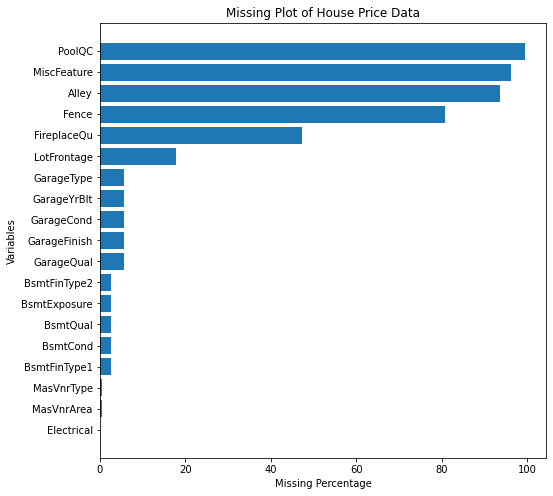

In [104]:
missing_variables1 = missing_variables.sort_values('MissingProp')
plt.subplots(figsize=(8, 8)) #figure size
plt.barh(missing_variables1['Variable Name'],missing_variables1['MissingProp'])
plt.title('Missing Plot of House Price Data')
plt.xlabel('Missing Percentage')
plt.ylabel('Variables')
plt.show()

The 19 columns of the dataset has the missing observations. However, NA means "None" in most of the columns rather than implying "Not Available". Thus, in line with the data description we will input the missing manually for most of the variables. 

In [105]:
# Manual Missing Imputation
data.loc[:, "Alley"] = data.loc[:, "Alley"].fillna("NoAlley")
data.loc[:, "BsmtQual"] = data.loc[:, "BsmtQual"].fillna("NoBasement")
data.loc[:, "BsmtCond"] = data.loc[:, "BsmtCond"].fillna("NoBasement")
data.loc[:, "BsmtExposure"] = data.loc[:, "BsmtExposure"].fillna("NoBasement")
data.loc[:, "BsmtFinType1"] = data.loc[:, "BsmtFinType1"].fillna("NoBasement")
data.loc[:, "BsmtFinType2"] = data.loc[:, "BsmtFinType2"].fillna("NoBasement")
data.loc[:, "FireplaceQu"] = data.loc[:, "FireplaceQu"].fillna("NoFireplace")
data.loc[:, "GarageType"] = data.loc[:, "GarageType"].fillna("NoGarage")
data.loc[:, "GarageFinish"] = data.loc[:, "GarageFinish"].fillna("NoGarage")
data.loc[:, "GarageQual"] = data.loc[:, "GarageQual"].fillna("NoGarage")
data.loc[:, "GarageCond"] = data.loc[:, "GarageCond"].fillna("NoGarage")
data.loc[:, "GarageYrBlt"] = data.loc[:, "GarageYrBlt"].fillna(0)
data.loc[:, "PoolQC"] = data.loc[:, "PoolQC"].fillna("NoPool")
data.loc[:, "Fence"] = data.loc[:, "Fence"].fillna("NoFence")
data.loc[:, "MasVnrType"] = data.loc[:, "MasVnrType"].fillna("None")
data.loc[:, "MasVnrArea"] = data.loc[:, "MasVnrArea"].fillna(0)
data.loc[:, "MiscFeature"] = data.loc[:, "MiscFeature"].fillna("NoMisc")
data.loc[:, "Electrical"] = data.loc[:, "Electrical"].fillna(data['Electrical'].value_counts().index[0]) #Mode imputation

In [106]:
lot_frontage_before_imput = data['LotFrontage']

In [107]:
data.loc[:, 'LotFrontage'] = data.loc[:, 'LotFrontage'].fillna(data['LotFrontage'].median()) #Since the missing does not depend 
#on any other variables, we use the median because it has outlier observation.

In [108]:
import numpy as np
Lot = lot_frontage_before_imput.append(data['LotFrontage'])
Type = np.array(["Before Imputation", "After Imputation"])
Type = np.repeat(Type, [1460,1460], axis=0)
Lot_Imput = pd.DataFrame({'Lot' : Lot,'Type' : Type}, 
                                columns=['Lot','Type'])
Lot_Imput.tail(5)

,Lot,Type
1455,62.0,After Imputation
1456,85.0,After Imputation
1457,66.0,After Imputation
1458,68.0,After Imputation
1459,75.0,After Imputation


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


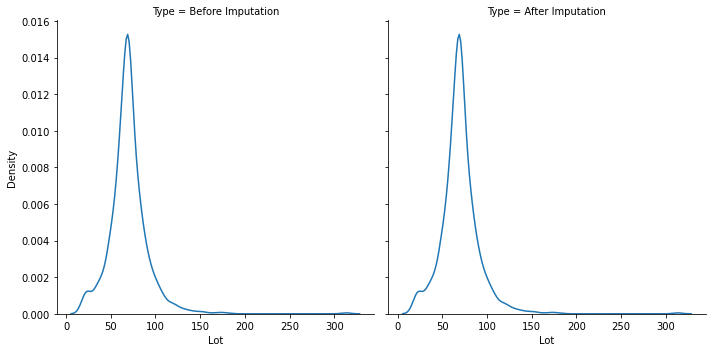

In [114]:
sns.displot(data=Lot_Imput, x="Lot", col= "Type", kind="kde")

In [116]:
missing_obs_new = data.isnull( ).sum().sort_values(ascending=False)
missing_new = pd.DataFrame(data=missing_obs_new, columns=['NumberofMissing'])
sum(missing_new['NumberofMissing']>0)

0

It is seen that the dataset does not have any missing column.

**Outlier**

As stated in the data description, this data set may suffer from 5 influential observations in total. The data creator suggests the removal of those observations.  

<function matplotlib.pyplot.show(close=None, block=None)>

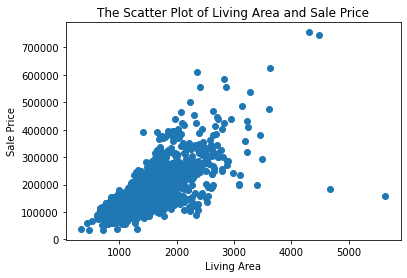

In [118]:
plt.scatter(data['GrLivArea'],data['SalePrice'])
plt.title('The Scatter Plot of Living Area and Sale Price')
plt.xlabel('Living Area')
plt.ylabel('Sale Price')
plt.show #shows the outliers

In [119]:
outlier_index = []
for i in range(1459):
    if data['GrLivArea'][i]>4000:
        outlier_index.append(i)
    else:
        continue
outlier_index

[523, 691, 1182, 1298]

In [120]:
#Removing Outliers
data_no_outlier = data.drop(outlier_index)
data_no_outlier.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NoAlley,Reg,Lvl,AllPub,...,0,NoPool,NoFence,NoMisc,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NoAlley,Reg,Lvl,AllPub,...,0,NoPool,NoFence,NoMisc,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NoAlley,IR1,Lvl,AllPub,...,0,NoPool,NoFence,NoMisc,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NoAlley,IR1,Lvl,AllPub,...,0,NoPool,NoFence,NoMisc,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NoAlley,IR1,Lvl,AllPub,...,0,NoPool,NoFence,NoMisc,0,12,2008,WD,Normal,250000


In [125]:
sum(data_no_outlier['GrLivArea']>4000)#no outlier

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


0

**Export the data**

We will export the data set before the data cleaning tool because it will standardize the data and we cannot get it back. 

In [25]:
data.to_csv('finaldata.csv') #export the data as csv

**Data Quality Check**

```ydata``` quality tool will be used for this purpose.It will check the data in terms of data quality properties.

In [26]:
#pip install ydata-quality

In [32]:
from ydata_quality import DataQuality

data_for_quality = data
# create a DataQuality object from the main class that holds all quality modules

dq = DataQuality(df=data_for_quality)

# run the tests and outputs a summary of the quality tests
results = dq.evaluate()

Warnings:
	TOTAL: 2 warning(s)
	Priority 2: 2 warning(s)


Priority 2 - usage allowed, limited human intelligibility:
	* [DATA RELATIONS - HIGH COLLINEARITY - CATEGORICAL] Found 43 categorical variables with significant collinearity (p-value < 0.05). The variables listed in results are highly collinear with other variables in the dataset and sorted descending according to propensity. These will make model explainability harder and potentially give way to issues like overfitting.Depending on your end goal you might want to remove variables following the provided order.
	* [DATA RELATIONS - HIGH COLLINEARITY - NUMERICAL] Found 11 numerical variables with high Variance Inflation Factor (VIF>5.0). The variables listed in results are highly collinear with other variables in the dataset. These will make model explainability harder and potentially give way to issues like overfitting.Depending on your end goal you might want to remove the highest VIF variables.



The may suffer from the collinearity. This result will effect the our modelling choices directly.

In [33]:
#dq.get_warnings(test='High Collinearity - Numerical') # get the correlated variables

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


[QualityWarning(category='Data Relations', test='High Collinearity - Numerical', description='Found 11 numerical variables with high Variance Inflation Factor (VIF>5.0). The variables listed in results are highly collinear with other variables in the dataset. These will make model explainability harder and potentially give way to issues like overfitting.Depending on your end goal you might want to remove the highest VIF variables.', priority=<Priority.P2: 2>, data=2ndFlrSF             inf
 GrLivArea            inf
 LowQualFinSF         inf
 BsmtFinSF1           inf
 BsmtFinSF2           inf
 BsmtUnfSF            inf
 TotalBsmtSF          inf
 1stFlrSF             inf
 GarageCars      6.190731
 SalePrice       5.456014
 GarageArea      5.324147
 dtype: float64)]

In [34]:
dq.get_warnings(test='High Collinearity - Categorical') # get the categorical related variables

[QualityWarning(category='Data Relations', test='High Collinearity - Categorical', description='Found 43 categorical variables with significant collinearity (p-value < 0.05). The variables listed in results are highly collinear with other variables in the dataset and sorted descending according to propensity. These will make model explainability harder and potentially give way to issues like overfitting.Depending on your end goal you might want to remove variables following the provided order.', priority=<Priority.P2: 2>, data=              Var1          Var2  Adjusted Chi2   p-value    Chi2 stat  DoF
 0     GarageFinish    GarageQual            inf  0.000000  1531.020300   15
 1    SaleCondition      SaleType            inf  0.000000  1652.675077   40
 2       GarageCond    GarageQual            inf  0.000000  3633.062233   25
 3       GarageCond  GarageFinish            inf  0.000000  1517.904034   15
 4     BsmtFinType1      BsmtQual            inf  0.000000  1960.385538   24
 ..   

We see that the data suffer from the association among the features and this situation will affect our model choice in the research questions.

**Read the clean data**

 After quality check, read the dataset again since the data quality check tool standardizes the data in the data quality check steps.

In [134]:
data = pd.read_csv('finaldata.csv') #since the scaled data is available after quality check.
data.head(5)

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


,Unnamed: 0,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,1,60,RL,65.0,8450,Pave,NoAlley,Reg,Lvl,...,0,NoPool,NoFence,NoMisc,0,2,2008,WD,Normal,208500
1,1,2,20,RL,80.0,9600,Pave,NoAlley,Reg,Lvl,...,0,NoPool,NoFence,NoMisc,0,5,2007,WD,Normal,181500
2,2,3,60,RL,68.0,11250,Pave,NoAlley,IR1,Lvl,...,0,NoPool,NoFence,NoMisc,0,9,2008,WD,Normal,223500
3,3,4,70,RL,60.0,9550,Pave,NoAlley,IR1,Lvl,...,0,NoPool,NoFence,NoMisc,0,2,2006,WD,Abnorml,140000
4,4,5,60,RL,84.0,14260,Pave,NoAlley,IR1,Lvl,...,0,NoPool,NoFence,NoMisc,0,12,2008,WD,Normal,250000


In [135]:
# Remove the uselesss column, Unnamed and ID
data = data.drop(["Unnamed: 0","Id"],axis = 1 )
data.head(3) #plt.subplots(figsize=(8, 8))

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NoAlley,Reg,Lvl,AllPub,Inside,...,0,NoPool,NoFence,NoMisc,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NoAlley,Reg,Lvl,AllPub,FR2,...,0,NoPool,NoFence,NoMisc,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NoAlley,IR1,Lvl,AllPub,Inside,...,0,NoPool,NoFence,NoMisc,0,9,2008,WD,Normal,223500


**Explaratory Data Analysis**

Here, we will calculate some descriptive statistics and obtain some visual summaries by drawing related exploratory plots. Please note that although some of the plots below are not available in the paper, they are mentioned by words. For example, most of the numerical variables do not follow the normal distribution indicates the histogram matrix represented below. 

In [136]:
# Get the descriptive statistics for numerical variables 
data.describe()

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,69.863699,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.117123,443.639726,46.549315,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,22.027677,9981.264932,1.382997,1.112799,30.202904,20.645407,180.731373,456.098091,161.319273,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,60.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,79.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,164.250000,712.250000,0.000000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


Text(0.5, 1.02, 'Histograms of Numerical Variables')

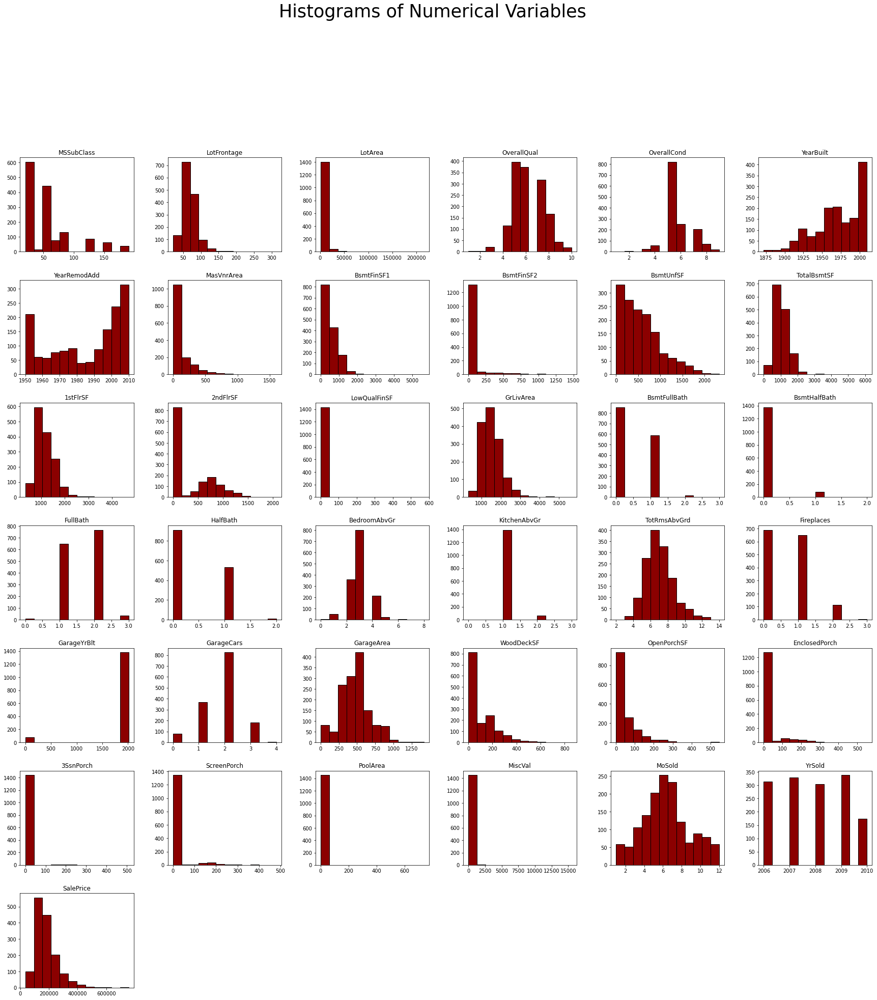

In [137]:
data.hist(figsize=(30, 30), bins = 12, edgecolor = 'black', grid = False, color = 'darkred')
plt.suptitle('Histograms of Numerical Variables', x = 0.5, y = 1.02, size = 35) #most of the variables do not follow the normal distribution

Now, we will list the frequency of the categorical variables in the data and see whether which variables may bu useless due to the lack of the variation. 

In [138]:
def frequency_table(data):
  for i in data:
    if data[i].dtype == 'O':
      print(data[i].value_counts())
frequency_table(data)

RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64
Pave    1454
Grvl       6
Name: Street, dtype: int64
NoAlley    1369
Grvl         50
Pave         41
Name: Alley, dtype: int64
Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64
Lvl    1311
Bnk      63
HLS      50
Low      36
Name: LandContour, dtype: int64
AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64
Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64
Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64
NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
StoneBr     25
SWISU       25
MeadowV     17
Blmngtn     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2


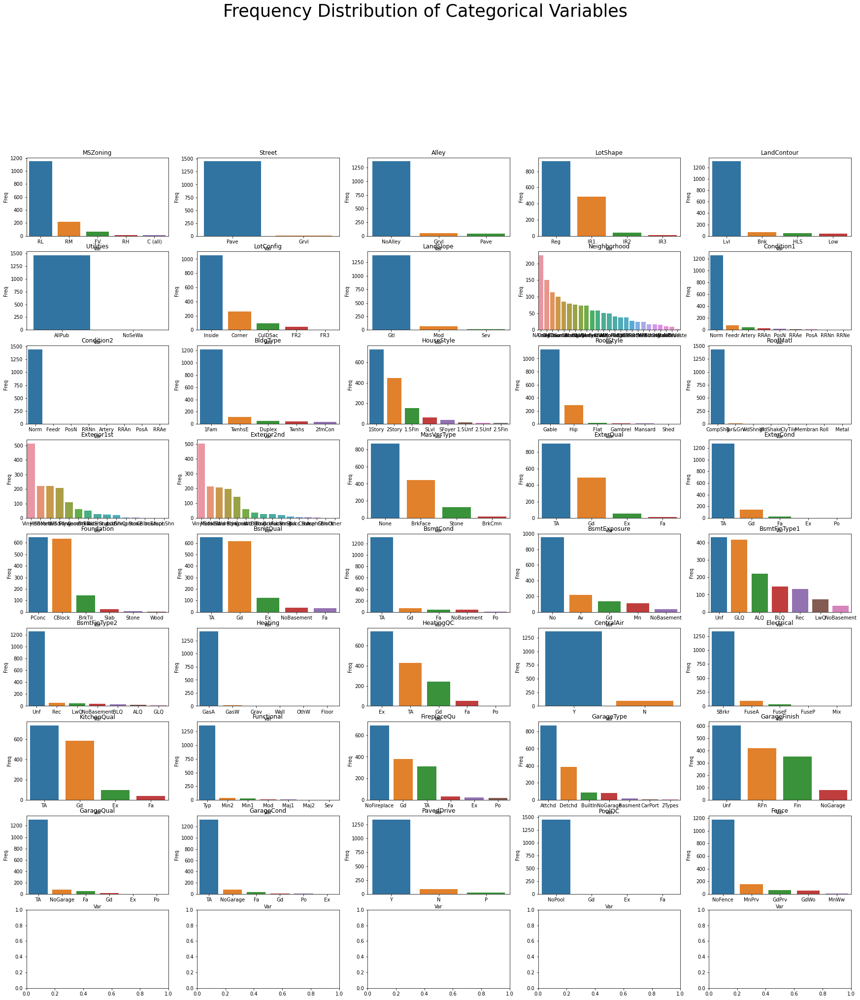

In [140]:
fig, axes = plt.subplots(9,5,figsize=(30,31))
categorical_cols = data.dtypes[data.dtypes == "object"].index
listNum = list(categorical_cols)

x=-1
for num in range(0,9):
    for col in range(0,5):  
        i = num * 5 + col
        if i < 40:
            x += 1
            ft = data[listNum[i]].value_counts()
            ft_data= pd.DataFrame(data=ft)
            ft_data["Var"]=ft_data.index
            ft_data.columns = ['Freq','Var']
            sns.barplot(x = 'Var', y= 'Freq', data = ft_data, ax = axes[num][col]).set_title(listNum[i])
plt.suptitle('Frequency Distribution of Categorical Variables', x = 0.5, y = 1.02, size = 35)            
plt.show()

In [141]:
## Correlations 
## For continious vs sale price : Pearson
## For discrete vs sale price: Sperman 
cont_var  = ['LotFrontage', 'LotArea','MasVnrArea','BsmtFinSF1','BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
'1stFlrSF', '2ndFlrSF', 'LowQualFinSF','GrLivArea','WoodDeckSF','GarageArea','OpenPorchSF', 'EnclosedPorch', '3SsnPorch','ScreenPorch', 'PoolArea','MiscVal','SalePrice']
data_for_pearson = data[ ['LotFrontage', 'LotArea','MasVnrArea','BsmtFinSF1','BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
'1stFlrSF', '2ndFlrSF', 'LowQualFinSF','GrLivArea','WoodDeckSF','GarageArea','OpenPorchSF', 'EnclosedPorch', '3SsnPorch','ScreenPorch', 'PoolArea','MiscVal','SalePrice']]

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


<function matplotlib.pyplot.show(close=None, block=None)>

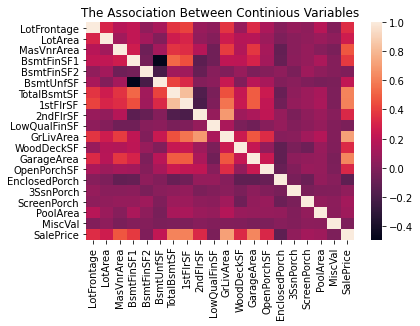

In [142]:
pearson = data_for_pearson.corr(method="pearson")
sns.heatmap(pearson, annot=False)
plt.title('The Association Between Continious Variables')
plt.show #correlated variables

In [143]:
data_for_spearman = data[ ['YearBuilt', 'YearRemodAdd','BsmtFullBath', 'BsmtHalfBath', 'FullBath','HalfBath', 'BedroomAbvGr', 'KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageYrBlt','GarageCars','MoSold', 'YrSold','SalePrice']]

<function matplotlib.pyplot.show(close=None, block=None)>

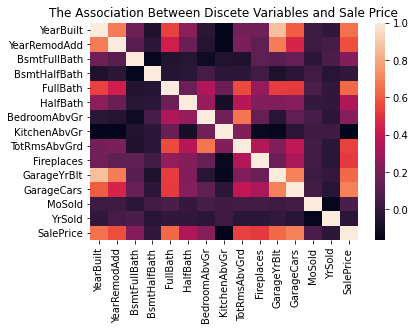

In [144]:
spearman = data_for_spearman.corr(method="spearman")
sns.heatmap(spearman, annot=False)
plt.title('The Association Between Discete Variables and Sale Price')
plt.show #correlated variables

In [145]:
#correlated with sale_price
sale_price_pea = pd.DataFrame(data = pearson['SalePrice'])
sale_price_pea =sale_price_pea.drop('SalePrice')
sale_price_sp = pd.DataFrame(data=spearman['SalePrice'])
sale_price_sp =sale_price_sp.drop('SalePrice')
sale_price_cor = sale_price_pea.append(sale_price_sp)
sale_price_cor['Variables'] = sale_price_cor.index
sale_price_cor.columns = ['Correlation','Variables']
sale_price_cor = sale_price_cor.sort_values('Correlation',ascending = False)
sale_price_cor

,Correlation,Variables
GrLivArea,0.708624,GrLivArea
GarageCars,0.690711,GarageCars
YearBuilt,0.652682,YearBuilt
FullBath,0.635957,FullBath
GarageYrBlt,0.634095,GarageYrBlt
GarageArea,0.623431,GarageArea
TotalBsmtSF,0.613581,TotalBsmtSF
1stFlrSF,0.605852,1stFlrSF
YearRemodAdd,0.571159,YearRemodAdd
TotRmsAbvGrd,0.532586,TotRmsAbvGrd


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


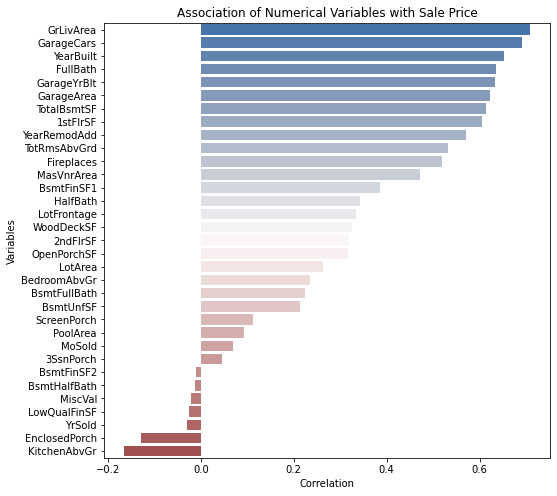

In [146]:
plt.subplots(figsize=(8,8))
sns.barplot(x ='Correlation',y = 'Variables',data= sale_price_cor, palette="vlag",orient = 'h')
plt.title('Association of Numerical Variables with Sale Price')
plt.show()

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


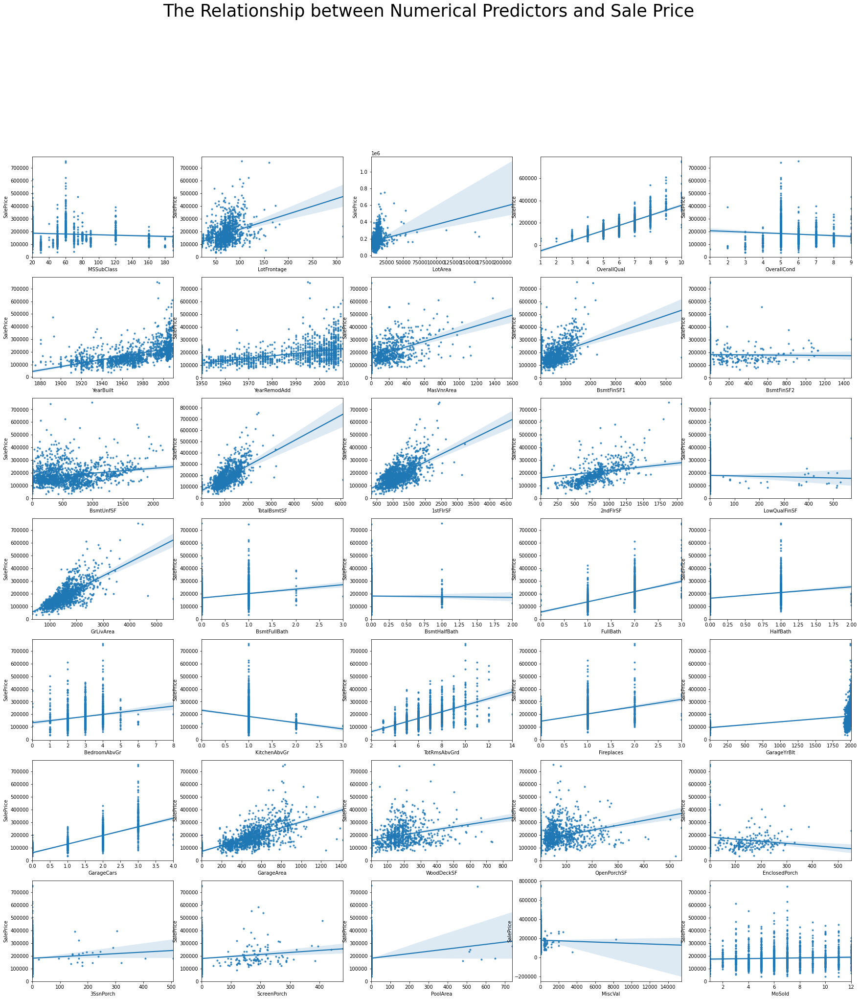

In [147]:
fig, axes = plt.subplots(7,5,figsize=(30,31))
numerical_cols = data.dtypes[data.dtypes  != "object"].index
listNum = list(numerical_cols)

x=-1
for num in range(0,7):
    for col in range(0,5):  
        i = num * 5 + col
        if i < 40:
            x += 1
            rp = sns.regplot(x = listNum[i], y = 'SalePrice', data =data,ax = axes[num][col],marker=".") 
plt.suptitle('The Relationship between Numerical Predictors and Sale Price', x = 0.5, y = 1.02, size = 35)            
plt.show()

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


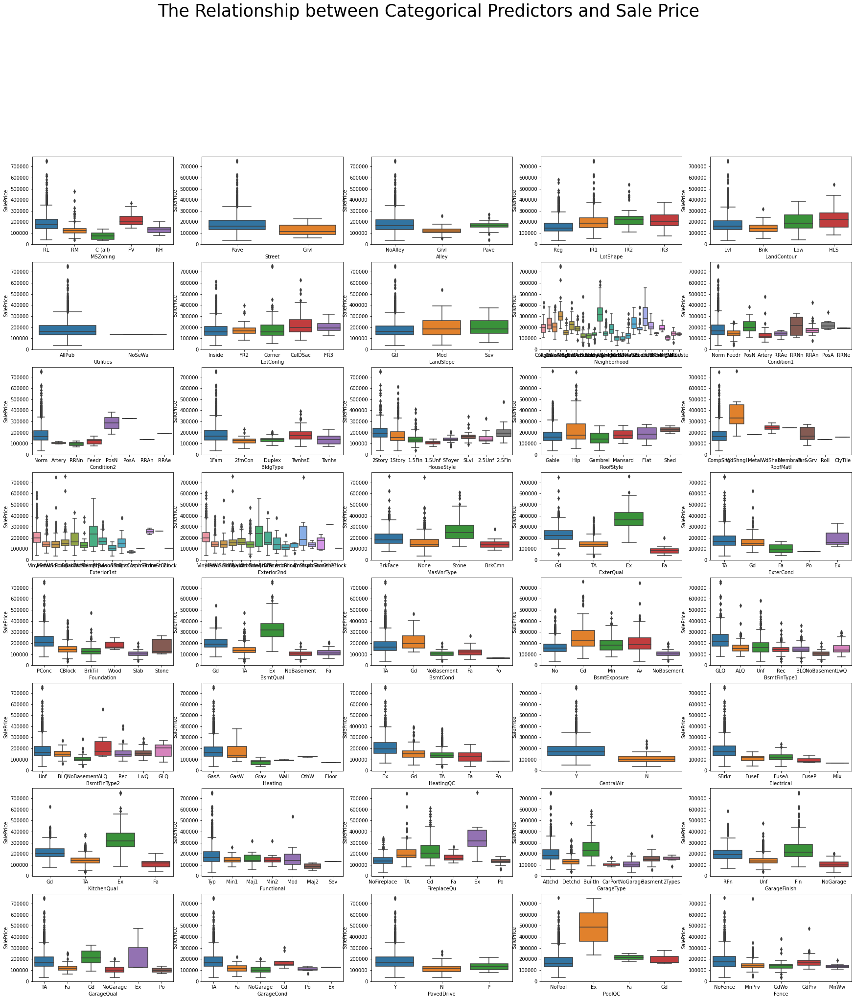

In [148]:
fig, axes = plt.subplots(8,5,figsize=(30,31))
categorical_cols = data.dtypes[data.dtypes  == "object"].index
listNum = list(categorical_cols)

x=-1
for num in range(0,8):
    for col in range(0,5):  
        i = num * 5 + col
        if i < 40:
            x += 1
            rp = sns.boxplot(x = listNum[i], y = 'SalePrice', data =data,ax = axes[num][col]) 
plt.suptitle('The Relationship between Categorical Predictors and Sale Price', x = 0.5, y = 1.02, size = 35)            
plt.show()

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


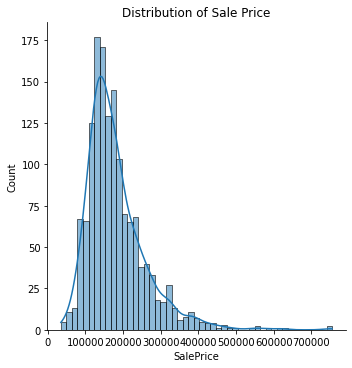

In [149]:
sns.displot(data, x = 'SalePrice',kde = True)
plt.title('Distribution of Sale Price')      
plt.show()

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


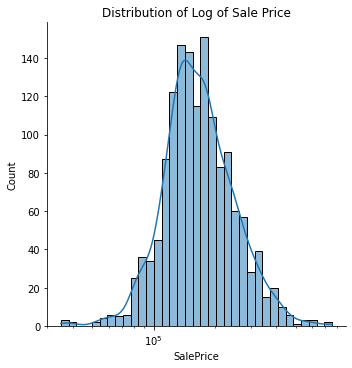

In [150]:
sns.displot(data, x = 'SalePrice',kde = True,log_scale=True)
plt.title('Distribution of Log of Sale Price')#approximately true
plt.show()

## Research Questions 

Here, we will try investigate some of the important residential factors in predicting sale price by categorizing them by their relevance. Thereby, we will have an idea about some of the important factor before developing comprehensive models.

#### <span style="color:darkred"> **RQ1: How does the 28 neighborhoods in Ames, Iowa affect the Sale Price? Which neighbourhoods are important?:**</span>

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


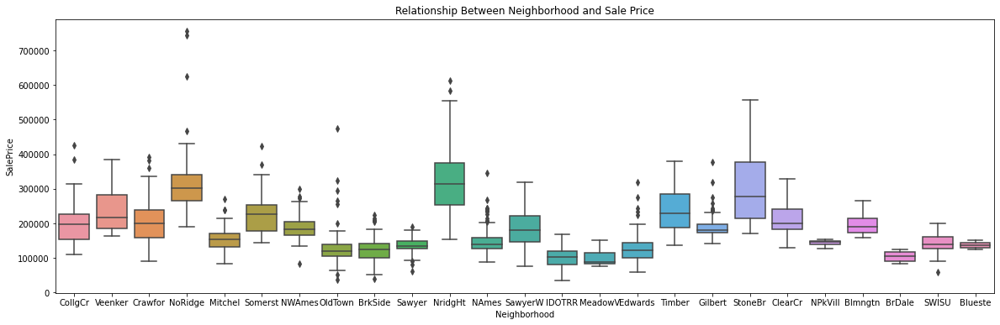

In [151]:
plt.subplots(figsize = (20,6))
sns.boxplot(x ='Neighborhood', y = 'SalePrice', data = data).set_title('Relationship Between Neighborhood and Sale Price')
plt.show() #no ridge and nridht has the highest

In [152]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
data_for_anova = pd.DataFrame(data= data[['Neighborhood']])
data_for_anova['LogSP'] = np.log(data['SalePrice'])
data_for_anova

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


,Neighborhood,LogSP
0,CollgCr,12.247694
1,Veenker,12.109011
2,CollgCr,12.317167
3,Crawfor,11.849398
4,NoRidge,12.429216
...,...,...
1455,Gilbert,12.072541
1456,NWAmes,12.254863
1457,Crawfor,12.493130
1458,NAmes,11.864462


In [153]:
ratio = data_for_anova.groupby('Neighborhood').std().max() / data_for_anova.groupby('Neighborhood').std().min()
ratio #assumption for anova is not satisfied

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


LogSP    5.900489
dtype: float64

Homogeneity of the variance is not satisfied, so we cannot use the Anova.

In [154]:
import pandas as pd
data_for_neigborhood = pd.get_dummies(data['Neighborhood'])
data_for_neigborhood['LogSalePrice'] = np.log(data['SalePrice'])

In [155]:
data_for_neigborhood

,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,IDOTRR,...,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker,LogSalePrice
0,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,12.247694
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,12.109011
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,12.317167
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,11.849398
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,12.429216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,12.072541
1456,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,12.254863
1457,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,12.493130
1458,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,11.864462


In [156]:
p_cor = data_for_neigborhood.corr(method="spearman")
nb_cor = pd.DataFrame(data = p_cor.loc['LogSalePrice',:])
nb_cor =nb_cor.drop('LogSalePrice',axis = 0)
nb_cor['Variables'] = nb_cor.index
nb_cor.columns = ['Correlation','Variables']
nb_cor = nb_cor.sort_values('Correlation',ascending = False)

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


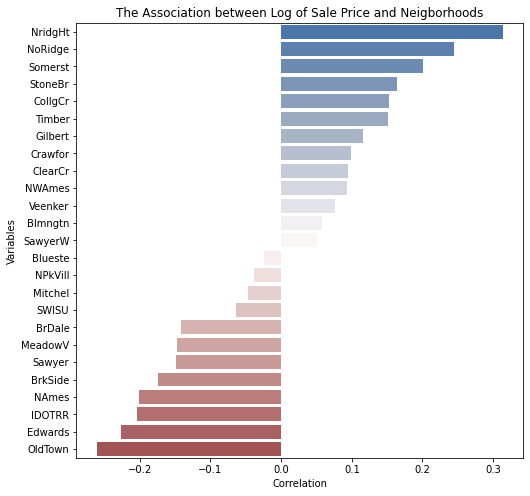

In [157]:
plt.subplots(figsize=(8,8))
sns.barplot(x ='Correlation',y = 'Variables',data= nb_cor, palette="vlag",orient = 'h')
plt.title('The Association between Log of Sale Price and Neigborhoods')
plt.show() #NridgHt, NoRidge,Somerst have +'ve impact', IDOOTR, Old Town, Edwards -'ve impact.

Since our main aim is to extract the importance of the factor and the variabiliy explained by them, we will use all observations.

In [158]:
data_for_neigborhood_X = data_for_neigborhood.drop('LogSalePrice',axis =1)
data_for_neigborhood_Y = data_for_neigborhood['LogSalePrice']

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


In [159]:
from sklearn import linear_model
lassocv = linear_model.LassoCV(alphas = None, cv = 10, max_iter = 100000)
lassocv.fit(data_for_neigborhood_X, data_for_neigborhood_Y)
print(lassocv.alpha_)

3.139914351619059e-05


In [160]:
from sklearn.model_selection import cross_val_score
lasso = linear_model.Lasso(alpha=lassocv.alpha_,max_iter = 10000)
lasso.fit(data_for_neigborhood_X, data_for_neigborhood_Y)
score = cross_val_score(lasso, data_for_neigborhood_X, data_for_neigborhood_Y, cv=10,scoring ='r2')
print('CV R2:',np.mean(score),'CV R2 STD:',np.std(score))

CV R2: 0.5583173491273727 CV R2 STD: 0.024912255693674973


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


In [161]:
importance = pd.DataFrame(data = np.abs(lasso.coef_))
importance['Pred'] = data_for_neigborhood_X.columns
importance.columns = ['Score','Variable']
importance = importance.sort_values('Score',ascending = True)

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


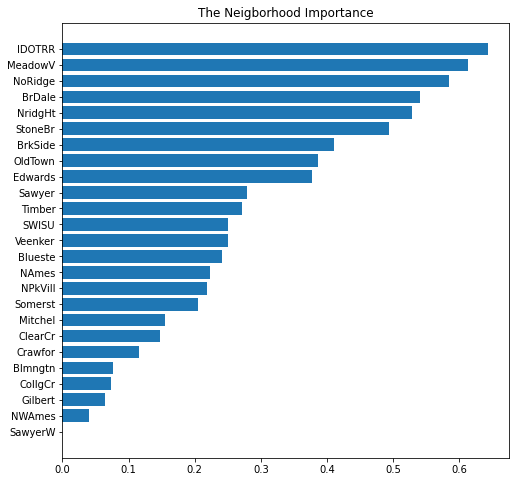

In [162]:
plt.subplots(figsize=(8,8))
plt.barh(importance['Variable'],importance['Score'])
plt.title('The Neigborhood Importance')
plt.show() 

<span style ='color:darkred'> **RQ2: How the home above grade properties affect the sale
price between 2006 and 2010 in Ames, Iowa? What is the
most efficient home properties on the sale price?**
    
    
Since our main aim is to extract the importance of the factor and the variabiliy explained by them, we will use all observations.

In [163]:
above_grade = ['GrLivArea','FullBath', 'HalfBath','BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd']
above_grade_X = data[above_grade]
above_grade_X.head(5)

,GrLivArea,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd
0,1710,2,1,3,1,8
1,1262,2,0,3,1,6
2,1786,2,1,3,1,6
3,1717,1,0,3,1,7
4,2198,2,1,4,1,9


In [164]:
grade_target = data['SalePrice']

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


In [165]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV 
from scipy.stats import uniform

rand_for_param = {'n_estimators': range(1,6), 
                               'max_leaf_nodes':range(3,9,1), 
                               'max_depth':range(1,25,3),
                               'max_features':['auto', 'sqrt'],'min_samples_split': range(5,50,10),
                               'bootstrap': [True,False],
                               'min_samples_leaf':range(1,9,1)} 

rf_abovegrade = RandomizedSearchCV(RandomForestRegressor(random_state = 1915743), 
                                  rand_for_param , random_state=1915743,n_iter=20) 

rf_abovegrade_model = rf_abovegrade.fit(above_grade_X,grade_target)

rf_abovegrade_model_regressor = rf_abovegrade_model.best_estimator_ 

rf_abovegrade_model.best_params_ 

{'n_estimators': 3,
 'min_samples_split': 45,
 'min_samples_leaf': 3,
 'max_leaf_nodes': 8,
 'max_features': 'auto',
 'max_depth': 13,
 'bootstrap': True}

In [166]:
score_rf = cross_val_score(rf_abovegrade_model, above_grade_X,grade_target, cv=10,scoring ='r2')
print('CV R2:',np.mean(score_rf),'CV R2 STD:',np.std(score_rf))

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


CV R2: 0.5651806520833 CV R2 STD: 0.04952540666893646


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


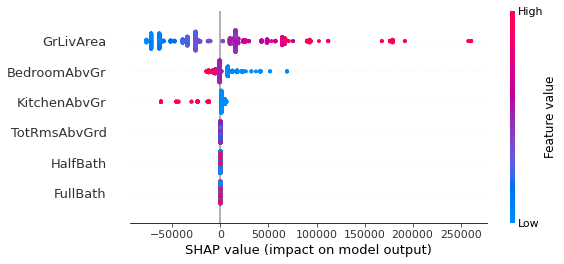

In [167]:
import shap # Use this package for visualization
explainer = shap.TreeExplainer(rf_abovegrade_model_regressor)
shap_values = explainer.shap_values( above_grade_X)
shap.summary_plot(shap_values, above_grade_X)

<span style = color:darkred>**RQ 3: What is the most effective basement residential property in predicting sale price in Iowa?**
    
Since our main aim is to extract the importance of the factor and the variabiliy explained by them, we will use all observations.

In [168]:
bsmt_col_cat = ['BsmtQual', 'BsmtCond','BsmtExposure', 'BsmtFinType1', 'BsmtFinType2'] 
bsmt_col_num = ['BsmtFinSF1','BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath']
bsmt_col_cat_data = data[bsmt_col_cat]
bsmt_col_num_data = data[bsmt_col_num]
bsmt_col_cat_data_coding = pd.get_dummies(bsmt_col_cat_data)
bsmt_col_cat_data_coding[bsmt_col_num]=bsmt_col_num_data
bsmt_data = bsmt_col_cat_data_coding
bsmt_data.head(5)

,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NoBasement,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_NoBasement,BsmtCond_Po,BsmtCond_TA,...,BsmtFinType2_LwQ,BsmtFinType2_NoBasement,BsmtFinType2_Rec,BsmtFinType2_Unf,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath
0,0,0,1,0,0,0,0,0,0,1,...,0,0,0,1,706,0,150,856,1,0
1,0,0,1,0,0,0,0,0,0,1,...,0,0,0,1,978,0,284,1262,0,1
2,0,0,1,0,0,0,0,0,0,1,...,0,0,0,1,486,0,434,920,1,0
3,0,0,0,0,1,0,1,0,0,0,...,0,0,0,1,216,0,540,756,1,0
4,0,0,1,0,0,0,0,0,0,1,...,0,0,0,1,655,0,490,1145,1,0


In [169]:
bsmt_response = data['SalePrice']

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


In [170]:
from sklearn.ensemble import RandomForestRegressor 
from sklearn.model_selection import RandomizedSearchCV 
from scipy.stats import uniform 

rand_for_param1 = {'n_estimators': range(1,35), 
                               'max_leaf_nodes':range(3,9,1), 
                               'max_depth':range(1,25,3),
                               'max_features':['auto', 'sqrt'],'min_samples_split': range(5,50,10),
                               'bootstrap': [True,False],
                               'min_samples_leaf':range(1,9,1)} 

rf_bsmt = RandomizedSearchCV(RandomForestRegressor(random_state = 1915743), 
                                  rand_for_param1 , random_state=1915743,n_iter=20) 

rf_bsmt_model = rf_bsmt.fit(bsmt_data,bsmt_response)

rf_bsmt_model_regressor = rf_bsmt_model.best_estimator_ 

rf_bsmt_model.best_params_ 

{'n_estimators': 12,
 'min_samples_split': 5,
 'min_samples_leaf': 6,
 'max_leaf_nodes': 5,
 'max_features': 'auto',
 'max_depth': 19,
 'bootstrap': True}

In [171]:
score_rf_bsmt = cross_val_score(rf_bsmt_model,bsmt_data,bsmt_response, cv=10,scoring ='r2')
print('CV R2:',np.mean(score_rf_bsmt),'CV R2 STD:',np.std(score_rf_bsmt))

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


CV R2: 0.5469105997562391 CV R2 STD: 0.04793460872440051


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


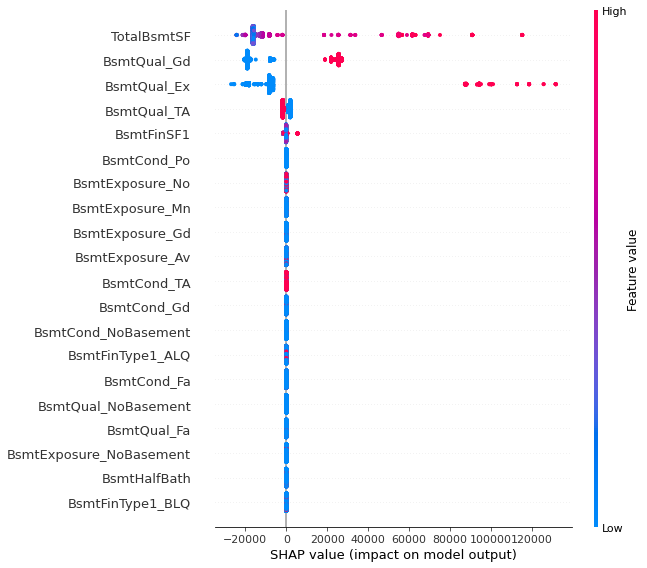

In [172]:
import shap # Use this package for visualization
explainer = shap.TreeExplainer(rf_bsmt_model_regressor)
shap_values = explainer.shap_values(bsmt_data)
shap.summary_plot(shap_values, bsmt_data)

## Modelling

In this part, we are building some regression models to find out what is the most important factor in the prediction of the sale price.

**Models**: Random Forest, XGBoost, Gradient Boosting, Light GBM, CatBoost.

**Baseline**: Average with respect to Neigborhoods.

If we apply one hot encoder transformation, we will have high cardinality that may affect the model performance negatively , so I use catboost encoder for categorical transformation.

Note: The variable importance plots of the all methods are considered and mentioned briefly in the paper although they are not available in the paper.

In [173]:
X = data.drop('SalePrice',axis = 1)
y = data['SalePrice']

In [174]:
X_categoric = X[X.dtypes[data.dtypes  == "object"].index]
X_numeric = X[X.dtypes[data.dtypes  != "object"].index]

In [175]:
from category_encoders import CatBoostEncoder 
encoder = CatBoostEncoder(random_state=1915743)
encoder.fit(X_categoric,y)
X_categoric = encoder.transform(X_categoric)
X_categoric.head()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,190996.241489,181130.394636,183450.284085,164772.276669,180184.308838,180950.936436,176941.830196,179957.496888,197852.895337,184492.657570,...,202867.430765,202018.875168,187484.829418,187880.48696,186429.862935,180405.018704,187591.180674,182045.610658,173407.766716,175206.989321
1,190996.241489,181130.394636,183450.284085,164772.276669,180184.308838,180950.936436,177996.795748,179957.496888,233951.766324,142944.331657,...,202867.430765,202018.875168,187484.829418,187880.48696,186429.862935,180405.018704,187591.180674,182045.610658,173407.766716,175206.989321
2,190996.241489,181130.394636,183450.284085,206049.746796,180184.308838,180950.936436,176941.830196,179957.496888,197852.895337,184492.657570,...,202867.430765,202018.875168,187484.829418,187880.48696,186429.862935,180405.018704,187591.180674,182045.610658,173407.766716,175206.989321
3,190996.241489,181130.394636,183450.284085,206049.746796,180184.308838,180950.936436,181620.765894,179957.496888,210053.503767,184492.657570,...,134211.858752,142220.391412,187484.829418,187880.48696,186429.862935,180405.018704,187591.180674,182045.610658,173407.766716,146863.825450
4,190996.241489,181130.394636,183450.284085,206049.746796,180184.308838,180950.936436,177996.795748,179957.496888,331619.742759,184492.657570,...,202867.430765,202018.875168,187484.829418,187880.48696,186429.862935,180405.018704,187591.180674,182045.610658,173407.766716,175206.989321


In [176]:
X = X_categoric.join(X_numeric)
X.head()

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,190996.241489,181130.394636,183450.284085,164772.276669,180184.308838,180950.936436,176941.830196,179957.496888,197852.895337,184492.657570,...,548,0,61,0,0,0,0,0,2,2008
1,190996.241489,181130.394636,183450.284085,164772.276669,180184.308838,180950.936436,177996.795748,179957.496888,233951.766324,142944.331657,...,460,298,0,0,0,0,0,0,5,2007
2,190996.241489,181130.394636,183450.284085,206049.746796,180184.308838,180950.936436,176941.830196,179957.496888,197852.895337,184492.657570,...,608,0,42,0,0,0,0,0,9,2008
3,190996.241489,181130.394636,183450.284085,206049.746796,180184.308838,180950.936436,181620.765894,179957.496888,210053.503767,184492.657570,...,642,0,35,272,0,0,0,0,2,2006
4,190996.241489,181130.394636,183450.284085,206049.746796,180184.308838,180950.936436,177996.795748,179957.496888,331619.742759,184492.657570,...,836,192,84,0,0,0,0,0,12,2008


In [177]:
##creating train, test and validation sets

from sklearn.model_selection import train_test_split 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1915743)

X_train, X_validation, y_train, y_validation = train_test_split(X_train, y_train, test_size=0.2, random_state=1915743) 

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


### Random Forest

In [178]:
from sklearn.ensemble import RandomForestRegressor 
from sklearn.model_selection import RandomizedSearchCV 
from scipy.stats import uniform 

rf_optimization_parameters = {'n_estimators': range(10,100,10), 
                               'max_leaf_nodes':range(3,9,1), 
                               'max_depth':range(1,25,3),
                               'max_features':['auto', 'sqrt'],'min_samples_split': range(5,50,10),
                               'bootstrap': [True,False],
                               'min_samples_leaf':range(1,9,1)} 

rf_searcher = RandomizedSearchCV(RandomForestRegressor(random_state = 1915743), 
                                  rf_optimization_parameters, random_state=1915743,n_iter=20) 

rf_search = rf_searcher.fit(X_train,y_train)

rf_regressor = rf_search.best_estimator_ 

rf_search.best_params_ 

{'n_estimators': 50,
 'min_samples_split': 5,
 'min_samples_leaf': 5,
 'max_leaf_nodes': 7,
 'max_features': 'auto',
 'max_depth': 10,
 'bootstrap': True}

In [179]:
from sklearn.metrics import r2_score #criteria 1
from sklearn.metrics import mean_squared_error #criteria 2

y_pred_valid_rf = rf_regressor.predict(X_validation)
print('RF Val R^2',r2_score(y_validation, y_pred_valid_rf),'RF Val RMSE', mean_squared_error(y_validation, y_pred_valid_rf, squared=False))

RF Val R^2 0.7275009859640906 RF Val RMSE 43881.09556711103


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


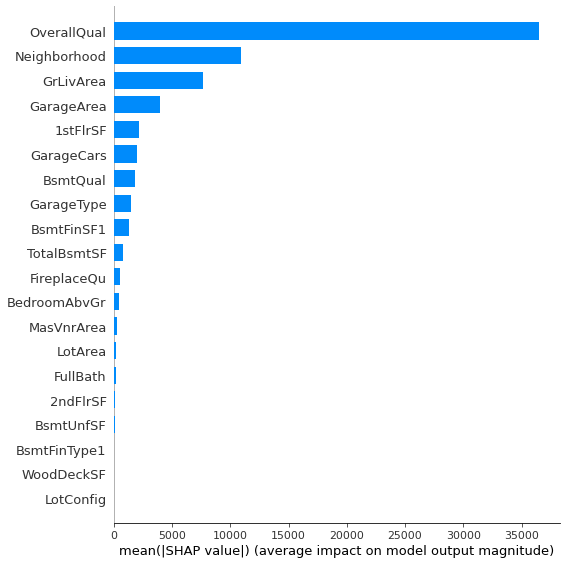

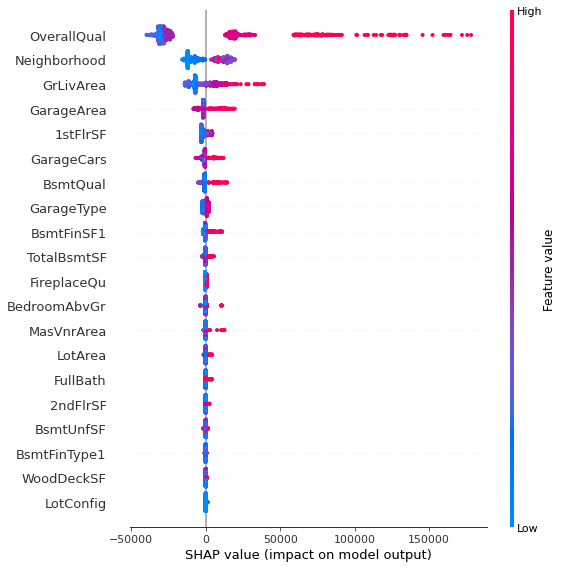

In [180]:
import shap # Use this package for visualization
explainer = shap.TreeExplainer(rf_regressor)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values,X_train, plot_type="bar")
shap.summary_plot(shap_values,X_train)

In [181]:
#test performance

y_pred_test_rf = rf_regressor.predict(X_test)
print('RF Test R^2',r2_score(y_test, y_pred_test_rf),'RF Test RMSE', mean_squared_error(y_test, y_pred_test_rf, squared=False))

RF Test R^2 0.8094338332903204 RF Test RMSE 34150.545832977434


## Gradient Boosting 

In [182]:
from sklearn.ensemble import GradientBoostingRegressor 
from sklearn.model_selection import RandomizedSearchCV 
from scipy.stats import uniform 

gbr_optimization_parameters = {'learning_rate':  uniform(0.01,1), 
                               'n_estimators': range(10,100,10), 
                               'max_leaf_nodes':range(3,9,1), 
                               'max_depth':range(1,16,2),
                               'subsample': uniform(0.01,1),
                               'min_samples_split': range(30,81,10)} 

gbr_searcher = RandomizedSearchCV(GradientBoostingRegressor(random_state = 1915743), 
                                  gbr_optimization_parameters, random_state=1915743,n_iter=20) 

gbr_search = gbr_searcher.fit(X_train,y_train)

gradboost_regressor = gbr_search.best_estimator_ 

gbr_search.best_params_ 


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


{'learning_rate': 0.1140244573767598,
 'max_depth': 5,
 'max_leaf_nodes': 4,
 'min_samples_split': 70,
 'n_estimators': 90,
 'subsample': 0.8225764123182269}

In [183]:

y_pred_valid_gbr =gradboost_regressor.predict(X_validation)
print('GBR Val R^2',r2_score(y_validation, y_pred_valid_gbr),'RF Val RMSE', mean_squared_error(y_validation, y_pred_valid_gbr, squared=False))

GBR Val R^2 0.8679701508564774 RF Val RMSE 30544.36197805976


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


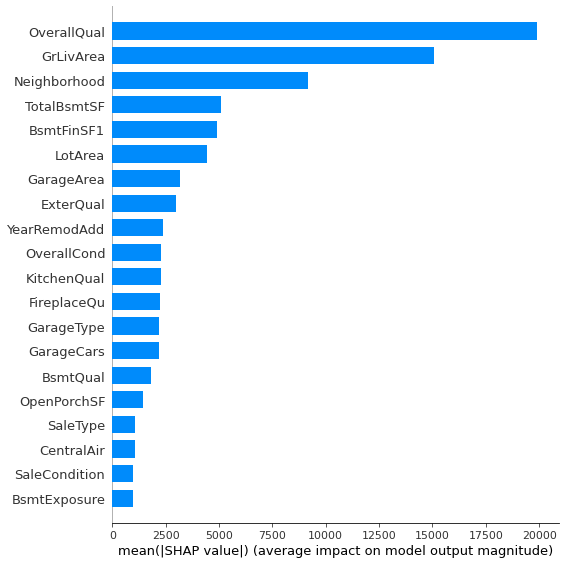

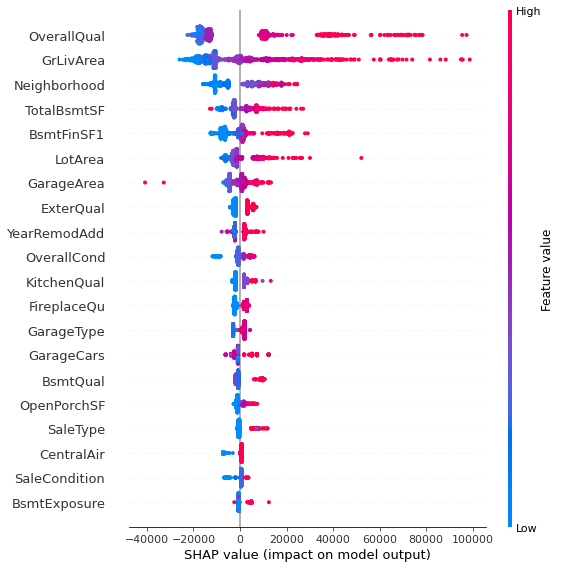

In [184]:
import shap # Use this package for visualization
explainer = shap.TreeExplainer(gradboost_regressor)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values,X_train, plot_type="bar")
shap.summary_plot(shap_values,X_train)

In [185]:
#test performance

y_pred_test_gbr = gradboost_regressor.predict(X_test)
print('GBR Test R^2',r2_score(y_test, y_pred_test_gbr),'GBR Test RMSE', mean_squared_error(y_test, y_pred_test_gbr, squared=False))

GBR Test R^2 0.906817888556273 GBR Test RMSE 23880.368488213997


#### XGBoost

In [186]:
from xgboost import XGBRegressor # Use this class

xgb_optimization_parameters = {'learning_rate':  uniform(0.01,1), 
                               'n_estimators': range(10,100,10),
                               'min_child_weight': uniform(0,5),
                               'eta': uniform(0.01,0.5), 
                               'max_depth':range(1,16,2),
                               'gamma': uniform(0,10),
                               'colsample_bylevel':uniform(0,1),
                               'subsample': uniform(0.01,1),
                               'reg_alpha': uniform(0,1)}  


xgb_searcher = RandomizedSearchCV(XGBRegressor(random_state = 1915743), xgb_optimization_parameters, random_state=1915743,n_iter=20) # Complete this


xgb_search = xgb_searcher.fit(X_train,y_train)

xgb_regressor = xgb_search.best_estimator_ 

xgb_search.best_params_ 


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


{'colsample_bylevel': 0.5446718652083202,
 'eta': 0.0664193385892649,
 'gamma': 6.6551671067219935,
 'learning_rate': 0.143638654868658,
 'max_depth': 5,
 'min_child_weight': 3.3060901193914645,
 'n_estimators': 90,
 'reg_alpha': 0.7872363534230353,
 'subsample': 0.7603225690261202}

In [187]:

y_pred_valid_xgb =xgb_regressor.predict(X_validation)
print('XGB Val R^2',r2_score(y_validation, y_pred_valid_xgb),'XGB Val RMSE', mean_squared_error(y_validation, y_pred_valid_xgb, squared=False))

XGB Val R^2 0.8518986518180957 XGB Val RMSE 32350.01603794109


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current 

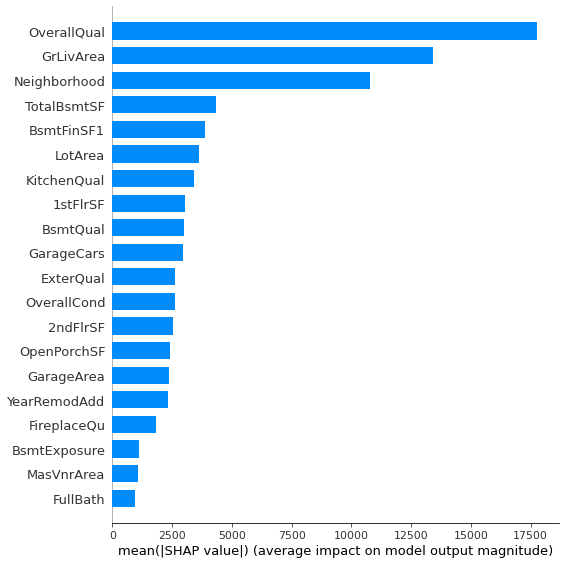

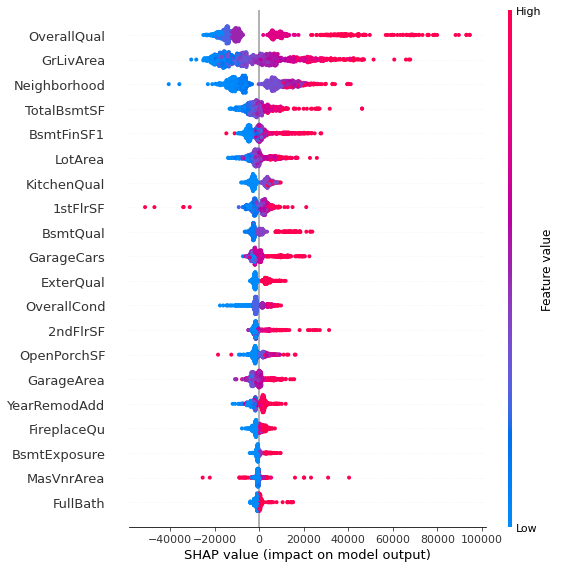

In [188]:
import shap # Use this package for visualization
explainer = shap.TreeExplainer(xgb_regressor)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values,X_train, plot_type="bar")
shap.summary_plot(shap_values,X_train)

In [189]:

y_pred_test_xgb= xgb_regressor.predict(X_test)
print('XGB Test R^2',r2_score(y_test, y_pred_test_xgb),'XGB Test RMSE', mean_squared_error(y_test, y_pred_test_xgb, squared=False))

XGB Test R^2 0.887388672759629 XGB Test RMSE 26252.20512191197


###  Light GBM

In [190]:
from lightgbm import LGBMRegressor 

lgbm_optimization_parameters = {'learning_rate': uniform(0.01, 1),
                                'n_estimators': range(10,100,10),
                                'min_child_weight': uniform(0,5),
                                'num_leaves': range(200,19,-100),
                                'max_depth':range(1,16,2),
                                'subsample': uniform(0.01, 1.0),
                                'reg_alpha': uniform(0,1)
                               } 

lgbm_searcher =RandomizedSearchCV(LGBMRegressor(random_state = 1915743), lgbm_optimization_parameters, random_state=1915743,n_iter=20) # Complete this

lgbm_search = lgbm_searcher.fit(X_train,y_train)
lgbm_regressor = lgbm_search.best_estimator_

lgbm_search.best_params_ 

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


{'learning_rate': 0.27475332752440973,
 'max_depth': 7,
 'min_child_weight': 0.372352815779613,
 'n_estimators': 50,
 'num_leaves': 100,
 'reg_alpha': 0.2606467299658717,
 'subsample': 0.8742085517660074}

In [191]:

y_pred_valid_lgbm =lgbm_regressor.predict(X_validation)
print('LGBM Val R^2',r2_score(y_validation, y_pred_valid_lgbm),'LGBM Val RMSE', mean_squared_error(y_validation, y_pred_valid_lgbm, squared=False))

LGBM Val R^2 0.8335136963398502 LGBM Val RMSE 34299.22047953412


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


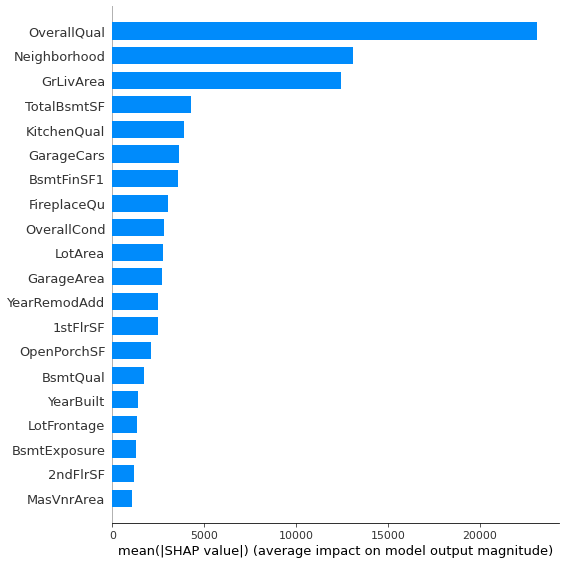

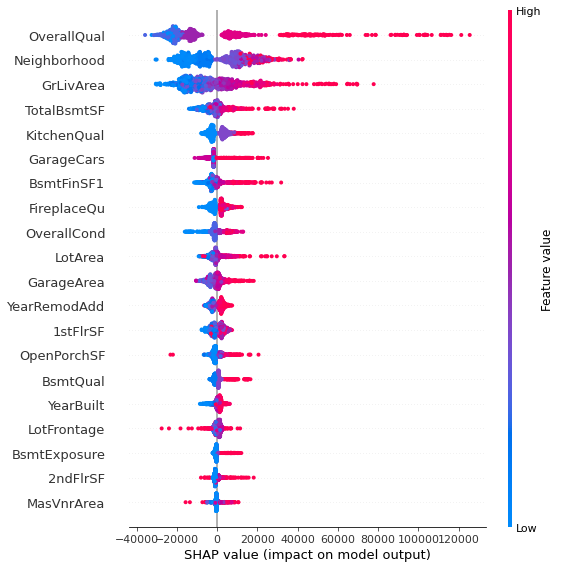

In [192]:
import shap # Use this package for visualization
explainer = shap.TreeExplainer(lgbm_regressor)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values,X_train, plot_type="bar")
shap.summary_plot(shap_values,X_train)

In [193]:

y_pred_test_lgbm= lgbm_regressor.predict(X_test)
print('LGBM Test R^2',r2_score(y_test, y_pred_test_lgbm),'LGBM Test RMSE', mean_squared_error(y_test, y_pred_test_lgbm, squared=False))

LGBM Test R^2 0.8935083841954271 LGBM Test RMSE 25528.92096166327


### CatBoost Model

In [194]:
from catboost import CatBoostRegressor

cb_optimization_parameters = {'learning_rate': uniform(0.01, 1),
                              'iterations': [1000,2000,3000],
                              'depth':range(4,11,1),
                              'l2_leaf_reg':uniform(0,4)} 

cb_searcher =RandomizedSearchCV(CatBoostRegressor(random_state = 1915743), cb_optimization_parameters, random_state=1915743,n_iter=20) # Complete this

cb_search = cb_searcher.fit(X_train,y_train)
cb_regressor =cb_search.best_estimator_

cb_search.best_params_ 

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


0:	learn: 57056.0860326	total: 189ms	remaining: 6m 18s
1:	learn: 44566.2782764	total: 207ms	remaining: 3m 26s
2:	learn: 36690.1355265	total: 225ms	remaining: 2m 29s
3:	learn: 30966.5335964	total: 242ms	remaining: 2m
4:	learn: 27902.2884224	total: 259ms	remaining: 1m 43s
5:	learn: 25130.6920173	total: 278ms	remaining: 1m 32s
6:	learn: 22795.2690603	total: 295ms	remaining: 1m 23s
7:	learn: 20994.2441387	total: 313ms	remaining: 1m 17s
8:	learn: 19499.8503788	total: 329ms	remaining: 1m 12s
9:	learn: 17954.7939937	total: 346ms	remaining: 1m 8s
10:	learn: 17031.3591568	total: 363ms	remaining: 1m 5s
11:	learn: 16156.9559219	total: 381ms	remaining: 1m 3s
12:	learn: 15461.7380966	total: 400ms	remaining: 1m 1s
13:	learn: 14674.3699431	total: 416ms	remaining: 59.1s
14:	learn: 14062.1481118	total: 433ms	remaining: 57.3s
15:	learn: 13581.0618475	total: 451ms	remaining: 56s
16:	learn: 12940.3043594	total: 468ms	remaining: 54.6s
17:	learn: 12389.6060791	total: 487ms	remaining: 53.7s
18:	learn: 11891.

155:	learn: 136.4883321	total: 2.98s	remaining: 35.3s
156:	learn: 132.9786144	total: 3s	remaining: 35.2s
157:	learn: 130.4061671	total: 3.02s	remaining: 35.2s
158:	learn: 127.3981591	total: 3.04s	remaining: 35.2s
159:	learn: 125.1655935	total: 3.06s	remaining: 35.1s
160:	learn: 119.7995636	total: 3.07s	remaining: 35.1s
161:	learn: 117.7429663	total: 3.09s	remaining: 35.1s
162:	learn: 115.2459254	total: 3.11s	remaining: 35s
163:	learn: 111.0947240	total: 3.13s	remaining: 35s
164:	learn: 107.7989248	total: 3.15s	remaining: 35s
165:	learn: 106.8657675	total: 3.16s	remaining: 34.9s
166:	learn: 104.3176274	total: 3.18s	remaining: 34.9s
167:	learn: 100.6702688	total: 3.2s	remaining: 34.9s
168:	learn: 97.2683212	total: 3.21s	remaining: 34.8s
169:	learn: 93.0647417	total: 3.23s	remaining: 34.8s
170:	learn: 91.2137561	total: 3.25s	remaining: 34.8s
171:	learn: 88.6507306	total: 3.27s	remaining: 34.7s
172:	learn: 86.0110047	total: 3.29s	remaining: 34.7s
173:	learn: 82.9780840	total: 3.3s	remainin

322:	learn: 2.0115142	total: 5.96s	remaining: 30.9s
323:	learn: 1.9581439	total: 5.97s	remaining: 30.9s
324:	learn: 1.8909140	total: 5.99s	remaining: 30.9s
325:	learn: 1.8325554	total: 6.01s	remaining: 30.9s
326:	learn: 1.8013105	total: 6.03s	remaining: 30.8s
327:	learn: 1.7722585	total: 6.05s	remaining: 30.8s
328:	learn: 1.7448909	total: 6.07s	remaining: 30.8s
329:	learn: 1.7430674	total: 6.08s	remaining: 30.8s
330:	learn: 1.6490922	total: 6.1s	remaining: 30.8s
331:	learn: 1.6007891	total: 6.12s	remaining: 30.7s
332:	learn: 1.5773475	total: 6.13s	remaining: 30.7s
333:	learn: 1.5369561	total: 6.14s	remaining: 30.6s
334:	learn: 1.5093909	total: 6.16s	remaining: 30.6s
335:	learn: 1.4682995	total: 6.18s	remaining: 30.6s
336:	learn: 1.4651131	total: 6.2s	remaining: 30.6s
337:	learn: 1.4416431	total: 6.22s	remaining: 30.6s
338:	learn: 1.4260045	total: 6.24s	remaining: 30.6s
339:	learn: 1.3893588	total: 6.26s	remaining: 30.6s
340:	learn: 1.3475070	total: 6.28s	remaining: 30.5s
341:	learn: 1.

487:	learn: 0.0345212	total: 8.94s	remaining: 27.7s
488:	learn: 0.0338779	total: 8.96s	remaining: 27.7s
489:	learn: 0.0329271	total: 8.97s	remaining: 27.7s
490:	learn: 0.0321128	total: 8.99s	remaining: 27.6s
491:	learn: 0.0309976	total: 9.01s	remaining: 27.6s
492:	learn: 0.0299655	total: 9.03s	remaining: 27.6s
493:	learn: 0.0292116	total: 9.04s	remaining: 27.6s
494:	learn: 0.0285415	total: 9.06s	remaining: 27.6s
495:	learn: 0.0282054	total: 9.08s	remaining: 27.5s
496:	learn: 0.0277075	total: 9.1s	remaining: 27.5s
497:	learn: 0.0275306	total: 9.12s	remaining: 27.5s
498:	learn: 0.0262035	total: 9.13s	remaining: 27.5s
499:	learn: 0.0260237	total: 9.15s	remaining: 27.5s
500:	learn: 0.0251677	total: 9.17s	remaining: 27.4s
501:	learn: 0.0245747	total: 9.19s	remaining: 27.4s
502:	learn: 0.0237223	total: 9.21s	remaining: 27.4s
503:	learn: 0.0231328	total: 9.22s	remaining: 27.4s
504:	learn: 0.0230572	total: 9.24s	remaining: 27.4s
505:	learn: 0.0223821	total: 9.26s	remaining: 27.3s
506:	learn: 0

652:	learn: 0.0006448	total: 11.9s	remaining: 24.6s
653:	learn: 0.0006363	total: 11.9s	remaining: 24.5s
654:	learn: 0.0006241	total: 11.9s	remaining: 24.5s
655:	learn: 0.0006177	total: 12s	remaining: 24.5s
656:	learn: 0.0006049	total: 12s	remaining: 24.5s
657:	learn: 0.0005870	total: 12s	remaining: 24.5s
658:	learn: 0.0005728	total: 12s	remaining: 24.5s
659:	learn: 0.0005638	total: 12s	remaining: 24.4s
660:	learn: 0.0005591	total: 12.1s	remaining: 24.4s
661:	learn: 0.0005436	total: 12.1s	remaining: 24.4s
662:	learn: 0.0005360	total: 12.1s	remaining: 24.4s
663:	learn: 0.0005252	total: 12.1s	remaining: 24.4s
664:	learn: 0.0005178	total: 12.1s	remaining: 24.4s
665:	learn: 0.0005120	total: 12.1s	remaining: 24.3s
666:	learn: 0.0005043	total: 12.2s	remaining: 24.3s
667:	learn: 0.0004929	total: 12.2s	remaining: 24.3s
668:	learn: 0.0004776	total: 12.2s	remaining: 24.3s
669:	learn: 0.0004581	total: 12.2s	remaining: 24.3s
670:	learn: 0.0004523	total: 12.2s	remaining: 24.2s
671:	learn: 0.0004437	

815:	learn: 0.0000128	total: 14.9s	remaining: 21.6s
816:	learn: 0.0000123	total: 14.9s	remaining: 21.6s
817:	learn: 0.0000121	total: 14.9s	remaining: 21.6s
818:	learn: 0.0000117	total: 15s	remaining: 21.6s
819:	learn: 0.0000112	total: 15s	remaining: 21.5s
820:	learn: 0.0000110	total: 15s	remaining: 21.5s
821:	learn: 0.0000109	total: 15s	remaining: 21.5s
822:	learn: 0.0000106	total: 15s	remaining: 21.5s
823:	learn: 0.0000103	total: 15s	remaining: 21.5s
824:	learn: 0.0000100	total: 15.1s	remaining: 21.4s
825:	learn: 0.0000098	total: 15.1s	remaining: 21.4s
826:	learn: 0.0000094	total: 15.1s	remaining: 21.4s
827:	learn: 0.0000090	total: 15.1s	remaining: 21.4s
828:	learn: 0.0000088	total: 15.1s	remaining: 21.4s
829:	learn: 0.0000086	total: 15.2s	remaining: 21.4s
830:	learn: 0.0000084	total: 15.2s	remaining: 21.3s
831:	learn: 0.0000081	total: 15.2s	remaining: 21.3s
832:	learn: 0.0000078	total: 15.2s	remaining: 21.3s
833:	learn: 0.0000077	total: 15.2s	remaining: 21.3s
834:	learn: 0.0000076	to

985:	learn: 0.0000002	total: 17.9s	remaining: 18.4s
986:	learn: 0.0000002	total: 17.9s	remaining: 18.4s
987:	learn: 0.0000002	total: 17.9s	remaining: 18.4s
988:	learn: 0.0000002	total: 18s	remaining: 18.4s
989:	learn: 0.0000002	total: 18s	remaining: 18.3s
990:	learn: 0.0000002	total: 18s	remaining: 18.3s
991:	learn: 0.0000002	total: 18s	remaining: 18.3s
992:	learn: 0.0000002	total: 18s	remaining: 18.3s
993:	learn: 0.0000002	total: 18.1s	remaining: 18.3s
994:	learn: 0.0000002	total: 18.1s	remaining: 18.3s
995:	learn: 0.0000002	total: 18.1s	remaining: 18.2s
996:	learn: 0.0000002	total: 18.1s	remaining: 18.2s
997:	learn: 0.0000002	total: 18.1s	remaining: 18.2s
998:	learn: 0.0000002	total: 18.1s	remaining: 18.2s
999:	learn: 0.0000002	total: 18.2s	remaining: 18.2s
1000:	learn: 0.0000002	total: 18.2s	remaining: 18.1s
1001:	learn: 0.0000002	total: 18.2s	remaining: 18.1s
1002:	learn: 0.0000002	total: 18.2s	remaining: 18.1s
1003:	learn: 0.0000001	total: 18.2s	remaining: 18.1s
1004:	learn: 0.000

1147:	learn: 0.0000000	total: 21.3s	remaining: 15.8s
1148:	learn: 0.0000000	total: 21.4s	remaining: 15.8s
1149:	learn: 0.0000000	total: 21.4s	remaining: 15.8s
1150:	learn: 0.0000000	total: 21.4s	remaining: 15.8s
1151:	learn: 0.0000000	total: 21.4s	remaining: 15.8s
1152:	learn: 0.0000000	total: 21.4s	remaining: 15.7s
1153:	learn: 0.0000000	total: 21.5s	remaining: 15.7s
1154:	learn: 0.0000000	total: 21.5s	remaining: 15.7s
1155:	learn: 0.0000000	total: 21.5s	remaining: 15.7s
1156:	learn: 0.0000000	total: 21.5s	remaining: 15.7s
1157:	learn: 0.0000000	total: 21.6s	remaining: 15.7s
1158:	learn: 0.0000000	total: 21.6s	remaining: 15.7s
1159:	learn: 0.0000000	total: 21.6s	remaining: 15.6s
1160:	learn: 0.0000000	total: 21.6s	remaining: 15.6s
1161:	learn: 0.0000000	total: 21.6s	remaining: 15.6s
1162:	learn: 0.0000000	total: 21.6s	remaining: 15.6s
1163:	learn: 0.0000000	total: 21.7s	remaining: 15.6s
1164:	learn: 0.0000000	total: 21.7s	remaining: 15.5s
1165:	learn: 0.0000000	total: 21.7s	remaining:

1303:	learn: 0.0000000	total: 24.6s	remaining: 13.1s
1304:	learn: 0.0000000	total: 24.6s	remaining: 13.1s
1305:	learn: 0.0000000	total: 24.7s	remaining: 13.1s
1306:	learn: 0.0000000	total: 24.7s	remaining: 13.1s
1307:	learn: 0.0000000	total: 24.7s	remaining: 13.1s
1308:	learn: 0.0000000	total: 24.7s	remaining: 13s
1309:	learn: 0.0000000	total: 24.7s	remaining: 13s
1310:	learn: 0.0000000	total: 24.7s	remaining: 13s
1311:	learn: 0.0000000	total: 24.7s	remaining: 13s
1312:	learn: 0.0000000	total: 24.7s	remaining: 12.9s
1313:	learn: 0.0000000	total: 24.8s	remaining: 12.9s
1314:	learn: 0.0000000	total: 24.8s	remaining: 12.9s
1315:	learn: 0.0000000	total: 24.8s	remaining: 12.9s
1316:	learn: 0.0000000	total: 24.8s	remaining: 12.9s
1317:	learn: 0.0000000	total: 24.8s	remaining: 12.8s
1318:	learn: 0.0000000	total: 24.8s	remaining: 12.8s
1319:	learn: 0.0000000	total: 24.9s	remaining: 12.8s
1320:	learn: 0.0000000	total: 24.9s	remaining: 12.8s
1321:	learn: 0.0000000	total: 24.9s	remaining: 12.8s
1

1459:	learn: 0.0000000	total: 26.8s	remaining: 9.92s
1460:	learn: 0.0000000	total: 26.8s	remaining: 9.9s
1461:	learn: 0.0000000	total: 26.9s	remaining: 9.88s
1462:	learn: 0.0000000	total: 26.9s	remaining: 9.87s
1463:	learn: 0.0000000	total: 26.9s	remaining: 9.85s
1464:	learn: 0.0000000	total: 26.9s	remaining: 9.83s
1465:	learn: 0.0000000	total: 26.9s	remaining: 9.81s
1466:	learn: 0.0000000	total: 26.9s	remaining: 9.79s
1467:	learn: 0.0000000	total: 27s	remaining: 9.77s
1468:	learn: 0.0000000	total: 27s	remaining: 9.75s
1469:	learn: 0.0000000	total: 27s	remaining: 9.73s
1470:	learn: 0.0000000	total: 27s	remaining: 9.71s
1471:	learn: 0.0000000	total: 27s	remaining: 9.68s
1472:	learn: 0.0000000	total: 27s	remaining: 9.66s
1473:	learn: 0.0000000	total: 27s	remaining: 9.65s
1474:	learn: 0.0000000	total: 27s	remaining: 9.62s
1475:	learn: 0.0000000	total: 27.1s	remaining: 9.6s
1476:	learn: 0.0000000	total: 27.1s	remaining: 9.59s
1477:	learn: 0.0000000	total: 27.1s	remaining: 9.57s
1478:	learn

1616:	learn: 0.0000000	total: 29.6s	remaining: 7.01s
1617:	learn: 0.0000000	total: 29.6s	remaining: 7s
1618:	learn: 0.0000000	total: 29.7s	remaining: 6.98s
1619:	learn: 0.0000000	total: 29.7s	remaining: 6.96s
1620:	learn: 0.0000000	total: 29.7s	remaining: 6.94s
1621:	learn: 0.0000000	total: 29.7s	remaining: 6.93s
1622:	learn: 0.0000000	total: 29.7s	remaining: 6.91s
1623:	learn: 0.0000000	total: 29.8s	remaining: 6.89s
1624:	learn: 0.0000000	total: 29.8s	remaining: 6.87s
1625:	learn: 0.0000000	total: 29.8s	remaining: 6.85s
1626:	learn: 0.0000000	total: 29.8s	remaining: 6.83s
1627:	learn: 0.0000000	total: 29.8s	remaining: 6.81s
1628:	learn: 0.0000000	total: 29.8s	remaining: 6.8s
1629:	learn: 0.0000000	total: 29.9s	remaining: 6.78s
1630:	learn: 0.0000000	total: 29.9s	remaining: 6.76s
1631:	learn: 0.0000000	total: 29.9s	remaining: 6.74s
1632:	learn: 0.0000000	total: 29.9s	remaining: 6.72s
1633:	learn: 0.0000000	total: 29.9s	remaining: 6.7s
1634:	learn: 0.0000000	total: 29.9s	remaining: 6.68

1775:	learn: 0.0000000	total: 32.6s	remaining: 4.11s
1776:	learn: 0.0000000	total: 32.6s	remaining: 4.09s
1777:	learn: 0.0000000	total: 32.6s	remaining: 4.07s
1778:	learn: 0.0000000	total: 32.6s	remaining: 4.05s
1779:	learn: 0.0000000	total: 32.7s	remaining: 4.04s
1780:	learn: 0.0000000	total: 32.7s	remaining: 4.02s
1781:	learn: 0.0000000	total: 32.7s	remaining: 4s
1782:	learn: 0.0000000	total: 32.7s	remaining: 3.98s
1783:	learn: 0.0000000	total: 32.7s	remaining: 3.96s
1784:	learn: 0.0000000	total: 32.7s	remaining: 3.94s
1785:	learn: 0.0000000	total: 32.7s	remaining: 3.92s
1786:	learn: 0.0000000	total: 32.8s	remaining: 3.9s
1787:	learn: 0.0000000	total: 32.8s	remaining: 3.89s
1788:	learn: 0.0000000	total: 32.8s	remaining: 3.87s
1789:	learn: 0.0000000	total: 32.8s	remaining: 3.85s
1790:	learn: 0.0000000	total: 32.8s	remaining: 3.83s
1791:	learn: 0.0000000	total: 32.9s	remaining: 3.81s
1792:	learn: 0.0000000	total: 32.9s	remaining: 3.79s
1793:	learn: 0.0000000	total: 32.9s	remaining: 3.7

1942:	learn: 0.0000000	total: 35.3s	remaining: 1.04s
1943:	learn: 0.0000000	total: 35.4s	remaining: 1.02s
1944:	learn: 0.0000000	total: 35.4s	remaining: 1s
1945:	learn: 0.0000000	total: 35.4s	remaining: 982ms
1946:	learn: 0.0000000	total: 35.4s	remaining: 964ms
1947:	learn: 0.0000000	total: 35.4s	remaining: 946ms
1948:	learn: 0.0000000	total: 35.5s	remaining: 928ms
1949:	learn: 0.0000000	total: 35.5s	remaining: 910ms
1950:	learn: 0.0000000	total: 35.5s	remaining: 891ms
1951:	learn: 0.0000000	total: 35.5s	remaining: 873ms
1952:	learn: 0.0000000	total: 35.5s	remaining: 855ms
1953:	learn: 0.0000000	total: 35.5s	remaining: 837ms
1954:	learn: 0.0000000	total: 35.6s	remaining: 819ms
1955:	learn: 0.0000000	total: 35.6s	remaining: 800ms
1956:	learn: 0.0000000	total: 35.6s	remaining: 782ms
1957:	learn: 0.0000000	total: 35.6s	remaining: 764ms
1958:	learn: 0.0000000	total: 35.6s	remaining: 746ms
1959:	learn: 0.0000000	total: 35.6s	remaining: 728ms
1960:	learn: 0.0000000	total: 35.7s	remaining: 70

103:	learn: 554.3635350	total: 1.96s	remaining: 35.7s
104:	learn: 530.0382446	total: 1.98s	remaining: 35.7s
105:	learn: 513.0142708	total: 2s	remaining: 35.7s
106:	learn: 489.7942610	total: 2.02s	remaining: 35.7s
107:	learn: 469.3282506	total: 2.03s	remaining: 35.6s
108:	learn: 455.2194303	total: 2.05s	remaining: 35.6s
109:	learn: 443.6554017	total: 2.07s	remaining: 35.6s
110:	learn: 422.4243360	total: 2.09s	remaining: 35.5s
111:	learn: 417.6188814	total: 2.11s	remaining: 35.5s
112:	learn: 395.4472281	total: 2.13s	remaining: 35.5s
113:	learn: 380.3037205	total: 2.15s	remaining: 35.5s
114:	learn: 366.0334875	total: 2.17s	remaining: 35.5s
115:	learn: 356.1311819	total: 2.18s	remaining: 35.5s
116:	learn: 345.3392644	total: 2.2s	remaining: 35.4s
117:	learn: 332.5872403	total: 2.22s	remaining: 35.4s
118:	learn: 317.4442077	total: 2.24s	remaining: 35.4s
119:	learn: 302.5066130	total: 2.26s	remaining: 35.3s
120:	learn: 291.9106726	total: 2.27s	remaining: 35.3s
121:	learn: 279.0911869	total: 2

262:	learn: 5.7735709	total: 4.9s	remaining: 32.4s
263:	learn: 5.6393051	total: 4.93s	remaining: 32.4s
264:	learn: 5.3957064	total: 4.95s	remaining: 32.4s
265:	learn: 5.2051186	total: 4.97s	remaining: 32.4s
266:	learn: 5.0425194	total: 4.99s	remaining: 32.4s
267:	learn: 4.9757635	total: 5.01s	remaining: 32.4s
268:	learn: 4.8223439	total: 5.03s	remaining: 32.4s
269:	learn: 4.6425105	total: 5.05s	remaining: 32.4s
270:	learn: 4.4980828	total: 5.07s	remaining: 32.4s
271:	learn: 4.3237175	total: 5.09s	remaining: 32.4s
272:	learn: 4.0733533	total: 5.11s	remaining: 32.4s
273:	learn: 3.9149061	total: 5.13s	remaining: 32.4s
274:	learn: 3.8704858	total: 5.15s	remaining: 32.3s
275:	learn: 3.7256506	total: 5.18s	remaining: 32.3s
276:	learn: 3.6402566	total: 5.2s	remaining: 32.3s
277:	learn: 3.4802670	total: 5.21s	remaining: 32.3s
278:	learn: 3.3625593	total: 5.23s	remaining: 32.3s
279:	learn: 3.2562813	total: 5.25s	remaining: 32.3s
280:	learn: 3.1247619	total: 5.27s	remaining: 32.3s
281:	learn: 3.

427:	learn: 0.0600827	total: 8.03s	remaining: 29.5s
428:	learn: 0.0580214	total: 8.05s	remaining: 29.5s
429:	learn: 0.0572324	total: 8.06s	remaining: 29.4s
430:	learn: 0.0558633	total: 8.08s	remaining: 29.4s
431:	learn: 0.0542125	total: 8.1s	remaining: 29.4s
432:	learn: 0.0526451	total: 8.12s	remaining: 29.4s
433:	learn: 0.0506202	total: 8.14s	remaining: 29.4s
434:	learn: 0.0499789	total: 8.15s	remaining: 29.3s
435:	learn: 0.0490789	total: 8.17s	remaining: 29.3s
436:	learn: 0.0474988	total: 8.19s	remaining: 29.3s
437:	learn: 0.0467077	total: 8.21s	remaining: 29.3s
438:	learn: 0.0454108	total: 8.23s	remaining: 29.3s
439:	learn: 0.0439351	total: 8.25s	remaining: 29.2s
440:	learn: 0.0430420	total: 8.27s	remaining: 29.2s
441:	learn: 0.0417168	total: 8.29s	remaining: 29.2s
442:	learn: 0.0409012	total: 8.3s	remaining: 29.2s
443:	learn: 0.0400028	total: 8.32s	remaining: 29.2s
444:	learn: 0.0393534	total: 8.34s	remaining: 29.1s
445:	learn: 0.0374941	total: 8.36s	remaining: 29.1s
446:	learn: 0.

588:	learn: 0.0008375	total: 11s	remaining: 26.3s
589:	learn: 0.0008020	total: 11s	remaining: 26.3s
590:	learn: 0.0007777	total: 11s	remaining: 26.3s
591:	learn: 0.0007640	total: 11s	remaining: 26.3s
592:	learn: 0.0007494	total: 11.1s	remaining: 26.3s
593:	learn: 0.0007348	total: 11.1s	remaining: 26.2s
594:	learn: 0.0007162	total: 11.1s	remaining: 26.2s
595:	learn: 0.0007016	total: 11.1s	remaining: 26.2s
596:	learn: 0.0006753	total: 11.1s	remaining: 26.2s
597:	learn: 0.0006466	total: 11.2s	remaining: 26.1s
598:	learn: 0.0006445	total: 11.2s	remaining: 26.1s
599:	learn: 0.0006165	total: 11.2s	remaining: 26.1s
600:	learn: 0.0005946	total: 11.2s	remaining: 26.1s
601:	learn: 0.0005730	total: 11.2s	remaining: 26.1s
602:	learn: 0.0005607	total: 11.3s	remaining: 26.1s
603:	learn: 0.0005471	total: 11.3s	remaining: 26.1s
604:	learn: 0.0005304	total: 11.3s	remaining: 26s
605:	learn: 0.0005173	total: 11.3s	remaining: 26s
606:	learn: 0.0005010	total: 11.3s	remaining: 26s
607:	learn: 0.0004923	tota

747:	learn: 0.0000124	total: 13.9s	remaining: 23.3s
748:	learn: 0.0000122	total: 13.9s	remaining: 23.3s
749:	learn: 0.0000120	total: 14s	remaining: 23.3s
750:	learn: 0.0000116	total: 14s	remaining: 23.3s
751:	learn: 0.0000114	total: 14s	remaining: 23.2s
752:	learn: 0.0000111	total: 14s	remaining: 23.2s
753:	learn: 0.0000108	total: 14s	remaining: 23.2s
754:	learn: 0.0000106	total: 14.1s	remaining: 23.2s
755:	learn: 0.0000104	total: 14.1s	remaining: 23.2s
756:	learn: 0.0000103	total: 14.1s	remaining: 23.1s
757:	learn: 0.0000102	total: 14.1s	remaining: 23.1s
758:	learn: 0.0000100	total: 14.1s	remaining: 23.1s
759:	learn: 0.0000099	total: 14.2s	remaining: 23.1s
760:	learn: 0.0000096	total: 14.2s	remaining: 23.1s
761:	learn: 0.0000093	total: 14.2s	remaining: 23s
762:	learn: 0.0000091	total: 14.2s	remaining: 23s
763:	learn: 0.0000091	total: 14.2s	remaining: 23s
764:	learn: 0.0000088	total: 14.2s	remaining: 23s
765:	learn: 0.0000087	total: 14.3s	remaining: 23s
766:	learn: 0.0000086	total: 14.

908:	learn: 0.0000002	total: 16.9s	remaining: 20.3s
909:	learn: 0.0000002	total: 16.9s	remaining: 20.3s
910:	learn: 0.0000002	total: 17s	remaining: 20.3s
911:	learn: 0.0000002	total: 17s	remaining: 20.2s
912:	learn: 0.0000002	total: 17s	remaining: 20.2s
913:	learn: 0.0000002	total: 17s	remaining: 20.2s
914:	learn: 0.0000002	total: 17s	remaining: 20.2s
915:	learn: 0.0000002	total: 17s	remaining: 20.2s
916:	learn: 0.0000002	total: 17.1s	remaining: 20.1s
917:	learn: 0.0000002	total: 17.1s	remaining: 20.1s
918:	learn: 0.0000002	total: 17.1s	remaining: 20.1s
919:	learn: 0.0000002	total: 17.1s	remaining: 20.1s
920:	learn: 0.0000002	total: 17.1s	remaining: 20.1s
921:	learn: 0.0000002	total: 17.2s	remaining: 20.1s
922:	learn: 0.0000002	total: 17.2s	remaining: 20s
923:	learn: 0.0000002	total: 17.2s	remaining: 20s
924:	learn: 0.0000002	total: 17.2s	remaining: 20s
925:	learn: 0.0000002	total: 17.2s	remaining: 20s
926:	learn: 0.0000002	total: 17.2s	remaining: 20s
927:	learn: 0.0000001	total: 17.3s

1069:	learn: 0.0000000	total: 20.3s	remaining: 17.6s
1070:	learn: 0.0000000	total: 20.3s	remaining: 17.6s
1071:	learn: 0.0000000	total: 20.3s	remaining: 17.6s
1072:	learn: 0.0000000	total: 20.3s	remaining: 17.6s
1073:	learn: 0.0000000	total: 20.3s	remaining: 17.5s
1074:	learn: 0.0000000	total: 20.4s	remaining: 17.5s
1075:	learn: 0.0000000	total: 20.4s	remaining: 17.5s
1076:	learn: 0.0000000	total: 20.4s	remaining: 17.5s
1077:	learn: 0.0000000	total: 20.4s	remaining: 17.5s
1078:	learn: 0.0000000	total: 20.4s	remaining: 17.4s
1079:	learn: 0.0000000	total: 20.4s	remaining: 17.4s
1080:	learn: 0.0000000	total: 20.5s	remaining: 17.4s
1081:	learn: 0.0000000	total: 20.5s	remaining: 17.4s
1082:	learn: 0.0000000	total: 20.5s	remaining: 17.4s
1083:	learn: 0.0000000	total: 20.5s	remaining: 17.3s
1084:	learn: 0.0000000	total: 20.5s	remaining: 17.3s
1085:	learn: 0.0000000	total: 20.6s	remaining: 17.3s
1086:	learn: 0.0000000	total: 20.6s	remaining: 17.3s
1087:	learn: 0.0000000	total: 20.6s	remaining:

1228:	learn: 0.0000000	total: 23.2s	remaining: 14.6s
1229:	learn: 0.0000000	total: 23.3s	remaining: 14.6s
1230:	learn: 0.0000000	total: 23.3s	remaining: 14.5s
1231:	learn: 0.0000000	total: 23.3s	remaining: 14.5s
1232:	learn: 0.0000000	total: 23.3s	remaining: 14.5s
1233:	learn: 0.0000000	total: 23.3s	remaining: 14.5s
1234:	learn: 0.0000000	total: 23.3s	remaining: 14.5s
1235:	learn: 0.0000000	total: 23.4s	remaining: 14.4s
1236:	learn: 0.0000000	total: 23.4s	remaining: 14.4s
1237:	learn: 0.0000000	total: 23.4s	remaining: 14.4s
1238:	learn: 0.0000000	total: 23.4s	remaining: 14.4s
1239:	learn: 0.0000000	total: 23.4s	remaining: 14.4s
1240:	learn: 0.0000000	total: 23.4s	remaining: 14.3s
1241:	learn: 0.0000000	total: 23.5s	remaining: 14.3s
1242:	learn: 0.0000000	total: 23.5s	remaining: 14.3s
1243:	learn: 0.0000000	total: 23.5s	remaining: 14.3s
1244:	learn: 0.0000000	total: 23.5s	remaining: 14.3s
1245:	learn: 0.0000000	total: 23.5s	remaining: 14.2s
1246:	learn: 0.0000000	total: 23.6s	remaining:

1386:	learn: 0.0000000	total: 26s	remaining: 11.5s
1387:	learn: 0.0000000	total: 26s	remaining: 11.5s
1388:	learn: 0.0000000	total: 26s	remaining: 11.5s
1389:	learn: 0.0000000	total: 26.1s	remaining: 11.4s
1390:	learn: 0.0000000	total: 26.1s	remaining: 11.4s
1391:	learn: 0.0000000	total: 26.1s	remaining: 11.4s
1392:	learn: 0.0000000	total: 26.1s	remaining: 11.4s
1393:	learn: 0.0000000	total: 26.1s	remaining: 11.4s
1394:	learn: 0.0000000	total: 26.2s	remaining: 11.3s
1395:	learn: 0.0000000	total: 26.2s	remaining: 11.3s
1396:	learn: 0.0000000	total: 26.2s	remaining: 11.3s
1397:	learn: 0.0000000	total: 26.2s	remaining: 11.3s
1398:	learn: 0.0000000	total: 26.2s	remaining: 11.3s
1399:	learn: 0.0000000	total: 26.2s	remaining: 11.2s
1400:	learn: 0.0000000	total: 26.3s	remaining: 11.2s
1401:	learn: 0.0000000	total: 26.3s	remaining: 11.2s
1402:	learn: 0.0000000	total: 26.3s	remaining: 11.2s
1403:	learn: 0.0000000	total: 26.3s	remaining: 11.2s
1404:	learn: 0.0000000	total: 26.3s	remaining: 11.2s

1542:	learn: 0.0000000	total: 28.8s	remaining: 8.52s
1543:	learn: 0.0000000	total: 28.8s	remaining: 8.5s
1544:	learn: 0.0000000	total: 28.8s	remaining: 8.48s
1545:	learn: 0.0000000	total: 28.8s	remaining: 8.46s
1546:	learn: 0.0000000	total: 28.8s	remaining: 8.44s
1547:	learn: 0.0000000	total: 28.8s	remaining: 8.42s
1548:	learn: 0.0000000	total: 28.9s	remaining: 8.4s
1549:	learn: 0.0000000	total: 28.9s	remaining: 8.38s
1550:	learn: 0.0000000	total: 28.9s	remaining: 8.36s
1551:	learn: 0.0000000	total: 28.9s	remaining: 8.34s
1552:	learn: 0.0000000	total: 28.9s	remaining: 8.33s
1553:	learn: 0.0000000	total: 28.9s	remaining: 8.31s
1554:	learn: 0.0000000	total: 29s	remaining: 8.29s
1555:	learn: 0.0000000	total: 29s	remaining: 8.27s
1556:	learn: 0.0000000	total: 29s	remaining: 8.26s
1557:	learn: 0.0000000	total: 29s	remaining: 8.24s
1558:	learn: 0.0000000	total: 29.1s	remaining: 8.22s
1559:	learn: 0.0000000	total: 29.1s	remaining: 8.2s
1560:	learn: 0.0000000	total: 29.1s	remaining: 8.18s
1561

1699:	learn: 0.0000000	total: 31.5s	remaining: 5.56s
1700:	learn: 0.0000000	total: 31.6s	remaining: 5.55s
1701:	learn: 0.0000000	total: 31.6s	remaining: 5.53s
1702:	learn: 0.0000000	total: 31.6s	remaining: 5.51s
1703:	learn: 0.0000000	total: 31.6s	remaining: 5.49s
1704:	learn: 0.0000000	total: 31.6s	remaining: 5.47s
1705:	learn: 0.0000000	total: 31.6s	remaining: 5.45s
1706:	learn: 0.0000000	total: 31.6s	remaining: 5.43s
1707:	learn: 0.0000000	total: 31.7s	remaining: 5.41s
1708:	learn: 0.0000000	total: 31.7s	remaining: 5.39s
1709:	learn: 0.0000000	total: 31.7s	remaining: 5.37s
1710:	learn: 0.0000000	total: 31.7s	remaining: 5.35s
1711:	learn: 0.0000000	total: 31.7s	remaining: 5.34s
1712:	learn: 0.0000000	total: 31.8s	remaining: 5.32s
1713:	learn: 0.0000000	total: 31.8s	remaining: 5.3s
1714:	learn: 0.0000000	total: 31.8s	remaining: 5.28s
1715:	learn: 0.0000000	total: 31.8s	remaining: 5.26s
1716:	learn: 0.0000000	total: 31.8s	remaining: 5.25s
1717:	learn: 0.0000000	total: 31.9s	remaining: 

1860:	learn: 0.0000000	total: 34.3s	remaining: 2.56s
1861:	learn: 0.0000000	total: 34.3s	remaining: 2.54s
1862:	learn: 0.0000000	total: 34.3s	remaining: 2.52s
1863:	learn: 0.0000000	total: 34.4s	remaining: 2.51s
1864:	learn: 0.0000000	total: 34.4s	remaining: 2.49s
1865:	learn: 0.0000000	total: 34.4s	remaining: 2.47s
1866:	learn: 0.0000000	total: 34.4s	remaining: 2.45s
1867:	learn: 0.0000000	total: 34.4s	remaining: 2.43s
1868:	learn: 0.0000000	total: 34.5s	remaining: 2.42s
1869:	learn: 0.0000000	total: 34.5s	remaining: 2.4s
1870:	learn: 0.0000000	total: 34.5s	remaining: 2.38s
1871:	learn: 0.0000000	total: 34.5s	remaining: 2.36s
1872:	learn: 0.0000000	total: 34.5s	remaining: 2.34s
1873:	learn: 0.0000000	total: 34.6s	remaining: 2.32s
1874:	learn: 0.0000000	total: 34.6s	remaining: 2.3s
1875:	learn: 0.0000000	total: 34.6s	remaining: 2.29s
1876:	learn: 0.0000000	total: 34.6s	remaining: 2.27s
1877:	learn: 0.0000000	total: 34.6s	remaining: 2.25s
1878:	learn: 0.0000000	total: 34.6s	remaining: 2

21:	learn: 11593.1577431	total: 399ms	remaining: 35.9s
22:	learn: 11115.1721824	total: 420ms	remaining: 36.1s
23:	learn: 10685.7414893	total: 437ms	remaining: 36s
24:	learn: 10269.1069919	total: 455ms	remaining: 36s
25:	learn: 9981.4048426	total: 473ms	remaining: 35.9s
26:	learn: 9320.7261547	total: 491ms	remaining: 35.9s
27:	learn: 8986.2791387	total: 509ms	remaining: 35.8s
28:	learn: 8408.7806917	total: 527ms	remaining: 35.8s
29:	learn: 8027.3797884	total: 544ms	remaining: 35.7s
30:	learn: 7776.8464290	total: 562ms	remaining: 35.7s
31:	learn: 7505.2538723	total: 579ms	remaining: 35.6s
32:	learn: 7175.6279374	total: 599ms	remaining: 35.7s
33:	learn: 6798.4843869	total: 619ms	remaining: 35.8s
34:	learn: 6428.6826428	total: 638ms	remaining: 35.8s
35:	learn: 6210.3119861	total: 657ms	remaining: 35.8s
36:	learn: 5796.1658080	total: 676ms	remaining: 35.9s
37:	learn: 5642.4592974	total: 694ms	remaining: 35.8s
38:	learn: 5447.0223333	total: 712ms	remaining: 35.8s
39:	learn: 5130.5797460	tota

178:	learn: 63.5419792	total: 3.39s	remaining: 34.5s
179:	learn: 60.2065855	total: 3.42s	remaining: 34.5s
180:	learn: 58.6873794	total: 3.44s	remaining: 34.5s
181:	learn: 57.1641169	total: 3.46s	remaining: 34.5s
182:	learn: 55.4460275	total: 3.48s	remaining: 34.5s
183:	learn: 54.1117849	total: 3.5s	remaining: 34.5s
184:	learn: 52.2689817	total: 3.52s	remaining: 34.5s
185:	learn: 50.5571012	total: 3.54s	remaining: 34.5s
186:	learn: 49.0108285	total: 3.56s	remaining: 34.5s
187:	learn: 46.9446366	total: 3.58s	remaining: 34.5s
188:	learn: 45.2143698	total: 3.6s	remaining: 34.5s
189:	learn: 43.5069598	total: 3.62s	remaining: 34.5s
190:	learn: 42.7530614	total: 3.64s	remaining: 34.5s
191:	learn: 40.8851267	total: 3.66s	remaining: 34.5s
192:	learn: 39.0595523	total: 3.68s	remaining: 34.5s
193:	learn: 37.5896033	total: 3.7s	remaining: 34.5s
194:	learn: 37.1695153	total: 3.72s	remaining: 34.5s
195:	learn: 36.9287761	total: 3.74s	remaining: 34.4s
196:	learn: 36.0318324	total: 3.77s	remaining: 34

344:	learn: 0.5823934	total: 6.56s	remaining: 31.5s
345:	learn: 0.5681694	total: 6.58s	remaining: 31.4s
346:	learn: 0.5487393	total: 6.6s	remaining: 31.4s
347:	learn: 0.5329031	total: 6.62s	remaining: 31.4s
348:	learn: 0.5245072	total: 6.63s	remaining: 31.4s
349:	learn: 0.4983377	total: 6.65s	remaining: 31.4s
350:	learn: 0.4900945	total: 6.67s	remaining: 31.3s
351:	learn: 0.4724167	total: 6.69s	remaining: 31.3s
352:	learn: 0.4654196	total: 6.7s	remaining: 31.3s
353:	learn: 0.4560092	total: 6.72s	remaining: 31.3s
354:	learn: 0.4469016	total: 6.74s	remaining: 31.3s
355:	learn: 0.4381066	total: 6.76s	remaining: 31.2s
356:	learn: 0.4319170	total: 6.78s	remaining: 31.2s
357:	learn: 0.4239169	total: 6.8s	remaining: 31.2s
358:	learn: 0.4031836	total: 6.82s	remaining: 31.2s
359:	learn: 0.3833853	total: 6.84s	remaining: 31.1s
360:	learn: 0.3741905	total: 6.85s	remaining: 31.1s
361:	learn: 0.3614605	total: 6.87s	remaining: 31.1s
362:	learn: 0.3535285	total: 6.89s	remaining: 31.1s
363:	learn: 0.3

503:	learn: 0.0114449	total: 9.52s	remaining: 28.3s
504:	learn: 0.0113210	total: 9.54s	remaining: 28.2s
505:	learn: 0.0108068	total: 9.56s	remaining: 28.2s
506:	learn: 0.0106026	total: 9.58s	remaining: 28.2s
507:	learn: 0.0104032	total: 9.6s	remaining: 28.2s
508:	learn: 0.0102759	total: 9.62s	remaining: 28.2s
509:	learn: 0.0099205	total: 9.63s	remaining: 28.1s
510:	learn: 0.0096331	total: 9.65s	remaining: 28.1s
511:	learn: 0.0094720	total: 9.67s	remaining: 28.1s
512:	learn: 0.0092594	total: 9.69s	remaining: 28.1s
513:	learn: 0.0090197	total: 9.71s	remaining: 28.1s
514:	learn: 0.0088477	total: 9.73s	remaining: 28.1s
515:	learn: 0.0087813	total: 9.75s	remaining: 28s
516:	learn: 0.0087717	total: 9.77s	remaining: 28s
517:	learn: 0.0085944	total: 9.79s	remaining: 28s
518:	learn: 0.0084119	total: 9.8s	remaining: 28s
519:	learn: 0.0082214	total: 9.82s	remaining: 28s
520:	learn: 0.0081137	total: 9.84s	remaining: 27.9s
521:	learn: 0.0079946	total: 9.86s	remaining: 27.9s
522:	learn: 0.0078669	to

664:	learn: 0.0002995	total: 12.5s	remaining: 25.1s
665:	learn: 0.0002939	total: 12.5s	remaining: 25.1s
666:	learn: 0.0002791	total: 12.5s	remaining: 25.1s
667:	learn: 0.0002743	total: 12.6s	remaining: 25.1s
668:	learn: 0.0002689	total: 12.6s	remaining: 25s
669:	learn: 0.0002626	total: 12.6s	remaining: 25s
670:	learn: 0.0002544	total: 12.6s	remaining: 25s
671:	learn: 0.0002461	total: 12.6s	remaining: 25s
672:	learn: 0.0002382	total: 12.7s	remaining: 25s
673:	learn: 0.0002280	total: 12.7s	remaining: 24.9s
674:	learn: 0.0002172	total: 12.7s	remaining: 24.9s
675:	learn: 0.0002128	total: 12.7s	remaining: 24.9s
676:	learn: 0.0002106	total: 12.7s	remaining: 24.9s
677:	learn: 0.0002031	total: 12.8s	remaining: 24.9s
678:	learn: 0.0001980	total: 12.8s	remaining: 24.8s
679:	learn: 0.0001884	total: 12.8s	remaining: 24.8s
680:	learn: 0.0001865	total: 12.8s	remaining: 24.8s
681:	learn: 0.0001835	total: 12.8s	remaining: 24.8s
682:	learn: 0.0001794	total: 12.8s	remaining: 24.8s
683:	learn: 0.0001769	

824:	learn: 0.0000062	total: 15.5s	remaining: 22.1s
825:	learn: 0.0000061	total: 15.5s	remaining: 22s
826:	learn: 0.0000060	total: 15.5s	remaining: 22s
827:	learn: 0.0000058	total: 15.6s	remaining: 22s
828:	learn: 0.0000057	total: 15.6s	remaining: 22s
829:	learn: 0.0000055	total: 15.6s	remaining: 22s
830:	learn: 0.0000053	total: 15.6s	remaining: 22s
831:	learn: 0.0000051	total: 15.6s	remaining: 21.9s
832:	learn: 0.0000049	total: 15.6s	remaining: 21.9s
833:	learn: 0.0000048	total: 15.7s	remaining: 21.9s
834:	learn: 0.0000047	total: 15.7s	remaining: 21.9s
835:	learn: 0.0000046	total: 15.7s	remaining: 21.9s
836:	learn: 0.0000045	total: 15.7s	remaining: 21.8s
837:	learn: 0.0000044	total: 15.7s	remaining: 21.8s
838:	learn: 0.0000043	total: 15.8s	remaining: 21.8s
839:	learn: 0.0000041	total: 15.8s	remaining: 21.8s
840:	learn: 0.0000040	total: 15.8s	remaining: 21.8s
841:	learn: 0.0000039	total: 15.8s	remaining: 21.7s
842:	learn: 0.0000039	total: 15.8s	remaining: 21.7s
843:	learn: 0.0000038	to

984:	learn: 0.0000002	total: 18.5s	remaining: 19s
985:	learn: 0.0000002	total: 18.5s	remaining: 19s
986:	learn: 0.0000001	total: 18.5s	remaining: 19s
987:	learn: 0.0000001	total: 18.5s	remaining: 19s
988:	learn: 0.0000001	total: 18.5s	remaining: 19s
989:	learn: 0.0000001	total: 18.6s	remaining: 18.9s
990:	learn: 0.0000001	total: 18.6s	remaining: 18.9s
991:	learn: 0.0000001	total: 18.6s	remaining: 18.9s
992:	learn: 0.0000001	total: 18.6s	remaining: 18.9s
993:	learn: 0.0000001	total: 18.6s	remaining: 18.9s
994:	learn: 0.0000001	total: 18.7s	remaining: 18.8s
995:	learn: 0.0000001	total: 18.7s	remaining: 18.8s
996:	learn: 0.0000001	total: 18.7s	remaining: 18.8s
997:	learn: 0.0000001	total: 18.7s	remaining: 18.8s
998:	learn: 0.0000001	total: 18.7s	remaining: 18.8s
999:	learn: 0.0000001	total: 18.7s	remaining: 18.7s
1000:	learn: 0.0000001	total: 18.8s	remaining: 18.7s
1001:	learn: 0.0000001	total: 18.8s	remaining: 18.7s
1002:	learn: 0.0000001	total: 18.8s	remaining: 18.7s
1003:	learn: 0.0000

1147:	learn: 0.0000000	total: 21.6s	remaining: 16s
1148:	learn: 0.0000000	total: 21.6s	remaining: 16s
1149:	learn: 0.0000000	total: 21.7s	remaining: 16s
1150:	learn: 0.0000000	total: 21.7s	remaining: 16s
1151:	learn: 0.0000000	total: 21.7s	remaining: 16s
1152:	learn: 0.0000000	total: 21.7s	remaining: 15.9s
1153:	learn: 0.0000000	total: 21.7s	remaining: 15.9s
1154:	learn: 0.0000000	total: 21.7s	remaining: 15.9s
1155:	learn: 0.0000000	total: 21.8s	remaining: 15.9s
1156:	learn: 0.0000000	total: 21.8s	remaining: 15.9s
1157:	learn: 0.0000000	total: 21.8s	remaining: 15.9s
1158:	learn: 0.0000000	total: 21.8s	remaining: 15.8s
1159:	learn: 0.0000000	total: 21.9s	remaining: 15.8s
1160:	learn: 0.0000000	total: 21.9s	remaining: 15.8s
1161:	learn: 0.0000000	total: 21.9s	remaining: 15.8s
1162:	learn: 0.0000000	total: 21.9s	remaining: 15.8s
1163:	learn: 0.0000000	total: 21.9s	remaining: 15.7s
1164:	learn: 0.0000000	total: 21.9s	remaining: 15.7s
1165:	learn: 0.0000000	total: 22s	remaining: 15.7s
1166:

1303:	learn: 0.0000000	total: 24.4s	remaining: 13s
1304:	learn: 0.0000000	total: 24.4s	remaining: 13s
1305:	learn: 0.0000000	total: 24.4s	remaining: 13s
1306:	learn: 0.0000000	total: 24.4s	remaining: 13s
1307:	learn: 0.0000000	total: 24.5s	remaining: 12.9s
1308:	learn: 0.0000000	total: 24.5s	remaining: 12.9s
1309:	learn: 0.0000000	total: 24.5s	remaining: 12.9s
1310:	learn: 0.0000000	total: 24.5s	remaining: 12.9s
1311:	learn: 0.0000000	total: 24.5s	remaining: 12.8s
1312:	learn: 0.0000000	total: 24.5s	remaining: 12.8s
1313:	learn: 0.0000000	total: 24.5s	remaining: 12.8s
1314:	learn: 0.0000000	total: 24.5s	remaining: 12.8s
1315:	learn: 0.0000000	total: 24.5s	remaining: 12.8s
1316:	learn: 0.0000000	total: 24.6s	remaining: 12.7s
1317:	learn: 0.0000000	total: 24.6s	remaining: 12.7s
1318:	learn: 0.0000000	total: 24.6s	remaining: 12.7s
1319:	learn: 0.0000000	total: 24.6s	remaining: 12.7s
1320:	learn: 0.0000000	total: 24.6s	remaining: 12.7s
1321:	learn: 0.0000000	total: 24.6s	remaining: 12.6s
1

1463:	learn: 0.0000000	total: 27s	remaining: 9.87s
1464:	learn: 0.0000000	total: 27s	remaining: 9.86s
1465:	learn: 0.0000000	total: 27s	remaining: 9.84s
1466:	learn: 0.0000000	total: 27s	remaining: 9.82s
1467:	learn: 0.0000000	total: 27s	remaining: 9.8s
1468:	learn: 0.0000000	total: 27s	remaining: 9.78s
1469:	learn: 0.0000000	total: 27.1s	remaining: 9.76s
1470:	learn: 0.0000000	total: 27.1s	remaining: 9.74s
1471:	learn: 0.0000000	total: 27.1s	remaining: 9.72s
1472:	learn: 0.0000000	total: 27.1s	remaining: 9.7s
1473:	learn: 0.0000000	total: 27.1s	remaining: 9.68s
1474:	learn: 0.0000000	total: 27.2s	remaining: 9.67s
1475:	learn: 0.0000000	total: 27.2s	remaining: 9.65s
1476:	learn: 0.0000000	total: 27.2s	remaining: 9.63s
1477:	learn: 0.0000000	total: 27.2s	remaining: 9.61s
1478:	learn: 0.0000000	total: 27.2s	remaining: 9.59s
1479:	learn: 0.0000000	total: 27.2s	remaining: 9.57s
1480:	learn: 0.0000000	total: 27.3s	remaining: 9.55s
1481:	learn: 0.0000000	total: 27.3s	remaining: 9.54s
1482:	l

1626:	learn: 0.0000000	total: 29.9s	remaining: 6.85s
1627:	learn: 0.0000000	total: 29.9s	remaining: 6.83s
1628:	learn: 0.0000000	total: 29.9s	remaining: 6.82s
1629:	learn: 0.0000000	total: 29.9s	remaining: 6.8s
1630:	learn: 0.0000000	total: 30s	remaining: 6.78s
1631:	learn: 0.0000000	total: 30s	remaining: 6.76s
1632:	learn: 0.0000000	total: 30s	remaining: 6.74s
1633:	learn: 0.0000000	total: 30s	remaining: 6.72s
1634:	learn: 0.0000000	total: 30s	remaining: 6.71s
1635:	learn: 0.0000000	total: 30.1s	remaining: 6.69s
1636:	learn: 0.0000000	total: 30.1s	remaining: 6.67s
1637:	learn: 0.0000000	total: 30.1s	remaining: 6.65s
1638:	learn: 0.0000000	total: 30.1s	remaining: 6.63s
1639:	learn: 0.0000000	total: 30.1s	remaining: 6.62s
1640:	learn: 0.0000000	total: 30.2s	remaining: 6.6s
1641:	learn: 0.0000000	total: 30.2s	remaining: 6.58s
1642:	learn: 0.0000000	total: 30.2s	remaining: 6.56s
1643:	learn: 0.0000000	total: 30.2s	remaining: 6.54s
1644:	learn: 0.0000000	total: 30.2s	remaining: 6.52s
1645:

1784:	learn: 0.0000000	total: 32.7s	remaining: 3.93s
1785:	learn: 0.0000000	total: 32.7s	remaining: 3.92s
1786:	learn: 0.0000000	total: 32.7s	remaining: 3.9s
1787:	learn: 0.0000000	total: 32.7s	remaining: 3.88s
1788:	learn: 0.0000000	total: 32.7s	remaining: 3.86s
1789:	learn: 0.0000000	total: 32.7s	remaining: 3.84s
1790:	learn: 0.0000000	total: 32.8s	remaining: 3.82s
1791:	learn: 0.0000000	total: 32.8s	remaining: 3.8s
1792:	learn: 0.0000000	total: 32.8s	remaining: 3.78s
1793:	learn: 0.0000000	total: 32.8s	remaining: 3.77s
1794:	learn: 0.0000000	total: 32.8s	remaining: 3.75s
1795:	learn: 0.0000000	total: 32.8s	remaining: 3.73s
1796:	learn: 0.0000000	total: 32.8s	remaining: 3.71s
1797:	learn: 0.0000000	total: 32.9s	remaining: 3.69s
1798:	learn: 0.0000000	total: 32.9s	remaining: 3.67s
1799:	learn: 0.0000000	total: 32.9s	remaining: 3.65s
1800:	learn: 0.0000000	total: 32.9s	remaining: 3.64s
1801:	learn: 0.0000000	total: 32.9s	remaining: 3.62s
1802:	learn: 0.0000000	total: 32.9s	remaining: 3

1946:	learn: 0.0000000	total: 35.4s	remaining: 964ms
1947:	learn: 0.0000000	total: 35.4s	remaining: 946ms
1948:	learn: 0.0000000	total: 35.5s	remaining: 928ms
1949:	learn: 0.0000000	total: 35.5s	remaining: 910ms
1950:	learn: 0.0000000	total: 35.5s	remaining: 891ms
1951:	learn: 0.0000000	total: 35.5s	remaining: 873ms
1952:	learn: 0.0000000	total: 35.5s	remaining: 855ms
1953:	learn: 0.0000000	total: 35.5s	remaining: 837ms
1954:	learn: 0.0000000	total: 35.6s	remaining: 818ms
1955:	learn: 0.0000000	total: 35.6s	remaining: 800ms
1956:	learn: 0.0000000	total: 35.6s	remaining: 782ms
1957:	learn: 0.0000000	total: 35.6s	remaining: 764ms
1958:	learn: 0.0000000	total: 35.6s	remaining: 745ms
1959:	learn: 0.0000000	total: 35.6s	remaining: 727ms
1960:	learn: 0.0000000	total: 35.6s	remaining: 709ms
1961:	learn: 0.0000000	total: 35.7s	remaining: 691ms
1962:	learn: 0.0000000	total: 35.7s	remaining: 672ms
1963:	learn: 0.0000000	total: 35.7s	remaining: 654ms
1964:	learn: 0.0000000	total: 35.7s	remaining:

105:	learn: 475.1768307	total: 2.09s	remaining: 37.3s
106:	learn: 454.7286414	total: 2.11s	remaining: 37.3s
107:	learn: 451.8924994	total: 2.13s	remaining: 37.3s
108:	learn: 442.7592683	total: 2.15s	remaining: 37.3s
109:	learn: 423.9641417	total: 2.17s	remaining: 37.3s
110:	learn: 405.5614470	total: 2.19s	remaining: 37.2s
111:	learn: 404.7766415	total: 2.21s	remaining: 37.2s
112:	learn: 401.5420280	total: 2.23s	remaining: 37.2s
113:	learn: 395.3950046	total: 2.25s	remaining: 37.2s
114:	learn: 377.2316887	total: 2.27s	remaining: 37.2s
115:	learn: 358.8982734	total: 2.29s	remaining: 37.2s
116:	learn: 350.3203990	total: 2.31s	remaining: 37.3s
117:	learn: 335.5418466	total: 2.33s	remaining: 37.2s
118:	learn: 327.0417885	total: 2.35s	remaining: 37.2s
119:	learn: 325.1600577	total: 2.37s	remaining: 37.2s
120:	learn: 317.0032650	total: 2.39s	remaining: 37.2s
121:	learn: 315.7307804	total: 2.41s	remaining: 37.2s
122:	learn: 307.5129488	total: 2.43s	remaining: 37.1s
123:	learn: 297.4318445	tota

260:	learn: 6.6154602	total: 5.04s	remaining: 33.5s
261:	learn: 6.4775660	total: 5.06s	remaining: 33.5s
262:	learn: 6.2290005	total: 5.08s	remaining: 33.5s
263:	learn: 6.0693074	total: 5.09s	remaining: 33.5s
264:	learn: 6.0353523	total: 5.11s	remaining: 33.5s
265:	learn: 5.7934607	total: 5.13s	remaining: 33.5s
266:	learn: 5.6572533	total: 5.15s	remaining: 33.4s
267:	learn: 5.4079927	total: 5.17s	remaining: 33.4s
268:	learn: 5.1946477	total: 5.19s	remaining: 33.4s
269:	learn: 5.1536808	total: 5.2s	remaining: 33.3s
270:	learn: 5.0366186	total: 5.22s	remaining: 33.3s
271:	learn: 4.8528113	total: 5.25s	remaining: 33.3s
272:	learn: 4.7459254	total: 5.27s	remaining: 33.3s
273:	learn: 4.5469846	total: 5.29s	remaining: 33.3s
274:	learn: 4.3733062	total: 5.31s	remaining: 33.3s
275:	learn: 4.2309434	total: 5.32s	remaining: 33.3s
276:	learn: 4.1829897	total: 5.33s	remaining: 33.1s
277:	learn: 4.0684172	total: 5.35s	remaining: 33.1s
278:	learn: 3.9389167	total: 5.37s	remaining: 33.1s
279:	learn: 3

426:	learn: 0.0810976	total: 8.21s	remaining: 30.3s
427:	learn: 0.0785224	total: 8.23s	remaining: 30.2s
428:	learn: 0.0777569	total: 8.25s	remaining: 30.2s
429:	learn: 0.0761482	total: 8.27s	remaining: 30.2s
430:	learn: 0.0742768	total: 8.29s	remaining: 30.2s
431:	learn: 0.0704160	total: 8.31s	remaining: 30.1s
432:	learn: 0.0693242	total: 8.33s	remaining: 30.1s
433:	learn: 0.0676596	total: 8.34s	remaining: 30.1s
434:	learn: 0.0650985	total: 8.36s	remaining: 30.1s
435:	learn: 0.0642816	total: 8.38s	remaining: 30.1s
436:	learn: 0.0633000	total: 8.4s	remaining: 30s
437:	learn: 0.0627418	total: 8.42s	remaining: 30s
438:	learn: 0.0614755	total: 8.44s	remaining: 30s
439:	learn: 0.0594867	total: 8.46s	remaining: 30s
440:	learn: 0.0576908	total: 8.47s	remaining: 30s
441:	learn: 0.0566095	total: 8.49s	remaining: 29.9s
442:	learn: 0.0547348	total: 8.51s	remaining: 29.9s
443:	learn: 0.0544996	total: 8.53s	remaining: 29.9s
444:	learn: 0.0536260	total: 8.55s	remaining: 29.9s
445:	learn: 0.0519653	t

585:	learn: 0.0012785	total: 11.2s	remaining: 27s
586:	learn: 0.0012690	total: 11.2s	remaining: 27s
587:	learn: 0.0012435	total: 11.2s	remaining: 27s
588:	learn: 0.0012144	total: 11.3s	remaining: 27s
589:	learn: 0.0011751	total: 11.3s	remaining: 26.9s
590:	learn: 0.0011311	total: 11.3s	remaining: 26.9s
591:	learn: 0.0011108	total: 11.3s	remaining: 26.9s
592:	learn: 0.0010753	total: 11.3s	remaining: 26.9s
593:	learn: 0.0010489	total: 11.3s	remaining: 26.9s
594:	learn: 0.0010432	total: 11.4s	remaining: 26.8s
595:	learn: 0.0009993	total: 11.4s	remaining: 26.8s
596:	learn: 0.0009574	total: 11.4s	remaining: 26.8s
597:	learn: 0.0009345	total: 11.4s	remaining: 26.8s
598:	learn: 0.0009245	total: 11.4s	remaining: 26.8s
599:	learn: 0.0008878	total: 11.5s	remaining: 26.7s
600:	learn: 0.0008689	total: 11.5s	remaining: 26.7s
601:	learn: 0.0008325	total: 11.5s	remaining: 26.7s
602:	learn: 0.0008100	total: 11.5s	remaining: 26.7s
603:	learn: 0.0007993	total: 11.5s	remaining: 26.7s
604:	learn: 0.000791

749:	learn: 0.0000190	total: 14.3s	remaining: 23.9s
750:	learn: 0.0000187	total: 14.3s	remaining: 23.8s
751:	learn: 0.0000181	total: 14.3s	remaining: 23.8s
752:	learn: 0.0000175	total: 14.4s	remaining: 23.8s
753:	learn: 0.0000170	total: 14.4s	remaining: 23.8s
754:	learn: 0.0000167	total: 14.4s	remaining: 23.8s
755:	learn: 0.0000164	total: 14.4s	remaining: 23.7s
756:	learn: 0.0000158	total: 14.4s	remaining: 23.7s
757:	learn: 0.0000155	total: 14.5s	remaining: 23.7s
758:	learn: 0.0000151	total: 14.5s	remaining: 23.7s
759:	learn: 0.0000146	total: 14.5s	remaining: 23.7s
760:	learn: 0.0000146	total: 14.5s	remaining: 23.6s
761:	learn: 0.0000144	total: 14.5s	remaining: 23.6s
762:	learn: 0.0000142	total: 14.6s	remaining: 23.6s
763:	learn: 0.0000139	total: 14.6s	remaining: 23.6s
764:	learn: 0.0000136	total: 14.6s	remaining: 23.6s
765:	learn: 0.0000136	total: 14.6s	remaining: 23.5s
766:	learn: 0.0000131	total: 14.6s	remaining: 23.5s
767:	learn: 0.0000129	total: 14.7s	remaining: 23.5s
768:	learn: 

908:	learn: 0.0000004	total: 17.3s	remaining: 20.8s
909:	learn: 0.0000003	total: 17.3s	remaining: 20.7s
910:	learn: 0.0000003	total: 17.3s	remaining: 20.7s
911:	learn: 0.0000003	total: 17.3s	remaining: 20.7s
912:	learn: 0.0000003	total: 17.4s	remaining: 20.7s
913:	learn: 0.0000003	total: 17.4s	remaining: 20.7s
914:	learn: 0.0000003	total: 17.4s	remaining: 20.6s
915:	learn: 0.0000003	total: 17.4s	remaining: 20.6s
916:	learn: 0.0000003	total: 17.4s	remaining: 20.6s
917:	learn: 0.0000003	total: 17.5s	remaining: 20.6s
918:	learn: 0.0000003	total: 17.5s	remaining: 20.6s
919:	learn: 0.0000003	total: 17.5s	remaining: 20.5s
920:	learn: 0.0000003	total: 17.5s	remaining: 20.5s
921:	learn: 0.0000003	total: 17.5s	remaining: 20.5s
922:	learn: 0.0000003	total: 17.6s	remaining: 20.5s
923:	learn: 0.0000003	total: 17.6s	remaining: 20.5s
924:	learn: 0.0000002	total: 17.6s	remaining: 20.4s
925:	learn: 0.0000002	total: 17.6s	remaining: 20.4s
926:	learn: 0.0000002	total: 17.6s	remaining: 20.4s
927:	learn: 

1069:	learn: 0.0000000	total: 20.3s	remaining: 17.6s
1070:	learn: 0.0000000	total: 20.3s	remaining: 17.6s
1071:	learn: 0.0000000	total: 20.3s	remaining: 17.6s
1072:	learn: 0.0000000	total: 20.3s	remaining: 17.6s
1073:	learn: 0.0000000	total: 20.4s	remaining: 17.6s
1074:	learn: 0.0000000	total: 20.4s	remaining: 17.5s
1075:	learn: 0.0000000	total: 20.4s	remaining: 17.5s
1076:	learn: 0.0000000	total: 20.4s	remaining: 17.5s
1077:	learn: 0.0000000	total: 20.4s	remaining: 17.5s
1078:	learn: 0.0000000	total: 20.5s	remaining: 17.5s
1079:	learn: 0.0000000	total: 20.5s	remaining: 17.4s
1080:	learn: 0.0000000	total: 20.5s	remaining: 17.4s
1081:	learn: 0.0000000	total: 20.5s	remaining: 17.4s
1082:	learn: 0.0000000	total: 20.5s	remaining: 17.4s
1083:	learn: 0.0000000	total: 20.6s	remaining: 17.4s
1084:	learn: 0.0000000	total: 20.6s	remaining: 17.3s
1085:	learn: 0.0000000	total: 20.6s	remaining: 17.3s
1086:	learn: 0.0000000	total: 20.6s	remaining: 17.3s
1087:	learn: 0.0000000	total: 20.6s	remaining:

1226:	learn: 0.0000000	total: 23.2s	remaining: 14.6s
1227:	learn: 0.0000000	total: 23.3s	remaining: 14.6s
1228:	learn: 0.0000000	total: 23.3s	remaining: 14.6s
1229:	learn: 0.0000000	total: 23.3s	remaining: 14.6s
1230:	learn: 0.0000000	total: 23.3s	remaining: 14.6s
1231:	learn: 0.0000000	total: 23.3s	remaining: 14.5s
1232:	learn: 0.0000000	total: 23.4s	remaining: 14.5s
1233:	learn: 0.0000000	total: 23.4s	remaining: 14.5s
1234:	learn: 0.0000000	total: 23.4s	remaining: 14.5s
1235:	learn: 0.0000000	total: 23.4s	remaining: 14.5s
1236:	learn: 0.0000000	total: 23.4s	remaining: 14.5s
1237:	learn: 0.0000000	total: 23.4s	remaining: 14.4s
1238:	learn: 0.0000000	total: 23.5s	remaining: 14.4s
1239:	learn: 0.0000000	total: 23.5s	remaining: 14.4s
1240:	learn: 0.0000000	total: 23.5s	remaining: 14.4s
1241:	learn: 0.0000000	total: 23.5s	remaining: 14.4s
1242:	learn: 0.0000000	total: 23.5s	remaining: 14.3s
1243:	learn: 0.0000000	total: 23.6s	remaining: 14.3s
1244:	learn: 0.0000000	total: 23.6s	remaining:

1386:	learn: 0.0000000	total: 26.2s	remaining: 11.6s
1387:	learn: 0.0000000	total: 26.2s	remaining: 11.6s
1388:	learn: 0.0000000	total: 26.2s	remaining: 11.5s
1389:	learn: 0.0000000	total: 26.3s	remaining: 11.5s
1390:	learn: 0.0000000	total: 26.3s	remaining: 11.5s
1391:	learn: 0.0000000	total: 26.3s	remaining: 11.5s
1392:	learn: 0.0000000	total: 26.3s	remaining: 11.5s
1393:	learn: 0.0000000	total: 26.3s	remaining: 11.4s
1394:	learn: 0.0000000	total: 26.4s	remaining: 11.4s
1395:	learn: 0.0000000	total: 26.4s	remaining: 11.4s
1396:	learn: 0.0000000	total: 26.4s	remaining: 11.4s
1397:	learn: 0.0000000	total: 26.4s	remaining: 11.4s
1398:	learn: 0.0000000	total: 26.4s	remaining: 11.4s
1399:	learn: 0.0000000	total: 26.4s	remaining: 11.3s
1400:	learn: 0.0000000	total: 26.5s	remaining: 11.3s
1401:	learn: 0.0000000	total: 26.5s	remaining: 11.3s
1402:	learn: 0.0000000	total: 26.5s	remaining: 11.3s
1403:	learn: 0.0000000	total: 26.5s	remaining: 11.3s
1404:	learn: 0.0000000	total: 26.5s	remaining:

1550:	learn: 0.0000000	total: 29s	remaining: 8.4s
1551:	learn: 0.0000000	total: 29s	remaining: 8.38s
1552:	learn: 0.0000000	total: 29.1s	remaining: 8.36s
1553:	learn: 0.0000000	total: 29.1s	remaining: 8.34s
1554:	learn: 0.0000000	total: 29.1s	remaining: 8.32s
1555:	learn: 0.0000000	total: 29.1s	remaining: 8.3s
1556:	learn: 0.0000000	total: 29.1s	remaining: 8.29s
1557:	learn: 0.0000000	total: 29.1s	remaining: 8.27s
1558:	learn: 0.0000000	total: 29.2s	remaining: 8.25s
1559:	learn: 0.0000000	total: 29.2s	remaining: 8.23s
1560:	learn: 0.0000000	total: 29.2s	remaining: 8.21s
1561:	learn: 0.0000000	total: 29.2s	remaining: 8.19s
1562:	learn: 0.0000000	total: 29.2s	remaining: 8.17s
1563:	learn: 0.0000000	total: 29.2s	remaining: 8.15s
1564:	learn: 0.0000000	total: 29.3s	remaining: 8.13s
1565:	learn: 0.0000000	total: 29.3s	remaining: 8.11s
1566:	learn: 0.0000000	total: 29.3s	remaining: 8.09s
1567:	learn: 0.0000000	total: 29.3s	remaining: 8.07s
1568:	learn: 0.0000000	total: 29.3s	remaining: 8.05s

1706:	learn: 0.0000000	total: 31.6s	remaining: 5.43s
1707:	learn: 0.0000000	total: 31.6s	remaining: 5.41s
1708:	learn: 0.0000000	total: 31.7s	remaining: 5.39s
1709:	learn: 0.0000000	total: 31.7s	remaining: 5.38s
1710:	learn: 0.0000000	total: 31.7s	remaining: 5.36s
1711:	learn: 0.0000000	total: 31.7s	remaining: 5.34s
1712:	learn: 0.0000000	total: 31.8s	remaining: 5.32s
1713:	learn: 0.0000000	total: 31.8s	remaining: 5.3s
1714:	learn: 0.0000000	total: 31.8s	remaining: 5.28s
1715:	learn: 0.0000000	total: 31.8s	remaining: 5.26s
1716:	learn: 0.0000000	total: 31.8s	remaining: 5.25s
1717:	learn: 0.0000000	total: 31.8s	remaining: 5.23s
1718:	learn: 0.0000000	total: 31.9s	remaining: 5.21s
1719:	learn: 0.0000000	total: 31.9s	remaining: 5.19s
1720:	learn: 0.0000000	total: 31.9s	remaining: 5.17s
1721:	learn: 0.0000000	total: 31.9s	remaining: 5.15s
1722:	learn: 0.0000000	total: 31.9s	remaining: 5.13s
1723:	learn: 0.0000000	total: 32s	remaining: 5.12s
1724:	learn: 0.0000000	total: 32s	remaining: 5.1s

1862:	learn: 0.0000000	total: 34.8s	remaining: 2.56s
1863:	learn: 0.0000000	total: 34.8s	remaining: 2.54s
1864:	learn: 0.0000000	total: 34.8s	remaining: 2.52s
1865:	learn: 0.0000000	total: 34.8s	remaining: 2.5s
1866:	learn: 0.0000000	total: 34.8s	remaining: 2.48s
1867:	learn: 0.0000000	total: 34.9s	remaining: 2.46s
1868:	learn: 0.0000000	total: 34.9s	remaining: 2.44s
1869:	learn: 0.0000000	total: 34.9s	remaining: 2.43s
1870:	learn: 0.0000000	total: 34.9s	remaining: 2.41s
1871:	learn: 0.0000000	total: 34.9s	remaining: 2.39s
1872:	learn: 0.0000000	total: 35s	remaining: 2.37s
1873:	learn: 0.0000000	total: 35s	remaining: 2.35s
1874:	learn: 0.0000000	total: 35s	remaining: 2.33s
1875:	learn: 0.0000000	total: 35s	remaining: 2.31s
1876:	learn: 0.0000000	total: 35s	remaining: 2.29s
1877:	learn: 0.0000000	total: 35s	remaining: 2.27s
1878:	learn: 0.0000000	total: 35s	remaining: 2.26s
1879:	learn: 0.0000000	total: 35.1s	remaining: 2.24s
1880:	learn: 0.0000000	total: 35.1s	remaining: 2.22s
1881:	le

22:	learn: 10530.2984972	total: 418ms	remaining: 35.9s
23:	learn: 10239.6340755	total: 439ms	remaining: 36.1s
24:	learn: 9679.9721364	total: 457ms	remaining: 36.1s
25:	learn: 9184.3141252	total: 475ms	remaining: 36.1s
26:	learn: 8888.2322367	total: 493ms	remaining: 36.1s
27:	learn: 8434.2364364	total: 512ms	remaining: 36s
28:	learn: 7937.2445050	total: 530ms	remaining: 36s
29:	learn: 7506.5552941	total: 547ms	remaining: 35.9s
30:	learn: 7032.1766907	total: 564ms	remaining: 35.8s
31:	learn: 6699.8826121	total: 582ms	remaining: 35.8s
32:	learn: 6415.8347064	total: 603ms	remaining: 35.9s
33:	learn: 6212.7038416	total: 622ms	remaining: 36s
34:	learn: 6037.3105632	total: 639ms	remaining: 35.9s
35:	learn: 5873.1234676	total: 660ms	remaining: 36s
36:	learn: 5573.6647460	total: 678ms	remaining: 36s
37:	learn: 5438.5140199	total: 696ms	remaining: 35.9s
38:	learn: 5281.6985294	total: 713ms	remaining: 35.8s
39:	learn: 5066.7980872	total: 732ms	remaining: 35.9s
40:	learn: 4868.7055225	total: 750ms

179:	learn: 64.0672527	total: 3.42s	remaining: 34.6s
180:	learn: 62.2756568	total: 3.44s	remaining: 34.6s
181:	learn: 62.1522271	total: 3.47s	remaining: 34.7s
182:	learn: 61.4344626	total: 3.49s	remaining: 34.7s
183:	learn: 59.6741323	total: 3.51s	remaining: 34.6s
184:	learn: 58.4553833	total: 3.53s	remaining: 34.6s
185:	learn: 56.6328002	total: 3.54s	remaining: 34.6s
186:	learn: 54.6532519	total: 3.56s	remaining: 34.5s
187:	learn: 53.0286583	total: 3.58s	remaining: 34.5s
188:	learn: 51.9064785	total: 3.6s	remaining: 34.5s
189:	learn: 50.8339369	total: 3.62s	remaining: 34.5s
190:	learn: 50.3454988	total: 3.64s	remaining: 34.5s
191:	learn: 48.1853244	total: 3.66s	remaining: 34.4s
192:	learn: 47.0487314	total: 3.67s	remaining: 34.4s
193:	learn: 46.3521076	total: 3.69s	remaining: 34.4s
194:	learn: 44.5535298	total: 3.71s	remaining: 34.4s
195:	learn: 43.0994339	total: 3.73s	remaining: 34.3s
196:	learn: 42.4665870	total: 3.75s	remaining: 34.3s
197:	learn: 41.7585319	total: 3.77s	remaining: 

339:	learn: 0.8940534	total: 6.54s	remaining: 31.9s
340:	learn: 0.8620698	total: 6.56s	remaining: 31.9s
341:	learn: 0.8271657	total: 6.58s	remaining: 31.9s
342:	learn: 0.7888785	total: 6.59s	remaining: 31.9s
343:	learn: 0.7701076	total: 6.61s	remaining: 31.8s
344:	learn: 0.7435945	total: 6.63s	remaining: 31.8s
345:	learn: 0.7237396	total: 6.65s	remaining: 31.8s
346:	learn: 0.6888460	total: 6.67s	remaining: 31.8s
347:	learn: 0.6748043	total: 6.68s	remaining: 31.7s
348:	learn: 0.6595769	total: 6.7s	remaining: 31.7s
349:	learn: 0.6274255	total: 6.72s	remaining: 31.7s
350:	learn: 0.6245774	total: 6.74s	remaining: 31.7s
351:	learn: 0.6188171	total: 6.76s	remaining: 31.7s
352:	learn: 0.5979577	total: 6.78s	remaining: 31.6s
353:	learn: 0.5819127	total: 6.8s	remaining: 31.6s
354:	learn: 0.5766575	total: 6.82s	remaining: 31.6s
355:	learn: 0.5589761	total: 6.83s	remaining: 31.6s
356:	learn: 0.5310988	total: 6.85s	remaining: 31.5s
357:	learn: 0.5116913	total: 6.87s	remaining: 31.5s
358:	learn: 0.

498:	learn: 0.0139502	total: 9.49s	remaining: 28.5s
499:	learn: 0.0136909	total: 9.51s	remaining: 28.5s
500:	learn: 0.0131647	total: 9.52s	remaining: 28.5s
501:	learn: 0.0127853	total: 9.54s	remaining: 28.5s
502:	learn: 0.0124145	total: 9.56s	remaining: 28.5s
503:	learn: 0.0121612	total: 9.58s	remaining: 28.4s
504:	learn: 0.0121097	total: 9.6s	remaining: 28.4s
505:	learn: 0.0118547	total: 9.61s	remaining: 28.4s
506:	learn: 0.0113402	total: 9.63s	remaining: 28.4s
507:	learn: 0.0109480	total: 9.65s	remaining: 28.3s
508:	learn: 0.0106245	total: 9.67s	remaining: 28.3s
509:	learn: 0.0104153	total: 9.69s	remaining: 28.3s
510:	learn: 0.0102138	total: 9.71s	remaining: 28.3s
511:	learn: 0.0099880	total: 9.73s	remaining: 28.3s
512:	learn: 0.0098769	total: 9.75s	remaining: 28.3s
513:	learn: 0.0095209	total: 9.77s	remaining: 28.2s
514:	learn: 0.0092673	total: 9.78s	remaining: 28.2s
515:	learn: 0.0089158	total: 9.8s	remaining: 28.2s
516:	learn: 0.0089051	total: 9.82s	remaining: 28.2s
517:	learn: 0.

658:	learn: 0.0002028	total: 12.5s	remaining: 25.4s
659:	learn: 0.0002006	total: 12.5s	remaining: 25.4s
660:	learn: 0.0001968	total: 12.5s	remaining: 25.4s
661:	learn: 0.0001925	total: 12.5s	remaining: 25.3s
662:	learn: 0.0001871	total: 12.6s	remaining: 25.3s
663:	learn: 0.0001822	total: 12.6s	remaining: 25.3s
664:	learn: 0.0001819	total: 12.6s	remaining: 25.3s
665:	learn: 0.0001758	total: 12.6s	remaining: 25.3s
666:	learn: 0.0001702	total: 12.6s	remaining: 25.2s
667:	learn: 0.0001674	total: 12.6s	remaining: 25.2s
668:	learn: 0.0001632	total: 12.7s	remaining: 25.2s
669:	learn: 0.0001610	total: 12.7s	remaining: 25.2s
670:	learn: 0.0001531	total: 12.7s	remaining: 25.2s
671:	learn: 0.0001486	total: 12.7s	remaining: 25.1s
672:	learn: 0.0001448	total: 12.7s	remaining: 25.1s
673:	learn: 0.0001407	total: 12.8s	remaining: 25.1s
674:	learn: 0.0001348	total: 12.8s	remaining: 25.1s
675:	learn: 0.0001329	total: 12.8s	remaining: 25.1s
676:	learn: 0.0001282	total: 12.8s	remaining: 25s
677:	learn: 0.

819:	learn: 0.0000035	total: 15.5s	remaining: 22.3s
820:	learn: 0.0000034	total: 15.5s	remaining: 22.2s
821:	learn: 0.0000033	total: 15.5s	remaining: 22.2s
822:	learn: 0.0000033	total: 15.5s	remaining: 22.2s
823:	learn: 0.0000032	total: 15.5s	remaining: 22.2s
824:	learn: 0.0000032	total: 15.6s	remaining: 22.2s
825:	learn: 0.0000031	total: 15.6s	remaining: 22.1s
826:	learn: 0.0000030	total: 15.6s	remaining: 22.1s
827:	learn: 0.0000029	total: 15.6s	remaining: 22.1s
828:	learn: 0.0000028	total: 15.6s	remaining: 22.1s
829:	learn: 0.0000027	total: 15.7s	remaining: 22.1s
830:	learn: 0.0000026	total: 15.7s	remaining: 22.1s
831:	learn: 0.0000026	total: 15.7s	remaining: 22s
832:	learn: 0.0000026	total: 15.7s	remaining: 22s
833:	learn: 0.0000025	total: 15.7s	remaining: 22s
834:	learn: 0.0000024	total: 15.8s	remaining: 22s
835:	learn: 0.0000023	total: 15.8s	remaining: 22s
836:	learn: 0.0000023	total: 15.8s	remaining: 21.9s
837:	learn: 0.0000023	total: 15.8s	remaining: 21.9s
838:	learn: 0.0000022	

978:	learn: 0.0000000	total: 18.5s	remaining: 19.3s
979:	learn: 0.0000000	total: 18.5s	remaining: 19.3s
980:	learn: 0.0000000	total: 18.5s	remaining: 19.2s
981:	learn: 0.0000000	total: 18.5s	remaining: 19.2s
982:	learn: 0.0000000	total: 18.6s	remaining: 19.2s
983:	learn: 0.0000000	total: 18.6s	remaining: 19.2s
984:	learn: 0.0000000	total: 18.6s	remaining: 19.2s
985:	learn: 0.0000000	total: 18.6s	remaining: 19.1s
986:	learn: 0.0000000	total: 18.6s	remaining: 19.1s
987:	learn: 0.0000000	total: 18.6s	remaining: 19.1s
988:	learn: 0.0000000	total: 18.7s	remaining: 19.1s
989:	learn: 0.0000000	total: 18.7s	remaining: 19.1s
990:	learn: 0.0000000	total: 18.7s	remaining: 19s
991:	learn: 0.0000000	total: 18.7s	remaining: 19s
992:	learn: 0.0000000	total: 18.7s	remaining: 19s
993:	learn: 0.0000000	total: 18.8s	remaining: 19s
994:	learn: 0.0000000	total: 18.8s	remaining: 19s
995:	learn: 0.0000000	total: 18.8s	remaining: 18.9s
996:	learn: 0.0000000	total: 18.8s	remaining: 18.9s
997:	learn: 0.0000000	

1138:	learn: 0.0000000	total: 21.5s	remaining: 16.2s
1139:	learn: 0.0000000	total: 21.5s	remaining: 16.2s
1140:	learn: 0.0000000	total: 21.5s	remaining: 16.2s
1141:	learn: 0.0000000	total: 21.5s	remaining: 16.2s
1142:	learn: 0.0000000	total: 21.5s	remaining: 16.2s
1143:	learn: 0.0000000	total: 21.6s	remaining: 16.1s
1144:	learn: 0.0000000	total: 21.6s	remaining: 16.1s
1145:	learn: 0.0000000	total: 21.6s	remaining: 16.1s
1146:	learn: 0.0000000	total: 21.6s	remaining: 16.1s
1147:	learn: 0.0000000	total: 21.6s	remaining: 16.1s
1148:	learn: 0.0000000	total: 21.7s	remaining: 16s
1149:	learn: 0.0000000	total: 21.7s	remaining: 16s
1150:	learn: 0.0000000	total: 21.7s	remaining: 16s
1151:	learn: 0.0000000	total: 21.7s	remaining: 16s
1152:	learn: 0.0000000	total: 21.7s	remaining: 16s
1153:	learn: 0.0000000	total: 21.8s	remaining: 15.9s
1154:	learn: 0.0000000	total: 21.8s	remaining: 15.9s
1155:	learn: 0.0000000	total: 21.8s	remaining: 15.9s
1156:	learn: 0.0000000	total: 21.8s	remaining: 15.9s
115

1304:	learn: 0.0000000	total: 24s	remaining: 12.8s
1305:	learn: 0.0000000	total: 24s	remaining: 12.8s
1306:	learn: 0.0000000	total: 24.1s	remaining: 12.8s
1307:	learn: 0.0000000	total: 24.1s	remaining: 12.7s
1308:	learn: 0.0000000	total: 24.1s	remaining: 12.7s
1309:	learn: 0.0000000	total: 24.1s	remaining: 12.7s
1310:	learn: 0.0000000	total: 24.1s	remaining: 12.7s
1311:	learn: 0.0000000	total: 24.1s	remaining: 12.6s
1312:	learn: 0.0000000	total: 24.1s	remaining: 12.6s
1313:	learn: 0.0000000	total: 24.1s	remaining: 12.6s
1314:	learn: 0.0000000	total: 24.1s	remaining: 12.6s
1315:	learn: 0.0000000	total: 24.1s	remaining: 12.5s
1316:	learn: 0.0000000	total: 24.1s	remaining: 12.5s
1317:	learn: 0.0000000	total: 24.2s	remaining: 12.5s
1318:	learn: 0.0000000	total: 24.2s	remaining: 12.5s
1319:	learn: 0.0000000	total: 24.2s	remaining: 12.5s
1320:	learn: 0.0000000	total: 24.2s	remaining: 12.4s
1321:	learn: 0.0000000	total: 24.2s	remaining: 12.4s
1322:	learn: 0.0000000	total: 24.2s	remaining: 12.

1465:	learn: 0.0000000	total: 25.5s	remaining: 9.28s
1466:	learn: 0.0000000	total: 25.5s	remaining: 9.26s
1467:	learn: 0.0000000	total: 25.5s	remaining: 9.24s
1468:	learn: 0.0000000	total: 25.5s	remaining: 9.22s
1469:	learn: 0.0000000	total: 25.5s	remaining: 9.2s
1470:	learn: 0.0000000	total: 25.5s	remaining: 9.18s
1471:	learn: 0.0000000	total: 25.5s	remaining: 9.16s
1472:	learn: 0.0000000	total: 25.6s	remaining: 9.14s
1473:	learn: 0.0000000	total: 25.6s	remaining: 9.12s
1474:	learn: 0.0000000	total: 25.6s	remaining: 9.1s
1475:	learn: 0.0000000	total: 25.6s	remaining: 9.09s
1476:	learn: 0.0000000	total: 25.6s	remaining: 9.07s
1477:	learn: 0.0000000	total: 25.6s	remaining: 9.05s
1478:	learn: 0.0000000	total: 25.6s	remaining: 9.02s
1479:	learn: 0.0000000	total: 25.6s	remaining: 9.01s
1480:	learn: 0.0000000	total: 25.6s	remaining: 8.99s
1481:	learn: 0.0000000	total: 25.7s	remaining: 8.97s
1482:	learn: 0.0000000	total: 25.7s	remaining: 8.94s
1483:	learn: 0.0000000	total: 25.7s	remaining: 8

1659:	learn: 0.0000000	total: 26.6s	remaining: 5.44s
1660:	learn: 0.0000000	total: 26.6s	remaining: 5.42s
1661:	learn: 0.0000000	total: 26.6s	remaining: 5.41s
1662:	learn: 0.0000000	total: 26.6s	remaining: 5.39s
1663:	learn: 0.0000000	total: 26.6s	remaining: 5.37s
1664:	learn: 0.0000000	total: 26.6s	remaining: 5.35s
1665:	learn: 0.0000000	total: 26.6s	remaining: 5.33s
1666:	learn: 0.0000000	total: 26.6s	remaining: 5.31s
1667:	learn: 0.0000000	total: 26.6s	remaining: 5.3s
1668:	learn: 0.0000000	total: 26.6s	remaining: 5.28s
1669:	learn: 0.0000000	total: 26.6s	remaining: 5.26s
1670:	learn: 0.0000000	total: 26.6s	remaining: 5.24s
1671:	learn: 0.0000000	total: 26.6s	remaining: 5.22s
1672:	learn: 0.0000000	total: 26.6s	remaining: 5.2s
1673:	learn: 0.0000000	total: 26.6s	remaining: 5.18s
1674:	learn: 0.0000000	total: 26.6s	remaining: 5.17s
1675:	learn: 0.0000000	total: 26.6s	remaining: 5.15s
1676:	learn: 0.0000000	total: 26.6s	remaining: 5.13s
1677:	learn: 0.0000000	total: 26.7s	remaining: 5

1846:	learn: 0.0000000	total: 27.6s	remaining: 2.29s
1847:	learn: 0.0000000	total: 27.6s	remaining: 2.27s
1848:	learn: 0.0000000	total: 27.6s	remaining: 2.26s
1849:	learn: 0.0000000	total: 27.6s	remaining: 2.24s
1850:	learn: 0.0000000	total: 27.6s	remaining: 2.23s
1851:	learn: 0.0000000	total: 27.6s	remaining: 2.21s
1852:	learn: 0.0000000	total: 27.7s	remaining: 2.19s
1853:	learn: 0.0000000	total: 27.7s	remaining: 2.18s
1854:	learn: 0.0000000	total: 27.7s	remaining: 2.16s
1855:	learn: 0.0000000	total: 27.7s	remaining: 2.15s
1856:	learn: 0.0000000	total: 27.7s	remaining: 2.13s
1857:	learn: 0.0000000	total: 27.7s	remaining: 2.11s
1858:	learn: 0.0000000	total: 27.7s	remaining: 2.1s
1859:	learn: 0.0000000	total: 27.7s	remaining: 2.08s
1860:	learn: 0.0000000	total: 27.7s	remaining: 2.07s
1861:	learn: 0.0000000	total: 27.7s	remaining: 2.05s
1862:	learn: 0.0000000	total: 27.7s	remaining: 2.03s
1863:	learn: 0.0000000	total: 27.7s	remaining: 2.02s
1864:	learn: 0.0000000	total: 27.7s	remaining: 

5:	learn: 20558.4677476	total: 259ms	remaining: 42.9s
6:	learn: 19150.6467487	total: 305ms	remaining: 43.2s
7:	learn: 17969.7018670	total: 351ms	remaining: 43.5s
8:	learn: 17172.7215199	total: 398ms	remaining: 43.8s
9:	learn: 15614.8231888	total: 441ms	remaining: 43.6s
10:	learn: 14383.1068453	total: 491ms	remaining: 44.2s
11:	learn: 12754.1588839	total: 532ms	remaining: 43.8s
12:	learn: 11539.4007158	total: 574ms	remaining: 43.6s
13:	learn: 10798.0168705	total: 617ms	remaining: 43.5s
14:	learn: 9782.6485452	total: 660ms	remaining: 43.3s
15:	learn: 8883.4783616	total: 709ms	remaining: 43.6s
16:	learn: 8000.8628027	total: 752ms	remaining: 43.5s
17:	learn: 7538.4438792	total: 796ms	remaining: 43.4s
18:	learn: 7221.3398173	total: 841ms	remaining: 43.4s
19:	learn: 6731.8662471	total: 890ms	remaining: 43.6s
20:	learn: 6315.4039840	total: 938ms	remaining: 43.7s
21:	learn: 5868.7992284	total: 983ms	remaining: 43.7s
22:	learn: 5481.9434013	total: 1.03s	remaining: 43.7s
23:	learn: 5006.7149323	

161:	learn: 8.5986943	total: 7.31s	remaining: 37.8s
162:	learn: 8.4154408	total: 7.36s	remaining: 37.8s
163:	learn: 8.3513084	total: 7.4s	remaining: 37.7s
164:	learn: 8.0064010	total: 7.44s	remaining: 37.7s
165:	learn: 7.5519624	total: 7.49s	remaining: 37.6s
166:	learn: 7.1800867	total: 7.53s	remaining: 37.6s
167:	learn: 6.8728419	total: 7.58s	remaining: 37.5s
168:	learn: 6.5524859	total: 7.62s	remaining: 37.5s
169:	learn: 6.4231795	total: 7.67s	remaining: 37.4s
170:	learn: 6.1988133	total: 7.71s	remaining: 37.4s
171:	learn: 6.0773792	total: 7.75s	remaining: 37.3s
172:	learn: 5.6194004	total: 7.8s	remaining: 37.3s
173:	learn: 5.4202036	total: 7.84s	remaining: 37.2s
174:	learn: 5.3182122	total: 7.88s	remaining: 37.2s
175:	learn: 4.8977927	total: 7.93s	remaining: 37.1s
176:	learn: 4.6722952	total: 7.98s	remaining: 37.1s
177:	learn: 4.3852883	total: 8.02s	remaining: 37.1s
178:	learn: 4.3000199	total: 8.07s	remaining: 37s
179:	learn: 4.1304090	total: 8.11s	remaining: 36.9s
180:	learn: 4.12

324:	learn: 0.0096870	total: 14.6s	remaining: 30.3s
325:	learn: 0.0095093	total: 14.6s	remaining: 30.2s
326:	learn: 0.0088948	total: 14.7s	remaining: 30.2s
327:	learn: 0.0082587	total: 14.7s	remaining: 30.1s
328:	learn: 0.0079577	total: 14.7s	remaining: 30.1s
329:	learn: 0.0078614	total: 14.8s	remaining: 30s
330:	learn: 0.0077731	total: 14.8s	remaining: 30s
331:	learn: 0.0077028	total: 14.9s	remaining: 29.9s
332:	learn: 0.0071846	total: 14.9s	remaining: 29.9s
333:	learn: 0.0068890	total: 15s	remaining: 29.9s
334:	learn: 0.0066487	total: 15s	remaining: 29.8s
335:	learn: 0.0063995	total: 15.1s	remaining: 29.8s
336:	learn: 0.0061651	total: 15.1s	remaining: 29.7s
337:	learn: 0.0058031	total: 15.2s	remaining: 29.7s
338:	learn: 0.0057862	total: 15.2s	remaining: 29.6s
339:	learn: 0.0054681	total: 15.2s	remaining: 29.6s
340:	learn: 0.0053420	total: 15.3s	remaining: 29.5s
341:	learn: 0.0051378	total: 15.3s	remaining: 29.5s
342:	learn: 0.0047885	total: 15.4s	remaining: 29.5s
343:	learn: 0.004523

485:	learn: 0.0000157	total: 21.7s	remaining: 22.9s
486:	learn: 0.0000150	total: 21.7s	remaining: 22.9s
487:	learn: 0.0000141	total: 21.7s	remaining: 22.8s
488:	learn: 0.0000134	total: 21.8s	remaining: 22.8s
489:	learn: 0.0000127	total: 21.8s	remaining: 22.7s
490:	learn: 0.0000123	total: 21.9s	remaining: 22.7s
491:	learn: 0.0000118	total: 21.9s	remaining: 22.6s
492:	learn: 0.0000117	total: 21.9s	remaining: 22.6s
493:	learn: 0.0000114	total: 22s	remaining: 22.5s
494:	learn: 0.0000108	total: 22s	remaining: 22.5s
495:	learn: 0.0000103	total: 22.1s	remaining: 22.4s
496:	learn: 0.0000101	total: 22.1s	remaining: 22.4s
497:	learn: 0.0000095	total: 22.2s	remaining: 22.3s
498:	learn: 0.0000091	total: 22.2s	remaining: 22.3s
499:	learn: 0.0000084	total: 22.3s	remaining: 22.3s
500:	learn: 0.0000081	total: 22.3s	remaining: 22.2s
501:	learn: 0.0000077	total: 22.3s	remaining: 22.2s
502:	learn: 0.0000075	total: 22.4s	remaining: 22.1s
503:	learn: 0.0000075	total: 22.4s	remaining: 22.1s
504:	learn: 0.00

646:	learn: 0.0000000	total: 28.7s	remaining: 15.6s
647:	learn: 0.0000000	total: 28.7s	remaining: 15.6s
648:	learn: 0.0000000	total: 28.8s	remaining: 15.6s
649:	learn: 0.0000000	total: 28.8s	remaining: 15.5s
650:	learn: 0.0000000	total: 28.9s	remaining: 15.5s
651:	learn: 0.0000000	total: 28.9s	remaining: 15.4s
652:	learn: 0.0000000	total: 28.9s	remaining: 15.4s
653:	learn: 0.0000000	total: 29s	remaining: 15.3s
654:	learn: 0.0000000	total: 29s	remaining: 15.3s
655:	learn: 0.0000000	total: 29.1s	remaining: 15.2s
656:	learn: 0.0000000	total: 29.1s	remaining: 15.2s
657:	learn: 0.0000000	total: 29.2s	remaining: 15.2s
658:	learn: 0.0000000	total: 29.2s	remaining: 15.1s
659:	learn: 0.0000000	total: 29.2s	remaining: 15.1s
660:	learn: 0.0000000	total: 29.3s	remaining: 15s
661:	learn: 0.0000000	total: 29.3s	remaining: 15s
662:	learn: 0.0000000	total: 29.4s	remaining: 14.9s
663:	learn: 0.0000000	total: 29.4s	remaining: 14.9s
664:	learn: 0.0000000	total: 29.5s	remaining: 14.8s
665:	learn: 0.000000

806:	learn: 0.0000000	total: 35.9s	remaining: 8.58s
807:	learn: 0.0000000	total: 35.9s	remaining: 8.54s
808:	learn: 0.0000000	total: 36s	remaining: 8.49s
809:	learn: 0.0000000	total: 36s	remaining: 8.45s
810:	learn: 0.0000000	total: 36.1s	remaining: 8.4s
811:	learn: 0.0000000	total: 36.1s	remaining: 8.36s
812:	learn: 0.0000000	total: 36.2s	remaining: 8.32s
813:	learn: 0.0000000	total: 36.2s	remaining: 8.27s
814:	learn: 0.0000000	total: 36.3s	remaining: 8.23s
815:	learn: 0.0000000	total: 36.3s	remaining: 8.19s
816:	learn: 0.0000000	total: 36.3s	remaining: 8.14s
817:	learn: 0.0000000	total: 36.4s	remaining: 8.09s
818:	learn: 0.0000000	total: 36.4s	remaining: 8.05s
819:	learn: 0.0000000	total: 36.5s	remaining: 8.01s
820:	learn: 0.0000000	total: 36.5s	remaining: 7.96s
821:	learn: 0.0000000	total: 36.6s	remaining: 7.92s
822:	learn: 0.0000000	total: 36.6s	remaining: 7.87s
823:	learn: 0.0000000	total: 36.7s	remaining: 7.83s
824:	learn: 0.0000000	total: 36.7s	remaining: 7.79s
825:	learn: 0.000

968:	learn: 0.0000000	total: 42.9s	remaining: 1.37s
969:	learn: 0.0000000	total: 42.9s	remaining: 1.33s
970:	learn: 0.0000000	total: 43s	remaining: 1.28s
971:	learn: 0.0000000	total: 43s	remaining: 1.24s
972:	learn: 0.0000000	total: 43.1s	remaining: 1.2s
973:	learn: 0.0000000	total: 43.1s	remaining: 1.15s
974:	learn: 0.0000000	total: 43.2s	remaining: 1.11s
975:	learn: 0.0000000	total: 43.2s	remaining: 1.06s
976:	learn: 0.0000000	total: 43.2s	remaining: 1.02s
977:	learn: 0.0000000	total: 43.3s	remaining: 974ms
978:	learn: 0.0000000	total: 43.3s	remaining: 929ms
979:	learn: 0.0000000	total: 43.4s	remaining: 885ms
980:	learn: 0.0000000	total: 43.4s	remaining: 841ms
981:	learn: 0.0000000	total: 43.5s	remaining: 797ms
982:	learn: 0.0000000	total: 43.5s	remaining: 752ms
983:	learn: 0.0000000	total: 43.5s	remaining: 708ms
984:	learn: 0.0000000	total: 43.6s	remaining: 664ms
985:	learn: 0.0000000	total: 43.6s	remaining: 620ms
986:	learn: 0.0000000	total: 43.7s	remaining: 575ms
987:	learn: 0.000

124:	learn: 29.5289660	total: 5.78s	remaining: 40.4s
125:	learn: 28.1643742	total: 5.83s	remaining: 40.4s
126:	learn: 27.9041519	total: 5.87s	remaining: 40.3s
127:	learn: 25.9345769	total: 5.91s	remaining: 40.3s
128:	learn: 24.4984499	total: 5.96s	remaining: 40.3s
129:	learn: 24.0576884	total: 6s	remaining: 40.2s
130:	learn: 22.3982441	total: 6.05s	remaining: 40.1s
131:	learn: 22.2488361	total: 6.09s	remaining: 40.1s
132:	learn: 21.2096671	total: 6.14s	remaining: 40s
133:	learn: 20.6097449	total: 6.19s	remaining: 40s
134:	learn: 18.9733348	total: 6.24s	remaining: 40s
135:	learn: 17.9082099	total: 6.28s	remaining: 39.9s
136:	learn: 16.6148752	total: 6.33s	remaining: 39.9s
137:	learn: 16.2358105	total: 6.37s	remaining: 39.8s
138:	learn: 15.6975242	total: 6.42s	remaining: 39.8s
139:	learn: 14.8389582	total: 6.46s	remaining: 39.7s
140:	learn: 14.2964372	total: 6.5s	remaining: 39.6s
141:	learn: 13.8203572	total: 6.55s	remaining: 39.6s
142:	learn: 13.2745005	total: 6.59s	remaining: 39.5s
143

284:	learn: 0.0345517	total: 12.9s	remaining: 32.4s
285:	learn: 0.0334977	total: 13s	remaining: 32.4s
286:	learn: 0.0324806	total: 13s	remaining: 32.3s
287:	learn: 0.0309224	total: 13.1s	remaining: 32.3s
288:	learn: 0.0289614	total: 13.1s	remaining: 32.3s
289:	learn: 0.0274115	total: 13.2s	remaining: 32.2s
290:	learn: 0.0257202	total: 13.2s	remaining: 32.2s
291:	learn: 0.0253703	total: 13.2s	remaining: 32.1s
292:	learn: 0.0246820	total: 13.3s	remaining: 32.1s
293:	learn: 0.0229971	total: 13.3s	remaining: 32s
294:	learn: 0.0219769	total: 13.4s	remaining: 32s
295:	learn: 0.0216855	total: 13.4s	remaining: 31.9s
296:	learn: 0.0211762	total: 13.5s	remaining: 31.9s
297:	learn: 0.0205171	total: 13.5s	remaining: 31.8s
298:	learn: 0.0191200	total: 13.6s	remaining: 31.8s
299:	learn: 0.0183484	total: 13.6s	remaining: 31.7s
300:	learn: 0.0176354	total: 13.6s	remaining: 31.7s
301:	learn: 0.0168636	total: 13.7s	remaining: 31.6s
302:	learn: 0.0158147	total: 13.7s	remaining: 31.6s
303:	learn: 0.015154

445:	learn: 0.0000262	total: 20.1s	remaining: 25s
446:	learn: 0.0000252	total: 20.2s	remaining: 24.9s
447:	learn: 0.0000244	total: 20.2s	remaining: 24.9s
448:	learn: 0.0000239	total: 20.3s	remaining: 24.9s
449:	learn: 0.0000222	total: 20.3s	remaining: 24.8s
450:	learn: 0.0000220	total: 20.3s	remaining: 24.8s
451:	learn: 0.0000213	total: 20.4s	remaining: 24.7s
452:	learn: 0.0000208	total: 20.4s	remaining: 24.7s
453:	learn: 0.0000200	total: 20.5s	remaining: 24.6s
454:	learn: 0.0000184	total: 20.5s	remaining: 24.6s
455:	learn: 0.0000173	total: 20.6s	remaining: 24.5s
456:	learn: 0.0000171	total: 20.6s	remaining: 24.5s
457:	learn: 0.0000164	total: 20.7s	remaining: 24.4s
458:	learn: 0.0000156	total: 20.7s	remaining: 24.4s
459:	learn: 0.0000145	total: 20.7s	remaining: 24.4s
460:	learn: 0.0000134	total: 20.8s	remaining: 24.3s
461:	learn: 0.0000127	total: 20.8s	remaining: 24.3s
462:	learn: 0.0000121	total: 20.9s	remaining: 24.2s
463:	learn: 0.0000114	total: 20.9s	remaining: 24.2s
464:	learn: 0.

606:	learn: 0.0000000	total: 27.3s	remaining: 17.7s
607:	learn: 0.0000000	total: 27.3s	remaining: 17.6s
608:	learn: 0.0000000	total: 27.4s	remaining: 17.6s
609:	learn: 0.0000000	total: 27.4s	remaining: 17.5s
610:	learn: 0.0000000	total: 27.5s	remaining: 17.5s
611:	learn: 0.0000000	total: 27.5s	remaining: 17.4s
612:	learn: 0.0000000	total: 27.6s	remaining: 17.4s
613:	learn: 0.0000000	total: 27.6s	remaining: 17.4s
614:	learn: 0.0000000	total: 27.6s	remaining: 17.3s
615:	learn: 0.0000000	total: 27.7s	remaining: 17.3s
616:	learn: 0.0000000	total: 27.7s	remaining: 17.2s
617:	learn: 0.0000000	total: 27.8s	remaining: 17.2s
618:	learn: 0.0000000	total: 27.8s	remaining: 17.1s
619:	learn: 0.0000000	total: 27.8s	remaining: 17.1s
620:	learn: 0.0000000	total: 27.9s	remaining: 17s
621:	learn: 0.0000000	total: 27.9s	remaining: 17s
622:	learn: 0.0000000	total: 28s	remaining: 16.9s
623:	learn: 0.0000000	total: 28s	remaining: 16.9s
624:	learn: 0.0000000	total: 28.1s	remaining: 16.8s
625:	learn: 0.000000

765:	learn: 0.0000000	total: 34.2s	remaining: 10.5s
766:	learn: 0.0000000	total: 34.3s	remaining: 10.4s
767:	learn: 0.0000000	total: 34.3s	remaining: 10.4s
768:	learn: 0.0000000	total: 34.4s	remaining: 10.3s
769:	learn: 0.0000000	total: 34.4s	remaining: 10.3s
770:	learn: 0.0000000	total: 34.5s	remaining: 10.2s
771:	learn: 0.0000000	total: 34.5s	remaining: 10.2s
772:	learn: 0.0000000	total: 34.5s	remaining: 10.1s
773:	learn: 0.0000000	total: 34.6s	remaining: 10.1s
774:	learn: 0.0000000	total: 34.6s	remaining: 10.1s
775:	learn: 0.0000000	total: 34.7s	remaining: 10s
776:	learn: 0.0000000	total: 34.7s	remaining: 9.96s
777:	learn: 0.0000000	total: 34.8s	remaining: 9.92s
778:	learn: 0.0000000	total: 34.8s	remaining: 9.87s
779:	learn: 0.0000000	total: 34.8s	remaining: 9.83s
780:	learn: 0.0000000	total: 34.9s	remaining: 9.78s
781:	learn: 0.0000000	total: 34.9s	remaining: 9.74s
782:	learn: 0.0000000	total: 35s	remaining: 9.69s
783:	learn: 0.0000000	total: 35s	remaining: 9.65s
784:	learn: 0.0000

924:	learn: 0.0000000	total: 41.2s	remaining: 3.34s
925:	learn: 0.0000000	total: 41.3s	remaining: 3.3s
926:	learn: 0.0000000	total: 41.3s	remaining: 3.25s
927:	learn: 0.0000000	total: 41.4s	remaining: 3.21s
928:	learn: 0.0000000	total: 41.4s	remaining: 3.16s
929:	learn: 0.0000000	total: 41.4s	remaining: 3.12s
930:	learn: 0.0000000	total: 41.5s	remaining: 3.07s
931:	learn: 0.0000000	total: 41.5s	remaining: 3.03s
932:	learn: 0.0000000	total: 41.6s	remaining: 2.98s
933:	learn: 0.0000000	total: 41.6s	remaining: 2.94s
934:	learn: 0.0000000	total: 41.7s	remaining: 2.9s
935:	learn: 0.0000000	total: 41.7s	remaining: 2.85s
936:	learn: 0.0000000	total: 41.8s	remaining: 2.81s
937:	learn: 0.0000000	total: 41.8s	remaining: 2.76s
938:	learn: 0.0000000	total: 41.8s	remaining: 2.72s
939:	learn: 0.0000000	total: 41.9s	remaining: 2.67s
940:	learn: 0.0000000	total: 41.9s	remaining: 2.63s
941:	learn: 0.0000000	total: 42s	remaining: 2.58s
942:	learn: 0.0000000	total: 42s	remaining: 2.54s
943:	learn: 0.0000

82:	learn: 238.5068781	total: 3.91s	remaining: 43.2s
83:	learn: 226.9484231	total: 3.97s	remaining: 43.3s
84:	learn: 226.2139825	total: 4.02s	remaining: 43.3s
85:	learn: 209.0412970	total: 4.07s	remaining: 43.3s
86:	learn: 191.9301969	total: 4.13s	remaining: 43.3s
87:	learn: 181.2586934	total: 4.18s	remaining: 43.3s
88:	learn: 171.5236708	total: 4.23s	remaining: 43.3s
89:	learn: 160.8043084	total: 4.28s	remaining: 43.3s
90:	learn: 148.4597247	total: 4.33s	remaining: 43.3s
91:	learn: 139.1366940	total: 4.39s	remaining: 43.3s
92:	learn: 130.8407143	total: 4.43s	remaining: 43.2s
93:	learn: 122.7209855	total: 4.48s	remaining: 43.2s
94:	learn: 118.2950904	total: 4.52s	remaining: 43.1s
95:	learn: 108.7787653	total: 4.58s	remaining: 43.1s
96:	learn: 103.4990322	total: 4.63s	remaining: 43.1s
97:	learn: 103.0850592	total: 4.67s	remaining: 43s
98:	learn: 102.9812674	total: 4.73s	remaining: 43s
99:	learn: 97.7332874	total: 4.79s	remaining: 43.1s
100:	learn: 93.8095799	total: 4.84s	remaining: 43.1

244:	learn: 0.1838622	total: 11.6s	remaining: 35.7s
245:	learn: 0.1832405	total: 11.6s	remaining: 35.6s
246:	learn: 0.1753870	total: 11.7s	remaining: 35.5s
247:	learn: 0.1689187	total: 11.7s	remaining: 35.5s
248:	learn: 0.1607778	total: 11.7s	remaining: 35.4s
249:	learn: 0.1467250	total: 11.8s	remaining: 35.4s
250:	learn: 0.1385748	total: 11.8s	remaining: 35.3s
251:	learn: 0.1318658	total: 11.9s	remaining: 35.3s
252:	learn: 0.1287621	total: 11.9s	remaining: 35.2s
253:	learn: 0.1203136	total: 12s	remaining: 35.1s
254:	learn: 0.1195582	total: 12s	remaining: 35.1s
255:	learn: 0.1152965	total: 12.1s	remaining: 35.1s
256:	learn: 0.1099932	total: 12.1s	remaining: 35s
257:	learn: 0.1073658	total: 12.1s	remaining: 34.9s
258:	learn: 0.1029323	total: 12.2s	remaining: 34.9s
259:	learn: 0.1027911	total: 12.2s	remaining: 34.8s
260:	learn: 0.0937152	total: 12.3s	remaining: 34.8s
261:	learn: 0.0907501	total: 12.3s	remaining: 34.7s
262:	learn: 0.0867716	total: 12.4s	remaining: 34.7s
263:	learn: 0.0852

404:	learn: 0.0002619	total: 18.8s	remaining: 27.6s
405:	learn: 0.0002565	total: 18.8s	remaining: 27.5s
406:	learn: 0.0002431	total: 18.9s	remaining: 27.5s
407:	learn: 0.0002301	total: 18.9s	remaining: 27.4s
408:	learn: 0.0002161	total: 19s	remaining: 27.4s
409:	learn: 0.0001998	total: 19s	remaining: 27.3s
410:	learn: 0.0001922	total: 19s	remaining: 27.3s
411:	learn: 0.0001892	total: 19.1s	remaining: 27.2s
412:	learn: 0.0001838	total: 19.1s	remaining: 27.2s
413:	learn: 0.0001699	total: 19.2s	remaining: 27.1s
414:	learn: 0.0001653	total: 19.2s	remaining: 27.1s
415:	learn: 0.0001572	total: 19.3s	remaining: 27.1s
416:	learn: 0.0001529	total: 19.3s	remaining: 27s
417:	learn: 0.0001483	total: 19.4s	remaining: 27s
418:	learn: 0.0001415	total: 19.4s	remaining: 26.9s
419:	learn: 0.0001335	total: 19.4s	remaining: 26.9s
420:	learn: 0.0001258	total: 19.5s	remaining: 26.8s
421:	learn: 0.0001250	total: 19.5s	remaining: 26.8s
422:	learn: 0.0001172	total: 19.6s	remaining: 26.7s
423:	learn: 0.0001105	

567:	learn: 0.0000003	total: 26.1s	remaining: 19.9s
568:	learn: 0.0000003	total: 26.2s	remaining: 19.8s
569:	learn: 0.0000003	total: 26.2s	remaining: 19.8s
570:	learn: 0.0000003	total: 26.3s	remaining: 19.7s
571:	learn: 0.0000003	total: 26.3s	remaining: 19.7s
572:	learn: 0.0000002	total: 26.4s	remaining: 19.6s
573:	learn: 0.0000002	total: 26.4s	remaining: 19.6s
574:	learn: 0.0000002	total: 26.4s	remaining: 19.5s
575:	learn: 0.0000002	total: 26.5s	remaining: 19.5s
576:	learn: 0.0000002	total: 26.5s	remaining: 19.4s
577:	learn: 0.0000002	total: 26.6s	remaining: 19.4s
578:	learn: 0.0000002	total: 26.6s	remaining: 19.4s
579:	learn: 0.0000002	total: 26.7s	remaining: 19.3s
580:	learn: 0.0000002	total: 26.7s	remaining: 19.3s
581:	learn: 0.0000002	total: 26.8s	remaining: 19.2s
582:	learn: 0.0000002	total: 26.8s	remaining: 19.2s
583:	learn: 0.0000002	total: 26.8s	remaining: 19.1s
584:	learn: 0.0000002	total: 26.9s	remaining: 19.1s
585:	learn: 0.0000001	total: 26.9s	remaining: 19s
586:	learn: 0.

727:	learn: 0.0000000	total: 33.4s	remaining: 12.5s
728:	learn: 0.0000000	total: 33.4s	remaining: 12.4s
729:	learn: 0.0000000	total: 33.5s	remaining: 12.4s
730:	learn: 0.0000000	total: 33.5s	remaining: 12.3s
731:	learn: 0.0000000	total: 33.6s	remaining: 12.3s
732:	learn: 0.0000000	total: 33.6s	remaining: 12.2s
733:	learn: 0.0000000	total: 33.7s	remaining: 12.2s
734:	learn: 0.0000000	total: 33.7s	remaining: 12.2s
735:	learn: 0.0000000	total: 33.8s	remaining: 12.1s
736:	learn: 0.0000000	total: 33.8s	remaining: 12.1s
737:	learn: 0.0000000	total: 33.9s	remaining: 12s
738:	learn: 0.0000000	total: 33.9s	remaining: 12s
739:	learn: 0.0000000	total: 33.9s	remaining: 11.9s
740:	learn: 0.0000000	total: 34s	remaining: 11.9s
741:	learn: 0.0000000	total: 34s	remaining: 11.8s
742:	learn: 0.0000000	total: 34.1s	remaining: 11.8s
743:	learn: 0.0000000	total: 34.1s	remaining: 11.7s
744:	learn: 0.0000000	total: 34.2s	remaining: 11.7s
745:	learn: 0.0000000	total: 34.2s	remaining: 11.6s
746:	learn: 0.000000

944:	learn: 0.0000000	total: 35.7s	remaining: 2.08s
945:	learn: 0.0000000	total: 35.7s	remaining: 2.04s
946:	learn: 0.0000000	total: 35.7s	remaining: 2s
947:	learn: 0.0000000	total: 35.7s	remaining: 1.96s
948:	learn: 0.0000000	total: 35.7s	remaining: 1.92s
949:	learn: 0.0000000	total: 35.7s	remaining: 1.88s
950:	learn: 0.0000000	total: 35.7s	remaining: 1.84s
951:	learn: 0.0000000	total: 35.7s	remaining: 1.8s
952:	learn: 0.0000000	total: 35.7s	remaining: 1.76s
953:	learn: 0.0000000	total: 35.7s	remaining: 1.72s
954:	learn: 0.0000000	total: 35.7s	remaining: 1.68s
955:	learn: 0.0000000	total: 35.7s	remaining: 1.64s
956:	learn: 0.0000000	total: 35.7s	remaining: 1.6s
957:	learn: 0.0000000	total: 35.7s	remaining: 1.56s
958:	learn: 0.0000000	total: 35.7s	remaining: 1.52s
959:	learn: 0.0000000	total: 35.7s	remaining: 1.49s
960:	learn: 0.0000000	total: 35.7s	remaining: 1.45s
961:	learn: 0.0000000	total: 35.7s	remaining: 1.41s
962:	learn: 0.0000000	total: 35.7s	remaining: 1.37s
963:	learn: 0.000

100:	learn: 81.7534268	total: 4.8s	remaining: 42.8s
101:	learn: 77.8421082	total: 4.87s	remaining: 42.9s
102:	learn: 71.5796338	total: 4.92s	remaining: 42.8s
103:	learn: 65.0040391	total: 4.96s	remaining: 42.7s
104:	learn: 64.7398368	total: 5.01s	remaining: 42.7s
105:	learn: 64.4997383	total: 5.05s	remaining: 42.6s
106:	learn: 61.0000181	total: 5.1s	remaining: 42.6s
107:	learn: 56.4005888	total: 5.15s	remaining: 42.5s
108:	learn: 52.1514878	total: 5.2s	remaining: 42.5s
109:	learn: 49.4033210	total: 5.25s	remaining: 42.5s
110:	learn: 48.7849941	total: 5.3s	remaining: 42.5s
111:	learn: 45.6476605	total: 5.35s	remaining: 42.4s
112:	learn: 42.0712011	total: 5.41s	remaining: 42.4s
113:	learn: 40.2079689	total: 5.45s	remaining: 42.4s
114:	learn: 38.1277027	total: 5.5s	remaining: 42.3s
115:	learn: 38.0282743	total: 5.55s	remaining: 42.3s
116:	learn: 36.4880145	total: 5.6s	remaining: 42.3s
117:	learn: 34.5207361	total: 5.65s	remaining: 42.2s
118:	learn: 33.4188341	total: 5.7s	remaining: 42.2s


259:	learn: 0.0508442	total: 12.2s	remaining: 34.6s
260:	learn: 0.0479621	total: 12.2s	remaining: 34.6s
261:	learn: 0.0457783	total: 12.3s	remaining: 34.5s
262:	learn: 0.0452034	total: 12.3s	remaining: 34.5s
263:	learn: 0.0451012	total: 12.4s	remaining: 34.4s
264:	learn: 0.0432283	total: 12.4s	remaining: 34.4s
265:	learn: 0.0410977	total: 12.4s	remaining: 34.3s
266:	learn: 0.0397347	total: 12.5s	remaining: 34.3s
267:	learn: 0.0383171	total: 12.5s	remaining: 34.3s
268:	learn: 0.0372423	total: 12.6s	remaining: 34.2s
269:	learn: 0.0350788	total: 12.6s	remaining: 34.2s
270:	learn: 0.0334882	total: 12.7s	remaining: 34.1s
271:	learn: 0.0317680	total: 12.7s	remaining: 34.1s
272:	learn: 0.0302851	total: 12.8s	remaining: 34s
273:	learn: 0.0299114	total: 12.8s	remaining: 34s
274:	learn: 0.0287432	total: 12.9s	remaining: 33.9s
275:	learn: 0.0274505	total: 12.9s	remaining: 33.9s
276:	learn: 0.0262489	total: 13s	remaining: 33.8s
277:	learn: 0.0249762	total: 13s	remaining: 33.8s
278:	learn: 0.023157

420:	learn: 0.0000409	total: 19.6s	remaining: 26.9s
421:	learn: 0.0000401	total: 19.6s	remaining: 26.9s
422:	learn: 0.0000376	total: 19.7s	remaining: 26.8s
423:	learn: 0.0000367	total: 19.7s	remaining: 26.8s
424:	learn: 0.0000363	total: 19.8s	remaining: 26.7s
425:	learn: 0.0000360	total: 19.8s	remaining: 26.7s
426:	learn: 0.0000332	total: 19.9s	remaining: 26.6s
427:	learn: 0.0000331	total: 19.9s	remaining: 26.6s
428:	learn: 0.0000306	total: 19.9s	remaining: 26.5s
429:	learn: 0.0000289	total: 20s	remaining: 26.5s
430:	learn: 0.0000271	total: 20s	remaining: 26.4s
431:	learn: 0.0000267	total: 20.1s	remaining: 26.4s
432:	learn: 0.0000256	total: 20.1s	remaining: 26.4s
433:	learn: 0.0000251	total: 20.2s	remaining: 26.3s
434:	learn: 0.0000234	total: 20.2s	remaining: 26.3s
435:	learn: 0.0000226	total: 20.3s	remaining: 26.2s
436:	learn: 0.0000212	total: 20.3s	remaining: 26.2s
437:	learn: 0.0000199	total: 20.4s	remaining: 26.1s
438:	learn: 0.0000189	total: 20.4s	remaining: 26.1s
439:	learn: 0.00

579:	learn: 0.0000000	total: 26.8s	remaining: 19.4s
580:	learn: 0.0000000	total: 26.8s	remaining: 19.3s
581:	learn: 0.0000000	total: 26.9s	remaining: 19.3s
582:	learn: 0.0000000	total: 26.9s	remaining: 19.2s
583:	learn: 0.0000000	total: 26.9s	remaining: 19.2s
584:	learn: 0.0000000	total: 27s	remaining: 19.1s
585:	learn: 0.0000000	total: 27s	remaining: 19.1s
586:	learn: 0.0000000	total: 27.1s	remaining: 19.1s
587:	learn: 0.0000000	total: 27.1s	remaining: 19s
588:	learn: 0.0000000	total: 27.2s	remaining: 19s
589:	learn: 0.0000000	total: 27.2s	remaining: 18.9s
590:	learn: 0.0000000	total: 27.3s	remaining: 18.9s
591:	learn: 0.0000000	total: 27.3s	remaining: 18.8s
592:	learn: 0.0000000	total: 27.4s	remaining: 18.8s
593:	learn: 0.0000000	total: 27.4s	remaining: 18.7s
594:	learn: 0.0000000	total: 27.5s	remaining: 18.7s
595:	learn: 0.0000000	total: 27.5s	remaining: 18.6s
596:	learn: 0.0000000	total: 27.6s	remaining: 18.6s
597:	learn: 0.0000000	total: 27.6s	remaining: 18.6s
598:	learn: 0.000000

745:	learn: 0.0000000	total: 33.9s	remaining: 11.5s
746:	learn: 0.0000000	total: 33.9s	remaining: 11.5s
747:	learn: 0.0000000	total: 33.9s	remaining: 11.4s
748:	learn: 0.0000000	total: 33.9s	remaining: 11.4s
749:	learn: 0.0000000	total: 34s	remaining: 11.3s
750:	learn: 0.0000000	total: 34s	remaining: 11.3s
751:	learn: 0.0000000	total: 34.1s	remaining: 11.2s
752:	learn: 0.0000000	total: 34.1s	remaining: 11.2s
753:	learn: 0.0000000	total: 34.1s	remaining: 11.1s
754:	learn: 0.0000000	total: 34.2s	remaining: 11.1s
755:	learn: 0.0000000	total: 34.2s	remaining: 11s
756:	learn: 0.0000000	total: 34.3s	remaining: 11s
757:	learn: 0.0000000	total: 34.3s	remaining: 11s
758:	learn: 0.0000000	total: 34.3s	remaining: 10.9s
759:	learn: 0.0000000	total: 34.4s	remaining: 10.8s
760:	learn: 0.0000000	total: 34.4s	remaining: 10.8s
761:	learn: 0.0000000	total: 34.4s	remaining: 10.8s
762:	learn: 0.0000000	total: 34.4s	remaining: 10.7s
763:	learn: 0.0000000	total: 34.5s	remaining: 10.7s
764:	learn: 0.0000000	

907:	learn: 0.0000000	total: 39.3s	remaining: 3.98s
908:	learn: 0.0000000	total: 39.4s	remaining: 3.94s
909:	learn: 0.0000000	total: 39.4s	remaining: 3.9s
910:	learn: 0.0000000	total: 39.4s	remaining: 3.85s
911:	learn: 0.0000000	total: 39.4s	remaining: 3.81s
912:	learn: 0.0000000	total: 39.5s	remaining: 3.76s
913:	learn: 0.0000000	total: 39.5s	remaining: 3.72s
914:	learn: 0.0000000	total: 39.5s	remaining: 3.67s
915:	learn: 0.0000000	total: 39.6s	remaining: 3.63s
916:	learn: 0.0000000	total: 39.6s	remaining: 3.59s
917:	learn: 0.0000000	total: 39.7s	remaining: 3.54s
918:	learn: 0.0000000	total: 39.7s	remaining: 3.5s
919:	learn: 0.0000000	total: 39.7s	remaining: 3.46s
920:	learn: 0.0000000	total: 39.8s	remaining: 3.41s
921:	learn: 0.0000000	total: 39.8s	remaining: 3.37s
922:	learn: 0.0000000	total: 39.8s	remaining: 3.32s
923:	learn: 0.0000000	total: 39.9s	remaining: 3.28s
924:	learn: 0.0000000	total: 39.9s	remaining: 3.24s
925:	learn: 0.0000000	total: 40s	remaining: 3.19s
926:	learn: 0.00

66:	learn: 488.1480657	total: 3.02s	remaining: 42s
67:	learn: 481.0019985	total: 3.06s	remaining: 42s
68:	learn: 459.3998136	total: 3.1s	remaining: 41.9s
69:	learn: 424.4502850	total: 3.15s	remaining: 41.8s
70:	learn: 397.4010823	total: 3.19s	remaining: 41.8s
71:	learn: 372.6916898	total: 3.24s	remaining: 41.8s
72:	learn: 366.4333974	total: 3.29s	remaining: 41.8s
73:	learn: 361.6591266	total: 3.34s	remaining: 41.8s
74:	learn: 360.9054475	total: 3.39s	remaining: 41.9s
75:	learn: 333.7620267	total: 3.44s	remaining: 41.8s
76:	learn: 313.4970152	total: 3.48s	remaining: 41.8s
77:	learn: 285.4320491	total: 3.53s	remaining: 41.7s
78:	learn: 275.8174912	total: 3.58s	remaining: 41.8s
79:	learn: 256.5586453	total: 3.63s	remaining: 41.7s
80:	learn: 255.4014577	total: 3.68s	remaining: 41.7s
81:	learn: 241.8655900	total: 3.72s	remaining: 41.7s
82:	learn: 231.8693990	total: 3.77s	remaining: 41.7s
83:	learn: 223.9473848	total: 3.82s	remaining: 41.7s
84:	learn: 210.5145467	total: 3.87s	remaining: 41.6

225:	learn: 0.1682430	total: 10.2s	remaining: 35.1s
226:	learn: 0.1602842	total: 10.3s	remaining: 35s
227:	learn: 0.1547050	total: 10.3s	remaining: 35s
228:	learn: 0.1434519	total: 10.4s	remaining: 34.9s
229:	learn: 0.1292714	total: 10.4s	remaining: 34.9s
230:	learn: 0.1220063	total: 10.5s	remaining: 34.9s
231:	learn: 0.1146835	total: 10.5s	remaining: 34.8s
232:	learn: 0.1107397	total: 10.6s	remaining: 34.7s
233:	learn: 0.1031884	total: 10.6s	remaining: 34.7s
234:	learn: 0.0982882	total: 10.6s	remaining: 34.7s
235:	learn: 0.0949894	total: 10.7s	remaining: 34.6s
236:	learn: 0.0879751	total: 10.7s	remaining: 34.6s
237:	learn: 0.0854832	total: 10.8s	remaining: 34.5s
238:	learn: 0.0802154	total: 10.8s	remaining: 34.5s
239:	learn: 0.0770785	total: 10.9s	remaining: 34.4s
240:	learn: 0.0739525	total: 10.9s	remaining: 34.4s
241:	learn: 0.0710901	total: 11s	remaining: 34.3s
242:	learn: 0.0705271	total: 11s	remaining: 34.2s
243:	learn: 0.0675091	total: 11s	remaining: 34.2s
244:	learn: 0.0673097	

385:	learn: 0.0000935	total: 17.4s	remaining: 27.8s
386:	learn: 0.0000916	total: 17.5s	remaining: 27.7s
387:	learn: 0.0000853	total: 17.5s	remaining: 27.7s
388:	learn: 0.0000827	total: 17.6s	remaining: 27.6s
389:	learn: 0.0000792	total: 17.6s	remaining: 27.6s
390:	learn: 0.0000731	total: 17.7s	remaining: 27.5s
391:	learn: 0.0000697	total: 17.7s	remaining: 27.5s
392:	learn: 0.0000684	total: 17.8s	remaining: 27.4s
393:	learn: 0.0000662	total: 17.8s	remaining: 27.4s
394:	learn: 0.0000658	total: 17.8s	remaining: 27.3s
395:	learn: 0.0000600	total: 17.9s	remaining: 27.3s
396:	learn: 0.0000550	total: 17.9s	remaining: 27.2s
397:	learn: 0.0000526	total: 18s	remaining: 27.2s
398:	learn: 0.0000516	total: 18s	remaining: 27.1s
399:	learn: 0.0000490	total: 18.1s	remaining: 27.1s
400:	learn: 0.0000465	total: 18.1s	remaining: 27.1s
401:	learn: 0.0000445	total: 18.2s	remaining: 27s
402:	learn: 0.0000432	total: 18.2s	remaining: 27s
403:	learn: 0.0000401	total: 18.3s	remaining: 26.9s
404:	learn: 0.000037

546:	learn: 0.0000001	total: 24.6s	remaining: 20.4s
547:	learn: 0.0000001	total: 24.7s	remaining: 20.4s
548:	learn: 0.0000001	total: 24.7s	remaining: 20.3s
549:	learn: 0.0000001	total: 24.8s	remaining: 20.3s
550:	learn: 0.0000001	total: 24.8s	remaining: 20.2s
551:	learn: 0.0000000	total: 24.9s	remaining: 20.2s
552:	learn: 0.0000000	total: 24.9s	remaining: 20.1s
553:	learn: 0.0000000	total: 24.9s	remaining: 20.1s
554:	learn: 0.0000000	total: 25s	remaining: 20s
555:	learn: 0.0000000	total: 25s	remaining: 20s
556:	learn: 0.0000000	total: 25.1s	remaining: 20s
557:	learn: 0.0000000	total: 25.1s	remaining: 19.9s
558:	learn: 0.0000000	total: 25.2s	remaining: 19.9s
559:	learn: 0.0000000	total: 25.2s	remaining: 19.8s
560:	learn: 0.0000000	total: 25.3s	remaining: 19.8s
561:	learn: 0.0000000	total: 25.3s	remaining: 19.7s
562:	learn: 0.0000000	total: 25.4s	remaining: 19.7s
563:	learn: 0.0000000	total: 25.4s	remaining: 19.6s
564:	learn: 0.0000000	total: 25.4s	remaining: 19.6s
565:	learn: 0.0000000	

705:	learn: 0.0000000	total: 31.8s	remaining: 13.3s
706:	learn: 0.0000000	total: 31.9s	remaining: 13.2s
707:	learn: 0.0000000	total: 31.9s	remaining: 13.2s
708:	learn: 0.0000000	total: 32s	remaining: 13.1s
709:	learn: 0.0000000	total: 32s	remaining: 13.1s
710:	learn: 0.0000000	total: 32s	remaining: 13s
711:	learn: 0.0000000	total: 32.1s	remaining: 13s
712:	learn: 0.0000000	total: 32.1s	remaining: 12.9s
713:	learn: 0.0000000	total: 32.1s	remaining: 12.9s
714:	learn: 0.0000000	total: 32.2s	remaining: 12.8s
715:	learn: 0.0000000	total: 32.2s	remaining: 12.8s
716:	learn: 0.0000000	total: 32.3s	remaining: 12.7s
717:	learn: 0.0000000	total: 32.3s	remaining: 12.7s
718:	learn: 0.0000000	total: 32.4s	remaining: 12.6s
719:	learn: 0.0000000	total: 32.4s	remaining: 12.6s
720:	learn: 0.0000000	total: 32.5s	remaining: 12.6s
721:	learn: 0.0000000	total: 32.5s	remaining: 12.5s
722:	learn: 0.0000000	total: 32.6s	remaining: 12.5s
723:	learn: 0.0000000	total: 32.6s	remaining: 12.4s
724:	learn: 0.0000000	

865:	learn: 0.0000000	total: 38.7s	remaining: 5.98s
866:	learn: 0.0000000	total: 38.7s	remaining: 5.94s
867:	learn: 0.0000000	total: 38.8s	remaining: 5.89s
868:	learn: 0.0000000	total: 38.8s	remaining: 5.85s
869:	learn: 0.0000000	total: 38.8s	remaining: 5.8s
870:	learn: 0.0000000	total: 38.9s	remaining: 5.76s
871:	learn: 0.0000000	total: 38.9s	remaining: 5.71s
872:	learn: 0.0000000	total: 39s	remaining: 5.67s
873:	learn: 0.0000000	total: 39s	remaining: 5.62s
874:	learn: 0.0000000	total: 39.1s	remaining: 5.58s
875:	learn: 0.0000000	total: 39.1s	remaining: 5.54s
876:	learn: 0.0000000	total: 39.2s	remaining: 5.49s
877:	learn: 0.0000000	total: 39.2s	remaining: 5.45s
878:	learn: 0.0000000	total: 39.2s	remaining: 5.4s
879:	learn: 0.0000000	total: 39.3s	remaining: 5.36s
880:	learn: 0.0000000	total: 39.3s	remaining: 5.31s
881:	learn: 0.0000000	total: 39.4s	remaining: 5.27s
882:	learn: 0.0000000	total: 39.4s	remaining: 5.22s
883:	learn: 0.0000000	total: 39.5s	remaining: 5.18s
884:	learn: 0.0000

42:	learn: 2731.6885847	total: 422ms	remaining: 29s
43:	learn: 2505.4608346	total: 432ms	remaining: 29s
44:	learn: 2361.8746066	total: 442ms	remaining: 29s
45:	learn: 2327.6699374	total: 453ms	remaining: 29.1s
46:	learn: 2229.0556321	total: 461ms	remaining: 29s
47:	learn: 2083.0426717	total: 470ms	remaining: 28.9s
48:	learn: 1922.6235780	total: 479ms	remaining: 28.9s
49:	learn: 1898.7247931	total: 488ms	remaining: 28.8s
50:	learn: 1826.8087464	total: 496ms	remaining: 28.7s
51:	learn: 1746.0440814	total: 505ms	remaining: 28.6s
52:	learn: 1703.4622190	total: 513ms	remaining: 28.5s
53:	learn: 1659.1171545	total: 521ms	remaining: 28.4s
54:	learn: 1568.1962886	total: 530ms	remaining: 28.4s
55:	learn: 1494.9523410	total: 539ms	remaining: 28.3s
56:	learn: 1438.0188144	total: 547ms	remaining: 28.2s
57:	learn: 1385.8452833	total: 555ms	remaining: 28.2s
58:	learn: 1300.8292522	total: 564ms	remaining: 28.1s
59:	learn: 1238.8328679	total: 573ms	remaining: 28.1s
60:	learn: 1230.2854766	total: 581ms

207:	learn: 2.9406804	total: 2.02s	remaining: 27.1s
208:	learn: 2.7457936	total: 2.02s	remaining: 27s
209:	learn: 2.6792275	total: 2.04s	remaining: 27s
210:	learn: 2.6661314	total: 2.04s	remaining: 27s
211:	learn: 2.5666348	total: 2.05s	remaining: 27s
212:	learn: 2.3511279	total: 2.06s	remaining: 27s
213:	learn: 2.2582787	total: 2.07s	remaining: 27s
214:	learn: 2.1614191	total: 2.08s	remaining: 27s
215:	learn: 2.0631022	total: 2.09s	remaining: 27s
216:	learn: 1.9891606	total: 2.1s	remaining: 26.9s
217:	learn: 1.9220680	total: 2.11s	remaining: 26.9s
218:	learn: 1.7598111	total: 2.12s	remaining: 27s
219:	learn: 1.6483897	total: 2.13s	remaining: 27s
220:	learn: 1.6424897	total: 2.14s	remaining: 27s
221:	learn: 1.5553963	total: 2.15s	remaining: 26.9s
222:	learn: 1.4612588	total: 2.16s	remaining: 26.9s
223:	learn: 1.4455245	total: 2.17s	remaining: 26.9s
224:	learn: 1.3886310	total: 2.19s	remaining: 27s
225:	learn: 1.3452455	total: 2.2s	remaining: 27s
226:	learn: 1.3078391	total: 2.21s	remai

368:	learn: 0.0084996	total: 3.61s	remaining: 25.7s
369:	learn: 0.0081723	total: 3.62s	remaining: 25.7s
370:	learn: 0.0077047	total: 3.63s	remaining: 25.7s
371:	learn: 0.0074331	total: 3.64s	remaining: 25.7s
372:	learn: 0.0068851	total: 3.65s	remaining: 25.7s
373:	learn: 0.0064638	total: 3.66s	remaining: 25.7s
374:	learn: 0.0062324	total: 3.67s	remaining: 25.7s
375:	learn: 0.0058151	total: 3.68s	remaining: 25.7s
376:	learn: 0.0057959	total: 3.69s	remaining: 25.6s
377:	learn: 0.0056926	total: 3.69s	remaining: 25.6s
378:	learn: 0.0054197	total: 3.7s	remaining: 25.6s
379:	learn: 0.0051607	total: 3.71s	remaining: 25.6s
380:	learn: 0.0051142	total: 3.72s	remaining: 25.6s
381:	learn: 0.0048703	total: 3.73s	remaining: 25.6s
382:	learn: 0.0047452	total: 3.74s	remaining: 25.5s
383:	learn: 0.0047243	total: 3.75s	remaining: 25.5s
384:	learn: 0.0045590	total: 3.76s	remaining: 25.5s
385:	learn: 0.0044428	total: 3.76s	remaining: 25.5s
386:	learn: 0.0041052	total: 3.77s	remaining: 25.5s
387:	learn: 0

545:	learn: 0.0000086	total: 5.21s	remaining: 23.4s
546:	learn: 0.0000081	total: 5.22s	remaining: 23.4s
547:	learn: 0.0000081	total: 5.23s	remaining: 23.4s
548:	learn: 0.0000080	total: 5.25s	remaining: 23.4s
549:	learn: 0.0000075	total: 5.25s	remaining: 23.4s
550:	learn: 0.0000073	total: 5.26s	remaining: 23.4s
551:	learn: 0.0000073	total: 5.27s	remaining: 23.4s
552:	learn: 0.0000071	total: 5.28s	remaining: 23.4s
553:	learn: 0.0000070	total: 5.29s	remaining: 23.4s
554:	learn: 0.0000069	total: 5.3s	remaining: 23.4s
555:	learn: 0.0000065	total: 5.31s	remaining: 23.3s
556:	learn: 0.0000061	total: 5.32s	remaining: 23.3s
557:	learn: 0.0000059	total: 5.33s	remaining: 23.3s
558:	learn: 0.0000057	total: 5.34s	remaining: 23.3s
559:	learn: 0.0000056	total: 5.34s	remaining: 23.3s
560:	learn: 0.0000053	total: 5.35s	remaining: 23.3s
561:	learn: 0.0000050	total: 5.36s	remaining: 23.3s
562:	learn: 0.0000049	total: 5.37s	remaining: 23.3s
563:	learn: 0.0000046	total: 5.38s	remaining: 23.2s
564:	learn: 0

720:	learn: 0.0000000	total: 6.82s	remaining: 21.5s
721:	learn: 0.0000000	total: 6.83s	remaining: 21.5s
722:	learn: 0.0000000	total: 6.83s	remaining: 21.5s
723:	learn: 0.0000000	total: 6.85s	remaining: 21.5s
724:	learn: 0.0000000	total: 6.86s	remaining: 21.5s
725:	learn: 0.0000000	total: 6.86s	remaining: 21.5s
726:	learn: 0.0000000	total: 6.87s	remaining: 21.5s
727:	learn: 0.0000000	total: 6.88s	remaining: 21.5s
728:	learn: 0.0000000	total: 6.89s	remaining: 21.5s
729:	learn: 0.0000000	total: 6.9s	remaining: 21.5s
730:	learn: 0.0000000	total: 6.91s	remaining: 21.4s
731:	learn: 0.0000000	total: 6.92s	remaining: 21.4s
732:	learn: 0.0000000	total: 6.93s	remaining: 21.4s
733:	learn: 0.0000000	total: 6.94s	remaining: 21.4s
734:	learn: 0.0000000	total: 6.95s	remaining: 21.4s
735:	learn: 0.0000000	total: 6.96s	remaining: 21.4s
736:	learn: 0.0000000	total: 6.97s	remaining: 21.4s
737:	learn: 0.0000000	total: 6.97s	remaining: 21.4s
738:	learn: 0.0000000	total: 6.98s	remaining: 21.4s
739:	learn: 0

895:	learn: 0.0000000	total: 8.41s	remaining: 19.7s
896:	learn: 0.0000000	total: 8.42s	remaining: 19.7s
897:	learn: 0.0000000	total: 8.43s	remaining: 19.7s
898:	learn: 0.0000000	total: 8.44s	remaining: 19.7s
899:	learn: 0.0000000	total: 8.45s	remaining: 19.7s
900:	learn: 0.0000000	total: 8.45s	remaining: 19.7s
901:	learn: 0.0000000	total: 8.46s	remaining: 19.7s
902:	learn: 0.0000000	total: 8.47s	remaining: 19.7s
903:	learn: 0.0000000	total: 8.48s	remaining: 19.7s
904:	learn: 0.0000000	total: 8.49s	remaining: 19.6s
905:	learn: 0.0000000	total: 8.5s	remaining: 19.6s
906:	learn: 0.0000000	total: 8.51s	remaining: 19.6s
907:	learn: 0.0000000	total: 8.51s	remaining: 19.6s
908:	learn: 0.0000000	total: 8.52s	remaining: 19.6s
909:	learn: 0.0000000	total: 8.53s	remaining: 19.6s
910:	learn: 0.0000000	total: 8.54s	remaining: 19.6s
911:	learn: 0.0000000	total: 8.55s	remaining: 19.6s
912:	learn: 0.0000000	total: 8.56s	remaining: 19.6s
913:	learn: 0.0000000	total: 8.56s	remaining: 19.5s
914:	learn: 0

1056:	learn: 0.0000000	total: 9.84s	remaining: 18.1s
1057:	learn: 0.0000000	total: 9.85s	remaining: 18.1s
1058:	learn: 0.0000000	total: 9.86s	remaining: 18.1s
1059:	learn: 0.0000000	total: 9.87s	remaining: 18.1s
1060:	learn: 0.0000000	total: 9.88s	remaining: 18s
1061:	learn: 0.0000000	total: 9.88s	remaining: 18s
1062:	learn: 0.0000000	total: 9.89s	remaining: 18s
1063:	learn: 0.0000000	total: 9.9s	remaining: 18s
1064:	learn: 0.0000000	total: 9.91s	remaining: 18s
1065:	learn: 0.0000000	total: 9.92s	remaining: 18s
1066:	learn: 0.0000000	total: 9.93s	remaining: 18s
1067:	learn: 0.0000000	total: 9.94s	remaining: 18s
1068:	learn: 0.0000000	total: 9.95s	remaining: 18s
1069:	learn: 0.0000000	total: 9.95s	remaining: 17.9s
1070:	learn: 0.0000000	total: 9.96s	remaining: 17.9s
1071:	learn: 0.0000000	total: 9.97s	remaining: 17.9s
1072:	learn: 0.0000000	total: 9.97s	remaining: 17.9s
1073:	learn: 0.0000000	total: 9.98s	remaining: 17.9s
1074:	learn: 0.0000000	total: 9.99s	remaining: 17.9s
1075:	learn:

1213:	learn: 0.0000000	total: 11.3s	remaining: 16.6s
1214:	learn: 0.0000000	total: 11.3s	remaining: 16.5s
1215:	learn: 0.0000000	total: 11.3s	remaining: 16.5s
1216:	learn: 0.0000000	total: 11.3s	remaining: 16.5s
1217:	learn: 0.0000000	total: 11.3s	remaining: 16.5s
1218:	learn: 0.0000000	total: 11.3s	remaining: 16.5s
1219:	learn: 0.0000000	total: 11.3s	remaining: 16.5s
1220:	learn: 0.0000000	total: 11.3s	remaining: 16.5s
1221:	learn: 0.0000000	total: 11.3s	remaining: 16.5s
1222:	learn: 0.0000000	total: 11.3s	remaining: 16.5s
1223:	learn: 0.0000000	total: 11.3s	remaining: 16.5s
1224:	learn: 0.0000000	total: 11.3s	remaining: 16.4s
1225:	learn: 0.0000000	total: 11.4s	remaining: 16.4s
1226:	learn: 0.0000000	total: 11.4s	remaining: 16.4s
1227:	learn: 0.0000000	total: 11.4s	remaining: 16.4s
1228:	learn: 0.0000000	total: 11.4s	remaining: 16.4s
1229:	learn: 0.0000000	total: 11.4s	remaining: 16.4s
1230:	learn: 0.0000000	total: 11.4s	remaining: 16.4s
1231:	learn: 0.0000000	total: 11.4s	remaining:

1375:	learn: 0.0000000	total: 12.7s	remaining: 15s
1376:	learn: 0.0000000	total: 12.7s	remaining: 15s
1377:	learn: 0.0000000	total: 12.7s	remaining: 15s
1378:	learn: 0.0000000	total: 12.7s	remaining: 14.9s
1379:	learn: 0.0000000	total: 12.7s	remaining: 14.9s
1380:	learn: 0.0000000	total: 12.7s	remaining: 14.9s
1381:	learn: 0.0000000	total: 12.7s	remaining: 14.9s
1382:	learn: 0.0000000	total: 12.8s	remaining: 14.9s
1383:	learn: 0.0000000	total: 12.8s	remaining: 14.9s
1384:	learn: 0.0000000	total: 12.8s	remaining: 14.9s
1385:	learn: 0.0000000	total: 12.8s	remaining: 14.9s
1386:	learn: 0.0000000	total: 12.8s	remaining: 14.9s
1387:	learn: 0.0000000	total: 12.8s	remaining: 14.9s
1388:	learn: 0.0000000	total: 12.8s	remaining: 14.8s
1389:	learn: 0.0000000	total: 12.8s	remaining: 14.8s
1390:	learn: 0.0000000	total: 12.8s	remaining: 14.8s
1391:	learn: 0.0000000	total: 12.8s	remaining: 14.8s
1392:	learn: 0.0000000	total: 12.8s	remaining: 14.8s
1393:	learn: 0.0000000	total: 12.8s	remaining: 14.8s

1535:	learn: 0.0000000	total: 14.1s	remaining: 13.5s
1536:	learn: 0.0000000	total: 14.1s	remaining: 13.4s
1537:	learn: 0.0000000	total: 14.1s	remaining: 13.4s
1538:	learn: 0.0000000	total: 14.1s	remaining: 13.4s
1539:	learn: 0.0000000	total: 14.2s	remaining: 13.4s
1540:	learn: 0.0000000	total: 14.2s	remaining: 13.4s
1541:	learn: 0.0000000	total: 14.2s	remaining: 13.4s
1542:	learn: 0.0000000	total: 14.2s	remaining: 13.4s
1543:	learn: 0.0000000	total: 14.2s	remaining: 13.4s
1544:	learn: 0.0000000	total: 14.2s	remaining: 13.4s
1545:	learn: 0.0000000	total: 14.2s	remaining: 13.4s
1546:	learn: 0.0000000	total: 14.2s	remaining: 13.3s
1547:	learn: 0.0000000	total: 14.2s	remaining: 13.3s
1548:	learn: 0.0000000	total: 14.2s	remaining: 13.3s
1549:	learn: 0.0000000	total: 14.2s	remaining: 13.3s
1550:	learn: 0.0000000	total: 14.2s	remaining: 13.3s
1551:	learn: 0.0000000	total: 14.3s	remaining: 13.3s
1552:	learn: 0.0000000	total: 14.3s	remaining: 13.3s
1553:	learn: 0.0000000	total: 14.3s	remaining:

1694:	learn: 0.0000000	total: 15.5s	remaining: 12s
1695:	learn: 0.0000000	total: 15.5s	remaining: 11.9s
1696:	learn: 0.0000000	total: 15.6s	remaining: 11.9s
1697:	learn: 0.0000000	total: 15.6s	remaining: 11.9s
1698:	learn: 0.0000000	total: 15.6s	remaining: 11.9s
1699:	learn: 0.0000000	total: 15.6s	remaining: 11.9s
1700:	learn: 0.0000000	total: 15.6s	remaining: 11.9s
1701:	learn: 0.0000000	total: 15.6s	remaining: 11.9s
1702:	learn: 0.0000000	total: 15.6s	remaining: 11.9s
1703:	learn: 0.0000000	total: 15.6s	remaining: 11.9s
1704:	learn: 0.0000000	total: 15.6s	remaining: 11.9s
1705:	learn: 0.0000000	total: 15.6s	remaining: 11.9s
1706:	learn: 0.0000000	total: 15.6s	remaining: 11.8s
1707:	learn: 0.0000000	total: 15.7s	remaining: 11.8s
1708:	learn: 0.0000000	total: 15.7s	remaining: 11.8s
1709:	learn: 0.0000000	total: 15.7s	remaining: 11.8s
1710:	learn: 0.0000000	total: 15.7s	remaining: 11.8s
1711:	learn: 0.0000000	total: 15.7s	remaining: 11.8s
1712:	learn: 0.0000000	total: 15.7s	remaining: 1

1851:	learn: 0.0000000	total: 17s	remaining: 10.5s
1852:	learn: 0.0000000	total: 17s	remaining: 10.5s
1853:	learn: 0.0000000	total: 17s	remaining: 10.5s
1854:	learn: 0.0000000	total: 17s	remaining: 10.5s
1855:	learn: 0.0000000	total: 17s	remaining: 10.5s
1856:	learn: 0.0000000	total: 17s	remaining: 10.5s
1857:	learn: 0.0000000	total: 17s	remaining: 10.5s
1858:	learn: 0.0000000	total: 17s	remaining: 10.4s
1859:	learn: 0.0000000	total: 17s	remaining: 10.4s
1860:	learn: 0.0000000	total: 17s	remaining: 10.4s
1861:	learn: 0.0000000	total: 17.1s	remaining: 10.4s
1862:	learn: 0.0000000	total: 17.1s	remaining: 10.4s
1863:	learn: 0.0000000	total: 17.1s	remaining: 10.4s
1864:	learn: 0.0000000	total: 17.1s	remaining: 10.4s
1865:	learn: 0.0000000	total: 17.1s	remaining: 10.4s
1866:	learn: 0.0000000	total: 17.1s	remaining: 10.4s
1867:	learn: 0.0000000	total: 17.1s	remaining: 10.4s
1868:	learn: 0.0000000	total: 17.1s	remaining: 10.4s
1869:	learn: 0.0000000	total: 17.1s	remaining: 10.3s
1870:	learn: 

2010:	learn: 0.0000000	total: 18.4s	remaining: 9.04s
2011:	learn: 0.0000000	total: 18.4s	remaining: 9.04s
2012:	learn: 0.0000000	total: 18.4s	remaining: 9.02s
2013:	learn: 0.0000000	total: 18.4s	remaining: 9.02s
2014:	learn: 0.0000000	total: 18.4s	remaining: 9.01s
2015:	learn: 0.0000000	total: 18.4s	remaining: 9s
2016:	learn: 0.0000000	total: 18.4s	remaining: 8.99s
2017:	learn: 0.0000000	total: 18.5s	remaining: 8.98s
2018:	learn: 0.0000000	total: 18.5s	remaining: 8.97s
2019:	learn: 0.0000000	total: 18.5s	remaining: 8.96s
2020:	learn: 0.0000000	total: 18.5s	remaining: 8.95s
2021:	learn: 0.0000000	total: 18.5s	remaining: 8.94s
2022:	learn: 0.0000000	total: 18.5s	remaining: 8.93s
2023:	learn: 0.0000000	total: 18.5s	remaining: 8.92s
2024:	learn: 0.0000000	total: 18.5s	remaining: 8.91s
2025:	learn: 0.0000000	total: 18.5s	remaining: 8.9s
2026:	learn: 0.0000000	total: 18.5s	remaining: 8.89s
2027:	learn: 0.0000000	total: 18.5s	remaining: 8.89s
2028:	learn: 0.0000000	total: 18.5s	remaining: 8.8

2166:	learn: 0.0000000	total: 19.8s	remaining: 7.61s
2167:	learn: 0.0000000	total: 19.8s	remaining: 7.61s
2168:	learn: 0.0000000	total: 19.8s	remaining: 7.6s
2169:	learn: 0.0000000	total: 19.8s	remaining: 7.59s
2170:	learn: 0.0000000	total: 19.8s	remaining: 7.58s
2171:	learn: 0.0000000	total: 19.9s	remaining: 7.57s
2172:	learn: 0.0000000	total: 19.9s	remaining: 7.56s
2173:	learn: 0.0000000	total: 19.9s	remaining: 7.55s
2174:	learn: 0.0000000	total: 19.9s	remaining: 7.54s
2175:	learn: 0.0000000	total: 19.9s	remaining: 7.53s
2176:	learn: 0.0000000	total: 19.9s	remaining: 7.53s
2177:	learn: 0.0000000	total: 19.9s	remaining: 7.51s
2178:	learn: 0.0000000	total: 19.9s	remaining: 7.51s
2179:	learn: 0.0000000	total: 19.9s	remaining: 7.5s
2180:	learn: 0.0000000	total: 19.9s	remaining: 7.49s
2181:	learn: 0.0000000	total: 19.9s	remaining: 7.48s
2182:	learn: 0.0000000	total: 20s	remaining: 7.47s
2183:	learn: 0.0000000	total: 20s	remaining: 7.46s
2184:	learn: 0.0000000	total: 20s	remaining: 7.45s
2

2340:	learn: 0.0000000	total: 21.4s	remaining: 6.03s
2341:	learn: 0.0000000	total: 21.4s	remaining: 6.02s
2342:	learn: 0.0000000	total: 21.4s	remaining: 6.01s
2343:	learn: 0.0000000	total: 21.4s	remaining: 6s
2344:	learn: 0.0000000	total: 21.4s	remaining: 5.99s
2345:	learn: 0.0000000	total: 21.5s	remaining: 5.98s
2346:	learn: 0.0000000	total: 21.5s	remaining: 5.97s
2347:	learn: 0.0000000	total: 21.5s	remaining: 5.96s
2348:	learn: 0.0000000	total: 21.5s	remaining: 5.95s
2349:	learn: 0.0000000	total: 21.5s	remaining: 5.94s
2350:	learn: 0.0000000	total: 21.5s	remaining: 5.93s
2351:	learn: 0.0000000	total: 21.5s	remaining: 5.92s
2352:	learn: 0.0000000	total: 21.5s	remaining: 5.92s
2353:	learn: 0.0000000	total: 21.5s	remaining: 5.91s
2354:	learn: 0.0000000	total: 21.5s	remaining: 5.9s
2355:	learn: 0.0000000	total: 21.5s	remaining: 5.89s
2356:	learn: 0.0000000	total: 21.6s	remaining: 5.88s
2357:	learn: 0.0000000	total: 21.6s	remaining: 5.87s
2358:	learn: 0.0000000	total: 21.6s	remaining: 5.8

2497:	learn: 0.0000000	total: 22.8s	remaining: 4.59s
2498:	learn: 0.0000000	total: 22.8s	remaining: 4.58s
2499:	learn: 0.0000000	total: 22.9s	remaining: 4.57s
2500:	learn: 0.0000000	total: 22.9s	remaining: 4.56s
2501:	learn: 0.0000000	total: 22.9s	remaining: 4.55s
2502:	learn: 0.0000000	total: 22.9s	remaining: 4.54s
2503:	learn: 0.0000000	total: 22.9s	remaining: 4.53s
2504:	learn: 0.0000000	total: 22.9s	remaining: 4.53s
2505:	learn: 0.0000000	total: 22.9s	remaining: 4.51s
2506:	learn: 0.0000000	total: 22.9s	remaining: 4.51s
2507:	learn: 0.0000000	total: 22.9s	remaining: 4.5s
2508:	learn: 0.0000000	total: 22.9s	remaining: 4.49s
2509:	learn: 0.0000000	total: 22.9s	remaining: 4.48s
2510:	learn: 0.0000000	total: 23s	remaining: 4.47s
2511:	learn: 0.0000000	total: 23s	remaining: 4.46s
2512:	learn: 0.0000000	total: 23s	remaining: 4.45s
2513:	learn: 0.0000000	total: 23s	remaining: 4.44s
2514:	learn: 0.0000000	total: 23s	remaining: 4.43s
2515:	learn: 0.0000000	total: 23s	remaining: 4.42s
2516:	

2672:	learn: 0.0000000	total: 24.4s	remaining: 2.99s
2673:	learn: 0.0000000	total: 24.5s	remaining: 2.98s
2674:	learn: 0.0000000	total: 24.5s	remaining: 2.97s
2675:	learn: 0.0000000	total: 24.5s	remaining: 2.96s
2676:	learn: 0.0000000	total: 24.5s	remaining: 2.95s
2677:	learn: 0.0000000	total: 24.5s	remaining: 2.94s
2678:	learn: 0.0000000	total: 24.5s	remaining: 2.94s
2679:	learn: 0.0000000	total: 24.5s	remaining: 2.93s
2680:	learn: 0.0000000	total: 24.5s	remaining: 2.92s
2681:	learn: 0.0000000	total: 24.5s	remaining: 2.91s
2682:	learn: 0.0000000	total: 24.5s	remaining: 2.9s
2683:	learn: 0.0000000	total: 24.5s	remaining: 2.89s
2684:	learn: 0.0000000	total: 24.6s	remaining: 2.88s
2685:	learn: 0.0000000	total: 24.6s	remaining: 2.87s
2686:	learn: 0.0000000	total: 24.6s	remaining: 2.86s
2687:	learn: 0.0000000	total: 24.6s	remaining: 2.85s
2688:	learn: 0.0000000	total: 24.6s	remaining: 2.84s
2689:	learn: 0.0000000	total: 24.6s	remaining: 2.83s
2690:	learn: 0.0000000	total: 24.6s	remaining: 

2831:	learn: 0.0000000	total: 25.9s	remaining: 1.53s
2832:	learn: 0.0000000	total: 25.9s	remaining: 1.52s
2833:	learn: 0.0000000	total: 25.9s	remaining: 1.52s
2834:	learn: 0.0000000	total: 25.9s	remaining: 1.51s
2835:	learn: 0.0000000	total: 25.9s	remaining: 1.5s
2836:	learn: 0.0000000	total: 25.9s	remaining: 1.49s
2837:	learn: 0.0000000	total: 25.9s	remaining: 1.48s
2838:	learn: 0.0000000	total: 26s	remaining: 1.47s
2839:	learn: 0.0000000	total: 26s	remaining: 1.46s
2840:	learn: 0.0000000	total: 26s	remaining: 1.45s
2841:	learn: 0.0000000	total: 26s	remaining: 1.44s
2842:	learn: 0.0000000	total: 26s	remaining: 1.44s
2843:	learn: 0.0000000	total: 26s	remaining: 1.43s
2844:	learn: 0.0000000	total: 26s	remaining: 1.42s
2845:	learn: 0.0000000	total: 26s	remaining: 1.41s
2846:	learn: 0.0000000	total: 26s	remaining: 1.4s
2847:	learn: 0.0000000	total: 26s	remaining: 1.39s
2848:	learn: 0.0000000	total: 26s	remaining: 1.38s
2849:	learn: 0.0000000	total: 26.1s	remaining: 1.37s
2850:	learn: 0.00

2989:	learn: 0.0000000	total: 27.3s	remaining: 91.3ms
2990:	learn: 0.0000000	total: 27.3s	remaining: 82.2ms
2991:	learn: 0.0000000	total: 27.3s	remaining: 73ms
2992:	learn: 0.0000000	total: 27.3s	remaining: 63.9ms
2993:	learn: 0.0000000	total: 27.3s	remaining: 54.8ms
2994:	learn: 0.0000000	total: 27.3s	remaining: 45.6ms
2995:	learn: 0.0000000	total: 27.4s	remaining: 36.5ms
2996:	learn: 0.0000000	total: 27.4s	remaining: 27.4ms
2997:	learn: 0.0000000	total: 27.4s	remaining: 18.3ms
2998:	learn: 0.0000000	total: 27.4s	remaining: 9.13ms
2999:	learn: 0.0000000	total: 27.4s	remaining: 0us
0:	learn: 42348.3054220	total: 24.8ms	remaining: 1m 14s
1:	learn: 35211.6018770	total: 34.3ms	remaining: 51.4s
2:	learn: 32752.1969775	total: 42.9ms	remaining: 42.8s
3:	learn: 30556.6666639	total: 51.7ms	remaining: 38.7s
4:	learn: 29360.8047948	total: 59.8ms	remaining: 35.8s
5:	learn: 26325.1941642	total: 68.4ms	remaining: 34.1s
6:	learn: 23063.3259488	total: 76.8ms	remaining: 32.8s
7:	learn: 20991.6113055	t

150:	learn: 15.3945034	total: 1.47s	remaining: 27.8s
151:	learn: 14.1431689	total: 1.48s	remaining: 27.8s
152:	learn: 13.7366174	total: 1.49s	remaining: 27.8s
153:	learn: 12.9100285	total: 1.5s	remaining: 27.8s
154:	learn: 12.4566554	total: 1.51s	remaining: 27.8s
155:	learn: 12.0490493	total: 1.52s	remaining: 27.8s
156:	learn: 11.5707354	total: 1.53s	remaining: 27.7s
157:	learn: 11.2765212	total: 1.54s	remaining: 27.7s
158:	learn: 10.2094864	total: 1.55s	remaining: 27.7s
159:	learn: 9.5276467	total: 1.56s	remaining: 27.7s
160:	learn: 8.9867050	total: 1.57s	remaining: 27.6s
161:	learn: 8.8754278	total: 1.58s	remaining: 27.6s
162:	learn: 8.2543922	total: 1.59s	remaining: 27.6s
163:	learn: 7.8867417	total: 1.59s	remaining: 27.6s
164:	learn: 7.3796938	total: 1.6s	remaining: 27.6s
165:	learn: 7.2556254	total: 1.61s	remaining: 27.5s
166:	learn: 6.9149797	total: 1.62s	remaining: 27.5s
167:	learn: 6.4841804	total: 1.63s	remaining: 27.5s
168:	learn: 6.1069567	total: 1.64s	remaining: 27.5s
169:	

324:	learn: 0.0083179	total: 3.09s	remaining: 25.4s
325:	learn: 0.0078943	total: 3.1s	remaining: 25.4s
326:	learn: 0.0076491	total: 3.11s	remaining: 25.4s
327:	learn: 0.0072704	total: 3.13s	remaining: 25.5s
328:	learn: 0.0071161	total: 3.14s	remaining: 25.5s
329:	learn: 0.0069769	total: 3.15s	remaining: 25.5s
330:	learn: 0.0067228	total: 3.16s	remaining: 25.5s
331:	learn: 0.0063971	total: 3.17s	remaining: 25.5s
332:	learn: 0.0060142	total: 3.18s	remaining: 25.5s
333:	learn: 0.0056711	total: 3.19s	remaining: 25.5s
334:	learn: 0.0054059	total: 3.2s	remaining: 25.5s
335:	learn: 0.0052415	total: 3.21s	remaining: 25.5s
336:	learn: 0.0049754	total: 3.22s	remaining: 25.5s
337:	learn: 0.0047694	total: 3.23s	remaining: 25.5s
338:	learn: 0.0046480	total: 3.24s	remaining: 25.5s
339:	learn: 0.0045086	total: 3.25s	remaining: 25.5s
340:	learn: 0.0042540	total: 3.27s	remaining: 25.5s
341:	learn: 0.0041519	total: 3.28s	remaining: 25.5s
342:	learn: 0.0037710	total: 3.29s	remaining: 25.5s
343:	learn: 0.

486:	learn: 0.0000125	total: 4.68s	remaining: 24.2s
487:	learn: 0.0000121	total: 4.69s	remaining: 24.2s
488:	learn: 0.0000121	total: 4.7s	remaining: 24.2s
489:	learn: 0.0000112	total: 4.71s	remaining: 24.1s
490:	learn: 0.0000108	total: 4.72s	remaining: 24.1s
491:	learn: 0.0000102	total: 4.73s	remaining: 24.1s
492:	learn: 0.0000099	total: 4.74s	remaining: 24.1s
493:	learn: 0.0000091	total: 4.75s	remaining: 24.1s
494:	learn: 0.0000087	total: 4.76s	remaining: 24.1s
495:	learn: 0.0000083	total: 4.77s	remaining: 24.1s
496:	learn: 0.0000081	total: 4.78s	remaining: 24.1s
497:	learn: 0.0000077	total: 4.79s	remaining: 24.1s
498:	learn: 0.0000073	total: 4.8s	remaining: 24s
499:	learn: 0.0000069	total: 4.81s	remaining: 24s
500:	learn: 0.0000068	total: 4.82s	remaining: 24s
501:	learn: 0.0000067	total: 4.83s	remaining: 24s
502:	learn: 0.0000064	total: 4.84s	remaining: 24s
503:	learn: 0.0000061	total: 4.84s	remaining: 24s
504:	learn: 0.0000059	total: 4.85s	remaining: 24s
505:	learn: 0.0000055	total:

658:	learn: 0.0000000	total: 6.31s	remaining: 22.4s
659:	learn: 0.0000000	total: 6.32s	remaining: 22.4s
660:	learn: 0.0000000	total: 6.33s	remaining: 22.4s
661:	learn: 0.0000000	total: 6.34s	remaining: 22.4s
662:	learn: 0.0000000	total: 6.35s	remaining: 22.4s
663:	learn: 0.0000000	total: 6.36s	remaining: 22.4s
664:	learn: 0.0000000	total: 6.37s	remaining: 22.4s
665:	learn: 0.0000000	total: 6.38s	remaining: 22.4s
666:	learn: 0.0000000	total: 6.39s	remaining: 22.3s
667:	learn: 0.0000000	total: 6.4s	remaining: 22.3s
668:	learn: 0.0000000	total: 6.41s	remaining: 22.3s
669:	learn: 0.0000000	total: 6.41s	remaining: 22.3s
670:	learn: 0.0000000	total: 6.42s	remaining: 22.3s
671:	learn: 0.0000000	total: 6.43s	remaining: 22.3s
672:	learn: 0.0000000	total: 6.44s	remaining: 22.3s
673:	learn: 0.0000000	total: 6.45s	remaining: 22.3s
674:	learn: 0.0000000	total: 6.46s	remaining: 22.2s
675:	learn: 0.0000000	total: 6.47s	remaining: 22.2s
676:	learn: 0.0000000	total: 6.48s	remaining: 22.2s
677:	learn: 0

824:	learn: 0.0000000	total: 7.89s	remaining: 20.8s
825:	learn: 0.0000000	total: 7.9s	remaining: 20.8s
826:	learn: 0.0000000	total: 7.91s	remaining: 20.8s
827:	learn: 0.0000000	total: 7.93s	remaining: 20.8s
828:	learn: 0.0000000	total: 7.94s	remaining: 20.8s
829:	learn: 0.0000000	total: 7.95s	remaining: 20.8s
830:	learn: 0.0000000	total: 7.96s	remaining: 20.8s
831:	learn: 0.0000000	total: 7.97s	remaining: 20.8s
832:	learn: 0.0000000	total: 7.98s	remaining: 20.8s
833:	learn: 0.0000000	total: 7.99s	remaining: 20.7s
834:	learn: 0.0000000	total: 8s	remaining: 20.7s
835:	learn: 0.0000000	total: 8.01s	remaining: 20.7s
836:	learn: 0.0000000	total: 8.02s	remaining: 20.7s
837:	learn: 0.0000000	total: 8.02s	remaining: 20.7s
838:	learn: 0.0000000	total: 8.03s	remaining: 20.7s
839:	learn: 0.0000000	total: 8.04s	remaining: 20.7s
840:	learn: 0.0000000	total: 8.05s	remaining: 20.7s
841:	learn: 0.0000000	total: 8.06s	remaining: 20.7s
842:	learn: 0.0000000	total: 8.07s	remaining: 20.6s
843:	learn: 0.00

996:	learn: 0.0000000	total: 9.49s	remaining: 19.1s
997:	learn: 0.0000000	total: 9.5s	remaining: 19.1s
998:	learn: 0.0000000	total: 9.51s	remaining: 19s
999:	learn: 0.0000000	total: 9.52s	remaining: 19s
1000:	learn: 0.0000000	total: 9.53s	remaining: 19s
1001:	learn: 0.0000000	total: 9.54s	remaining: 19s
1002:	learn: 0.0000000	total: 9.55s	remaining: 19s
1003:	learn: 0.0000000	total: 9.55s	remaining: 19s
1004:	learn: 0.0000000	total: 9.56s	remaining: 19s
1005:	learn: 0.0000000	total: 9.57s	remaining: 19s
1006:	learn: 0.0000000	total: 9.58s	remaining: 19s
1007:	learn: 0.0000000	total: 9.59s	remaining: 19s
1008:	learn: 0.0000000	total: 9.6s	remaining: 18.9s
1009:	learn: 0.0000000	total: 9.61s	remaining: 18.9s
1010:	learn: 0.0000000	total: 9.62s	remaining: 18.9s
1011:	learn: 0.0000000	total: 9.62s	remaining: 18.9s
1012:	learn: 0.0000000	total: 9.63s	remaining: 18.9s
1013:	learn: 0.0000000	total: 9.64s	remaining: 18.9s
1014:	learn: 0.0000000	total: 9.65s	remaining: 18.9s
1015:	learn: 0.0000

1157:	learn: 0.0000000	total: 10.9s	remaining: 17.4s
1158:	learn: 0.0000000	total: 10.9s	remaining: 17.4s
1159:	learn: 0.0000000	total: 10.9s	remaining: 17.4s
1160:	learn: 0.0000000	total: 10.9s	remaining: 17.3s
1161:	learn: 0.0000000	total: 11s	remaining: 17.3s
1162:	learn: 0.0000000	total: 11s	remaining: 17.3s
1163:	learn: 0.0000000	total: 11s	remaining: 17.3s
1164:	learn: 0.0000000	total: 11s	remaining: 17.3s
1165:	learn: 0.0000000	total: 11s	remaining: 17.3s
1166:	learn: 0.0000000	total: 11s	remaining: 17.3s
1167:	learn: 0.0000000	total: 11s	remaining: 17.3s
1168:	learn: 0.0000000	total: 11s	remaining: 17.3s
1169:	learn: 0.0000000	total: 11s	remaining: 17.2s
1170:	learn: 0.0000000	total: 11s	remaining: 17.2s
1171:	learn: 0.0000000	total: 11s	remaining: 17.2s
1172:	learn: 0.0000000	total: 11.1s	remaining: 17.2s
1173:	learn: 0.0000000	total: 11.1s	remaining: 17.2s
1174:	learn: 0.0000000	total: 11.1s	remaining: 17.2s
1175:	learn: 0.0000000	total: 11.1s	remaining: 17.2s
1176:	learn: 0.

1333:	learn: 0.0000000	total: 12.5s	remaining: 15.6s
1334:	learn: 0.0000000	total: 12.5s	remaining: 15.6s
1335:	learn: 0.0000000	total: 12.5s	remaining: 15.6s
1336:	learn: 0.0000000	total: 12.5s	remaining: 15.6s
1337:	learn: 0.0000000	total: 12.6s	remaining: 15.6s
1338:	learn: 0.0000000	total: 12.6s	remaining: 15.6s
1339:	learn: 0.0000000	total: 12.6s	remaining: 15.6s
1340:	learn: 0.0000000	total: 12.6s	remaining: 15.6s
1341:	learn: 0.0000000	total: 12.6s	remaining: 15.6s
1342:	learn: 0.0000000	total: 12.6s	remaining: 15.6s
1343:	learn: 0.0000000	total: 12.6s	remaining: 15.6s
1344:	learn: 0.0000000	total: 12.6s	remaining: 15.5s
1345:	learn: 0.0000000	total: 12.6s	remaining: 15.5s
1346:	learn: 0.0000000	total: 12.6s	remaining: 15.5s
1347:	learn: 0.0000000	total: 12.7s	remaining: 15.5s
1348:	learn: 0.0000000	total: 12.7s	remaining: 15.5s
1349:	learn: 0.0000000	total: 12.7s	remaining: 15.5s
1350:	learn: 0.0000000	total: 12.7s	remaining: 15.5s
1351:	learn: 0.0000000	total: 12.7s	remaining:

1489:	learn: 0.0000000	total: 14s	remaining: 14.1s
1490:	learn: 0.0000000	total: 14s	remaining: 14.1s
1491:	learn: 0.0000000	total: 14s	remaining: 14.1s
1492:	learn: 0.0000000	total: 14s	remaining: 14.1s
1493:	learn: 0.0000000	total: 14s	remaining: 14.1s
1494:	learn: 0.0000000	total: 14s	remaining: 14.1s
1495:	learn: 0.0000000	total: 14s	remaining: 14.1s
1496:	learn: 0.0000000	total: 14s	remaining: 14.1s
1497:	learn: 0.0000000	total: 14s	remaining: 14.1s
1498:	learn: 0.0000000	total: 14s	remaining: 14.1s
1499:	learn: 0.0000000	total: 14.1s	remaining: 14.1s
1500:	learn: 0.0000000	total: 14.1s	remaining: 14s
1501:	learn: 0.0000000	total: 14.1s	remaining: 14s
1502:	learn: 0.0000000	total: 14.1s	remaining: 14s
1503:	learn: 0.0000000	total: 14.1s	remaining: 14s
1504:	learn: 0.0000000	total: 14.1s	remaining: 14s
1505:	learn: 0.0000000	total: 14.1s	remaining: 14s
1506:	learn: 0.0000000	total: 14.1s	remaining: 14s
1507:	learn: 0.0000000	total: 14.1s	remaining: 14s
1508:	learn: 0.0000000	total:

1646:	learn: 0.0000000	total: 15.4s	remaining: 12.6s
1647:	learn: 0.0000000	total: 15.4s	remaining: 12.6s
1648:	learn: 0.0000000	total: 15.4s	remaining: 12.6s
1649:	learn: 0.0000000	total: 15.4s	remaining: 12.6s
1650:	learn: 0.0000000	total: 15.4s	remaining: 12.6s
1651:	learn: 0.0000000	total: 15.4s	remaining: 12.6s
1652:	learn: 0.0000000	total: 15.4s	remaining: 12.6s
1653:	learn: 0.0000000	total: 15.4s	remaining: 12.6s
1654:	learn: 0.0000000	total: 15.5s	remaining: 12.6s
1655:	learn: 0.0000000	total: 15.5s	remaining: 12.6s
1656:	learn: 0.0000000	total: 15.5s	remaining: 12.5s
1657:	learn: 0.0000000	total: 15.5s	remaining: 12.5s
1658:	learn: 0.0000000	total: 15.5s	remaining: 12.5s
1659:	learn: 0.0000000	total: 15.5s	remaining: 12.5s
1660:	learn: 0.0000000	total: 15.5s	remaining: 12.5s
1661:	learn: 0.0000000	total: 15.5s	remaining: 12.5s
1662:	learn: 0.0000000	total: 15.5s	remaining: 12.5s
1663:	learn: 0.0000000	total: 15.5s	remaining: 12.5s
1664:	learn: 0.0000000	total: 15.6s	remaining:

1813:	learn: 0.0000000	total: 17s	remaining: 11.1s
1814:	learn: 0.0000000	total: 17s	remaining: 11.1s
1815:	learn: 0.0000000	total: 17s	remaining: 11.1s
1816:	learn: 0.0000000	total: 17s	remaining: 11.1s
1817:	learn: 0.0000000	total: 17s	remaining: 11.1s
1818:	learn: 0.0000000	total: 17s	remaining: 11.1s
1819:	learn: 0.0000000	total: 17.1s	remaining: 11.1s
1820:	learn: 0.0000000	total: 17.1s	remaining: 11s
1821:	learn: 0.0000000	total: 17.1s	remaining: 11s
1822:	learn: 0.0000000	total: 17.1s	remaining: 11s
1823:	learn: 0.0000000	total: 17.1s	remaining: 11s
1824:	learn: 0.0000000	total: 17.1s	remaining: 11s
1825:	learn: 0.0000000	total: 17.1s	remaining: 11s
1826:	learn: 0.0000000	total: 17.1s	remaining: 11s
1827:	learn: 0.0000000	total: 17.1s	remaining: 11s
1828:	learn: 0.0000000	total: 17.1s	remaining: 11s
1829:	learn: 0.0000000	total: 17.1s	remaining: 11s
1830:	learn: 0.0000000	total: 17.2s	remaining: 11s
1831:	learn: 0.0000000	total: 17.2s	remaining: 10.9s
1832:	learn: 0.0000000	tota

1970:	learn: 0.0000000	total: 18.4s	remaining: 9.62s
1971:	learn: 0.0000000	total: 18.4s	remaining: 9.61s
1972:	learn: 0.0000000	total: 18.4s	remaining: 9.6s
1973:	learn: 0.0000000	total: 18.4s	remaining: 9.59s
1974:	learn: 0.0000000	total: 18.5s	remaining: 9.58s
1975:	learn: 0.0000000	total: 18.5s	remaining: 9.57s
1976:	learn: 0.0000000	total: 18.5s	remaining: 9.56s
1977:	learn: 0.0000000	total: 18.5s	remaining: 9.55s
1978:	learn: 0.0000000	total: 18.5s	remaining: 9.54s
1979:	learn: 0.0000000	total: 18.5s	remaining: 9.53s
1980:	learn: 0.0000000	total: 18.5s	remaining: 9.52s
1981:	learn: 0.0000000	total: 18.5s	remaining: 9.51s
1982:	learn: 0.0000000	total: 18.5s	remaining: 9.5s
1983:	learn: 0.0000000	total: 18.5s	remaining: 9.49s
1984:	learn: 0.0000000	total: 18.5s	remaining: 9.48s
1985:	learn: 0.0000000	total: 18.6s	remaining: 9.47s
1986:	learn: 0.0000000	total: 18.6s	remaining: 9.46s
1987:	learn: 0.0000000	total: 18.6s	remaining: 9.45s
1988:	learn: 0.0000000	total: 18.6s	remaining: 9

2139:	learn: 0.0000000	total: 20s	remaining: 8.05s
2140:	learn: 0.0000000	total: 20s	remaining: 8.04s
2141:	learn: 0.0000000	total: 20.1s	remaining: 8.03s
2142:	learn: 0.0000000	total: 20.1s	remaining: 8.02s
2143:	learn: 0.0000000	total: 20.1s	remaining: 8.01s
2144:	learn: 0.0000000	total: 20.1s	remaining: 8.01s
2145:	learn: 0.0000000	total: 20.1s	remaining: 8s
2146:	learn: 0.0000000	total: 20.1s	remaining: 7.99s
2147:	learn: 0.0000000	total: 20.1s	remaining: 7.98s
2148:	learn: 0.0000000	total: 20.1s	remaining: 7.97s
2149:	learn: 0.0000000	total: 20.1s	remaining: 7.96s
2150:	learn: 0.0000000	total: 20.1s	remaining: 7.95s
2151:	learn: 0.0000000	total: 20.1s	remaining: 7.94s
2152:	learn: 0.0000000	total: 20.2s	remaining: 7.93s
2153:	learn: 0.0000000	total: 20.2s	remaining: 7.92s
2154:	learn: 0.0000000	total: 20.2s	remaining: 7.91s
2155:	learn: 0.0000000	total: 20.2s	remaining: 7.9s
2156:	learn: 0.0000000	total: 20.2s	remaining: 7.89s
2157:	learn: 0.0000000	total: 20.2s	remaining: 7.88s
2

2310:	learn: 0.0000000	total: 21.6s	remaining: 6.45s
2311:	learn: 0.0000000	total: 21.6s	remaining: 6.44s
2312:	learn: 0.0000000	total: 21.7s	remaining: 6.43s
2313:	learn: 0.0000000	total: 21.7s	remaining: 6.42s
2314:	learn: 0.0000000	total: 21.7s	remaining: 6.41s
2315:	learn: 0.0000000	total: 21.7s	remaining: 6.4s
2316:	learn: 0.0000000	total: 21.7s	remaining: 6.39s
2317:	learn: 0.0000000	total: 21.7s	remaining: 6.38s
2318:	learn: 0.0000000	total: 21.7s	remaining: 6.38s
2319:	learn: 0.0000000	total: 21.7s	remaining: 6.37s
2320:	learn: 0.0000000	total: 21.7s	remaining: 6.36s
2321:	learn: 0.0000000	total: 21.7s	remaining: 6.35s
2322:	learn: 0.0000000	total: 21.7s	remaining: 6.34s
2323:	learn: 0.0000000	total: 21.8s	remaining: 6.33s
2324:	learn: 0.0000000	total: 21.8s	remaining: 6.32s
2325:	learn: 0.0000000	total: 21.8s	remaining: 6.31s
2326:	learn: 0.0000000	total: 21.8s	remaining: 6.3s
2327:	learn: 0.0000000	total: 21.8s	remaining: 6.29s
2328:	learn: 0.0000000	total: 21.8s	remaining: 6

2483:	learn: 0.0000000	total: 23.2s	remaining: 4.81s
2484:	learn: 0.0000000	total: 23.2s	remaining: 4.8s
2485:	learn: 0.0000000	total: 23.2s	remaining: 4.79s
2486:	learn: 0.0000000	total: 23.2s	remaining: 4.78s
2487:	learn: 0.0000000	total: 23.2s	remaining: 4.77s
2488:	learn: 0.0000000	total: 23.2s	remaining: 4.76s
2489:	learn: 0.0000000	total: 23.2s	remaining: 4.75s
2490:	learn: 0.0000000	total: 23.2s	remaining: 4.75s
2491:	learn: 0.0000000	total: 23.2s	remaining: 4.74s
2492:	learn: 0.0000000	total: 23.2s	remaining: 4.73s
2493:	learn: 0.0000000	total: 23.2s	remaining: 4.72s
2494:	learn: 0.0000000	total: 23.3s	remaining: 4.71s
2495:	learn: 0.0000000	total: 23.3s	remaining: 4.7s
2496:	learn: 0.0000000	total: 23.3s	remaining: 4.69s
2497:	learn: 0.0000000	total: 23.3s	remaining: 4.68s
2498:	learn: 0.0000000	total: 23.3s	remaining: 4.67s
2499:	learn: 0.0000000	total: 23.3s	remaining: 4.66s
2500:	learn: 0.0000000	total: 23.3s	remaining: 4.65s
2501:	learn: 0.0000000	total: 23.3s	remaining: 4

2646:	learn: 0.0000000	total: 24.6s	remaining: 3.28s
2647:	learn: 0.0000000	total: 24.6s	remaining: 3.27s
2648:	learn: 0.0000000	total: 24.6s	remaining: 3.26s
2649:	learn: 0.0000000	total: 24.6s	remaining: 3.25s
2650:	learn: 0.0000000	total: 24.6s	remaining: 3.24s
2651:	learn: 0.0000000	total: 24.6s	remaining: 3.23s
2652:	learn: 0.0000000	total: 24.6s	remaining: 3.22s
2653:	learn: 0.0000000	total: 24.7s	remaining: 3.21s
2654:	learn: 0.0000000	total: 24.7s	remaining: 3.2s
2655:	learn: 0.0000000	total: 24.7s	remaining: 3.19s
2656:	learn: 0.0000000	total: 24.7s	remaining: 3.19s
2657:	learn: 0.0000000	total: 24.7s	remaining: 3.18s
2658:	learn: 0.0000000	total: 24.7s	remaining: 3.17s
2659:	learn: 0.0000000	total: 24.7s	remaining: 3.16s
2660:	learn: 0.0000000	total: 24.7s	remaining: 3.15s
2661:	learn: 0.0000000	total: 24.7s	remaining: 3.14s
2662:	learn: 0.0000000	total: 24.7s	remaining: 3.13s
2663:	learn: 0.0000000	total: 24.7s	remaining: 3.12s
2664:	learn: 0.0000000	total: 24.7s	remaining: 

2812:	learn: 0.0000000	total: 26.2s	remaining: 1.74s
2813:	learn: 0.0000000	total: 26.2s	remaining: 1.73s
2814:	learn: 0.0000000	total: 26.2s	remaining: 1.72s
2815:	learn: 0.0000000	total: 26.2s	remaining: 1.71s
2816:	learn: 0.0000000	total: 26.2s	remaining: 1.7s
2817:	learn: 0.0000000	total: 26.2s	remaining: 1.69s
2818:	learn: 0.0000000	total: 26.2s	remaining: 1.69s
2819:	learn: 0.0000000	total: 26.3s	remaining: 1.68s
2820:	learn: 0.0000000	total: 26.3s	remaining: 1.67s
2821:	learn: 0.0000000	total: 26.3s	remaining: 1.66s
2822:	learn: 0.0000000	total: 26.3s	remaining: 1.65s
2823:	learn: 0.0000000	total: 26.3s	remaining: 1.64s
2824:	learn: 0.0000000	total: 26.3s	remaining: 1.63s
2825:	learn: 0.0000000	total: 26.3s	remaining: 1.62s
2826:	learn: 0.0000000	total: 26.3s	remaining: 1.61s
2827:	learn: 0.0000000	total: 26.3s	remaining: 1.6s
2828:	learn: 0.0000000	total: 26.3s	remaining: 1.59s
2829:	learn: 0.0000000	total: 26.4s	remaining: 1.58s
2830:	learn: 0.0000000	total: 26.4s	remaining: 1

2980:	learn: 0.0000000	total: 27.8s	remaining: 177ms
2981:	learn: 0.0000000	total: 27.8s	remaining: 168ms
2982:	learn: 0.0000000	total: 27.8s	remaining: 158ms
2983:	learn: 0.0000000	total: 27.8s	remaining: 149ms
2984:	learn: 0.0000000	total: 27.8s	remaining: 140ms
2985:	learn: 0.0000000	total: 27.8s	remaining: 130ms
2986:	learn: 0.0000000	total: 27.8s	remaining: 121ms
2987:	learn: 0.0000000	total: 27.9s	remaining: 112ms
2988:	learn: 0.0000000	total: 27.9s	remaining: 103ms
2989:	learn: 0.0000000	total: 27.9s	remaining: 93.2ms
2990:	learn: 0.0000000	total: 27.9s	remaining: 83.9ms
2991:	learn: 0.0000000	total: 27.9s	remaining: 74.6ms
2992:	learn: 0.0000000	total: 27.9s	remaining: 65.2ms
2993:	learn: 0.0000000	total: 27.9s	remaining: 55.9ms
2994:	learn: 0.0000000	total: 27.9s	remaining: 46.6ms
2995:	learn: 0.0000000	total: 27.9s	remaining: 37.3ms
2996:	learn: 0.0000000	total: 27.9s	remaining: 28ms
2997:	learn: 0.0000000	total: 27.9s	remaining: 18.6ms
2998:	learn: 0.0000000	total: 27.9s	rem

141:	learn: 35.5886762	total: 1.67s	remaining: 33.7s
142:	learn: 35.5183896	total: 1.7s	remaining: 33.9s
143:	learn: 34.1302004	total: 1.71s	remaining: 34s
144:	learn: 32.1655074	total: 1.73s	remaining: 34s
145:	learn: 29.8615234	total: 1.74s	remaining: 34s
146:	learn: 28.7818728	total: 1.75s	remaining: 34.1s
147:	learn: 28.2016029	total: 1.77s	remaining: 34.1s
148:	learn: 26.7463172	total: 1.78s	remaining: 34.1s
149:	learn: 25.3826262	total: 1.8s	remaining: 34.1s
150:	learn: 24.2708577	total: 1.81s	remaining: 34.2s
151:	learn: 22.6368553	total: 1.83s	remaining: 34.2s
152:	learn: 21.8628512	total: 1.84s	remaining: 34.3s
153:	learn: 20.8636211	total: 1.85s	remaining: 34.3s
154:	learn: 20.1295602	total: 1.87s	remaining: 34.4s
155:	learn: 19.3288691	total: 1.88s	remaining: 34.4s
156:	learn: 18.7862330	total: 1.9s	remaining: 34.3s
157:	learn: 18.2764012	total: 1.91s	remaining: 34.3s
158:	learn: 17.2810616	total: 1.92s	remaining: 34.3s
159:	learn: 16.8418423	total: 1.93s	remaining: 34.2s
16

302:	learn: 0.0534779	total: 3.45s	remaining: 30.7s
303:	learn: 0.0518086	total: 3.46s	remaining: 30.7s
304:	learn: 0.0484467	total: 3.47s	remaining: 30.7s
305:	learn: 0.0466570	total: 3.48s	remaining: 30.7s
306:	learn: 0.0462460	total: 3.49s	remaining: 30.6s
307:	learn: 0.0460599	total: 3.5s	remaining: 30.6s
308:	learn: 0.0435557	total: 3.51s	remaining: 30.6s
309:	learn: 0.0417746	total: 3.52s	remaining: 30.6s
310:	learn: 0.0400247	total: 3.53s	remaining: 30.6s
311:	learn: 0.0388531	total: 3.54s	remaining: 30.5s
312:	learn: 0.0376349	total: 3.55s	remaining: 30.5s
313:	learn: 0.0365595	total: 3.56s	remaining: 30.5s
314:	learn: 0.0342672	total: 3.57s	remaining: 30.4s
315:	learn: 0.0326107	total: 3.58s	remaining: 30.4s
316:	learn: 0.0310154	total: 3.59s	remaining: 30.4s
317:	learn: 0.0294129	total: 3.6s	remaining: 30.3s
318:	learn: 0.0274439	total: 3.6s	remaining: 30.3s
319:	learn: 0.0261225	total: 3.61s	remaining: 30.3s
320:	learn: 0.0246547	total: 3.62s	remaining: 30.3s
321:	learn: 0.0

474:	learn: 0.0001042	total: 5.05s	remaining: 26.9s
475:	learn: 0.0001014	total: 5.06s	remaining: 26.8s
476:	learn: 0.0000984	total: 5.07s	remaining: 26.8s
477:	learn: 0.0000952	total: 5.08s	remaining: 26.8s
478:	learn: 0.0000894	total: 5.09s	remaining: 26.8s
479:	learn: 0.0000869	total: 5.1s	remaining: 26.8s
480:	learn: 0.0000852	total: 5.11s	remaining: 26.8s
481:	learn: 0.0000789	total: 5.12s	remaining: 26.8s
482:	learn: 0.0000760	total: 5.13s	remaining: 26.7s
483:	learn: 0.0000755	total: 5.14s	remaining: 26.7s
484:	learn: 0.0000703	total: 5.15s	remaining: 26.7s
485:	learn: 0.0000701	total: 5.16s	remaining: 26.7s
486:	learn: 0.0000637	total: 5.17s	remaining: 26.7s
487:	learn: 0.0000606	total: 5.17s	remaining: 26.6s
488:	learn: 0.0000579	total: 5.18s	remaining: 26.6s
489:	learn: 0.0000562	total: 5.19s	remaining: 26.6s
490:	learn: 0.0000539	total: 5.2s	remaining: 26.6s
491:	learn: 0.0000522	total: 5.21s	remaining: 26.6s
492:	learn: 0.0000496	total: 5.22s	remaining: 26.5s
493:	learn: 0.

646:	learn: 0.0000002	total: 6.67s	remaining: 24.3s
647:	learn: 0.0000002	total: 6.68s	remaining: 24.2s
648:	learn: 0.0000002	total: 6.69s	remaining: 24.2s
649:	learn: 0.0000001	total: 6.7s	remaining: 24.2s
650:	learn: 0.0000001	total: 6.71s	remaining: 24.2s
651:	learn: 0.0000001	total: 6.72s	remaining: 24.2s
652:	learn: 0.0000001	total: 6.73s	remaining: 24.2s
653:	learn: 0.0000001	total: 6.74s	remaining: 24.2s
654:	learn: 0.0000001	total: 6.75s	remaining: 24.2s
655:	learn: 0.0000001	total: 6.75s	remaining: 24.1s
656:	learn: 0.0000001	total: 6.76s	remaining: 24.1s
657:	learn: 0.0000001	total: 6.77s	remaining: 24.1s
658:	learn: 0.0000001	total: 6.78s	remaining: 24.1s
659:	learn: 0.0000001	total: 6.79s	remaining: 24.1s
660:	learn: 0.0000001	total: 6.8s	remaining: 24.1s
661:	learn: 0.0000001	total: 6.81s	remaining: 24s
662:	learn: 0.0000001	total: 6.82s	remaining: 24s
663:	learn: 0.0000001	total: 6.82s	remaining: 24s
664:	learn: 0.0000001	total: 6.83s	remaining: 24s
665:	learn: 0.0000001	

819:	learn: 0.0000000	total: 8.28s	remaining: 22s
820:	learn: 0.0000000	total: 8.29s	remaining: 22s
821:	learn: 0.0000000	total: 8.3s	remaining: 22s
822:	learn: 0.0000000	total: 8.31s	remaining: 22s
823:	learn: 0.0000000	total: 8.32s	remaining: 22s
824:	learn: 0.0000000	total: 8.32s	remaining: 21.9s
825:	learn: 0.0000000	total: 8.33s	remaining: 21.9s
826:	learn: 0.0000000	total: 8.34s	remaining: 21.9s
827:	learn: 0.0000000	total: 8.36s	remaining: 21.9s
828:	learn: 0.0000000	total: 8.38s	remaining: 21.9s
829:	learn: 0.0000000	total: 8.38s	remaining: 21.9s
830:	learn: 0.0000000	total: 8.39s	remaining: 21.9s
831:	learn: 0.0000000	total: 8.4s	remaining: 21.9s
832:	learn: 0.0000000	total: 8.4s	remaining: 21.9s
833:	learn: 0.0000000	total: 8.41s	remaining: 21.9s
834:	learn: 0.0000000	total: 8.42s	remaining: 21.8s
835:	learn: 0.0000000	total: 8.43s	remaining: 21.8s
836:	learn: 0.0000000	total: 8.44s	remaining: 21.8s
837:	learn: 0.0000000	total: 8.45s	remaining: 21.8s
838:	learn: 0.0000000	tot

997:	learn: 0.0000000	total: 9.87s	remaining: 19.8s
998:	learn: 0.0000000	total: 9.88s	remaining: 19.8s
999:	learn: 0.0000000	total: 9.89s	remaining: 19.8s
1000:	learn: 0.0000000	total: 9.9s	remaining: 19.8s
1001:	learn: 0.0000000	total: 9.91s	remaining: 19.8s
1002:	learn: 0.0000000	total: 9.92s	remaining: 19.7s
1003:	learn: 0.0000000	total: 9.93s	remaining: 19.7s
1004:	learn: 0.0000000	total: 9.94s	remaining: 19.7s
1005:	learn: 0.0000000	total: 9.94s	remaining: 19.7s
1006:	learn: 0.0000000	total: 9.95s	remaining: 19.7s
1007:	learn: 0.0000000	total: 9.96s	remaining: 19.7s
1008:	learn: 0.0000000	total: 9.97s	remaining: 19.7s
1009:	learn: 0.0000000	total: 9.98s	remaining: 19.7s
1010:	learn: 0.0000000	total: 9.99s	remaining: 19.6s
1011:	learn: 0.0000000	total: 9.99s	remaining: 19.6s
1012:	learn: 0.0000000	total: 10s	remaining: 19.6s
1013:	learn: 0.0000000	total: 10s	remaining: 19.6s
1014:	learn: 0.0000000	total: 10s	remaining: 19.6s
1015:	learn: 0.0000000	total: 10s	remaining: 19.6s
1016:

1160:	learn: 0.0000000	total: 11.3s	remaining: 17.9s
1161:	learn: 0.0000000	total: 11.3s	remaining: 17.9s
1162:	learn: 0.0000000	total: 11.3s	remaining: 17.9s
1163:	learn: 0.0000000	total: 11.3s	remaining: 17.9s
1164:	learn: 0.0000000	total: 11.3s	remaining: 17.9s
1165:	learn: 0.0000000	total: 11.4s	remaining: 17.9s
1166:	learn: 0.0000000	total: 11.4s	remaining: 17.8s
1167:	learn: 0.0000000	total: 11.4s	remaining: 17.8s
1168:	learn: 0.0000000	total: 11.4s	remaining: 17.8s
1169:	learn: 0.0000000	total: 11.4s	remaining: 17.8s
1170:	learn: 0.0000000	total: 11.4s	remaining: 17.8s
1171:	learn: 0.0000000	total: 11.4s	remaining: 17.8s
1172:	learn: 0.0000000	total: 11.4s	remaining: 17.8s
1173:	learn: 0.0000000	total: 11.4s	remaining: 17.8s
1174:	learn: 0.0000000	total: 11.4s	remaining: 17.7s
1175:	learn: 0.0000000	total: 11.4s	remaining: 17.7s
1176:	learn: 0.0000000	total: 11.4s	remaining: 17.7s
1177:	learn: 0.0000000	total: 11.4s	remaining: 17.7s
1178:	learn: 0.0000000	total: 11.5s	remaining:

1324:	learn: 0.0000000	total: 12.7s	remaining: 16.1s
1325:	learn: 0.0000000	total: 12.7s	remaining: 16.1s
1326:	learn: 0.0000000	total: 12.7s	remaining: 16.1s
1327:	learn: 0.0000000	total: 12.7s	remaining: 16.1s
1328:	learn: 0.0000000	total: 12.8s	remaining: 16s
1329:	learn: 0.0000000	total: 12.8s	remaining: 16s
1330:	learn: 0.0000000	total: 12.8s	remaining: 16s
1331:	learn: 0.0000000	total: 12.8s	remaining: 16s
1332:	learn: 0.0000000	total: 12.8s	remaining: 16s
1333:	learn: 0.0000000	total: 12.8s	remaining: 16s
1334:	learn: 0.0000000	total: 12.8s	remaining: 16s
1335:	learn: 0.0000000	total: 12.8s	remaining: 16s
1336:	learn: 0.0000000	total: 12.8s	remaining: 16s
1337:	learn: 0.0000000	total: 12.8s	remaining: 15.9s
1338:	learn: 0.0000000	total: 12.8s	remaining: 15.9s
1339:	learn: 0.0000000	total: 12.9s	remaining: 15.9s
1340:	learn: 0.0000000	total: 12.9s	remaining: 15.9s
1341:	learn: 0.0000000	total: 12.9s	remaining: 15.9s
1342:	learn: 0.0000000	total: 12.9s	remaining: 15.9s
1343:	learn

1501:	learn: 0.0000000	total: 14.3s	remaining: 14.3s
1502:	learn: 0.0000000	total: 14.3s	remaining: 14.3s
1503:	learn: 0.0000000	total: 14.3s	remaining: 14.3s
1504:	learn: 0.0000000	total: 14.4s	remaining: 14.3s
1505:	learn: 0.0000000	total: 14.4s	remaining: 14.3s
1506:	learn: 0.0000000	total: 14.4s	remaining: 14.2s
1507:	learn: 0.0000000	total: 14.4s	remaining: 14.2s
1508:	learn: 0.0000000	total: 14.4s	remaining: 14.2s
1509:	learn: 0.0000000	total: 14.4s	remaining: 14.2s
1510:	learn: 0.0000000	total: 14.4s	remaining: 14.2s
1511:	learn: 0.0000000	total: 14.4s	remaining: 14.2s
1512:	learn: 0.0000000	total: 14.4s	remaining: 14.2s
1513:	learn: 0.0000000	total: 14.4s	remaining: 14.2s
1514:	learn: 0.0000000	total: 14.4s	remaining: 14.2s
1515:	learn: 0.0000000	total: 14.5s	remaining: 14.2s
1516:	learn: 0.0000000	total: 14.5s	remaining: 14.1s
1517:	learn: 0.0000000	total: 14.5s	remaining: 14.1s
1518:	learn: 0.0000000	total: 14.5s	remaining: 14.1s
1519:	learn: 0.0000000	total: 14.5s	remaining:

1660:	learn: 0.0000000	total: 15.7s	remaining: 12.7s
1661:	learn: 0.0000000	total: 15.8s	remaining: 12.7s
1662:	learn: 0.0000000	total: 15.8s	remaining: 12.7s
1663:	learn: 0.0000000	total: 15.8s	remaining: 12.7s
1664:	learn: 0.0000000	total: 15.8s	remaining: 12.7s
1665:	learn: 0.0000000	total: 15.8s	remaining: 12.6s
1666:	learn: 0.0000000	total: 15.8s	remaining: 12.6s
1667:	learn: 0.0000000	total: 15.8s	remaining: 12.6s
1668:	learn: 0.0000000	total: 15.8s	remaining: 12.6s
1669:	learn: 0.0000000	total: 15.8s	remaining: 12.6s
1670:	learn: 0.0000000	total: 15.8s	remaining: 12.6s
1671:	learn: 0.0000000	total: 15.8s	remaining: 12.6s
1672:	learn: 0.0000000	total: 15.8s	remaining: 12.6s
1673:	learn: 0.0000000	total: 15.9s	remaining: 12.6s
1674:	learn: 0.0000000	total: 15.9s	remaining: 12.6s
1675:	learn: 0.0000000	total: 15.9s	remaining: 12.5s
1676:	learn: 0.0000000	total: 15.9s	remaining: 12.5s
1677:	learn: 0.0000000	total: 15.9s	remaining: 12.5s
1678:	learn: 0.0000000	total: 15.9s	remaining:

1833:	learn: 0.0000000	total: 17.4s	remaining: 11s
1834:	learn: 0.0000000	total: 17.4s	remaining: 11s
1835:	learn: 0.0000000	total: 17.4s	remaining: 11s
1836:	learn: 0.0000000	total: 17.4s	remaining: 11s
1837:	learn: 0.0000000	total: 17.4s	remaining: 11s
1838:	learn: 0.0000000	total: 17.4s	remaining: 11s
1839:	learn: 0.0000000	total: 17.4s	remaining: 11s
1840:	learn: 0.0000000	total: 17.4s	remaining: 11s
1841:	learn: 0.0000000	total: 17.4s	remaining: 11s
1842:	learn: 0.0000000	total: 17.4s	remaining: 11s
1843:	learn: 0.0000000	total: 17.5s	remaining: 10.9s
1844:	learn: 0.0000000	total: 17.5s	remaining: 10.9s
1845:	learn: 0.0000000	total: 17.5s	remaining: 10.9s
1846:	learn: 0.0000000	total: 17.5s	remaining: 10.9s
1847:	learn: 0.0000000	total: 17.5s	remaining: 10.9s
1848:	learn: 0.0000000	total: 17.5s	remaining: 10.9s
1849:	learn: 0.0000000	total: 17.5s	remaining: 10.9s
1850:	learn: 0.0000000	total: 17.5s	remaining: 10.9s
1851:	learn: 0.0000000	total: 17.5s	remaining: 10.9s
1852:	learn: 

2007:	learn: 0.0000000	total: 18.9s	remaining: 9.35s
2008:	learn: 0.0000000	total: 18.9s	remaining: 9.35s
2009:	learn: 0.0000000	total: 19s	remaining: 9.34s
2010:	learn: 0.0000000	total: 19s	remaining: 9.33s
2011:	learn: 0.0000000	total: 19s	remaining: 9.32s
2012:	learn: 0.0000000	total: 19s	remaining: 9.31s
2013:	learn: 0.0000000	total: 19s	remaining: 9.3s
2014:	learn: 0.0000000	total: 19s	remaining: 9.29s
2015:	learn: 0.0000000	total: 19s	remaining: 9.28s
2016:	learn: 0.0000000	total: 19s	remaining: 9.27s
2017:	learn: 0.0000000	total: 19s	remaining: 9.26s
2018:	learn: 0.0000000	total: 19s	remaining: 9.25s
2019:	learn: 0.0000000	total: 19s	remaining: 9.24s
2020:	learn: 0.0000000	total: 19.1s	remaining: 9.23s
2021:	learn: 0.0000000	total: 19.1s	remaining: 9.22s
2022:	learn: 0.0000000	total: 19.1s	remaining: 9.21s
2023:	learn: 0.0000000	total: 19.1s	remaining: 9.2s
2024:	learn: 0.0000000	total: 19.1s	remaining: 9.19s
2025:	learn: 0.0000000	total: 19.1s	remaining: 9.18s
2026:	learn: 0.00

2164:	learn: 0.0000000	total: 20.4s	remaining: 7.85s
2165:	learn: 0.0000000	total: 20.4s	remaining: 7.84s
2166:	learn: 0.0000000	total: 20.4s	remaining: 7.83s
2167:	learn: 0.0000000	total: 20.4s	remaining: 7.82s
2168:	learn: 0.0000000	total: 20.4s	remaining: 7.81s
2169:	learn: 0.0000000	total: 20.4s	remaining: 7.8s
2170:	learn: 0.0000000	total: 20.4s	remaining: 7.79s
2171:	learn: 0.0000000	total: 20.4s	remaining: 7.79s
2172:	learn: 0.0000000	total: 20.4s	remaining: 7.78s
2173:	learn: 0.0000000	total: 20.4s	remaining: 7.77s
2174:	learn: 0.0000000	total: 20.4s	remaining: 7.76s
2175:	learn: 0.0000000	total: 20.5s	remaining: 7.75s
2176:	learn: 0.0000000	total: 20.5s	remaining: 7.74s
2177:	learn: 0.0000000	total: 20.5s	remaining: 7.73s
2178:	learn: 0.0000000	total: 20.5s	remaining: 7.72s
2179:	learn: 0.0000000	total: 20.5s	remaining: 7.71s
2180:	learn: 0.0000000	total: 20.5s	remaining: 7.7s
2181:	learn: 0.0000000	total: 20.5s	remaining: 7.69s
2182:	learn: 0.0000000	total: 20.5s	remaining: 7

2322:	learn: 0.0000000	total: 21.8s	remaining: 6.35s
2323:	learn: 0.0000000	total: 21.8s	remaining: 6.34s
2324:	learn: 0.0000000	total: 21.8s	remaining: 6.33s
2325:	learn: 0.0000000	total: 21.8s	remaining: 6.32s
2326:	learn: 0.0000000	total: 21.8s	remaining: 6.31s
2327:	learn: 0.0000000	total: 21.8s	remaining: 6.3s
2328:	learn: 0.0000000	total: 21.8s	remaining: 6.29s
2329:	learn: 0.0000000	total: 21.9s	remaining: 6.28s
2330:	learn: 0.0000000	total: 21.9s	remaining: 6.27s
2331:	learn: 0.0000000	total: 21.9s	remaining: 6.26s
2332:	learn: 0.0000000	total: 21.9s	remaining: 6.25s
2333:	learn: 0.0000000	total: 21.9s	remaining: 6.25s
2334:	learn: 0.0000000	total: 21.9s	remaining: 6.24s
2335:	learn: 0.0000000	total: 21.9s	remaining: 6.23s
2336:	learn: 0.0000000	total: 21.9s	remaining: 6.22s
2337:	learn: 0.0000000	total: 21.9s	remaining: 6.21s
2338:	learn: 0.0000000	total: 21.9s	remaining: 6.2s
2339:	learn: 0.0000000	total: 21.9s	remaining: 6.19s
2340:	learn: 0.0000000	total: 21.9s	remaining: 6

2497:	learn: 0.0000000	total: 23.4s	remaining: 4.7s
2498:	learn: 0.0000000	total: 23.4s	remaining: 4.69s
2499:	learn: 0.0000000	total: 23.4s	remaining: 4.68s
2500:	learn: 0.0000000	total: 23.4s	remaining: 4.67s
2501:	learn: 0.0000000	total: 23.4s	remaining: 4.66s
2502:	learn: 0.0000000	total: 23.4s	remaining: 4.65s
2503:	learn: 0.0000000	total: 23.4s	remaining: 4.64s
2504:	learn: 0.0000000	total: 23.5s	remaining: 4.63s
2505:	learn: 0.0000000	total: 23.5s	remaining: 4.63s
2506:	learn: 0.0000000	total: 23.5s	remaining: 4.62s
2507:	learn: 0.0000000	total: 23.5s	remaining: 4.61s
2508:	learn: 0.0000000	total: 23.5s	remaining: 4.6s
2509:	learn: 0.0000000	total: 23.5s	remaining: 4.59s
2510:	learn: 0.0000000	total: 23.5s	remaining: 4.58s
2511:	learn: 0.0000000	total: 23.5s	remaining: 4.57s
2512:	learn: 0.0000000	total: 23.5s	remaining: 4.56s
2513:	learn: 0.0000000	total: 23.5s	remaining: 4.55s
2514:	learn: 0.0000000	total: 23.5s	remaining: 4.54s
2515:	learn: 0.0000000	total: 23.5s	remaining: 4

2655:	learn: 0.0000000	total: 24.8s	remaining: 3.21s
2656:	learn: 0.0000000	total: 24.8s	remaining: 3.2s
2657:	learn: 0.0000000	total: 24.8s	remaining: 3.19s
2658:	learn: 0.0000000	total: 24.8s	remaining: 3.19s
2659:	learn: 0.0000000	total: 24.8s	remaining: 3.17s
2660:	learn: 0.0000000	total: 24.9s	remaining: 3.17s
2661:	learn: 0.0000000	total: 24.9s	remaining: 3.16s
2662:	learn: 0.0000000	total: 24.9s	remaining: 3.15s
2663:	learn: 0.0000000	total: 24.9s	remaining: 3.14s
2664:	learn: 0.0000000	total: 24.9s	remaining: 3.13s
2665:	learn: 0.0000000	total: 24.9s	remaining: 3.12s
2666:	learn: 0.0000000	total: 24.9s	remaining: 3.11s
2667:	learn: 0.0000000	total: 24.9s	remaining: 3.1s
2668:	learn: 0.0000000	total: 24.9s	remaining: 3.09s
2669:	learn: 0.0000000	total: 24.9s	remaining: 3.08s
2670:	learn: 0.0000000	total: 24.9s	remaining: 3.07s
2671:	learn: 0.0000000	total: 24.9s	remaining: 3.06s
2672:	learn: 0.0000000	total: 25s	remaining: 3.05s
2673:	learn: 0.0000000	total: 25s	remaining: 3.04s

2815:	learn: 0.0000000	total: 26.2s	remaining: 1.71s
2816:	learn: 0.0000000	total: 26.2s	remaining: 1.7s
2817:	learn: 0.0000000	total: 26.2s	remaining: 1.69s
2818:	learn: 0.0000000	total: 26.3s	remaining: 1.69s
2819:	learn: 0.0000000	total: 26.3s	remaining: 1.68s
2820:	learn: 0.0000000	total: 26.3s	remaining: 1.67s
2821:	learn: 0.0000000	total: 26.3s	remaining: 1.66s
2822:	learn: 0.0000000	total: 26.3s	remaining: 1.65s
2823:	learn: 0.0000000	total: 26.3s	remaining: 1.64s
2824:	learn: 0.0000000	total: 26.3s	remaining: 1.63s
2825:	learn: 0.0000000	total: 26.3s	remaining: 1.62s
2826:	learn: 0.0000000	total: 26.3s	remaining: 1.61s
2827:	learn: 0.0000000	total: 26.3s	remaining: 1.6s
2828:	learn: 0.0000000	total: 26.3s	remaining: 1.59s
2829:	learn: 0.0000000	total: 26.3s	remaining: 1.58s
2830:	learn: 0.0000000	total: 26.4s	remaining: 1.57s
2831:	learn: 0.0000000	total: 26.4s	remaining: 1.56s
2832:	learn: 0.0000000	total: 26.4s	remaining: 1.55s
2833:	learn: 0.0000000	total: 26.4s	remaining: 1

2978:	learn: 0.0000000	total: 27.7s	remaining: 195ms
2979:	learn: 0.0000000	total: 27.7s	remaining: 186ms
2980:	learn: 0.0000000	total: 27.7s	remaining: 176ms
2981:	learn: 0.0000000	total: 27.7s	remaining: 167ms
2982:	learn: 0.0000000	total: 27.7s	remaining: 158ms
2983:	learn: 0.0000000	total: 27.7s	remaining: 149ms
2984:	learn: 0.0000000	total: 27.7s	remaining: 139ms
2985:	learn: 0.0000000	total: 27.7s	remaining: 130ms
2986:	learn: 0.0000000	total: 27.7s	remaining: 121ms
2987:	learn: 0.0000000	total: 27.7s	remaining: 111ms
2988:	learn: 0.0000000	total: 27.7s	remaining: 102ms
2989:	learn: 0.0000000	total: 27.8s	remaining: 92.8ms
2990:	learn: 0.0000000	total: 27.8s	remaining: 83.5ms
2991:	learn: 0.0000000	total: 27.8s	remaining: 74.3ms
2992:	learn: 0.0000000	total: 27.8s	remaining: 65ms
2993:	learn: 0.0000000	total: 27.8s	remaining: 55.7ms
2994:	learn: 0.0000000	total: 27.8s	remaining: 46.4ms
2995:	learn: 0.0000000	total: 27.8s	remaining: 37.1ms
2996:	learn: 0.0000000	total: 27.8s	remai

131:	learn: 39.8468998	total: 1.28s	remaining: 27.8s
132:	learn: 39.6949084	total: 1.29s	remaining: 27.7s
133:	learn: 37.3697783	total: 1.3s	remaining: 27.7s
134:	learn: 36.4214893	total: 1.31s	remaining: 27.7s
135:	learn: 35.6713713	total: 1.32s	remaining: 27.7s
136:	learn: 33.3802267	total: 1.33s	remaining: 27.7s
137:	learn: 31.9593832	total: 1.34s	remaining: 27.7s
138:	learn: 30.9122620	total: 1.34s	remaining: 27.7s
139:	learn: 28.8878940	total: 1.35s	remaining: 27.7s
140:	learn: 27.9089127	total: 1.36s	remaining: 27.7s
141:	learn: 27.1086367	total: 1.38s	remaining: 27.8s
142:	learn: 25.2003053	total: 1.39s	remaining: 27.7s
143:	learn: 23.8023654	total: 1.4s	remaining: 27.7s
144:	learn: 22.4094586	total: 1.41s	remaining: 27.7s
145:	learn: 21.0614783	total: 1.42s	remaining: 27.7s
146:	learn: 19.5869454	total: 1.43s	remaining: 27.7s
147:	learn: 18.3944276	total: 1.43s	remaining: 27.6s
148:	learn: 17.7394817	total: 1.44s	remaining: 27.6s
149:	learn: 17.1540989	total: 1.45s	remaining: 2

299:	learn: 0.0225150	total: 2.9s	remaining: 26.1s
300:	learn: 0.0216654	total: 2.91s	remaining: 26.1s
301:	learn: 0.0214157	total: 2.92s	remaining: 26.1s
302:	learn: 0.0205215	total: 2.93s	remaining: 26.1s
303:	learn: 0.0193363	total: 2.94s	remaining: 26.1s
304:	learn: 0.0179854	total: 2.95s	remaining: 26.1s
305:	learn: 0.0172173	total: 2.96s	remaining: 26.1s
306:	learn: 0.0168020	total: 2.97s	remaining: 26.1s
307:	learn: 0.0163497	total: 2.98s	remaining: 26.1s
308:	learn: 0.0155343	total: 2.99s	remaining: 26.1s
309:	learn: 0.0153857	total: 3s	remaining: 26.1s
310:	learn: 0.0148117	total: 3.01s	remaining: 26.1s
311:	learn: 0.0143111	total: 3.02s	remaining: 26.1s
312:	learn: 0.0132641	total: 3.03s	remaining: 26s
313:	learn: 0.0123788	total: 3.04s	remaining: 26s
314:	learn: 0.0117976	total: 3.05s	remaining: 26s
315:	learn: 0.0115397	total: 3.06s	remaining: 26s
316:	learn: 0.0110196	total: 3.08s	remaining: 26s
317:	learn: 0.0104548	total: 3.09s	remaining: 26s
318:	learn: 0.0102868	total:

465:	learn: 0.0000240	total: 4.5s	remaining: 24.4s
466:	learn: 0.0000237	total: 4.5s	remaining: 24.4s
467:	learn: 0.0000229	total: 4.51s	remaining: 24.4s
468:	learn: 0.0000223	total: 4.53s	remaining: 24.4s
469:	learn: 0.0000209	total: 4.54s	remaining: 24.4s
470:	learn: 0.0000208	total: 4.54s	remaining: 24.4s
471:	learn: 0.0000193	total: 4.55s	remaining: 24.4s
472:	learn: 0.0000188	total: 4.56s	remaining: 24.4s
473:	learn: 0.0000183	total: 4.57s	remaining: 24.4s
474:	learn: 0.0000168	total: 4.58s	remaining: 24.4s
475:	learn: 0.0000165	total: 4.59s	remaining: 24.3s
476:	learn: 0.0000160	total: 4.6s	remaining: 24.3s
477:	learn: 0.0000155	total: 4.61s	remaining: 24.3s
478:	learn: 0.0000153	total: 4.62s	remaining: 24.3s
479:	learn: 0.0000148	total: 4.63s	remaining: 24.3s
480:	learn: 0.0000138	total: 4.63s	remaining: 24.3s
481:	learn: 0.0000131	total: 4.64s	remaining: 24.3s
482:	learn: 0.0000124	total: 4.65s	remaining: 24.2s
483:	learn: 0.0000120	total: 4.66s	remaining: 24.2s
484:	learn: 0.0

641:	learn: 0.0000000	total: 6.11s	remaining: 22.5s
642:	learn: 0.0000000	total: 6.12s	remaining: 22.4s
643:	learn: 0.0000000	total: 6.13s	remaining: 22.4s
644:	learn: 0.0000000	total: 6.14s	remaining: 22.4s
645:	learn: 0.0000000	total: 6.15s	remaining: 22.4s
646:	learn: 0.0000000	total: 6.17s	remaining: 22.5s
647:	learn: 0.0000000	total: 6.18s	remaining: 22.5s
648:	learn: 0.0000000	total: 6.2s	remaining: 22.4s
649:	learn: 0.0000000	total: 6.2s	remaining: 22.4s
650:	learn: 0.0000000	total: 6.21s	remaining: 22.4s
651:	learn: 0.0000000	total: 6.22s	remaining: 22.4s
652:	learn: 0.0000000	total: 6.23s	remaining: 22.4s
653:	learn: 0.0000000	total: 6.24s	remaining: 22.4s
654:	learn: 0.0000000	total: 6.25s	remaining: 22.4s
655:	learn: 0.0000000	total: 6.26s	remaining: 22.4s
656:	learn: 0.0000000	total: 6.26s	remaining: 22.3s
657:	learn: 0.0000000	total: 6.27s	remaining: 22.3s
658:	learn: 0.0000000	total: 6.28s	remaining: 22.3s
659:	learn: 0.0000000	total: 6.29s	remaining: 22.3s
660:	learn: 0.

810:	learn: 0.0000000	total: 7.71s	remaining: 20.8s
811:	learn: 0.0000000	total: 7.72s	remaining: 20.8s
812:	learn: 0.0000000	total: 7.73s	remaining: 20.8s
813:	learn: 0.0000000	total: 7.74s	remaining: 20.8s
814:	learn: 0.0000000	total: 7.75s	remaining: 20.8s
815:	learn: 0.0000000	total: 7.76s	remaining: 20.8s
816:	learn: 0.0000000	total: 7.77s	remaining: 20.8s
817:	learn: 0.0000000	total: 7.78s	remaining: 20.7s
818:	learn: 0.0000000	total: 7.78s	remaining: 20.7s
819:	learn: 0.0000000	total: 7.79s	remaining: 20.7s
820:	learn: 0.0000000	total: 7.8s	remaining: 20.7s
821:	learn: 0.0000000	total: 7.81s	remaining: 20.7s
822:	learn: 0.0000000	total: 7.82s	remaining: 20.7s
823:	learn: 0.0000000	total: 7.83s	remaining: 20.7s
824:	learn: 0.0000000	total: 7.84s	remaining: 20.7s
825:	learn: 0.0000000	total: 7.85s	remaining: 20.7s
826:	learn: 0.0000000	total: 7.86s	remaining: 20.6s
827:	learn: 0.0000000	total: 7.86s	remaining: 20.6s
828:	learn: 0.0000000	total: 7.87s	remaining: 20.6s
829:	learn: 0

981:	learn: 0.0000000	total: 9.29s	remaining: 19.1s
982:	learn: 0.0000000	total: 9.3s	remaining: 19.1s
983:	learn: 0.0000000	total: 9.31s	remaining: 19.1s
984:	learn: 0.0000000	total: 9.32s	remaining: 19.1s
985:	learn: 0.0000000	total: 9.33s	remaining: 19.1s
986:	learn: 0.0000000	total: 9.34s	remaining: 19s
987:	learn: 0.0000000	total: 9.35s	remaining: 19s
988:	learn: 0.0000000	total: 9.36s	remaining: 19s
989:	learn: 0.0000000	total: 9.37s	remaining: 19s
990:	learn: 0.0000000	total: 9.37s	remaining: 19s
991:	learn: 0.0000000	total: 9.38s	remaining: 19s
992:	learn: 0.0000000	total: 9.42s	remaining: 19s
993:	learn: 0.0000000	total: 9.44s	remaining: 19s
994:	learn: 0.0000000	total: 9.45s	remaining: 19s
995:	learn: 0.0000000	total: 9.46s	remaining: 19s
996:	learn: 0.0000000	total: 9.47s	remaining: 19s
997:	learn: 0.0000000	total: 9.48s	remaining: 19s
998:	learn: 0.0000000	total: 9.48s	remaining: 19s
999:	learn: 0.0000000	total: 9.49s	remaining: 19s
1000:	learn: 0.0000000	total: 9.5s	remain

1157:	learn: 0.0000000	total: 10.9s	remaining: 17.3s
1158:	learn: 0.0000000	total: 10.9s	remaining: 17.3s
1159:	learn: 0.0000000	total: 10.9s	remaining: 17.3s
1160:	learn: 0.0000000	total: 10.9s	remaining: 17.3s
1161:	learn: 0.0000000	total: 10.9s	remaining: 17.3s
1162:	learn: 0.0000000	total: 10.9s	remaining: 17.3s
1163:	learn: 0.0000000	total: 11s	remaining: 17.3s
1164:	learn: 0.0000000	total: 11s	remaining: 17.3s
1165:	learn: 0.0000000	total: 11s	remaining: 17.3s
1166:	learn: 0.0000000	total: 11s	remaining: 17.3s
1167:	learn: 0.0000000	total: 11s	remaining: 17.2s
1168:	learn: 0.0000000	total: 11s	remaining: 17.2s
1169:	learn: 0.0000000	total: 11s	remaining: 17.2s
1170:	learn: 0.0000000	total: 11s	remaining: 17.2s
1171:	learn: 0.0000000	total: 11s	remaining: 17.2s
1172:	learn: 0.0000000	total: 11s	remaining: 17.2s
1173:	learn: 0.0000000	total: 11s	remaining: 17.2s
1174:	learn: 0.0000000	total: 11.1s	remaining: 17.2s
1175:	learn: 0.0000000	total: 11.1s	remaining: 17.2s
1176:	learn: 0.

1333:	learn: 0.0000000	total: 12.5s	remaining: 15.6s
1334:	learn: 0.0000000	total: 12.5s	remaining: 15.6s
1335:	learn: 0.0000000	total: 12.5s	remaining: 15.6s
1336:	learn: 0.0000000	total: 12.5s	remaining: 15.6s
1337:	learn: 0.0000000	total: 12.5s	remaining: 15.6s
1338:	learn: 0.0000000	total: 12.5s	remaining: 15.6s
1339:	learn: 0.0000000	total: 12.5s	remaining: 15.5s
1340:	learn: 0.0000000	total: 12.6s	remaining: 15.5s
1341:	learn: 0.0000000	total: 12.6s	remaining: 15.5s
1342:	learn: 0.0000000	total: 12.6s	remaining: 15.5s
1343:	learn: 0.0000000	total: 12.6s	remaining: 15.5s
1344:	learn: 0.0000000	total: 12.6s	remaining: 15.5s
1345:	learn: 0.0000000	total: 12.6s	remaining: 15.5s
1346:	learn: 0.0000000	total: 12.6s	remaining: 15.5s
1347:	learn: 0.0000000	total: 12.6s	remaining: 15.5s
1348:	learn: 0.0000000	total: 12.6s	remaining: 15.5s
1349:	learn: 0.0000000	total: 12.7s	remaining: 15.5s
1350:	learn: 0.0000000	total: 12.7s	remaining: 15.5s
1351:	learn: 0.0000000	total: 12.7s	remaining:

1507:	learn: 0.0000000	total: 14.1s	remaining: 13.9s
1508:	learn: 0.0000000	total: 14.1s	remaining: 13.9s
1509:	learn: 0.0000000	total: 14.1s	remaining: 13.9s
1510:	learn: 0.0000000	total: 14.1s	remaining: 13.9s
1511:	learn: 0.0000000	total: 14.1s	remaining: 13.9s
1512:	learn: 0.0000000	total: 14.1s	remaining: 13.9s
1513:	learn: 0.0000000	total: 14.1s	remaining: 13.9s
1514:	learn: 0.0000000	total: 14.2s	remaining: 13.9s
1515:	learn: 0.0000000	total: 14.2s	remaining: 13.9s
1516:	learn: 0.0000000	total: 14.2s	remaining: 13.9s
1517:	learn: 0.0000000	total: 14.2s	remaining: 13.8s
1518:	learn: 0.0000000	total: 14.2s	remaining: 13.8s
1519:	learn: 0.0000000	total: 14.2s	remaining: 13.8s
1520:	learn: 0.0000000	total: 14.2s	remaining: 13.8s
1521:	learn: 0.0000000	total: 14.2s	remaining: 13.8s
1522:	learn: 0.0000000	total: 14.2s	remaining: 13.8s
1523:	learn: 0.0000000	total: 14.3s	remaining: 13.8s
1524:	learn: 0.0000000	total: 14.3s	remaining: 13.8s
1525:	learn: 0.0000000	total: 14.3s	remaining:

1682:	learn: 0.0000000	total: 15.7s	remaining: 12.3s
1683:	learn: 0.0000000	total: 15.7s	remaining: 12.3s
1684:	learn: 0.0000000	total: 15.7s	remaining: 12.3s
1685:	learn: 0.0000000	total: 15.7s	remaining: 12.3s
1686:	learn: 0.0000000	total: 15.7s	remaining: 12.2s
1687:	learn: 0.0000000	total: 15.7s	remaining: 12.2s
1688:	learn: 0.0000000	total: 15.7s	remaining: 12.2s
1689:	learn: 0.0000000	total: 15.8s	remaining: 12.2s
1690:	learn: 0.0000000	total: 15.8s	remaining: 12.2s
1691:	learn: 0.0000000	total: 15.8s	remaining: 12.2s
1692:	learn: 0.0000000	total: 15.8s	remaining: 12.2s
1693:	learn: 0.0000000	total: 15.8s	remaining: 12.2s
1694:	learn: 0.0000000	total: 15.8s	remaining: 12.2s
1695:	learn: 0.0000000	total: 15.8s	remaining: 12.2s
1696:	learn: 0.0000000	total: 15.8s	remaining: 12.1s
1697:	learn: 0.0000000	total: 15.8s	remaining: 12.1s
1698:	learn: 0.0000000	total: 15.8s	remaining: 12.1s
1699:	learn: 0.0000000	total: 15.8s	remaining: 12.1s
1700:	learn: 0.0000000	total: 15.9s	remaining:

1840:	learn: 0.0000000	total: 17.1s	remaining: 10.8s
1841:	learn: 0.0000000	total: 17.1s	remaining: 10.8s
1842:	learn: 0.0000000	total: 17.1s	remaining: 10.8s
1843:	learn: 0.0000000	total: 17.1s	remaining: 10.7s
1844:	learn: 0.0000000	total: 17.2s	remaining: 10.7s
1845:	learn: 0.0000000	total: 17.2s	remaining: 10.7s
1846:	learn: 0.0000000	total: 17.2s	remaining: 10.7s
1847:	learn: 0.0000000	total: 17.2s	remaining: 10.7s
1848:	learn: 0.0000000	total: 17.2s	remaining: 10.7s
1849:	learn: 0.0000000	total: 17.2s	remaining: 10.7s
1850:	learn: 0.0000000	total: 17.2s	remaining: 10.7s
1851:	learn: 0.0000000	total: 17.2s	remaining: 10.7s
1852:	learn: 0.0000000	total: 17.2s	remaining: 10.7s
1853:	learn: 0.0000000	total: 17.2s	remaining: 10.7s
1854:	learn: 0.0000000	total: 17.2s	remaining: 10.6s
1855:	learn: 0.0000000	total: 17.3s	remaining: 10.6s
1856:	learn: 0.0000000	total: 17.3s	remaining: 10.6s
1857:	learn: 0.0000000	total: 17.3s	remaining: 10.6s
1858:	learn: 0.0000000	total: 17.3s	remaining:

1999:	learn: 0.0000000	total: 18.5s	remaining: 9.27s
2000:	learn: 0.0000000	total: 18.6s	remaining: 9.26s
2001:	learn: 0.0000000	total: 18.6s	remaining: 9.25s
2002:	learn: 0.0000000	total: 18.6s	remaining: 9.24s
2003:	learn: 0.0000000	total: 18.6s	remaining: 9.24s
2004:	learn: 0.0000000	total: 18.6s	remaining: 9.23s
2005:	learn: 0.0000000	total: 18.6s	remaining: 9.22s
2006:	learn: 0.0000000	total: 18.6s	remaining: 9.21s
2007:	learn: 0.0000000	total: 18.6s	remaining: 9.2s
2008:	learn: 0.0000000	total: 18.6s	remaining: 9.19s
2009:	learn: 0.0000000	total: 18.6s	remaining: 9.18s
2010:	learn: 0.0000000	total: 18.6s	remaining: 9.17s
2011:	learn: 0.0000000	total: 18.7s	remaining: 9.16s
2012:	learn: 0.0000000	total: 18.7s	remaining: 9.15s
2013:	learn: 0.0000000	total: 18.7s	remaining: 9.14s
2014:	learn: 0.0000000	total: 18.7s	remaining: 9.13s
2015:	learn: 0.0000000	total: 18.7s	remaining: 9.12s
2016:	learn: 0.0000000	total: 18.7s	remaining: 9.11s
2017:	learn: 0.0000000	total: 18.7s	remaining: 

2155:	learn: 0.0000000	total: 20s	remaining: 7.82s
2156:	learn: 0.0000000	total: 20s	remaining: 7.81s
2157:	learn: 0.0000000	total: 20s	remaining: 7.8s
2158:	learn: 0.0000000	total: 20s	remaining: 7.79s
2159:	learn: 0.0000000	total: 20s	remaining: 7.78s
2160:	learn: 0.0000000	total: 20s	remaining: 7.77s
2161:	learn: 0.0000000	total: 20s	remaining: 7.76s
2162:	learn: 0.0000000	total: 20s	remaining: 7.75s
2163:	learn: 0.0000000	total: 20s	remaining: 7.74s
2164:	learn: 0.0000000	total: 20.1s	remaining: 7.73s
2165:	learn: 0.0000000	total: 20.1s	remaining: 7.72s
2166:	learn: 0.0000000	total: 20.1s	remaining: 7.72s
2167:	learn: 0.0000000	total: 20.1s	remaining: 7.71s
2168:	learn: 0.0000000	total: 20.1s	remaining: 7.7s
2169:	learn: 0.0000000	total: 20.1s	remaining: 7.69s
2170:	learn: 0.0000000	total: 20.1s	remaining: 7.68s
2171:	learn: 0.0000000	total: 20.1s	remaining: 7.67s
2172:	learn: 0.0000000	total: 20.1s	remaining: 7.66s
2173:	learn: 0.0000000	total: 20.1s	remaining: 7.65s
2174:	learn: 

2312:	learn: 0.0000000	total: 21.4s	remaining: 6.36s
2313:	learn: 0.0000000	total: 21.4s	remaining: 6.35s
2314:	learn: 0.0000000	total: 21.4s	remaining: 6.34s
2315:	learn: 0.0000000	total: 21.4s	remaining: 6.33s
2316:	learn: 0.0000000	total: 21.4s	remaining: 6.32s
2317:	learn: 0.0000000	total: 21.4s	remaining: 6.31s
2318:	learn: 0.0000000	total: 21.4s	remaining: 6.3s
2319:	learn: 0.0000000	total: 21.5s	remaining: 6.29s
2320:	learn: 0.0000000	total: 21.5s	remaining: 6.28s
2321:	learn: 0.0000000	total: 21.5s	remaining: 6.27s
2322:	learn: 0.0000000	total: 21.5s	remaining: 6.26s
2323:	learn: 0.0000000	total: 21.5s	remaining: 6.25s
2324:	learn: 0.0000000	total: 21.5s	remaining: 6.24s
2325:	learn: 0.0000000	total: 21.5s	remaining: 6.23s
2326:	learn: 0.0000000	total: 21.5s	remaining: 6.22s
2327:	learn: 0.0000000	total: 21.5s	remaining: 6.21s
2328:	learn: 0.0000000	total: 21.5s	remaining: 6.21s
2329:	learn: 0.0000000	total: 21.5s	remaining: 6.2s
2330:	learn: 0.0000000	total: 21.6s	remaining: 6

2468:	learn: 0.0000000	total: 22.8s	remaining: 4.91s
2469:	learn: 0.0000000	total: 22.8s	remaining: 4.9s
2470:	learn: 0.0000000	total: 22.8s	remaining: 4.89s
2471:	learn: 0.0000000	total: 22.8s	remaining: 4.88s
2472:	learn: 0.0000000	total: 22.9s	remaining: 4.87s
2473:	learn: 0.0000000	total: 22.9s	remaining: 4.86s
2474:	learn: 0.0000000	total: 22.9s	remaining: 4.85s
2475:	learn: 0.0000000	total: 22.9s	remaining: 4.84s
2476:	learn: 0.0000000	total: 22.9s	remaining: 4.83s
2477:	learn: 0.0000000	total: 22.9s	remaining: 4.82s
2478:	learn: 0.0000000	total: 22.9s	remaining: 4.81s
2479:	learn: 0.0000000	total: 22.9s	remaining: 4.8s
2480:	learn: 0.0000000	total: 22.9s	remaining: 4.79s
2481:	learn: 0.0000000	total: 22.9s	remaining: 4.79s
2482:	learn: 0.0000000	total: 22.9s	remaining: 4.78s
2483:	learn: 0.0000000	total: 23s	remaining: 4.77s
2484:	learn: 0.0000000	total: 23s	remaining: 4.76s
2485:	learn: 0.0000000	total: 23s	remaining: 4.75s
2486:	learn: 0.0000000	total: 23s	remaining: 4.74s
248

2625:	learn: 0.0000000	total: 24.2s	remaining: 3.45s
2626:	learn: 0.0000000	total: 24.2s	remaining: 3.44s
2627:	learn: 0.0000000	total: 24.3s	remaining: 3.43s
2628:	learn: 0.0000000	total: 24.3s	remaining: 3.42s
2629:	learn: 0.0000000	total: 24.3s	remaining: 3.41s
2630:	learn: 0.0000000	total: 24.3s	remaining: 3.4s
2631:	learn: 0.0000000	total: 24.3s	remaining: 3.4s
2632:	learn: 0.0000000	total: 24.3s	remaining: 3.39s
2633:	learn: 0.0000000	total: 24.3s	remaining: 3.38s
2634:	learn: 0.0000000	total: 24.3s	remaining: 3.37s
2635:	learn: 0.0000000	total: 24.3s	remaining: 3.36s
2636:	learn: 0.0000000	total: 24.3s	remaining: 3.35s
2637:	learn: 0.0000000	total: 24.3s	remaining: 3.34s
2638:	learn: 0.0000000	total: 24.4s	remaining: 3.33s
2639:	learn: 0.0000000	total: 24.4s	remaining: 3.32s
2640:	learn: 0.0000000	total: 24.4s	remaining: 3.31s
2641:	learn: 0.0000000	total: 24.4s	remaining: 3.3s
2642:	learn: 0.0000000	total: 24.4s	remaining: 3.29s
2643:	learn: 0.0000000	total: 24.4s	remaining: 3.

2796:	learn: 0.0000000	total: 25.8s	remaining: 1.87s
2797:	learn: 0.0000000	total: 25.8s	remaining: 1.86s
2798:	learn: 0.0000000	total: 25.8s	remaining: 1.85s
2799:	learn: 0.0000000	total: 25.8s	remaining: 1.85s
2800:	learn: 0.0000000	total: 25.9s	remaining: 1.84s
2801:	learn: 0.0000000	total: 25.9s	remaining: 1.83s
2802:	learn: 0.0000000	total: 25.9s	remaining: 1.82s
2803:	learn: 0.0000000	total: 25.9s	remaining: 1.81s
2804:	learn: 0.0000000	total: 25.9s	remaining: 1.8s
2805:	learn: 0.0000000	total: 25.9s	remaining: 1.79s
2806:	learn: 0.0000000	total: 25.9s	remaining: 1.78s
2807:	learn: 0.0000000	total: 25.9s	remaining: 1.77s
2808:	learn: 0.0000000	total: 25.9s	remaining: 1.76s
2809:	learn: 0.0000000	total: 25.9s	remaining: 1.75s
2810:	learn: 0.0000000	total: 25.9s	remaining: 1.74s
2811:	learn: 0.0000000	total: 26s	remaining: 1.74s
2812:	learn: 0.0000000	total: 26s	remaining: 1.73s
2813:	learn: 0.0000000	total: 26s	remaining: 1.72s
2814:	learn: 0.0000000	total: 26s	remaining: 1.71s
28

2970:	learn: 0.0000000	total: 27.4s	remaining: 268ms
2971:	learn: 0.0000000	total: 27.5s	remaining: 259ms
2972:	learn: 0.0000000	total: 27.5s	remaining: 249ms
2973:	learn: 0.0000000	total: 27.5s	remaining: 240ms
2974:	learn: 0.0000000	total: 27.5s	remaining: 231ms
2975:	learn: 0.0000000	total: 27.5s	remaining: 222ms
2976:	learn: 0.0000000	total: 27.5s	remaining: 212ms
2977:	learn: 0.0000000	total: 27.5s	remaining: 203ms
2978:	learn: 0.0000000	total: 27.5s	remaining: 194ms
2979:	learn: 0.0000000	total: 27.5s	remaining: 185ms
2980:	learn: 0.0000000	total: 27.5s	remaining: 175ms
2981:	learn: 0.0000000	total: 27.5s	remaining: 166ms
2982:	learn: 0.0000000	total: 27.6s	remaining: 157ms
2983:	learn: 0.0000000	total: 27.6s	remaining: 148ms
2984:	learn: 0.0000000	total: 27.6s	remaining: 139ms
2985:	learn: 0.0000000	total: 27.6s	remaining: 129ms
2986:	learn: 0.0000000	total: 27.6s	remaining: 120ms
2987:	learn: 0.0000000	total: 27.6s	remaining: 111ms
2988:	learn: 0.0000000	total: 27.6s	remaining:

132:	learn: 42.6736292	total: 1.29s	remaining: 27.9s
133:	learn: 41.8193245	total: 1.3s	remaining: 27.9s
134:	learn: 40.0044406	total: 1.31s	remaining: 27.9s
135:	learn: 38.4823700	total: 1.32s	remaining: 27.9s
136:	learn: 36.5345417	total: 1.33s	remaining: 27.9s
137:	learn: 33.2876603	total: 1.34s	remaining: 27.9s
138:	learn: 32.8653567	total: 1.35s	remaining: 27.9s
139:	learn: 31.7047915	total: 1.36s	remaining: 27.8s
140:	learn: 29.5297933	total: 1.37s	remaining: 27.8s
141:	learn: 28.4251841	total: 1.38s	remaining: 27.8s
142:	learn: 27.0969799	total: 1.39s	remaining: 27.8s
143:	learn: 25.3291252	total: 1.4s	remaining: 27.8s
144:	learn: 24.5334382	total: 1.41s	remaining: 27.9s
145:	learn: 22.7344043	total: 1.42s	remaining: 27.9s
146:	learn: 22.4783423	total: 1.43s	remaining: 27.8s
147:	learn: 21.1251836	total: 1.44s	remaining: 27.8s
148:	learn: 19.7324114	total: 1.45s	remaining: 27.8s
149:	learn: 19.0207164	total: 1.46s	remaining: 27.8s
150:	learn: 17.9032723	total: 1.47s	remaining: 2

300:	learn: 0.0293377	total: 3.07s	remaining: 27.6s
301:	learn: 0.0290452	total: 3.08s	remaining: 27.5s
302:	learn: 0.0280295	total: 3.09s	remaining: 27.5s
303:	learn: 0.0259172	total: 3.1s	remaining: 27.5s
304:	learn: 0.0257252	total: 3.11s	remaining: 27.5s
305:	learn: 0.0238646	total: 3.12s	remaining: 27.5s
306:	learn: 0.0231651	total: 3.13s	remaining: 27.5s
307:	learn: 0.0221499	total: 3.14s	remaining: 27.5s
308:	learn: 0.0211826	total: 3.15s	remaining: 27.4s
309:	learn: 0.0203101	total: 3.16s	remaining: 27.4s
310:	learn: 0.0191886	total: 3.17s	remaining: 27.4s
311:	learn: 0.0189370	total: 3.18s	remaining: 27.4s
312:	learn: 0.0182388	total: 3.19s	remaining: 27.3s
313:	learn: 0.0173719	total: 3.19s	remaining: 27.3s
314:	learn: 0.0173255	total: 3.2s	remaining: 27.3s
315:	learn: 0.0159818	total: 3.21s	remaining: 27.3s
316:	learn: 0.0153889	total: 3.22s	remaining: 27.3s
317:	learn: 0.0145838	total: 3.23s	remaining: 27.2s
318:	learn: 0.0140174	total: 3.24s	remaining: 27.2s
319:	learn: 0.

459:	learn: 0.0000410	total: 4.69s	remaining: 25.9s
460:	learn: 0.0000403	total: 4.7s	remaining: 25.9s
461:	learn: 0.0000384	total: 4.71s	remaining: 25.9s
462:	learn: 0.0000367	total: 4.72s	remaining: 25.9s
463:	learn: 0.0000353	total: 4.73s	remaining: 25.9s
464:	learn: 0.0000345	total: 4.74s	remaining: 25.9s
465:	learn: 0.0000329	total: 4.75s	remaining: 25.8s
466:	learn: 0.0000317	total: 4.76s	remaining: 25.8s
467:	learn: 0.0000296	total: 4.77s	remaining: 25.8s
468:	learn: 0.0000284	total: 4.78s	remaining: 25.8s
469:	learn: 0.0000268	total: 4.79s	remaining: 25.8s
470:	learn: 0.0000249	total: 4.8s	remaining: 25.8s
471:	learn: 0.0000247	total: 4.81s	remaining: 25.8s
472:	learn: 0.0000239	total: 4.82s	remaining: 25.7s
473:	learn: 0.0000222	total: 4.83s	remaining: 25.7s
474:	learn: 0.0000218	total: 4.84s	remaining: 25.7s
475:	learn: 0.0000206	total: 4.84s	remaining: 25.7s
476:	learn: 0.0000202	total: 4.85s	remaining: 25.7s
477:	learn: 0.0000190	total: 4.87s	remaining: 25.7s
478:	learn: 0.

629:	learn: 0.0000001	total: 6.29s	remaining: 23.7s
630:	learn: 0.0000001	total: 6.3s	remaining: 23.7s
631:	learn: 0.0000000	total: 6.31s	remaining: 23.6s
632:	learn: 0.0000000	total: 6.31s	remaining: 23.6s
633:	learn: 0.0000000	total: 6.32s	remaining: 23.6s
634:	learn: 0.0000000	total: 6.33s	remaining: 23.6s
635:	learn: 0.0000000	total: 6.34s	remaining: 23.6s
636:	learn: 0.0000000	total: 6.35s	remaining: 23.6s
637:	learn: 0.0000000	total: 6.36s	remaining: 23.6s
638:	learn: 0.0000000	total: 6.37s	remaining: 23.5s
639:	learn: 0.0000000	total: 6.38s	remaining: 23.5s
640:	learn: 0.0000000	total: 6.39s	remaining: 23.5s
641:	learn: 0.0000000	total: 6.4s	remaining: 23.5s
642:	learn: 0.0000000	total: 6.41s	remaining: 23.5s
643:	learn: 0.0000000	total: 6.42s	remaining: 23.5s
644:	learn: 0.0000000	total: 6.43s	remaining: 23.5s
645:	learn: 0.0000000	total: 6.44s	remaining: 23.5s
646:	learn: 0.0000000	total: 6.45s	remaining: 23.4s
647:	learn: 0.0000000	total: 6.46s	remaining: 23.4s
648:	learn: 0.

799:	learn: 0.0000000	total: 7.91s	remaining: 21.7s
800:	learn: 0.0000000	total: 7.92s	remaining: 21.7s
801:	learn: 0.0000000	total: 7.93s	remaining: 21.7s
802:	learn: 0.0000000	total: 7.94s	remaining: 21.7s
803:	learn: 0.0000000	total: 7.95s	remaining: 21.7s
804:	learn: 0.0000000	total: 7.96s	remaining: 21.7s
805:	learn: 0.0000000	total: 7.97s	remaining: 21.7s
806:	learn: 0.0000000	total: 7.98s	remaining: 21.7s
807:	learn: 0.0000000	total: 7.99s	remaining: 21.7s
808:	learn: 0.0000000	total: 7.99s	remaining: 21.6s
809:	learn: 0.0000000	total: 8s	remaining: 21.6s
810:	learn: 0.0000000	total: 8.02s	remaining: 21.6s
811:	learn: 0.0000000	total: 8.03s	remaining: 21.6s
812:	learn: 0.0000000	total: 8.04s	remaining: 21.6s
813:	learn: 0.0000000	total: 8.05s	remaining: 21.6s
814:	learn: 0.0000000	total: 8.05s	remaining: 21.6s
815:	learn: 0.0000000	total: 8.06s	remaining: 21.6s
816:	learn: 0.0000000	total: 8.07s	remaining: 21.6s
817:	learn: 0.0000000	total: 8.09s	remaining: 21.6s
818:	learn: 0.0

977:	learn: 0.0000000	total: 9.5s	remaining: 19.6s
978:	learn: 0.0000000	total: 9.51s	remaining: 19.6s
979:	learn: 0.0000000	total: 9.52s	remaining: 19.6s
980:	learn: 0.0000000	total: 9.53s	remaining: 19.6s
981:	learn: 0.0000000	total: 9.54s	remaining: 19.6s
982:	learn: 0.0000000	total: 9.55s	remaining: 19.6s
983:	learn: 0.0000000	total: 9.56s	remaining: 19.6s
984:	learn: 0.0000000	total: 9.57s	remaining: 19.6s
985:	learn: 0.0000000	total: 9.58s	remaining: 19.6s
986:	learn: 0.0000000	total: 9.59s	remaining: 19.6s
987:	learn: 0.0000000	total: 9.6s	remaining: 19.5s
988:	learn: 0.0000000	total: 9.6s	remaining: 19.5s
989:	learn: 0.0000000	total: 9.61s	remaining: 19.5s
990:	learn: 0.0000000	total: 9.62s	remaining: 19.5s
991:	learn: 0.0000000	total: 9.63s	remaining: 19.5s
992:	learn: 0.0000000	total: 9.64s	remaining: 19.5s
993:	learn: 0.0000000	total: 9.65s	remaining: 19.5s
994:	learn: 0.0000000	total: 9.66s	remaining: 19.5s
995:	learn: 0.0000000	total: 9.67s	remaining: 19.5s
996:	learn: 0.0

1150:	learn: 0.0000000	total: 11.1s	remaining: 17.8s
1151:	learn: 0.0000000	total: 11.1s	remaining: 17.8s
1152:	learn: 0.0000000	total: 11.1s	remaining: 17.8s
1153:	learn: 0.0000000	total: 11.1s	remaining: 17.8s
1154:	learn: 0.0000000	total: 11.1s	remaining: 17.8s
1155:	learn: 0.0000000	total: 11.2s	remaining: 17.8s
1156:	learn: 0.0000000	total: 11.2s	remaining: 17.8s
1157:	learn: 0.0000000	total: 11.2s	remaining: 17.8s
1158:	learn: 0.0000000	total: 11.2s	remaining: 17.8s
1159:	learn: 0.0000000	total: 11.2s	remaining: 17.8s
1160:	learn: 0.0000000	total: 11.2s	remaining: 17.7s
1161:	learn: 0.0000000	total: 11.2s	remaining: 17.7s
1162:	learn: 0.0000000	total: 11.2s	remaining: 17.7s
1163:	learn: 0.0000000	total: 11.2s	remaining: 17.7s
1164:	learn: 0.0000000	total: 11.2s	remaining: 17.7s
1165:	learn: 0.0000000	total: 11.2s	remaining: 17.7s
1166:	learn: 0.0000000	total: 11.2s	remaining: 17.7s
1167:	learn: 0.0000000	total: 11.3s	remaining: 17.7s
1168:	learn: 0.0000000	total: 11.3s	remaining:

1325:	learn: 0.0000000	total: 12.7s	remaining: 16s
1326:	learn: 0.0000000	total: 12.7s	remaining: 16s
1327:	learn: 0.0000000	total: 12.7s	remaining: 16s
1328:	learn: 0.0000000	total: 12.7s	remaining: 16s
1329:	learn: 0.0000000	total: 12.7s	remaining: 16s
1330:	learn: 0.0000000	total: 12.8s	remaining: 16s
1331:	learn: 0.0000000	total: 12.8s	remaining: 16s
1332:	learn: 0.0000000	total: 12.8s	remaining: 16s
1333:	learn: 0.0000000	total: 12.8s	remaining: 16s
1334:	learn: 0.0000000	total: 12.8s	remaining: 15.9s
1335:	learn: 0.0000000	total: 12.8s	remaining: 15.9s
1336:	learn: 0.0000000	total: 12.8s	remaining: 15.9s
1337:	learn: 0.0000000	total: 12.8s	remaining: 15.9s
1338:	learn: 0.0000000	total: 12.8s	remaining: 15.9s
1339:	learn: 0.0000000	total: 12.8s	remaining: 15.9s
1340:	learn: 0.0000000	total: 12.8s	remaining: 15.9s
1341:	learn: 0.0000000	total: 12.8s	remaining: 15.9s
1342:	learn: 0.0000000	total: 12.9s	remaining: 15.9s
1343:	learn: 0.0000000	total: 12.9s	remaining: 15.9s
1344:	learn

1499:	learn: 0.0000000	total: 14.3s	remaining: 14.3s
1500:	learn: 0.0000000	total: 14.3s	remaining: 14.3s
1501:	learn: 0.0000000	total: 14.3s	remaining: 14.3s
1502:	learn: 0.0000000	total: 14.3s	remaining: 14.3s
1503:	learn: 0.0000000	total: 14.4s	remaining: 14.3s
1504:	learn: 0.0000000	total: 14.4s	remaining: 14.3s
1505:	learn: 0.0000000	total: 14.4s	remaining: 14.3s
1506:	learn: 0.0000000	total: 14.4s	remaining: 14.2s
1507:	learn: 0.0000000	total: 14.4s	remaining: 14.2s
1508:	learn: 0.0000000	total: 14.4s	remaining: 14.2s
1509:	learn: 0.0000000	total: 14.4s	remaining: 14.2s
1510:	learn: 0.0000000	total: 14.4s	remaining: 14.2s
1511:	learn: 0.0000000	total: 14.4s	remaining: 14.2s
1512:	learn: 0.0000000	total: 14.4s	remaining: 14.2s
1513:	learn: 0.0000000	total: 14.4s	remaining: 14.2s
1514:	learn: 0.0000000	total: 14.5s	remaining: 14.2s
1515:	learn: 0.0000000	total: 14.5s	remaining: 14.2s
1516:	learn: 0.0000000	total: 14.5s	remaining: 14.2s
1517:	learn: 0.0000000	total: 14.5s	remaining:

1670:	learn: 0.0000000	total: 15.9s	remaining: 12.6s
1671:	learn: 0.0000000	total: 15.9s	remaining: 12.6s
1672:	learn: 0.0000000	total: 15.9s	remaining: 12.6s
1673:	learn: 0.0000000	total: 15.9s	remaining: 12.6s
1674:	learn: 0.0000000	total: 15.9s	remaining: 12.6s
1675:	learn: 0.0000000	total: 15.9s	remaining: 12.6s
1676:	learn: 0.0000000	total: 15.9s	remaining: 12.6s
1677:	learn: 0.0000000	total: 16s	remaining: 12.6s
1678:	learn: 0.0000000	total: 16s	remaining: 12.6s
1679:	learn: 0.0000000	total: 16s	remaining: 12.5s
1680:	learn: 0.0000000	total: 16s	remaining: 12.5s
1681:	learn: 0.0000000	total: 16s	remaining: 12.5s
1682:	learn: 0.0000000	total: 16s	remaining: 12.5s
1683:	learn: 0.0000000	total: 16s	remaining: 12.5s
1684:	learn: 0.0000000	total: 16s	remaining: 12.5s
1685:	learn: 0.0000000	total: 16s	remaining: 12.5s
1686:	learn: 0.0000000	total: 16s	remaining: 12.5s
1687:	learn: 0.0000000	total: 16s	remaining: 12.5s
1688:	learn: 0.0000000	total: 16s	remaining: 12.5s
1689:	learn: 0.00

1829:	learn: 0.0000000	total: 17.3s	remaining: 11.1s
1830:	learn: 0.0000000	total: 17.3s	remaining: 11.1s
1831:	learn: 0.0000000	total: 17.3s	remaining: 11.1s
1832:	learn: 0.0000000	total: 17.4s	remaining: 11s
1833:	learn: 0.0000000	total: 17.4s	remaining: 11s
1834:	learn: 0.0000000	total: 17.4s	remaining: 11s
1835:	learn: 0.0000000	total: 17.4s	remaining: 11s
1836:	learn: 0.0000000	total: 17.4s	remaining: 11s
1837:	learn: 0.0000000	total: 17.4s	remaining: 11s
1838:	learn: 0.0000000	total: 17.4s	remaining: 11s
1839:	learn: 0.0000000	total: 17.4s	remaining: 11s
1840:	learn: 0.0000000	total: 17.4s	remaining: 11s
1841:	learn: 0.0000000	total: 17.4s	remaining: 11s
1842:	learn: 0.0000000	total: 17.4s	remaining: 10.9s
1843:	learn: 0.0000000	total: 17.5s	remaining: 10.9s
1844:	learn: 0.0000000	total: 17.5s	remaining: 10.9s
1845:	learn: 0.0000000	total: 17.5s	remaining: 10.9s
1846:	learn: 0.0000000	total: 17.5s	remaining: 10.9s
1847:	learn: 0.0000000	total: 17.5s	remaining: 10.9s
1848:	learn: 

2002:	learn: 0.0000000	total: 18.9s	remaining: 9.41s
2003:	learn: 0.0000000	total: 18.9s	remaining: 9.4s
2004:	learn: 0.0000000	total: 18.9s	remaining: 9.39s
2005:	learn: 0.0000000	total: 18.9s	remaining: 9.39s
2006:	learn: 0.0000000	total: 19s	remaining: 9.38s
2007:	learn: 0.0000000	total: 19s	remaining: 9.37s
2008:	learn: 0.0000000	total: 19s	remaining: 9.36s
2009:	learn: 0.0000000	total: 19s	remaining: 9.35s
2010:	learn: 0.0000000	total: 19s	remaining: 9.34s
2011:	learn: 0.0000000	total: 19s	remaining: 9.33s
2012:	learn: 0.0000000	total: 19s	remaining: 9.32s
2013:	learn: 0.0000000	total: 19s	remaining: 9.31s
2014:	learn: 0.0000000	total: 19s	remaining: 9.3s
2015:	learn: 0.0000000	total: 19s	remaining: 9.29s
2016:	learn: 0.0000000	total: 19s	remaining: 9.28s
2017:	learn: 0.0000000	total: 19.1s	remaining: 9.27s
2018:	learn: 0.0000000	total: 19.1s	remaining: 9.26s
2019:	learn: 0.0000000	total: 19.1s	remaining: 9.25s
2020:	learn: 0.0000000	total: 19.1s	remaining: 9.24s
2021:	learn: 0.00

2159:	learn: 0.0000000	total: 20.3s	remaining: 7.91s
2160:	learn: 0.0000000	total: 20.4s	remaining: 7.9s
2161:	learn: 0.0000000	total: 20.4s	remaining: 7.89s
2162:	learn: 0.0000000	total: 20.4s	remaining: 7.88s
2163:	learn: 0.0000000	total: 20.4s	remaining: 7.88s
2164:	learn: 0.0000000	total: 20.4s	remaining: 7.87s
2165:	learn: 0.0000000	total: 20.4s	remaining: 7.86s
2166:	learn: 0.0000000	total: 20.4s	remaining: 7.85s
2167:	learn: 0.0000000	total: 20.4s	remaining: 7.84s
2168:	learn: 0.0000000	total: 20.4s	remaining: 7.83s
2169:	learn: 0.0000000	total: 20.4s	remaining: 7.82s
2170:	learn: 0.0000000	total: 20.4s	remaining: 7.81s
2171:	learn: 0.0000000	total: 20.4s	remaining: 7.8s
2172:	learn: 0.0000000	total: 20.5s	remaining: 7.79s
2173:	learn: 0.0000000	total: 20.5s	remaining: 7.78s
2174:	learn: 0.0000000	total: 20.5s	remaining: 7.77s
2175:	learn: 0.0000000	total: 20.5s	remaining: 7.76s
2176:	learn: 0.0000000	total: 20.5s	remaining: 7.75s
2177:	learn: 0.0000000	total: 20.5s	remaining: 7

2318:	learn: 0.0000000	total: 21.8s	remaining: 6.39s
2319:	learn: 0.0000000	total: 21.8s	remaining: 6.39s
2320:	learn: 0.0000000	total: 21.8s	remaining: 6.38s
2321:	learn: 0.0000000	total: 21.8s	remaining: 6.37s
2322:	learn: 0.0000000	total: 21.8s	remaining: 6.36s
2323:	learn: 0.0000000	total: 21.8s	remaining: 6.35s
2324:	learn: 0.0000000	total: 21.8s	remaining: 6.34s
2325:	learn: 0.0000000	total: 21.8s	remaining: 6.33s
2326:	learn: 0.0000000	total: 21.9s	remaining: 6.32s
2327:	learn: 0.0000000	total: 21.9s	remaining: 6.31s
2328:	learn: 0.0000000	total: 21.9s	remaining: 6.3s
2329:	learn: 0.0000000	total: 21.9s	remaining: 6.29s
2330:	learn: 0.0000000	total: 21.9s	remaining: 6.28s
2331:	learn: 0.0000000	total: 21.9s	remaining: 6.27s
2332:	learn: 0.0000000	total: 21.9s	remaining: 6.26s
2333:	learn: 0.0000000	total: 21.9s	remaining: 6.25s
2334:	learn: 0.0000000	total: 21.9s	remaining: 6.24s
2335:	learn: 0.0000000	total: 21.9s	remaining: 6.23s
2336:	learn: 0.0000000	total: 21.9s	remaining: 

2482:	learn: 0.0000000	total: 23.2s	remaining: 4.83s
2483:	learn: 0.0000000	total: 23.2s	remaining: 4.82s
2484:	learn: 0.0000000	total: 23.2s	remaining: 4.81s
2485:	learn: 0.0000000	total: 23.2s	remaining: 4.8s
2486:	learn: 0.0000000	total: 23.2s	remaining: 4.79s
2487:	learn: 0.0000000	total: 23.2s	remaining: 4.78s
2488:	learn: 0.0000000	total: 23.3s	remaining: 4.78s
2489:	learn: 0.0000000	total: 23.3s	remaining: 4.76s
2490:	learn: 0.0000000	total: 23.3s	remaining: 4.76s
2491:	learn: 0.0000000	total: 23.3s	remaining: 4.75s
2492:	learn: 0.0000000	total: 23.3s	remaining: 4.74s
2493:	learn: 0.0000000	total: 23.3s	remaining: 4.73s
2494:	learn: 0.0000000	total: 23.3s	remaining: 4.72s
2495:	learn: 0.0000000	total: 23.3s	remaining: 4.71s
2496:	learn: 0.0000000	total: 23.3s	remaining: 4.7s
2497:	learn: 0.0000000	total: 23.3s	remaining: 4.69s
2498:	learn: 0.0000000	total: 23.3s	remaining: 4.68s
2499:	learn: 0.0000000	total: 23.4s	remaining: 4.67s
2500:	learn: 0.0000000	total: 23.4s	remaining: 4

2649:	learn: 0.0000000	total: 24.6s	remaining: 3.25s
2650:	learn: 0.0000000	total: 24.6s	remaining: 3.24s
2651:	learn: 0.0000000	total: 24.6s	remaining: 3.23s
2652:	learn: 0.0000000	total: 24.7s	remaining: 3.23s
2653:	learn: 0.0000000	total: 24.7s	remaining: 3.22s
2654:	learn: 0.0000000	total: 24.7s	remaining: 3.21s
2655:	learn: 0.0000000	total: 24.7s	remaining: 3.2s
2656:	learn: 0.0000000	total: 24.7s	remaining: 3.19s
2657:	learn: 0.0000000	total: 24.7s	remaining: 3.18s
2658:	learn: 0.0000000	total: 24.7s	remaining: 3.17s
2659:	learn: 0.0000000	total: 24.7s	remaining: 3.16s
2660:	learn: 0.0000000	total: 24.7s	remaining: 3.15s
2661:	learn: 0.0000000	total: 24.7s	remaining: 3.14s
2662:	learn: 0.0000000	total: 24.7s	remaining: 3.13s
2663:	learn: 0.0000000	total: 24.8s	remaining: 3.12s
2664:	learn: 0.0000000	total: 24.8s	remaining: 3.11s
2665:	learn: 0.0000000	total: 24.8s	remaining: 3.1s
2666:	learn: 0.0000000	total: 24.8s	remaining: 3.09s
2667:	learn: 0.0000000	total: 24.8s	remaining: 3

2809:	learn: 0.0000000	total: 26s	remaining: 1.76s
2810:	learn: 0.0000000	total: 26s	remaining: 1.75s
2811:	learn: 0.0000000	total: 26.1s	remaining: 1.74s
2812:	learn: 0.0000000	total: 26.1s	remaining: 1.73s
2813:	learn: 0.0000000	total: 26.1s	remaining: 1.72s
2814:	learn: 0.0000000	total: 26.1s	remaining: 1.71s
2815:	learn: 0.0000000	total: 26.1s	remaining: 1.71s
2816:	learn: 0.0000000	total: 26.1s	remaining: 1.7s
2817:	learn: 0.0000000	total: 26.1s	remaining: 1.69s
2818:	learn: 0.0000000	total: 26.1s	remaining: 1.68s
2819:	learn: 0.0000000	total: 26.1s	remaining: 1.67s
2820:	learn: 0.0000000	total: 26.1s	remaining: 1.66s
2821:	learn: 0.0000000	total: 26.1s	remaining: 1.65s
2822:	learn: 0.0000000	total: 26.2s	remaining: 1.64s
2823:	learn: 0.0000000	total: 26.2s	remaining: 1.63s
2824:	learn: 0.0000000	total: 26.2s	remaining: 1.62s
2825:	learn: 0.0000000	total: 26.2s	remaining: 1.61s
2826:	learn: 0.0000000	total: 26.2s	remaining: 1.6s
2827:	learn: 0.0000000	total: 26.2s	remaining: 1.59s

2968:	learn: 0.0000000	total: 27.5s	remaining: 287ms
2969:	learn: 0.0000000	total: 27.5s	remaining: 277ms
2970:	learn: 0.0000000	total: 27.5s	remaining: 268ms
2971:	learn: 0.0000000	total: 27.5s	remaining: 259ms
2972:	learn: 0.0000000	total: 27.5s	remaining: 250ms
2973:	learn: 0.0000000	total: 27.5s	remaining: 240ms
2974:	learn: 0.0000000	total: 27.5s	remaining: 231ms
2975:	learn: 0.0000000	total: 27.5s	remaining: 222ms
2976:	learn: 0.0000000	total: 27.5s	remaining: 213ms
2977:	learn: 0.0000000	total: 27.5s	remaining: 203ms
2978:	learn: 0.0000000	total: 27.6s	remaining: 194ms
2979:	learn: 0.0000000	total: 27.6s	remaining: 185ms
2980:	learn: 0.0000000	total: 27.6s	remaining: 176ms
2981:	learn: 0.0000000	total: 27.6s	remaining: 166ms
2982:	learn: 0.0000000	total: 27.6s	remaining: 157ms
2983:	learn: 0.0000000	total: 27.6s	remaining: 148ms
2984:	learn: 0.0000000	total: 27.6s	remaining: 139ms
2985:	learn: 0.0000000	total: 27.6s	remaining: 129ms
2986:	learn: 0.0000000	total: 27.6s	remaining:

118:	learn: 17540.4143978	total: 5.4s	remaining: 2m 10s
119:	learn: 17402.2275380	total: 5.45s	remaining: 2m 10s
120:	learn: 17240.4953608	total: 5.5s	remaining: 2m 10s
121:	learn: 17103.8107430	total: 5.55s	remaining: 2m 10s
122:	learn: 16950.1452771	total: 5.61s	remaining: 2m 11s
123:	learn: 16818.1983421	total: 5.67s	remaining: 2m 11s
124:	learn: 16656.9348280	total: 5.72s	remaining: 2m 11s
125:	learn: 16521.0549145	total: 5.77s	remaining: 2m 11s
126:	learn: 16354.4160755	total: 5.82s	remaining: 2m 11s
127:	learn: 16226.1041008	total: 5.87s	remaining: 2m 11s
128:	learn: 16069.3785267	total: 5.92s	remaining: 2m 11s
129:	learn: 15964.7781913	total: 5.97s	remaining: 2m 11s
130:	learn: 15858.7367310	total: 6.01s	remaining: 2m 11s
131:	learn: 15707.0476332	total: 6.07s	remaining: 2m 11s
132:	learn: 15553.8625439	total: 6.11s	remaining: 2m 11s
133:	learn: 15431.3372079	total: 6.16s	remaining: 2m 11s
134:	learn: 15275.1809419	total: 6.2s	remaining: 2m 11s
135:	learn: 15156.2071298	total: 6

267:	learn: 7614.5539546	total: 12.2s	remaining: 2m 4s
268:	learn: 7581.2812178	total: 12.2s	remaining: 2m 4s
269:	learn: 7554.8465192	total: 12.3s	remaining: 2m 4s
270:	learn: 7530.7596027	total: 12.3s	remaining: 2m 4s
271:	learn: 7502.7304668	total: 12.4s	remaining: 2m 4s
272:	learn: 7487.3336486	total: 12.4s	remaining: 2m 3s
273:	learn: 7465.9658343	total: 12.4s	remaining: 2m 3s
274:	learn: 7424.6149894	total: 12.5s	remaining: 2m 3s
275:	learn: 7390.9392149	total: 12.5s	remaining: 2m 3s
276:	learn: 7357.5202224	total: 12.6s	remaining: 2m 3s
277:	learn: 7330.3671801	total: 12.6s	remaining: 2m 3s
278:	learn: 7316.7674715	total: 12.7s	remaining: 2m 3s
279:	learn: 7287.6638268	total: 12.7s	remaining: 2m 3s
280:	learn: 7257.0689200	total: 12.8s	remaining: 2m 3s
281:	learn: 7244.1262572	total: 12.8s	remaining: 2m 3s
282:	learn: 7211.7568675	total: 12.8s	remaining: 2m 3s
283:	learn: 7187.9189472	total: 12.9s	remaining: 2m 3s
284:	learn: 7162.6856342	total: 12.9s	remaining: 2m 3s
285:	learn

421:	learn: 4167.9694518	total: 19.1s	remaining: 1m 56s
422:	learn: 4156.6943447	total: 19.2s	remaining: 1m 56s
423:	learn: 4134.6970226	total: 19.2s	remaining: 1m 56s
424:	learn: 4118.6226404	total: 19.3s	remaining: 1m 56s
425:	learn: 4103.9416378	total: 19.3s	remaining: 1m 56s
426:	learn: 4086.9762116	total: 19.4s	remaining: 1m 56s
427:	learn: 4067.1781057	total: 19.4s	remaining: 1m 56s
428:	learn: 4040.4276409	total: 19.4s	remaining: 1m 56s
429:	learn: 4020.6038384	total: 19.5s	remaining: 1m 56s
430:	learn: 3999.0373484	total: 19.5s	remaining: 1m 56s
431:	learn: 3982.8628060	total: 19.6s	remaining: 1m 56s
432:	learn: 3967.7663498	total: 19.6s	remaining: 1m 56s
433:	learn: 3948.2362978	total: 19.7s	remaining: 1m 56s
434:	learn: 3935.9046304	total: 19.7s	remaining: 1m 56s
435:	learn: 3921.7934873	total: 19.8s	remaining: 1m 56s
436:	learn: 3903.0143246	total: 19.8s	remaining: 1m 56s
437:	learn: 3889.6687443	total: 19.8s	remaining: 1m 56s
438:	learn: 3875.2427223	total: 19.9s	remaining:

568:	learn: 2202.0834602	total: 25.7s	remaining: 1m 49s
569:	learn: 2194.4545113	total: 25.8s	remaining: 1m 49s
570:	learn: 2185.6934975	total: 25.8s	remaining: 1m 49s
571:	learn: 2177.4782274	total: 25.9s	remaining: 1m 49s
572:	learn: 2169.6454167	total: 25.9s	remaining: 1m 49s
573:	learn: 2162.3891203	total: 25.9s	remaining: 1m 49s
574:	learn: 2154.3714506	total: 26s	remaining: 1m 49s
575:	learn: 2147.1021382	total: 26s	remaining: 1m 49s
576:	learn: 2137.3692924	total: 26.1s	remaining: 1m 49s
577:	learn: 2127.0275410	total: 26.1s	remaining: 1m 49s
578:	learn: 2116.3977582	total: 26.2s	remaining: 1m 49s
579:	learn: 2105.3657289	total: 26.2s	remaining: 1m 49s
580:	learn: 2094.7061758	total: 26.3s	remaining: 1m 49s
581:	learn: 2086.5883489	total: 26.3s	remaining: 1m 49s
582:	learn: 2081.5685771	total: 26.4s	remaining: 1m 49s
583:	learn: 2073.5647322	total: 26.4s	remaining: 1m 49s
584:	learn: 2062.8693141	total: 26.4s	remaining: 1m 49s
585:	learn: 2057.2046081	total: 26.5s	remaining: 1m 

716:	learn: 1238.3136590	total: 32.5s	remaining: 1m 43s
717:	learn: 1232.3319935	total: 32.5s	remaining: 1m 43s
718:	learn: 1227.0996418	total: 32.6s	remaining: 1m 43s
719:	learn: 1223.7389598	total: 32.6s	remaining: 1m 43s
720:	learn: 1219.1512076	total: 32.7s	remaining: 1m 43s
721:	learn: 1215.6954348	total: 32.7s	remaining: 1m 43s
722:	learn: 1211.1764884	total: 32.8s	remaining: 1m 43s
723:	learn: 1209.0965690	total: 32.8s	remaining: 1m 43s
724:	learn: 1203.1022651	total: 32.9s	remaining: 1m 43s
725:	learn: 1198.6836741	total: 32.9s	remaining: 1m 43s
726:	learn: 1193.3199813	total: 33s	remaining: 1m 43s
727:	learn: 1188.0943712	total: 33s	remaining: 1m 43s
728:	learn: 1182.9313971	total: 33.1s	remaining: 1m 43s
729:	learn: 1178.4756222	total: 33.1s	remaining: 1m 43s
730:	learn: 1173.2283413	total: 33.2s	remaining: 1m 42s
731:	learn: 1170.7016642	total: 33.2s	remaining: 1m 42s
732:	learn: 1165.9611645	total: 33.3s	remaining: 1m 42s
733:	learn: 1161.1948747	total: 33.3s	remaining: 1m 

865:	learn: 713.5251099	total: 39.2s	remaining: 1m 36s
866:	learn: 710.9823183	total: 39.3s	remaining: 1m 36s
867:	learn: 709.2170769	total: 39.3s	remaining: 1m 36s
868:	learn: 708.2538308	total: 39.3s	remaining: 1m 36s
869:	learn: 706.2009872	total: 39.4s	remaining: 1m 36s
870:	learn: 702.4675680	total: 39.4s	remaining: 1m 36s
871:	learn: 699.2338650	total: 39.5s	remaining: 1m 36s
872:	learn: 697.5124796	total: 39.5s	remaining: 1m 36s
873:	learn: 694.5514810	total: 39.6s	remaining: 1m 36s
874:	learn: 689.6495686	total: 39.6s	remaining: 1m 36s
875:	learn: 687.1913547	total: 39.7s	remaining: 1m 36s
876:	learn: 685.5914244	total: 39.7s	remaining: 1m 36s
877:	learn: 681.3346458	total: 39.7s	remaining: 1m 36s
878:	learn: 679.4529516	total: 39.8s	remaining: 1m 35s
879:	learn: 676.8593108	total: 39.8s	remaining: 1m 35s
880:	learn: 674.4652640	total: 39.9s	remaining: 1m 35s
881:	learn: 672.3671434	total: 39.9s	remaining: 1m 35s
882:	learn: 670.5449279	total: 40s	remaining: 1m 35s
883:	learn: 

1017:	learn: 425.7350098	total: 45.7s	remaining: 1m 29s
1018:	learn: 423.9447183	total: 45.8s	remaining: 1m 28s
1019:	learn: 422.6281646	total: 45.8s	remaining: 1m 28s
1020:	learn: 420.9570534	total: 45.9s	remaining: 1m 28s
1021:	learn: 420.2256551	total: 45.9s	remaining: 1m 28s
1022:	learn: 419.1680232	total: 45.9s	remaining: 1m 28s
1023:	learn: 417.7998989	total: 46s	remaining: 1m 28s
1024:	learn: 416.5796808	total: 46s	remaining: 1m 28s
1025:	learn: 414.5204654	total: 46.1s	remaining: 1m 28s
1026:	learn: 413.0542751	total: 46.1s	remaining: 1m 28s
1027:	learn: 411.2991428	total: 46.2s	remaining: 1m 28s
1028:	learn: 410.9391831	total: 46.2s	remaining: 1m 28s
1029:	learn: 409.2508391	total: 46.2s	remaining: 1m 28s
1030:	learn: 408.8434358	total: 46.2s	remaining: 1m 28s
1031:	learn: 407.5347359	total: 46.3s	remaining: 1m 28s
1032:	learn: 405.6909106	total: 46.3s	remaining: 1m 28s
1033:	learn: 404.1516418	total: 46.4s	remaining: 1m 28s
1034:	learn: 403.2082671	total: 46.4s	remaining: 1m 

1165:	learn: 269.1379626	total: 52s	remaining: 1m 21s
1166:	learn: 268.4964548	total: 52s	remaining: 1m 21s
1167:	learn: 267.6703274	total: 52.1s	remaining: 1m 21s
1168:	learn: 266.7681818	total: 52.1s	remaining: 1m 21s
1169:	learn: 266.1660679	total: 52.1s	remaining: 1m 21s
1170:	learn: 265.4178500	total: 52.2s	remaining: 1m 21s
1171:	learn: 264.4977920	total: 52.2s	remaining: 1m 21s
1172:	learn: 263.6243802	total: 52.3s	remaining: 1m 21s
1173:	learn: 263.3054467	total: 52.3s	remaining: 1m 21s
1174:	learn: 262.7427023	total: 52.3s	remaining: 1m 21s
1175:	learn: 262.3423441	total: 52.4s	remaining: 1m 21s
1176:	learn: 261.7049530	total: 52.4s	remaining: 1m 21s
1177:	learn: 260.8095255	total: 52.5s	remaining: 1m 21s
1178:	learn: 259.9402429	total: 52.5s	remaining: 1m 21s
1179:	learn: 258.6775859	total: 52.6s	remaining: 1m 21s
1180:	learn: 258.0423301	total: 52.6s	remaining: 1m 21s
1181:	learn: 257.7562556	total: 52.7s	remaining: 1m 20s
1182:	learn: 256.7302067	total: 52.7s	remaining: 1m 

1312:	learn: 169.6208788	total: 58.2s	remaining: 1m 14s
1313:	learn: 169.1951749	total: 58.3s	remaining: 1m 14s
1314:	learn: 168.2752761	total: 58.3s	remaining: 1m 14s
1315:	learn: 167.5422919	total: 58.4s	remaining: 1m 14s
1316:	learn: 167.1016141	total: 58.4s	remaining: 1m 14s
1317:	learn: 166.4624636	total: 58.5s	remaining: 1m 14s
1318:	learn: 165.8827953	total: 58.5s	remaining: 1m 14s
1319:	learn: 165.1804346	total: 58.5s	remaining: 1m 14s
1320:	learn: 164.5120210	total: 58.6s	remaining: 1m 14s
1321:	learn: 164.0343803	total: 58.6s	remaining: 1m 14s
1322:	learn: 163.2189359	total: 58.7s	remaining: 1m 14s
1323:	learn: 162.9479248	total: 58.7s	remaining: 1m 14s
1324:	learn: 162.2252075	total: 58.7s	remaining: 1m 14s
1325:	learn: 161.9765715	total: 58.8s	remaining: 1m 14s
1326:	learn: 161.2592776	total: 58.8s	remaining: 1m 14s
1327:	learn: 160.7352672	total: 58.9s	remaining: 1m 14s
1328:	learn: 160.3147354	total: 58.9s	remaining: 1m 14s
1329:	learn: 159.5151516	total: 58.9s	remaining:

1465:	learn: 101.6588702	total: 1m 4s	remaining: 1m 7s
1466:	learn: 101.4898545	total: 1m 4s	remaining: 1m 7s
1467:	learn: 101.3376956	total: 1m 4s	remaining: 1m 7s
1468:	learn: 101.1122435	total: 1m 4s	remaining: 1m 7s
1469:	learn: 100.5666881	total: 1m 4s	remaining: 1m 7s
1470:	learn: 100.3330956	total: 1m 4s	remaining: 1m 7s
1471:	learn: 99.9803472	total: 1m 5s	remaining: 1m 7s
1472:	learn: 99.7742741	total: 1m 5s	remaining: 1m 7s
1473:	learn: 99.5872629	total: 1m 5s	remaining: 1m 7s
1474:	learn: 99.2541211	total: 1m 5s	remaining: 1m 7s
1475:	learn: 98.8237126	total: 1m 5s	remaining: 1m 7s
1476:	learn: 98.5784621	total: 1m 5s	remaining: 1m 7s
1477:	learn: 98.3539600	total: 1m 5s	remaining: 1m 7s
1478:	learn: 98.0351569	total: 1m 5s	remaining: 1m 7s
1479:	learn: 97.6522305	total: 1m 5s	remaining: 1m 7s
1480:	learn: 97.4462453	total: 1m 5s	remaining: 1m 7s
1481:	learn: 97.0262003	total: 1m 5s	remaining: 1m 7s
1482:	learn: 96.6564712	total: 1m 5s	remaining: 1m 6s
1483:	learn: 96.504306

1619:	learn: 61.5892407	total: 1m 11s	remaining: 1m
1620:	learn: 61.3826672	total: 1m 11s	remaining: 1m
1621:	learn: 61.3238009	total: 1m 11s	remaining: 1m
1622:	learn: 61.1949960	total: 1m 11s	remaining: 1m
1623:	learn: 61.1420184	total: 1m 11s	remaining: 1m
1624:	learn: 60.9700836	total: 1m 11s	remaining: 1m
1625:	learn: 60.8561953	total: 1m 11s	remaining: 1m
1626:	learn: 60.7544318	total: 1m 11s	remaining: 1m
1627:	learn: 60.6449671	total: 1m 11s	remaining: 1m
1628:	learn: 60.3491851	total: 1m 11s	remaining: 1m
1629:	learn: 60.1134417	total: 1m 11s	remaining: 1m
1630:	learn: 59.8788043	total: 1m 11s	remaining: 1m
1631:	learn: 59.7715328	total: 1m 11s	remaining: 1m
1632:	learn: 59.5127174	total: 1m 11s	remaining: 1m
1633:	learn: 59.4178747	total: 1m 11s	remaining: 1m
1634:	learn: 59.1615720	total: 1m 11s	remaining: 1m
1635:	learn: 58.9638056	total: 1m 12s	remaining: 1m
1636:	learn: 58.6868218	total: 1m 12s	remaining: 60s
1637:	learn: 58.4928077	total: 1m 12s	remaining: 60s
1638:	lear

1770:	learn: 38.9439773	total: 1m 17s	remaining: 54s
1771:	learn: 38.8513364	total: 1m 17s	remaining: 54s
1772:	learn: 38.7162487	total: 1m 17s	remaining: 53.9s
1773:	learn: 38.5802500	total: 1m 17s	remaining: 53.9s
1774:	learn: 38.4959909	total: 1m 18s	remaining: 53.8s
1775:	learn: 38.3754951	total: 1m 18s	remaining: 53.8s
1776:	learn: 38.2828153	total: 1m 18s	remaining: 53.8s
1777:	learn: 38.2560741	total: 1m 18s	remaining: 53.7s
1778:	learn: 38.2045225	total: 1m 18s	remaining: 53.6s
1779:	learn: 38.0873176	total: 1m 18s	remaining: 53.6s
1780:	learn: 37.9097940	total: 1m 18s	remaining: 53.6s
1781:	learn: 37.7576164	total: 1m 18s	remaining: 53.5s
1782:	learn: 37.5367383	total: 1m 18s	remaining: 53.5s
1783:	learn: 37.4120408	total: 1m 18s	remaining: 53.4s
1784:	learn: 37.2281292	total: 1m 18s	remaining: 53.4s
1785:	learn: 37.0655934	total: 1m 18s	remaining: 53.4s
1786:	learn: 36.9316053	total: 1m 18s	remaining: 53.3s
1787:	learn: 36.7973446	total: 1m 18s	remaining: 53.3s
1788:	learn: 3

1923:	learn: 25.1343899	total: 1m 24s	remaining: 47.1s
1924:	learn: 25.0838767	total: 1m 24s	remaining: 47s
1925:	learn: 25.0374067	total: 1m 24s	remaining: 47s
1926:	learn: 24.9328228	total: 1m 24s	remaining: 46.9s
1927:	learn: 24.8555484	total: 1m 24s	remaining: 46.9s
1928:	learn: 24.8119055	total: 1m 24s	remaining: 46.9s
1929:	learn: 24.7484579	total: 1m 24s	remaining: 46.8s
1930:	learn: 24.6969865	total: 1m 24s	remaining: 46.8s
1931:	learn: 24.6164284	total: 1m 24s	remaining: 46.7s
1932:	learn: 24.5691689	total: 1m 24s	remaining: 46.7s
1933:	learn: 24.5037845	total: 1m 24s	remaining: 46.6s
1934:	learn: 24.4571059	total: 1m 24s	remaining: 46.6s
1935:	learn: 24.4145400	total: 1m 24s	remaining: 46.6s
1936:	learn: 24.3418044	total: 1m 24s	remaining: 46.5s
1937:	learn: 24.2872889	total: 1m 24s	remaining: 46.5s
1938:	learn: 24.2436215	total: 1m 24s	remaining: 46.4s
1939:	learn: 24.1554523	total: 1m 24s	remaining: 46.4s
1940:	learn: 24.1135305	total: 1m 24s	remaining: 46.3s
1941:	learn: 2

2078:	learn: 16.3762364	total: 1m 30s	remaining: 40.1s
2079:	learn: 16.3250237	total: 1m 30s	remaining: 40s
2080:	learn: 16.2881480	total: 1m 30s	remaining: 40s
2081:	learn: 16.2813291	total: 1m 30s	remaining: 39.9s
2082:	learn: 16.2428403	total: 1m 30s	remaining: 39.9s
2083:	learn: 16.1523697	total: 1m 30s	remaining: 39.8s
2084:	learn: 16.0669675	total: 1m 30s	remaining: 39.8s
2085:	learn: 16.0105812	total: 1m 30s	remaining: 39.7s
2086:	learn: 15.9751285	total: 1m 30s	remaining: 39.7s
2087:	learn: 15.9424030	total: 1m 30s	remaining: 39.7s
2088:	learn: 15.8878115	total: 1m 30s	remaining: 39.6s
2089:	learn: 15.8317143	total: 1m 30s	remaining: 39.6s
2090:	learn: 15.8090698	total: 1m 30s	remaining: 39.5s
2091:	learn: 15.7609963	total: 1m 30s	remaining: 39.5s
2092:	learn: 15.7149870	total: 1m 31s	remaining: 39.5s
2093:	learn: 15.6583541	total: 1m 31s	remaining: 39.4s
2094:	learn: 15.6203195	total: 1m 31s	remaining: 39.4s
2095:	learn: 15.5888238	total: 1m 31s	remaining: 39.3s
2096:	learn: 1

2229:	learn: 10.5234212	total: 1m 36s	remaining: 33.4s
2230:	learn: 10.5052383	total: 1m 36s	remaining: 33.3s
2231:	learn: 10.4903353	total: 1m 36s	remaining: 33.3s
2232:	learn: 10.4541356	total: 1m 36s	remaining: 33.3s
2233:	learn: 10.4437673	total: 1m 36s	remaining: 33.2s
2234:	learn: 10.4062780	total: 1m 36s	remaining: 33.2s
2235:	learn: 10.3848370	total: 1m 36s	remaining: 33.1s
2236:	learn: 10.3637319	total: 1m 36s	remaining: 33.1s
2237:	learn: 10.3239407	total: 1m 37s	remaining: 33s
2238:	learn: 10.2838744	total: 1m 37s	remaining: 33s
2239:	learn: 10.2694334	total: 1m 37s	remaining: 32.9s
2240:	learn: 10.2108987	total: 1m 37s	remaining: 32.9s
2241:	learn: 10.1647925	total: 1m 37s	remaining: 32.9s
2242:	learn: 10.1354300	total: 1m 37s	remaining: 32.8s
2243:	learn: 10.0991405	total: 1m 37s	remaining: 32.8s
2244:	learn: 10.0751184	total: 1m 37s	remaining: 32.7s
2245:	learn: 10.0513075	total: 1m 37s	remaining: 32.7s
2246:	learn: 10.0208707	total: 1m 37s	remaining: 32.6s
2247:	learn: 9

2386:	learn: 6.5375893	total: 1m 43s	remaining: 26.5s
2387:	learn: 6.5191643	total: 1m 43s	remaining: 26.5s
2388:	learn: 6.4886778	total: 1m 43s	remaining: 26.4s
2389:	learn: 6.4791962	total: 1m 43s	remaining: 26.4s
2390:	learn: 6.4516573	total: 1m 43s	remaining: 26.4s
2391:	learn: 6.4387651	total: 1m 43s	remaining: 26.3s
2392:	learn: 6.4307748	total: 1m 43s	remaining: 26.3s
2393:	learn: 6.4213654	total: 1m 43s	remaining: 26.2s
2394:	learn: 6.3987289	total: 1m 43s	remaining: 26.2s
2395:	learn: 6.3798873	total: 1m 43s	remaining: 26.1s
2396:	learn: 6.3500413	total: 1m 43s	remaining: 26.1s
2397:	learn: 6.3357250	total: 1m 43s	remaining: 26s
2398:	learn: 6.3233204	total: 1m 43s	remaining: 26s
2399:	learn: 6.3102400	total: 1m 43s	remaining: 26s
2400:	learn: 6.2871387	total: 1m 43s	remaining: 25.9s
2401:	learn: 6.2770968	total: 1m 43s	remaining: 25.9s
2402:	learn: 6.2710142	total: 1m 43s	remaining: 25.8s
2403:	learn: 6.2602869	total: 1m 44s	remaining: 25.8s
2404:	learn: 6.2435277	total: 1m 4

2542:	learn: 4.1129880	total: 1m 49s	remaining: 19.8s
2543:	learn: 4.0972093	total: 1m 50s	remaining: 19.7s
2544:	learn: 4.0920645	total: 1m 50s	remaining: 19.7s
2545:	learn: 4.0843018	total: 1m 50s	remaining: 19.6s
2546:	learn: 4.0778901	total: 1m 50s	remaining: 19.6s
2547:	learn: 4.0708345	total: 1m 50s	remaining: 19.6s
2548:	learn: 4.0643899	total: 1m 50s	remaining: 19.5s
2549:	learn: 4.0502308	total: 1m 50s	remaining: 19.5s
2550:	learn: 4.0437936	total: 1m 50s	remaining: 19.4s
2551:	learn: 4.0352493	total: 1m 50s	remaining: 19.4s
2552:	learn: 4.0275596	total: 1m 50s	remaining: 19.3s
2553:	learn: 4.0227578	total: 1m 50s	remaining: 19.3s
2554:	learn: 4.0040150	total: 1m 50s	remaining: 19.3s
2555:	learn: 3.9900242	total: 1m 50s	remaining: 19.2s
2556:	learn: 3.9742963	total: 1m 50s	remaining: 19.2s
2557:	learn: 3.9593264	total: 1m 50s	remaining: 19.1s
2558:	learn: 3.9487795	total: 1m 50s	remaining: 19.1s
2559:	learn: 3.9390469	total: 1m 50s	remaining: 19s
2560:	learn: 3.9365927	total: 

2697:	learn: 2.6245586	total: 1m 56s	remaining: 13.1s
2698:	learn: 2.6204410	total: 1m 56s	remaining: 13s
2699:	learn: 2.6124633	total: 1m 56s	remaining: 13s
2700:	learn: 2.6024765	total: 1m 56s	remaining: 12.9s
2701:	learn: 2.5980566	total: 1m 56s	remaining: 12.9s
2702:	learn: 2.5893509	total: 1m 56s	remaining: 12.8s
2703:	learn: 2.5801467	total: 1m 56s	remaining: 12.8s
2704:	learn: 2.5737910	total: 1m 57s	remaining: 12.8s
2705:	learn: 2.5609283	total: 1m 57s	remaining: 12.7s
2706:	learn: 2.5534812	total: 1m 57s	remaining: 12.7s
2707:	learn: 2.5440521	total: 1m 57s	remaining: 12.6s
2708:	learn: 2.5397835	total: 1m 57s	remaining: 12.6s
2709:	learn: 2.5257188	total: 1m 57s	remaining: 12.5s
2710:	learn: 2.5185344	total: 1m 57s	remaining: 12.5s
2711:	learn: 2.5109087	total: 1m 57s	remaining: 12.5s
2712:	learn: 2.5059505	total: 1m 57s	remaining: 12.4s
2713:	learn: 2.4949076	total: 1m 57s	remaining: 12.4s
2714:	learn: 2.4881774	total: 1m 57s	remaining: 12.3s
2715:	learn: 2.4834812	total: 1m

2852:	learn: 1.6507836	total: 2m 3s	remaining: 6.36s
2853:	learn: 1.6480141	total: 2m 3s	remaining: 6.31s
2854:	learn: 1.6445535	total: 2m 3s	remaining: 6.27s
2855:	learn: 1.6364742	total: 2m 3s	remaining: 6.23s
2856:	learn: 1.6308191	total: 2m 3s	remaining: 6.18s
2857:	learn: 1.6288129	total: 2m 3s	remaining: 6.14s
2858:	learn: 1.6195646	total: 2m 3s	remaining: 6.1s
2859:	learn: 1.6139900	total: 2m 3s	remaining: 6.05s
2860:	learn: 1.6104660	total: 2m 3s	remaining: 6.01s
2861:	learn: 1.6025115	total: 2m 3s	remaining: 5.97s
2862:	learn: 1.5990806	total: 2m 3s	remaining: 5.92s
2863:	learn: 1.5956405	total: 2m 3s	remaining: 5.88s
2864:	learn: 1.5879089	total: 2m 3s	remaining: 5.84s
2865:	learn: 1.5817844	total: 2m 3s	remaining: 5.79s
2866:	learn: 1.5755702	total: 2m 4s	remaining: 5.75s
2867:	learn: 1.5730768	total: 2m 4s	remaining: 5.71s
2868:	learn: 1.5671414	total: 2m 4s	remaining: 5.67s
2869:	learn: 1.5613829	total: 2m 4s	remaining: 5.62s
2870:	learn: 1.5591120	total: 2m 4s	remaining: 

10:	learn: 68227.0947771	total: 538ms	remaining: 2m 26s
11:	learn: 67171.1791479	total: 593ms	remaining: 2m 27s
12:	learn: 66196.4802437	total: 641ms	remaining: 2m 27s
13:	learn: 65205.3433565	total: 691ms	remaining: 2m 27s
14:	learn: 64271.2986420	total: 740ms	remaining: 2m 27s
15:	learn: 63340.5440682	total: 798ms	remaining: 2m 28s
16:	learn: 62530.8311939	total: 804ms	remaining: 2m 21s
17:	learn: 61568.4006700	total: 854ms	remaining: 2m 21s
18:	learn: 60635.1077298	total: 901ms	remaining: 2m 21s
19:	learn: 59775.9617279	total: 950ms	remaining: 2m 21s
20:	learn: 58904.5441479	total: 1.01s	remaining: 2m 23s
21:	learn: 58101.1189995	total: 1.06s	remaining: 2m 23s
22:	learn: 57261.6187784	total: 1.11s	remaining: 2m 23s
23:	learn: 56469.8660958	total: 1.15s	remaining: 2m 23s
24:	learn: 55654.2064217	total: 1.21s	remaining: 2m 23s
25:	learn: 54856.8668616	total: 1.25s	remaining: 2m 23s
26:	learn: 53993.1332629	total: 1.3s	remaining: 2m 23s
27:	learn: 53292.7175391	total: 1.35s	remaining: 

160:	learn: 13044.9157423	total: 7.28s	remaining: 2m 8s
161:	learn: 12970.2522300	total: 7.33s	remaining: 2m 8s
162:	learn: 12853.8923599	total: 7.37s	remaining: 2m 8s
163:	learn: 12770.0428765	total: 7.41s	remaining: 2m 8s
164:	learn: 12690.7938077	total: 7.46s	remaining: 2m 8s
165:	learn: 12617.9240223	total: 7.5s	remaining: 2m 8s
166:	learn: 12515.6508598	total: 7.55s	remaining: 2m 8s
167:	learn: 12431.6342234	total: 7.59s	remaining: 2m 7s
168:	learn: 12371.8837453	total: 7.63s	remaining: 2m 7s
169:	learn: 12304.5460375	total: 7.67s	remaining: 2m 7s
170:	learn: 12218.0472041	total: 7.72s	remaining: 2m 7s
171:	learn: 12148.9569468	total: 7.76s	remaining: 2m 7s
172:	learn: 12085.0215865	total: 7.8s	remaining: 2m 7s
173:	learn: 12008.7834488	total: 7.85s	remaining: 2m 7s
174:	learn: 11944.0103442	total: 7.89s	remaining: 2m 7s
175:	learn: 11849.8329378	total: 7.94s	remaining: 2m 7s
176:	learn: 11755.5979365	total: 7.99s	remaining: 2m 7s
177:	learn: 11704.5546759	total: 8.03s	remaining: 

312:	learn: 6377.9505003	total: 14s	remaining: 1m 59s
313:	learn: 6351.7998981	total: 14s	remaining: 1m 59s
314:	learn: 6329.5696826	total: 14.1s	remaining: 1m 59s
315:	learn: 6303.7467503	total: 14.1s	remaining: 1m 59s
316:	learn: 6271.8960742	total: 14.1s	remaining: 1m 59s
317:	learn: 6254.2029190	total: 14.2s	remaining: 1m 59s
318:	learn: 6227.0433081	total: 14.2s	remaining: 1m 59s
319:	learn: 6214.5904438	total: 14.3s	remaining: 1m 59s
320:	learn: 6198.0493693	total: 14.3s	remaining: 1m 59s
321:	learn: 6172.4448171	total: 14.4s	remaining: 1m 59s
322:	learn: 6154.2967715	total: 14.4s	remaining: 1m 59s
323:	learn: 6134.3678407	total: 14.5s	remaining: 1m 59s
324:	learn: 6116.0148528	total: 14.5s	remaining: 1m 59s
325:	learn: 6091.8247773	total: 14.5s	remaining: 1m 59s
326:	learn: 6086.5075146	total: 14.6s	remaining: 1m 58s
327:	learn: 6066.1617711	total: 14.6s	remaining: 1m 58s
328:	learn: 6054.6576746	total: 14.6s	remaining: 1m 58s
329:	learn: 6038.6596465	total: 14.7s	remaining: 1m 

461:	learn: 3388.9770691	total: 20.7s	remaining: 1m 53s
462:	learn: 3377.8784105	total: 20.7s	remaining: 1m 53s
463:	learn: 3361.4727736	total: 20.8s	remaining: 1m 53s
464:	learn: 3339.8751186	total: 20.8s	remaining: 1m 53s
465:	learn: 3330.1921414	total: 20.9s	remaining: 1m 53s
466:	learn: 3320.3224046	total: 20.9s	remaining: 1m 53s
467:	learn: 3309.9966922	total: 21s	remaining: 1m 53s
468:	learn: 3296.7132234	total: 21s	remaining: 1m 53s
469:	learn: 3277.2630243	total: 21.1s	remaining: 1m 53s
470:	learn: 3254.8911204	total: 21.1s	remaining: 1m 53s
471:	learn: 3239.6132652	total: 21.2s	remaining: 1m 53s
472:	learn: 3228.9878757	total: 21.2s	remaining: 1m 53s
473:	learn: 3217.3933459	total: 21.3s	remaining: 1m 53s
474:	learn: 3212.2785907	total: 21.3s	remaining: 1m 53s
475:	learn: 3205.1484534	total: 21.4s	remaining: 1m 53s
476:	learn: 3191.2530708	total: 21.4s	remaining: 1m 53s
477:	learn: 3167.0372034	total: 21.5s	remaining: 1m 53s
478:	learn: 3151.6897190	total: 21.5s	remaining: 1m 

608:	learn: 1837.2324864	total: 27.4s	remaining: 1m 47s
609:	learn: 1828.9094003	total: 27.4s	remaining: 1m 47s
610:	learn: 1822.2896299	total: 27.5s	remaining: 1m 47s
611:	learn: 1810.5957506	total: 27.5s	remaining: 1m 47s
612:	learn: 1800.2966880	total: 27.6s	remaining: 1m 47s
613:	learn: 1790.6892348	total: 27.6s	remaining: 1m 47s
614:	learn: 1786.1340418	total: 27.7s	remaining: 1m 47s
615:	learn: 1779.8506321	total: 27.7s	remaining: 1m 47s
616:	learn: 1766.1098181	total: 27.7s	remaining: 1m 47s
617:	learn: 1753.7060796	total: 27.8s	remaining: 1m 47s
618:	learn: 1745.8425448	total: 27.8s	remaining: 1m 47s
619:	learn: 1739.2025962	total: 27.9s	remaining: 1m 47s
620:	learn: 1733.0146101	total: 27.9s	remaining: 1m 46s
621:	learn: 1720.3349095	total: 28s	remaining: 1m 46s
622:	learn: 1711.1612475	total: 28s	remaining: 1m 46s
623:	learn: 1698.7092463	total: 28.1s	remaining: 1m 46s
624:	learn: 1693.5107508	total: 28.1s	remaining: 1m 46s
625:	learn: 1682.5680203	total: 28.1s	remaining: 1m 

755:	learn: 994.4794960	total: 33.9s	remaining: 1m 40s
756:	learn: 992.8400741	total: 33.9s	remaining: 1m 40s
757:	learn: 985.7898538	total: 34s	remaining: 1m 40s
758:	learn: 981.8574056	total: 34s	remaining: 1m 40s
759:	learn: 977.1182036	total: 34.1s	remaining: 1m 40s
760:	learn: 972.7737604	total: 34.1s	remaining: 1m 40s
761:	learn: 966.8181291	total: 34.2s	remaining: 1m 40s
762:	learn: 964.0374467	total: 34.2s	remaining: 1m 40s
763:	learn: 961.5313469	total: 34.2s	remaining: 1m 40s
764:	learn: 955.6952935	total: 34.3s	remaining: 1m 40s
765:	learn: 952.1670974	total: 34.3s	remaining: 1m 40s
766:	learn: 946.9781100	total: 34.4s	remaining: 1m 40s
767:	learn: 944.0002842	total: 34.4s	remaining: 1m 40s
768:	learn: 940.2566574	total: 34.5s	remaining: 1m 39s
769:	learn: 937.7344410	total: 34.5s	remaining: 1m 39s
770:	learn: 933.6088451	total: 34.5s	remaining: 1m 39s
771:	learn: 930.3266267	total: 34.6s	remaining: 1m 39s
772:	learn: 925.5934322	total: 34.6s	remaining: 1m 39s
773:	learn: 92

907:	learn: 536.3524194	total: 40.6s	remaining: 1m 33s
908:	learn: 534.1795734	total: 40.6s	remaining: 1m 33s
909:	learn: 533.2957675	total: 40.6s	remaining: 1m 33s
910:	learn: 530.5471795	total: 40.7s	remaining: 1m 33s
911:	learn: 528.5404454	total: 40.7s	remaining: 1m 33s
912:	learn: 526.1282005	total: 40.8s	remaining: 1m 33s
913:	learn: 524.3397296	total: 40.8s	remaining: 1m 33s
914:	learn: 522.4617558	total: 40.9s	remaining: 1m 33s
915:	learn: 521.2215901	total: 40.9s	remaining: 1m 33s
916:	learn: 518.8331540	total: 40.9s	remaining: 1m 32s
917:	learn: 517.2111404	total: 41s	remaining: 1m 32s
918:	learn: 515.6284407	total: 41s	remaining: 1m 32s
919:	learn: 512.4604310	total: 41s	remaining: 1m 32s
920:	learn: 510.2785664	total: 41.1s	remaining: 1m 32s
921:	learn: 507.7504547	total: 41.1s	remaining: 1m 32s
922:	learn: 506.6225966	total: 41.2s	remaining: 1m 32s
923:	learn: 505.6544688	total: 41.2s	remaining: 1m 32s
924:	learn: 502.0489905	total: 41.3s	remaining: 1m 32s
925:	learn: 499.

1056:	learn: 310.5693862	total: 46.9s	remaining: 1m 26s
1057:	learn: 309.7693229	total: 46.9s	remaining: 1m 26s
1058:	learn: 308.6526835	total: 47s	remaining: 1m 26s
1059:	learn: 307.7537336	total: 47s	remaining: 1m 26s
1060:	learn: 305.6551790	total: 47.1s	remaining: 1m 26s
1061:	learn: 305.0948067	total: 47.1s	remaining: 1m 25s
1062:	learn: 304.0009954	total: 47.2s	remaining: 1m 25s
1063:	learn: 302.6023890	total: 47.2s	remaining: 1m 25s
1064:	learn: 301.4978347	total: 47.3s	remaining: 1m 25s
1065:	learn: 299.4908780	total: 47.3s	remaining: 1m 25s
1066:	learn: 298.2211292	total: 47.3s	remaining: 1m 25s
1067:	learn: 297.2336219	total: 47.4s	remaining: 1m 25s
1068:	learn: 296.0409696	total: 47.4s	remaining: 1m 25s
1069:	learn: 294.7766546	total: 47.5s	remaining: 1m 25s
1070:	learn: 293.1938398	total: 47.5s	remaining: 1m 25s
1071:	learn: 292.3781292	total: 47.6s	remaining: 1m 25s
1072:	learn: 291.3945058	total: 47.6s	remaining: 1m 25s
1073:	learn: 290.1393020	total: 47.6s	remaining: 1m 

1207:	learn: 181.3383334	total: 53.5s	remaining: 1m 19s
1208:	learn: 180.6943036	total: 53.5s	remaining: 1m 19s
1209:	learn: 179.5781730	total: 53.6s	remaining: 1m 19s
1210:	learn: 179.0288835	total: 53.6s	remaining: 1m 19s
1211:	learn: 177.9962148	total: 53.7s	remaining: 1m 19s
1212:	learn: 177.1428331	total: 53.7s	remaining: 1m 19s
1213:	learn: 176.1275119	total: 53.8s	remaining: 1m 19s
1214:	learn: 175.4106203	total: 53.8s	remaining: 1m 19s
1215:	learn: 174.7448327	total: 53.8s	remaining: 1m 18s
1216:	learn: 174.3469464	total: 53.9s	remaining: 1m 18s
1217:	learn: 173.7009904	total: 53.9s	remaining: 1m 18s
1218:	learn: 173.1777428	total: 54s	remaining: 1m 18s
1219:	learn: 172.4597423	total: 54s	remaining: 1m 18s
1220:	learn: 172.0475066	total: 54.1s	remaining: 1m 18s
1221:	learn: 171.4921910	total: 54.1s	remaining: 1m 18s
1222:	learn: 171.0193761	total: 54.2s	remaining: 1m 18s
1223:	learn: 170.5385025	total: 54.2s	remaining: 1m 18s
1224:	learn: 170.1769747	total: 54.3s	remaining: 1m 

1358:	learn: 106.4232475	total: 1m	remaining: 1m 12s
1359:	learn: 105.9028838	total: 1m	remaining: 1m 12s
1360:	learn: 105.6174257	total: 1m	remaining: 1m 12s
1361:	learn: 105.1593615	total: 1m	remaining: 1m 12s
1362:	learn: 104.6000032	total: 1m	remaining: 1m 12s
1363:	learn: 104.1848871	total: 1m	remaining: 1m 12s
1364:	learn: 103.9496803	total: 1m	remaining: 1m 12s
1365:	learn: 103.5527965	total: 1m	remaining: 1m 12s
1366:	learn: 103.2898271	total: 1m	remaining: 1m 12s
1367:	learn: 102.8529761	total: 1m	remaining: 1m 12s
1368:	learn: 102.5545901	total: 1m	remaining: 1m 12s
1369:	learn: 102.0269825	total: 1m	remaining: 1m 12s
1370:	learn: 101.6974010	total: 1m	remaining: 1m 12s
1371:	learn: 101.4829629	total: 1m	remaining: 1m 11s
1372:	learn: 101.3152693	total: 1m	remaining: 1m 11s
1373:	learn: 100.8055626	total: 1m	remaining: 1m 11s
1374:	learn: 100.5655935	total: 1m	remaining: 1m 11s
1375:	learn: 100.2781030	total: 1m	remaining: 1m 11s
1376:	learn: 100.0378902	total: 1m	remaining: 

1510:	learn: 63.0837920	total: 1m 6s	remaining: 1m 5s
1511:	learn: 62.8686330	total: 1m 6s	remaining: 1m 5s
1512:	learn: 62.7066816	total: 1m 6s	remaining: 1m 5s
1513:	learn: 62.4991025	total: 1m 6s	remaining: 1m 5s
1514:	learn: 62.2995138	total: 1m 6s	remaining: 1m 5s
1515:	learn: 62.1655225	total: 1m 6s	remaining: 1m 5s
1516:	learn: 62.0841798	total: 1m 7s	remaining: 1m 5s
1517:	learn: 61.8205187	total: 1m 7s	remaining: 1m 5s
1518:	learn: 61.7362004	total: 1m 7s	remaining: 1m 5s
1519:	learn: 61.5453382	total: 1m 7s	remaining: 1m 5s
1520:	learn: 61.2527663	total: 1m 7s	remaining: 1m 5s
1521:	learn: 60.9655170	total: 1m 7s	remaining: 1m 5s
1522:	learn: 60.8705455	total: 1m 7s	remaining: 1m 5s
1523:	learn: 60.7660684	total: 1m 7s	remaining: 1m 5s
1524:	learn: 60.5140478	total: 1m 7s	remaining: 1m 5s
1525:	learn: 60.2036558	total: 1m 7s	remaining: 1m 5s
1526:	learn: 59.9593007	total: 1m 7s	remaining: 1m 5s
1527:	learn: 59.9016383	total: 1m 7s	remaining: 1m 5s
1528:	learn: 59.6795394	tota

1664:	learn: 38.3227269	total: 1m 13s	remaining: 59s
1665:	learn: 38.1646409	total: 1m 13s	remaining: 58.9s
1666:	learn: 38.0954688	total: 1m 13s	remaining: 58.9s
1667:	learn: 38.0194638	total: 1m 13s	remaining: 58.8s
1668:	learn: 37.9457729	total: 1m 13s	remaining: 58.8s
1669:	learn: 37.7185928	total: 1m 13s	remaining: 58.8s
1670:	learn: 37.6470705	total: 1m 13s	remaining: 58.7s
1671:	learn: 37.4244520	total: 1m 13s	remaining: 58.7s
1672:	learn: 37.3525130	total: 1m 13s	remaining: 58.6s
1673:	learn: 37.2092234	total: 1m 13s	remaining: 58.6s
1674:	learn: 36.9402855	total: 1m 14s	remaining: 58.5s
1675:	learn: 36.8696562	total: 1m 14s	remaining: 58.5s
1676:	learn: 36.6472160	total: 1m 14s	remaining: 58.5s
1677:	learn: 36.4635672	total: 1m 14s	remaining: 58.4s
1678:	learn: 36.3326130	total: 1m 14s	remaining: 58.4s
1679:	learn: 36.1951479	total: 1m 14s	remaining: 58.3s
1680:	learn: 36.0007689	total: 1m 14s	remaining: 58.3s
1681:	learn: 35.9095527	total: 1m 14s	remaining: 58.2s
1682:	learn:

1814:	learn: 22.4164945	total: 1m 20s	remaining: 52.4s
1815:	learn: 22.3912298	total: 1m 20s	remaining: 52.4s
1816:	learn: 22.3293710	total: 1m 20s	remaining: 52.3s
1817:	learn: 22.2282338	total: 1m 20s	remaining: 52.3s
1818:	learn: 22.1629954	total: 1m 20s	remaining: 52.3s
1819:	learn: 22.0452270	total: 1m 20s	remaining: 52.2s
1820:	learn: 21.9855597	total: 1m 20s	remaining: 52.2s
1821:	learn: 21.9068082	total: 1m 20s	remaining: 52.1s
1822:	learn: 21.7954223	total: 1m 20s	remaining: 52.1s
1823:	learn: 21.7591634	total: 1m 20s	remaining: 52s
1824:	learn: 21.7176526	total: 1m 20s	remaining: 52s
1825:	learn: 21.6521606	total: 1m 20s	remaining: 52s
1826:	learn: 21.5977839	total: 1m 20s	remaining: 51.9s
1827:	learn: 21.5013181	total: 1m 20s	remaining: 51.9s
1828:	learn: 21.4274804	total: 1m 20s	remaining: 51.8s
1829:	learn: 21.2852741	total: 1m 20s	remaining: 51.8s
1830:	learn: 21.2067140	total: 1m 21s	remaining: 51.7s
1831:	learn: 21.1583406	total: 1m 21s	remaining: 51.7s
1832:	learn: 21.

1964:	learn: 13.7396349	total: 1m 26s	remaining: 45.8s
1965:	learn: 13.6775783	total: 1m 26s	remaining: 45.7s
1966:	learn: 13.6226074	total: 1m 27s	remaining: 45.7s
1967:	learn: 13.5819589	total: 1m 27s	remaining: 45.7s
1968:	learn: 13.5480210	total: 1m 27s	remaining: 45.6s
1969:	learn: 13.5135764	total: 1m 27s	remaining: 45.6s
1970:	learn: 13.4768151	total: 1m 27s	remaining: 45.5s
1971:	learn: 13.4476226	total: 1m 27s	remaining: 45.5s
1972:	learn: 13.4086024	total: 1m 27s	remaining: 45.4s
1973:	learn: 13.3833806	total: 1m 27s	remaining: 45.4s
1974:	learn: 13.3096238	total: 1m 27s	remaining: 45.4s
1975:	learn: 13.2673358	total: 1m 27s	remaining: 45.3s
1976:	learn: 13.2069218	total: 1m 27s	remaining: 45.3s
1977:	learn: 13.1753419	total: 1m 27s	remaining: 45.2s
1978:	learn: 13.1418062	total: 1m 27s	remaining: 45.2s
1979:	learn: 13.0968083	total: 1m 27s	remaining: 45.1s
1980:	learn: 13.0213824	total: 1m 27s	remaining: 45.1s
1981:	learn: 13.0005916	total: 1m 27s	remaining: 45s
1982:	learn:

2115:	learn: 8.3806517	total: 1m 33s	remaining: 39.1s
2116:	learn: 8.3470677	total: 1m 33s	remaining: 39.1s
2117:	learn: 8.3323988	total: 1m 33s	remaining: 39s
2118:	learn: 8.3027758	total: 1m 33s	remaining: 39s
2119:	learn: 8.2764360	total: 1m 33s	remaining: 38.9s
2120:	learn: 8.2600862	total: 1m 33s	remaining: 38.9s
2121:	learn: 8.2259985	total: 1m 33s	remaining: 38.8s
2122:	learn: 8.1848508	total: 1m 33s	remaining: 38.8s
2123:	learn: 8.1645208	total: 1m 33s	remaining: 38.7s
2124:	learn: 8.1447368	total: 1m 33s	remaining: 38.7s
2125:	learn: 8.1122980	total: 1m 34s	remaining: 38.7s
2126:	learn: 8.0896459	total: 1m 34s	remaining: 38.6s
2127:	learn: 8.0604485	total: 1m 34s	remaining: 38.6s
2128:	learn: 8.0169412	total: 1m 34s	remaining: 38.5s
2129:	learn: 8.0040396	total: 1m 34s	remaining: 38.5s
2130:	learn: 7.9522135	total: 1m 34s	remaining: 38.4s
2131:	learn: 7.9340347	total: 1m 34s	remaining: 38.4s
2132:	learn: 7.9069403	total: 1m 34s	remaining: 38.3s
2133:	learn: 7.8810248	total: 1m

2268:	learn: 4.9915854	total: 1m 40s	remaining: 32.4s
2269:	learn: 4.9780858	total: 1m 40s	remaining: 32.3s
2270:	learn: 4.9573784	total: 1m 40s	remaining: 32.3s
2271:	learn: 4.9476398	total: 1m 40s	remaining: 32.2s
2272:	learn: 4.9250013	total: 1m 40s	remaining: 32.2s
2273:	learn: 4.9087428	total: 1m 40s	remaining: 32.1s
2274:	learn: 4.8956413	total: 1m 40s	remaining: 32.1s
2275:	learn: 4.8720955	total: 1m 40s	remaining: 32s
2276:	learn: 4.8637668	total: 1m 40s	remaining: 32s
2277:	learn: 4.8527709	total: 1m 40s	remaining: 32s
2278:	learn: 4.8248990	total: 1m 40s	remaining: 31.9s
2279:	learn: 4.8018161	total: 1m 40s	remaining: 31.9s
2280:	learn: 4.7845307	total: 1m 40s	remaining: 31.8s
2281:	learn: 4.7662995	total: 1m 41s	remaining: 31.8s
2282:	learn: 4.7434454	total: 1m 41s	remaining: 31.7s
2283:	learn: 4.7276881	total: 1m 41s	remaining: 31.7s
2284:	learn: 4.7178223	total: 1m 41s	remaining: 31.6s
2285:	learn: 4.6978861	total: 1m 41s	remaining: 31.6s
2286:	learn: 4.6798925	total: 1m 4

2423:	learn: 2.9022447	total: 1m 47s	remaining: 25.5s
2424:	learn: 2.8916172	total: 1m 47s	remaining: 25.5s
2425:	learn: 2.8835420	total: 1m 47s	remaining: 25.4s
2426:	learn: 2.8773739	total: 1m 47s	remaining: 25.4s
2427:	learn: 2.8656659	total: 1m 47s	remaining: 25.3s
2428:	learn: 2.8555215	total: 1m 47s	remaining: 25.3s
2429:	learn: 2.8427813	total: 1m 47s	remaining: 25.2s
2430:	learn: 2.8283388	total: 1m 47s	remaining: 25.2s
2431:	learn: 2.8161701	total: 1m 47s	remaining: 25.2s
2432:	learn: 2.8132900	total: 1m 47s	remaining: 25.1s
2433:	learn: 2.8032859	total: 1m 47s	remaining: 25.1s
2434:	learn: 2.7937122	total: 1m 47s	remaining: 25s
2435:	learn: 2.7853679	total: 1m 47s	remaining: 25s
2436:	learn: 2.7765927	total: 1m 47s	remaining: 24.9s
2437:	learn: 2.7704451	total: 1m 47s	remaining: 24.9s
2438:	learn: 2.7592497	total: 1m 47s	remaining: 24.8s
2439:	learn: 2.7476593	total: 1m 48s	remaining: 24.8s
2440:	learn: 2.7340508	total: 1m 48s	remaining: 24.7s
2441:	learn: 2.7265905	total: 1m

2576:	learn: 1.7631762	total: 1m 54s	remaining: 18.7s
2577:	learn: 1.7558936	total: 1m 54s	remaining: 18.7s
2578:	learn: 1.7505363	total: 1m 54s	remaining: 18.6s
2579:	learn: 1.7430889	total: 1m 54s	remaining: 18.6s
2580:	learn: 1.7413959	total: 1m 54s	remaining: 18.6s
2581:	learn: 1.7358991	total: 1m 54s	remaining: 18.5s
2582:	learn: 1.7283202	total: 1m 54s	remaining: 18.5s
2583:	learn: 1.7252447	total: 1m 54s	remaining: 18.4s
2584:	learn: 1.7198772	total: 1m 54s	remaining: 18.4s
2585:	learn: 1.7148020	total: 1m 54s	remaining: 18.3s
2586:	learn: 1.7091073	total: 1m 54s	remaining: 18.3s
2587:	learn: 1.7055007	total: 1m 54s	remaining: 18.2s
2588:	learn: 1.7005163	total: 1m 54s	remaining: 18.2s
2589:	learn: 1.6978566	total: 1m 54s	remaining: 18.2s
2590:	learn: 1.6944243	total: 1m 54s	remaining: 18.1s
2591:	learn: 1.6888769	total: 1m 54s	remaining: 18.1s
2592:	learn: 1.6800167	total: 1m 54s	remaining: 18s
2593:	learn: 1.6749316	total: 1m 54s	remaining: 18s
2594:	learn: 1.6726218	total: 1m

2731:	learn: 1.0551183	total: 2m 1s	remaining: 11.9s
2732:	learn: 1.0516815	total: 2m 1s	remaining: 11.8s
2733:	learn: 1.0455596	total: 2m 1s	remaining: 11.8s
2734:	learn: 1.0420015	total: 2m 1s	remaining: 11.7s
2735:	learn: 1.0392442	total: 2m 1s	remaining: 11.7s
2736:	learn: 1.0352640	total: 2m 1s	remaining: 11.7s
2737:	learn: 1.0319160	total: 2m 1s	remaining: 11.6s
2738:	learn: 1.0277177	total: 2m 1s	remaining: 11.6s
2739:	learn: 1.0256722	total: 2m 1s	remaining: 11.5s
2740:	learn: 1.0224473	total: 2m 1s	remaining: 11.5s
2741:	learn: 1.0181325	total: 2m 1s	remaining: 11.4s
2742:	learn: 1.0161698	total: 2m 1s	remaining: 11.4s
2743:	learn: 1.0136421	total: 2m 1s	remaining: 11.3s
2744:	learn: 1.0087542	total: 2m 1s	remaining: 11.3s
2745:	learn: 1.0056405	total: 2m 1s	remaining: 11.3s
2746:	learn: 1.0008067	total: 2m 1s	remaining: 11.2s
2747:	learn: 0.9963715	total: 2m 1s	remaining: 11.2s
2748:	learn: 0.9942356	total: 2m 1s	remaining: 11.1s
2749:	learn: 0.9913146	total: 2m 1s	remaining:

2886:	learn: 0.6400702	total: 2m 7s	remaining: 5.01s
2887:	learn: 0.6383325	total: 2m 7s	remaining: 4.96s
2888:	learn: 0.6368271	total: 2m 8s	remaining: 4.92s
2889:	learn: 0.6337511	total: 2m 8s	remaining: 4.87s
2890:	learn: 0.6304680	total: 2m 8s	remaining: 4.83s
2891:	learn: 0.6292533	total: 2m 8s	remaining: 4.79s
2892:	learn: 0.6275304	total: 2m 8s	remaining: 4.74s
2893:	learn: 0.6252047	total: 2m 8s	remaining: 4.7s
2894:	learn: 0.6233310	total: 2m 8s	remaining: 4.65s
2895:	learn: 0.6213385	total: 2m 8s	remaining: 4.61s
2896:	learn: 0.6191345	total: 2m 8s	remaining: 4.56s
2897:	learn: 0.6172983	total: 2m 8s	remaining: 4.52s
2898:	learn: 0.6156524	total: 2m 8s	remaining: 4.47s
2899:	learn: 0.6139376	total: 2m 8s	remaining: 4.43s
2900:	learn: 0.6106990	total: 2m 8s	remaining: 4.39s
2901:	learn: 0.6084471	total: 2m 8s	remaining: 4.34s
2902:	learn: 0.6078630	total: 2m 8s	remaining: 4.3s
2903:	learn: 0.6057471	total: 2m 8s	remaining: 4.25s
2904:	learn: 0.6039339	total: 2m 8s	remaining: 4

38:	learn: 43079.2057153	total: 1.78s	remaining: 2m 15s
39:	learn: 42497.5000561	total: 1.83s	remaining: 2m 15s
40:	learn: 41862.3946466	total: 1.87s	remaining: 2m 15s
41:	learn: 41331.1271288	total: 1.92s	remaining: 2m 15s
42:	learn: 40791.4775779	total: 1.96s	remaining: 2m 14s
43:	learn: 40310.5228096	total: 2s	remaining: 2m 14s
44:	learn: 39801.6619071	total: 2.05s	remaining: 2m 14s
45:	learn: 39263.4529524	total: 2.09s	remaining: 2m 14s
46:	learn: 38797.6288470	total: 2.14s	remaining: 2m 14s
47:	learn: 38295.5034582	total: 2.18s	remaining: 2m 14s
48:	learn: 37794.9218515	total: 2.23s	remaining: 2m 14s
49:	learn: 37254.5522231	total: 2.27s	remaining: 2m 14s
50:	learn: 36739.0746724	total: 2.31s	remaining: 2m 13s
51:	learn: 36271.6528695	total: 2.36s	remaining: 2m 13s
52:	learn: 35924.8879303	total: 2.36s	remaining: 2m 11s
53:	learn: 35447.4358620	total: 2.4s	remaining: 2m 10s
54:	learn: 34989.9511800	total: 2.45s	remaining: 2m 11s
55:	learn: 34546.9765439	total: 2.49s	remaining: 2m 

185:	learn: 11371.0762494	total: 8.51s	remaining: 2m 8s
186:	learn: 11315.5888981	total: 8.55s	remaining: 2m 8s
187:	learn: 11247.9854394	total: 8.6s	remaining: 2m 8s
188:	learn: 11172.1374886	total: 8.64s	remaining: 2m 8s
189:	learn: 11111.2633638	total: 8.69s	remaining: 2m 8s
190:	learn: 11057.7455772	total: 8.74s	remaining: 2m 8s
191:	learn: 10998.0616296	total: 8.78s	remaining: 2m 8s
192:	learn: 10945.8974853	total: 8.82s	remaining: 2m 8s
193:	learn: 10892.0588135	total: 8.87s	remaining: 2m 8s
194:	learn: 10852.0311775	total: 8.91s	remaining: 2m 8s
195:	learn: 10806.1513631	total: 8.96s	remaining: 2m 8s
196:	learn: 10765.1492932	total: 9.01s	remaining: 2m 8s
197:	learn: 10719.5527980	total: 9.05s	remaining: 2m 8s
198:	learn: 10644.2758015	total: 9.1s	remaining: 2m 8s
199:	learn: 10596.3421571	total: 9.14s	remaining: 2m 8s
200:	learn: 10525.6380162	total: 9.19s	remaining: 2m 7s
201:	learn: 10466.2055332	total: 9.23s	remaining: 2m 7s
202:	learn: 10420.2129478	total: 9.27s	remaining: 

336:	learn: 5936.5203022	total: 15.3s	remaining: 2m
337:	learn: 5920.7019391	total: 15.3s	remaining: 2m
338:	learn: 5890.2843804	total: 15.3s	remaining: 2m
339:	learn: 5851.2810257	total: 15.4s	remaining: 2m
340:	learn: 5827.0039197	total: 15.4s	remaining: 2m
341:	learn: 5803.4147792	total: 15.5s	remaining: 2m
342:	learn: 5775.8276067	total: 15.5s	remaining: 2m
343:	learn: 5748.0056781	total: 15.6s	remaining: 2m
344:	learn: 5733.2501145	total: 15.6s	remaining: 2m
345:	learn: 5704.9222684	total: 15.7s	remaining: 2m
346:	learn: 5673.2188820	total: 15.7s	remaining: 2m
347:	learn: 5652.9721096	total: 15.7s	remaining: 2m
348:	learn: 5629.1860560	total: 15.8s	remaining: 1m 59s
349:	learn: 5595.2459226	total: 15.8s	remaining: 1m 59s
350:	learn: 5568.4003530	total: 15.9s	remaining: 1m 59s
351:	learn: 5547.1935036	total: 15.9s	remaining: 1m 59s
352:	learn: 5531.0469570	total: 16s	remaining: 1m 59s
353:	learn: 5515.0820483	total: 16s	remaining: 1m 59s
354:	learn: 5498.4383136	total: 16.1s	remain

485:	learn: 3155.9576082	total: 21.8s	remaining: 1m 52s
486:	learn: 3141.1761350	total: 21.8s	remaining: 1m 52s
487:	learn: 3125.7245060	total: 21.9s	remaining: 1m 52s
488:	learn: 3112.0566632	total: 21.9s	remaining: 1m 52s
489:	learn: 3102.8493211	total: 22s	remaining: 1m 52s
490:	learn: 3093.1424952	total: 22s	remaining: 1m 52s
491:	learn: 3081.7164757	total: 22.1s	remaining: 1m 52s
492:	learn: 3069.2508932	total: 22.1s	remaining: 1m 52s
493:	learn: 3055.4309025	total: 22.2s	remaining: 1m 52s
494:	learn: 3038.0581807	total: 22.2s	remaining: 1m 52s
495:	learn: 3023.1305092	total: 22.2s	remaining: 1m 52s
496:	learn: 3012.1975828	total: 22.3s	remaining: 1m 52s
497:	learn: 3006.1045936	total: 22.3s	remaining: 1m 52s
498:	learn: 2991.2032525	total: 22.4s	remaining: 1m 52s
499:	learn: 2981.4026348	total: 22.4s	remaining: 1m 52s
500:	learn: 2970.8924403	total: 22.5s	remaining: 1m 52s
501:	learn: 2962.0194109	total: 22.5s	remaining: 1m 52s
502:	learn: 2949.2000734	total: 22.6s	remaining: 1m 

632:	learn: 1721.0890438	total: 28.3s	remaining: 1m 45s
633:	learn: 1710.5731282	total: 28.4s	remaining: 1m 45s
634:	learn: 1703.6945861	total: 28.4s	remaining: 1m 45s
635:	learn: 1697.5520019	total: 28.5s	remaining: 1m 45s
636:	learn: 1689.2229753	total: 28.5s	remaining: 1m 45s
637:	learn: 1683.2470779	total: 28.6s	remaining: 1m 45s
638:	learn: 1674.5973251	total: 28.6s	remaining: 1m 45s
639:	learn: 1667.0647223	total: 28.6s	remaining: 1m 45s
640:	learn: 1657.8861180	total: 28.7s	remaining: 1m 45s
641:	learn: 1649.6851360	total: 28.7s	remaining: 1m 45s
642:	learn: 1643.3235669	total: 28.8s	remaining: 1m 45s
643:	learn: 1640.7453230	total: 28.8s	remaining: 1m 45s
644:	learn: 1632.5117931	total: 28.9s	remaining: 1m 45s
645:	learn: 1625.2382633	total: 28.9s	remaining: 1m 45s
646:	learn: 1617.9677392	total: 29s	remaining: 1m 45s
647:	learn: 1604.9158786	total: 29s	remaining: 1m 45s
648:	learn: 1599.3590610	total: 29s	remaining: 1m 45s
649:	learn: 1595.0159011	total: 29.1s	remaining: 1m 45

780:	learn: 931.0679619	total: 34.9s	remaining: 1m 39s
781:	learn: 926.5109900	total: 34.9s	remaining: 1m 38s
782:	learn: 922.7595765	total: 34.9s	remaining: 1m 38s
783:	learn: 917.1442652	total: 35s	remaining: 1m 38s
784:	learn: 914.3264829	total: 35s	remaining: 1m 38s
785:	learn: 911.6624690	total: 35.1s	remaining: 1m 38s
786:	learn: 908.3895416	total: 35.1s	remaining: 1m 38s
787:	learn: 904.4810494	total: 35.2s	remaining: 1m 38s
788:	learn: 902.5652701	total: 35.2s	remaining: 1m 38s
789:	learn: 900.0736004	total: 35.2s	remaining: 1m 38s
790:	learn: 896.6433938	total: 35.3s	remaining: 1m 38s
791:	learn: 893.4055910	total: 35.3s	remaining: 1m 38s
792:	learn: 885.7807441	total: 35.4s	remaining: 1m 38s
793:	learn: 882.7064900	total: 35.4s	remaining: 1m 38s
794:	learn: 877.9084487	total: 35.5s	remaining: 1m 38s
795:	learn: 876.4650554	total: 35.5s	remaining: 1m 38s
796:	learn: 874.9914486	total: 35.6s	remaining: 1m 38s
797:	learn: 870.3859750	total: 35.6s	remaining: 1m 38s
798:	learn: 86

933:	learn: 522.1965076	total: 41.5s	remaining: 1m 31s
934:	learn: 520.7174278	total: 41.6s	remaining: 1m 31s
935:	learn: 518.7548048	total: 41.6s	remaining: 1m 31s
936:	learn: 515.9345825	total: 41.7s	remaining: 1m 31s
937:	learn: 512.7694184	total: 41.7s	remaining: 1m 31s
938:	learn: 509.1254683	total: 41.8s	remaining: 1m 31s
939:	learn: 507.0238929	total: 41.8s	remaining: 1m 31s
940:	learn: 505.0709564	total: 41.9s	remaining: 1m 31s
941:	learn: 503.4027063	total: 41.9s	remaining: 1m 31s
942:	learn: 501.9443611	total: 41.9s	remaining: 1m 31s
943:	learn: 500.3846813	total: 42s	remaining: 1m 31s
944:	learn: 498.0587126	total: 42s	remaining: 1m 31s
945:	learn: 496.6419166	total: 42.1s	remaining: 1m 31s
946:	learn: 493.6694298	total: 42.1s	remaining: 1m 31s
947:	learn: 491.6701773	total: 42.2s	remaining: 1m 31s
948:	learn: 489.8628095	total: 42.2s	remaining: 1m 31s
949:	learn: 487.6608960	total: 42.3s	remaining: 1m 31s
950:	learn: 485.3546103	total: 42.3s	remaining: 1m 31s
951:	learn: 48

1082:	learn: 302.6622418	total: 48.1s	remaining: 1m 25s
1083:	learn: 301.3410264	total: 48.1s	remaining: 1m 25s
1084:	learn: 300.0043097	total: 48.2s	remaining: 1m 25s
1085:	learn: 298.6295520	total: 48.2s	remaining: 1m 24s
1086:	learn: 297.4557208	total: 48.3s	remaining: 1m 24s
1087:	learn: 296.6257606	total: 48.3s	remaining: 1m 24s
1088:	learn: 295.6262053	total: 48.4s	remaining: 1m 24s
1089:	learn: 294.5782324	total: 48.4s	remaining: 1m 24s
1090:	learn: 293.3346040	total: 48.4s	remaining: 1m 24s
1091:	learn: 292.1066629	total: 48.5s	remaining: 1m 24s
1092:	learn: 291.2624776	total: 48.5s	remaining: 1m 24s
1093:	learn: 290.3761409	total: 48.6s	remaining: 1m 24s
1094:	learn: 289.0223406	total: 48.6s	remaining: 1m 24s
1095:	learn: 288.0552285	total: 48.7s	remaining: 1m 24s
1096:	learn: 287.3285742	total: 48.7s	remaining: 1m 24s
1097:	learn: 286.0915865	total: 48.7s	remaining: 1m 24s
1098:	learn: 285.0029063	total: 48.8s	remaining: 1m 24s
1099:	learn: 283.6536349	total: 48.8s	remaining:

1230:	learn: 174.4862240	total: 54.6s	remaining: 1m 18s
1231:	learn: 174.0951963	total: 54.7s	remaining: 1m 18s
1232:	learn: 173.7003732	total: 54.7s	remaining: 1m 18s
1233:	learn: 173.1194007	total: 54.8s	remaining: 1m 18s
1234:	learn: 172.5508579	total: 54.8s	remaining: 1m 18s
1235:	learn: 171.9665973	total: 54.9s	remaining: 1m 18s
1236:	learn: 171.4624978	total: 54.9s	remaining: 1m 18s
1237:	learn: 170.7696637	total: 55s	remaining: 1m 18s
1238:	learn: 170.3470708	total: 55s	remaining: 1m 18s
1239:	learn: 169.9376471	total: 55.1s	remaining: 1m 18s
1240:	learn: 169.3587439	total: 55.1s	remaining: 1m 18s
1241:	learn: 168.6818062	total: 55.1s	remaining: 1m 18s
1242:	learn: 168.1078155	total: 55.2s	remaining: 1m 17s
1243:	learn: 167.3133111	total: 55.2s	remaining: 1m 17s
1244:	learn: 166.9008720	total: 55.3s	remaining: 1m 17s
1245:	learn: 166.2545805	total: 55.3s	remaining: 1m 17s
1246:	learn: 165.6379869	total: 55.4s	remaining: 1m 17s
1247:	learn: 165.1169588	total: 55.4s	remaining: 1m 

1381:	learn: 103.0613031	total: 1m 1s	remaining: 1m 11s
1382:	learn: 102.5488052	total: 1m 1s	remaining: 1m 11s
1383:	learn: 102.1277444	total: 1m 1s	remaining: 1m 11s
1384:	learn: 101.4647988	total: 1m 1s	remaining: 1m 11s
1385:	learn: 101.2761020	total: 1m 1s	remaining: 1m 11s
1386:	learn: 100.9474672	total: 1m 1s	remaining: 1m 11s
1387:	learn: 100.6863166	total: 1m 1s	remaining: 1m 11s
1388:	learn: 100.4158159	total: 1m 1s	remaining: 1m 11s
1389:	learn: 100.1540028	total: 1m 1s	remaining: 1m 11s
1390:	learn: 99.7899972	total: 1m 1s	remaining: 1m 11s
1391:	learn: 99.4303498	total: 1m 1s	remaining: 1m 11s
1392:	learn: 99.0854964	total: 1m 1s	remaining: 1m 11s
1393:	learn: 98.7971859	total: 1m 1s	remaining: 1m 11s
1394:	learn: 98.4741413	total: 1m 1s	remaining: 1m 11s
1395:	learn: 98.2350218	total: 1m 1s	remaining: 1m 11s
1396:	learn: 97.8153311	total: 1m 2s	remaining: 1m 11s
1397:	learn: 97.5457935	total: 1m 2s	remaining: 1m 11s
1398:	learn: 97.0459941	total: 1m 2s	remaining: 1m 11s
1

1533:	learn: 61.5700724	total: 1m 7s	remaining: 1m 4s
1534:	learn: 61.3483217	total: 1m 8s	remaining: 1m 4s
1535:	learn: 61.0944210	total: 1m 8s	remaining: 1m 4s
1536:	learn: 60.9435257	total: 1m 8s	remaining: 1m 4s
1537:	learn: 60.7483997	total: 1m 8s	remaining: 1m 4s
1538:	learn: 60.5020549	total: 1m 8s	remaining: 1m 4s
1539:	learn: 60.3774796	total: 1m 8s	remaining: 1m 4s
1540:	learn: 60.1730037	total: 1m 8s	remaining: 1m 4s
1541:	learn: 59.9993028	total: 1m 8s	remaining: 1m 4s
1542:	learn: 59.7183244	total: 1m 8s	remaining: 1m 4s
1543:	learn: 59.5745911	total: 1m 8s	remaining: 1m 4s
1544:	learn: 59.3012000	total: 1m 8s	remaining: 1m 4s
1545:	learn: 59.0414269	total: 1m 8s	remaining: 1m 4s
1546:	learn: 58.7617457	total: 1m 8s	remaining: 1m 4s
1547:	learn: 58.5598160	total: 1m 8s	remaining: 1m 4s
1548:	learn: 58.4238238	total: 1m 8s	remaining: 1m 4s
1549:	learn: 58.2695526	total: 1m 8s	remaining: 1m 4s
1550:	learn: 58.1240192	total: 1m 8s	remaining: 1m 4s
1551:	learn: 57.8516379	tota

1687:	learn: 36.2875809	total: 1m 14s	remaining: 58.1s
1688:	learn: 36.1377436	total: 1m 14s	remaining: 58s
1689:	learn: 36.0066495	total: 1m 14s	remaining: 58s
1690:	learn: 35.7983936	total: 1m 14s	remaining: 57.9s
1691:	learn: 35.6605457	total: 1m 14s	remaining: 57.9s
1692:	learn: 35.5833457	total: 1m 14s	remaining: 57.8s
1693:	learn: 35.4763307	total: 1m 14s	remaining: 57.8s
1694:	learn: 35.3589949	total: 1m 15s	remaining: 57.7s
1695:	learn: 35.2943481	total: 1m 15s	remaining: 57.7s
1696:	learn: 35.1921962	total: 1m 15s	remaining: 57.7s
1697:	learn: 35.1101085	total: 1m 15s	remaining: 57.6s
1698:	learn: 35.0130292	total: 1m 15s	remaining: 57.6s
1699:	learn: 34.8839550	total: 1m 15s	remaining: 57.5s
1700:	learn: 34.7403341	total: 1m 15s	remaining: 57.5s
1701:	learn: 34.6624441	total: 1m 15s	remaining: 57.4s
1702:	learn: 34.4981304	total: 1m 15s	remaining: 57.4s
1703:	learn: 34.4345629	total: 1m 15s	remaining: 57.3s
1704:	learn: 34.3474747	total: 1m 15s	remaining: 57.3s
1705:	learn: 3

1840:	learn: 22.8562570	total: 1m 21s	remaining: 51.4s
1841:	learn: 22.7815917	total: 1m 21s	remaining: 51.3s
1842:	learn: 22.7189880	total: 1m 21s	remaining: 51.3s
1843:	learn: 22.6705443	total: 1m 21s	remaining: 51.2s
1844:	learn: 22.6213516	total: 1m 21s	remaining: 51.2s
1845:	learn: 22.5440116	total: 1m 21s	remaining: 51.1s
1846:	learn: 22.4997015	total: 1m 21s	remaining: 51.1s
1847:	learn: 22.4260570	total: 1m 21s	remaining: 51.1s
1848:	learn: 22.3750506	total: 1m 21s	remaining: 51s
1849:	learn: 22.3195652	total: 1m 21s	remaining: 51s
1850:	learn: 22.2261172	total: 1m 22s	remaining: 50.9s
1851:	learn: 22.1593762	total: 1m 22s	remaining: 50.9s
1852:	learn: 22.1079321	total: 1m 22s	remaining: 50.8s
1853:	learn: 22.0569180	total: 1m 22s	remaining: 50.8s
1854:	learn: 22.0015243	total: 1m 22s	remaining: 50.7s
1855:	learn: 21.9484588	total: 1m 22s	remaining: 50.7s
1856:	learn: 21.8852001	total: 1m 22s	remaining: 50.7s
1857:	learn: 21.8164128	total: 1m 22s	remaining: 50.6s
1858:	learn: 2

1993:	learn: 14.2560927	total: 1m 28s	remaining: 44.6s
1994:	learn: 14.2137259	total: 1m 28s	remaining: 44.5s
1995:	learn: 14.1760995	total: 1m 28s	remaining: 44.5s
1996:	learn: 14.1307447	total: 1m 28s	remaining: 44.4s
1997:	learn: 14.1024784	total: 1m 28s	remaining: 44.4s
1998:	learn: 14.0401743	total: 1m 28s	remaining: 44.3s
1999:	learn: 13.9988078	total: 1m 28s	remaining: 44.3s
2000:	learn: 13.9576665	total: 1m 28s	remaining: 44.3s
2001:	learn: 13.9097242	total: 1m 28s	remaining: 44.2s
2002:	learn: 13.8731544	total: 1m 28s	remaining: 44.2s
2003:	learn: 13.8509566	total: 1m 28s	remaining: 44.1s
2004:	learn: 13.8147151	total: 1m 28s	remaining: 44.1s
2005:	learn: 13.7839549	total: 1m 28s	remaining: 44s
2006:	learn: 13.7248665	total: 1m 28s	remaining: 44s
2007:	learn: 13.6463711	total: 1m 28s	remaining: 43.9s
2008:	learn: 13.6028550	total: 1m 29s	remaining: 43.9s
2009:	learn: 13.5622224	total: 1m 29s	remaining: 43.9s
2010:	learn: 13.5260313	total: 1m 29s	remaining: 43.8s
2011:	learn: 1

2144:	learn: 9.2488822	total: 1m 34s	remaining: 37.9s
2145:	learn: 9.2149007	total: 1m 35s	remaining: 37.8s
2146:	learn: 9.1778098	total: 1m 35s	remaining: 37.8s
2147:	learn: 9.1568591	total: 1m 35s	remaining: 37.7s
2148:	learn: 9.1105861	total: 1m 35s	remaining: 37.7s
2149:	learn: 9.0723019	total: 1m 35s	remaining: 37.6s
2150:	learn: 9.0398440	total: 1m 35s	remaining: 37.6s
2151:	learn: 9.0095749	total: 1m 35s	remaining: 37.6s
2152:	learn: 8.9964674	total: 1m 35s	remaining: 37.5s
2153:	learn: 8.9853517	total: 1m 35s	remaining: 37.5s
2154:	learn: 8.9670205	total: 1m 35s	remaining: 37.4s
2155:	learn: 8.9396071	total: 1m 35s	remaining: 37.4s
2156:	learn: 8.8977130	total: 1m 35s	remaining: 37.3s
2157:	learn: 8.8577003	total: 1m 35s	remaining: 37.3s
2158:	learn: 8.8321153	total: 1m 35s	remaining: 37.2s
2159:	learn: 8.7909501	total: 1m 35s	remaining: 37.2s
2160:	learn: 8.7722307	total: 1m 35s	remaining: 37.2s
2161:	learn: 8.7436298	total: 1m 35s	remaining: 37.1s
2162:	learn: 8.7210275	total

2297:	learn: 5.8884653	total: 1m 41s	remaining: 31s
2298:	learn: 5.8714974	total: 1m 41s	remaining: 31s
2299:	learn: 5.8508295	total: 1m 41s	remaining: 30.9s
2300:	learn: 5.8270694	total: 1m 41s	remaining: 30.9s
2301:	learn: 5.8201707	total: 1m 41s	remaining: 30.8s
2302:	learn: 5.8030128	total: 1m 41s	remaining: 30.8s
2303:	learn: 5.7867732	total: 1m 41s	remaining: 30.7s
2304:	learn: 5.7748524	total: 1m 41s	remaining: 30.7s
2305:	learn: 5.7591368	total: 1m 41s	remaining: 30.7s
2306:	learn: 5.7431214	total: 1m 41s	remaining: 30.6s
2307:	learn: 5.7164829	total: 1m 41s	remaining: 30.6s
2308:	learn: 5.6977140	total: 1m 41s	remaining: 30.5s
2309:	learn: 5.6726173	total: 1m 42s	remaining: 30.5s
2310:	learn: 5.6512497	total: 1m 42s	remaining: 30.4s
2311:	learn: 5.6412453	total: 1m 42s	remaining: 30.4s
2312:	learn: 5.6197347	total: 1m 42s	remaining: 30.3s
2313:	learn: 5.5993451	total: 1m 42s	remaining: 30.3s
2314:	learn: 5.5841678	total: 1m 42s	remaining: 30.3s
2315:	learn: 5.5670658	total: 1m

2451:	learn: 3.6422211	total: 1m 48s	remaining: 24.2s
2452:	learn: 3.6304233	total: 1m 48s	remaining: 24.1s
2453:	learn: 3.6160374	total: 1m 48s	remaining: 24.1s
2454:	learn: 3.6025854	total: 1m 48s	remaining: 24s
2455:	learn: 3.5845989	total: 1m 48s	remaining: 24s
2456:	learn: 3.5754999	total: 1m 48s	remaining: 23.9s
2457:	learn: 3.5604996	total: 1m 48s	remaining: 23.9s
2458:	learn: 3.5529527	total: 1m 48s	remaining: 23.9s
2459:	learn: 3.5377258	total: 1m 48s	remaining: 23.8s
2460:	learn: 3.5233121	total: 1m 48s	remaining: 23.8s
2461:	learn: 3.5157517	total: 1m 48s	remaining: 23.7s
2462:	learn: 3.4998988	total: 1m 48s	remaining: 23.7s
2463:	learn: 3.4848931	total: 1m 48s	remaining: 23.6s
2464:	learn: 3.4699007	total: 1m 48s	remaining: 23.6s
2465:	learn: 3.4607494	total: 1m 48s	remaining: 23.6s
2466:	learn: 3.4494946	total: 1m 48s	remaining: 23.5s
2467:	learn: 3.4329929	total: 1m 48s	remaining: 23.5s
2468:	learn: 3.4247503	total: 1m 48s	remaining: 23.4s
2469:	learn: 3.4153093	total: 1m

2605:	learn: 2.2792997	total: 1m 54s	remaining: 17.4s
2606:	learn: 2.2702542	total: 1m 54s	remaining: 17.3s
2607:	learn: 2.2632570	total: 1m 55s	remaining: 17.3s
2608:	learn: 2.2548680	total: 1m 55s	remaining: 17.2s
2609:	learn: 2.2485951	total: 1m 55s	remaining: 17.2s
2610:	learn: 2.2409532	total: 1m 55s	remaining: 17.2s
2611:	learn: 2.2344095	total: 1m 55s	remaining: 17.1s
2612:	learn: 2.2248855	total: 1m 55s	remaining: 17.1s
2613:	learn: 2.2191633	total: 1m 55s	remaining: 17s
2614:	learn: 2.2155660	total: 1m 55s	remaining: 17s
2615:	learn: 2.2072064	total: 1m 55s	remaining: 16.9s
2616:	learn: 2.2012587	total: 1m 55s	remaining: 16.9s
2617:	learn: 2.1944778	total: 1m 55s	remaining: 16.8s
2618:	learn: 2.1878018	total: 1m 55s	remaining: 16.8s
2619:	learn: 2.1818311	total: 1m 55s	remaining: 16.8s
2620:	learn: 2.1767537	total: 1m 55s	remaining: 16.7s
2621:	learn: 2.1725193	total: 1m 55s	remaining: 16.7s
2622:	learn: 2.1668310	total: 1m 55s	remaining: 16.6s
2623:	learn: 2.1616372	total: 1m

2763:	learn: 1.3859048	total: 2m 1s	remaining: 10.4s
2764:	learn: 1.3797090	total: 2m 1s	remaining: 10.4s
2765:	learn: 1.3754429	total: 2m 2s	remaining: 10.3s
2766:	learn: 1.3717777	total: 2m 2s	remaining: 10.3s
2767:	learn: 1.3678550	total: 2m 2s	remaining: 10.2s
2768:	learn: 1.3642743	total: 2m 2s	remaining: 10.2s
2769:	learn: 1.3596844	total: 2m 2s	remaining: 10.2s
2770:	learn: 1.3568551	total: 2m 2s	remaining: 10.1s
2771:	learn: 1.3520335	total: 2m 2s	remaining: 10.1s
2772:	learn: 1.3462323	total: 2m 2s	remaining: 10s
2773:	learn: 1.3429792	total: 2m 2s	remaining: 9.97s
2774:	learn: 1.3394516	total: 2m 2s	remaining: 9.93s
2775:	learn: 1.3352116	total: 2m 2s	remaining: 9.89s
2776:	learn: 1.3305321	total: 2m 2s	remaining: 9.84s
2777:	learn: 1.3259260	total: 2m 2s	remaining: 9.8s
2778:	learn: 1.3225804	total: 2m 2s	remaining: 9.76s
2779:	learn: 1.3167515	total: 2m 2s	remaining: 9.71s
2780:	learn: 1.3146660	total: 2m 2s	remaining: 9.67s
2781:	learn: 1.3124977	total: 2m 2s	remaining: 9.

2922:	learn: 0.8412597	total: 2m 9s	remaining: 3.4s
2923:	learn: 0.8389885	total: 2m 9s	remaining: 3.35s
2924:	learn: 0.8360365	total: 2m 9s	remaining: 3.31s
2925:	learn: 0.8313604	total: 2m 9s	remaining: 3.27s
2926:	learn: 0.8284400	total: 2m 9s	remaining: 3.22s
2927:	learn: 0.8253046	total: 2m 9s	remaining: 3.18s
2928:	learn: 0.8230234	total: 2m 9s	remaining: 3.13s
2929:	learn: 0.8199564	total: 2m 9s	remaining: 3.09s
2930:	learn: 0.8173396	total: 2m 9s	remaining: 3.05s
2931:	learn: 0.8140392	total: 2m 9s	remaining: 3s
2932:	learn: 0.8115578	total: 2m 9s	remaining: 2.96s
2933:	learn: 0.8101392	total: 2m 9s	remaining: 2.91s
2934:	learn: 0.8073433	total: 2m 9s	remaining: 2.87s
2935:	learn: 0.8059779	total: 2m 9s	remaining: 2.83s
2936:	learn: 0.8046957	total: 2m 9s	remaining: 2.78s
2937:	learn: 0.8002934	total: 2m 9s	remaining: 2.74s
2938:	learn: 0.7989729	total: 2m 9s	remaining: 2.69s
2939:	learn: 0.7971055	total: 2m 9s	remaining: 2.65s
2940:	learn: 0.7951065	total: 2m 9s	remaining: 2.6

74:	learn: 29055.2297358	total: 3.39s	remaining: 2m 12s
75:	learn: 28782.0856911	total: 3.44s	remaining: 2m 12s
76:	learn: 28448.1504245	total: 3.48s	remaining: 2m 12s
77:	learn: 28116.3595320	total: 3.52s	remaining: 2m 12s
78:	learn: 27781.1398102	total: 3.57s	remaining: 2m 11s
79:	learn: 27457.4987664	total: 3.61s	remaining: 2m 11s
80:	learn: 27161.2812623	total: 3.66s	remaining: 2m 11s
81:	learn: 26859.2694469	total: 3.7s	remaining: 2m 11s
82:	learn: 26586.3089692	total: 3.74s	remaining: 2m 11s
83:	learn: 26284.4289942	total: 3.79s	remaining: 2m 11s
84:	learn: 25994.7676375	total: 3.84s	remaining: 2m 11s
85:	learn: 25721.2733372	total: 3.88s	remaining: 2m 11s
86:	learn: 25399.5267606	total: 3.92s	remaining: 2m 11s
87:	learn: 25126.6001002	total: 3.97s	remaining: 2m 11s
88:	learn: 24893.9749521	total: 4.01s	remaining: 2m 11s
89:	learn: 24652.3698029	total: 4.06s	remaining: 2m 11s
90:	learn: 24415.6881713	total: 4.1s	remaining: 2m 11s
91:	learn: 24156.5045859	total: 4.14s	remaining: 2

222:	learn: 9847.0093082	total: 10s	remaining: 2m 4s
223:	learn: 9813.6310995	total: 10.1s	remaining: 2m 4s
224:	learn: 9761.2991209	total: 10.1s	remaining: 2m 4s
225:	learn: 9725.9570974	total: 10.2s	remaining: 2m 4s
226:	learn: 9637.1624656	total: 10.2s	remaining: 2m 4s
227:	learn: 9599.9992670	total: 10.3s	remaining: 2m 4s
228:	learn: 9566.6723866	total: 10.3s	remaining: 2m 4s
229:	learn: 9547.2019917	total: 10.3s	remaining: 2m 4s
230:	learn: 9507.6535326	total: 10.4s	remaining: 2m 4s
231:	learn: 9473.2010413	total: 10.4s	remaining: 2m 4s
232:	learn: 9442.0781978	total: 10.5s	remaining: 2m 4s
233:	learn: 9387.6388169	total: 10.5s	remaining: 2m 4s
234:	learn: 9346.0133443	total: 10.6s	remaining: 2m 4s
235:	learn: 9289.9620341	total: 10.6s	remaining: 2m 4s
236:	learn: 9253.5989614	total: 10.7s	remaining: 2m 4s
237:	learn: 9219.1004888	total: 10.7s	remaining: 2m 4s
238:	learn: 9170.8073560	total: 10.8s	remaining: 2m 4s
239:	learn: 9137.9066921	total: 10.8s	remaining: 2m 4s
240:	learn: 

375:	learn: 5303.3452002	total: 16.9s	remaining: 1m 57s
376:	learn: 5275.2104890	total: 16.9s	remaining: 1m 57s
377:	learn: 5264.9358481	total: 16.9s	remaining: 1m 57s
378:	learn: 5248.4359684	total: 17s	remaining: 1m 57s
379:	learn: 5224.8835440	total: 17s	remaining: 1m 57s
380:	learn: 5210.5272425	total: 17.1s	remaining: 1m 57s
381:	learn: 5190.4668196	total: 17.1s	remaining: 1m 57s
382:	learn: 5167.7812918	total: 17.2s	remaining: 1m 57s
383:	learn: 5148.2170344	total: 17.2s	remaining: 1m 57s
384:	learn: 5118.1551530	total: 17.3s	remaining: 1m 57s
385:	learn: 5089.7947599	total: 17.3s	remaining: 1m 57s
386:	learn: 5074.5338112	total: 17.3s	remaining: 1m 57s
387:	learn: 5061.4486644	total: 17.4s	remaining: 1m 57s
388:	learn: 5040.7315859	total: 17.4s	remaining: 1m 57s
389:	learn: 5027.1285529	total: 17.5s	remaining: 1m 57s
390:	learn: 5012.2934356	total: 17.5s	remaining: 1m 56s
391:	learn: 4976.3632447	total: 17.6s	remaining: 1m 56s
392:	learn: 4943.2731071	total: 17.6s	remaining: 1m 

525:	learn: 2665.1753405	total: 23.4s	remaining: 1m 50s
526:	learn: 2655.3624676	total: 23.5s	remaining: 1m 50s
527:	learn: 2642.3752554	total: 23.5s	remaining: 1m 50s
528:	learn: 2635.7735733	total: 23.6s	remaining: 1m 50s
529:	learn: 2625.7174861	total: 23.6s	remaining: 1m 50s
530:	learn: 2612.7934038	total: 23.7s	remaining: 1m 49s
531:	learn: 2602.9421583	total: 23.7s	remaining: 1m 49s
532:	learn: 2591.8274622	total: 23.7s	remaining: 1m 49s
533:	learn: 2581.8607513	total: 23.8s	remaining: 1m 49s
534:	learn: 2574.5394572	total: 23.8s	remaining: 1m 49s
535:	learn: 2565.4003247	total: 23.9s	remaining: 1m 49s
536:	learn: 2556.1348125	total: 23.9s	remaining: 1m 49s
537:	learn: 2550.3687149	total: 23.9s	remaining: 1m 49s
538:	learn: 2533.4269302	total: 24s	remaining: 1m 49s
539:	learn: 2528.8098928	total: 24s	remaining: 1m 49s
540:	learn: 2520.7283805	total: 24.1s	remaining: 1m 49s
541:	learn: 2510.2437099	total: 24.1s	remaining: 1m 49s
542:	learn: 2493.7175254	total: 24.2s	remaining: 1m 

673:	learn: 1426.8130788	total: 30s	remaining: 1m 43s
674:	learn: 1423.5507168	total: 30s	remaining: 1m 43s
675:	learn: 1418.2902089	total: 30s	remaining: 1m 43s
676:	learn: 1410.3828980	total: 30.1s	remaining: 1m 43s
677:	learn: 1404.5554380	total: 30.1s	remaining: 1m 43s
678:	learn: 1399.9777806	total: 30.2s	remaining: 1m 43s
679:	learn: 1396.1402881	total: 30.2s	remaining: 1m 43s
680:	learn: 1391.2636723	total: 30.3s	remaining: 1m 43s
681:	learn: 1386.6445737	total: 30.3s	remaining: 1m 43s
682:	learn: 1378.6599647	total: 30.4s	remaining: 1m 43s
683:	learn: 1376.6724201	total: 30.4s	remaining: 1m 42s
684:	learn: 1370.2633313	total: 30.5s	remaining: 1m 42s
685:	learn: 1366.2764766	total: 30.5s	remaining: 1m 42s
686:	learn: 1359.9816882	total: 30.5s	remaining: 1m 42s
687:	learn: 1355.4895397	total: 30.6s	remaining: 1m 42s
688:	learn: 1347.7653079	total: 30.6s	remaining: 1m 42s
689:	learn: 1342.7933304	total: 30.7s	remaining: 1m 42s
690:	learn: 1337.4638064	total: 30.7s	remaining: 1m 42

822:	learn: 804.6549675	total: 36.6s	remaining: 1m 36s
823:	learn: 802.2834643	total: 36.6s	remaining: 1m 36s
824:	learn: 798.0290632	total: 36.7s	remaining: 1m 36s
825:	learn: 793.9159529	total: 36.7s	remaining: 1m 36s
826:	learn: 789.9034377	total: 36.8s	remaining: 1m 36s
827:	learn: 786.1883943	total: 36.8s	remaining: 1m 36s
828:	learn: 784.1171720	total: 36.8s	remaining: 1m 36s
829:	learn: 781.2724054	total: 36.9s	remaining: 1m 36s
830:	learn: 777.1820821	total: 36.9s	remaining: 1m 36s
831:	learn: 773.6041643	total: 37s	remaining: 1m 36s
832:	learn: 771.7130787	total: 37s	remaining: 1m 36s
833:	learn: 770.0833573	total: 37.1s	remaining: 1m 36s
834:	learn: 768.3693827	total: 37.1s	remaining: 1m 36s
835:	learn: 765.3085017	total: 37.2s	remaining: 1m 36s
836:	learn: 762.1418993	total: 37.2s	remaining: 1m 36s
837:	learn: 760.0713870	total: 37.2s	remaining: 1m 36s
838:	learn: 756.5655102	total: 37.3s	remaining: 1m 36s
839:	learn: 753.4449248	total: 37.3s	remaining: 1m 35s
840:	learn: 74

975:	learn: 474.2810412	total: 43.3s	remaining: 1m 29s
976:	learn: 473.0153771	total: 43.4s	remaining: 1m 29s
977:	learn: 471.6722738	total: 43.4s	remaining: 1m 29s
978:	learn: 469.2965761	total: 43.4s	remaining: 1m 29s
979:	learn: 466.8076549	total: 43.5s	remaining: 1m 29s
980:	learn: 463.6070823	total: 43.5s	remaining: 1m 29s
981:	learn: 462.4999082	total: 43.6s	remaining: 1m 29s
982:	learn: 461.2600230	total: 43.6s	remaining: 1m 29s
983:	learn: 459.7700806	total: 43.7s	remaining: 1m 29s
984:	learn: 458.3365001	total: 43.7s	remaining: 1m 29s
985:	learn: 455.9961345	total: 43.8s	remaining: 1m 29s
986:	learn: 455.0715951	total: 43.8s	remaining: 1m 29s
987:	learn: 453.3466097	total: 43.8s	remaining: 1m 29s
988:	learn: 452.0959353	total: 43.9s	remaining: 1m 29s
989:	learn: 450.2439591	total: 43.9s	remaining: 1m 29s
990:	learn: 449.1556038	total: 44s	remaining: 1m 29s
991:	learn: 447.9566579	total: 44s	remaining: 1m 29s
992:	learn: 446.0208340	total: 44.1s	remaining: 1m 29s
993:	learn: 44

1123:	learn: 269.8808545	total: 49.8s	remaining: 1m 23s
1124:	learn: 269.1585489	total: 49.9s	remaining: 1m 23s
1125:	learn: 267.8114294	total: 49.9s	remaining: 1m 23s
1126:	learn: 266.8532219	total: 50s	remaining: 1m 23s
1127:	learn: 265.8837938	total: 50s	remaining: 1m 23s
1128:	learn: 264.8269171	total: 50.1s	remaining: 1m 22s
1129:	learn: 263.5800767	total: 50.1s	remaining: 1m 22s
1130:	learn: 262.4528968	total: 50.2s	remaining: 1m 22s
1131:	learn: 261.4669410	total: 50.2s	remaining: 1m 22s
1132:	learn: 261.1375334	total: 50.3s	remaining: 1m 22s
1133:	learn: 260.0535703	total: 50.3s	remaining: 1m 22s
1134:	learn: 258.6863726	total: 50.3s	remaining: 1m 22s
1135:	learn: 257.5944874	total: 50.4s	remaining: 1m 22s
1136:	learn: 256.9866437	total: 50.4s	remaining: 1m 22s
1137:	learn: 256.1536393	total: 50.5s	remaining: 1m 22s
1138:	learn: 255.0134515	total: 50.5s	remaining: 1m 22s
1139:	learn: 254.5438356	total: 50.6s	remaining: 1m 22s
1140:	learn: 253.8744263	total: 50.6s	remaining: 1m 

1270:	learn: 156.6016741	total: 56.3s	remaining: 1m 16s
1271:	learn: 155.8258343	total: 56.3s	remaining: 1m 16s
1272:	learn: 155.2792861	total: 56.4s	remaining: 1m 16s
1273:	learn: 154.5262354	total: 56.4s	remaining: 1m 16s
1274:	learn: 153.7218273	total: 56.5s	remaining: 1m 16s
1275:	learn: 153.1191354	total: 56.5s	remaining: 1m 16s
1276:	learn: 152.5759858	total: 56.5s	remaining: 1m 16s
1277:	learn: 151.4960639	total: 56.6s	remaining: 1m 16s
1278:	learn: 150.8050020	total: 56.6s	remaining: 1m 16s
1279:	learn: 150.1813873	total: 56.7s	remaining: 1m 16s
1280:	learn: 149.7304249	total: 56.7s	remaining: 1m 16s
1281:	learn: 149.1217639	total: 56.8s	remaining: 1m 16s
1282:	learn: 148.6395312	total: 56.8s	remaining: 1m 16s
1283:	learn: 148.2824474	total: 56.8s	remaining: 1m 15s
1284:	learn: 147.4198335	total: 56.9s	remaining: 1m 15s
1285:	learn: 147.2413576	total: 56.9s	remaining: 1m 15s
1286:	learn: 146.8656934	total: 56.9s	remaining: 1m 15s
1287:	learn: 146.2635886	total: 57s	remaining: 1

1420:	learn: 87.6841019	total: 1m 2s	remaining: 1m 9s
1421:	learn: 86.9715408	total: 1m 2s	remaining: 1m 9s
1422:	learn: 86.7034395	total: 1m 3s	remaining: 1m 9s
1423:	learn: 86.2164084	total: 1m 3s	remaining: 1m 9s
1424:	learn: 85.7376864	total: 1m 3s	remaining: 1m 9s
1425:	learn: 85.3736931	total: 1m 3s	remaining: 1m 9s
1426:	learn: 85.0256426	total: 1m 3s	remaining: 1m 9s
1427:	learn: 84.7232102	total: 1m 3s	remaining: 1m 9s
1428:	learn: 84.5226214	total: 1m 3s	remaining: 1m 9s
1429:	learn: 84.2739345	total: 1m 3s	remaining: 1m 9s
1430:	learn: 84.1315100	total: 1m 3s	remaining: 1m 9s
1431:	learn: 83.7990313	total: 1m 3s	remaining: 1m 9s
1432:	learn: 83.3367348	total: 1m 3s	remaining: 1m 9s
1433:	learn: 82.7916124	total: 1m 3s	remaining: 1m 9s
1434:	learn: 82.3034989	total: 1m 3s	remaining: 1m 9s
1435:	learn: 81.9483689	total: 1m 3s	remaining: 1m 9s
1436:	learn: 81.6161586	total: 1m 3s	remaining: 1m 9s
1437:	learn: 81.3393881	total: 1m 3s	remaining: 1m 9s
1438:	learn: 81.1348546	tota

1573:	learn: 49.5181017	total: 1m 9s	remaining: 1m 2s
1574:	learn: 49.3108986	total: 1m 9s	remaining: 1m 2s
1575:	learn: 49.0657282	total: 1m 9s	remaining: 1m 2s
1576:	learn: 48.7055322	total: 1m 9s	remaining: 1m 2s
1577:	learn: 48.6163802	total: 1m 9s	remaining: 1m 2s
1578:	learn: 48.2466409	total: 1m 9s	remaining: 1m 2s
1579:	learn: 48.1266409	total: 1m 9s	remaining: 1m 2s
1580:	learn: 48.0618975	total: 1m 9s	remaining: 1m 2s
1581:	learn: 47.9494548	total: 1m 9s	remaining: 1m 2s
1582:	learn: 47.7295801	total: 1m 9s	remaining: 1m 2s
1583:	learn: 47.5602868	total: 1m 9s	remaining: 1m 2s
1584:	learn: 47.3677171	total: 1m 9s	remaining: 1m 2s
1585:	learn: 47.2594873	total: 1m 10s	remaining: 1m 2s
1586:	learn: 47.1142273	total: 1m 10s	remaining: 1m 2s
1587:	learn: 47.0311518	total: 1m 10s	remaining: 1m 2s
1588:	learn: 46.8191464	total: 1m 10s	remaining: 1m 2s
1589:	learn: 46.6040022	total: 1m 10s	remaining: 1m 2s
1590:	learn: 46.4725871	total: 1m 10s	remaining: 1m 2s
1591:	learn: 46.374920

1724:	learn: 28.3258173	total: 1m 16s	remaining: 56.3s
1725:	learn: 28.2661566	total: 1m 16s	remaining: 56.2s
1726:	learn: 28.1737795	total: 1m 16s	remaining: 56.2s
1727:	learn: 28.0473599	total: 1m 16s	remaining: 56.1s
1728:	learn: 28.0199510	total: 1m 16s	remaining: 56.1s
1729:	learn: 27.8861125	total: 1m 16s	remaining: 56s
1730:	learn: 27.7508626	total: 1m 16s	remaining: 56s
1731:	learn: 27.6148331	total: 1m 16s	remaining: 56s
1732:	learn: 27.5382395	total: 1m 16s	remaining: 55.9s
1733:	learn: 27.4880524	total: 1m 16s	remaining: 55.9s
1734:	learn: 27.3333667	total: 1m 16s	remaining: 55.8s
1735:	learn: 27.2376582	total: 1m 16s	remaining: 55.8s
1736:	learn: 27.1868498	total: 1m 16s	remaining: 55.7s
1737:	learn: 27.0899597	total: 1m 16s	remaining: 55.7s
1738:	learn: 27.0167509	total: 1m 16s	remaining: 55.6s
1739:	learn: 26.9338862	total: 1m 16s	remaining: 55.6s
1740:	learn: 26.8401000	total: 1m 16s	remaining: 55.5s
1741:	learn: 26.7349787	total: 1m 16s	remaining: 55.5s
1742:	learn: 26.

1874:	learn: 16.3957756	total: 1m 22s	remaining: 49.6s
1875:	learn: 16.3650137	total: 1m 22s	remaining: 49.6s
1876:	learn: 16.3072409	total: 1m 22s	remaining: 49.6s
1877:	learn: 16.2603566	total: 1m 22s	remaining: 49.5s
1878:	learn: 16.2056591	total: 1m 22s	remaining: 49.5s
1879:	learn: 16.1603461	total: 1m 22s	remaining: 49.4s
1880:	learn: 16.0955879	total: 1m 23s	remaining: 49.4s
1881:	learn: 16.0464433	total: 1m 23s	remaining: 49.3s
1882:	learn: 15.9627339	total: 1m 23s	remaining: 49.3s
1883:	learn: 15.9066741	total: 1m 23s	remaining: 49.2s
1884:	learn: 15.8088534	total: 1m 23s	remaining: 49.2s
1885:	learn: 15.7363150	total: 1m 23s	remaining: 49.2s
1886:	learn: 15.6507910	total: 1m 23s	remaining: 49.1s
1887:	learn: 15.5819515	total: 1m 23s	remaining: 49.1s
1888:	learn: 15.5339689	total: 1m 23s	remaining: 49s
1889:	learn: 15.4729297	total: 1m 23s	remaining: 49s
1890:	learn: 15.3930637	total: 1m 23s	remaining: 48.9s
1891:	learn: 15.3606649	total: 1m 23s	remaining: 48.9s
1892:	learn: 1

2025:	learn: 9.2140226	total: 1m 29s	remaining: 43.1s
2026:	learn: 9.1858385	total: 1m 29s	remaining: 43s
2027:	learn: 9.1580091	total: 1m 29s	remaining: 43s
2028:	learn: 9.1271115	total: 1m 29s	remaining: 42.9s
2029:	learn: 9.0749211	total: 1m 29s	remaining: 42.9s
2030:	learn: 9.0342233	total: 1m 29s	remaining: 42.9s
2031:	learn: 8.9997089	total: 1m 29s	remaining: 42.8s
2032:	learn: 8.9659240	total: 1m 29s	remaining: 42.8s
2033:	learn: 8.9259353	total: 1m 29s	remaining: 42.7s
2034:	learn: 8.8930150	total: 1m 30s	remaining: 42.7s
2035:	learn: 8.8655980	total: 1m 30s	remaining: 42.7s
2036:	learn: 8.8326773	total: 1m 30s	remaining: 42.6s
2037:	learn: 8.7879876	total: 1m 30s	remaining: 42.6s
2038:	learn: 8.7560762	total: 1m 30s	remaining: 42.5s
2039:	learn: 8.7181013	total: 1m 30s	remaining: 42.5s
2040:	learn: 8.6848377	total: 1m 30s	remaining: 42.4s
2041:	learn: 8.6572076	total: 1m 30s	remaining: 42.4s
2042:	learn: 8.6095610	total: 1m 30s	remaining: 42.4s
2043:	learn: 8.5757783	total: 1m

2182:	learn: 5.2639547	total: 1m 36s	remaining: 36.2s
2183:	learn: 5.2527003	total: 1m 36s	remaining: 36.2s
2184:	learn: 5.2313568	total: 1m 36s	remaining: 36.1s
2185:	learn: 5.2163408	total: 1m 36s	remaining: 36.1s
2186:	learn: 5.1881713	total: 1m 36s	remaining: 36s
2187:	learn: 5.1748953	total: 1m 37s	remaining: 36s
2188:	learn: 5.1596885	total: 1m 37s	remaining: 36s
2189:	learn: 5.1474955	total: 1m 37s	remaining: 35.9s
2190:	learn: 5.1303864	total: 1m 37s	remaining: 35.9s
2191:	learn: 5.1189044	total: 1m 37s	remaining: 35.8s
2192:	learn: 5.1011688	total: 1m 37s	remaining: 35.8s
2193:	learn: 5.0839966	total: 1m 37s	remaining: 35.7s
2194:	learn: 5.0707857	total: 1m 37s	remaining: 35.7s
2195:	learn: 5.0489384	total: 1m 37s	remaining: 35.6s
2196:	learn: 5.0298600	total: 1m 37s	remaining: 35.6s
2197:	learn: 5.0164319	total: 1m 37s	remaining: 35.6s
2198:	learn: 5.0058058	total: 1m 37s	remaining: 35.5s
2199:	learn: 4.9970261	total: 1m 37s	remaining: 35.5s
2200:	learn: 4.9744739	total: 1m 3

2338:	learn: 3.0579519	total: 1m 43s	remaining: 29.4s
2339:	learn: 3.0481911	total: 1m 43s	remaining: 29.3s
2340:	learn: 3.0387365	total: 1m 44s	remaining: 29.3s
2341:	learn: 3.0294400	total: 1m 44s	remaining: 29.2s
2342:	learn: 3.0219029	total: 1m 44s	remaining: 29.2s
2343:	learn: 3.0103935	total: 1m 44s	remaining: 29.2s
2344:	learn: 3.0034005	total: 1m 44s	remaining: 29.1s
2345:	learn: 2.9965258	total: 1m 44s	remaining: 29.1s
2346:	learn: 2.9851637	total: 1m 44s	remaining: 29s
2347:	learn: 2.9754726	total: 1m 44s	remaining: 29s
2348:	learn: 2.9617658	total: 1m 44s	remaining: 28.9s
2349:	learn: 2.9473510	total: 1m 44s	remaining: 28.9s
2350:	learn: 2.9314245	total: 1m 44s	remaining: 28.8s
2351:	learn: 2.9222345	total: 1m 44s	remaining: 28.8s
2352:	learn: 2.9157753	total: 1m 44s	remaining: 28.8s
2353:	learn: 2.9068525	total: 1m 44s	remaining: 28.7s
2354:	learn: 2.8974056	total: 1m 44s	remaining: 28.7s
2355:	learn: 2.8901405	total: 1m 44s	remaining: 28.6s
2356:	learn: 2.8786661	total: 1m

2494:	learn: 1.7596157	total: 1m 51s	remaining: 22.5s
2495:	learn: 1.7559562	total: 1m 51s	remaining: 22.5s
2496:	learn: 1.7499334	total: 1m 51s	remaining: 22.4s
2497:	learn: 1.7424031	total: 1m 51s	remaining: 22.4s
2498:	learn: 1.7372078	total: 1m 51s	remaining: 22.3s
2499:	learn: 1.7310963	total: 1m 51s	remaining: 22.3s
2500:	learn: 1.7244568	total: 1m 51s	remaining: 22.2s
2501:	learn: 1.7202089	total: 1m 51s	remaining: 22.2s
2502:	learn: 1.7120747	total: 1m 51s	remaining: 22.1s
2503:	learn: 1.7049194	total: 1m 51s	remaining: 22.1s
2504:	learn: 1.7010088	total: 1m 51s	remaining: 22.1s
2505:	learn: 1.6934590	total: 1m 51s	remaining: 22s
2506:	learn: 1.6868403	total: 1m 51s	remaining: 22s
2507:	learn: 1.6790117	total: 1m 51s	remaining: 21.9s
2508:	learn: 1.6727787	total: 1m 51s	remaining: 21.9s
2509:	learn: 1.6666903	total: 1m 51s	remaining: 21.8s
2510:	learn: 1.6616088	total: 1m 51s	remaining: 21.8s
2511:	learn: 1.6571632	total: 1m 51s	remaining: 21.7s
2512:	learn: 1.6508843	total: 1m

2648:	learn: 1.0379432	total: 1m 58s	remaining: 15.7s
2649:	learn: 1.0325718	total: 1m 58s	remaining: 15.6s
2650:	learn: 1.0292630	total: 1m 58s	remaining: 15.6s
2651:	learn: 1.0238850	total: 1m 58s	remaining: 15.5s
2652:	learn: 1.0206689	total: 1m 58s	remaining: 15.5s
2653:	learn: 1.0180281	total: 1m 58s	remaining: 15.4s
2654:	learn: 1.0153211	total: 1m 58s	remaining: 15.4s
2655:	learn: 1.0117746	total: 1m 58s	remaining: 15.4s
2656:	learn: 1.0075714	total: 1m 58s	remaining: 15.3s
2657:	learn: 1.0044037	total: 1m 58s	remaining: 15.3s
2658:	learn: 1.0008198	total: 1m 58s	remaining: 15.2s
2659:	learn: 0.9981468	total: 1m 58s	remaining: 15.2s
2660:	learn: 0.9943776	total: 1m 58s	remaining: 15.1s
2661:	learn: 0.9917958	total: 1m 58s	remaining: 15.1s
2662:	learn: 0.9892798	total: 1m 58s	remaining: 15s
2663:	learn: 0.9863672	total: 1m 58s	remaining: 15s
2664:	learn: 0.9839020	total: 1m 58s	remaining: 15s
2665:	learn: 0.9815629	total: 1m 58s	remaining: 14.9s
2666:	learn: 0.9752996	total: 1m 5

2805:	learn: 0.6226709	total: 2m 5s	remaining: 8.66s
2806:	learn: 0.6184650	total: 2m 5s	remaining: 8.62s
2807:	learn: 0.6169517	total: 2m 5s	remaining: 8.57s
2808:	learn: 0.6148453	total: 2m 5s	remaining: 8.53s
2809:	learn: 0.6137823	total: 2m 5s	remaining: 8.48s
2810:	learn: 0.6126022	total: 2m 5s	remaining: 8.44s
2811:	learn: 0.6111143	total: 2m 5s	remaining: 8.4s
2812:	learn: 0.6087986	total: 2m 5s	remaining: 8.35s
2813:	learn: 0.6069611	total: 2m 5s	remaining: 8.31s
2814:	learn: 0.6047679	total: 2m 5s	remaining: 8.26s
2815:	learn: 0.6030064	total: 2m 5s	remaining: 8.22s
2816:	learn: 0.6005701	total: 2m 5s	remaining: 8.17s
2817:	learn: 0.5987884	total: 2m 5s	remaining: 8.13s
2818:	learn: 0.5961277	total: 2m 5s	remaining: 8.09s
2819:	learn: 0.5926075	total: 2m 5s	remaining: 8.04s
2820:	learn: 0.5911897	total: 2m 6s	remaining: 8s
2821:	learn: 0.5904344	total: 2m 6s	remaining: 7.95s
2822:	learn: 0.5893209	total: 2m 6s	remaining: 7.91s
2823:	learn: 0.5869456	total: 2m 6s	remaining: 7.8

2959:	learn: 0.3680447	total: 2m 12s	remaining: 1.79s
2960:	learn: 0.3662544	total: 2m 12s	remaining: 1.74s
2961:	learn: 0.3651659	total: 2m 12s	remaining: 1.7s
2962:	learn: 0.3632979	total: 2m 12s	remaining: 1.65s
2963:	learn: 0.3620332	total: 2m 12s	remaining: 1.61s
2964:	learn: 0.3611426	total: 2m 12s	remaining: 1.56s
2965:	learn: 0.3602746	total: 2m 12s	remaining: 1.52s
2966:	learn: 0.3592409	total: 2m 12s	remaining: 1.48s
2967:	learn: 0.3585458	total: 2m 12s	remaining: 1.43s
2968:	learn: 0.3576683	total: 2m 12s	remaining: 1.39s
2969:	learn: 0.3568383	total: 2m 12s	remaining: 1.34s
2970:	learn: 0.3557190	total: 2m 12s	remaining: 1.3s
2971:	learn: 0.3539038	total: 2m 12s	remaining: 1.25s
2972:	learn: 0.3527151	total: 2m 12s	remaining: 1.21s
2973:	learn: 0.3516158	total: 2m 12s	remaining: 1.16s
2974:	learn: 0.3492283	total: 2m 13s	remaining: 1.12s
2975:	learn: 0.3479277	total: 2m 13s	remaining: 1.07s
2976:	learn: 0.3463785	total: 2m 13s	remaining: 1.03s
2977:	learn: 0.3456463	total: 

108:	learn: 19041.1882289	total: 4.74s	remaining: 2m 5s
109:	learn: 18852.9255534	total: 4.78s	remaining: 2m 5s
110:	learn: 18698.4974011	total: 4.83s	remaining: 2m 5s
111:	learn: 18517.6975861	total: 4.87s	remaining: 2m 5s
112:	learn: 18344.9258907	total: 4.91s	remaining: 2m 5s
113:	learn: 18166.9826667	total: 4.95s	remaining: 2m 5s
114:	learn: 17999.4675129	total: 5s	remaining: 2m 5s
115:	learn: 17825.8629995	total: 5.04s	remaining: 2m 5s
116:	learn: 17683.1443221	total: 5.08s	remaining: 2m 5s
117:	learn: 17536.2608570	total: 5.13s	remaining: 2m 5s
118:	learn: 17423.3343485	total: 5.17s	remaining: 2m 5s
119:	learn: 17273.3463226	total: 5.22s	remaining: 2m 5s
120:	learn: 17130.8905757	total: 5.26s	remaining: 2m 5s
121:	learn: 16992.5007292	total: 5.3s	remaining: 2m 5s
122:	learn: 16845.7065858	total: 5.34s	remaining: 2m 4s
123:	learn: 16711.8857652	total: 5.39s	remaining: 2m 4s
124:	learn: 16564.9062032	total: 5.43s	remaining: 2m 4s
125:	learn: 16428.5362269	total: 5.47s	remaining: 2m

259:	learn: 7463.6688496	total: 11.4s	remaining: 2m
260:	learn: 7421.6941402	total: 11.4s	remaining: 2m
261:	learn: 7384.8531004	total: 11.5s	remaining: 2m
262:	learn: 7343.3641691	total: 11.5s	remaining: 2m
263:	learn: 7314.3303913	total: 11.6s	remaining: 2m
264:	learn: 7293.6765719	total: 11.6s	remaining: 2m
265:	learn: 7266.7545104	total: 11.7s	remaining: 1m 59s
266:	learn: 7232.2342159	total: 11.7s	remaining: 1m 59s
267:	learn: 7195.4972664	total: 11.8s	remaining: 1m 59s
268:	learn: 7165.7002950	total: 11.8s	remaining: 1m 59s
269:	learn: 7129.3943427	total: 11.8s	remaining: 1m 59s
270:	learn: 7110.8703455	total: 11.9s	remaining: 1m 59s
271:	learn: 7088.4860005	total: 11.9s	remaining: 1m 59s
272:	learn: 7048.2332486	total: 12s	remaining: 1m 59s
273:	learn: 7025.0419795	total: 12s	remaining: 1m 59s
274:	learn: 7001.7796898	total: 12.1s	remaining: 1m 59s
275:	learn: 6972.9259361	total: 12.1s	remaining: 1m 59s
276:	learn: 6947.0685548	total: 12.2s	remaining: 1m 59s
277:	learn: 6907.096

411:	learn: 4066.6427012	total: 18.1s	remaining: 1m 53s
412:	learn: 4046.5863425	total: 18.2s	remaining: 1m 53s
413:	learn: 4023.0058567	total: 18.2s	remaining: 1m 53s
414:	learn: 4002.6244169	total: 18.3s	remaining: 1m 53s
415:	learn: 3983.0391299	total: 18.3s	remaining: 1m 53s
416:	learn: 3965.2655028	total: 18.4s	remaining: 1m 53s
417:	learn: 3948.9784869	total: 18.4s	remaining: 1m 53s
418:	learn: 3934.9211771	total: 18.4s	remaining: 1m 53s
419:	learn: 3916.2158968	total: 18.5s	remaining: 1m 53s
420:	learn: 3903.7661934	total: 18.5s	remaining: 1m 53s
421:	learn: 3888.7958781	total: 18.6s	remaining: 1m 53s
422:	learn: 3872.7779167	total: 18.6s	remaining: 1m 53s
423:	learn: 3861.0038312	total: 18.7s	remaining: 1m 53s
424:	learn: 3845.2450103	total: 18.7s	remaining: 1m 53s
425:	learn: 3826.0560909	total: 18.7s	remaining: 1m 53s
426:	learn: 3805.8381863	total: 18.8s	remaining: 1m 53s
427:	learn: 3792.5760869	total: 18.8s	remaining: 1m 53s
428:	learn: 3777.3430223	total: 18.9s	remaining:

559:	learn: 2161.9833590	total: 24.6s	remaining: 1m 47s
560:	learn: 2151.1996164	total: 24.7s	remaining: 1m 47s
561:	learn: 2145.6139125	total: 24.7s	remaining: 1m 47s
562:	learn: 2138.6717518	total: 24.7s	remaining: 1m 47s
563:	learn: 2129.5005813	total: 24.8s	remaining: 1m 47s
564:	learn: 2120.3063948	total: 24.8s	remaining: 1m 47s
565:	learn: 2111.3004304	total: 24.9s	remaining: 1m 46s
566:	learn: 2103.1109289	total: 24.9s	remaining: 1m 46s
567:	learn: 2093.8889871	total: 25s	remaining: 1m 46s
568:	learn: 2081.4025674	total: 25s	remaining: 1m 46s
569:	learn: 2071.6526780	total: 25s	remaining: 1m 46s
570:	learn: 2064.2300470	total: 25.1s	remaining: 1m 46s
571:	learn: 2053.9742593	total: 25.1s	remaining: 1m 46s
572:	learn: 2043.0632692	total: 25.2s	remaining: 1m 46s
573:	learn: 2034.3331434	total: 25.2s	remaining: 1m 46s
574:	learn: 2022.8279302	total: 25.3s	remaining: 1m 46s
575:	learn: 2017.0870971	total: 25.3s	remaining: 1m 46s
576:	learn: 2007.9376402	total: 25.3s	remaining: 1m 46

706:	learn: 1216.8765733	total: 31s	remaining: 1m 40s
707:	learn: 1213.1767237	total: 31s	remaining: 1m 40s
708:	learn: 1208.7636708	total: 31.1s	remaining: 1m 40s
709:	learn: 1202.7324338	total: 31.1s	remaining: 1m 40s
710:	learn: 1198.0396073	total: 31.2s	remaining: 1m 40s
711:	learn: 1191.3635558	total: 31.2s	remaining: 1m 40s
712:	learn: 1185.3163168	total: 31.2s	remaining: 1m 40s
713:	learn: 1180.5397856	total: 31.3s	remaining: 1m 40s
714:	learn: 1176.3093755	total: 31.3s	remaining: 1m 40s
715:	learn: 1173.3624238	total: 31.4s	remaining: 1m 40s
716:	learn: 1166.4163143	total: 31.4s	remaining: 1m 40s
717:	learn: 1163.3864145	total: 31.5s	remaining: 1m 40s
718:	learn: 1157.6012916	total: 31.5s	remaining: 1m 39s
719:	learn: 1153.1567657	total: 31.6s	remaining: 1m 39s
720:	learn: 1147.3561260	total: 31.6s	remaining: 1m 39s
721:	learn: 1138.9147891	total: 31.6s	remaining: 1m 39s
722:	learn: 1133.6004411	total: 31.7s	remaining: 1m 39s
723:	learn: 1126.9242209	total: 31.7s	remaining: 1m 

858:	learn: 668.7193849	total: 37.9s	remaining: 1m 34s
859:	learn: 666.1456398	total: 37.9s	remaining: 1m 34s
860:	learn: 664.7455099	total: 37.9s	remaining: 1m 34s
861:	learn: 662.1144035	total: 38s	remaining: 1m 34s
862:	learn: 661.0561969	total: 38s	remaining: 1m 34s
863:	learn: 659.2632662	total: 38.1s	remaining: 1m 34s
864:	learn: 656.7289053	total: 38.1s	remaining: 1m 34s
865:	learn: 654.1203260	total: 38.2s	remaining: 1m 34s
866:	learn: 652.1035647	total: 38.2s	remaining: 1m 33s
867:	learn: 649.8743634	total: 38.2s	remaining: 1m 33s
868:	learn: 648.2998499	total: 38.3s	remaining: 1m 33s
869:	learn: 647.1102063	total: 38.3s	remaining: 1m 33s
870:	learn: 644.3546576	total: 38.3s	remaining: 1m 33s
871:	learn: 642.4633750	total: 38.4s	remaining: 1m 33s
872:	learn: 638.7873912	total: 38.4s	remaining: 1m 33s
873:	learn: 636.5859714	total: 38.5s	remaining: 1m 33s
874:	learn: 634.5538846	total: 38.5s	remaining: 1m 33s
875:	learn: 633.6528739	total: 38.6s	remaining: 1m 33s
876:	learn: 63

1008:	learn: 397.8664591	total: 44.4s	remaining: 1m 27s
1009:	learn: 396.1939846	total: 44.4s	remaining: 1m 27s
1010:	learn: 393.8806550	total: 44.5s	remaining: 1m 27s
1011:	learn: 392.7264078	total: 44.5s	remaining: 1m 27s
1012:	learn: 391.5190101	total: 44.6s	remaining: 1m 27s
1013:	learn: 390.1326090	total: 44.6s	remaining: 1m 27s
1014:	learn: 389.2455597	total: 44.7s	remaining: 1m 27s
1015:	learn: 387.6453179	total: 44.7s	remaining: 1m 27s
1016:	learn: 385.7516694	total: 44.8s	remaining: 1m 27s
1017:	learn: 383.7996253	total: 44.8s	remaining: 1m 27s
1018:	learn: 382.0503867	total: 44.8s	remaining: 1m 27s
1019:	learn: 381.1627032	total: 44.9s	remaining: 1m 27s
1020:	learn: 379.8212917	total: 44.9s	remaining: 1m 27s
1021:	learn: 378.5269760	total: 45s	remaining: 1m 27s
1022:	learn: 377.0211397	total: 45s	remaining: 1m 27s
1023:	learn: 376.0229867	total: 45.1s	remaining: 1m 26s
1024:	learn: 375.0777976	total: 45.1s	remaining: 1m 26s
1025:	learn: 373.6738252	total: 45.1s	remaining: 1m 

1156:	learn: 234.9773996	total: 50.9s	remaining: 1m 21s
1157:	learn: 234.6345478	total: 50.9s	remaining: 1m 20s
1158:	learn: 233.1486079	total: 50.9s	remaining: 1m 20s
1159:	learn: 232.4557067	total: 51s	remaining: 1m 20s
1160:	learn: 231.6619270	total: 51s	remaining: 1m 20s
1161:	learn: 230.6976992	total: 51.1s	remaining: 1m 20s
1162:	learn: 229.4359695	total: 51.1s	remaining: 1m 20s
1163:	learn: 228.1293104	total: 51.2s	remaining: 1m 20s
1164:	learn: 227.5488764	total: 51.2s	remaining: 1m 20s
1165:	learn: 226.7868032	total: 51.3s	remaining: 1m 20s
1166:	learn: 225.6720716	total: 51.3s	remaining: 1m 20s
1167:	learn: 225.3696272	total: 51.4s	remaining: 1m 20s
1168:	learn: 224.9118060	total: 51.4s	remaining: 1m 20s
1169:	learn: 224.5209741	total: 51.4s	remaining: 1m 20s
1170:	learn: 223.7359542	total: 51.5s	remaining: 1m 20s
1171:	learn: 222.9535966	total: 51.5s	remaining: 1m 20s
1172:	learn: 222.1959241	total: 51.6s	remaining: 1m 20s
1173:	learn: 221.4451248	total: 51.6s	remaining: 1m 

1305:	learn: 140.7692806	total: 57.4s	remaining: 1m 14s
1306:	learn: 140.4739532	total: 57.4s	remaining: 1m 14s
1307:	learn: 139.9213173	total: 57.5s	remaining: 1m 14s
1308:	learn: 139.3848125	total: 57.5s	remaining: 1m 14s
1309:	learn: 138.9894916	total: 57.5s	remaining: 1m 14s
1310:	learn: 138.5342076	total: 57.6s	remaining: 1m 14s
1311:	learn: 138.2246634	total: 57.6s	remaining: 1m 14s
1312:	learn: 137.9721802	total: 57.7s	remaining: 1m 14s
1313:	learn: 137.6737123	total: 57.7s	remaining: 1m 14s
1314:	learn: 137.2908856	total: 57.8s	remaining: 1m 14s
1315:	learn: 136.8729230	total: 57.8s	remaining: 1m 13s
1316:	learn: 136.4035127	total: 57.9s	remaining: 1m 13s
1317:	learn: 136.0328432	total: 57.9s	remaining: 1m 13s
1318:	learn: 135.4774604	total: 57.9s	remaining: 1m 13s
1319:	learn: 134.8917114	total: 58s	remaining: 1m 13s
1320:	learn: 134.6476738	total: 58s	remaining: 1m 13s
1321:	learn: 134.0993288	total: 58.1s	remaining: 1m 13s
1322:	learn: 133.5523094	total: 58.1s	remaining: 1m 

1458:	learn: 84.2672989	total: 1m 3s	remaining: 1m 7s
1459:	learn: 83.8777122	total: 1m 3s	remaining: 1m 7s
1460:	learn: 83.3785791	total: 1m 3s	remaining: 1m 7s
1461:	learn: 83.1441096	total: 1m 4s	remaining: 1m 7s
1462:	learn: 82.9253917	total: 1m 4s	remaining: 1m 7s
1463:	learn: 82.5883012	total: 1m 4s	remaining: 1m 7s
1464:	learn: 82.1396133	total: 1m 4s	remaining: 1m 7s
1465:	learn: 81.7879417	total: 1m 4s	remaining: 1m 7s
1466:	learn: 81.5505169	total: 1m 4s	remaining: 1m 7s
1467:	learn: 81.0533707	total: 1m 4s	remaining: 1m 7s
1468:	learn: 80.5584847	total: 1m 4s	remaining: 1m 7s
1469:	learn: 80.3705337	total: 1m 4s	remaining: 1m 7s
1470:	learn: 80.1243748	total: 1m 4s	remaining: 1m 6s
1471:	learn: 79.8293764	total: 1m 4s	remaining: 1m 6s
1472:	learn: 79.5778725	total: 1m 4s	remaining: 1m 6s
1473:	learn: 79.4115751	total: 1m 4s	remaining: 1m 6s
1474:	learn: 79.1565817	total: 1m 4s	remaining: 1m 6s
1475:	learn: 78.7838805	total: 1m 4s	remaining: 1m 6s
1476:	learn: 78.5141073	tota

1612:	learn: 49.4293429	total: 1m 10s	remaining: 1m
1613:	learn: 49.1315938	total: 1m 10s	remaining: 1m
1614:	learn: 48.9582142	total: 1m 10s	remaining: 1m
1615:	learn: 48.8635708	total: 1m 10s	remaining: 1m
1616:	learn: 48.8092096	total: 1m 10s	remaining: 1m
1617:	learn: 48.6616637	total: 1m 10s	remaining: 1m
1618:	learn: 48.2747588	total: 1m 10s	remaining: 1m
1619:	learn: 48.1175126	total: 1m 10s	remaining: 1m
1620:	learn: 47.9242609	total: 1m 10s	remaining: 1m
1621:	learn: 47.8412063	total: 1m 10s	remaining: 1m
1622:	learn: 47.7345840	total: 1m 10s	remaining: 1m
1623:	learn: 47.5721990	total: 1m 11s	remaining: 1m
1624:	learn: 47.4652077	total: 1m 11s	remaining: 1m
1625:	learn: 47.3871172	total: 1m 11s	remaining: 1m
1626:	learn: 47.3013265	total: 1m 11s	remaining: 1m
1627:	learn: 47.1660121	total: 1m 11s	remaining: 1m
1628:	learn: 47.0287375	total: 1m 11s	remaining: 60s
1629:	learn: 46.8812684	total: 1m 11s	remaining: 59.9s
1630:	learn: 46.7323537	total: 1m 11s	remaining: 59.9s
1631:

1764:	learn: 30.6336146	total: 1m 17s	remaining: 54s
1765:	learn: 30.5509900	total: 1m 17s	remaining: 54s
1766:	learn: 30.4817132	total: 1m 17s	remaining: 53.9s
1767:	learn: 30.3819886	total: 1m 17s	remaining: 53.9s
1768:	learn: 30.2212413	total: 1m 17s	remaining: 53.8s
1769:	learn: 30.1899236	total: 1m 17s	remaining: 53.8s
1770:	learn: 30.1142759	total: 1m 17s	remaining: 53.7s
1771:	learn: 29.9876105	total: 1m 17s	remaining: 53.7s
1772:	learn: 29.8769628	total: 1m 17s	remaining: 53.6s
1773:	learn: 29.7973483	total: 1m 17s	remaining: 53.6s
1774:	learn: 29.7536674	total: 1m 17s	remaining: 53.6s
1775:	learn: 29.6020447	total: 1m 17s	remaining: 53.5s
1776:	learn: 29.3951831	total: 1m 17s	remaining: 53.5s
1777:	learn: 29.2689045	total: 1m 17s	remaining: 53.4s
1778:	learn: 29.1963345	total: 1m 17s	remaining: 53.4s
1779:	learn: 29.0997152	total: 1m 17s	remaining: 53.3s
1780:	learn: 29.0121916	total: 1m 17s	remaining: 53.3s
1781:	learn: 28.9445999	total: 1m 17s	remaining: 53.2s
1782:	learn: 2

1916:	learn: 18.3260261	total: 1m 23s	remaining: 47.4s
1917:	learn: 18.2781107	total: 1m 23s	remaining: 47.3s
1918:	learn: 18.2109818	total: 1m 23s	remaining: 47.3s
1919:	learn: 18.1891712	total: 1m 24s	remaining: 47.3s
1920:	learn: 18.1347487	total: 1m 24s	remaining: 47.2s
1921:	learn: 18.0708262	total: 1m 24s	remaining: 47.2s
1922:	learn: 18.0178873	total: 1m 24s	remaining: 47.1s
1923:	learn: 17.9772919	total: 1m 24s	remaining: 47.1s
1924:	learn: 17.9073065	total: 1m 24s	remaining: 47s
1925:	learn: 17.8281126	total: 1m 24s	remaining: 47s
1926:	learn: 17.7658600	total: 1m 24s	remaining: 47s
1927:	learn: 17.6787787	total: 1m 24s	remaining: 46.9s
1928:	learn: 17.6523220	total: 1m 24s	remaining: 46.9s
1929:	learn: 17.6209431	total: 1m 24s	remaining: 46.8s
1930:	learn: 17.5840050	total: 1m 24s	remaining: 46.8s
1931:	learn: 17.5775884	total: 1m 24s	remaining: 46.7s
1932:	learn: 17.5330680	total: 1m 24s	remaining: 46.7s
1933:	learn: 17.4792357	total: 1m 24s	remaining: 46.6s
1934:	learn: 17.

2066:	learn: 11.3380494	total: 1m 30s	remaining: 40.8s
2067:	learn: 11.3030974	total: 1m 30s	remaining: 40.8s
2068:	learn: 11.2855753	total: 1m 30s	remaining: 40.7s
2069:	learn: 11.2443805	total: 1m 30s	remaining: 40.7s
2070:	learn: 11.1895083	total: 1m 30s	remaining: 40.6s
2071:	learn: 11.1521031	total: 1m 30s	remaining: 40.6s
2072:	learn: 11.0901896	total: 1m 30s	remaining: 40.6s
2073:	learn: 11.0496682	total: 1m 30s	remaining: 40.5s
2074:	learn: 11.0080734	total: 1m 30s	remaining: 40.5s
2075:	learn: 10.9403438	total: 1m 30s	remaining: 40.4s
2076:	learn: 10.8764424	total: 1m 30s	remaining: 40.4s
2077:	learn: 10.8267759	total: 1m 30s	remaining: 40.3s
2078:	learn: 10.7977442	total: 1m 30s	remaining: 40.3s
2079:	learn: 10.7317301	total: 1m 31s	remaining: 40.3s
2080:	learn: 10.6847859	total: 1m 31s	remaining: 40.2s
2081:	learn: 10.6301166	total: 1m 31s	remaining: 40.2s
2082:	learn: 10.5677579	total: 1m 31s	remaining: 40.1s
2083:	learn: 10.5383644	total: 1m 31s	remaining: 40.1s
2084:	lear

2218:	learn: 6.6056208	total: 1m 37s	remaining: 34.3s
2219:	learn: 6.5769056	total: 1m 37s	remaining: 34.2s
2220:	learn: 6.5639549	total: 1m 37s	remaining: 34.2s
2221:	learn: 6.5310464	total: 1m 37s	remaining: 34.2s
2222:	learn: 6.5131105	total: 1m 37s	remaining: 34.1s
2223:	learn: 6.4958791	total: 1m 37s	remaining: 34.1s
2224:	learn: 6.4771031	total: 1m 37s	remaining: 34s
2225:	learn: 6.4516951	total: 1m 37s	remaining: 34s
2226:	learn: 6.4228892	total: 1m 37s	remaining: 33.9s
2227:	learn: 6.3875280	total: 1m 37s	remaining: 33.9s
2228:	learn: 6.3744015	total: 1m 37s	remaining: 33.9s
2229:	learn: 6.3588104	total: 1m 37s	remaining: 33.8s
2230:	learn: 6.3439304	total: 1m 37s	remaining: 33.8s
2231:	learn: 6.3194237	total: 1m 38s	remaining: 33.7s
2232:	learn: 6.2922490	total: 1m 38s	remaining: 33.7s
2233:	learn: 6.2753785	total: 1m 38s	remaining: 33.6s
2234:	learn: 6.2511221	total: 1m 38s	remaining: 33.6s
2235:	learn: 6.2348016	total: 1m 38s	remaining: 33.5s
2236:	learn: 6.1990529	total: 1m

2373:	learn: 3.8604495	total: 1m 44s	remaining: 27.5s
2374:	learn: 3.8480319	total: 1m 44s	remaining: 27.5s
2375:	learn: 3.8320004	total: 1m 44s	remaining: 27.4s
2376:	learn: 3.8155355	total: 1m 44s	remaining: 27.4s
2377:	learn: 3.8012144	total: 1m 44s	remaining: 27.3s
2378:	learn: 3.7882911	total: 1m 44s	remaining: 27.3s
2379:	learn: 3.7781783	total: 1m 44s	remaining: 27.2s
2380:	learn: 3.7610109	total: 1m 44s	remaining: 27.2s
2381:	learn: 3.7538024	total: 1m 44s	remaining: 27.2s
2382:	learn: 3.7444962	total: 1m 44s	remaining: 27.1s
2383:	learn: 3.7339392	total: 1m 44s	remaining: 27.1s
2384:	learn: 3.7111727	total: 1m 44s	remaining: 27s
2385:	learn: 3.7007574	total: 1m 44s	remaining: 27s
2386:	learn: 3.6852901	total: 1m 44s	remaining: 26.9s
2387:	learn: 3.6756202	total: 1m 44s	remaining: 26.9s
2388:	learn: 3.6655025	total: 1m 44s	remaining: 26.9s
2389:	learn: 3.6560228	total: 1m 45s	remaining: 26.8s
2390:	learn: 3.6472771	total: 1m 45s	remaining: 26.8s
2391:	learn: 3.6386250	total: 1m

2528:	learn: 2.2001452	total: 1m 51s	remaining: 20.7s
2529:	learn: 2.1936975	total: 1m 51s	remaining: 20.7s
2530:	learn: 2.1882332	total: 1m 51s	remaining: 20.6s
2531:	learn: 2.1795709	total: 1m 51s	remaining: 20.6s
2532:	learn: 2.1783461	total: 1m 51s	remaining: 20.5s
2533:	learn: 2.1747500	total: 1m 51s	remaining: 20.5s
2534:	learn: 2.1647918	total: 1m 51s	remaining: 20.4s
2535:	learn: 2.1608316	total: 1m 51s	remaining: 20.4s
2536:	learn: 2.1491158	total: 1m 51s	remaining: 20.4s
2537:	learn: 2.1414357	total: 1m 51s	remaining: 20.3s
2538:	learn: 2.1343624	total: 1m 51s	remaining: 20.3s
2539:	learn: 2.1253323	total: 1m 51s	remaining: 20.2s
2540:	learn: 2.1155235	total: 1m 51s	remaining: 20.2s
2541:	learn: 2.1081367	total: 1m 51s	remaining: 20.1s
2542:	learn: 2.1030320	total: 1m 51s	remaining: 20.1s
2543:	learn: 2.0947096	total: 1m 51s	remaining: 20.1s
2544:	learn: 2.0856097	total: 1m 51s	remaining: 20s
2545:	learn: 2.0749518	total: 1m 51s	remaining: 20s
2546:	learn: 2.0688227	total: 1m

2682:	learn: 1.3409171	total: 1m 58s	remaining: 13.9s
2683:	learn: 1.3381712	total: 1m 58s	remaining: 13.9s
2684:	learn: 1.3361895	total: 1m 58s	remaining: 13.9s
2685:	learn: 1.3324087	total: 1m 58s	remaining: 13.8s
2686:	learn: 1.3271617	total: 1m 58s	remaining: 13.8s
2687:	learn: 1.3251539	total: 1m 58s	remaining: 13.7s
2688:	learn: 1.3226953	total: 1m 58s	remaining: 13.7s
2689:	learn: 1.3179252	total: 1m 58s	remaining: 13.6s
2690:	learn: 1.3113027	total: 1m 58s	remaining: 13.6s
2691:	learn: 1.3075345	total: 1m 58s	remaining: 13.6s
2692:	learn: 1.3026760	total: 1m 58s	remaining: 13.5s
2693:	learn: 1.2993710	total: 1m 58s	remaining: 13.5s
2694:	learn: 1.2958562	total: 1m 58s	remaining: 13.4s
2695:	learn: 1.2896748	total: 1m 58s	remaining: 13.4s
2696:	learn: 1.2855737	total: 1m 58s	remaining: 13.3s
2697:	learn: 1.2813396	total: 1m 58s	remaining: 13.3s
2698:	learn: 1.2786510	total: 1m 58s	remaining: 13.2s
2699:	learn: 1.2737141	total: 1m 58s	remaining: 13.2s
2700:	learn: 1.2710621	total

2838:	learn: 0.8293073	total: 2m 4s	remaining: 7.08s
2839:	learn: 0.8268264	total: 2m 4s	remaining: 7.04s
2840:	learn: 0.8246387	total: 2m 5s	remaining: 7s
2841:	learn: 0.8196422	total: 2m 5s	remaining: 6.95s
2842:	learn: 0.8165800	total: 2m 5s	remaining: 6.91s
2843:	learn: 0.8127385	total: 2m 5s	remaining: 6.87s
2844:	learn: 0.8101893	total: 2m 5s	remaining: 6.82s
2845:	learn: 0.8084550	total: 2m 5s	remaining: 6.78s
2846:	learn: 0.8071992	total: 2m 5s	remaining: 6.73s
2847:	learn: 0.8061428	total: 2m 5s	remaining: 6.69s
2848:	learn: 0.8037701	total: 2m 5s	remaining: 6.65s
2849:	learn: 0.8017551	total: 2m 5s	remaining: 6.6s
2850:	learn: 0.8008715	total: 2m 5s	remaining: 6.56s
2851:	learn: 0.7972851	total: 2m 5s	remaining: 6.51s
2852:	learn: 0.7917571	total: 2m 5s	remaining: 6.47s
2853:	learn: 0.7895537	total: 2m 5s	remaining: 6.42s
2854:	learn: 0.7859165	total: 2m 5s	remaining: 6.38s
2855:	learn: 0.7837050	total: 2m 5s	remaining: 6.34s
2856:	learn: 0.7810149	total: 2m 5s	remaining: 6.2

2993:	learn: 0.5007206	total: 2m 11s	remaining: 264ms
2994:	learn: 0.4993065	total: 2m 11s	remaining: 220ms
2995:	learn: 0.4979288	total: 2m 11s	remaining: 176ms
2996:	learn: 0.4960982	total: 2m 11s	remaining: 132ms
2997:	learn: 0.4946187	total: 2m 11s	remaining: 88ms
2998:	learn: 0.4925080	total: 2m 11s	remaining: 44ms
2999:	learn: 0.4909699	total: 2m 11s	remaining: 0us
0:	learn: 40548.8145346	total: 4.9ms	remaining: 9.79s
1:	learn: 32052.5723996	total: 9.19ms	remaining: 9.18s
2:	learn: 28887.3206468	total: 13.4ms	remaining: 8.89s
3:	learn: 26572.6294752	total: 17.7ms	remaining: 8.82s
4:	learn: 22878.4340599	total: 22.1ms	remaining: 8.82s
5:	learn: 20747.4722916	total: 26.1ms	remaining: 8.69s
6:	learn: 18841.7789031	total: 30.3ms	remaining: 8.64s
7:	learn: 17534.7501685	total: 34.4ms	remaining: 8.57s
8:	learn: 16040.9993615	total: 39ms	remaining: 8.62s
9:	learn: 14283.4392052	total: 43.2ms	remaining: 8.59s
10:	learn: 13171.0415912	total: 47.3ms	remaining: 8.55s
11:	learn: 12279.280613

168:	learn: 4.3011289	total: 867ms	remaining: 9.39s
169:	learn: 4.2197195	total: 872ms	remaining: 9.38s
170:	learn: 4.0936332	total: 877ms	remaining: 9.38s
171:	learn: 3.9272718	total: 882ms	remaining: 9.38s
172:	learn: 3.7226666	total: 888ms	remaining: 9.38s
173:	learn: 3.5963110	total: 894ms	remaining: 9.38s
174:	learn: 3.4757815	total: 899ms	remaining: 9.38s
175:	learn: 3.3936099	total: 905ms	remaining: 9.38s
176:	learn: 3.2510254	total: 911ms	remaining: 9.38s
177:	learn: 3.1399639	total: 916ms	remaining: 9.37s
178:	learn: 3.0600306	total: 921ms	remaining: 9.37s
179:	learn: 2.6996966	total: 926ms	remaining: 9.36s
180:	learn: 2.5847802	total: 931ms	remaining: 9.35s
181:	learn: 2.5044507	total: 936ms	remaining: 9.35s
182:	learn: 2.3697571	total: 940ms	remaining: 9.34s
183:	learn: 2.2695853	total: 945ms	remaining: 9.32s
184:	learn: 2.1020457	total: 950ms	remaining: 9.32s
185:	learn: 2.0618695	total: 954ms	remaining: 9.3s
186:	learn: 1.9056455	total: 959ms	remaining: 9.29s
187:	learn: 1

341:	learn: 0.0012670	total: 1.72s	remaining: 8.34s
342:	learn: 0.0011558	total: 1.73s	remaining: 8.35s
343:	learn: 0.0010796	total: 1.73s	remaining: 8.35s
344:	learn: 0.0010454	total: 1.74s	remaining: 8.35s
345:	learn: 0.0010109	total: 1.75s	remaining: 8.35s
346:	learn: 0.0009759	total: 1.75s	remaining: 8.35s
347:	learn: 0.0009228	total: 1.76s	remaining: 8.35s
348:	learn: 0.0008704	total: 1.76s	remaining: 8.35s
349:	learn: 0.0008388	total: 1.77s	remaining: 8.34s
350:	learn: 0.0008003	total: 1.77s	remaining: 8.34s
351:	learn: 0.0007833	total: 1.78s	remaining: 8.33s
352:	learn: 0.0007472	total: 1.78s	remaining: 8.33s
353:	learn: 0.0006865	total: 1.8s	remaining: 8.38s
354:	learn: 0.0006742	total: 1.81s	remaining: 8.39s
355:	learn: 0.0006609	total: 1.81s	remaining: 8.38s
356:	learn: 0.0006329	total: 1.82s	remaining: 8.38s
357:	learn: 0.0006138	total: 1.83s	remaining: 8.38s
358:	learn: 0.0005878	total: 1.83s	remaining: 8.37s
359:	learn: 0.0005695	total: 1.83s	remaining: 8.36s
360:	learn: 0

507:	learn: 0.0000005	total: 2.57s	remaining: 7.54s
508:	learn: 0.0000005	total: 2.57s	remaining: 7.54s
509:	learn: 0.0000005	total: 2.58s	remaining: 7.53s
510:	learn: 0.0000005	total: 2.58s	remaining: 7.53s
511:	learn: 0.0000004	total: 2.59s	remaining: 7.53s
512:	learn: 0.0000004	total: 2.6s	remaining: 7.52s
513:	learn: 0.0000004	total: 2.6s	remaining: 7.52s
514:	learn: 0.0000004	total: 2.61s	remaining: 7.52s
515:	learn: 0.0000003	total: 2.61s	remaining: 7.51s
516:	learn: 0.0000003	total: 2.62s	remaining: 7.51s
517:	learn: 0.0000003	total: 2.63s	remaining: 7.51s
518:	learn: 0.0000003	total: 2.63s	remaining: 7.51s
519:	learn: 0.0000003	total: 2.64s	remaining: 7.5s
520:	learn: 0.0000003	total: 2.64s	remaining: 7.5s
521:	learn: 0.0000002	total: 2.65s	remaining: 7.49s
522:	learn: 0.0000002	total: 2.65s	remaining: 7.49s
523:	learn: 0.0000002	total: 2.66s	remaining: 7.48s
524:	learn: 0.0000002	total: 2.66s	remaining: 7.48s
525:	learn: 0.0000002	total: 2.67s	remaining: 7.47s
526:	learn: 0.00

670:	learn: 0.0000000	total: 3.41s	remaining: 6.76s
671:	learn: 0.0000000	total: 3.42s	remaining: 6.75s
672:	learn: 0.0000000	total: 3.42s	remaining: 6.75s
673:	learn: 0.0000000	total: 3.43s	remaining: 6.75s
674:	learn: 0.0000000	total: 3.43s	remaining: 6.74s
675:	learn: 0.0000000	total: 3.44s	remaining: 6.74s
676:	learn: 0.0000000	total: 3.44s	remaining: 6.73s
677:	learn: 0.0000000	total: 3.45s	remaining: 6.73s
678:	learn: 0.0000000	total: 3.46s	remaining: 6.72s
679:	learn: 0.0000000	total: 3.46s	remaining: 6.72s
680:	learn: 0.0000000	total: 3.46s	remaining: 6.71s
681:	learn: 0.0000000	total: 3.47s	remaining: 6.71s
682:	learn: 0.0000000	total: 3.48s	remaining: 6.7s
683:	learn: 0.0000000	total: 3.48s	remaining: 6.7s
684:	learn: 0.0000000	total: 3.48s	remaining: 6.69s
685:	learn: 0.0000000	total: 3.49s	remaining: 6.68s
686:	learn: 0.0000000	total: 3.49s	remaining: 6.68s
687:	learn: 0.0000000	total: 3.5s	remaining: 6.67s
688:	learn: 0.0000000	total: 3.5s	remaining: 6.67s
689:	learn: 0.00

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ozancan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 5351, in fit
    return self._fit(X, y, cat_features, None, None, None, sample_weight, None, None, None, None, baseline,
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 2089, in _fit
    self._train(
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 1516, in _train
    self._object._train(train_pool, test_pool, params, allow_clear_pool, init_model._object if init_model else None)
  File "_catboost.pyx", line 4402, in _catboost._CatBoost._train
  File "_catboost.pyx", line 4451, in _catboost._CatBoost._train
_catboost.CatBoostError: C:/Program

0:	learn: 42224.0937313	total: 4.73ms	remaining: 9.45s
1:	learn: 30089.9282413	total: 9.54ms	remaining: 9.53s
2:	learn: 27911.7179751	total: 13.6ms	remaining: 9.08s
3:	learn: 24203.3116520	total: 18.2ms	remaining: 9.07s
4:	learn: 21533.0943606	total: 22.1ms	remaining: 8.82s
5:	learn: 20047.1667168	total: 26.5ms	remaining: 8.81s
6:	learn: 18530.1379505	total: 30.9ms	remaining: 8.79s
7:	learn: 17258.0078786	total: 35.1ms	remaining: 8.74s
8:	learn: 15815.9571445	total: 39.5ms	remaining: 8.74s
9:	learn: 14707.3008495	total: 43.8ms	remaining: 8.71s
10:	learn: 13466.9021354	total: 48ms	remaining: 8.67s
11:	learn: 12214.5232807	total: 52.2ms	remaining: 8.64s
12:	learn: 10966.5733051	total: 56.6ms	remaining: 8.66s
13:	learn: 10296.7745702	total: 60.9ms	remaining: 8.63s
14:	learn: 9754.0347252	total: 64.7ms	remaining: 8.57s
15:	learn: 9304.4921576	total: 68.8ms	remaining: 8.53s
16:	learn: 8704.8385116	total: 73.6ms	remaining: 8.59s
17:	learn: 8200.8855192	total: 78.6ms	remaining: 8.66s
18:	lear

172:	learn: 2.4385814	total: 1.04s	remaining: 11s
173:	learn: 2.3345321	total: 1.04s	remaining: 11s
174:	learn: 2.1957409	total: 1.05s	remaining: 11s
175:	learn: 2.1055197	total: 1.06s	remaining: 11s
176:	learn: 1.9921067	total: 1.06s	remaining: 11s
177:	learn: 1.8794912	total: 1.07s	remaining: 11s
178:	learn: 1.7990224	total: 1.08s	remaining: 11s
179:	learn: 1.7038887	total: 1.08s	remaining: 11s
180:	learn: 1.6056514	total: 1.09s	remaining: 10.9s
181:	learn: 1.5573304	total: 1.1s	remaining: 10.9s
182:	learn: 1.4839687	total: 1.1s	remaining: 10.9s
183:	learn: 1.4607614	total: 1.11s	remaining: 10.9s
184:	learn: 1.4069403	total: 1.11s	remaining: 10.9s
185:	learn: 1.3586254	total: 1.12s	remaining: 10.9s
186:	learn: 1.3185369	total: 1.12s	remaining: 10.9s
187:	learn: 1.2301970	total: 1.13s	remaining: 10.9s
188:	learn: 1.1805933	total: 1.14s	remaining: 10.9s
189:	learn: 1.0743500	total: 1.15s	remaining: 10.9s
190:	learn: 1.0184639	total: 1.15s	remaining: 10.9s
191:	learn: 0.9728414	total: 1

340:	learn: 0.0006713	total: 1.9s	remaining: 9.24s
341:	learn: 0.0006587	total: 1.91s	remaining: 9.23s
342:	learn: 0.0006152	total: 1.91s	remaining: 9.23s
343:	learn: 0.0005871	total: 1.92s	remaining: 9.22s
344:	learn: 0.0005565	total: 1.92s	remaining: 9.22s
345:	learn: 0.0005305	total: 1.93s	remaining: 9.21s
346:	learn: 0.0005158	total: 1.93s	remaining: 9.21s
347:	learn: 0.0004885	total: 1.94s	remaining: 9.2s
348:	learn: 0.0004626	total: 1.94s	remaining: 9.2s
349:	learn: 0.0004316	total: 1.95s	remaining: 9.19s
350:	learn: 0.0004143	total: 1.95s	remaining: 9.18s
351:	learn: 0.0003823	total: 1.96s	remaining: 9.17s
352:	learn: 0.0003637	total: 1.96s	remaining: 9.16s
353:	learn: 0.0003452	total: 1.97s	remaining: 9.16s
354:	learn: 0.0003204	total: 1.97s	remaining: 9.15s
355:	learn: 0.0003093	total: 1.98s	remaining: 9.14s
356:	learn: 0.0002969	total: 1.98s	remaining: 9.13s
357:	learn: 0.0002773	total: 1.99s	remaining: 9.12s
358:	learn: 0.0002632	total: 1.99s	remaining: 9.11s
359:	learn: 0.0

514:	learn: 0.0000001	total: 2.76s	remaining: 7.96s
515:	learn: 0.0000001	total: 2.77s	remaining: 7.95s
516:	learn: 0.0000001	total: 2.77s	remaining: 7.95s
517:	learn: 0.0000001	total: 2.78s	remaining: 7.94s
518:	learn: 0.0000001	total: 2.78s	remaining: 7.94s
519:	learn: 0.0000001	total: 2.79s	remaining: 7.93s
520:	learn: 0.0000001	total: 2.79s	remaining: 7.93s
521:	learn: 0.0000001	total: 2.8s	remaining: 7.92s
522:	learn: 0.0000001	total: 2.8s	remaining: 7.92s
523:	learn: 0.0000001	total: 2.81s	remaining: 7.91s
524:	learn: 0.0000001	total: 2.81s	remaining: 7.9s
525:	learn: 0.0000001	total: 2.82s	remaining: 7.89s
526:	learn: 0.0000001	total: 2.82s	remaining: 7.89s
527:	learn: 0.0000001	total: 2.83s	remaining: 7.88s
528:	learn: 0.0000001	total: 2.83s	remaining: 7.87s
529:	learn: 0.0000001	total: 2.84s	remaining: 7.87s
530:	learn: 0.0000001	total: 2.85s	remaining: 7.88s
531:	learn: 0.0000001	total: 2.86s	remaining: 7.89s
532:	learn: 0.0000001	total: 2.87s	remaining: 7.89s
533:	learn: 0.0

684:	learn: 0.0000000	total: 3.61s	remaining: 6.93s
685:	learn: 0.0000000	total: 3.62s	remaining: 6.92s
686:	learn: 0.0000000	total: 3.62s	remaining: 6.92s
687:	learn: 0.0000000	total: 3.63s	remaining: 6.92s
688:	learn: 0.0000000	total: 3.63s	remaining: 6.92s
689:	learn: 0.0000000	total: 3.64s	remaining: 6.91s
690:	learn: 0.0000000	total: 3.65s	remaining: 6.91s
691:	learn: 0.0000000	total: 3.65s	remaining: 6.9s
692:	learn: 0.0000000	total: 3.66s	remaining: 6.89s
693:	learn: 0.0000000	total: 3.66s	remaining: 6.89s
694:	learn: 0.0000000	total: 3.67s	remaining: 6.88s
695:	learn: 0.0000000	total: 3.67s	remaining: 6.88s
696:	learn: 0.0000000	total: 3.68s	remaining: 6.87s
697:	learn: 0.0000000	total: 3.68s	remaining: 6.87s
698:	learn: 0.0000000	total: 3.69s	remaining: 6.86s
699:	learn: 0.0000000	total: 3.69s	remaining: 6.85s
700:	learn: 0.0000000	total: 3.69s	remaining: 6.85s
701:	learn: 0.0000000	total: 3.7s	remaining: 6.84s
702:	learn: 0.0000000	total: 3.7s	remaining: 6.83s
703:	learn: 0.0

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ozancan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 5351, in fit
    return self._fit(X, y, cat_features, None, None, None, sample_weight, None, None, None, None, baseline,
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 2089, in _fit
    self._train(
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 1516, in _train
    self._object._train(train_pool, test_pool, params, allow_clear_pool, init_model._object if init_model else None)
  File "_catboost.pyx", line 4402, in _catboost._CatBoost._train
  File "_catboost.pyx", line 4451, in _catboost._CatBoost._train
_catboost.CatBoostError: C:/Program

26:	learn: 5078.3271199	total: 132ms	remaining: 9.63s
27:	learn: 4955.0623350	total: 138ms	remaining: 9.69s
28:	learn: 4670.0848919	total: 144ms	remaining: 9.76s
29:	learn: 4428.0067664	total: 150ms	remaining: 9.84s
30:	learn: 4253.5128586	total: 156ms	remaining: 9.93s
31:	learn: 4030.4960222	total: 162ms	remaining: 9.99s
32:	learn: 3644.6828786	total: 170ms	remaining: 10.1s
33:	learn: 3387.0148953	total: 176ms	remaining: 10.2s
34:	learn: 3220.3904581	total: 181ms	remaining: 10.2s
35:	learn: 3076.8331292	total: 188ms	remaining: 10.3s
36:	learn: 2928.9160602	total: 196ms	remaining: 10.4s
37:	learn: 2793.8543229	total: 204ms	remaining: 10.5s
38:	learn: 2625.7741439	total: 209ms	remaining: 10.5s
39:	learn: 2483.4133449	total: 215ms	remaining: 10.6s
40:	learn: 2386.2978988	total: 221ms	remaining: 10.5s
41:	learn: 2321.0866223	total: 226ms	remaining: 10.5s
42:	learn: 2163.6981576	total: 232ms	remaining: 10.5s
43:	learn: 2059.6624779	total: 237ms	remaining: 10.5s
44:	learn: 1973.3348792	tota

187:	learn: 1.8257161	total: 991ms	remaining: 9.55s
188:	learn: 1.7278861	total: 997ms	remaining: 9.55s
189:	learn: 1.6620651	total: 1s	remaining: 9.54s
190:	learn: 1.5854123	total: 1.01s	remaining: 9.54s
191:	learn: 1.4781969	total: 1.01s	remaining: 9.54s
192:	learn: 1.3923058	total: 1.02s	remaining: 9.53s
193:	learn: 1.2840482	total: 1.02s	remaining: 9.53s
194:	learn: 1.2221606	total: 1.03s	remaining: 9.53s
195:	learn: 1.1039907	total: 1.03s	remaining: 9.52s
196:	learn: 1.0144643	total: 1.04s	remaining: 9.51s
197:	learn: 0.9753939	total: 1.04s	remaining: 9.5s
198:	learn: 0.9330061	total: 1.05s	remaining: 9.49s
199:	learn: 0.9048139	total: 1.05s	remaining: 9.48s
200:	learn: 0.8730236	total: 1.06s	remaining: 9.47s
201:	learn: 0.8310579	total: 1.06s	remaining: 9.46s
202:	learn: 0.7850621	total: 1.07s	remaining: 9.45s
203:	learn: 0.7596986	total: 1.07s	remaining: 9.44s
204:	learn: 0.7087465	total: 1.08s	remaining: 9.43s
205:	learn: 0.6753716	total: 1.08s	remaining: 9.42s
206:	learn: 0.64

347:	learn: 0.0008140	total: 1.84s	remaining: 8.75s
348:	learn: 0.0007780	total: 1.85s	remaining: 8.75s
349:	learn: 0.0007311	total: 1.86s	remaining: 8.76s
350:	learn: 0.0006832	total: 1.86s	remaining: 8.76s
351:	learn: 0.0006496	total: 1.87s	remaining: 8.76s
352:	learn: 0.0006245	total: 1.88s	remaining: 8.76s
353:	learn: 0.0006040	total: 1.88s	remaining: 8.76s
354:	learn: 0.0005778	total: 1.89s	remaining: 8.76s
355:	learn: 0.0005476	total: 1.9s	remaining: 8.75s
356:	learn: 0.0005337	total: 1.9s	remaining: 8.75s
357:	learn: 0.0004947	total: 1.91s	remaining: 8.75s
358:	learn: 0.0004556	total: 1.91s	remaining: 8.74s
359:	learn: 0.0004434	total: 1.92s	remaining: 8.74s
360:	learn: 0.0004123	total: 1.92s	remaining: 8.74s
361:	learn: 0.0004011	total: 1.93s	remaining: 8.73s
362:	learn: 0.0003717	total: 1.93s	remaining: 8.73s
363:	learn: 0.0003552	total: 1.94s	remaining: 8.72s
364:	learn: 0.0003483	total: 1.95s	remaining: 8.71s
365:	learn: 0.0003374	total: 1.95s	remaining: 8.71s
366:	learn: 0.

507:	learn: 0.0000003	total: 2.69s	remaining: 7.91s
508:	learn: 0.0000003	total: 2.7s	remaining: 7.9s
509:	learn: 0.0000003	total: 2.7s	remaining: 7.9s
510:	learn: 0.0000003	total: 2.71s	remaining: 7.89s
511:	learn: 0.0000003	total: 2.71s	remaining: 7.88s
512:	learn: 0.0000003	total: 2.72s	remaining: 7.88s
513:	learn: 0.0000003	total: 2.72s	remaining: 7.87s
514:	learn: 0.0000003	total: 2.73s	remaining: 7.87s
515:	learn: 0.0000003	total: 2.73s	remaining: 7.86s
516:	learn: 0.0000003	total: 2.74s	remaining: 7.85s
517:	learn: 0.0000002	total: 2.74s	remaining: 7.85s
518:	learn: 0.0000002	total: 2.75s	remaining: 7.84s
519:	learn: 0.0000002	total: 2.75s	remaining: 7.83s
520:	learn: 0.0000002	total: 2.76s	remaining: 7.83s
521:	learn: 0.0000002	total: 2.76s	remaining: 7.82s
522:	learn: 0.0000002	total: 2.77s	remaining: 7.81s
523:	learn: 0.0000002	total: 2.77s	remaining: 7.8s
524:	learn: 0.0000002	total: 2.77s	remaining: 7.79s
525:	learn: 0.0000002	total: 2.78s	remaining: 7.79s
526:	learn: 0.000

688:	learn: 0.0000000	total: 3.55s	remaining: 6.76s
689:	learn: 0.0000000	total: 3.56s	remaining: 6.75s
690:	learn: 0.0000000	total: 3.56s	remaining: 6.75s
691:	learn: 0.0000000	total: 3.57s	remaining: 6.74s
692:	learn: 0.0000000	total: 3.57s	remaining: 6.74s
693:	learn: 0.0000000	total: 3.58s	remaining: 6.73s
694:	learn: 0.0000000	total: 3.58s	remaining: 6.73s
695:	learn: 0.0000000	total: 3.59s	remaining: 6.72s
696:	learn: 0.0000000	total: 3.6s	remaining: 6.72s
697:	learn: 0.0000000	total: 3.6s	remaining: 6.71s
698:	learn: 0.0000000	total: 3.6s	remaining: 6.71s
699:	learn: 0.0000000	total: 3.61s	remaining: 6.7s
700:	learn: 0.0000000	total: 3.61s	remaining: 6.7s
701:	learn: 0.0000000	total: 3.62s	remaining: 6.69s
702:	learn: 0.0000000	total: 3.62s	remaining: 6.68s
703:	learn: 0.0000000	total: 3.63s	remaining: 6.68s
704:	learn: 0.0000000	total: 3.63s	remaining: 6.67s
705:	learn: 0.0000000	total: 3.64s	remaining: 6.67s
706:	learn: 0.0000000	total: 3.64s	remaining: 6.66s
707:	learn: 0.000

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ozancan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 5351, in fit
    return self._fit(X, y, cat_features, None, None, None, sample_weight, None, None, None, None, baseline,
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 2089, in _fit
    self._train(
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 1516, in _train
    self._object._train(train_pool, test_pool, params, allow_clear_pool, init_model._object if init_model else None)
  File "_catboost.pyx", line 4402, in _catboost._CatBoost._train
  File "_catboost.pyx", line 4451, in _catboost._CatBoost._train
_catboost.CatBoostError: C:/Program

15:	learn: 10143.4016076	total: 78.5ms	remaining: 9.73s
16:	learn: 9402.8325588	total: 83.4ms	remaining: 9.73s
17:	learn: 9167.7995012	total: 89.3ms	remaining: 9.83s
18:	learn: 8320.7109125	total: 94.7ms	remaining: 9.88s
19:	learn: 7813.7724642	total: 99.8ms	remaining: 9.88s
20:	learn: 7129.2402087	total: 105ms	remaining: 9.87s
21:	learn: 6833.2885391	total: 110ms	remaining: 9.88s
22:	learn: 6367.5905601	total: 115ms	remaining: 9.93s
23:	learn: 5935.8457060	total: 120ms	remaining: 9.88s
24:	learn: 5668.1300813	total: 125ms	remaining: 9.9s
25:	learn: 5353.3225596	total: 130ms	remaining: 9.85s
26:	learn: 5065.1529971	total: 134ms	remaining: 9.82s
27:	learn: 4679.1347161	total: 139ms	remaining: 9.81s
28:	learn: 4499.4360139	total: 144ms	remaining: 9.78s
29:	learn: 4362.9725460	total: 149ms	remaining: 9.8s
30:	learn: 4114.8573045	total: 154ms	remaining: 9.77s
31:	learn: 3786.6862296	total: 159ms	remaining: 9.77s
32:	learn: 3405.7425307	total: 164ms	remaining: 9.78s
33:	learn: 3331.1779938	

180:	learn: 2.0617443	total: 943ms	remaining: 9.47s
181:	learn: 1.9883507	total: 949ms	remaining: 9.48s
182:	learn: 1.8848819	total: 955ms	remaining: 9.48s
183:	learn: 1.7954078	total: 961ms	remaining: 9.48s
184:	learn: 1.6974541	total: 967ms	remaining: 9.49s
185:	learn: 1.5949332	total: 973ms	remaining: 9.49s
186:	learn: 1.5754620	total: 979ms	remaining: 9.49s
187:	learn: 1.4635141	total: 986ms	remaining: 9.5s
188:	learn: 1.4084951	total: 991ms	remaining: 9.49s
189:	learn: 1.3386192	total: 996ms	remaining: 9.49s
190:	learn: 1.2648402	total: 1s	remaining: 9.49s
191:	learn: 1.2169021	total: 1.01s	remaining: 9.48s
192:	learn: 1.1721824	total: 1.01s	remaining: 9.48s
193:	learn: 1.1000764	total: 1.02s	remaining: 9.47s
194:	learn: 1.0747160	total: 1.02s	remaining: 9.47s
195:	learn: 1.0633196	total: 1.03s	remaining: 9.47s
196:	learn: 1.0006390	total: 1.03s	remaining: 9.46s
197:	learn: 0.9494713	total: 1.04s	remaining: 9.46s
198:	learn: 0.8584641	total: 1.04s	remaining: 9.46s
199:	learn: 0.82

341:	learn: 0.0007960	total: 1.82s	remaining: 8.81s
342:	learn: 0.0007477	total: 1.82s	remaining: 8.8s
343:	learn: 0.0006990	total: 1.83s	remaining: 8.8s
344:	learn: 0.0006655	total: 1.83s	remaining: 8.8s
345:	learn: 0.0006454	total: 1.84s	remaining: 8.79s
346:	learn: 0.0006127	total: 1.84s	remaining: 8.79s
347:	learn: 0.0005881	total: 1.85s	remaining: 8.78s
348:	learn: 0.0005433	total: 1.86s	remaining: 8.78s
349:	learn: 0.0005063	total: 1.86s	remaining: 8.78s
350:	learn: 0.0004775	total: 1.87s	remaining: 8.77s
351:	learn: 0.0004549	total: 1.87s	remaining: 8.76s
352:	learn: 0.0004452	total: 1.88s	remaining: 8.76s
353:	learn: 0.0004188	total: 1.88s	remaining: 8.75s
354:	learn: 0.0003951	total: 1.89s	remaining: 8.74s
355:	learn: 0.0003825	total: 1.89s	remaining: 8.74s
356:	learn: 0.0003389	total: 1.9s	remaining: 8.73s
357:	learn: 0.0003309	total: 1.9s	remaining: 8.73s
358:	learn: 0.0003217	total: 1.91s	remaining: 8.72s
359:	learn: 0.0003057	total: 1.91s	remaining: 8.71s
360:	learn: 0.000

515:	learn: 0.0000002	total: 2.68s	remaining: 7.71s
516:	learn: 0.0000002	total: 2.68s	remaining: 7.7s
517:	learn: 0.0000002	total: 2.69s	remaining: 7.7s
518:	learn: 0.0000002	total: 2.69s	remaining: 7.69s
519:	learn: 0.0000001	total: 2.7s	remaining: 7.69s
520:	learn: 0.0000001	total: 2.71s	remaining: 7.68s
521:	learn: 0.0000001	total: 2.71s	remaining: 7.68s
522:	learn: 0.0000001	total: 2.72s	remaining: 7.67s
523:	learn: 0.0000001	total: 2.72s	remaining: 7.67s
524:	learn: 0.0000001	total: 2.73s	remaining: 7.66s
525:	learn: 0.0000001	total: 2.73s	remaining: 7.66s
526:	learn: 0.0000001	total: 2.74s	remaining: 7.65s
527:	learn: 0.0000001	total: 2.74s	remaining: 7.64s
528:	learn: 0.0000001	total: 2.75s	remaining: 7.63s
529:	learn: 0.0000001	total: 2.75s	remaining: 7.63s
530:	learn: 0.0000001	total: 2.75s	remaining: 7.62s
531:	learn: 0.0000001	total: 2.76s	remaining: 7.62s
532:	learn: 0.0000001	total: 2.76s	remaining: 7.61s
533:	learn: 0.0000001	total: 2.77s	remaining: 7.6s
534:	learn: 0.00

675:	learn: 0.0000000	total: 3.54s	remaining: 6.93s
676:	learn: 0.0000000	total: 3.54s	remaining: 6.93s
677:	learn: 0.0000000	total: 3.55s	remaining: 6.92s
678:	learn: 0.0000000	total: 3.56s	remaining: 6.92s
679:	learn: 0.0000000	total: 3.56s	remaining: 6.92s
680:	learn: 0.0000000	total: 3.57s	remaining: 6.91s
681:	learn: 0.0000000	total: 3.58s	remaining: 6.91s
682:	learn: 0.0000000	total: 3.58s	remaining: 6.9s
683:	learn: 0.0000000	total: 3.59s	remaining: 6.9s
684:	learn: 0.0000000	total: 3.59s	remaining: 6.89s
685:	learn: 0.0000000	total: 3.6s	remaining: 6.89s
686:	learn: 0.0000000	total: 3.6s	remaining: 6.88s
687:	learn: 0.0000000	total: 3.61s	remaining: 6.88s
688:	learn: 0.0000000	total: 3.61s	remaining: 6.87s
689:	learn: 0.0000000	total: 3.62s	remaining: 6.87s
690:	learn: 0.0000000	total: 3.62s	remaining: 6.86s
691:	learn: 0.0000000	total: 3.63s	remaining: 6.86s
692:	learn: 0.0000000	total: 3.63s	remaining: 6.85s
693:	learn: 0.0000000	total: 3.64s	remaining: 6.85s
694:	learn: 0.00

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ozancan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 5351, in fit
    return self._fit(X, y, cat_features, None, None, None, sample_weight, None, None, None, None, baseline,
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 2089, in _fit
    self._train(
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 1516, in _train
    self._object._train(train_pool, test_pool, params, allow_clear_pool, init_model._object if init_model else None)
  File "_catboost.pyx", line 4402, in _catboost._CatBoost._train
  File "_catboost.pyx", line 4451, in _catboost._CatBoost._train
_catboost.CatBoostError: C:/Program

0:	learn: 43487.6134331	total: 5.85ms	remaining: 11.7s
1:	learn: 32791.0726230	total: 10.5ms	remaining: 10.5s
2:	learn: 28821.0589007	total: 15.7ms	remaining: 10.4s
3:	learn: 24616.4417671	total: 21ms	remaining: 10.5s
4:	learn: 20903.8214167	total: 25.7ms	remaining: 10.2s
5:	learn: 19340.6077590	total: 30.7ms	remaining: 10.2s
6:	learn: 18369.9258826	total: 34.9ms	remaining: 9.93s
7:	learn: 17084.6959766	total: 38.7ms	remaining: 9.65s
8:	learn: 15490.8598383	total: 43.1ms	remaining: 9.54s
9:	learn: 14189.7252078	total: 47.6ms	remaining: 9.47s
10:	learn: 13355.7249798	total: 51.8ms	remaining: 9.37s
11:	learn: 12465.8506034	total: 56.4ms	remaining: 9.35s
12:	learn: 11300.5330166	total: 60.7ms	remaining: 9.28s
13:	learn: 10315.7803511	total: 64.8ms	remaining: 9.2s
14:	learn: 9759.7981474	total: 69.3ms	remaining: 9.16s
15:	learn: 9300.9997124	total: 73.9ms	remaining: 9.16s
16:	learn: 8491.3860111	total: 78.3ms	remaining: 9.14s
17:	learn: 7859.7103322	total: 82.7ms	remaining: 9.1s
18:	learn:

177:	learn: 2.5425315	total: 863ms	remaining: 8.83s
178:	learn: 2.4598689	total: 868ms	remaining: 8.83s
179:	learn: 2.3265962	total: 874ms	remaining: 8.83s
180:	learn: 2.2440547	total: 879ms	remaining: 8.83s
181:	learn: 2.1971235	total: 884ms	remaining: 8.83s
182:	learn: 2.0743893	total: 889ms	remaining: 8.83s
183:	learn: 1.9696276	total: 894ms	remaining: 8.83s
184:	learn: 1.8368823	total: 902ms	remaining: 8.85s
185:	learn: 1.7600315	total: 907ms	remaining: 8.85s
186:	learn: 1.6274808	total: 913ms	remaining: 8.85s
187:	learn: 1.5439738	total: 918ms	remaining: 8.85s
188:	learn: 1.4814829	total: 923ms	remaining: 8.85s
189:	learn: 1.4177750	total: 929ms	remaining: 8.85s
190:	learn: 1.3487237	total: 934ms	remaining: 8.85s
191:	learn: 1.2919986	total: 939ms	remaining: 8.85s
192:	learn: 1.2288731	total: 945ms	remaining: 8.85s
193:	learn: 1.1724733	total: 951ms	remaining: 8.85s
194:	learn: 1.1183323	total: 957ms	remaining: 8.85s
195:	learn: 1.0902273	total: 962ms	remaining: 8.85s
196:	learn: 

342:	learn: 0.0009363	total: 1.72s	remaining: 8.31s
343:	learn: 0.0008798	total: 1.73s	remaining: 8.31s
344:	learn: 0.0008647	total: 1.73s	remaining: 8.31s
345:	learn: 0.0008072	total: 1.74s	remaining: 8.31s
346:	learn: 0.0007796	total: 1.74s	remaining: 8.3s
347:	learn: 0.0007420	total: 1.75s	remaining: 8.29s
348:	learn: 0.0007188	total: 1.75s	remaining: 8.29s
349:	learn: 0.0006603	total: 1.76s	remaining: 8.29s
350:	learn: 0.0006416	total: 1.76s	remaining: 8.28s
351:	learn: 0.0006234	total: 1.77s	remaining: 8.28s
352:	learn: 0.0005817	total: 1.77s	remaining: 8.27s
353:	learn: 0.0005579	total: 1.78s	remaining: 8.26s
354:	learn: 0.0005344	total: 1.78s	remaining: 8.26s
355:	learn: 0.0005175	total: 1.79s	remaining: 8.25s
356:	learn: 0.0004993	total: 1.79s	remaining: 8.24s
357:	learn: 0.0004802	total: 1.8s	remaining: 8.24s
358:	learn: 0.0004712	total: 1.8s	remaining: 8.23s
359:	learn: 0.0004545	total: 1.8s	remaining: 8.22s
360:	learn: 0.0004279	total: 1.81s	remaining: 8.22s
361:	learn: 0.00

520:	learn: 0.0000002	total: 2.58s	remaining: 7.31s
521:	learn: 0.0000002	total: 2.58s	remaining: 7.3s
522:	learn: 0.0000002	total: 2.58s	remaining: 7.3s
523:	learn: 0.0000002	total: 2.59s	remaining: 7.3s
524:	learn: 0.0000002	total: 2.6s	remaining: 7.29s
525:	learn: 0.0000002	total: 2.6s	remaining: 7.29s
526:	learn: 0.0000002	total: 2.61s	remaining: 7.29s
527:	learn: 0.0000002	total: 2.61s	remaining: 7.28s
528:	learn: 0.0000002	total: 2.62s	remaining: 7.28s
529:	learn: 0.0000001	total: 2.62s	remaining: 7.28s
530:	learn: 0.0000001	total: 2.63s	remaining: 7.27s
531:	learn: 0.0000001	total: 2.63s	remaining: 7.26s
532:	learn: 0.0000001	total: 2.64s	remaining: 7.26s
533:	learn: 0.0000001	total: 2.64s	remaining: 7.25s
534:	learn: 0.0000001	total: 2.65s	remaining: 7.25s
535:	learn: 0.0000001	total: 2.65s	remaining: 7.24s
536:	learn: 0.0000001	total: 2.65s	remaining: 7.24s
537:	learn: 0.0000001	total: 2.66s	remaining: 7.23s
538:	learn: 0.0000001	total: 2.66s	remaining: 7.22s
539:	learn: 0.000

695:	learn: 0.0000000	total: 3.42s	remaining: 6.42s
696:	learn: 0.0000000	total: 3.43s	remaining: 6.41s
697:	learn: 0.0000000	total: 3.44s	remaining: 6.41s
698:	learn: 0.0000000	total: 3.44s	remaining: 6.4s
699:	learn: 0.0000000	total: 3.44s	remaining: 6.4s
700:	learn: 0.0000000	total: 3.45s	remaining: 6.39s
701:	learn: 0.0000000	total: 3.46s	remaining: 6.39s
702:	learn: 0.0000000	total: 3.46s	remaining: 6.39s
703:	learn: 0.0000000	total: 3.47s	remaining: 6.38s
704:	learn: 0.0000000	total: 3.47s	remaining: 6.38s
705:	learn: 0.0000000	total: 3.48s	remaining: 6.37s
706:	learn: 0.0000000	total: 3.48s	remaining: 6.37s
707:	learn: 0.0000000	total: 3.48s	remaining: 6.36s
708:	learn: 0.0000000	total: 3.49s	remaining: 6.35s
709:	learn: 0.0000000	total: 3.49s	remaining: 6.35s
710:	learn: 0.0000000	total: 3.5s	remaining: 6.34s
711:	learn: 0.0000000	total: 3.5s	remaining: 6.34s
712:	learn: 0.0000000	total: 3.51s	remaining: 6.33s
713:	learn: 0.0000000	total: 3.51s	remaining: 6.33s
714:	learn: 0.00

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ozancan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 5351, in fit
    return self._fit(X, y, cat_features, None, None, None, sample_weight, None, None, None, None, baseline,
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 2089, in _fit
    self._train(
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 1516, in _train
    self._object._train(train_pool, test_pool, params, allow_clear_pool, init_model._object if init_model else None)
  File "_catboost.pyx", line 4402, in _catboost._CatBoost._train
  File "_catboost.pyx", line 4451, in _catboost._CatBoost._train
_catboost.CatBoostError: C:/Program

63:	learn: 6999.6812831	total: 114ms	remaining: 1.67s
64:	learn: 6924.9741070	total: 116ms	remaining: 1.67s
65:	learn: 6862.5969403	total: 118ms	remaining: 1.67s
66:	learn: 6748.0452202	total: 119ms	remaining: 1.66s
67:	learn: 6673.7316051	total: 121ms	remaining: 1.65s
68:	learn: 6550.7655739	total: 123ms	remaining: 1.65s
69:	learn: 6487.9365672	total: 124ms	remaining: 1.65s
70:	learn: 6386.4083358	total: 126ms	remaining: 1.65s
71:	learn: 6285.8291707	total: 127ms	remaining: 1.64s
72:	learn: 6147.8389882	total: 129ms	remaining: 1.63s
73:	learn: 6053.1041713	total: 130ms	remaining: 1.63s
74:	learn: 6033.3171464	total: 131ms	remaining: 1.62s
75:	learn: 5968.7323207	total: 133ms	remaining: 1.61s
76:	learn: 5858.1995431	total: 134ms	remaining: 1.61s
77:	learn: 5752.4389602	total: 136ms	remaining: 1.6s
78:	learn: 5681.0179324	total: 137ms	remaining: 1.6s
79:	learn: 5608.7252959	total: 139ms	remaining: 1.59s
80:	learn: 5579.9494045	total: 140ms	remaining: 1.59s
81:	learn: 5509.3946584	total:

233:	learn: 991.8764313	total: 431ms	remaining: 1.41s
234:	learn: 981.6627170	total: 432ms	remaining: 1.41s
235:	learn: 972.8416494	total: 434ms	remaining: 1.4s
236:	learn: 952.0835801	total: 435ms	remaining: 1.4s
237:	learn: 945.5530050	total: 436ms	remaining: 1.4s
238:	learn: 935.9285473	total: 437ms	remaining: 1.39s
239:	learn: 926.8408768	total: 438ms	remaining: 1.39s
240:	learn: 916.9258288	total: 440ms	remaining: 1.38s
241:	learn: 902.5752117	total: 441ms	remaining: 1.38s
242:	learn: 896.9348630	total: 442ms	remaining: 1.38s
243:	learn: 889.0717645	total: 443ms	remaining: 1.37s
244:	learn: 877.8371356	total: 445ms	remaining: 1.37s
245:	learn: 869.9330204	total: 446ms	remaining: 1.37s
246:	learn: 862.8947160	total: 447ms	remaining: 1.36s
247:	learn: 862.1493274	total: 448ms	remaining: 1.36s
248:	learn: 853.3957722	total: 450ms	remaining: 1.36s
249:	learn: 839.0641609	total: 451ms	remaining: 1.35s
250:	learn: 830.0853681	total: 452ms	remaining: 1.35s
251:	learn: 818.5089525	total: 

458:	learn: 119.6721096	total: 738ms	remaining: 870ms
459:	learn: 118.5480184	total: 740ms	remaining: 868ms
460:	learn: 117.9835845	total: 741ms	remaining: 867ms
461:	learn: 117.0592862	total: 743ms	remaining: 865ms
462:	learn: 116.2845956	total: 745ms	remaining: 864ms
463:	learn: 115.1960504	total: 746ms	remaining: 862ms
464:	learn: 113.6732688	total: 748ms	remaining: 861ms
465:	learn: 112.7222248	total: 750ms	remaining: 859ms
466:	learn: 112.5105172	total: 751ms	remaining: 858ms
467:	learn: 111.1133771	total: 753ms	remaining: 856ms
468:	learn: 110.6549741	total: 755ms	remaining: 854ms
469:	learn: 109.4696457	total: 756ms	remaining: 853ms
470:	learn: 107.9306655	total: 758ms	remaining: 851ms
471:	learn: 107.0015021	total: 760ms	remaining: 850ms
472:	learn: 106.0556329	total: 761ms	remaining: 848ms
473:	learn: 105.3432282	total: 763ms	remaining: 847ms
474:	learn: 104.3693268	total: 765ms	remaining: 845ms
475:	learn: 103.3814629	total: 767ms	remaining: 844ms
476:	learn: 102.8678513	tota

628:	learn: 25.2278278	total: 1.04s	remaining: 613ms
629:	learn: 24.3263600	total: 1.04s	remaining: 611ms
630:	learn: 24.1265545	total: 1.04s	remaining: 609ms
631:	learn: 23.9455371	total: 1.04s	remaining: 608ms
632:	learn: 23.8225929	total: 1.04s	remaining: 606ms
633:	learn: 23.5054361	total: 1.05s	remaining: 605ms
634:	learn: 23.2958492	total: 1.05s	remaining: 604ms
635:	learn: 23.1108982	total: 1.05s	remaining: 602ms
636:	learn: 23.0294417	total: 1.05s	remaining: 601ms
637:	learn: 23.0084831	total: 1.05s	remaining: 599ms
638:	learn: 22.9803443	total: 1.06s	remaining: 597ms
639:	learn: 22.7191814	total: 1.06s	remaining: 596ms
640:	learn: 22.4457627	total: 1.06s	remaining: 594ms
641:	learn: 22.1542228	total: 1.06s	remaining: 593ms
642:	learn: 22.1371149	total: 1.06s	remaining: 591ms
643:	learn: 21.9147954	total: 1.07s	remaining: 590ms
644:	learn: 21.6734980	total: 1.07s	remaining: 588ms
645:	learn: 21.3227335	total: 1.07s	remaining: 587ms
646:	learn: 21.1946369	total: 1.07s	remaining:

843:	learn: 3.5648222	total: 1.35s	remaining: 249ms
844:	learn: 3.5563733	total: 1.35s	remaining: 247ms
845:	learn: 3.5314365	total: 1.35s	remaining: 246ms
846:	learn: 3.5152160	total: 1.35s	remaining: 244ms
847:	learn: 3.4888428	total: 1.35s	remaining: 242ms
848:	learn: 3.4055960	total: 1.35s	remaining: 241ms
849:	learn: 3.3829670	total: 1.35s	remaining: 239ms
850:	learn: 3.3173484	total: 1.36s	remaining: 238ms
851:	learn: 3.3027259	total: 1.36s	remaining: 236ms
852:	learn: 3.2709817	total: 1.36s	remaining: 234ms
853:	learn: 3.2378468	total: 1.36s	remaining: 233ms
854:	learn: 3.2169959	total: 1.36s	remaining: 231ms
855:	learn: 3.1553664	total: 1.36s	remaining: 229ms
856:	learn: 3.1354789	total: 1.36s	remaining: 228ms
857:	learn: 3.0981466	total: 1.37s	remaining: 226ms
858:	learn: 3.0943131	total: 1.37s	remaining: 225ms
859:	learn: 3.0621915	total: 1.37s	remaining: 223ms
860:	learn: 3.0280295	total: 1.37s	remaining: 221ms
861:	learn: 2.9345728	total: 1.37s	remaining: 220ms
862:	learn: 

5:	learn: 28132.5986498	total: 38.5ms	remaining: 6.37s
6:	learn: 26544.4693271	total: 42.3ms	remaining: 5.99s
7:	learn: 25485.6169526	total: 45.2ms	remaining: 5.61s
8:	learn: 24749.1653128	total: 47.9ms	remaining: 5.28s
9:	learn: 23879.2201694	total: 50.3ms	remaining: 4.98s
10:	learn: 23027.5966593	total: 52.2ms	remaining: 4.69s
11:	learn: 22366.0026645	total: 54.1ms	remaining: 4.45s
12:	learn: 21550.9989416	total: 56.2ms	remaining: 4.27s
13:	learn: 20549.0089457	total: 57.8ms	remaining: 4.07s
14:	learn: 20011.4942936	total: 59.6ms	remaining: 3.91s
15:	learn: 19403.9639984	total: 61.1ms	remaining: 3.76s
16:	learn: 18714.5360081	total: 62.5ms	remaining: 3.61s
17:	learn: 18314.3643192	total: 63.8ms	remaining: 3.48s
18:	learn: 17716.8692272	total: 65.2ms	remaining: 3.37s
19:	learn: 16938.7824837	total: 66.6ms	remaining: 3.26s
20:	learn: 16345.1181396	total: 67.9ms	remaining: 3.17s
21:	learn: 15928.4120298	total: 69.2ms	remaining: 3.08s
22:	learn: 15421.3463855	total: 70.4ms	remaining: 2.9

233:	learn: 924.6936818	total: 345ms	remaining: 1.13s
234:	learn: 913.8382786	total: 346ms	remaining: 1.13s
235:	learn: 909.6763714	total: 348ms	remaining: 1.13s
236:	learn: 894.0670705	total: 349ms	remaining: 1.12s
237:	learn: 883.3783868	total: 351ms	remaining: 1.12s
238:	learn: 873.9802713	total: 352ms	remaining: 1.12s
239:	learn: 872.7402375	total: 353ms	remaining: 1.12s
240:	learn: 862.2844795	total: 355ms	remaining: 1.12s
241:	learn: 854.1163096	total: 356ms	remaining: 1.11s
242:	learn: 844.1567991	total: 358ms	remaining: 1.11s
243:	learn: 835.1054366	total: 359ms	remaining: 1.11s
244:	learn: 826.5579235	total: 361ms	remaining: 1.11s
245:	learn: 815.9197256	total: 362ms	remaining: 1.11s
246:	learn: 807.6666688	total: 364ms	remaining: 1.11s
247:	learn: 796.7754305	total: 365ms	remaining: 1.11s
248:	learn: 788.4386051	total: 367ms	remaining: 1.1s
249:	learn: 772.8305627	total: 368ms	remaining: 1.1s
250:	learn: 768.2128861	total: 370ms	remaining: 1.1s
251:	learn: 757.6615150	total: 

465:	learn: 85.3949889	total: 653ms	remaining: 749ms
466:	learn: 84.5921590	total: 655ms	remaining: 748ms
467:	learn: 84.2031236	total: 656ms	remaining: 746ms
468:	learn: 82.3600118	total: 658ms	remaining: 745ms
469:	learn: 81.3517631	total: 659ms	remaining: 743ms
470:	learn: 80.0061703	total: 661ms	remaining: 742ms
471:	learn: 79.5071234	total: 662ms	remaining: 741ms
472:	learn: 78.7449226	total: 664ms	remaining: 739ms
473:	learn: 78.6342954	total: 665ms	remaining: 738ms
474:	learn: 78.5189622	total: 666ms	remaining: 737ms
475:	learn: 78.2850303	total: 668ms	remaining: 735ms
476:	learn: 77.1363434	total: 670ms	remaining: 734ms
477:	learn: 75.8107313	total: 671ms	remaining: 733ms
478:	learn: 75.2107318	total: 673ms	remaining: 732ms
479:	learn: 74.8039137	total: 674ms	remaining: 731ms
480:	learn: 74.2958160	total: 676ms	remaining: 729ms
481:	learn: 73.4240105	total: 677ms	remaining: 728ms
482:	learn: 72.5053744	total: 679ms	remaining: 727ms
483:	learn: 71.7847871	total: 681ms	remaining:

695:	learn: 10.7757304	total: 962ms	remaining: 420ms
696:	learn: 10.6095795	total: 964ms	remaining: 419ms
697:	learn: 10.5323388	total: 965ms	remaining: 418ms
698:	learn: 10.4559477	total: 967ms	remaining: 416ms
699:	learn: 10.3318436	total: 968ms	remaining: 415ms
700:	learn: 10.2959552	total: 970ms	remaining: 414ms
701:	learn: 10.2247865	total: 971ms	remaining: 412ms
702:	learn: 10.1458698	total: 973ms	remaining: 411ms
703:	learn: 10.0140463	total: 974ms	remaining: 410ms
704:	learn: 9.8342683	total: 976ms	remaining: 408ms
705:	learn: 9.7522850	total: 977ms	remaining: 407ms
706:	learn: 9.6836188	total: 979ms	remaining: 406ms
707:	learn: 9.5653341	total: 980ms	remaining: 404ms
708:	learn: 9.4046625	total: 982ms	remaining: 403ms
709:	learn: 9.3331505	total: 983ms	remaining: 402ms
710:	learn: 9.1986481	total: 985ms	remaining: 400ms
711:	learn: 9.1582973	total: 987ms	remaining: 399ms
712:	learn: 9.1006493	total: 988ms	remaining: 398ms
713:	learn: 9.0127811	total: 990ms	remaining: 396ms
714

911:	learn: 1.2415513	total: 1.26s	remaining: 122ms
912:	learn: 1.2216350	total: 1.26s	remaining: 121ms
913:	learn: 1.2156487	total: 1.27s	remaining: 119ms
914:	learn: 1.2014471	total: 1.27s	remaining: 118ms
915:	learn: 1.1809260	total: 1.27s	remaining: 116ms
916:	learn: 1.1693318	total: 1.27s	remaining: 115ms
917:	learn: 1.1563647	total: 1.27s	remaining: 114ms
918:	learn: 1.1443619	total: 1.27s	remaining: 112ms
919:	learn: 1.1419198	total: 1.27s	remaining: 111ms
920:	learn: 1.1270193	total: 1.28s	remaining: 110ms
921:	learn: 1.1077274	total: 1.28s	remaining: 108ms
922:	learn: 1.0918128	total: 1.28s	remaining: 107ms
923:	learn: 1.0841361	total: 1.28s	remaining: 105ms
924:	learn: 1.0712160	total: 1.28s	remaining: 104ms
925:	learn: 1.0586480	total: 1.28s	remaining: 103ms
926:	learn: 1.0544161	total: 1.28s	remaining: 101ms
927:	learn: 1.0502089	total: 1.29s	remaining: 99.9ms
928:	learn: 1.0374997	total: 1.29s	remaining: 98.5ms
929:	learn: 1.0258679	total: 1.29s	remaining: 97.1ms
930:	lear

109:	learn: 3951.7062393	total: 162ms	remaining: 1.31s
110:	learn: 3900.5339035	total: 164ms	remaining: 1.31s
111:	learn: 3833.6005793	total: 165ms	remaining: 1.31s
112:	learn: 3784.4865566	total: 167ms	remaining: 1.31s
113:	learn: 3764.5900204	total: 168ms	remaining: 1.31s
114:	learn: 3715.0811711	total: 170ms	remaining: 1.3s
115:	learn: 3704.9827553	total: 171ms	remaining: 1.3s
116:	learn: 3634.2108623	total: 172ms	remaining: 1.3s
117:	learn: 3599.5906288	total: 174ms	remaining: 1.3s
118:	learn: 3561.1364195	total: 176ms	remaining: 1.3s
119:	learn: 3521.9106691	total: 177ms	remaining: 1.3s
120:	learn: 3462.7976999	total: 178ms	remaining: 1.29s
121:	learn: 3415.3275605	total: 180ms	remaining: 1.29s
122:	learn: 3383.6664096	total: 181ms	remaining: 1.29s
123:	learn: 3341.1174083	total: 183ms	remaining: 1.29s
124:	learn: 3299.3836553	total: 184ms	remaining: 1.29s
125:	learn: 3259.2873174	total: 185ms	remaining: 1.29s
126:	learn: 3205.8037705	total: 187ms	remaining: 1.28s
127:	learn: 3184

279:	learn: 642.9019902	total: 482ms	remaining: 1.24s
280:	learn: 635.6825837	total: 486ms	remaining: 1.24s
281:	learn: 631.2753933	total: 489ms	remaining: 1.25s
282:	learn: 621.7297761	total: 493ms	remaining: 1.25s
283:	learn: 620.2037782	total: 496ms	remaining: 1.25s
284:	learn: 614.1539288	total: 498ms	remaining: 1.25s
285:	learn: 611.9993887	total: 500ms	remaining: 1.25s
286:	learn: 606.8359318	total: 502ms	remaining: 1.25s
287:	learn: 600.1595791	total: 504ms	remaining: 1.25s
288:	learn: 595.3431716	total: 506ms	remaining: 1.25s
289:	learn: 585.7868998	total: 508ms	remaining: 1.24s
290:	learn: 579.9529921	total: 510ms	remaining: 1.24s
291:	learn: 573.3987137	total: 512ms	remaining: 1.24s
292:	learn: 566.6145981	total: 514ms	remaining: 1.24s
293:	learn: 561.6996906	total: 516ms	remaining: 1.24s
294:	learn: 555.3537997	total: 519ms	remaining: 1.24s
295:	learn: 551.7141151	total: 523ms	remaining: 1.24s
296:	learn: 546.6932107	total: 524ms	remaining: 1.24s
297:	learn: 538.1741077	tota

434:	learn: 160.4045672	total: 780ms	remaining: 1.01s
435:	learn: 157.8468279	total: 782ms	remaining: 1.01s
436:	learn: 155.9766223	total: 784ms	remaining: 1.01s
437:	learn: 155.1401170	total: 786ms	remaining: 1.01s
438:	learn: 152.7989812	total: 788ms	remaining: 1.01s
439:	learn: 151.5511259	total: 790ms	remaining: 1s
440:	learn: 149.7719997	total: 792ms	remaining: 1s
441:	learn: 148.7267520	total: 794ms	remaining: 1s
442:	learn: 147.3290006	total: 795ms	remaining: 1s
443:	learn: 145.1256911	total: 797ms	remaining: 998ms
444:	learn: 143.7885224	total: 799ms	remaining: 996ms
445:	learn: 142.0131473	total: 800ms	remaining: 994ms
446:	learn: 140.3244162	total: 801ms	remaining: 992ms
447:	learn: 138.7819843	total: 803ms	remaining: 989ms
448:	learn: 136.7450190	total: 805ms	remaining: 987ms
449:	learn: 135.7912031	total: 806ms	remaining: 985ms
450:	learn: 135.1651157	total: 808ms	remaining: 983ms
451:	learn: 133.6929516	total: 809ms	remaining: 981ms
452:	learn: 133.0318073	total: 810ms	rem

643:	learn: 20.4035800	total: 1.09s	remaining: 602ms
644:	learn: 20.2120786	total: 1.09s	remaining: 600ms
645:	learn: 20.0841896	total: 1.09s	remaining: 598ms
646:	learn: 19.8617253	total: 1.09s	remaining: 596ms
647:	learn: 19.5704238	total: 1.09s	remaining: 594ms
648:	learn: 19.2850996	total: 1.09s	remaining: 592ms
649:	learn: 19.1872213	total: 1.1s	remaining: 590ms
650:	learn: 18.9615559	total: 1.1s	remaining: 588ms
651:	learn: 18.9381528	total: 1.1s	remaining: 587ms
652:	learn: 18.7586830	total: 1.1s	remaining: 585ms
653:	learn: 18.5563705	total: 1.1s	remaining: 583ms
654:	learn: 18.4118305	total: 1.1s	remaining: 581ms
655:	learn: 18.1456662	total: 1.1s	remaining: 579ms
656:	learn: 18.0715055	total: 1.1s	remaining: 577ms
657:	learn: 17.7900503	total: 1.11s	remaining: 575ms
658:	learn: 17.5499374	total: 1.11s	remaining: 573ms
659:	learn: 17.3148323	total: 1.11s	remaining: 572ms
660:	learn: 17.1642264	total: 1.11s	remaining: 570ms
661:	learn: 17.0431768	total: 1.11s	remaining: 568ms
6

874:	learn: 2.5690049	total: 1.4s	remaining: 200ms
875:	learn: 2.5379075	total: 1.4s	remaining: 198ms
876:	learn: 2.5332456	total: 1.4s	remaining: 196ms
877:	learn: 2.5150519	total: 1.4s	remaining: 195ms
878:	learn: 2.5048032	total: 1.4s	remaining: 193ms
879:	learn: 2.5003345	total: 1.4s	remaining: 192ms
880:	learn: 2.4779074	total: 1.41s	remaining: 190ms
881:	learn: 2.4578454	total: 1.41s	remaining: 188ms
882:	learn: 2.4466436	total: 1.41s	remaining: 187ms
883:	learn: 2.4190003	total: 1.41s	remaining: 185ms
884:	learn: 2.4040287	total: 1.41s	remaining: 183ms
885:	learn: 2.3864445	total: 1.41s	remaining: 182ms
886:	learn: 2.3595302	total: 1.42s	remaining: 180ms
887:	learn: 2.3480242	total: 1.42s	remaining: 180ms
888:	learn: 2.3448829	total: 1.43s	remaining: 178ms
889:	learn: 2.3283539	total: 1.43s	remaining: 176ms
890:	learn: 2.3156992	total: 1.43s	remaining: 175ms
891:	learn: 2.2998982	total: 1.43s	remaining: 173ms
892:	learn: 2.2768990	total: 1.43s	remaining: 172ms
893:	learn: 2.2503

145:	learn: 2631.9809402	total: 225ms	remaining: 1.32s
146:	learn: 2610.7520113	total: 227ms	remaining: 1.31s
147:	learn: 2582.3394977	total: 228ms	remaining: 1.31s
148:	learn: 2564.1028156	total: 230ms	remaining: 1.31s
149:	learn: 2527.1404864	total: 231ms	remaining: 1.31s
150:	learn: 2497.5608279	total: 232ms	remaining: 1.31s
151:	learn: 2483.9126748	total: 234ms	remaining: 1.3s
152:	learn: 2466.3774390	total: 235ms	remaining: 1.3s
153:	learn: 2441.2637698	total: 237ms	remaining: 1.3s
154:	learn: 2427.1456564	total: 238ms	remaining: 1.3s
155:	learn: 2412.4307534	total: 240ms	remaining: 1.3s
156:	learn: 2395.8545531	total: 241ms	remaining: 1.3s
157:	learn: 2382.4450444	total: 243ms	remaining: 1.29s
158:	learn: 2378.7853110	total: 244ms	remaining: 1.29s
159:	learn: 2374.2864838	total: 246ms	remaining: 1.29s
160:	learn: 2351.2636652	total: 247ms	remaining: 1.29s
161:	learn: 2328.2788006	total: 249ms	remaining: 1.29s
162:	learn: 2298.4329721	total: 250ms	remaining: 1.28s
163:	learn: 2262

347:	learn: 356.8748888	total: 531ms	remaining: 994ms
348:	learn: 353.1659325	total: 533ms	remaining: 994ms
349:	learn: 350.5231442	total: 535ms	remaining: 993ms
350:	learn: 348.0926388	total: 536ms	remaining: 992ms
351:	learn: 347.5233680	total: 538ms	remaining: 991ms
352:	learn: 344.2349574	total: 540ms	remaining: 989ms
353:	learn: 343.7396845	total: 541ms	remaining: 988ms
354:	learn: 336.5742815	total: 543ms	remaining: 987ms
355:	learn: 331.5217305	total: 545ms	remaining: 986ms
356:	learn: 328.7801412	total: 546ms	remaining: 984ms
357:	learn: 324.9786398	total: 548ms	remaining: 983ms
358:	learn: 320.5097520	total: 550ms	remaining: 981ms
359:	learn: 315.9470963	total: 551ms	remaining: 980ms
360:	learn: 313.1856536	total: 553ms	remaining: 978ms
361:	learn: 310.4023232	total: 554ms	remaining: 976ms
362:	learn: 307.4670748	total: 555ms	remaining: 975ms
363:	learn: 304.5827251	total: 557ms	remaining: 973ms
364:	learn: 300.7662597	total: 559ms	remaining: 972ms
365:	learn: 297.1072761	tota

521:	learn: 61.0785163	total: 842ms	remaining: 771ms
522:	learn: 60.3562764	total: 845ms	remaining: 771ms
523:	learn: 59.6834873	total: 847ms	remaining: 769ms
524:	learn: 59.1271370	total: 849ms	remaining: 768ms
525:	learn: 58.7915403	total: 851ms	remaining: 767ms
526:	learn: 58.1606454	total: 852ms	remaining: 765ms
527:	learn: 58.0526361	total: 854ms	remaining: 763ms
528:	learn: 57.6654210	total: 856ms	remaining: 762ms
529:	learn: 56.9286271	total: 858ms	remaining: 761ms
530:	learn: 56.4610672	total: 859ms	remaining: 759ms
531:	learn: 55.9884960	total: 861ms	remaining: 758ms
532:	learn: 55.6200463	total: 863ms	remaining: 756ms
533:	learn: 55.2612050	total: 865ms	remaining: 755ms
534:	learn: 54.7481675	total: 867ms	remaining: 753ms
535:	learn: 54.3693008	total: 868ms	remaining: 752ms
536:	learn: 53.9909154	total: 870ms	remaining: 750ms
537:	learn: 53.6484017	total: 872ms	remaining: 749ms
538:	learn: 53.3112709	total: 874ms	remaining: 748ms
539:	learn: 52.2729745	total: 876ms	remaining:

751:	learn: 6.7982341	total: 1.28s	remaining: 424ms
752:	learn: 6.7189717	total: 1.29s	remaining: 423ms
753:	learn: 6.6517791	total: 1.29s	remaining: 421ms
754:	learn: 6.6008660	total: 1.29s	remaining: 420ms
755:	learn: 6.5598787	total: 1.29s	remaining: 418ms
756:	learn: 6.4489523	total: 1.3s	remaining: 417ms
757:	learn: 6.4197843	total: 1.3s	remaining: 415ms
758:	learn: 6.3546917	total: 1.3s	remaining: 413ms
759:	learn: 6.2706442	total: 1.3s	remaining: 412ms
760:	learn: 6.2091936	total: 1.31s	remaining: 410ms
761:	learn: 6.1631661	total: 1.31s	remaining: 409ms
762:	learn: 6.1223752	total: 1.31s	remaining: 407ms
763:	learn: 6.0795070	total: 1.31s	remaining: 405ms
764:	learn: 5.9476333	total: 1.31s	remaining: 404ms
765:	learn: 5.8734121	total: 1.32s	remaining: 402ms
766:	learn: 5.8687681	total: 1.32s	remaining: 401ms
767:	learn: 5.8181721	total: 1.32s	remaining: 399ms
768:	learn: 5.7518729	total: 1.32s	remaining: 397ms
769:	learn: 5.6787229	total: 1.32s	remaining: 396ms
770:	learn: 5.63

943:	learn: 1.0720864	total: 1.58s	remaining: 94ms
944:	learn: 1.0639981	total: 1.59s	remaining: 92.3ms
945:	learn: 1.0598935	total: 1.59s	remaining: 90.6ms
946:	learn: 1.0507847	total: 1.59s	remaining: 88.9ms
947:	learn: 1.0408918	total: 1.59s	remaining: 87.2ms
948:	learn: 1.0274461	total: 1.59s	remaining: 85.6ms
949:	learn: 1.0221885	total: 1.59s	remaining: 83.9ms
950:	learn: 1.0094790	total: 1.59s	remaining: 82.2ms
951:	learn: 0.9994797	total: 1.6s	remaining: 80.5ms
952:	learn: 0.9888400	total: 1.6s	remaining: 78.8ms
953:	learn: 0.9823264	total: 1.6s	remaining: 77.1ms
954:	learn: 0.9736378	total: 1.6s	remaining: 75.5ms
955:	learn: 0.9657459	total: 1.6s	remaining: 73.8ms
956:	learn: 0.9642719	total: 1.6s	remaining: 72.1ms
957:	learn: 0.9513646	total: 1.61s	remaining: 70.4ms
958:	learn: 0.9487721	total: 1.61s	remaining: 68.7ms
959:	learn: 0.9423997	total: 1.61s	remaining: 67.1ms
960:	learn: 0.9332006	total: 1.61s	remaining: 65.4ms
961:	learn: 0.9211466	total: 1.61s	remaining: 63.7ms
9

117:	learn: 3404.1852945	total: 188ms	remaining: 1.4s
118:	learn: 3339.9009820	total: 190ms	remaining: 1.4s
119:	learn: 3335.3272465	total: 191ms	remaining: 1.4s
120:	learn: 3279.1242627	total: 193ms	remaining: 1.4s
121:	learn: 3219.3897948	total: 195ms	remaining: 1.4s
122:	learn: 3191.2496110	total: 196ms	remaining: 1.4s
123:	learn: 3126.9197194	total: 198ms	remaining: 1.4s
124:	learn: 3099.7799120	total: 200ms	remaining: 1.4s
125:	learn: 3065.3819085	total: 202ms	remaining: 1.4s
126:	learn: 3032.5790305	total: 203ms	remaining: 1.4s
127:	learn: 3001.7148447	total: 205ms	remaining: 1.4s
128:	learn: 2947.8764388	total: 207ms	remaining: 1.4s
129:	learn: 2912.5770362	total: 208ms	remaining: 1.39s
130:	learn: 2877.7983083	total: 210ms	remaining: 1.39s
131:	learn: 2844.9079706	total: 211ms	remaining: 1.39s
132:	learn: 2803.3975089	total: 213ms	remaining: 1.39s
133:	learn: 2761.4026455	total: 215ms	remaining: 1.39s
134:	learn: 2731.2616183	total: 217ms	remaining: 1.39s
135:	learn: 2699.66795

297:	learn: 455.4167165	total: 488ms	remaining: 1.15s
298:	learn: 448.2071070	total: 490ms	remaining: 1.15s
299:	learn: 441.9848007	total: 491ms	remaining: 1.15s
300:	learn: 438.4694116	total: 493ms	remaining: 1.15s
301:	learn: 433.6153574	total: 495ms	remaining: 1.14s
302:	learn: 427.5265959	total: 497ms	remaining: 1.14s
303:	learn: 424.1287312	total: 499ms	remaining: 1.14s
304:	learn: 419.8117608	total: 500ms	remaining: 1.14s
305:	learn: 412.5438098	total: 502ms	remaining: 1.14s
306:	learn: 409.9445636	total: 504ms	remaining: 1.14s
307:	learn: 405.2649036	total: 506ms	remaining: 1.14s
308:	learn: 404.5237894	total: 508ms	remaining: 1.13s
309:	learn: 404.1392696	total: 509ms	remaining: 1.13s
310:	learn: 401.0873303	total: 511ms	remaining: 1.13s
311:	learn: 395.3121569	total: 512ms	remaining: 1.13s
312:	learn: 389.4592195	total: 514ms	remaining: 1.13s
313:	learn: 385.2262402	total: 516ms	remaining: 1.13s
314:	learn: 382.5027101	total: 517ms	remaining: 1.13s
315:	learn: 379.5655976	tota

495:	learn: 70.8313779	total: 787ms	remaining: 800ms
496:	learn: 70.3700363	total: 789ms	remaining: 798ms
497:	learn: 70.0139084	total: 790ms	remaining: 797ms
498:	learn: 69.1814026	total: 792ms	remaining: 795ms
499:	learn: 68.8403732	total: 793ms	remaining: 793ms
500:	learn: 67.8097116	total: 795ms	remaining: 792ms
501:	learn: 67.0795600	total: 796ms	remaining: 790ms
502:	learn: 66.7328410	total: 798ms	remaining: 789ms
503:	learn: 66.0190257	total: 800ms	remaining: 787ms
504:	learn: 64.5331695	total: 801ms	remaining: 785ms
505:	learn: 63.6814100	total: 803ms	remaining: 784ms
506:	learn: 63.1115791	total: 805ms	remaining: 782ms
507:	learn: 62.5053053	total: 806ms	remaining: 781ms
508:	learn: 61.5483361	total: 808ms	remaining: 780ms
509:	learn: 60.8414164	total: 810ms	remaining: 778ms
510:	learn: 60.4342908	total: 811ms	remaining: 777ms
511:	learn: 60.3534772	total: 813ms	remaining: 775ms
512:	learn: 59.6537291	total: 815ms	remaining: 773ms
513:	learn: 59.5990149	total: 816ms	remaining:

686:	learn: 12.3157502	total: 1.09s	remaining: 496ms
687:	learn: 12.2125832	total: 1.09s	remaining: 494ms
688:	learn: 12.0931468	total: 1.09s	remaining: 492ms
689:	learn: 11.9797869	total: 1.09s	remaining: 491ms
690:	learn: 11.8609820	total: 1.09s	remaining: 489ms
691:	learn: 11.8494603	total: 1.09s	remaining: 488ms
692:	learn: 11.7892688	total: 1.1s	remaining: 486ms
693:	learn: 11.6189306	total: 1.1s	remaining: 485ms
694:	learn: 11.5770760	total: 1.1s	remaining: 483ms
695:	learn: 11.4424848	total: 1.1s	remaining: 481ms
696:	learn: 11.3797034	total: 1.1s	remaining: 480ms
697:	learn: 11.2622083	total: 1.1s	remaining: 478ms
698:	learn: 11.0534136	total: 1.11s	remaining: 477ms
699:	learn: 11.0107312	total: 1.11s	remaining: 475ms
700:	learn: 10.8493083	total: 1.11s	remaining: 474ms
701:	learn: 10.7446449	total: 1.11s	remaining: 472ms
702:	learn: 10.6507311	total: 1.11s	remaining: 471ms
703:	learn: 10.5316551	total: 1.12s	remaining: 469ms
704:	learn: 10.5075725	total: 1.12s	remaining: 468ms

883:	learn: 2.1707902	total: 1.39s	remaining: 182ms
884:	learn: 2.1505500	total: 1.39s	remaining: 180ms
885:	learn: 2.1481161	total: 1.39s	remaining: 179ms
886:	learn: 2.1369404	total: 1.39s	remaining: 177ms
887:	learn: 2.1116539	total: 1.39s	remaining: 176ms
888:	learn: 2.0947400	total: 1.39s	remaining: 174ms
889:	learn: 2.0862257	total: 1.4s	remaining: 172ms
890:	learn: 2.0764391	total: 1.4s	remaining: 171ms
891:	learn: 2.0605648	total: 1.4s	remaining: 169ms
892:	learn: 2.0478311	total: 1.4s	remaining: 168ms
893:	learn: 2.0391443	total: 1.4s	remaining: 166ms
894:	learn: 2.0158901	total: 1.4s	remaining: 165ms
895:	learn: 1.9991809	total: 1.4s	remaining: 163ms
896:	learn: 1.9686179	total: 1.41s	remaining: 161ms
897:	learn: 1.9579926	total: 1.41s	remaining: 160ms
898:	learn: 1.9308881	total: 1.41s	remaining: 158ms
899:	learn: 1.8593988	total: 1.41s	remaining: 157ms
900:	learn: 1.8310219	total: 1.41s	remaining: 155ms
901:	learn: 1.8195921	total: 1.41s	remaining: 154ms
902:	learn: 1.80612

44:	learn: 2215.0860411	total: 648ms	remaining: 13.8s
45:	learn: 2110.0091077	total: 660ms	remaining: 13.7s
46:	learn: 2023.1245529	total: 673ms	remaining: 13.7s
47:	learn: 2001.5693344	total: 685ms	remaining: 13.6s
48:	learn: 1890.1241634	total: 698ms	remaining: 13.6s
49:	learn: 1795.9544554	total: 710ms	remaining: 13.5s
50:	learn: 1738.0389024	total: 720ms	remaining: 13.4s
51:	learn: 1624.0126626	total: 731ms	remaining: 13.3s
52:	learn: 1507.4617306	total: 741ms	remaining: 13.2s
53:	learn: 1424.1930894	total: 753ms	remaining: 13.2s
54:	learn: 1309.9026351	total: 763ms	remaining: 13.1s
55:	learn: 1242.6407678	total: 774ms	remaining: 13s
56:	learn: 1227.2345225	total: 784ms	remaining: 13s
57:	learn: 1131.1063052	total: 794ms	remaining: 12.9s
58:	learn: 1071.5581223	total: 804ms	remaining: 12.8s
59:	learn: 1024.9824629	total: 814ms	remaining: 12.8s
60:	learn: 957.8631122	total: 826ms	remaining: 12.7s
61:	learn: 952.0718266	total: 838ms	remaining: 12.7s
62:	learn: 929.9918108	total: 849m

216:	learn: 1.5643850	total: 2.44s	remaining: 8.81s
217:	learn: 1.4501303	total: 2.45s	remaining: 8.79s
218:	learn: 1.4333722	total: 2.46s	remaining: 8.78s
219:	learn: 1.3575438	total: 2.47s	remaining: 8.77s
220:	learn: 1.3180731	total: 2.48s	remaining: 8.76s
221:	learn: 1.2419036	total: 2.5s	remaining: 8.74s
222:	learn: 1.2084521	total: 2.5s	remaining: 8.73s
223:	learn: 1.2027012	total: 2.52s	remaining: 8.71s
224:	learn: 1.1267354	total: 2.52s	remaining: 8.7s
225:	learn: 1.0884267	total: 2.54s	remaining: 8.68s
226:	learn: 1.0281025	total: 2.54s	remaining: 8.67s
227:	learn: 0.9855634	total: 2.56s	remaining: 8.65s
228:	learn: 0.9577217	total: 2.58s	remaining: 8.69s
229:	learn: 0.9265497	total: 2.59s	remaining: 8.68s
230:	learn: 0.9006316	total: 2.6s	remaining: 8.67s
231:	learn: 0.8849166	total: 2.62s	remaining: 8.67s
232:	learn: 0.8051843	total: 2.63s	remaining: 8.66s
233:	learn: 0.7673833	total: 2.64s	remaining: 8.65s
234:	learn: 0.7375663	total: 2.66s	remaining: 8.65s
235:	learn: 0.68

387:	learn: 0.0010236	total: 4.41s	remaining: 6.96s
388:	learn: 0.0010114	total: 4.42s	remaining: 6.95s
389:	learn: 0.0009814	total: 4.43s	remaining: 6.93s
390:	learn: 0.0009114	total: 4.44s	remaining: 6.92s
391:	learn: 0.0008633	total: 4.45s	remaining: 6.91s
392:	learn: 0.0008437	total: 4.46s	remaining: 6.89s
393:	learn: 0.0008258	total: 4.47s	remaining: 6.88s
394:	learn: 0.0007956	total: 4.48s	remaining: 6.87s
395:	learn: 0.0007920	total: 4.49s	remaining: 6.85s
396:	learn: 0.0007659	total: 4.5s	remaining: 6.84s
397:	learn: 0.0007270	total: 4.51s	remaining: 6.82s
398:	learn: 0.0006966	total: 4.52s	remaining: 6.81s
399:	learn: 0.0006722	total: 4.53s	remaining: 6.79s
400:	learn: 0.0006516	total: 4.54s	remaining: 6.78s
401:	learn: 0.0006100	total: 4.55s	remaining: 6.77s
402:	learn: 0.0006064	total: 4.56s	remaining: 6.75s
403:	learn: 0.0005833	total: 4.57s	remaining: 6.74s
404:	learn: 0.0005773	total: 4.58s	remaining: 6.72s
405:	learn: 0.0005555	total: 4.59s	remaining: 6.71s
406:	learn: 0

548:	learn: 0.0000010	total: 6.02s	remaining: 4.95s
549:	learn: 0.0000009	total: 6.03s	remaining: 4.93s
550:	learn: 0.0000009	total: 6.04s	remaining: 4.92s
551:	learn: 0.0000009	total: 6.05s	remaining: 4.91s
552:	learn: 0.0000009	total: 6.06s	remaining: 4.9s
553:	learn: 0.0000008	total: 6.07s	remaining: 4.89s
554:	learn: 0.0000008	total: 6.08s	remaining: 4.87s
555:	learn: 0.0000008	total: 6.09s	remaining: 4.86s
556:	learn: 0.0000007	total: 6.1s	remaining: 4.85s
557:	learn: 0.0000007	total: 6.11s	remaining: 4.84s
558:	learn: 0.0000007	total: 6.12s	remaining: 4.82s
559:	learn: 0.0000007	total: 6.12s	remaining: 4.81s
560:	learn: 0.0000006	total: 6.13s	remaining: 4.8s
561:	learn: 0.0000006	total: 6.14s	remaining: 4.79s
562:	learn: 0.0000006	total: 6.15s	remaining: 4.77s
563:	learn: 0.0000005	total: 6.16s	remaining: 4.76s
564:	learn: 0.0000005	total: 6.17s	remaining: 4.75s
565:	learn: 0.0000005	total: 6.18s	remaining: 4.74s
566:	learn: 0.0000005	total: 6.18s	remaining: 4.72s
567:	learn: 0.0

723:	learn: 0.0000000	total: 7.63s	remaining: 2.91s
724:	learn: 0.0000000	total: 7.64s	remaining: 2.9s
725:	learn: 0.0000000	total: 7.65s	remaining: 2.88s
726:	learn: 0.0000000	total: 7.66s	remaining: 2.88s
727:	learn: 0.0000000	total: 7.67s	remaining: 2.86s
728:	learn: 0.0000000	total: 7.68s	remaining: 2.85s
729:	learn: 0.0000000	total: 7.69s	remaining: 2.84s
730:	learn: 0.0000000	total: 7.7s	remaining: 2.83s
731:	learn: 0.0000000	total: 7.7s	remaining: 2.82s
732:	learn: 0.0000000	total: 7.71s	remaining: 2.81s
733:	learn: 0.0000000	total: 7.72s	remaining: 2.8s
734:	learn: 0.0000000	total: 7.73s	remaining: 2.79s
735:	learn: 0.0000000	total: 7.74s	remaining: 2.77s
736:	learn: 0.0000000	total: 7.75s	remaining: 2.76s
737:	learn: 0.0000000	total: 7.75s	remaining: 2.75s
738:	learn: 0.0000000	total: 7.76s	remaining: 2.74s
739:	learn: 0.0000000	total: 7.77s	remaining: 2.73s
740:	learn: 0.0000000	total: 7.78s	remaining: 2.72s
741:	learn: 0.0000000	total: 7.79s	remaining: 2.71s
742:	learn: 0.00

886:	learn: 0.0000000	total: 9.06s	remaining: 1.15s
887:	learn: 0.0000000	total: 9.07s	remaining: 1.14s
888:	learn: 0.0000000	total: 9.08s	remaining: 1.13s
889:	learn: 0.0000000	total: 9.09s	remaining: 1.12s
890:	learn: 0.0000000	total: 9.1s	remaining: 1.11s
891:	learn: 0.0000000	total: 9.1s	remaining: 1.1s
892:	learn: 0.0000000	total: 9.11s	remaining: 1.09s
893:	learn: 0.0000000	total: 9.12s	remaining: 1.08s
894:	learn: 0.0000000	total: 9.13s	remaining: 1.07s
895:	learn: 0.0000000	total: 9.14s	remaining: 1.06s
896:	learn: 0.0000000	total: 9.15s	remaining: 1.05s
897:	learn: 0.0000000	total: 9.16s	remaining: 1.04s
898:	learn: 0.0000000	total: 9.17s	remaining: 1.03s
899:	learn: 0.0000000	total: 9.18s	remaining: 1.02s
900:	learn: 0.0000000	total: 9.19s	remaining: 1.01s
901:	learn: 0.0000000	total: 9.2s	remaining: 999ms
902:	learn: 0.0000000	total: 9.21s	remaining: 989ms
903:	learn: 0.0000000	total: 9.22s	remaining: 979ms
904:	learn: 0.0000000	total: 9.23s	remaining: 969ms
905:	learn: 0.00

60:	learn: 841.9040160	total: 557ms	remaining: 8.57s
61:	learn: 801.0768460	total: 567ms	remaining: 8.58s
62:	learn: 751.5018330	total: 576ms	remaining: 8.57s
63:	learn: 711.8500456	total: 586ms	remaining: 8.57s
64:	learn: 689.4507544	total: 596ms	remaining: 8.57s
65:	learn: 634.2593944	total: 607ms	remaining: 8.58s
66:	learn: 601.8542221	total: 616ms	remaining: 8.58s
67:	learn: 572.2015193	total: 625ms	remaining: 8.56s
68:	learn: 543.7666270	total: 635ms	remaining: 8.56s
69:	learn: 539.8348790	total: 644ms	remaining: 8.55s
70:	learn: 497.3796731	total: 653ms	remaining: 8.54s
71:	learn: 487.2967414	total: 662ms	remaining: 8.53s
72:	learn: 456.0396079	total: 671ms	remaining: 8.52s
73:	learn: 431.8456769	total: 680ms	remaining: 8.51s
74:	learn: 407.0306741	total: 689ms	remaining: 8.49s
75:	learn: 386.0595791	total: 698ms	remaining: 8.49s
76:	learn: 367.3488992	total: 707ms	remaining: 8.48s
77:	learn: 364.4271500	total: 717ms	remaining: 8.47s
78:	learn: 352.7491992	total: 744ms	remaining:

221:	learn: 0.3511043	total: 2.18s	remaining: 7.65s
222:	learn: 0.3429609	total: 2.19s	remaining: 7.64s
223:	learn: 0.3378837	total: 2.2s	remaining: 7.63s
224:	learn: 0.3297448	total: 2.21s	remaining: 7.62s
225:	learn: 0.3078737	total: 2.22s	remaining: 7.62s
226:	learn: 0.2953098	total: 2.23s	remaining: 7.61s
227:	learn: 0.2801038	total: 2.24s	remaining: 7.6s
228:	learn: 0.2654672	total: 2.25s	remaining: 7.58s
229:	learn: 0.2502699	total: 2.26s	remaining: 7.57s
230:	learn: 0.2433493	total: 2.27s	remaining: 7.56s
231:	learn: 0.2294968	total: 2.28s	remaining: 7.55s
232:	learn: 0.2196371	total: 2.29s	remaining: 7.54s
233:	learn: 0.2118673	total: 2.3s	remaining: 7.52s
234:	learn: 0.2026516	total: 2.31s	remaining: 7.51s
235:	learn: 0.1969680	total: 2.32s	remaining: 7.5s
236:	learn: 0.1900261	total: 2.33s	remaining: 7.49s
237:	learn: 0.1875731	total: 2.34s	remaining: 7.48s
238:	learn: 0.1786836	total: 2.35s	remaining: 7.47s
239:	learn: 0.1663246	total: 2.36s	remaining: 7.46s
240:	learn: 0.16

385:	learn: 0.0002459	total: 3.78s	remaining: 6.01s
386:	learn: 0.0002285	total: 3.79s	remaining: 6s
387:	learn: 0.0002217	total: 3.8s	remaining: 5.99s
388:	learn: 0.0002120	total: 3.81s	remaining: 5.98s
389:	learn: 0.0002038	total: 3.82s	remaining: 5.97s
390:	learn: 0.0001899	total: 3.83s	remaining: 5.96s
391:	learn: 0.0001853	total: 3.84s	remaining: 5.96s
392:	learn: 0.0001820	total: 3.85s	remaining: 5.95s
393:	learn: 0.0001755	total: 3.86s	remaining: 5.93s
394:	learn: 0.0001670	total: 3.87s	remaining: 5.92s
395:	learn: 0.0001615	total: 3.88s	remaining: 5.91s
396:	learn: 0.0001586	total: 3.89s	remaining: 5.9s
397:	learn: 0.0001516	total: 3.9s	remaining: 5.89s
398:	learn: 0.0001480	total: 3.91s	remaining: 5.88s
399:	learn: 0.0001456	total: 3.92s	remaining: 5.87s
400:	learn: 0.0001427	total: 3.92s	remaining: 5.86s
401:	learn: 0.0001340	total: 3.93s	remaining: 5.85s
402:	learn: 0.0001235	total: 3.94s	remaining: 5.84s
403:	learn: 0.0001174	total: 3.95s	remaining: 5.83s
404:	learn: 0.0001

545:	learn: 0.0000002	total: 5.39s	remaining: 4.48s
546:	learn: 0.0000002	total: 5.4s	remaining: 4.47s
547:	learn: 0.0000002	total: 5.41s	remaining: 4.46s
548:	learn: 0.0000002	total: 5.42s	remaining: 4.45s
549:	learn: 0.0000002	total: 5.43s	remaining: 4.44s
550:	learn: 0.0000002	total: 5.44s	remaining: 4.43s
551:	learn: 0.0000002	total: 5.45s	remaining: 4.42s
552:	learn: 0.0000002	total: 5.46s	remaining: 4.41s
553:	learn: 0.0000001	total: 5.47s	remaining: 4.4s
554:	learn: 0.0000001	total: 5.48s	remaining: 4.39s
555:	learn: 0.0000001	total: 5.49s	remaining: 4.38s
556:	learn: 0.0000001	total: 5.5s	remaining: 4.37s
557:	learn: 0.0000001	total: 5.51s	remaining: 4.36s
558:	learn: 0.0000001	total: 5.51s	remaining: 4.35s
559:	learn: 0.0000001	total: 5.52s	remaining: 4.34s
560:	learn: 0.0000001	total: 5.53s	remaining: 4.33s
561:	learn: 0.0000001	total: 5.54s	remaining: 4.32s
562:	learn: 0.0000001	total: 5.55s	remaining: 4.31s
563:	learn: 0.0000001	total: 5.56s	remaining: 4.3s
564:	learn: 0.00

714:	learn: 0.0000000	total: 6.99s	remaining: 2.78s
715:	learn: 0.0000000	total: 6.99s	remaining: 2.77s
716:	learn: 0.0000000	total: 7s	remaining: 2.76s
717:	learn: 0.0000000	total: 7.01s	remaining: 2.75s
718:	learn: 0.0000000	total: 7.02s	remaining: 2.74s
719:	learn: 0.0000000	total: 7.03s	remaining: 2.73s
720:	learn: 0.0000000	total: 7.04s	remaining: 2.73s
721:	learn: 0.0000000	total: 7.05s	remaining: 2.71s
722:	learn: 0.0000000	total: 7.06s	remaining: 2.71s
723:	learn: 0.0000000	total: 7.07s	remaining: 2.7s
724:	learn: 0.0000000	total: 7.08s	remaining: 2.69s
725:	learn: 0.0000000	total: 7.09s	remaining: 2.67s
726:	learn: 0.0000000	total: 7.09s	remaining: 2.66s
727:	learn: 0.0000000	total: 7.1s	remaining: 2.65s
728:	learn: 0.0000000	total: 7.11s	remaining: 2.64s
729:	learn: 0.0000000	total: 7.13s	remaining: 2.63s
730:	learn: 0.0000000	total: 7.14s	remaining: 2.63s
731:	learn: 0.0000000	total: 7.15s	remaining: 2.62s
732:	learn: 0.0000000	total: 7.16s	remaining: 2.61s
733:	learn: 0.000

889:	learn: 0.0000000	total: 8.6s	remaining: 1.06s
890:	learn: 0.0000000	total: 8.61s	remaining: 1.05s
891:	learn: 0.0000000	total: 8.62s	remaining: 1.04s
892:	learn: 0.0000000	total: 8.63s	remaining: 1.03s
893:	learn: 0.0000000	total: 8.64s	remaining: 1.02s
894:	learn: 0.0000000	total: 8.65s	remaining: 1.01s
895:	learn: 0.0000000	total: 8.66s	remaining: 1s
896:	learn: 0.0000000	total: 8.67s	remaining: 996ms
897:	learn: 0.0000000	total: 8.68s	remaining: 986ms
898:	learn: 0.0000000	total: 8.69s	remaining: 976ms
899:	learn: 0.0000000	total: 8.7s	remaining: 966ms
900:	learn: 0.0000000	total: 8.71s	remaining: 957ms
901:	learn: 0.0000000	total: 8.71s	remaining: 947ms
902:	learn: 0.0000000	total: 8.72s	remaining: 937ms
903:	learn: 0.0000000	total: 8.73s	remaining: 927ms
904:	learn: 0.0000000	total: 8.74s	remaining: 918ms
905:	learn: 0.0000000	total: 8.75s	remaining: 908ms
906:	learn: 0.0000000	total: 8.76s	remaining: 898ms
907:	learn: 0.0000000	total: 8.77s	remaining: 888ms
908:	learn: 0.000

60:	learn: 751.4939582	total: 559ms	remaining: 8.61s
61:	learn: 739.1853797	total: 570ms	remaining: 8.62s
62:	learn: 725.7206373	total: 581ms	remaining: 8.63s
63:	learn: 687.2563594	total: 590ms	remaining: 8.63s
64:	learn: 665.0361153	total: 601ms	remaining: 8.64s
65:	learn: 643.4667909	total: 613ms	remaining: 8.67s
66:	learn: 618.1831720	total: 622ms	remaining: 8.66s
67:	learn: 579.3763355	total: 632ms	remaining: 8.66s
68:	learn: 561.5635571	total: 641ms	remaining: 8.65s
69:	learn: 516.0308552	total: 650ms	remaining: 8.63s
70:	learn: 481.2493460	total: 659ms	remaining: 8.62s
71:	learn: 438.5324455	total: 667ms	remaining: 8.6s
72:	learn: 410.9086792	total: 677ms	remaining: 8.59s
73:	learn: 384.9960564	total: 686ms	remaining: 8.58s
74:	learn: 373.2806503	total: 695ms	remaining: 8.57s
75:	learn: 363.4244592	total: 704ms	remaining: 8.56s
76:	learn: 346.1200140	total: 712ms	remaining: 8.54s
77:	learn: 326.0341111	total: 722ms	remaining: 8.53s
78:	learn: 324.9302721	total: 730ms	remaining: 

225:	learn: 0.9052239	total: 2.15s	remaining: 7.37s
226:	learn: 0.8687565	total: 2.16s	remaining: 7.37s
227:	learn: 0.7985085	total: 2.17s	remaining: 7.36s
228:	learn: 0.7726114	total: 2.18s	remaining: 7.35s
229:	learn: 0.7432260	total: 2.19s	remaining: 7.34s
230:	learn: 0.7178097	total: 2.2s	remaining: 7.33s
231:	learn: 0.6944318	total: 2.21s	remaining: 7.32s
232:	learn: 0.6698470	total: 2.22s	remaining: 7.31s
233:	learn: 0.6294287	total: 2.23s	remaining: 7.3s
234:	learn: 0.5962088	total: 2.24s	remaining: 7.29s
235:	learn: 0.5714850	total: 2.25s	remaining: 7.28s
236:	learn: 0.5527313	total: 2.26s	remaining: 7.26s
237:	learn: 0.5335097	total: 2.27s	remaining: 7.25s
238:	learn: 0.5109772	total: 2.27s	remaining: 7.24s
239:	learn: 0.4844835	total: 2.28s	remaining: 7.23s
240:	learn: 0.4670725	total: 2.29s	remaining: 7.22s
241:	learn: 0.4445692	total: 2.3s	remaining: 7.21s
242:	learn: 0.4301021	total: 2.31s	remaining: 7.19s
243:	learn: 0.4233309	total: 2.32s	remaining: 7.18s
244:	learn: 0.4

395:	learn: 0.0008214	total: 3.76s	remaining: 5.74s
396:	learn: 0.0007827	total: 3.77s	remaining: 5.73s
397:	learn: 0.0007711	total: 3.78s	remaining: 5.72s
398:	learn: 0.0007667	total: 3.79s	remaining: 5.71s
399:	learn: 0.0007045	total: 3.8s	remaining: 5.7s
400:	learn: 0.0006557	total: 3.81s	remaining: 5.7s
401:	learn: 0.0006191	total: 3.82s	remaining: 5.68s
402:	learn: 0.0006009	total: 3.83s	remaining: 5.67s
403:	learn: 0.0005736	total: 3.84s	remaining: 5.67s
404:	learn: 0.0005539	total: 3.85s	remaining: 5.66s
405:	learn: 0.0005198	total: 3.87s	remaining: 5.66s
406:	learn: 0.0005035	total: 3.88s	remaining: 5.66s
407:	learn: 0.0005018	total: 3.9s	remaining: 5.65s
408:	learn: 0.0004775	total: 3.9s	remaining: 5.64s
409:	learn: 0.0004566	total: 3.91s	remaining: 5.63s
410:	learn: 0.0004393	total: 3.92s	remaining: 5.62s
411:	learn: 0.0004197	total: 3.93s	remaining: 5.61s
412:	learn: 0.0004061	total: 3.94s	remaining: 5.6s
413:	learn: 0.0003965	total: 3.95s	remaining: 5.59s
414:	learn: 0.0003

560:	learn: 0.0000012	total: 5.35s	remaining: 4.18s
561:	learn: 0.0000011	total: 5.36s	remaining: 4.18s
562:	learn: 0.0000011	total: 5.37s	remaining: 4.17s
563:	learn: 0.0000010	total: 5.38s	remaining: 4.16s
564:	learn: 0.0000010	total: 5.39s	remaining: 4.15s
565:	learn: 0.0000009	total: 5.4s	remaining: 4.14s
566:	learn: 0.0000009	total: 5.41s	remaining: 4.13s
567:	learn: 0.0000008	total: 5.42s	remaining: 4.12s
568:	learn: 0.0000008	total: 5.43s	remaining: 4.11s
569:	learn: 0.0000007	total: 5.43s	remaining: 4.1s
570:	learn: 0.0000007	total: 5.44s	remaining: 4.09s
571:	learn: 0.0000007	total: 5.45s	remaining: 4.08s
572:	learn: 0.0000007	total: 5.46s	remaining: 4.07s
573:	learn: 0.0000006	total: 5.47s	remaining: 4.06s
574:	learn: 0.0000006	total: 5.48s	remaining: 4.05s
575:	learn: 0.0000006	total: 5.49s	remaining: 4.04s
576:	learn: 0.0000006	total: 5.5s	remaining: 4.03s
577:	learn: 0.0000005	total: 5.51s	remaining: 4.02s
578:	learn: 0.0000005	total: 5.52s	remaining: 4.01s
579:	learn: 0.0

720:	learn: 0.0000000	total: 6.95s	remaining: 2.69s
721:	learn: 0.0000000	total: 6.96s	remaining: 2.68s
722:	learn: 0.0000000	total: 6.97s	remaining: 2.67s
723:	learn: 0.0000000	total: 6.98s	remaining: 2.66s
724:	learn: 0.0000000	total: 6.99s	remaining: 2.65s
725:	learn: 0.0000000	total: 7s	remaining: 2.64s
726:	learn: 0.0000000	total: 7.01s	remaining: 2.63s
727:	learn: 0.0000000	total: 7.02s	remaining: 2.62s
728:	learn: 0.0000000	total: 7.03s	remaining: 2.61s
729:	learn: 0.0000000	total: 7.04s	remaining: 2.6s
730:	learn: 0.0000000	total: 7.05s	remaining: 2.59s
731:	learn: 0.0000000	total: 7.06s	remaining: 2.58s
732:	learn: 0.0000000	total: 7.07s	remaining: 2.57s
733:	learn: 0.0000000	total: 7.08s	remaining: 2.56s
734:	learn: 0.0000000	total: 7.08s	remaining: 2.55s
735:	learn: 0.0000000	total: 7.09s	remaining: 2.54s
736:	learn: 0.0000000	total: 7.1s	remaining: 2.54s
737:	learn: 0.0000000	total: 7.11s	remaining: 2.52s
738:	learn: 0.0000000	total: 7.13s	remaining: 2.52s
739:	learn: 0.000

887:	learn: 0.0000000	total: 8.38s	remaining: 1.06s
888:	learn: 0.0000000	total: 8.39s	remaining: 1.05s
889:	learn: 0.0000000	total: 8.4s	remaining: 1.04s
890:	learn: 0.0000000	total: 8.41s	remaining: 1.03s
891:	learn: 0.0000000	total: 8.42s	remaining: 1.02s
892:	learn: 0.0000000	total: 8.42s	remaining: 1.01s
893:	learn: 0.0000000	total: 8.43s	remaining: 1s
894:	learn: 0.0000000	total: 8.44s	remaining: 991ms
895:	learn: 0.0000000	total: 8.45s	remaining: 981ms
896:	learn: 0.0000000	total: 8.46s	remaining: 972ms
897:	learn: 0.0000000	total: 8.47s	remaining: 962ms
898:	learn: 0.0000000	total: 8.48s	remaining: 953ms
899:	learn: 0.0000000	total: 8.49s	remaining: 943ms
900:	learn: 0.0000000	total: 8.5s	remaining: 934ms
901:	learn: 0.0000000	total: 8.51s	remaining: 924ms
902:	learn: 0.0000000	total: 8.51s	remaining: 915ms
903:	learn: 0.0000000	total: 8.52s	remaining: 905ms
904:	learn: 0.0000000	total: 8.53s	remaining: 896ms
905:	learn: 0.0000000	total: 8.54s	remaining: 886ms
906:	learn: 0.000

48:	learn: 1495.2522446	total: 459ms	remaining: 8.91s
49:	learn: 1382.1594311	total: 470ms	remaining: 8.92s
50:	learn: 1367.0134393	total: 480ms	remaining: 8.93s
51:	learn: 1313.2068435	total: 490ms	remaining: 8.94s
52:	learn: 1260.5133542	total: 502ms	remaining: 8.96s
53:	learn: 1149.0637242	total: 512ms	remaining: 8.96s
54:	learn: 1069.8042700	total: 521ms	remaining: 8.95s
55:	learn: 1029.5185954	total: 531ms	remaining: 8.94s
56:	learn: 976.4571710	total: 540ms	remaining: 8.93s
57:	learn: 952.3749651	total: 549ms	remaining: 8.91s
58:	learn: 929.1476449	total: 558ms	remaining: 8.89s
59:	learn: 863.0015524	total: 567ms	remaining: 8.88s
60:	learn: 824.3460793	total: 576ms	remaining: 8.86s
61:	learn: 763.7225689	total: 584ms	remaining: 8.84s
62:	learn: 759.1409044	total: 593ms	remaining: 8.82s
63:	learn: 743.1047087	total: 602ms	remaining: 8.81s
64:	learn: 701.2782215	total: 611ms	remaining: 8.79s
65:	learn: 666.3847322	total: 621ms	remaining: 8.79s
66:	learn: 631.1931663	total: 632ms	re

209:	learn: 0.6849441	total: 2.05s	remaining: 7.73s
210:	learn: 0.6381829	total: 2.06s	remaining: 7.72s
211:	learn: 0.6316313	total: 2.07s	remaining: 7.71s
212:	learn: 0.6069651	total: 2.08s	remaining: 7.7s
213:	learn: 0.5650743	total: 2.09s	remaining: 7.69s
214:	learn: 0.5436514	total: 2.1s	remaining: 7.68s
215:	learn: 0.5405185	total: 2.11s	remaining: 7.67s
216:	learn: 0.5097587	total: 2.12s	remaining: 7.66s
217:	learn: 0.4774660	total: 2.13s	remaining: 7.64s
218:	learn: 0.4598130	total: 2.14s	remaining: 7.63s
219:	learn: 0.4506354	total: 2.15s	remaining: 7.62s
220:	learn: 0.4258329	total: 2.16s	remaining: 7.61s
221:	learn: 0.4114423	total: 2.17s	remaining: 7.59s
222:	learn: 0.3843328	total: 2.18s	remaining: 7.58s
223:	learn: 0.3712949	total: 2.19s	remaining: 7.57s
224:	learn: 0.3490073	total: 2.19s	remaining: 7.56s
225:	learn: 0.3415215	total: 2.2s	remaining: 7.55s
226:	learn: 0.3311872	total: 2.21s	remaining: 7.54s
227:	learn: 0.3109492	total: 2.22s	remaining: 7.53s
228:	learn: 0.2

372:	learn: 0.0005896	total: 3.68s	remaining: 6.19s
373:	learn: 0.0005726	total: 3.69s	remaining: 6.18s
374:	learn: 0.0005413	total: 3.7s	remaining: 6.17s
375:	learn: 0.0005276	total: 3.71s	remaining: 6.16s
376:	learn: 0.0004901	total: 3.72s	remaining: 6.15s
377:	learn: 0.0004819	total: 3.73s	remaining: 6.14s
378:	learn: 0.0004610	total: 3.75s	remaining: 6.15s
379:	learn: 0.0004503	total: 3.76s	remaining: 6.14s
380:	learn: 0.0004358	total: 3.77s	remaining: 6.13s
381:	learn: 0.0004212	total: 3.78s	remaining: 6.12s
382:	learn: 0.0004073	total: 3.79s	remaining: 6.11s
383:	learn: 0.0003752	total: 3.8s	remaining: 6.1s
384:	learn: 0.0003622	total: 3.81s	remaining: 6.09s
385:	learn: 0.0003476	total: 3.82s	remaining: 6.07s
386:	learn: 0.0003366	total: 3.83s	remaining: 6.06s
387:	learn: 0.0003159	total: 3.84s	remaining: 6.05s
388:	learn: 0.0003006	total: 3.85s	remaining: 6.04s
389:	learn: 0.0002898	total: 3.85s	remaining: 6.03s
390:	learn: 0.0002870	total: 3.87s	remaining: 6.02s
391:	learn: 0.0

541:	learn: 0.0000004	total: 5.27s	remaining: 4.45s
542:	learn: 0.0000004	total: 5.28s	remaining: 4.44s
543:	learn: 0.0000004	total: 5.29s	remaining: 4.43s
544:	learn: 0.0000004	total: 5.3s	remaining: 4.42s
545:	learn: 0.0000004	total: 5.31s	remaining: 4.41s
546:	learn: 0.0000004	total: 5.32s	remaining: 4.4s
547:	learn: 0.0000003	total: 5.33s	remaining: 4.39s
548:	learn: 0.0000003	total: 5.33s	remaining: 4.38s
549:	learn: 0.0000003	total: 5.34s	remaining: 4.37s
550:	learn: 0.0000003	total: 5.35s	remaining: 4.36s
551:	learn: 0.0000003	total: 5.36s	remaining: 4.35s
552:	learn: 0.0000002	total: 5.37s	remaining: 4.34s
553:	learn: 0.0000002	total: 5.38s	remaining: 4.33s
554:	learn: 0.0000002	total: 5.39s	remaining: 4.32s
555:	learn: 0.0000002	total: 5.4s	remaining: 4.31s
556:	learn: 0.0000002	total: 5.41s	remaining: 4.3s
557:	learn: 0.0000002	total: 5.42s	remaining: 4.29s
558:	learn: 0.0000002	total: 5.43s	remaining: 4.28s
559:	learn: 0.0000002	total: 5.43s	remaining: 4.27s
560:	learn: 0.00

711:	learn: 0.0000000	total: 6.88s	remaining: 2.78s
712:	learn: 0.0000000	total: 6.89s	remaining: 2.77s
713:	learn: 0.0000000	total: 6.9s	remaining: 2.76s
714:	learn: 0.0000000	total: 6.91s	remaining: 2.75s
715:	learn: 0.0000000	total: 6.92s	remaining: 2.74s
716:	learn: 0.0000000	total: 6.93s	remaining: 2.73s
717:	learn: 0.0000000	total: 6.94s	remaining: 2.73s
718:	learn: 0.0000000	total: 6.95s	remaining: 2.71s
719:	learn: 0.0000000	total: 6.96s	remaining: 2.71s
720:	learn: 0.0000000	total: 6.97s	remaining: 2.69s
721:	learn: 0.0000000	total: 6.97s	remaining: 2.69s
722:	learn: 0.0000000	total: 6.98s	remaining: 2.67s
723:	learn: 0.0000000	total: 6.99s	remaining: 2.67s
724:	learn: 0.0000000	total: 7s	remaining: 2.66s
725:	learn: 0.0000000	total: 7.01s	remaining: 2.65s
726:	learn: 0.0000000	total: 7.02s	remaining: 2.64s
727:	learn: 0.0000000	total: 7.03s	remaining: 2.63s
728:	learn: 0.0000000	total: 7.04s	remaining: 2.62s
729:	learn: 0.0000000	total: 7.05s	remaining: 2.61s
730:	learn: 0.00

882:	learn: 0.0000000	total: 8.48s	remaining: 1.12s
883:	learn: 0.0000000	total: 8.49s	remaining: 1.11s
884:	learn: 0.0000000	total: 8.5s	remaining: 1.1s
885:	learn: 0.0000000	total: 8.51s	remaining: 1.09s
886:	learn: 0.0000000	total: 8.52s	remaining: 1.08s
887:	learn: 0.0000000	total: 8.53s	remaining: 1.08s
888:	learn: 0.0000000	total: 8.54s	remaining: 1.07s
889:	learn: 0.0000000	total: 8.55s	remaining: 1.06s
890:	learn: 0.0000000	total: 8.56s	remaining: 1.05s
891:	learn: 0.0000000	total: 8.56s	remaining: 1.04s
892:	learn: 0.0000000	total: 8.57s	remaining: 1.03s
893:	learn: 0.0000000	total: 8.58s	remaining: 1.02s
894:	learn: 0.0000000	total: 8.59s	remaining: 1.01s
895:	learn: 0.0000000	total: 8.6s	remaining: 998ms
896:	learn: 0.0000000	total: 8.61s	remaining: 989ms
897:	learn: 0.0000000	total: 8.62s	remaining: 979ms
898:	learn: 0.0000000	total: 8.63s	remaining: 969ms
899:	learn: 0.0000000	total: 8.63s	remaining: 959ms
900:	learn: 0.0000000	total: 8.64s	remaining: 950ms
901:	learn: 0.0

45:	learn: 1794.6771432	total: 452ms	remaining: 9.38s
46:	learn: 1718.4490425	total: 462ms	remaining: 9.37s
47:	learn: 1587.5281245	total: 472ms	remaining: 9.36s
48:	learn: 1463.5113710	total: 482ms	remaining: 9.36s
49:	learn: 1412.8814012	total: 492ms	remaining: 9.35s
50:	learn: 1365.5466345	total: 502ms	remaining: 9.34s
51:	learn: 1313.5115902	total: 511ms	remaining: 9.31s
52:	learn: 1238.8498511	total: 520ms	remaining: 9.29s
53:	learn: 1194.3615958	total: 529ms	remaining: 9.27s
54:	learn: 1096.3354693	total: 538ms	remaining: 9.24s
55:	learn: 1032.8818684	total: 547ms	remaining: 9.22s
56:	learn: 1002.1609704	total: 556ms	remaining: 9.19s
57:	learn: 976.7995231	total: 565ms	remaining: 9.17s
58:	learn: 936.6678452	total: 573ms	remaining: 9.14s
59:	learn: 883.5430392	total: 582ms	remaining: 9.12s
60:	learn: 838.3440700	total: 591ms	remaining: 9.1s
61:	learn: 788.0971671	total: 600ms	remaining: 9.08s
62:	learn: 730.4178062	total: 609ms	remaining: 9.06s
63:	learn: 716.1282087	total: 618ms

209:	learn: 0.7843538	total: 2.06s	remaining: 7.75s
210:	learn: 0.7464185	total: 2.07s	remaining: 7.74s
211:	learn: 0.7417962	total: 2.08s	remaining: 7.73s
212:	learn: 0.7238777	total: 2.09s	remaining: 7.72s
213:	learn: 0.6874667	total: 2.1s	remaining: 7.71s
214:	learn: 0.6722069	total: 2.11s	remaining: 7.7s
215:	learn: 0.6462212	total: 2.12s	remaining: 7.69s
216:	learn: 0.6130657	total: 2.13s	remaining: 7.67s
217:	learn: 0.5769757	total: 2.14s	remaining: 7.66s
218:	learn: 0.5576724	total: 2.15s	remaining: 7.65s
219:	learn: 0.5512954	total: 2.15s	remaining: 7.64s
220:	learn: 0.5311964	total: 2.16s	remaining: 7.63s
221:	learn: 0.5077323	total: 2.17s	remaining: 7.61s
222:	learn: 0.4960328	total: 2.18s	remaining: 7.61s
223:	learn: 0.4853781	total: 2.19s	remaining: 7.6s
224:	learn: 0.4841189	total: 2.2s	remaining: 7.59s
225:	learn: 0.4606730	total: 2.21s	remaining: 7.58s
226:	learn: 0.4291255	total: 2.22s	remaining: 7.56s
227:	learn: 0.4050122	total: 2.23s	remaining: 7.55s
228:	learn: 0.38

380:	learn: 0.0003474	total: 3.67s	remaining: 5.97s
381:	learn: 0.0003334	total: 3.68s	remaining: 5.96s
382:	learn: 0.0003196	total: 3.69s	remaining: 5.95s
383:	learn: 0.0003062	total: 3.7s	remaining: 5.94s
384:	learn: 0.0002850	total: 3.71s	remaining: 5.93s
385:	learn: 0.0002669	total: 3.72s	remaining: 5.92s
386:	learn: 0.0002546	total: 3.73s	remaining: 5.91s
387:	learn: 0.0002461	total: 3.74s	remaining: 5.9s
388:	learn: 0.0002283	total: 3.75s	remaining: 5.89s
389:	learn: 0.0002202	total: 3.76s	remaining: 5.88s
390:	learn: 0.0002126	total: 3.77s	remaining: 5.87s
391:	learn: 0.0001993	total: 3.78s	remaining: 5.86s
392:	learn: 0.0001871	total: 3.79s	remaining: 5.85s
393:	learn: 0.0001769	total: 3.8s	remaining: 5.84s
394:	learn: 0.0001754	total: 3.81s	remaining: 5.83s
395:	learn: 0.0001745	total: 3.81s	remaining: 5.82s
396:	learn: 0.0001652	total: 3.82s	remaining: 5.81s
397:	learn: 0.0001600	total: 3.83s	remaining: 5.8s
398:	learn: 0.0001483	total: 3.84s	remaining: 5.79s
399:	learn: 0.00

553:	learn: 0.0000001	total: 5.47s	remaining: 4.4s
554:	learn: 0.0000001	total: 5.48s	remaining: 4.39s
555:	learn: 0.0000001	total: 5.5s	remaining: 4.39s
556:	learn: 0.0000001	total: 5.51s	remaining: 4.38s
557:	learn: 0.0000001	total: 5.52s	remaining: 4.37s
558:	learn: 0.0000001	total: 5.54s	remaining: 4.37s
559:	learn: 0.0000001	total: 5.55s	remaining: 4.36s
560:	learn: 0.0000001	total: 5.57s	remaining: 4.36s
561:	learn: 0.0000001	total: 5.58s	remaining: 4.35s
562:	learn: 0.0000001	total: 5.59s	remaining: 4.34s
563:	learn: 0.0000001	total: 5.61s	remaining: 4.33s
564:	learn: 0.0000001	total: 5.62s	remaining: 4.32s
565:	learn: 0.0000001	total: 5.63s	remaining: 4.31s
566:	learn: 0.0000001	total: 5.64s	remaining: 4.3s
567:	learn: 0.0000001	total: 5.64s	remaining: 4.29s
568:	learn: 0.0000001	total: 5.66s	remaining: 4.28s
569:	learn: 0.0000001	total: 5.67s	remaining: 4.27s
570:	learn: 0.0000001	total: 5.68s	remaining: 4.26s
571:	learn: 0.0000000	total: 5.68s	remaining: 4.25s
572:	learn: 0.0

723:	learn: 0.0000000	total: 7.24s	remaining: 2.76s
724:	learn: 0.0000000	total: 7.25s	remaining: 2.75s
725:	learn: 0.0000000	total: 7.26s	remaining: 2.74s
726:	learn: 0.0000000	total: 7.27s	remaining: 2.73s
727:	learn: 0.0000000	total: 7.28s	remaining: 2.72s
728:	learn: 0.0000000	total: 7.29s	remaining: 2.71s
729:	learn: 0.0000000	total: 7.3s	remaining: 2.7s
730:	learn: 0.0000000	total: 7.31s	remaining: 2.69s
731:	learn: 0.0000000	total: 7.32s	remaining: 2.68s
732:	learn: 0.0000000	total: 7.32s	remaining: 2.67s
733:	learn: 0.0000000	total: 7.33s	remaining: 2.66s
734:	learn: 0.0000000	total: 7.34s	remaining: 2.65s
735:	learn: 0.0000000	total: 7.35s	remaining: 2.64s
736:	learn: 0.0000000	total: 7.36s	remaining: 2.63s
737:	learn: 0.0000000	total: 7.37s	remaining: 2.62s
738:	learn: 0.0000000	total: 7.38s	remaining: 2.6s
739:	learn: 0.0000000	total: 7.39s	remaining: 2.6s
740:	learn: 0.0000000	total: 7.4s	remaining: 2.58s
741:	learn: 0.0000000	total: 7.41s	remaining: 2.58s
742:	learn: 0.000

895:	learn: 0.0000000	total: 8.85s	remaining: 1.03s
896:	learn: 0.0000000	total: 8.85s	remaining: 1.02s
897:	learn: 0.0000000	total: 8.86s	remaining: 1.01s
898:	learn: 0.0000000	total: 8.87s	remaining: 997ms
899:	learn: 0.0000000	total: 8.88s	remaining: 987ms
900:	learn: 0.0000000	total: 8.89s	remaining: 977ms
901:	learn: 0.0000000	total: 8.9s	remaining: 967ms
902:	learn: 0.0000000	total: 8.91s	remaining: 957ms
903:	learn: 0.0000000	total: 8.92s	remaining: 947ms
904:	learn: 0.0000000	total: 8.93s	remaining: 938ms
905:	learn: 0.0000000	total: 8.94s	remaining: 928ms
906:	learn: 0.0000000	total: 8.95s	remaining: 918ms
907:	learn: 0.0000000	total: 8.96s	remaining: 908ms
908:	learn: 0.0000000	total: 8.97s	remaining: 898ms
909:	learn: 0.0000000	total: 8.98s	remaining: 888ms
910:	learn: 0.0000000	total: 8.98s	remaining: 878ms
911:	learn: 0.0000000	total: 8.99s	remaining: 867ms
912:	learn: 0.0000000	total: 9s	remaining: 857ms
913:	learn: 0.0000000	total: 9s	remaining: 847ms
914:	learn: 0.00000

80:	learn: 7890.7943506	total: 181ms	remaining: 2.06s
81:	learn: 7754.8347606	total: 184ms	remaining: 2.06s
82:	learn: 7616.1031414	total: 186ms	remaining: 2.05s
83:	learn: 7537.3470657	total: 187ms	remaining: 2.04s
84:	learn: 7430.0427709	total: 189ms	remaining: 2.04s
85:	learn: 7313.7969804	total: 191ms	remaining: 2.03s
86:	learn: 7159.0541655	total: 193ms	remaining: 2.03s
87:	learn: 7148.3811307	total: 195ms	remaining: 2.02s
88:	learn: 7017.3624668	total: 197ms	remaining: 2.02s
89:	learn: 6960.7564967	total: 199ms	remaining: 2.01s
90:	learn: 6852.1958294	total: 201ms	remaining: 2s
91:	learn: 6728.3236508	total: 203ms	remaining: 2s
92:	learn: 6649.6814595	total: 204ms	remaining: 1.99s
93:	learn: 6585.4039528	total: 206ms	remaining: 1.99s
94:	learn: 6514.1734513	total: 208ms	remaining: 1.98s
95:	learn: 6428.4343463	total: 210ms	remaining: 1.98s
96:	learn: 6411.5524976	total: 212ms	remaining: 1.98s
97:	learn: 6338.2958124	total: 214ms	remaining: 1.97s
98:	learn: 6288.6513791	total: 216

254:	learn: 1653.5115507	total: 499ms	remaining: 1.46s
255:	learn: 1630.1133699	total: 501ms	remaining: 1.45s
256:	learn: 1620.2388297	total: 503ms	remaining: 1.45s
257:	learn: 1618.7392274	total: 505ms	remaining: 1.45s
258:	learn: 1607.8413286	total: 506ms	remaining: 1.45s
259:	learn: 1603.3826253	total: 508ms	remaining: 1.45s
260:	learn: 1590.7374650	total: 510ms	remaining: 1.44s
261:	learn: 1569.8845935	total: 512ms	remaining: 1.44s
262:	learn: 1559.6256070	total: 514ms	remaining: 1.44s
263:	learn: 1553.4264620	total: 516ms	remaining: 1.44s
264:	learn: 1551.0828778	total: 518ms	remaining: 1.44s
265:	learn: 1540.3155006	total: 520ms	remaining: 1.44s
266:	learn: 1527.4777938	total: 522ms	remaining: 1.43s
267:	learn: 1526.5192295	total: 524ms	remaining: 1.43s
268:	learn: 1516.2125684	total: 526ms	remaining: 1.43s
269:	learn: 1502.0404576	total: 528ms	remaining: 1.43s
270:	learn: 1493.4679659	total: 529ms	remaining: 1.42s
271:	learn: 1483.8322719	total: 532ms	remaining: 1.42s
272:	learn

421:	learn: 532.4743209	total: 815ms	remaining: 1.12s
422:	learn: 532.2782287	total: 817ms	remaining: 1.11s
423:	learn: 527.6324756	total: 820ms	remaining: 1.11s
424:	learn: 519.8071572	total: 822ms	remaining: 1.11s
425:	learn: 518.2903782	total: 824ms	remaining: 1.11s
426:	learn: 514.6312982	total: 826ms	remaining: 1.11s
427:	learn: 511.0064002	total: 828ms	remaining: 1.11s
428:	learn: 505.3287204	total: 831ms	remaining: 1.11s
429:	learn: 503.4847049	total: 833ms	remaining: 1.1s
430:	learn: 498.9194491	total: 836ms	remaining: 1.1s
431:	learn: 495.5885147	total: 838ms	remaining: 1.1s
432:	learn: 494.8159667	total: 840ms	remaining: 1.1s
433:	learn: 491.2502863	total: 842ms	remaining: 1.1s
434:	learn: 488.5228141	total: 845ms	remaining: 1.1s
435:	learn: 488.2548226	total: 848ms	remaining: 1.1s
436:	learn: 486.1571260	total: 850ms	remaining: 1.09s
437:	learn: 484.2174466	total: 852ms	remaining: 1.09s
438:	learn: 480.0408655	total: 855ms	remaining: 1.09s
439:	learn: 476.2968051	total: 858m

641:	learn: 123.0424724	total: 1.29s	remaining: 717ms
642:	learn: 122.4097500	total: 1.29s	remaining: 715ms
643:	learn: 122.2822829	total: 1.29s	remaining: 713ms
644:	learn: 121.2059929	total: 1.29s	remaining: 711ms
645:	learn: 121.1253293	total: 1.29s	remaining: 709ms
646:	learn: 120.2639604	total: 1.3s	remaining: 707ms
647:	learn: 119.2795418	total: 1.3s	remaining: 705ms
648:	learn: 118.9612089	total: 1.3s	remaining: 704ms
649:	learn: 118.2008248	total: 1.3s	remaining: 702ms
650:	learn: 116.4340627	total: 1.3s	remaining: 700ms
651:	learn: 115.5447818	total: 1.31s	remaining: 698ms
652:	learn: 114.7535500	total: 1.31s	remaining: 696ms
653:	learn: 113.6236862	total: 1.31s	remaining: 694ms
654:	learn: 112.7324293	total: 1.31s	remaining: 692ms
655:	learn: 112.0890512	total: 1.31s	remaining: 690ms
656:	learn: 110.7026878	total: 1.32s	remaining: 688ms
657:	learn: 110.4020960	total: 1.32s	remaining: 686ms
658:	learn: 109.4295676	total: 1.32s	remaining: 684ms
659:	learn: 109.1358900	total: 1.

806:	learn: 43.0557715	total: 1.61s	remaining: 384ms
807:	learn: 42.2491352	total: 1.61s	remaining: 383ms
808:	learn: 42.2304858	total: 1.62s	remaining: 382ms
809:	learn: 41.6053654	total: 1.63s	remaining: 381ms
810:	learn: 41.3637997	total: 1.63s	remaining: 380ms
811:	learn: 41.3490701	total: 1.63s	remaining: 378ms
812:	learn: 41.1321015	total: 1.64s	remaining: 376ms
813:	learn: 40.9803633	total: 1.64s	remaining: 374ms
814:	learn: 40.6552376	total: 1.64s	remaining: 373ms
815:	learn: 40.5105138	total: 1.64s	remaining: 371ms
816:	learn: 40.2743272	total: 1.65s	remaining: 369ms
817:	learn: 40.0749397	total: 1.65s	remaining: 367ms
818:	learn: 39.8461871	total: 1.65s	remaining: 365ms
819:	learn: 39.5766927	total: 1.65s	remaining: 363ms
820:	learn: 39.5616267	total: 1.65s	remaining: 361ms
821:	learn: 39.4443566	total: 1.66s	remaining: 359ms
822:	learn: 39.0802331	total: 1.66s	remaining: 357ms
823:	learn: 38.7671766	total: 1.66s	remaining: 355ms
824:	learn: 38.6114653	total: 1.66s	remaining:

7:	learn: 27614.0605718	total: 33ms	remaining: 4.09s
8:	learn: 26505.2441115	total: 35.3ms	remaining: 3.88s
9:	learn: 25300.4573087	total: 37.2ms	remaining: 3.69s
10:	learn: 24609.4170198	total: 39ms	remaining: 3.51s
11:	learn: 23532.2252850	total: 40.8ms	remaining: 3.36s
12:	learn: 22325.8440304	total: 42.6ms	remaining: 3.23s
13:	learn: 21812.0616544	total: 44.3ms	remaining: 3.12s
14:	learn: 21185.7314625	total: 46.2ms	remaining: 3.03s
15:	learn: 20798.2227718	total: 48.1ms	remaining: 2.96s
16:	learn: 20284.8430902	total: 49.9ms	remaining: 2.89s
17:	learn: 19861.1919458	total: 51.8ms	remaining: 2.83s
18:	learn: 19347.8280736	total: 53.6ms	remaining: 2.76s
19:	learn: 19021.5549111	total: 55.3ms	remaining: 2.71s
20:	learn: 18515.7298719	total: 57.1ms	remaining: 2.66s
21:	learn: 18250.6871345	total: 58.9ms	remaining: 2.62s
22:	learn: 17779.2089341	total: 60.9ms	remaining: 2.59s
23:	learn: 17404.0250581	total: 62.6ms	remaining: 2.54s
24:	learn: 17144.6669677	total: 64.5ms	remaining: 2.51s

181:	learn: 2729.8151115	total: 349ms	remaining: 1.57s
182:	learn: 2714.4861301	total: 352ms	remaining: 1.57s
183:	learn: 2685.3713741	total: 354ms	remaining: 1.57s
184:	learn: 2684.0102815	total: 356ms	remaining: 1.57s
185:	learn: 2678.0680262	total: 358ms	remaining: 1.57s
186:	learn: 2649.2932993	total: 360ms	remaining: 1.57s
187:	learn: 2618.5245708	total: 363ms	remaining: 1.57s
188:	learn: 2598.7718906	total: 365ms	remaining: 1.56s
189:	learn: 2581.3760530	total: 367ms	remaining: 1.56s
190:	learn: 2561.4775143	total: 369ms	remaining: 1.56s
191:	learn: 2544.9192725	total: 371ms	remaining: 1.56s
192:	learn: 2535.2755955	total: 372ms	remaining: 1.56s
193:	learn: 2515.6660017	total: 377ms	remaining: 1.56s
194:	learn: 2479.9722777	total: 381ms	remaining: 1.57s
195:	learn: 2454.7816815	total: 383ms	remaining: 1.57s
196:	learn: 2452.5505041	total: 385ms	remaining: 1.57s
197:	learn: 2433.9590537	total: 388ms	remaining: 1.57s
198:	learn: 2426.4064887	total: 390ms	remaining: 1.57s
199:	learn

342:	learn: 795.9793993	total: 667ms	remaining: 1.28s
343:	learn: 794.1962663	total: 669ms	remaining: 1.27s
344:	learn: 785.8500719	total: 671ms	remaining: 1.27s
345:	learn: 782.0021762	total: 673ms	remaining: 1.27s
346:	learn: 775.4640642	total: 675ms	remaining: 1.27s
347:	learn: 774.9159771	total: 677ms	remaining: 1.27s
348:	learn: 768.7654928	total: 679ms	remaining: 1.27s
349:	learn: 762.5092846	total: 681ms	remaining: 1.26s
350:	learn: 758.6892452	total: 683ms	remaining: 1.26s
351:	learn: 754.6522710	total: 685ms	remaining: 1.26s
352:	learn: 749.0356920	total: 687ms	remaining: 1.26s
353:	learn: 738.8302531	total: 689ms	remaining: 1.26s
354:	learn: 736.2759877	total: 691ms	remaining: 1.25s
355:	learn: 735.2582478	total: 693ms	remaining: 1.25s
356:	learn: 731.2805473	total: 695ms	remaining: 1.25s
357:	learn: 724.4735858	total: 697ms	remaining: 1.25s
358:	learn: 718.2241701	total: 699ms	remaining: 1.25s
359:	learn: 717.8046889	total: 701ms	remaining: 1.25s
360:	learn: 714.1225191	tota

506:	learn: 263.3939395	total: 986ms	remaining: 958ms
507:	learn: 261.8724134	total: 988ms	remaining: 957ms
508:	learn: 260.7801676	total: 990ms	remaining: 955ms
509:	learn: 258.6637918	total: 992ms	remaining: 953ms
510:	learn: 257.4904569	total: 994ms	remaining: 951ms
511:	learn: 256.6068910	total: 996ms	remaining: 949ms
512:	learn: 253.8912064	total: 998ms	remaining: 947ms
513:	learn: 251.9819189	total: 1000ms	remaining: 945ms
514:	learn: 250.4220238	total: 1s	remaining: 943ms
515:	learn: 249.8237399	total: 1s	remaining: 941ms
516:	learn: 247.5147945	total: 1s	remaining: 940ms
517:	learn: 244.9522053	total: 1.01s	remaining: 938ms
518:	learn: 242.1166475	total: 1.01s	remaining: 936ms
519:	learn: 238.9354493	total: 1.01s	remaining: 934ms
520:	learn: 238.3510448	total: 1.01s	remaining: 932ms
521:	learn: 238.2376694	total: 1.01s	remaining: 930ms
522:	learn: 236.0031328	total: 1.02s	remaining: 928ms
523:	learn: 233.1334417	total: 1.02s	remaining: 927ms
524:	learn: 230.4052325	total: 1.02s

713:	learn: 69.4890275	total: 1.46s	remaining: 583ms
714:	learn: 69.0082713	total: 1.46s	remaining: 582ms
715:	learn: 68.1087678	total: 1.47s	remaining: 581ms
716:	learn: 67.8663217	total: 1.47s	remaining: 581ms
717:	learn: 67.6752396	total: 1.48s	remaining: 580ms
718:	learn: 67.3527769	total: 1.48s	remaining: 580ms
719:	learn: 66.6124811	total: 1.49s	remaining: 579ms
720:	learn: 66.4375016	total: 1.5s	remaining: 579ms
721:	learn: 65.5548559	total: 1.52s	remaining: 584ms
722:	learn: 64.8764373	total: 1.52s	remaining: 582ms
723:	learn: 64.5353645	total: 1.52s	remaining: 581ms
724:	learn: 64.0120783	total: 1.53s	remaining: 579ms
725:	learn: 63.5820588	total: 1.53s	remaining: 578ms
726:	learn: 63.3997936	total: 1.53s	remaining: 576ms
727:	learn: 62.7932415	total: 1.54s	remaining: 574ms
728:	learn: 62.3848685	total: 1.54s	remaining: 572ms
729:	learn: 61.6055438	total: 1.54s	remaining: 570ms
730:	learn: 61.4180505	total: 1.54s	remaining: 568ms
731:	learn: 60.8374699	total: 1.55s	remaining: 

880:	learn: 23.2195433	total: 1.93s	remaining: 261ms
881:	learn: 23.0934220	total: 1.93s	remaining: 259ms
882:	learn: 22.8710640	total: 1.93s	remaining: 256ms
883:	learn: 22.8226752	total: 1.94s	remaining: 254ms
884:	learn: 22.6464365	total: 1.94s	remaining: 252ms
885:	learn: 22.4859842	total: 1.94s	remaining: 250ms
886:	learn: 22.3661032	total: 1.94s	remaining: 248ms
887:	learn: 22.1801332	total: 1.95s	remaining: 245ms
888:	learn: 22.1523795	total: 1.95s	remaining: 243ms
889:	learn: 22.1400456	total: 1.95s	remaining: 241ms
890:	learn: 21.8874892	total: 1.95s	remaining: 239ms
891:	learn: 21.8780136	total: 1.95s	remaining: 237ms
892:	learn: 21.6576760	total: 1.96s	remaining: 234ms
893:	learn: 21.3769902	total: 1.96s	remaining: 232ms
894:	learn: 21.2479078	total: 1.96s	remaining: 230ms
895:	learn: 21.0276500	total: 1.96s	remaining: 228ms
896:	learn: 20.8661693	total: 1.96s	remaining: 226ms
897:	learn: 20.8546842	total: 1.97s	remaining: 223ms
898:	learn: 20.8019563	total: 1.97s	remaining:

73:	learn: 7703.3105536	total: 176ms	remaining: 2.2s
74:	learn: 7563.7609618	total: 178ms	remaining: 2.19s
75:	learn: 7472.9843722	total: 180ms	remaining: 2.19s
76:	learn: 7427.8271953	total: 182ms	remaining: 2.18s
77:	learn: 7348.8823517	total: 184ms	remaining: 2.17s
78:	learn: 7231.6008963	total: 186ms	remaining: 2.16s
79:	learn: 7216.5214922	total: 187ms	remaining: 2.15s
80:	learn: 7090.1332485	total: 189ms	remaining: 2.15s
81:	learn: 6970.4390119	total: 191ms	remaining: 2.14s
82:	learn: 6901.7717824	total: 193ms	remaining: 2.13s
83:	learn: 6825.7218583	total: 195ms	remaining: 2.13s
84:	learn: 6748.6496234	total: 197ms	remaining: 2.12s
85:	learn: 6642.6129465	total: 199ms	remaining: 2.12s
86:	learn: 6554.0384727	total: 201ms	remaining: 2.11s
87:	learn: 6464.4452433	total: 203ms	remaining: 2.1s
88:	learn: 6451.3664631	total: 205ms	remaining: 2.1s
89:	learn: 6386.4962460	total: 207ms	remaining: 2.09s
90:	learn: 6283.9735244	total: 209ms	remaining: 2.08s
91:	learn: 6208.6766550	total: 

241:	learn: 1590.5263327	total: 493ms	remaining: 1.54s
242:	learn: 1582.3118245	total: 495ms	remaining: 1.54s
243:	learn: 1570.3304815	total: 497ms	remaining: 1.54s
244:	learn: 1561.7571621	total: 499ms	remaining: 1.54s
245:	learn: 1560.7679458	total: 501ms	remaining: 1.54s
246:	learn: 1551.9696771	total: 503ms	remaining: 1.53s
247:	learn: 1550.9140051	total: 505ms	remaining: 1.53s
248:	learn: 1537.1316623	total: 507ms	remaining: 1.53s
249:	learn: 1535.1147659	total: 510ms	remaining: 1.53s
250:	learn: 1523.2522646	total: 512ms	remaining: 1.53s
251:	learn: 1517.0673178	total: 513ms	remaining: 1.52s
252:	learn: 1502.9216665	total: 515ms	remaining: 1.52s
253:	learn: 1488.7579950	total: 518ms	remaining: 1.52s
254:	learn: 1480.3884128	total: 520ms	remaining: 1.52s
255:	learn: 1463.4194950	total: 522ms	remaining: 1.52s
256:	learn: 1448.5422758	total: 524ms	remaining: 1.51s
257:	learn: 1431.0950669	total: 526ms	remaining: 1.51s
258:	learn: 1418.8800190	total: 529ms	remaining: 1.51s
259:	learn

401:	learn: 468.2746710	total: 814ms	remaining: 1.21s
402:	learn: 466.0958109	total: 816ms	remaining: 1.21s
403:	learn: 460.8404339	total: 819ms	remaining: 1.21s
404:	learn: 460.2455501	total: 821ms	remaining: 1.21s
405:	learn: 454.8616626	total: 823ms	remaining: 1.2s
406:	learn: 452.1634740	total: 826ms	remaining: 1.2s
407:	learn: 446.7972745	total: 828ms	remaining: 1.2s
408:	learn: 446.6173157	total: 830ms	remaining: 1.2s
409:	learn: 444.2682326	total: 833ms	remaining: 1.2s
410:	learn: 440.8553249	total: 836ms	remaining: 1.2s
411:	learn: 437.8363577	total: 838ms	remaining: 1.2s
412:	learn: 436.3675762	total: 841ms	remaining: 1.19s
413:	learn: 433.2756855	total: 844ms	remaining: 1.19s
414:	learn: 431.0224059	total: 847ms	remaining: 1.19s
415:	learn: 426.7357684	total: 849ms	remaining: 1.19s
416:	learn: 423.1649261	total: 853ms	remaining: 1.19s
417:	learn: 421.1338289	total: 856ms	remaining: 1.19s
418:	learn: 415.3873650	total: 859ms	remaining: 1.19s
419:	learn: 413.0422027	total: 863m

574:	learn: 148.5905531	total: 1.27s	remaining: 942ms
575:	learn: 148.5063797	total: 1.28s	remaining: 940ms
576:	learn: 148.0210568	total: 1.28s	remaining: 938ms
577:	learn: 147.5895474	total: 1.28s	remaining: 936ms
578:	learn: 146.8238074	total: 1.28s	remaining: 934ms
579:	learn: 146.4668700	total: 1.29s	remaining: 932ms
580:	learn: 145.6606856	total: 1.29s	remaining: 930ms
581:	learn: 145.4457769	total: 1.29s	remaining: 928ms
582:	learn: 144.2372924	total: 1.29s	remaining: 926ms
583:	learn: 142.8765134	total: 1.3s	remaining: 924ms
584:	learn: 141.8618117	total: 1.3s	remaining: 922ms
585:	learn: 141.0412690	total: 1.3s	remaining: 920ms
586:	learn: 140.4167738	total: 1.3s	remaining: 918ms
587:	learn: 139.6711254	total: 1.31s	remaining: 916ms
588:	learn: 138.5387825	total: 1.31s	remaining: 914ms
589:	learn: 138.4645474	total: 1.31s	remaining: 912ms
590:	learn: 137.7462900	total: 1.31s	remaining: 910ms
591:	learn: 136.8638993	total: 1.32s	remaining: 908ms
592:	learn: 135.3323933	total: 1

731:	learn: 55.4211073	total: 1.59s	remaining: 583ms
732:	learn: 54.8052665	total: 1.59s	remaining: 581ms
733:	learn: 54.2457069	total: 1.59s	remaining: 578ms
734:	learn: 53.8438730	total: 1.6s	remaining: 576ms
735:	learn: 53.6808582	total: 1.6s	remaining: 574ms
736:	learn: 53.5725927	total: 1.6s	remaining: 572ms
737:	learn: 53.2657331	total: 1.6s	remaining: 570ms
738:	learn: 52.5842920	total: 1.61s	remaining: 567ms
739:	learn: 52.3183607	total: 1.61s	remaining: 565ms
740:	learn: 51.7910892	total: 1.61s	remaining: 563ms
741:	learn: 51.4782320	total: 1.61s	remaining: 561ms
742:	learn: 51.4466406	total: 1.61s	remaining: 559ms
743:	learn: 50.9710502	total: 1.62s	remaining: 557ms
744:	learn: 50.8305068	total: 1.62s	remaining: 554ms
745:	learn: 50.7142136	total: 1.62s	remaining: 552ms
746:	learn: 50.0053378	total: 1.62s	remaining: 550ms
747:	learn: 49.7477121	total: 1.63s	remaining: 548ms
748:	learn: 49.6647188	total: 1.63s	remaining: 546ms
749:	learn: 49.3998073	total: 1.63s	remaining: 544

891:	learn: 19.7734940	total: 1.91s	remaining: 231ms
892:	learn: 19.7424328	total: 1.91s	remaining: 229ms
893:	learn: 19.6150306	total: 1.92s	remaining: 227ms
894:	learn: 19.5275893	total: 1.92s	remaining: 225ms
895:	learn: 19.4221041	total: 1.92s	remaining: 223ms
896:	learn: 19.3292973	total: 1.92s	remaining: 221ms
897:	learn: 19.2098070	total: 1.92s	remaining: 219ms
898:	learn: 19.0010255	total: 1.93s	remaining: 216ms
899:	learn: 18.7946291	total: 1.93s	remaining: 214ms
900:	learn: 18.6758329	total: 1.93s	remaining: 212ms
901:	learn: 18.5540710	total: 1.93s	remaining: 210ms
902:	learn: 18.4464820	total: 1.93s	remaining: 208ms
903:	learn: 18.1997241	total: 1.94s	remaining: 206ms
904:	learn: 17.9118364	total: 1.94s	remaining: 203ms
905:	learn: 17.8883371	total: 1.94s	remaining: 201ms
906:	learn: 17.7216172	total: 1.94s	remaining: 199ms
907:	learn: 17.6040873	total: 1.94s	remaining: 197ms
908:	learn: 17.5155022	total: 1.95s	remaining: 195ms
909:	learn: 17.3981947	total: 1.95s	remaining:

102:	learn: 6249.8452160	total: 230ms	remaining: 2s
103:	learn: 6211.4545154	total: 232ms	remaining: 2s
104:	learn: 6130.5605297	total: 234ms	remaining: 1.99s
105:	learn: 6044.1392845	total: 236ms	remaining: 1.99s
106:	learn: 6019.8116462	total: 237ms	remaining: 1.98s
107:	learn: 5968.8124532	total: 239ms	remaining: 1.98s
108:	learn: 5904.8756871	total: 241ms	remaining: 1.97s
109:	learn: 5820.8980700	total: 244ms	remaining: 1.97s
110:	learn: 5788.9668971	total: 246ms	remaining: 1.97s
111:	learn: 5699.8209901	total: 247ms	remaining: 1.96s
112:	learn: 5659.3109163	total: 249ms	remaining: 1.96s
113:	learn: 5588.0948302	total: 252ms	remaining: 1.95s
114:	learn: 5532.4553286	total: 254ms	remaining: 1.95s
115:	learn: 5439.7421820	total: 256ms	remaining: 1.95s
116:	learn: 5355.5679678	total: 258ms	remaining: 1.94s
117:	learn: 5308.0506090	total: 260ms	remaining: 1.94s
118:	learn: 5248.2113578	total: 262ms	remaining: 1.94s
119:	learn: 5191.0628632	total: 264ms	remaining: 1.93s
120:	learn: 5173

266:	learn: 1450.8656152	total: 548ms	remaining: 1.5s
267:	learn: 1441.7925554	total: 551ms	remaining: 1.5s
268:	learn: 1431.6388572	total: 553ms	remaining: 1.5s
269:	learn: 1420.0450084	total: 555ms	remaining: 1.5s
270:	learn: 1411.0153710	total: 557ms	remaining: 1.5s
271:	learn: 1404.9290781	total: 560ms	remaining: 1.5s
272:	learn: 1395.4219645	total: 562ms	remaining: 1.5s
273:	learn: 1384.6287173	total: 564ms	remaining: 1.49s
274:	learn: 1374.7667445	total: 566ms	remaining: 1.49s
275:	learn: 1360.8320877	total: 568ms	remaining: 1.49s
276:	learn: 1344.7255261	total: 571ms	remaining: 1.49s
277:	learn: 1334.3727274	total: 573ms	remaining: 1.49s
278:	learn: 1332.4806272	total: 575ms	remaining: 1.48s
279:	learn: 1320.5986766	total: 577ms	remaining: 1.48s
280:	learn: 1302.3111752	total: 579ms	remaining: 1.48s
281:	learn: 1290.4439168	total: 581ms	remaining: 1.48s
282:	learn: 1281.0477098	total: 583ms	remaining: 1.48s
283:	learn: 1277.4609899	total: 585ms	remaining: 1.48s
284:	learn: 1262.

426:	learn: 448.2424839	total: 866ms	remaining: 1.16s
427:	learn: 445.6448261	total: 869ms	remaining: 1.16s
428:	learn: 445.3651390	total: 871ms	remaining: 1.16s
429:	learn: 441.5869694	total: 874ms	remaining: 1.16s
430:	learn: 439.1795816	total: 876ms	remaining: 1.16s
431:	learn: 435.0181158	total: 878ms	remaining: 1.15s
432:	learn: 430.4915850	total: 880ms	remaining: 1.15s
433:	learn: 427.5730705	total: 882ms	remaining: 1.15s
434:	learn: 421.6516317	total: 884ms	remaining: 1.15s
435:	learn: 419.3428199	total: 887ms	remaining: 1.15s
436:	learn: 417.6081137	total: 888ms	remaining: 1.14s
437:	learn: 414.3205685	total: 891ms	remaining: 1.14s
438:	learn: 412.9450161	total: 893ms	remaining: 1.14s
439:	learn: 408.7614735	total: 895ms	remaining: 1.14s
440:	learn: 405.9521176	total: 897ms	remaining: 1.14s
441:	learn: 403.0901903	total: 899ms	remaining: 1.13s
442:	learn: 398.1084211	total: 901ms	remaining: 1.13s
443:	learn: 395.4710367	total: 904ms	remaining: 1.13s
444:	learn: 394.7530857	tota

581:	learn: 144.9512321	total: 1.19s	remaining: 852ms
582:	learn: 143.6154061	total: 1.19s	remaining: 850ms
583:	learn: 143.2507971	total: 1.19s	remaining: 848ms
584:	learn: 141.5776862	total: 1.19s	remaining: 846ms
585:	learn: 140.7519727	total: 1.19s	remaining: 844ms
586:	learn: 138.7414613	total: 1.2s	remaining: 842ms
587:	learn: 137.6757877	total: 1.2s	remaining: 840ms
588:	learn: 137.0771645	total: 1.2s	remaining: 838ms
589:	learn: 135.7197092	total: 1.2s	remaining: 836ms
590:	learn: 133.7348089	total: 1.21s	remaining: 834ms
591:	learn: 132.7861323	total: 1.21s	remaining: 832ms
592:	learn: 132.7034886	total: 1.21s	remaining: 830ms
593:	learn: 131.7323777	total: 1.21s	remaining: 828ms
594:	learn: 131.1787543	total: 1.21s	remaining: 826ms
595:	learn: 130.9114372	total: 1.22s	remaining: 824ms
596:	learn: 129.2565889	total: 1.22s	remaining: 822ms
597:	learn: 128.1767565	total: 1.22s	remaining: 820ms
598:	learn: 127.4023909	total: 1.22s	remaining: 818ms
599:	learn: 126.6652011	total: 1

759:	learn: 42.3499810	total: 1.66s	remaining: 526ms
760:	learn: 42.0737320	total: 1.67s	remaining: 524ms
761:	learn: 41.7842490	total: 1.68s	remaining: 525ms
762:	learn: 41.4270046	total: 1.68s	remaining: 523ms
763:	learn: 41.1825101	total: 1.69s	remaining: 521ms
764:	learn: 40.8880919	total: 1.69s	remaining: 519ms
765:	learn: 40.8667905	total: 1.69s	remaining: 517ms
766:	learn: 40.6570304	total: 1.7s	remaining: 515ms
767:	learn: 40.5500176	total: 1.7s	remaining: 513ms
768:	learn: 40.3452642	total: 1.7s	remaining: 511ms
769:	learn: 40.1267153	total: 1.7s	remaining: 509ms
770:	learn: 39.7518293	total: 1.71s	remaining: 507ms
771:	learn: 39.2384360	total: 1.71s	remaining: 505ms
772:	learn: 39.0555491	total: 1.71s	remaining: 503ms
773:	learn: 38.7659844	total: 1.72s	remaining: 501ms
774:	learn: 38.3571711	total: 1.72s	remaining: 499ms
775:	learn: 38.3412354	total: 1.72s	remaining: 497ms
776:	learn: 38.2604103	total: 1.72s	remaining: 495ms
777:	learn: 37.7456547	total: 1.73s	remaining: 493

968:	learn: 11.3174105	total: 2.15s	remaining: 68.7ms
969:	learn: 11.1986458	total: 2.15s	remaining: 66.5ms
970:	learn: 11.0859845	total: 2.15s	remaining: 64.3ms
971:	learn: 11.0110914	total: 2.15s	remaining: 62.1ms
972:	learn: 10.9316760	total: 2.16s	remaining: 59.9ms
973:	learn: 10.8849031	total: 2.16s	remaining: 57.6ms
974:	learn: 10.8123181	total: 2.16s	remaining: 55.4ms
975:	learn: 10.8004376	total: 2.16s	remaining: 53.2ms
976:	learn: 10.6776714	total: 2.16s	remaining: 51ms
977:	learn: 10.6570403	total: 2.17s	remaining: 48.7ms
978:	learn: 10.5764994	total: 2.17s	remaining: 46.5ms
979:	learn: 10.5721228	total: 2.17s	remaining: 44.3ms
980:	learn: 10.4525829	total: 2.17s	remaining: 42.1ms
981:	learn: 10.3955826	total: 2.17s	remaining: 39.9ms
982:	learn: 10.2967714	total: 2.18s	remaining: 37.6ms
983:	learn: 10.2279552	total: 2.18s	remaining: 35.4ms
984:	learn: 10.1037941	total: 2.18s	remaining: 33.2ms
985:	learn: 10.0578603	total: 2.18s	remaining: 31ms
986:	learn: 9.9982293	total: 2.1

198:	learn: 2326.1978492	total: 384ms	remaining: 1.54s
199:	learn: 2324.1475351	total: 386ms	remaining: 1.54s
200:	learn: 2287.6056062	total: 388ms	remaining: 1.54s
201:	learn: 2265.3600580	total: 390ms	remaining: 1.54s
202:	learn: 2244.6404227	total: 392ms	remaining: 1.54s
203:	learn: 2231.4074609	total: 394ms	remaining: 1.54s
204:	learn: 2229.6482022	total: 396ms	remaining: 1.53s
205:	learn: 2223.8269091	total: 398ms	remaining: 1.53s
206:	learn: 2201.2074346	total: 400ms	remaining: 1.53s
207:	learn: 2183.0002247	total: 402ms	remaining: 1.53s
208:	learn: 2162.4484019	total: 404ms	remaining: 1.53s
209:	learn: 2144.6355466	total: 406ms	remaining: 1.53s
210:	learn: 2129.7027681	total: 408ms	remaining: 1.52s
211:	learn: 2122.1711170	total: 410ms	remaining: 1.52s
212:	learn: 2120.2849719	total: 412ms	remaining: 1.52s
213:	learn: 2094.4080536	total: 414ms	remaining: 1.52s
214:	learn: 2093.0255382	total: 416ms	remaining: 1.52s
215:	learn: 2067.8221966	total: 418ms	remaining: 1.51s
216:	learn

363:	learn: 648.4356959	total: 703ms	remaining: 1.23s
364:	learn: 641.8107040	total: 705ms	remaining: 1.23s
365:	learn: 632.1549155	total: 707ms	remaining: 1.23s
366:	learn: 631.7803404	total: 709ms	remaining: 1.22s
367:	learn: 628.8010824	total: 711ms	remaining: 1.22s
368:	learn: 628.5512155	total: 713ms	remaining: 1.22s
369:	learn: 624.8410080	total: 716ms	remaining: 1.22s
370:	learn: 621.9719938	total: 717ms	remaining: 1.22s
371:	learn: 617.2479128	total: 719ms	remaining: 1.21s
372:	learn: 610.7644685	total: 722ms	remaining: 1.21s
373:	learn: 606.2385794	total: 724ms	remaining: 1.21s
374:	learn: 601.6390737	total: 726ms	remaining: 1.21s
375:	learn: 598.8072327	total: 728ms	remaining: 1.21s
376:	learn: 594.2622059	total: 730ms	remaining: 1.21s
377:	learn: 591.3415515	total: 732ms	remaining: 1.2s
378:	learn: 589.3825844	total: 734ms	remaining: 1.2s
379:	learn: 586.7042119	total: 736ms	remaining: 1.2s
380:	learn: 583.4646497	total: 738ms	remaining: 1.2s
381:	learn: 580.6628250	total: 7

581:	learn: 142.0683078	total: 1.18s	remaining: 847ms
582:	learn: 141.0885001	total: 1.18s	remaining: 845ms
583:	learn: 140.5647191	total: 1.18s	remaining: 844ms
584:	learn: 140.4217191	total: 1.19s	remaining: 842ms
585:	learn: 139.9451649	total: 1.19s	remaining: 840ms
586:	learn: 138.9034278	total: 1.19s	remaining: 839ms
587:	learn: 138.4107649	total: 1.2s	remaining: 838ms
588:	learn: 137.9812135	total: 1.2s	remaining: 836ms
589:	learn: 137.6383426	total: 1.2s	remaining: 835ms
590:	learn: 136.8084653	total: 1.2s	remaining: 833ms
591:	learn: 135.0972906	total: 1.21s	remaining: 831ms
592:	learn: 134.9737408	total: 1.21s	remaining: 829ms
593:	learn: 134.5405005	total: 1.21s	remaining: 827ms
594:	learn: 133.6405690	total: 1.21s	remaining: 825ms
595:	learn: 133.5891564	total: 1.22s	remaining: 824ms
596:	learn: 132.8939842	total: 1.22s	remaining: 822ms
597:	learn: 132.7621308	total: 1.22s	remaining: 820ms
598:	learn: 131.7770247	total: 1.22s	remaining: 818ms
599:	learn: 131.5091689	total: 1

739:	learn: 51.3404045	total: 1.5s	remaining: 525ms
740:	learn: 51.1834826	total: 1.5s	remaining: 524ms
741:	learn: 50.8231903	total: 1.5s	remaining: 522ms
742:	learn: 50.7271918	total: 1.5s	remaining: 520ms
743:	learn: 50.5750484	total: 1.5s	remaining: 518ms
744:	learn: 50.3455701	total: 1.51s	remaining: 516ms
745:	learn: 50.2498441	total: 1.51s	remaining: 513ms
746:	learn: 49.8131860	total: 1.51s	remaining: 511ms
747:	learn: 49.4624006	total: 1.51s	remaining: 510ms
748:	learn: 49.3410333	total: 1.51s	remaining: 508ms
749:	learn: 49.0674281	total: 1.52s	remaining: 505ms
750:	learn: 48.6547290	total: 1.52s	remaining: 504ms
751:	learn: 48.5077124	total: 1.52s	remaining: 501ms
752:	learn: 48.2341981	total: 1.52s	remaining: 499ms
753:	learn: 47.8151335	total: 1.52s	remaining: 497ms
754:	learn: 47.4135405	total: 1.53s	remaining: 495ms
755:	learn: 46.9826182	total: 1.53s	remaining: 493ms
756:	learn: 46.7646086	total: 1.53s	remaining: 492ms
757:	learn: 46.3968043	total: 1.53s	remaining: 490m

941:	learn: 15.4528110	total: 1.97s	remaining: 121ms
942:	learn: 15.3717614	total: 1.97s	remaining: 119ms
943:	learn: 15.2606787	total: 1.97s	remaining: 117ms
944:	learn: 15.2412699	total: 1.97s	remaining: 115ms
945:	learn: 15.1781132	total: 1.98s	remaining: 113ms
946:	learn: 15.1074666	total: 1.98s	remaining: 111ms
947:	learn: 14.9960494	total: 1.98s	remaining: 109ms
948:	learn: 14.7969952	total: 1.98s	remaining: 107ms
949:	learn: 14.6730571	total: 1.99s	remaining: 105ms
950:	learn: 14.5129867	total: 1.99s	remaining: 102ms
951:	learn: 14.4088305	total: 1.99s	remaining: 100ms
952:	learn: 14.3027900	total: 1.99s	remaining: 98.3ms
953:	learn: 14.2592700	total: 2s	remaining: 96.2ms
954:	learn: 14.1994774	total: 2s	remaining: 94.1ms
955:	learn: 14.1266506	total: 2s	remaining: 92ms
956:	learn: 14.1202546	total: 2s	remaining: 89.9ms
957:	learn: 14.0652157	total: 2s	remaining: 87.8ms
958:	learn: 13.9112505	total: 2.01s	remaining: 85.8ms
959:	learn: 13.8608968	total: 2.01s	remaining: 83.7ms
96

94:	learn: 9866.6057462	total: 1.94s	remaining: 18.5s
95:	learn: 9853.0969714	total: 1.96s	remaining: 18.5s
96:	learn: 9840.4692599	total: 1.99s	remaining: 18.5s
97:	learn: 9708.0896201	total: 2.01s	remaining: 18.5s
98:	learn: 9600.8593305	total: 2.03s	remaining: 18.5s
99:	learn: 9512.5632168	total: 2.05s	remaining: 18.5s
100:	learn: 9502.1169032	total: 2.08s	remaining: 18.5s
101:	learn: 9432.0998397	total: 2.1s	remaining: 18.5s
102:	learn: 9287.6570784	total: 2.12s	remaining: 18.5s
103:	learn: 9276.8844404	total: 2.15s	remaining: 18.5s
104:	learn: 9112.7234229	total: 2.17s	remaining: 18.5s
105:	learn: 9029.1987267	total: 2.2s	remaining: 18.5s
106:	learn: 8969.7977418	total: 2.22s	remaining: 18.5s
107:	learn: 8961.2582115	total: 2.24s	remaining: 18.5s
108:	learn: 8870.7102897	total: 2.26s	remaining: 18.5s
109:	learn: 8787.0400005	total: 2.29s	remaining: 18.5s
110:	learn: 8682.8143269	total: 2.31s	remaining: 18.5s
111:	learn: 8585.3704323	total: 2.33s	remaining: 18.5s
112:	learn: 8576.3

251:	learn: 2742.7840838	total: 4.94s	remaining: 14.7s
252:	learn: 2740.1912292	total: 4.96s	remaining: 14.6s
253:	learn: 2697.8800688	total: 4.98s	remaining: 14.6s
254:	learn: 2676.3247595	total: 5s	remaining: 14.6s
255:	learn: 2667.3270701	total: 5.02s	remaining: 14.6s
256:	learn: 2666.2106885	total: 5.04s	remaining: 14.6s
257:	learn: 2642.3230260	total: 5.06s	remaining: 14.5s
258:	learn: 2608.6651615	total: 5.07s	remaining: 14.5s
259:	learn: 2594.2687043	total: 5.09s	remaining: 14.5s
260:	learn: 2564.7459462	total: 5.11s	remaining: 14.5s
261:	learn: 2540.4328340	total: 5.13s	remaining: 14.5s
262:	learn: 2514.9176745	total: 5.15s	remaining: 14.4s
263:	learn: 2485.5972281	total: 5.17s	remaining: 14.4s
264:	learn: 2440.3377846	total: 5.19s	remaining: 14.4s
265:	learn: 2439.3799901	total: 5.21s	remaining: 14.4s
266:	learn: 2426.0500253	total: 5.23s	remaining: 14.4s
267:	learn: 2392.4539492	total: 5.25s	remaining: 14.3s
268:	learn: 2358.2985661	total: 5.26s	remaining: 14.3s
269:	learn: 2

409:	learn: 872.6691299	total: 7.94s	remaining: 11.4s
410:	learn: 865.3579009	total: 7.96s	remaining: 11.4s
411:	learn: 855.8550476	total: 7.97s	remaining: 11.4s
412:	learn: 855.6946767	total: 7.99s	remaining: 11.4s
413:	learn: 849.7407212	total: 8.01s	remaining: 11.3s
414:	learn: 840.0277764	total: 8.03s	remaining: 11.3s
415:	learn: 835.9040914	total: 8.05s	remaining: 11.3s
416:	learn: 826.8118136	total: 8.07s	remaining: 11.3s
417:	learn: 825.6816842	total: 8.08s	remaining: 11.3s
418:	learn: 823.4805821	total: 8.1s	remaining: 11.2s
419:	learn: 816.8482372	total: 8.13s	remaining: 11.2s
420:	learn: 811.1593615	total: 8.14s	remaining: 11.2s
421:	learn: 805.0188981	total: 8.16s	remaining: 11.2s
422:	learn: 803.2303270	total: 8.18s	remaining: 11.2s
423:	learn: 795.3980606	total: 8.2s	remaining: 11.1s
424:	learn: 790.0530341	total: 8.22s	remaining: 11.1s
425:	learn: 784.7679608	total: 8.23s	remaining: 11.1s
426:	learn: 784.5298078	total: 8.25s	remaining: 11.1s
427:	learn: 776.8021541	total:

565:	learn: 318.8004423	total: 10.9s	remaining: 8.39s
566:	learn: 316.4771155	total: 11s	remaining: 8.37s
567:	learn: 315.7780146	total: 11s	remaining: 8.35s
568:	learn: 313.5733751	total: 11s	remaining: 8.33s
569:	learn: 310.9539038	total: 11s	remaining: 8.31s
570:	learn: 309.8550457	total: 11s	remaining: 8.29s
571:	learn: 306.1809538	total: 11.1s	remaining: 8.27s
572:	learn: 303.8095133	total: 11.1s	remaining: 8.25s
573:	learn: 301.8420786	total: 11.1s	remaining: 8.23s
574:	learn: 298.8897605	total: 11.1s	remaining: 8.21s
575:	learn: 296.0514247	total: 11.1s	remaining: 8.19s
576:	learn: 295.3675308	total: 11.1s	remaining: 8.17s
577:	learn: 293.5648860	total: 11.2s	remaining: 8.15s
578:	learn: 293.0868567	total: 11.2s	remaining: 8.13s
579:	learn: 291.5461980	total: 11.2s	remaining: 8.11s
580:	learn: 289.4924570	total: 11.2s	remaining: 8.1s
581:	learn: 287.5497989	total: 11.2s	remaining: 8.07s
582:	learn: 284.7038617	total: 11.3s	remaining: 8.05s
583:	learn: 284.2866328	total: 11.3s	re

722:	learn: 133.4612552	total: 13.9s	remaining: 5.34s
723:	learn: 132.7778840	total: 13.9s	remaining: 5.32s
724:	learn: 131.7255819	total: 14s	remaining: 5.3s
725:	learn: 131.4643745	total: 14s	remaining: 5.28s
726:	learn: 131.4436613	total: 14s	remaining: 5.26s
727:	learn: 130.5085313	total: 14s	remaining: 5.24s
728:	learn: 129.1205787	total: 14s	remaining: 5.22s
729:	learn: 128.2290752	total: 14.1s	remaining: 5.2s
730:	learn: 128.2088269	total: 14.1s	remaining: 5.18s
731:	learn: 127.4812853	total: 14.1s	remaining: 5.16s
732:	learn: 127.1323294	total: 14.1s	remaining: 5.14s
733:	learn: 126.6869218	total: 14.1s	remaining: 5.13s
734:	learn: 126.4276684	total: 14.2s	remaining: 5.11s
735:	learn: 124.8730418	total: 14.2s	remaining: 5.09s
736:	learn: 124.0417125	total: 14.2s	remaining: 5.07s
737:	learn: 124.0226119	total: 14.2s	remaining: 5.05s
738:	learn: 123.1282720	total: 14.2s	remaining: 5.03s
739:	learn: 121.9711510	total: 14.3s	remaining: 5.01s
740:	learn: 121.1109551	total: 14.3s	rem

878:	learn: 59.6388855	total: 16.9s	remaining: 2.33s
879:	learn: 59.4932298	total: 16.9s	remaining: 2.31s
880:	learn: 59.4892031	total: 16.9s	remaining: 2.29s
881:	learn: 59.0583942	total: 16.9s	remaining: 2.27s
882:	learn: 58.4997918	total: 17s	remaining: 2.25s
883:	learn: 57.9052478	total: 17s	remaining: 2.23s
884:	learn: 57.6016294	total: 17s	remaining: 2.21s
885:	learn: 57.0954240	total: 17s	remaining: 2.19s
886:	learn: 57.0065649	total: 17s	remaining: 2.17s
887:	learn: 56.8564209	total: 17.1s	remaining: 2.15s
888:	learn: 56.3067615	total: 17.1s	remaining: 2.13s
889:	learn: 56.2338384	total: 17.1s	remaining: 2.11s
890:	learn: 55.7919293	total: 17.1s	remaining: 2.09s
891:	learn: 55.4112988	total: 17.1s	remaining: 2.07s
892:	learn: 55.3984618	total: 17.2s	remaining: 2.06s
893:	learn: 55.2622428	total: 17.2s	remaining: 2.04s
894:	learn: 54.7939740	total: 17.2s	remaining: 2.02s
895:	learn: 54.6291935	total: 17.2s	remaining: 2s
896:	learn: 54.4788199	total: 17.3s	remaining: 1.98s
897:	l

39:	learn: 18877.4193517	total: 789ms	remaining: 18.9s
40:	learn: 18411.2079823	total: 809ms	remaining: 18.9s
41:	learn: 18093.3640305	total: 830ms	remaining: 18.9s
42:	learn: 17921.6604654	total: 851ms	remaining: 18.9s
43:	learn: 17793.8242121	total: 860ms	remaining: 18.7s
44:	learn: 17489.3960297	total: 879ms	remaining: 18.7s
45:	learn: 17161.2273309	total: 900ms	remaining: 18.7s
46:	learn: 16994.2056796	total: 918ms	remaining: 18.6s
47:	learn: 16775.1739880	total: 937ms	remaining: 18.6s
48:	learn: 16700.1164715	total: 955ms	remaining: 18.5s
49:	learn: 16424.5166892	total: 977ms	remaining: 18.6s
50:	learn: 16150.7100724	total: 998ms	remaining: 18.6s
51:	learn: 16010.0356362	total: 1.02s	remaining: 18.6s
52:	learn: 15940.3719360	total: 1.04s	remaining: 18.6s
53:	learn: 15728.7470772	total: 1.06s	remaining: 18.6s
54:	learn: 15585.3498685	total: 1.08s	remaining: 18.6s
55:	learn: 15503.5040870	total: 1.1s	remaining: 18.6s
56:	learn: 15429.5289369	total: 1.1s	remaining: 18.2s
57:	learn: 1

196:	learn: 4012.5988800	total: 3.77s	remaining: 15.4s
197:	learn: 3995.8574912	total: 3.79s	remaining: 15.4s
198:	learn: 3924.8547608	total: 3.82s	remaining: 15.4s
199:	learn: 3880.9788466	total: 3.84s	remaining: 15.4s
200:	learn: 3878.4267646	total: 3.86s	remaining: 15.3s
201:	learn: 3813.4280156	total: 3.88s	remaining: 15.3s
202:	learn: 3784.1573750	total: 3.9s	remaining: 15.3s
203:	learn: 3740.2108337	total: 3.92s	remaining: 15.3s
204:	learn: 3700.8101305	total: 3.94s	remaining: 15.3s
205:	learn: 3670.4708933	total: 3.96s	remaining: 15.3s
206:	learn: 3648.1172455	total: 3.98s	remaining: 15.3s
207:	learn: 3617.6554169	total: 4.01s	remaining: 15.3s
208:	learn: 3586.0141662	total: 4.03s	remaining: 15.2s
209:	learn: 3534.2289756	total: 4.05s	remaining: 15.2s
210:	learn: 3498.4509730	total: 4.07s	remaining: 15.2s
211:	learn: 3457.2023138	total: 4.09s	remaining: 15.2s
212:	learn: 3432.6327626	total: 4.11s	remaining: 15.2s
213:	learn: 3416.2466370	total: 4.13s	remaining: 15.2s
214:	learn:

350:	learn: 1050.3188960	total: 6.79s	remaining: 12.5s
351:	learn: 1049.7098614	total: 6.8s	remaining: 12.5s
352:	learn: 1041.8673909	total: 6.82s	remaining: 12.5s
353:	learn: 1039.2059578	total: 6.84s	remaining: 12.5s
354:	learn: 1032.5334153	total: 6.86s	remaining: 12.5s
355:	learn: 1030.6362663	total: 6.88s	remaining: 12.4s
356:	learn: 1019.1389703	total: 6.89s	remaining: 12.4s
357:	learn: 1010.6011612	total: 6.91s	remaining: 12.4s
358:	learn: 1004.3764809	total: 6.93s	remaining: 12.4s
359:	learn: 997.7788027	total: 6.95s	remaining: 12.4s
360:	learn: 989.8312568	total: 6.97s	remaining: 12.3s
361:	learn: 982.2883711	total: 6.99s	remaining: 12.3s
362:	learn: 977.0224174	total: 7.01s	remaining: 12.3s
363:	learn: 968.2468256	total: 7.03s	remaining: 12.3s
364:	learn: 960.5134181	total: 7.05s	remaining: 12.3s
365:	learn: 947.7569147	total: 7.06s	remaining: 12.2s
366:	learn: 936.4708606	total: 7.08s	remaining: 12.2s
367:	learn: 928.8582150	total: 7.1s	remaining: 12.2s
368:	learn: 920.55972

505:	learn: 355.7342459	total: 9.73s	remaining: 9.5s
506:	learn: 353.4184356	total: 9.75s	remaining: 9.48s
507:	learn: 351.1052092	total: 9.77s	remaining: 9.46s
508:	learn: 348.1799076	total: 9.79s	remaining: 9.44s
509:	learn: 346.6412060	total: 9.8s	remaining: 9.42s
510:	learn: 343.4378352	total: 9.82s	remaining: 9.4s
511:	learn: 340.7846128	total: 9.84s	remaining: 9.38s
512:	learn: 337.0409778	total: 9.86s	remaining: 9.36s
513:	learn: 334.3029019	total: 9.88s	remaining: 9.34s
514:	learn: 332.7771861	total: 9.89s	remaining: 9.32s
515:	learn: 330.0040276	total: 9.91s	remaining: 9.3s
516:	learn: 327.5490774	total: 9.93s	remaining: 9.28s
517:	learn: 325.4967990	total: 9.96s	remaining: 9.26s
518:	learn: 322.1682420	total: 9.97s	remaining: 9.24s
519:	learn: 321.1075572	total: 9.99s	remaining: 9.22s
520:	learn: 317.2058039	total: 10s	remaining: 9.2s
521:	learn: 312.8491397	total: 10s	remaining: 9.18s
522:	learn: 310.5292282	total: 10s	remaining: 9.16s
523:	learn: 309.8529473	total: 10.1s	re

658:	learn: 150.1110008	total: 12.6s	remaining: 6.54s
659:	learn: 149.2811498	total: 12.7s	remaining: 6.53s
660:	learn: 148.3769591	total: 12.7s	remaining: 6.5s
661:	learn: 147.9573357	total: 12.7s	remaining: 6.49s
662:	learn: 147.0042531	total: 12.7s	remaining: 6.47s
663:	learn: 145.8050514	total: 12.7s	remaining: 6.45s
664:	learn: 145.5153796	total: 12.8s	remaining: 6.43s
665:	learn: 143.9359112	total: 12.8s	remaining: 6.41s
666:	learn: 143.0471611	total: 12.8s	remaining: 6.39s
667:	learn: 142.5790642	total: 12.8s	remaining: 6.37s
668:	learn: 141.8820446	total: 12.8s	remaining: 6.35s
669:	learn: 140.6800817	total: 12.8s	remaining: 6.33s
670:	learn: 139.3342192	total: 12.9s	remaining: 6.31s
671:	learn: 138.3196752	total: 12.9s	remaining: 6.29s
672:	learn: 137.1827899	total: 12.9s	remaining: 6.27s
673:	learn: 135.8571061	total: 12.9s	remaining: 6.25s
674:	learn: 134.0331136	total: 12.9s	remaining: 6.23s
675:	learn: 132.8635670	total: 13s	remaining: 6.21s
676:	learn: 132.0155687	total: 

816:	learn: 59.7947330	total: 15.6s	remaining: 3.5s
817:	learn: 59.3450944	total: 15.6s	remaining: 3.48s
818:	learn: 58.8006206	total: 15.7s	remaining: 3.46s
819:	learn: 58.7841112	total: 15.7s	remaining: 3.44s
820:	learn: 58.4533989	total: 15.7s	remaining: 3.42s
821:	learn: 58.3811750	total: 15.7s	remaining: 3.4s
822:	learn: 57.9004170	total: 15.7s	remaining: 3.38s
823:	learn: 57.3904229	total: 15.8s	remaining: 3.37s
824:	learn: 57.3184558	total: 15.8s	remaining: 3.35s
825:	learn: 56.6985622	total: 15.8s	remaining: 3.33s
826:	learn: 56.3483326	total: 15.8s	remaining: 3.31s
827:	learn: 55.9841939	total: 15.8s	remaining: 3.29s
828:	learn: 55.7925329	total: 15.9s	remaining: 3.27s
829:	learn: 55.6770805	total: 15.9s	remaining: 3.25s
830:	learn: 55.2655839	total: 15.9s	remaining: 3.23s
831:	learn: 55.0586986	total: 15.9s	remaining: 3.21s
832:	learn: 55.0013536	total: 15.9s	remaining: 3.19s
833:	learn: 54.4162077	total: 15.9s	remaining: 3.17s
834:	learn: 54.0452480	total: 16s	remaining: 3.1

972:	learn: 24.2207984	total: 18.6s	remaining: 516ms
973:	learn: 24.1129618	total: 18.6s	remaining: 497ms
974:	learn: 23.8838001	total: 18.6s	remaining: 477ms
975:	learn: 23.7932678	total: 18.6s	remaining: 458ms
976:	learn: 23.6605626	total: 18.7s	remaining: 439ms
977:	learn: 23.4209435	total: 18.7s	remaining: 420ms
978:	learn: 23.3892061	total: 18.7s	remaining: 401ms
979:	learn: 23.2498282	total: 18.7s	remaining: 382ms
980:	learn: 23.0947958	total: 18.7s	remaining: 363ms
981:	learn: 22.9013194	total: 18.8s	remaining: 344ms
982:	learn: 22.6843150	total: 18.8s	remaining: 325ms
983:	learn: 22.6417200	total: 18.8s	remaining: 306ms
984:	learn: 22.5346882	total: 18.8s	remaining: 286ms
985:	learn: 22.3075287	total: 18.8s	remaining: 267ms
986:	learn: 22.2072769	total: 18.8s	remaining: 248ms
987:	learn: 22.0350990	total: 18.9s	remaining: 229ms
988:	learn: 22.0207165	total: 18.9s	remaining: 210ms
989:	learn: 21.9067423	total: 18.9s	remaining: 191ms
990:	learn: 21.7694661	total: 18.9s	remaining:

128:	learn: 7751.9792682	total: 2.48s	remaining: 16.7s
129:	learn: 7666.8749578	total: 2.5s	remaining: 16.7s
130:	learn: 7586.2670398	total: 2.52s	remaining: 16.7s
131:	learn: 7486.9939229	total: 2.55s	remaining: 16.7s
132:	learn: 7419.7191581	total: 2.57s	remaining: 16.7s
133:	learn: 7314.8608603	total: 2.59s	remaining: 16.7s
134:	learn: 7240.3035023	total: 2.61s	remaining: 16.7s
135:	learn: 7178.4255848	total: 2.63s	remaining: 16.7s
136:	learn: 7070.6439004	total: 2.64s	remaining: 16.6s
137:	learn: 7015.8438814	total: 2.66s	remaining: 16.6s
138:	learn: 6908.4458769	total: 2.68s	remaining: 16.6s
139:	learn: 6810.7848842	total: 2.7s	remaining: 16.6s
140:	learn: 6714.9289493	total: 2.73s	remaining: 16.6s
141:	learn: 6614.2498482	total: 2.75s	remaining: 16.6s
142:	learn: 6571.5143711	total: 2.77s	remaining: 16.6s
143:	learn: 6517.5139835	total: 2.79s	remaining: 16.6s
144:	learn: 6477.7795878	total: 2.81s	remaining: 16.5s
145:	learn: 6404.5519602	total: 2.82s	remaining: 16.5s
146:	learn: 

279:	learn: 2035.6989108	total: 5.45s	remaining: 14s
280:	learn: 2021.2229408	total: 5.47s	remaining: 14s
281:	learn: 2020.3513000	total: 5.49s	remaining: 14s
282:	learn: 2001.0834356	total: 5.51s	remaining: 14s
283:	learn: 1977.1400122	total: 5.53s	remaining: 13.9s
284:	learn: 1968.6410641	total: 5.55s	remaining: 13.9s
285:	learn: 1953.7362967	total: 5.56s	remaining: 13.9s
286:	learn: 1937.1466853	total: 5.58s	remaining: 13.9s
287:	learn: 1925.8978679	total: 5.6s	remaining: 13.8s
288:	learn: 1912.2092629	total: 5.62s	remaining: 13.8s
289:	learn: 1885.8645881	total: 5.64s	remaining: 13.8s
290:	learn: 1876.1790612	total: 5.66s	remaining: 13.8s
291:	learn: 1867.7679716	total: 5.68s	remaining: 13.8s
292:	learn: 1867.0022626	total: 5.7s	remaining: 13.8s
293:	learn: 1845.5998043	total: 5.72s	remaining: 13.7s
294:	learn: 1837.7563669	total: 5.74s	remaining: 13.7s
295:	learn: 1816.2891493	total: 5.76s	remaining: 13.7s
296:	learn: 1815.5266865	total: 5.77s	remaining: 13.7s
297:	learn: 1799.466

436:	learn: 645.7790460	total: 8.46s	remaining: 10.9s
437:	learn: 641.3108346	total: 8.48s	remaining: 10.9s
438:	learn: 637.8254135	total: 8.5s	remaining: 10.9s
439:	learn: 636.1163639	total: 8.52s	remaining: 10.8s
440:	learn: 629.4015929	total: 8.54s	remaining: 10.8s
441:	learn: 622.6557031	total: 8.56s	remaining: 10.8s
442:	learn: 620.2115366	total: 8.59s	remaining: 10.8s
443:	learn: 616.4897533	total: 8.61s	remaining: 10.8s
444:	learn: 611.4096606	total: 8.63s	remaining: 10.8s
445:	learn: 607.3634016	total: 8.65s	remaining: 10.7s
446:	learn: 605.4272547	total: 8.67s	remaining: 10.7s
447:	learn: 602.7435383	total: 8.69s	remaining: 10.7s
448:	learn: 600.5255137	total: 8.71s	remaining: 10.7s
449:	learn: 596.7020598	total: 8.73s	remaining: 10.7s
450:	learn: 592.7959425	total: 8.74s	remaining: 10.6s
451:	learn: 589.9475574	total: 8.77s	remaining: 10.6s
452:	learn: 582.8058556	total: 8.78s	remaining: 10.6s
453:	learn: 579.0074057	total: 8.8s	remaining: 10.6s
454:	learn: 575.3270014	total:

591:	learn: 276.5607401	total: 11.4s	remaining: 7.87s
592:	learn: 274.3178551	total: 11.4s	remaining: 7.85s
593:	learn: 273.7479954	total: 11.5s	remaining: 7.83s
594:	learn: 271.5928873	total: 11.5s	remaining: 7.81s
595:	learn: 271.5645874	total: 11.5s	remaining: 7.79s
596:	learn: 270.6845629	total: 11.5s	remaining: 7.77s
597:	learn: 269.2472783	total: 11.5s	remaining: 7.75s
598:	learn: 268.2067470	total: 11.5s	remaining: 7.73s
599:	learn: 266.4069734	total: 11.6s	remaining: 7.71s
600:	learn: 266.2124383	total: 11.6s	remaining: 7.69s
601:	learn: 265.3237738	total: 11.6s	remaining: 7.67s
602:	learn: 263.0511799	total: 11.6s	remaining: 7.65s
603:	learn: 261.2959991	total: 11.6s	remaining: 7.63s
604:	learn: 259.2291484	total: 11.7s	remaining: 7.62s
605:	learn: 256.8278196	total: 11.7s	remaining: 7.59s
606:	learn: 255.6072845	total: 11.7s	remaining: 7.57s
607:	learn: 255.2687709	total: 11.7s	remaining: 7.55s
608:	learn: 253.6442394	total: 11.7s	remaining: 7.53s
609:	learn: 251.0920981	tota

750:	learn: 110.0595233	total: 14.4s	remaining: 4.78s
751:	learn: 109.1682585	total: 14.4s	remaining: 4.76s
752:	learn: 109.1020570	total: 14.5s	remaining: 4.74s
753:	learn: 108.6907750	total: 14.5s	remaining: 4.72s
754:	learn: 107.8589077	total: 14.5s	remaining: 4.7s
755:	learn: 107.8459245	total: 14.5s	remaining: 4.68s
756:	learn: 107.7079730	total: 14.5s	remaining: 4.66s
757:	learn: 107.5949954	total: 14.5s	remaining: 4.64s
758:	learn: 107.5744314	total: 14.6s	remaining: 4.63s
759:	learn: 107.1743398	total: 14.6s	remaining: 4.61s
760:	learn: 106.8267587	total: 14.6s	remaining: 4.59s
761:	learn: 106.3530705	total: 14.6s	remaining: 4.57s
762:	learn: 105.3192364	total: 14.6s	remaining: 4.55s
763:	learn: 104.3892953	total: 14.7s	remaining: 4.53s
764:	learn: 103.7772023	total: 14.7s	remaining: 4.51s
765:	learn: 103.2344213	total: 14.7s	remaining: 4.49s
766:	learn: 103.0727566	total: 14.7s	remaining: 4.47s
767:	learn: 102.1683279	total: 14.7s	remaining: 4.45s
768:	learn: 101.5564535	total

907:	learn: 48.6956338	total: 17.4s	remaining: 1.76s
908:	learn: 48.5301895	total: 17.4s	remaining: 1.74s
909:	learn: 48.3761998	total: 17.4s	remaining: 1.73s
910:	learn: 47.9683862	total: 17.5s	remaining: 1.71s
911:	learn: 47.6895890	total: 17.5s	remaining: 1.69s
912:	learn: 47.6324742	total: 17.5s	remaining: 1.67s
913:	learn: 47.4137833	total: 17.5s	remaining: 1.65s
914:	learn: 47.2063615	total: 17.5s	remaining: 1.63s
915:	learn: 46.9228847	total: 17.6s	remaining: 1.61s
916:	learn: 46.3393297	total: 17.6s	remaining: 1.59s
917:	learn: 46.3295055	total: 17.6s	remaining: 1.57s
918:	learn: 46.1724917	total: 17.6s	remaining: 1.55s
919:	learn: 46.0951491	total: 17.6s	remaining: 1.53s
920:	learn: 45.6866613	total: 17.7s	remaining: 1.51s
921:	learn: 45.3836186	total: 17.7s	remaining: 1.5s
922:	learn: 45.1389218	total: 17.7s	remaining: 1.48s
923:	learn: 44.9431155	total: 17.7s	remaining: 1.46s
924:	learn: 44.7971580	total: 17.7s	remaining: 1.44s
925:	learn: 44.6335984	total: 17.7s	remaining: 

70:	learn: 13170.9009584	total: 1.39s	remaining: 18.2s
71:	learn: 13061.8764672	total: 1.41s	remaining: 18.1s
72:	learn: 13012.4341355	total: 1.43s	remaining: 18.1s
73:	learn: 12962.4521466	total: 1.45s	remaining: 18.1s
74:	learn: 12827.9325681	total: 1.47s	remaining: 18.1s
75:	learn: 12618.1155028	total: 1.49s	remaining: 18.2s
76:	learn: 12589.1974235	total: 1.51s	remaining: 18.1s
77:	learn: 12532.8109742	total: 1.53s	remaining: 18.1s
78:	learn: 12482.1575669	total: 1.55s	remaining: 18.1s
79:	learn: 12410.9895842	total: 1.58s	remaining: 18.2s
80:	learn: 12363.9518813	total: 1.6s	remaining: 18.2s
81:	learn: 12271.7653935	total: 1.62s	remaining: 18.1s
82:	learn: 12251.8083408	total: 1.64s	remaining: 18.1s
83:	learn: 12204.2710231	total: 1.66s	remaining: 18.1s
84:	learn: 12061.2458740	total: 1.68s	remaining: 18s
85:	learn: 11917.5961982	total: 1.69s	remaining: 18s
86:	learn: 11717.9416596	total: 1.71s	remaining: 18s
87:	learn: 11640.6832588	total: 1.73s	remaining: 17.9s
88:	learn: 11619.

224:	learn: 3466.9158948	total: 4.34s	remaining: 15s
225:	learn: 3464.4814954	total: 4.36s	remaining: 14.9s
226:	learn: 3463.0144324	total: 4.38s	remaining: 14.9s
227:	learn: 3404.7029346	total: 4.41s	remaining: 14.9s
228:	learn: 3343.7387403	total: 4.43s	remaining: 14.9s
229:	learn: 3313.8173387	total: 4.45s	remaining: 14.9s
230:	learn: 3273.5016203	total: 4.47s	remaining: 14.9s
231:	learn: 3269.9636447	total: 4.49s	remaining: 14.8s
232:	learn: 3231.4117931	total: 4.5s	remaining: 14.8s
233:	learn: 3203.5473181	total: 4.52s	remaining: 14.8s
234:	learn: 3173.9977855	total: 4.55s	remaining: 14.8s
235:	learn: 3124.4838751	total: 4.57s	remaining: 14.8s
236:	learn: 3103.1084820	total: 4.59s	remaining: 14.8s
237:	learn: 3093.9314216	total: 4.62s	remaining: 14.8s
238:	learn: 3074.3157003	total: 4.63s	remaining: 14.8s
239:	learn: 3049.1914544	total: 4.65s	remaining: 14.7s
240:	learn: 3013.1625840	total: 4.67s	remaining: 14.7s
241:	learn: 3010.8175583	total: 4.69s	remaining: 14.7s
242:	learn: 2

374:	learn: 998.8483224	total: 7.34s	remaining: 12.2s
375:	learn: 986.9904251	total: 7.36s	remaining: 12.2s
376:	learn: 972.3176060	total: 7.38s	remaining: 12.2s
377:	learn: 968.5507058	total: 7.4s	remaining: 12.2s
378:	learn: 963.5946492	total: 7.41s	remaining: 12.1s
379:	learn: 954.0814982	total: 7.43s	remaining: 12.1s
380:	learn: 946.3435648	total: 7.45s	remaining: 12.1s
381:	learn: 934.3292347	total: 7.47s	remaining: 12.1s
382:	learn: 924.9699072	total: 7.49s	remaining: 12.1s
383:	learn: 916.7772147	total: 7.51s	remaining: 12.1s
384:	learn: 910.0014338	total: 7.53s	remaining: 12s
385:	learn: 904.4305619	total: 7.55s	remaining: 12s
386:	learn: 894.4539015	total: 7.57s	remaining: 12s
387:	learn: 888.4733541	total: 7.59s	remaining: 12s
388:	learn: 880.6002985	total: 7.61s	remaining: 12s
389:	learn: 876.6271681	total: 7.63s	remaining: 11.9s
390:	learn: 867.4499331	total: 7.65s	remaining: 11.9s
391:	learn: 862.6178232	total: 7.67s	remaining: 11.9s
392:	learn: 857.3896537	total: 7.68s	re

530:	learn: 319.5044813	total: 10.3s	remaining: 9.13s
531:	learn: 314.6406728	total: 10.4s	remaining: 9.11s
532:	learn: 310.6406958	total: 10.4s	remaining: 9.09s
533:	learn: 309.4631870	total: 10.4s	remaining: 9.07s
534:	learn: 305.6360735	total: 10.4s	remaining: 9.05s
535:	learn: 304.0756749	total: 10.4s	remaining: 9.03s
536:	learn: 302.2321343	total: 10.4s	remaining: 9.01s
537:	learn: 301.6480274	total: 10.5s	remaining: 8.99s
538:	learn: 301.2410362	total: 10.5s	remaining: 8.97s
539:	learn: 299.4809288	total: 10.5s	remaining: 8.95s
540:	learn: 297.8649583	total: 10.5s	remaining: 8.93s
541:	learn: 293.2945759	total: 10.6s	remaining: 8.91s
542:	learn: 290.1352926	total: 10.6s	remaining: 8.89s
543:	learn: 289.1355111	total: 10.6s	remaining: 8.88s
544:	learn: 287.6976677	total: 10.6s	remaining: 8.86s
545:	learn: 284.3068484	total: 10.6s	remaining: 8.84s
546:	learn: 284.2407956	total: 10.6s	remaining: 8.81s
547:	learn: 284.1037320	total: 10.7s	remaining: 8.79s
548:	learn: 282.7555735	tota

684:	learn: 106.4363447	total: 13.3s	remaining: 6.12s
685:	learn: 106.4129077	total: 13.3s	remaining: 6.1s
686:	learn: 106.0094866	total: 13.3s	remaining: 6.08s
687:	learn: 105.6811757	total: 13.4s	remaining: 6.06s
688:	learn: 104.4572451	total: 13.4s	remaining: 6.04s
689:	learn: 102.9194121	total: 13.4s	remaining: 6.02s
690:	learn: 102.0547505	total: 13.4s	remaining: 6.01s
691:	learn: 102.0371495	total: 13.5s	remaining: 5.99s
692:	learn: 101.6269387	total: 13.5s	remaining: 5.97s
693:	learn: 101.5315150	total: 13.5s	remaining: 5.95s
694:	learn: 101.2798321	total: 13.5s	remaining: 5.93s
695:	learn: 101.2310525	total: 13.5s	remaining: 5.91s
696:	learn: 101.1114564	total: 13.6s	remaining: 5.89s
697:	learn: 101.0985597	total: 13.6s	remaining: 5.87s
698:	learn: 100.7446682	total: 13.6s	remaining: 5.85s
699:	learn: 100.1852265	total: 13.6s	remaining: 5.83s
700:	learn: 99.1002988	total: 13.6s	remaining: 5.81s
701:	learn: 98.3444355	total: 13.6s	remaining: 5.79s
702:	learn: 96.8732979	total: 1

846:	learn: 40.0185815	total: 16.4s	remaining: 2.96s
847:	learn: 39.7350897	total: 16.4s	remaining: 2.95s
848:	learn: 39.3628663	total: 16.5s	remaining: 2.93s
849:	learn: 39.1795331	total: 16.5s	remaining: 2.91s
850:	learn: 38.9279874	total: 16.5s	remaining: 2.89s
851:	learn: 38.7166878	total: 16.5s	remaining: 2.87s
852:	learn: 38.4617602	total: 16.5s	remaining: 2.85s
853:	learn: 38.1231477	total: 16.6s	remaining: 2.83s
854:	learn: 38.0516816	total: 16.6s	remaining: 2.81s
855:	learn: 37.9081132	total: 16.6s	remaining: 2.79s
856:	learn: 37.5510806	total: 16.6s	remaining: 2.77s
857:	learn: 37.2967077	total: 16.6s	remaining: 2.75s
858:	learn: 37.0545101	total: 16.7s	remaining: 2.73s
859:	learn: 36.8362452	total: 16.7s	remaining: 2.71s
860:	learn: 36.7172567	total: 16.7s	remaining: 2.69s
861:	learn: 36.2556452	total: 16.7s	remaining: 2.67s
862:	learn: 35.8795483	total: 16.7s	remaining: 2.65s
863:	learn: 35.7383499	total: 16.7s	remaining: 2.63s
864:	learn: 35.3776432	total: 16.8s	remaining:

11:	learn: 38918.1653954	total: 225ms	remaining: 18.5s
12:	learn: 37638.5480179	total: 244ms	remaining: 18.5s
13:	learn: 36282.6985279	total: 263ms	remaining: 18.5s
14:	learn: 34751.4307099	total: 282ms	remaining: 18.5s
15:	learn: 33462.4400152	total: 301ms	remaining: 18.5s
16:	learn: 32241.6872270	total: 318ms	remaining: 18.4s
17:	learn: 30966.7807493	total: 336ms	remaining: 18.3s
18:	learn: 29754.0519169	total: 353ms	remaining: 18.2s
19:	learn: 28787.2538186	total: 371ms	remaining: 18.2s
20:	learn: 27643.0785375	total: 388ms	remaining: 18.1s
21:	learn: 26857.1158338	total: 407ms	remaining: 18.1s
22:	learn: 26026.5132876	total: 427ms	remaining: 18.1s
23:	learn: 25826.8484019	total: 451ms	remaining: 18.3s
24:	learn: 25167.6028290	total: 470ms	remaining: 18.3s
25:	learn: 24415.6733606	total: 488ms	remaining: 18.3s
26:	learn: 23665.8274447	total: 506ms	remaining: 18.2s
27:	learn: 22943.0098005	total: 524ms	remaining: 18.2s
28:	learn: 22368.8032213	total: 541ms	remaining: 18.1s
29:	learn:

170:	learn: 5138.1503135	total: 3.15s	remaining: 15.3s
171:	learn: 5104.6115060	total: 3.18s	remaining: 15.3s
172:	learn: 5053.8139937	total: 3.2s	remaining: 15.3s
173:	learn: 4991.7196977	total: 3.22s	remaining: 15.3s
174:	learn: 4964.4799426	total: 3.24s	remaining: 15.3s
175:	learn: 4914.6102714	total: 3.26s	remaining: 15.3s
176:	learn: 4867.0661830	total: 3.28s	remaining: 15.3s
177:	learn: 4863.3779554	total: 3.3s	remaining: 15.3s
178:	learn: 4817.1904758	total: 3.32s	remaining: 15.2s
179:	learn: 4794.6124640	total: 3.34s	remaining: 15.2s
180:	learn: 4742.9040340	total: 3.37s	remaining: 15.2s
181:	learn: 4676.8452127	total: 3.39s	remaining: 15.2s
182:	learn: 4619.1530555	total: 3.41s	remaining: 15.2s
183:	learn: 4561.7557302	total: 3.43s	remaining: 15.2s
184:	learn: 4519.8626727	total: 3.45s	remaining: 15.2s
185:	learn: 4514.0069696	total: 3.47s	remaining: 15.2s
186:	learn: 4501.1016569	total: 3.49s	remaining: 15.2s
187:	learn: 4464.4656403	total: 3.5s	remaining: 15.1s
188:	learn: 4

324:	learn: 1347.0751166	total: 6.13s	remaining: 12.7s
325:	learn: 1334.9831059	total: 6.16s	remaining: 12.7s
326:	learn: 1323.6371184	total: 6.17s	remaining: 12.7s
327:	learn: 1322.8643270	total: 6.2s	remaining: 12.7s
328:	learn: 1320.5417100	total: 6.21s	remaining: 12.7s
329:	learn: 1316.9407745	total: 6.23s	remaining: 12.7s
330:	learn: 1312.3311779	total: 6.25s	remaining: 12.6s
331:	learn: 1311.5957383	total: 6.27s	remaining: 12.6s
332:	learn: 1302.0427362	total: 6.29s	remaining: 12.6s
333:	learn: 1292.1743303	total: 6.3s	remaining: 12.6s
334:	learn: 1274.9449244	total: 6.33s	remaining: 12.6s
335:	learn: 1274.0767770	total: 6.34s	remaining: 12.5s
336:	learn: 1271.4901221	total: 6.37s	remaining: 12.5s
337:	learn: 1258.8027673	total: 6.39s	remaining: 12.5s
338:	learn: 1248.8565087	total: 6.41s	remaining: 12.5s
339:	learn: 1235.8787902	total: 6.42s	remaining: 12.5s
340:	learn: 1229.6271935	total: 6.44s	remaining: 12.5s
341:	learn: 1218.8621126	total: 6.46s	remaining: 12.4s
342:	learn: 

477:	learn: 474.9050640	total: 9.12s	remaining: 9.96s
478:	learn: 471.2813551	total: 9.14s	remaining: 9.94s
479:	learn: 465.0626078	total: 9.16s	remaining: 9.92s
480:	learn: 461.8866108	total: 9.18s	remaining: 9.9s
481:	learn: 461.6916804	total: 9.2s	remaining: 9.88s
482:	learn: 456.7425956	total: 9.21s	remaining: 9.86s
483:	learn: 456.5009664	total: 9.23s	remaining: 9.84s
484:	learn: 452.1407165	total: 9.25s	remaining: 9.82s
485:	learn: 447.2293687	total: 9.27s	remaining: 9.8s
486:	learn: 444.2631820	total: 9.29s	remaining: 9.78s
487:	learn: 444.0008914	total: 9.3s	remaining: 9.76s
488:	learn: 441.0255246	total: 9.33s	remaining: 9.74s
489:	learn: 439.3694338	total: 9.35s	remaining: 9.73s
490:	learn: 438.7016613	total: 9.36s	remaining: 9.7s
491:	learn: 435.8508346	total: 9.38s	remaining: 9.68s
492:	learn: 431.7723359	total: 9.39s	remaining: 9.66s
493:	learn: 426.9590631	total: 9.41s	remaining: 9.64s
494:	learn: 423.9936548	total: 9.43s	remaining: 9.62s
495:	learn: 421.8902428	total: 9.

632:	learn: 180.0504802	total: 12.1s	remaining: 7.01s
633:	learn: 177.8274979	total: 12.1s	remaining: 6.99s
634:	learn: 176.5468176	total: 12.1s	remaining: 6.97s
635:	learn: 176.3085187	total: 12.1s	remaining: 6.95s
636:	learn: 175.0984759	total: 12.2s	remaining: 6.93s
637:	learn: 174.6475800	total: 12.2s	remaining: 6.91s
638:	learn: 172.9965741	total: 12.2s	remaining: 6.89s
639:	learn: 171.3618591	total: 12.2s	remaining: 6.87s
640:	learn: 169.3011532	total: 12.2s	remaining: 6.86s
641:	learn: 168.5989446	total: 12.3s	remaining: 6.84s
642:	learn: 167.3772446	total: 12.3s	remaining: 6.82s
643:	learn: 166.6991487	total: 12.3s	remaining: 6.8s
644:	learn: 165.2874637	total: 12.3s	remaining: 6.79s
645:	learn: 164.4302403	total: 12.3s	remaining: 6.76s
646:	learn: 163.4684810	total: 12.4s	remaining: 6.75s
647:	learn: 162.8238922	total: 12.4s	remaining: 6.72s
648:	learn: 161.5349556	total: 12.4s	remaining: 6.71s
649:	learn: 160.1506496	total: 12.4s	remaining: 6.69s
650:	learn: 158.6875362	total

788:	learn: 67.9137097	total: 15.1s	remaining: 4.03s
789:	learn: 67.6782657	total: 15.1s	remaining: 4.01s
790:	learn: 67.3822717	total: 15.1s	remaining: 3.99s
791:	learn: 67.3237523	total: 15.1s	remaining: 3.97s
792:	learn: 66.9860222	total: 15.1s	remaining: 3.95s
793:	learn: 66.4686659	total: 15.2s	remaining: 3.93s
794:	learn: 66.4304149	total: 15.2s	remaining: 3.91s
795:	learn: 66.3663576	total: 15.2s	remaining: 3.89s
796:	learn: 66.1741782	total: 15.2s	remaining: 3.87s
797:	learn: 65.6360853	total: 15.2s	remaining: 3.85s
798:	learn: 65.0743009	total: 15.3s	remaining: 3.84s
799:	learn: 64.4687350	total: 15.3s	remaining: 3.82s
800:	learn: 64.4298784	total: 15.3s	remaining: 3.8s
801:	learn: 64.4028938	total: 15.3s	remaining: 3.78s
802:	learn: 64.0902896	total: 15.3s	remaining: 3.76s
803:	learn: 63.3319319	total: 15.3s	remaining: 3.74s
804:	learn: 63.0335679	total: 15.4s	remaining: 3.72s
805:	learn: 62.6130209	total: 15.4s	remaining: 3.7s
806:	learn: 62.2888361	total: 15.4s	remaining: 3

946:	learn: 26.9226018	total: 18s	remaining: 1.01s
947:	learn: 26.8751119	total: 18.1s	remaining: 991ms
948:	learn: 26.7015133	total: 18.1s	remaining: 972ms
949:	learn: 26.6970540	total: 18.1s	remaining: 953ms
950:	learn: 26.4599823	total: 18.1s	remaining: 934ms
951:	learn: 26.4263364	total: 18.1s	remaining: 914ms
952:	learn: 26.3884201	total: 18.2s	remaining: 895ms
953:	learn: 26.1520206	total: 18.2s	remaining: 876ms
954:	learn: 25.9551968	total: 18.2s	remaining: 857ms
955:	learn: 25.7914578	total: 18.2s	remaining: 838ms
956:	learn: 25.6359855	total: 18.2s	remaining: 819ms
957:	learn: 25.3732092	total: 18.3s	remaining: 800ms
958:	learn: 25.2623277	total: 18.3s	remaining: 781ms
959:	learn: 25.1084500	total: 18.3s	remaining: 762ms
960:	learn: 24.7742128	total: 18.3s	remaining: 743ms
961:	learn: 24.4821775	total: 18.3s	remaining: 724ms
962:	learn: 24.3557465	total: 18.3s	remaining: 705ms
963:	learn: 24.3332902	total: 18.4s	remaining: 686ms
964:	learn: 24.2823859	total: 18.4s	remaining: 6

122:	learn: 2420.0882193	total: 160ms	remaining: 1.14s
123:	learn: 2369.8873246	total: 161ms	remaining: 1.14s
124:	learn: 2330.7223823	total: 163ms	remaining: 1.14s
125:	learn: 2291.6284367	total: 164ms	remaining: 1.14s
126:	learn: 2280.2014312	total: 165ms	remaining: 1.14s
127:	learn: 2256.2392847	total: 167ms	remaining: 1.13s
128:	learn: 2210.2963291	total: 168ms	remaining: 1.13s
129:	learn: 2154.5805861	total: 169ms	remaining: 1.13s
130:	learn: 2132.4975539	total: 171ms	remaining: 1.13s
131:	learn: 2122.4835252	total: 172ms	remaining: 1.13s
132:	learn: 2076.8445369	total: 174ms	remaining: 1.13s
133:	learn: 2065.1342378	total: 175ms	remaining: 1.13s
134:	learn: 2056.2259298	total: 176ms	remaining: 1.13s
135:	learn: 2021.0997984	total: 177ms	remaining: 1.13s
136:	learn: 1974.1167120	total: 179ms	remaining: 1.13s
137:	learn: 1927.7864012	total: 180ms	remaining: 1.13s
138:	learn: 1912.5295110	total: 182ms	remaining: 1.12s
139:	learn: 1880.6805164	total: 183ms	remaining: 1.12s
140:	learn

359:	learn: 104.3496465	total: 469ms	remaining: 834ms
360:	learn: 103.5279064	total: 471ms	remaining: 833ms
361:	learn: 102.4773219	total: 472ms	remaining: 832ms
362:	learn: 101.7538420	total: 474ms	remaining: 831ms
363:	learn: 101.1733453	total: 475ms	remaining: 830ms
364:	learn: 99.9925262	total: 476ms	remaining: 829ms
365:	learn: 99.2129156	total: 478ms	remaining: 828ms
366:	learn: 97.9760943	total: 479ms	remaining: 826ms
367:	learn: 96.9708091	total: 480ms	remaining: 825ms
368:	learn: 96.1463947	total: 482ms	remaining: 824ms
369:	learn: 94.8321932	total: 483ms	remaining: 823ms
370:	learn: 94.6299015	total: 485ms	remaining: 822ms
371:	learn: 94.0931168	total: 486ms	remaining: 820ms
372:	learn: 90.1217407	total: 487ms	remaining: 819ms
373:	learn: 88.4805247	total: 489ms	remaining: 818ms
374:	learn: 86.8519934	total: 490ms	remaining: 817ms
375:	learn: 85.9460791	total: 492ms	remaining: 816ms
376:	learn: 85.4085103	total: 493ms	remaining: 815ms
377:	learn: 84.5275428	total: 495ms	remai

580:	learn: 6.9345523	total: 778ms	remaining: 561ms
581:	learn: 6.8306102	total: 779ms	remaining: 560ms
582:	learn: 6.7624850	total: 781ms	remaining: 559ms
583:	learn: 6.6037166	total: 783ms	remaining: 557ms
584:	learn: 6.5025441	total: 784ms	remaining: 556ms
585:	learn: 6.4649720	total: 786ms	remaining: 555ms
586:	learn: 6.3260838	total: 787ms	remaining: 554ms
587:	learn: 6.2738210	total: 789ms	remaining: 553ms
588:	learn: 6.2050998	total: 790ms	remaining: 551ms
589:	learn: 6.1030901	total: 792ms	remaining: 550ms
590:	learn: 5.9898189	total: 793ms	remaining: 549ms
591:	learn: 5.8919481	total: 795ms	remaining: 548ms
592:	learn: 5.8573735	total: 797ms	remaining: 547ms
593:	learn: 5.8018312	total: 798ms	remaining: 546ms
594:	learn: 5.6584960	total: 800ms	remaining: 544ms
595:	learn: 5.5872350	total: 801ms	remaining: 543ms
596:	learn: 5.5304192	total: 803ms	remaining: 542ms
597:	learn: 5.4669244	total: 805ms	remaining: 541ms
598:	learn: 5.2320476	total: 806ms	remaining: 540ms
599:	learn: 

775:	learn: 0.5418184	total: 1.07s	remaining: 309ms
776:	learn: 0.5400092	total: 1.07s	remaining: 308ms
777:	learn: 0.5314345	total: 1.07s	remaining: 306ms
778:	learn: 0.5210839	total: 1.07s	remaining: 305ms
779:	learn: 0.5174128	total: 1.08s	remaining: 304ms
780:	learn: 0.5088654	total: 1.08s	remaining: 302ms
781:	learn: 0.5024585	total: 1.08s	remaining: 301ms
782:	learn: 0.4972673	total: 1.08s	remaining: 299ms
783:	learn: 0.4903498	total: 1.08s	remaining: 298ms
784:	learn: 0.4848179	total: 1.08s	remaining: 297ms
785:	learn: 0.4718938	total: 1.08s	remaining: 295ms
786:	learn: 0.4647984	total: 1.09s	remaining: 294ms
787:	learn: 0.4559962	total: 1.09s	remaining: 293ms
788:	learn: 0.4534518	total: 1.09s	remaining: 291ms
789:	learn: 0.4480354	total: 1.09s	remaining: 290ms
790:	learn: 0.4431959	total: 1.09s	remaining: 288ms
791:	learn: 0.4375595	total: 1.09s	remaining: 287ms
792:	learn: 0.4336895	total: 1.09s	remaining: 286ms
793:	learn: 0.4271045	total: 1.1s	remaining: 284ms
794:	learn: 0

995:	learn: 0.0316937	total: 1.38s	remaining: 5.54ms
996:	learn: 0.0313320	total: 1.38s	remaining: 4.16ms
997:	learn: 0.0309225	total: 1.38s	remaining: 2.77ms
998:	learn: 0.0306096	total: 1.39s	remaining: 1.39ms
999:	learn: 0.0300609	total: 1.39s	remaining: 0us
0:	learn: 45741.5125320	total: 1.99ms	remaining: 1.98s
1:	learn: 35797.8251116	total: 3.57ms	remaining: 1.78s
2:	learn: 31208.9772097	total: 5.08ms	remaining: 1.69s
3:	learn: 29574.0581575	total: 6.66ms	remaining: 1.66s
4:	learn: 28617.6628764	total: 8.12ms	remaining: 1.61s
5:	learn: 26785.9613992	total: 9.7ms	remaining: 1.61s
6:	learn: 25504.4816531	total: 11.4ms	remaining: 1.61s
7:	learn: 23644.5706330	total: 13ms	remaining: 1.61s
8:	learn: 22507.0189766	total: 14.4ms	remaining: 1.59s
9:	learn: 21660.0981361	total: 15.9ms	remaining: 1.57s
10:	learn: 20665.8998802	total: 17.2ms	remaining: 1.55s
11:	learn: 19790.4338336	total: 18.8ms	remaining: 1.55s
12:	learn: 19157.9419646	total: 20.4ms	remaining: 1.55s
13:	learn: 18332.295822

149:	learn: 1530.5966873	total: 263ms	remaining: 1.49s
150:	learn: 1504.2998573	total: 264ms	remaining: 1.48s
151:	learn: 1481.2060579	total: 265ms	remaining: 1.48s
152:	learn: 1466.0613020	total: 267ms	remaining: 1.48s
153:	learn: 1454.0063390	total: 268ms	remaining: 1.47s
154:	learn: 1438.3536535	total: 270ms	remaining: 1.47s
155:	learn: 1421.8432927	total: 271ms	remaining: 1.47s
156:	learn: 1402.3993666	total: 272ms	remaining: 1.46s
157:	learn: 1381.4087600	total: 274ms	remaining: 1.46s
158:	learn: 1360.5863195	total: 276ms	remaining: 1.46s
159:	learn: 1348.3161908	total: 278ms	remaining: 1.46s
160:	learn: 1339.8691465	total: 279ms	remaining: 1.45s
161:	learn: 1317.0051127	total: 281ms	remaining: 1.45s
162:	learn: 1302.3190985	total: 283ms	remaining: 1.45s
163:	learn: 1293.1290570	total: 284ms	remaining: 1.45s
164:	learn: 1261.7565374	total: 286ms	remaining: 1.44s
165:	learn: 1256.2737230	total: 287ms	remaining: 1.44s
166:	learn: 1240.9655165	total: 289ms	remaining: 1.44s
167:	learn

345:	learn: 107.6226588	total: 572ms	remaining: 1.08s
346:	learn: 101.8158143	total: 574ms	remaining: 1.08s
347:	learn: 99.2341934	total: 575ms	remaining: 1.08s
348:	learn: 98.0455200	total: 577ms	remaining: 1.08s
349:	learn: 96.2609049	total: 579ms	remaining: 1.07s
350:	learn: 95.1219140	total: 580ms	remaining: 1.07s
351:	learn: 93.4002172	total: 581ms	remaining: 1.07s
352:	learn: 91.9656641	total: 583ms	remaining: 1.07s
353:	learn: 90.9922762	total: 584ms	remaining: 1.07s
354:	learn: 89.2865710	total: 586ms	remaining: 1.06s
355:	learn: 88.7967991	total: 587ms	remaining: 1.06s
356:	learn: 87.3863638	total: 589ms	remaining: 1.06s
357:	learn: 86.2886948	total: 590ms	remaining: 1.06s
358:	learn: 85.7178148	total: 592ms	remaining: 1.06s
359:	learn: 84.1889487	total: 593ms	remaining: 1.05s
360:	learn: 83.1932577	total: 595ms	remaining: 1.05s
361:	learn: 81.5324045	total: 596ms	remaining: 1.05s
362:	learn: 80.9031455	total: 598ms	remaining: 1.05s
363:	learn: 79.9407066	total: 599ms	remainin

526:	learn: 10.3314128	total: 876ms	remaining: 786ms
527:	learn: 10.2383595	total: 878ms	remaining: 785ms
528:	learn: 10.2142741	total: 879ms	remaining: 783ms
529:	learn: 9.9388189	total: 880ms	remaining: 781ms
530:	learn: 9.8239139	total: 882ms	remaining: 779ms
531:	learn: 9.6874782	total: 883ms	remaining: 777ms
532:	learn: 9.5547637	total: 885ms	remaining: 775ms
533:	learn: 9.4653533	total: 886ms	remaining: 773ms
534:	learn: 9.2895272	total: 887ms	remaining: 771ms
535:	learn: 9.2066919	total: 889ms	remaining: 770ms
536:	learn: 9.0948671	total: 891ms	remaining: 768ms
537:	learn: 8.9783015	total: 892ms	remaining: 766ms
538:	learn: 8.8614620	total: 893ms	remaining: 764ms
539:	learn: 8.7530332	total: 895ms	remaining: 762ms
540:	learn: 8.5020853	total: 896ms	remaining: 760ms
541:	learn: 8.3692962	total: 898ms	remaining: 759ms
542:	learn: 8.2776686	total: 899ms	remaining: 757ms
543:	learn: 8.1219437	total: 901ms	remaining: 755ms
544:	learn: 8.0157442	total: 902ms	remaining: 753ms
545:	lear

710:	learn: 0.9374218	total: 1.18s	remaining: 481ms
711:	learn: 0.9159156	total: 1.18s	remaining: 479ms
712:	learn: 0.9061651	total: 1.19s	remaining: 477ms
713:	learn: 0.9009969	total: 1.19s	remaining: 476ms
714:	learn: 0.8871399	total: 1.19s	remaining: 474ms
715:	learn: 0.8798916	total: 1.19s	remaining: 472ms
716:	learn: 0.8708223	total: 1.19s	remaining: 471ms
717:	learn: 0.8633815	total: 1.19s	remaining: 469ms
718:	learn: 0.8544779	total: 1.2s	remaining: 467ms
719:	learn: 0.8505725	total: 1.2s	remaining: 466ms
720:	learn: 0.8439301	total: 1.2s	remaining: 464ms
721:	learn: 0.8361587	total: 1.2s	remaining: 462ms
722:	learn: 0.8319542	total: 1.2s	remaining: 461ms
723:	learn: 0.8221545	total: 1.2s	remaining: 459ms
724:	learn: 0.8140685	total: 1.21s	remaining: 457ms
725:	learn: 0.8075025	total: 1.21s	remaining: 455ms
726:	learn: 0.7959951	total: 1.21s	remaining: 454ms
727:	learn: 0.7828856	total: 1.21s	remaining: 452ms
728:	learn: 0.7756228	total: 1.21s	remaining: 450ms
729:	learn: 0.7649

874:	learn: 0.1220373	total: 1.48s	remaining: 212ms
875:	learn: 0.1196197	total: 1.48s	remaining: 210ms
876:	learn: 0.1188705	total: 1.49s	remaining: 208ms
877:	learn: 0.1174755	total: 1.49s	remaining: 207ms
878:	learn: 0.1158948	total: 1.49s	remaining: 205ms
879:	learn: 0.1147713	total: 1.49s	remaining: 203ms
880:	learn: 0.1135408	total: 1.49s	remaining: 202ms
881:	learn: 0.1116396	total: 1.49s	remaining: 200ms
882:	learn: 0.1090113	total: 1.5s	remaining: 198ms
883:	learn: 0.1071315	total: 1.5s	remaining: 197ms
884:	learn: 0.1053176	total: 1.5s	remaining: 195ms
885:	learn: 0.1040630	total: 1.5s	remaining: 193ms
886:	learn: 0.1028094	total: 1.5s	remaining: 192ms
887:	learn: 0.1016505	total: 1.51s	remaining: 190ms
888:	learn: 0.0976250	total: 1.51s	remaining: 188ms
889:	learn: 0.0963862	total: 1.51s	remaining: 187ms
890:	learn: 0.0957131	total: 1.51s	remaining: 185ms
891:	learn: 0.0951569	total: 1.51s	remaining: 183ms
892:	learn: 0.0936993	total: 1.52s	remaining: 182ms
893:	learn: 0.092

87:	learn: 4161.4776691	total: 204ms	remaining: 2.11s
88:	learn: 4088.8676367	total: 208ms	remaining: 2.13s
89:	learn: 4026.2506904	total: 214ms	remaining: 2.16s
90:	learn: 3947.5988941	total: 218ms	remaining: 2.18s
91:	learn: 3867.9924802	total: 223ms	remaining: 2.2s
92:	learn: 3797.9006047	total: 227ms	remaining: 2.22s
93:	learn: 3769.2225064	total: 231ms	remaining: 2.22s
94:	learn: 3724.1679246	total: 234ms	remaining: 2.22s
95:	learn: 3656.6739729	total: 237ms	remaining: 2.23s
96:	learn: 3598.4337832	total: 241ms	remaining: 2.25s
97:	learn: 3567.2543992	total: 243ms	remaining: 2.24s
98:	learn: 3497.0731721	total: 245ms	remaining: 2.23s
99:	learn: 3459.1656369	total: 247ms	remaining: 2.22s
100:	learn: 3449.5893950	total: 248ms	remaining: 2.21s
101:	learn: 3426.7526449	total: 250ms	remaining: 2.2s
102:	learn: 3363.7026183	total: 252ms	remaining: 2.2s
103:	learn: 3320.0542424	total: 256ms	remaining: 2.2s
104:	learn: 3285.6342012	total: 258ms	remaining: 2.2s
105:	learn: 3239.2536495	tot

317:	learn: 181.8439909	total: 653ms	remaining: 1.4s
318:	learn: 180.9031284	total: 656ms	remaining: 1.4s
319:	learn: 178.2752001	total: 658ms	remaining: 1.4s
320:	learn: 176.4289970	total: 660ms	remaining: 1.4s
321:	learn: 170.3618160	total: 662ms	remaining: 1.39s
322:	learn: 166.8725808	total: 664ms	remaining: 1.39s
323:	learn: 165.2844885	total: 666ms	remaining: 1.39s
324:	learn: 163.0464973	total: 668ms	remaining: 1.39s
325:	learn: 159.5607789	total: 669ms	remaining: 1.38s
326:	learn: 156.5187743	total: 672ms	remaining: 1.38s
327:	learn: 154.8163472	total: 674ms	remaining: 1.38s
328:	learn: 153.6013327	total: 676ms	remaining: 1.38s
329:	learn: 152.0801557	total: 678ms	remaining: 1.38s
330:	learn: 149.6930923	total: 679ms	remaining: 1.37s
331:	learn: 145.0505783	total: 681ms	remaining: 1.37s
332:	learn: 143.9679580	total: 683ms	remaining: 1.37s
333:	learn: 141.9074196	total: 685ms	remaining: 1.36s
334:	learn: 139.3715621	total: 687ms	remaining: 1.36s
335:	learn: 136.6396358	total: 6

496:	learn: 17.5133140	total: 954ms	remaining: 965ms
497:	learn: 17.2043330	total: 956ms	remaining: 963ms
498:	learn: 16.9397206	total: 958ms	remaining: 962ms
499:	learn: 16.6912458	total: 960ms	remaining: 960ms
500:	learn: 16.5129278	total: 962ms	remaining: 958ms
501:	learn: 16.3006609	total: 964ms	remaining: 956ms
502:	learn: 15.9347543	total: 965ms	remaining: 954ms
503:	learn: 15.7882335	total: 967ms	remaining: 952ms
504:	learn: 15.5605459	total: 969ms	remaining: 950ms
505:	learn: 15.2753887	total: 971ms	remaining: 948ms
506:	learn: 15.0711768	total: 973ms	remaining: 946ms
507:	learn: 14.8813555	total: 975ms	remaining: 944ms
508:	learn: 14.6725886	total: 977ms	remaining: 942ms
509:	learn: 14.4520596	total: 978ms	remaining: 940ms
510:	learn: 14.1656219	total: 980ms	remaining: 938ms
511:	learn: 13.8416373	total: 981ms	remaining: 935ms
512:	learn: 13.7508442	total: 983ms	remaining: 933ms
513:	learn: 13.7171750	total: 985ms	remaining: 931ms
514:	learn: 13.6366415	total: 986ms	remaining:

691:	learn: 1.2896191	total: 1.26s	remaining: 559ms
692:	learn: 1.2751588	total: 1.26s	remaining: 557ms
693:	learn: 1.2638404	total: 1.26s	remaining: 555ms
694:	learn: 1.2553871	total: 1.26s	remaining: 553ms
695:	learn: 1.2294427	total: 1.26s	remaining: 551ms
696:	learn: 1.2131661	total: 1.26s	remaining: 549ms
697:	learn: 1.1894853	total: 1.26s	remaining: 547ms
698:	learn: 1.1781133	total: 1.27s	remaining: 545ms
699:	learn: 1.1600195	total: 1.27s	remaining: 543ms
700:	learn: 1.1488534	total: 1.27s	remaining: 542ms
701:	learn: 1.1387370	total: 1.27s	remaining: 540ms
702:	learn: 1.1285799	total: 1.27s	remaining: 538ms
703:	learn: 1.1174521	total: 1.27s	remaining: 536ms
704:	learn: 1.1073204	total: 1.27s	remaining: 534ms
705:	learn: 1.1011158	total: 1.28s	remaining: 532ms
706:	learn: 1.0912378	total: 1.28s	remaining: 530ms
707:	learn: 1.0809894	total: 1.28s	remaining: 528ms
708:	learn: 1.0578792	total: 1.28s	remaining: 526ms
709:	learn: 1.0479856	total: 1.28s	remaining: 524ms
710:	learn: 

881:	learn: 0.1294630	total: 1.56s	remaining: 209ms
882:	learn: 0.1283453	total: 1.57s	remaining: 208ms
883:	learn: 0.1276098	total: 1.57s	remaining: 206ms
884:	learn: 0.1267869	total: 1.57s	remaining: 204ms
885:	learn: 0.1251328	total: 1.57s	remaining: 202ms
886:	learn: 0.1234311	total: 1.57s	remaining: 200ms
887:	learn: 0.1223712	total: 1.57s	remaining: 199ms
888:	learn: 0.1218737	total: 1.58s	remaining: 197ms
889:	learn: 0.1203661	total: 1.58s	remaining: 195ms
890:	learn: 0.1188542	total: 1.58s	remaining: 193ms
891:	learn: 0.1162924	total: 1.58s	remaining: 191ms
892:	learn: 0.1144150	total: 1.58s	remaining: 190ms
893:	learn: 0.1133112	total: 1.58s	remaining: 188ms
894:	learn: 0.1117907	total: 1.59s	remaining: 186ms
895:	learn: 0.1102930	total: 1.59s	remaining: 184ms
896:	learn: 0.1099517	total: 1.59s	remaining: 183ms
897:	learn: 0.1081780	total: 1.59s	remaining: 181ms
898:	learn: 0.1072948	total: 1.59s	remaining: 179ms
899:	learn: 0.1064419	total: 1.59s	remaining: 177ms
900:	learn: 

47:	learn: 8195.6367864	total: 65.2ms	remaining: 1.29s
48:	learn: 8035.7505404	total: 66.7ms	remaining: 1.29s
49:	learn: 7957.0297326	total: 68.2ms	remaining: 1.29s
50:	learn: 7859.7016915	total: 69.6ms	remaining: 1.29s
51:	learn: 7784.4843698	total: 70.9ms	remaining: 1.29s
52:	learn: 7586.0510526	total: 72.3ms	remaining: 1.29s
53:	learn: 7477.4616553	total: 73.6ms	remaining: 1.29s
54:	learn: 7371.1877460	total: 75ms	remaining: 1.29s
55:	learn: 7272.5945430	total: 76.4ms	remaining: 1.29s
56:	learn: 7175.6115198	total: 77.8ms	remaining: 1.29s
57:	learn: 7022.0885216	total: 79.3ms	remaining: 1.29s
58:	learn: 6876.1732695	total: 80.7ms	remaining: 1.29s
59:	learn: 6730.2275134	total: 82.1ms	remaining: 1.29s
60:	learn: 6638.1286722	total: 83.6ms	remaining: 1.29s
61:	learn: 6561.3851688	total: 85ms	remaining: 1.29s
62:	learn: 6456.6076293	total: 86.5ms	remaining: 1.29s
63:	learn: 6329.8321659	total: 87.9ms	remaining: 1.28s
64:	learn: 6192.0909748	total: 89.3ms	remaining: 1.28s
65:	learn: 610

262:	learn: 357.3994787	total: 372ms	remaining: 1.04s
263:	learn: 351.7241849	total: 374ms	remaining: 1.04s
264:	learn: 348.0458160	total: 376ms	remaining: 1.04s
265:	learn: 341.8484567	total: 377ms	remaining: 1.04s
266:	learn: 339.0882690	total: 378ms	remaining: 1.04s
267:	learn: 330.7139832	total: 380ms	remaining: 1.04s
268:	learn: 327.0483188	total: 381ms	remaining: 1.04s
269:	learn: 323.7600942	total: 383ms	remaining: 1.03s
270:	learn: 317.1991086	total: 384ms	remaining: 1.03s
271:	learn: 312.8244276	total: 386ms	remaining: 1.03s
272:	learn: 306.1638152	total: 388ms	remaining: 1.03s
273:	learn: 301.8477470	total: 389ms	remaining: 1.03s
274:	learn: 299.1910960	total: 391ms	remaining: 1.03s
275:	learn: 295.9766360	total: 392ms	remaining: 1.03s
276:	learn: 289.6896828	total: 393ms	remaining: 1.03s
277:	learn: 285.3773641	total: 395ms	remaining: 1.02s
278:	learn: 281.2967235	total: 396ms	remaining: 1.02s
279:	learn: 278.7182491	total: 398ms	remaining: 1.02s
280:	learn: 274.9208254	tota

480:	learn: 18.8207462	total: 678ms	remaining: 732ms
481:	learn: 18.6043269	total: 680ms	remaining: 731ms
482:	learn: 18.4083466	total: 682ms	remaining: 729ms
483:	learn: 18.0602179	total: 683ms	remaining: 728ms
484:	learn: 17.9864139	total: 684ms	remaining: 727ms
485:	learn: 17.8372691	total: 686ms	remaining: 725ms
486:	learn: 17.5408393	total: 687ms	remaining: 724ms
487:	learn: 17.3394392	total: 689ms	remaining: 723ms
488:	learn: 17.1486477	total: 690ms	remaining: 721ms
489:	learn: 16.8920518	total: 692ms	remaining: 720ms
490:	learn: 16.5791135	total: 693ms	remaining: 719ms
491:	learn: 16.3822098	total: 695ms	remaining: 717ms
492:	learn: 16.0391680	total: 696ms	remaining: 716ms
493:	learn: 15.9164483	total: 698ms	remaining: 715ms
494:	learn: 15.6991032	total: 700ms	remaining: 714ms
495:	learn: 15.4320570	total: 701ms	remaining: 713ms
496:	learn: 15.2549363	total: 703ms	remaining: 711ms
497:	learn: 15.1104215	total: 704ms	remaining: 710ms
498:	learn: 14.9424689	total: 706ms	remaining:

654:	learn: 1.6134572	total: 980ms	remaining: 516ms
655:	learn: 1.6022685	total: 982ms	remaining: 515ms
656:	learn: 1.5712807	total: 985ms	remaining: 514ms
657:	learn: 1.5477598	total: 987ms	remaining: 513ms
658:	learn: 1.5267006	total: 989ms	remaining: 512ms
659:	learn: 1.5116515	total: 991ms	remaining: 510ms
660:	learn: 1.4861040	total: 993ms	remaining: 509ms
661:	learn: 1.4819516	total: 995ms	remaining: 508ms
662:	learn: 1.4686224	total: 997ms	remaining: 507ms
663:	learn: 1.4509312	total: 999ms	remaining: 506ms
664:	learn: 1.4260213	total: 1s	remaining: 504ms
665:	learn: 1.4136602	total: 1s	remaining: 503ms
666:	learn: 1.4000531	total: 1s	remaining: 502ms
667:	learn: 1.3755923	total: 1.01s	remaining: 500ms
668:	learn: 1.3555449	total: 1.01s	remaining: 499ms
669:	learn: 1.3478153	total: 1.01s	remaining: 498ms
670:	learn: 1.3288221	total: 1.01s	remaining: 496ms
671:	learn: 1.3096773	total: 1.01s	remaining: 495ms
672:	learn: 1.2951010	total: 1.01s	remaining: 494ms
673:	learn: 1.2705063

821:	learn: 0.1997985	total: 1.28s	remaining: 277ms
822:	learn: 0.1958055	total: 1.28s	remaining: 276ms
823:	learn: 0.1904132	total: 1.28s	remaining: 274ms
824:	learn: 0.1885036	total: 1.28s	remaining: 273ms
825:	learn: 0.1853623	total: 1.29s	remaining: 271ms
826:	learn: 0.1829506	total: 1.29s	remaining: 269ms
827:	learn: 0.1795567	total: 1.29s	remaining: 268ms
828:	learn: 0.1785411	total: 1.29s	remaining: 266ms
829:	learn: 0.1760064	total: 1.29s	remaining: 265ms
830:	learn: 0.1744973	total: 1.29s	remaining: 263ms
831:	learn: 0.1727433	total: 1.3s	remaining: 262ms
832:	learn: 0.1703156	total: 1.3s	remaining: 260ms
833:	learn: 0.1694626	total: 1.3s	remaining: 259ms
834:	learn: 0.1677977	total: 1.3s	remaining: 257ms
835:	learn: 0.1639621	total: 1.3s	remaining: 256ms
836:	learn: 0.1618945	total: 1.3s	remaining: 254ms
837:	learn: 0.1609632	total: 1.31s	remaining: 252ms
838:	learn: 0.1589656	total: 1.31s	remaining: 251ms
839:	learn: 0.1573207	total: 1.31s	remaining: 249ms
840:	learn: 0.1548

1:	learn: 39604.9556185	total: 26.8ms	remaining: 13.4s
2:	learn: 33910.0542310	total: 33.2ms	remaining: 11s
3:	learn: 29449.0765975	total: 38.7ms	remaining: 9.63s
4:	learn: 27578.2244636	total: 42.4ms	remaining: 8.43s
5:	learn: 25877.2298461	total: 45.3ms	remaining: 7.51s
6:	learn: 24247.3378537	total: 47.8ms	remaining: 6.78s
7:	learn: 23070.9214040	total: 50.1ms	remaining: 6.22s
8:	learn: 21160.4595721	total: 52.4ms	remaining: 5.77s
9:	learn: 20148.9343780	total: 54.5ms	remaining: 5.39s
10:	learn: 19254.3777487	total: 56.6ms	remaining: 5.08s
11:	learn: 18089.5889109	total: 58.5ms	remaining: 4.82s
12:	learn: 17507.2649925	total: 60.3ms	remaining: 4.58s
13:	learn: 16840.4782451	total: 61.7ms	remaining: 4.34s
14:	learn: 16326.4720124	total: 63ms	remaining: 4.14s
15:	learn: 15919.9234686	total: 64.4ms	remaining: 3.96s
16:	learn: 15346.0337259	total: 65.9ms	remaining: 3.81s
17:	learn: 14973.8802663	total: 67.2ms	remaining: 3.66s
18:	learn: 14323.5607729	total: 68.5ms	remaining: 3.54s
19:	l

204:	learn: 724.6061731	total: 339ms	remaining: 1.32s
205:	learn: 710.1960830	total: 341ms	remaining: 1.31s
206:	learn: 693.1554324	total: 343ms	remaining: 1.31s
207:	learn: 685.8862955	total: 344ms	remaining: 1.31s
208:	learn: 679.1828944	total: 345ms	remaining: 1.31s
209:	learn: 674.9256691	total: 347ms	remaining: 1.3s
210:	learn: 664.5150078	total: 348ms	remaining: 1.3s
211:	learn: 652.9297145	total: 350ms	remaining: 1.3s
212:	learn: 642.6876125	total: 351ms	remaining: 1.3s
213:	learn: 633.3207986	total: 352ms	remaining: 1.29s
214:	learn: 624.1795734	total: 354ms	remaining: 1.29s
215:	learn: 610.2767604	total: 355ms	remaining: 1.29s
216:	learn: 605.6281790	total: 357ms	remaining: 1.29s
217:	learn: 593.0129698	total: 358ms	remaining: 1.28s
218:	learn: 585.6561919	total: 360ms	remaining: 1.28s
219:	learn: 580.2685496	total: 361ms	remaining: 1.28s
220:	learn: 572.5733064	total: 362ms	remaining: 1.28s
221:	learn: 563.5604695	total: 364ms	remaining: 1.27s
222:	learn: 560.0910800	total: 3

427:	learn: 35.6670636	total: 647ms	remaining: 865ms
428:	learn: 35.2257684	total: 649ms	remaining: 864ms
429:	learn: 34.7978781	total: 650ms	remaining: 862ms
430:	learn: 34.2162453	total: 652ms	remaining: 861ms
431:	learn: 33.4017229	total: 653ms	remaining: 859ms
432:	learn: 33.1222063	total: 655ms	remaining: 857ms
433:	learn: 32.6983335	total: 656ms	remaining: 856ms
434:	learn: 32.3266955	total: 658ms	remaining: 854ms
435:	learn: 32.0299095	total: 659ms	remaining: 853ms
436:	learn: 31.6401204	total: 661ms	remaining: 851ms
437:	learn: 31.4787981	total: 662ms	remaining: 850ms
438:	learn: 31.3376771	total: 664ms	remaining: 848ms
439:	learn: 30.9278142	total: 665ms	remaining: 846ms
440:	learn: 30.5321850	total: 667ms	remaining: 845ms
441:	learn: 30.1950913	total: 668ms	remaining: 843ms
442:	learn: 29.7903475	total: 669ms	remaining: 842ms
443:	learn: 29.4859687	total: 671ms	remaining: 840ms
444:	learn: 29.0009379	total: 672ms	remaining: 839ms
445:	learn: 28.5276397	total: 674ms	remaining:

643:	learn: 2.1542969	total: 955ms	remaining: 528ms
644:	learn: 2.1299083	total: 957ms	remaining: 527ms
645:	learn: 2.1086347	total: 959ms	remaining: 525ms
646:	learn: 2.0845988	total: 960ms	remaining: 524ms
647:	learn: 2.0566581	total: 962ms	remaining: 522ms
648:	learn: 2.0476968	total: 963ms	remaining: 521ms
649:	learn: 2.0134816	total: 965ms	remaining: 519ms
650:	learn: 1.9830070	total: 966ms	remaining: 518ms
651:	learn: 1.9667520	total: 967ms	remaining: 516ms
652:	learn: 1.9465192	total: 969ms	remaining: 515ms
653:	learn: 1.9340699	total: 971ms	remaining: 513ms
654:	learn: 1.9205775	total: 972ms	remaining: 512ms
655:	learn: 1.9031178	total: 974ms	remaining: 511ms
656:	learn: 1.8777179	total: 975ms	remaining: 509ms
657:	learn: 1.8486995	total: 977ms	remaining: 508ms
658:	learn: 1.8251763	total: 978ms	remaining: 506ms
659:	learn: 1.8025289	total: 980ms	remaining: 505ms
660:	learn: 1.7701927	total: 981ms	remaining: 503ms
661:	learn: 1.7499347	total: 982ms	remaining: 502ms
662:	learn: 

855:	learn: 0.1268963	total: 1.27s	remaining: 213ms
856:	learn: 0.1259566	total: 1.27s	remaining: 212ms
857:	learn: 0.1244391	total: 1.27s	remaining: 210ms
858:	learn: 0.1233786	total: 1.27s	remaining: 209ms
859:	learn: 0.1213290	total: 1.27s	remaining: 207ms
860:	learn: 0.1205755	total: 1.27s	remaining: 206ms
861:	learn: 0.1179224	total: 1.27s	remaining: 204ms
862:	learn: 0.1164928	total: 1.28s	remaining: 203ms
863:	learn: 0.1158709	total: 1.28s	remaining: 201ms
864:	learn: 0.1150438	total: 1.28s	remaining: 200ms
865:	learn: 0.1086100	total: 1.28s	remaining: 198ms
866:	learn: 0.1074287	total: 1.28s	remaining: 197ms
867:	learn: 0.1061024	total: 1.29s	remaining: 196ms
868:	learn: 0.1053119	total: 1.29s	remaining: 194ms
869:	learn: 0.1042525	total: 1.29s	remaining: 193ms
870:	learn: 0.1038522	total: 1.29s	remaining: 191ms
871:	learn: 0.1027780	total: 1.29s	remaining: 190ms
872:	learn: 0.1018958	total: 1.29s	remaining: 188ms
873:	learn: 0.1010194	total: 1.3s	remaining: 187ms
874:	learn: 0

13:	learn: 12139.4197665	total: 755ms	remaining: 1m 47s
14:	learn: 11315.2001878	total: 809ms	remaining: 1m 47s
15:	learn: 10761.0821112	total: 864ms	remaining: 1m 47s
16:	learn: 10312.0030685	total: 918ms	remaining: 1m 47s
17:	learn: 9955.5847807	total: 972ms	remaining: 1m 47s
18:	learn: 9470.6227251	total: 1.03s	remaining: 1m 47s
19:	learn: 8943.4249008	total: 1.08s	remaining: 1m 46s
20:	learn: 8435.3289960	total: 1.14s	remaining: 1m 47s
21:	learn: 8116.7149743	total: 1.19s	remaining: 1m 46s
22:	learn: 7337.6511302	total: 1.24s	remaining: 1m 46s
23:	learn: 7055.0458662	total: 1.28s	remaining: 1m 45s
24:	learn: 6750.9366083	total: 1.32s	remaining: 1m 44s
25:	learn: 6421.6209395	total: 1.37s	remaining: 1m 44s
26:	learn: 6093.0163799	total: 1.42s	remaining: 1m 43s
27:	learn: 5764.6562763	total: 1.47s	remaining: 1m 43s
28:	learn: 5422.8751699	total: 1.51s	remaining: 1m 42s
29:	learn: 5168.5534192	total: 1.56s	remaining: 1m 42s
30:	learn: 4567.5102354	total: 1.6s	remaining: 1m 41s
31:	lea

168:	learn: 5.4768979	total: 7.88s	remaining: 1m 25s
169:	learn: 5.1215852	total: 7.92s	remaining: 1m 25s
170:	learn: 4.9658317	total: 7.97s	remaining: 1m 25s
171:	learn: 4.7729993	total: 8.01s	remaining: 1m 25s
172:	learn: 4.5330776	total: 8.06s	remaining: 1m 25s
173:	learn: 4.4994872	total: 8.06s	remaining: 1m 24s
174:	learn: 4.2554937	total: 8.11s	remaining: 1m 24s
175:	learn: 4.0100254	total: 8.15s	remaining: 1m 24s
176:	learn: 3.9684022	total: 8.2s	remaining: 1m 24s
177:	learn: 3.7635293	total: 8.24s	remaining: 1m 24s
178:	learn: 3.6372252	total: 8.29s	remaining: 1m 24s
179:	learn: 3.4724639	total: 8.33s	remaining: 1m 24s
180:	learn: 3.2268661	total: 8.38s	remaining: 1m 24s
181:	learn: 3.1526148	total: 8.42s	remaining: 1m 24s
182:	learn: 3.0441796	total: 8.47s	remaining: 1m 24s
183:	learn: 2.8967459	total: 8.51s	remaining: 1m 24s
184:	learn: 2.8209745	total: 8.56s	remaining: 1m 23s
185:	learn: 2.6965431	total: 8.6s	remaining: 1m 23s
186:	learn: 2.6032013	total: 8.65s	remaining: 1m

325:	learn: 0.0087077	total: 14.8s	remaining: 1m 16s
326:	learn: 0.0084174	total: 14.8s	remaining: 1m 15s
327:	learn: 0.0080378	total: 14.9s	remaining: 1m 15s
328:	learn: 0.0077397	total: 14.9s	remaining: 1m 15s
329:	learn: 0.0074023	total: 15s	remaining: 1m 15s
330:	learn: 0.0069837	total: 15s	remaining: 1m 15s
331:	learn: 0.0065685	total: 15.1s	remaining: 1m 15s
332:	learn: 0.0063977	total: 15.1s	remaining: 1m 15s
333:	learn: 0.0060600	total: 15.2s	remaining: 1m 15s
334:	learn: 0.0057834	total: 15.2s	remaining: 1m 15s
335:	learn: 0.0055560	total: 15.2s	remaining: 1m 15s
336:	learn: 0.0053610	total: 15.3s	remaining: 1m 15s
337:	learn: 0.0052209	total: 15.3s	remaining: 1m 15s
338:	learn: 0.0050771	total: 15.4s	remaining: 1m 15s
339:	learn: 0.0049609	total: 15.4s	remaining: 1m 15s
340:	learn: 0.0047550	total: 15.5s	remaining: 1m 15s
341:	learn: 0.0046307	total: 15.5s	remaining: 1m 15s
342:	learn: 0.0043795	total: 15.6s	remaining: 1m 15s
343:	learn: 0.0042448	total: 15.6s	remaining: 1m 1

481:	learn: 0.0000072	total: 21.8s	remaining: 1m 8s
482:	learn: 0.0000069	total: 21.8s	remaining: 1m 8s
483:	learn: 0.0000066	total: 21.9s	remaining: 1m 8s
484:	learn: 0.0000063	total: 21.9s	remaining: 1m 8s
485:	learn: 0.0000060	total: 21.9s	remaining: 1m 8s
486:	learn: 0.0000058	total: 22s	remaining: 1m 8s
487:	learn: 0.0000055	total: 22s	remaining: 1m 8s
488:	learn: 0.0000053	total: 22.1s	remaining: 1m 8s
489:	learn: 0.0000050	total: 22.1s	remaining: 1m 8s
490:	learn: 0.0000046	total: 22.2s	remaining: 1m 8s
491:	learn: 0.0000045	total: 22.2s	remaining: 1m 8s
492:	learn: 0.0000044	total: 22.3s	remaining: 1m 8s
493:	learn: 0.0000041	total: 22.3s	remaining: 1m 7s
494:	learn: 0.0000039	total: 22.3s	remaining: 1m 7s
495:	learn: 0.0000037	total: 22.4s	remaining: 1m 7s
496:	learn: 0.0000036	total: 22.4s	remaining: 1m 7s
497:	learn: 0.0000034	total: 22.5s	remaining: 1m 7s
498:	learn: 0.0000033	total: 22.5s	remaining: 1m 7s
499:	learn: 0.0000032	total: 22.6s	remaining: 1m 7s
500:	learn: 0.00

641:	learn: 0.0000000	total: 28.9s	remaining: 1m 1s
642:	learn: 0.0000000	total: 29s	remaining: 1m 1s
643:	learn: 0.0000000	total: 29s	remaining: 1m 1s
644:	learn: 0.0000000	total: 29s	remaining: 1m 1s
645:	learn: 0.0000000	total: 29.1s	remaining: 1m
646:	learn: 0.0000000	total: 29.1s	remaining: 1m
647:	learn: 0.0000000	total: 29.2s	remaining: 1m
648:	learn: 0.0000000	total: 29.2s	remaining: 1m
649:	learn: 0.0000000	total: 29.3s	remaining: 1m
650:	learn: 0.0000000	total: 29.3s	remaining: 1m
651:	learn: 0.0000000	total: 29.4s	remaining: 1m
652:	learn: 0.0000000	total: 29.4s	remaining: 1m
653:	learn: 0.0000000	total: 29.4s	remaining: 1m
654:	learn: 0.0000000	total: 29.5s	remaining: 1m
655:	learn: 0.0000000	total: 29.5s	remaining: 1m
656:	learn: 0.0000000	total: 29.6s	remaining: 1m
657:	learn: 0.0000000	total: 29.6s	remaining: 1m
658:	learn: 0.0000000	total: 29.7s	remaining: 1m
659:	learn: 0.0000000	total: 29.7s	remaining: 1m
660:	learn: 0.0000000	total: 29.7s	remaining: 1m
661:	learn: 0.

801:	learn: 0.0000000	total: 35.3s	remaining: 52.8s
802:	learn: 0.0000000	total: 35.4s	remaining: 52.7s
803:	learn: 0.0000000	total: 35.4s	remaining: 52.7s
804:	learn: 0.0000000	total: 35.4s	remaining: 52.6s
805:	learn: 0.0000000	total: 35.4s	remaining: 52.5s
806:	learn: 0.0000000	total: 35.5s	remaining: 52.4s
807:	learn: 0.0000000	total: 35.5s	remaining: 52.4s
808:	learn: 0.0000000	total: 35.5s	remaining: 52.3s
809:	learn: 0.0000000	total: 35.5s	remaining: 52.2s
810:	learn: 0.0000000	total: 35.5s	remaining: 52.1s
811:	learn: 0.0000000	total: 35.6s	remaining: 52.1s
812:	learn: 0.0000000	total: 35.6s	remaining: 52s
813:	learn: 0.0000000	total: 35.6s	remaining: 51.9s
814:	learn: 0.0000000	total: 35.6s	remaining: 51.8s
815:	learn: 0.0000000	total: 35.7s	remaining: 51.7s
816:	learn: 0.0000000	total: 35.7s	remaining: 51.6s
817:	learn: 0.0000000	total: 35.7s	remaining: 51.6s
818:	learn: 0.0000000	total: 35.7s	remaining: 51.5s
819:	learn: 0.0000000	total: 35.7s	remaining: 51.4s
820:	learn: 0.

960:	learn: 0.0000000	total: 39.3s	remaining: 42.5s
961:	learn: 0.0000000	total: 39.3s	remaining: 42.4s
962:	learn: 0.0000000	total: 39.4s	remaining: 42.4s
963:	learn: 0.0000000	total: 39.4s	remaining: 42.3s
964:	learn: 0.0000000	total: 39.4s	remaining: 42.2s
965:	learn: 0.0000000	total: 39.4s	remaining: 42.1s
966:	learn: 0.0000000	total: 39.4s	remaining: 42.1s
967:	learn: 0.0000000	total: 39.4s	remaining: 42s
968:	learn: 0.0000000	total: 39.5s	remaining: 42s
969:	learn: 0.0000000	total: 39.5s	remaining: 41.9s
970:	learn: 0.0000000	total: 39.5s	remaining: 41.8s
971:	learn: 0.0000000	total: 39.5s	remaining: 41.8s
972:	learn: 0.0000000	total: 39.6s	remaining: 41.8s
973:	learn: 0.0000000	total: 39.6s	remaining: 41.7s
974:	learn: 0.0000000	total: 39.6s	remaining: 41.6s
975:	learn: 0.0000000	total: 39.6s	remaining: 41.6s
976:	learn: 0.0000000	total: 39.6s	remaining: 41.5s
977:	learn: 0.0000000	total: 39.6s	remaining: 41.4s
978:	learn: 0.0000000	total: 39.7s	remaining: 41.4s
979:	learn: 0.00

1118:	learn: 0.0000000	total: 42.8s	remaining: 33.7s
1119:	learn: 0.0000000	total: 42.9s	remaining: 33.7s
1120:	learn: 0.0000000	total: 42.9s	remaining: 33.6s
1121:	learn: 0.0000000	total: 42.9s	remaining: 33.6s
1122:	learn: 0.0000000	total: 42.9s	remaining: 33.5s
1123:	learn: 0.0000000	total: 42.9s	remaining: 33.5s
1124:	learn: 0.0000000	total: 42.9s	remaining: 33.4s
1125:	learn: 0.0000000	total: 42.9s	remaining: 33.3s
1126:	learn: 0.0000000	total: 43s	remaining: 33.3s
1127:	learn: 0.0000000	total: 43s	remaining: 33.2s
1128:	learn: 0.0000000	total: 43s	remaining: 33.2s
1129:	learn: 0.0000000	total: 43s	remaining: 33.1s
1130:	learn: 0.0000000	total: 43s	remaining: 33.1s
1131:	learn: 0.0000000	total: 43.1s	remaining: 33s
1132:	learn: 0.0000000	total: 43.1s	remaining: 33s
1133:	learn: 0.0000000	total: 43.1s	remaining: 32.9s
1134:	learn: 0.0000000	total: 43.1s	remaining: 32.9s
1135:	learn: 0.0000000	total: 43.1s	remaining: 32.8s
1136:	learn: 0.0000000	total: 43.2s	remaining: 32.8s
1137:	l

1276:	learn: 0.0000000	total: 47.3s	remaining: 26.8s
1277:	learn: 0.0000000	total: 47.3s	remaining: 26.7s
1278:	learn: 0.0000000	total: 47.4s	remaining: 26.7s
1279:	learn: 0.0000000	total: 47.4s	remaining: 26.7s
1280:	learn: 0.0000000	total: 47.4s	remaining: 26.6s
1281:	learn: 0.0000000	total: 47.4s	remaining: 26.6s
1282:	learn: 0.0000000	total: 47.5s	remaining: 26.5s
1283:	learn: 0.0000000	total: 47.5s	remaining: 26.5s
1284:	learn: 0.0000000	total: 47.6s	remaining: 26.5s
1285:	learn: 0.0000000	total: 47.6s	remaining: 26.4s
1286:	learn: 0.0000000	total: 47.7s	remaining: 26.4s
1287:	learn: 0.0000000	total: 47.7s	remaining: 26.4s
1288:	learn: 0.0000000	total: 47.7s	remaining: 26.3s
1289:	learn: 0.0000000	total: 47.8s	remaining: 26.3s
1290:	learn: 0.0000000	total: 47.8s	remaining: 26.2s
1291:	learn: 0.0000000	total: 47.8s	remaining: 26.2s
1292:	learn: 0.0000000	total: 47.8s	remaining: 26.2s
1293:	learn: 0.0000000	total: 47.9s	remaining: 26.1s
1294:	learn: 0.0000000	total: 47.9s	remaining:

1437:	learn: 0.0000000	total: 52.4s	remaining: 20.5s
1438:	learn: 0.0000000	total: 52.5s	remaining: 20.4s
1439:	learn: 0.0000000	total: 52.5s	remaining: 20.4s
1440:	learn: 0.0000000	total: 52.5s	remaining: 20.4s
1441:	learn: 0.0000000	total: 52.5s	remaining: 20.3s
1442:	learn: 0.0000000	total: 52.5s	remaining: 20.3s
1443:	learn: 0.0000000	total: 52.5s	remaining: 20.2s
1444:	learn: 0.0000000	total: 52.6s	remaining: 20.2s
1445:	learn: 0.0000000	total: 52.6s	remaining: 20.2s
1446:	learn: 0.0000000	total: 52.6s	remaining: 20.1s
1447:	learn: 0.0000000	total: 52.7s	remaining: 20.1s
1448:	learn: 0.0000000	total: 52.7s	remaining: 20s
1449:	learn: 0.0000000	total: 52.7s	remaining: 20s
1450:	learn: 0.0000000	total: 52.7s	remaining: 20s
1451:	learn: 0.0000000	total: 52.8s	remaining: 19.9s
1452:	learn: 0.0000000	total: 52.8s	remaining: 19.9s
1453:	learn: 0.0000000	total: 52.8s	remaining: 19.8s
1454:	learn: 0.0000000	total: 52.8s	remaining: 19.8s
1455:	learn: 0.0000000	total: 52.9s	remaining: 19.8s

1594:	learn: 0.0000000	total: 58.1s	remaining: 14.8s
1595:	learn: 0.0000000	total: 58.2s	remaining: 14.7s
1596:	learn: 0.0000000	total: 58.2s	remaining: 14.7s
1597:	learn: 0.0000000	total: 58.3s	remaining: 14.7s
1598:	learn: 0.0000000	total: 58.3s	remaining: 14.6s
1599:	learn: 0.0000000	total: 58.3s	remaining: 14.6s
1600:	learn: 0.0000000	total: 58.3s	remaining: 14.5s
1601:	learn: 0.0000000	total: 58.4s	remaining: 14.5s
1602:	learn: 0.0000000	total: 58.4s	remaining: 14.5s
1603:	learn: 0.0000000	total: 58.5s	remaining: 14.4s
1604:	learn: 0.0000000	total: 58.5s	remaining: 14.4s
1605:	learn: 0.0000000	total: 58.6s	remaining: 14.4s
1606:	learn: 0.0000000	total: 58.6s	remaining: 14.3s
1607:	learn: 0.0000000	total: 58.7s	remaining: 14.3s
1608:	learn: 0.0000000	total: 58.7s	remaining: 14.3s
1609:	learn: 0.0000000	total: 58.7s	remaining: 14.2s
1610:	learn: 0.0000000	total: 58.8s	remaining: 14.2s
1611:	learn: 0.0000000	total: 58.8s	remaining: 14.1s
1612:	learn: 0.0000000	total: 58.8s	remaining:

1760:	learn: 0.0000000	total: 1m 4s	remaining: 8.72s
1761:	learn: 0.0000000	total: 1m 4s	remaining: 8.68s
1762:	learn: 0.0000000	total: 1m 4s	remaining: 8.65s
1763:	learn: 0.0000000	total: 1m 4s	remaining: 8.61s
1764:	learn: 0.0000000	total: 1m 4s	remaining: 8.57s
1765:	learn: 0.0000000	total: 1m 4s	remaining: 8.54s
1766:	learn: 0.0000000	total: 1m 4s	remaining: 8.5s
1767:	learn: 0.0000000	total: 1m 4s	remaining: 8.46s
1768:	learn: 0.0000000	total: 1m 4s	remaining: 8.42s
1769:	learn: 0.0000000	total: 1m 4s	remaining: 8.38s
1770:	learn: 0.0000000	total: 1m 4s	remaining: 8.34s
1771:	learn: 0.0000000	total: 1m 4s	remaining: 8.3s
1772:	learn: 0.0000000	total: 1m 4s	remaining: 8.26s
1773:	learn: 0.0000000	total: 1m 4s	remaining: 8.22s
1774:	learn: 0.0000000	total: 1m 4s	remaining: 8.18s
1775:	learn: 0.0000000	total: 1m 4s	remaining: 8.14s
1776:	learn: 0.0000000	total: 1m 4s	remaining: 8.1s
1777:	learn: 0.0000000	total: 1m 4s	remaining: 8.06s
1778:	learn: 0.0000000	total: 1m 4s	remaining: 8.

1915:	learn: 0.0000000	total: 1m 7s	remaining: 2.96s
1916:	learn: 0.0000000	total: 1m 7s	remaining: 2.92s
1917:	learn: 0.0000000	total: 1m 7s	remaining: 2.89s
1918:	learn: 0.0000000	total: 1m 7s	remaining: 2.85s
1919:	learn: 0.0000000	total: 1m 7s	remaining: 2.82s
1920:	learn: 0.0000000	total: 1m 7s	remaining: 2.78s
1921:	learn: 0.0000000	total: 1m 7s	remaining: 2.75s
1922:	learn: 0.0000000	total: 1m 7s	remaining: 2.71s
1923:	learn: 0.0000000	total: 1m 7s	remaining: 2.68s
1924:	learn: 0.0000000	total: 1m 7s	remaining: 2.64s
1925:	learn: 0.0000000	total: 1m 7s	remaining: 2.61s
1926:	learn: 0.0000000	total: 1m 7s	remaining: 2.57s
1927:	learn: 0.0000000	total: 1m 7s	remaining: 2.54s
1928:	learn: 0.0000000	total: 1m 8s	remaining: 2.5s
1929:	learn: 0.0000000	total: 1m 8s	remaining: 2.47s
1930:	learn: 0.0000000	total: 1m 8s	remaining: 2.43s
1931:	learn: 0.0000000	total: 1m 8s	remaining: 2.4s
1932:	learn: 0.0000000	total: 1m 8s	remaining: 2.36s
1933:	learn: 0.0000000	total: 1m 8s	remaining: 2

67:	learn: 637.7268769	total: 3.11s	remaining: 1m 28s
68:	learn: 602.6896877	total: 3.15s	remaining: 1m 28s
69:	learn: 577.1723000	total: 3.21s	remaining: 1m 28s
70:	learn: 549.9699443	total: 3.25s	remaining: 1m 28s
71:	learn: 533.9747624	total: 3.3s	remaining: 1m 28s
72:	learn: 503.2115576	total: 3.35s	remaining: 1m 28s
73:	learn: 467.7958689	total: 3.4s	remaining: 1m 28s
74:	learn: 447.8312302	total: 3.45s	remaining: 1m 28s
75:	learn: 426.2474708	total: 3.5s	remaining: 1m 28s
76:	learn: 405.3966161	total: 3.55s	remaining: 1m 28s
77:	learn: 382.0314176	total: 3.6s	remaining: 1m 28s
78:	learn: 364.7127515	total: 3.65s	remaining: 1m 28s
79:	learn: 351.8447237	total: 3.69s	remaining: 1m 28s
80:	learn: 328.0184257	total: 3.74s	remaining: 1m 28s
81:	learn: 316.3191566	total: 3.79s	remaining: 1m 28s
82:	learn: 297.1344120	total: 3.84s	remaining: 1m 28s
83:	learn: 285.5685384	total: 3.89s	remaining: 1m 28s
84:	learn: 275.5579585	total: 3.94s	remaining: 1m 28s
85:	learn: 260.7802516	total: 3.

222:	learn: 0.4170452	total: 10s	remaining: 1m 19s
223:	learn: 0.4006018	total: 10.1s	remaining: 1m 19s
224:	learn: 0.3741296	total: 10.1s	remaining: 1m 19s
225:	learn: 0.3489974	total: 10.2s	remaining: 1m 19s
226:	learn: 0.3321797	total: 10.2s	remaining: 1m 19s
227:	learn: 0.3236609	total: 10.2s	remaining: 1m 19s
228:	learn: 0.3104258	total: 10.3s	remaining: 1m 19s
229:	learn: 0.3051496	total: 10.3s	remaining: 1m 19s
230:	learn: 0.2836492	total: 10.4s	remaining: 1m 19s
231:	learn: 0.2672504	total: 10.4s	remaining: 1m 19s
232:	learn: 0.2495419	total: 10.5s	remaining: 1m 19s
233:	learn: 0.2391619	total: 10.5s	remaining: 1m 19s
234:	learn: 0.2308392	total: 10.6s	remaining: 1m 19s
235:	learn: 0.2242455	total: 10.6s	remaining: 1m 19s
236:	learn: 0.2114614	total: 10.6s	remaining: 1m 19s
237:	learn: 0.1982865	total: 10.7s	remaining: 1m 19s
238:	learn: 0.1927378	total: 10.7s	remaining: 1m 19s
239:	learn: 0.1816376	total: 10.8s	remaining: 1m 19s
240:	learn: 0.1742892	total: 10.8s	remaining: 1m

379:	learn: 0.0004257	total: 17s	remaining: 1m 12s
380:	learn: 0.0004132	total: 17s	remaining: 1m 12s
381:	learn: 0.0003990	total: 17.1s	remaining: 1m 12s
382:	learn: 0.0003684	total: 17.1s	remaining: 1m 12s
383:	learn: 0.0003464	total: 17.2s	remaining: 1m 12s
384:	learn: 0.0003331	total: 17.2s	remaining: 1m 12s
385:	learn: 0.0003230	total: 17.3s	remaining: 1m 12s
386:	learn: 0.0003104	total: 17.3s	remaining: 1m 12s
387:	learn: 0.0002879	total: 17.3s	remaining: 1m 12s
388:	learn: 0.0002703	total: 17.4s	remaining: 1m 11s
389:	learn: 0.0002619	total: 17.4s	remaining: 1m 11s
390:	learn: 0.0002530	total: 17.5s	remaining: 1m 11s
391:	learn: 0.0002412	total: 17.5s	remaining: 1m 11s
392:	learn: 0.0002318	total: 17.6s	remaining: 1m 11s
393:	learn: 0.0002207	total: 17.6s	remaining: 1m 11s
394:	learn: 0.0002137	total: 17.6s	remaining: 1m 11s
395:	learn: 0.0002070	total: 17.7s	remaining: 1m 11s
396:	learn: 0.0001991	total: 17.7s	remaining: 1m 11s
397:	learn: 0.0001886	total: 17.8s	remaining: 1m 1

537:	learn: 0.0000004	total: 24s	remaining: 1m 5s
538:	learn: 0.0000004	total: 24s	remaining: 1m 5s
539:	learn: 0.0000004	total: 24.1s	remaining: 1m 5s
540:	learn: 0.0000004	total: 24.1s	remaining: 1m 5s
541:	learn: 0.0000004	total: 24.1s	remaining: 1m 4s
542:	learn: 0.0000003	total: 24.2s	remaining: 1m 4s
543:	learn: 0.0000003	total: 24.2s	remaining: 1m 4s
544:	learn: 0.0000003	total: 24.3s	remaining: 1m 4s
545:	learn: 0.0000003	total: 24.3s	remaining: 1m 4s
546:	learn: 0.0000003	total: 24.4s	remaining: 1m 4s
547:	learn: 0.0000003	total: 24.4s	remaining: 1m 4s
548:	learn: 0.0000003	total: 24.5s	remaining: 1m 4s
549:	learn: 0.0000003	total: 24.5s	remaining: 1m 4s
550:	learn: 0.0000002	total: 24.6s	remaining: 1m 4s
551:	learn: 0.0000002	total: 24.6s	remaining: 1m 4s
552:	learn: 0.0000002	total: 24.6s	remaining: 1m 4s
553:	learn: 0.0000002	total: 24.7s	remaining: 1m 4s
554:	learn: 0.0000002	total: 24.7s	remaining: 1m 4s
555:	learn: 0.0000002	total: 24.7s	remaining: 1m 4s
556:	learn: 0.00

697:	learn: 0.0000000	total: 31.1s	remaining: 58.1s
698:	learn: 0.0000000	total: 31.2s	remaining: 58.1s
699:	learn: 0.0000000	total: 31.2s	remaining: 58s
700:	learn: 0.0000000	total: 31.3s	remaining: 58s
701:	learn: 0.0000000	total: 31.3s	remaining: 57.9s
702:	learn: 0.0000000	total: 31.4s	remaining: 57.9s
703:	learn: 0.0000000	total: 31.4s	remaining: 57.8s
704:	learn: 0.0000000	total: 31.5s	remaining: 57.8s
705:	learn: 0.0000000	total: 31.5s	remaining: 57.7s
706:	learn: 0.0000000	total: 31.5s	remaining: 57.7s
707:	learn: 0.0000000	total: 31.6s	remaining: 57.7s
708:	learn: 0.0000000	total: 31.6s	remaining: 57.6s
709:	learn: 0.0000000	total: 31.7s	remaining: 57.6s
710:	learn: 0.0000000	total: 31.7s	remaining: 57.5s
711:	learn: 0.0000000	total: 31.8s	remaining: 57.5s
712:	learn: 0.0000000	total: 31.8s	remaining: 57.4s
713:	learn: 0.0000000	total: 31.9s	remaining: 57.4s
714:	learn: 0.0000000	total: 31.9s	remaining: 57.3s
715:	learn: 0.0000000	total: 32s	remaining: 57.3s
716:	learn: 0.0000

859:	learn: 0.0000000	total: 37.8s	remaining: 50.1s
860:	learn: 0.0000000	total: 37.8s	remaining: 50.1s
861:	learn: 0.0000000	total: 37.9s	remaining: 50s
862:	learn: 0.0000000	total: 37.9s	remaining: 50s
863:	learn: 0.0000000	total: 37.9s	remaining: 49.9s
864:	learn: 0.0000000	total: 38s	remaining: 49.8s
865:	learn: 0.0000000	total: 38s	remaining: 49.8s
866:	learn: 0.0000000	total: 38s	remaining: 49.7s
867:	learn: 0.0000000	total: 38.1s	remaining: 49.7s
868:	learn: 0.0000000	total: 38.1s	remaining: 49.6s
869:	learn: 0.0000000	total: 38.1s	remaining: 49.5s
870:	learn: 0.0000000	total: 38.2s	remaining: 49.5s
871:	learn: 0.0000000	total: 38.2s	remaining: 49.4s
872:	learn: 0.0000000	total: 38.2s	remaining: 49.4s
873:	learn: 0.0000000	total: 38.3s	remaining: 49.3s
874:	learn: 0.0000000	total: 38.3s	remaining: 49.3s
875:	learn: 0.0000000	total: 38.4s	remaining: 49.2s
876:	learn: 0.0000000	total: 38.4s	remaining: 49.2s
877:	learn: 0.0000000	total: 38.4s	remaining: 49.1s
878:	learn: 0.0000000	

1020:	learn: 0.0000000	total: 44.6s	remaining: 42.8s
1021:	learn: 0.0000000	total: 44.7s	remaining: 42.8s
1022:	learn: 0.0000000	total: 44.7s	remaining: 42.7s
1023:	learn: 0.0000000	total: 44.8s	remaining: 42.7s
1024:	learn: 0.0000000	total: 44.8s	remaining: 42.6s
1025:	learn: 0.0000000	total: 44.8s	remaining: 42.5s
1026:	learn: 0.0000000	total: 44.9s	remaining: 42.5s
1027:	learn: 0.0000000	total: 44.9s	remaining: 42.5s
1028:	learn: 0.0000000	total: 45s	remaining: 42.4s
1029:	learn: 0.0000000	total: 45s	remaining: 42.4s
1030:	learn: 0.0000000	total: 45s	remaining: 42.3s
1031:	learn: 0.0000000	total: 45s	remaining: 42.2s
1032:	learn: 0.0000000	total: 45s	remaining: 42.2s
1033:	learn: 0.0000000	total: 45s	remaining: 42.1s
1034:	learn: 0.0000000	total: 45.1s	remaining: 42s
1035:	learn: 0.0000000	total: 45.1s	remaining: 42s
1036:	learn: 0.0000000	total: 45.2s	remaining: 41.9s
1037:	learn: 0.0000000	total: 45.2s	remaining: 41.9s
1038:	learn: 0.0000000	total: 45.3s	remaining: 41.9s
1039:	lea

1178:	learn: 0.0000000	total: 51.2s	remaining: 35.7s
1179:	learn: 0.0000000	total: 51.3s	remaining: 35.6s
1180:	learn: 0.0000000	total: 51.3s	remaining: 35.6s
1181:	learn: 0.0000000	total: 51.4s	remaining: 35.5s
1182:	learn: 0.0000000	total: 51.4s	remaining: 35.5s
1183:	learn: 0.0000000	total: 51.4s	remaining: 35.5s
1184:	learn: 0.0000000	total: 51.5s	remaining: 35.4s
1185:	learn: 0.0000000	total: 51.5s	remaining: 35.4s
1186:	learn: 0.0000000	total: 51.6s	remaining: 35.3s
1187:	learn: 0.0000000	total: 51.6s	remaining: 35.3s
1188:	learn: 0.0000000	total: 51.7s	remaining: 35.2s
1189:	learn: 0.0000000	total: 51.7s	remaining: 35.2s
1190:	learn: 0.0000000	total: 51.8s	remaining: 35.2s
1191:	learn: 0.0000000	total: 51.8s	remaining: 35.1s
1192:	learn: 0.0000000	total: 51.9s	remaining: 35.1s
1193:	learn: 0.0000000	total: 51.9s	remaining: 35s
1194:	learn: 0.0000000	total: 51.9s	remaining: 35s
1195:	learn: 0.0000000	total: 52s	remaining: 35s
1196:	learn: 0.0000000	total: 52s	remaining: 34.9s
119

1336:	learn: 0.0000000	total: 57.9s	remaining: 28.7s
1337:	learn: 0.0000000	total: 57.9s	remaining: 28.7s
1338:	learn: 0.0000000	total: 58s	remaining: 28.6s
1339:	learn: 0.0000000	total: 58s	remaining: 28.6s
1340:	learn: 0.0000000	total: 58.1s	remaining: 28.5s
1341:	learn: 0.0000000	total: 58.1s	remaining: 28.5s
1342:	learn: 0.0000000	total: 58.2s	remaining: 28.5s
1343:	learn: 0.0000000	total: 58.2s	remaining: 28.4s
1344:	learn: 0.0000000	total: 58.3s	remaining: 28.4s
1345:	learn: 0.0000000	total: 58.3s	remaining: 28.3s
1346:	learn: 0.0000000	total: 58.3s	remaining: 28.3s
1347:	learn: 0.0000000	total: 58.4s	remaining: 28.2s
1348:	learn: 0.0000000	total: 58.4s	remaining: 28.2s
1349:	learn: 0.0000000	total: 58.5s	remaining: 28.1s
1350:	learn: 0.0000000	total: 58.5s	remaining: 28.1s
1351:	learn: 0.0000000	total: 58.6s	remaining: 28.1s
1352:	learn: 0.0000000	total: 58.6s	remaining: 28s
1353:	learn: 0.0000000	total: 58.6s	remaining: 28s
1354:	learn: 0.0000000	total: 58.7s	remaining: 27.9s
1

1495:	learn: 0.0000000	total: 1m 4s	remaining: 21.8s
1496:	learn: 0.0000000	total: 1m 4s	remaining: 21.8s
1497:	learn: 0.0000000	total: 1m 4s	remaining: 21.7s
1498:	learn: 0.0000000	total: 1m 4s	remaining: 21.7s
1499:	learn: 0.0000000	total: 1m 4s	remaining: 21.6s
1500:	learn: 0.0000000	total: 1m 4s	remaining: 21.6s
1501:	learn: 0.0000000	total: 1m 4s	remaining: 21.5s
1502:	learn: 0.0000000	total: 1m 5s	remaining: 21.5s
1503:	learn: 0.0000000	total: 1m 5s	remaining: 21.5s
1504:	learn: 0.0000000	total: 1m 5s	remaining: 21.4s
1505:	learn: 0.0000000	total: 1m 5s	remaining: 21.4s
1506:	learn: 0.0000000	total: 1m 5s	remaining: 21.3s
1507:	learn: 0.0000000	total: 1m 5s	remaining: 21.3s
1508:	learn: 0.0000000	total: 1m 5s	remaining: 21.3s
1509:	learn: 0.0000000	total: 1m 5s	remaining: 21.2s
1510:	learn: 0.0000000	total: 1m 5s	remaining: 21.2s
1511:	learn: 0.0000000	total: 1m 5s	remaining: 21.1s
1512:	learn: 0.0000000	total: 1m 5s	remaining: 21.1s
1513:	learn: 0.0000000	total: 1m 5s	remaining:

1651:	learn: 0.0000000	total: 1m 11s	remaining: 15.1s
1652:	learn: 0.0000000	total: 1m 11s	remaining: 15s
1653:	learn: 0.0000000	total: 1m 11s	remaining: 15s
1654:	learn: 0.0000000	total: 1m 11s	remaining: 14.9s
1655:	learn: 0.0000000	total: 1m 11s	remaining: 14.9s
1656:	learn: 0.0000000	total: 1m 11s	remaining: 14.9s
1657:	learn: 0.0000000	total: 1m 11s	remaining: 14.8s
1658:	learn: 0.0000000	total: 1m 11s	remaining: 14.8s
1659:	learn: 0.0000000	total: 1m 11s	remaining: 14.7s
1660:	learn: 0.0000000	total: 1m 11s	remaining: 14.7s
1661:	learn: 0.0000000	total: 1m 12s	remaining: 14.6s
1662:	learn: 0.0000000	total: 1m 12s	remaining: 14.6s
1663:	learn: 0.0000000	total: 1m 12s	remaining: 14.6s
1664:	learn: 0.0000000	total: 1m 12s	remaining: 14.5s
1665:	learn: 0.0000000	total: 1m 12s	remaining: 14.5s
1666:	learn: 0.0000000	total: 1m 12s	remaining: 14.4s
1667:	learn: 0.0000000	total: 1m 12s	remaining: 14.4s
1668:	learn: 0.0000000	total: 1m 12s	remaining: 14.3s
1669:	learn: 0.0000000	total: 1m

1806:	learn: 0.0000000	total: 1m 18s	remaining: 8.35s
1807:	learn: 0.0000000	total: 1m 18s	remaining: 8.3s
1808:	learn: 0.0000000	total: 1m 18s	remaining: 8.26s
1809:	learn: 0.0000000	total: 1m 18s	remaining: 8.22s
1810:	learn: 0.0000000	total: 1m 18s	remaining: 8.18s
1811:	learn: 0.0000000	total: 1m 18s	remaining: 8.13s
1812:	learn: 0.0000000	total: 1m 18s	remaining: 8.09s
1813:	learn: 0.0000000	total: 1m 18s	remaining: 8.04s
1814:	learn: 0.0000000	total: 1m 18s	remaining: 8s
1815:	learn: 0.0000000	total: 1m 18s	remaining: 7.96s
1816:	learn: 0.0000000	total: 1m 18s	remaining: 7.92s
1817:	learn: 0.0000000	total: 1m 18s	remaining: 7.87s
1818:	learn: 0.0000000	total: 1m 18s	remaining: 7.83s
1819:	learn: 0.0000000	total: 1m 18s	remaining: 7.79s
1820:	learn: 0.0000000	total: 1m 18s	remaining: 7.74s
1821:	learn: 0.0000000	total: 1m 18s	remaining: 7.7s
1822:	learn: 0.0000000	total: 1m 18s	remaining: 7.66s
1823:	learn: 0.0000000	total: 1m 18s	remaining: 7.62s
1824:	learn: 0.0000000	total: 1m 

1960:	learn: 0.0000000	total: 1m 25s	remaining: 1.69s
1961:	learn: 0.0000000	total: 1m 25s	remaining: 1.65s
1962:	learn: 0.0000000	total: 1m 25s	remaining: 1.6s
1963:	learn: 0.0000000	total: 1m 25s	remaining: 1.56s
1964:	learn: 0.0000000	total: 1m 25s	remaining: 1.52s
1965:	learn: 0.0000000	total: 1m 25s	remaining: 1.48s
1966:	learn: 0.0000000	total: 1m 25s	remaining: 1.43s
1967:	learn: 0.0000000	total: 1m 25s	remaining: 1.39s
1968:	learn: 0.0000000	total: 1m 25s	remaining: 1.34s
1969:	learn: 0.0000000	total: 1m 25s	remaining: 1.3s
1970:	learn: 0.0000000	total: 1m 25s	remaining: 1.26s
1971:	learn: 0.0000000	total: 1m 25s	remaining: 1.22s
1972:	learn: 0.0000000	total: 1m 25s	remaining: 1.17s
1973:	learn: 0.0000000	total: 1m 25s	remaining: 1.13s
1974:	learn: 0.0000000	total: 1m 25s	remaining: 1.08s
1975:	learn: 0.0000000	total: 1m 25s	remaining: 1.04s
1976:	learn: 0.0000000	total: 1m 25s	remaining: 999ms
1977:	learn: 0.0000000	total: 1m 25s	remaining: 955ms
1978:	learn: 0.0000000	total: 

112:	learn: 55.6047386	total: 5.26s	remaining: 1m 27s
113:	learn: 54.5765482	total: 5.31s	remaining: 1m 27s
114:	learn: 51.6085932	total: 5.36s	remaining: 1m 27s
115:	learn: 49.9282240	total: 5.41s	remaining: 1m 27s
116:	learn: 47.8024627	total: 5.46s	remaining: 1m 27s
117:	learn: 43.2768289	total: 5.51s	remaining: 1m 27s
118:	learn: 41.1028385	total: 5.56s	remaining: 1m 27s
119:	learn: 39.2426553	total: 5.61s	remaining: 1m 27s
120:	learn: 37.7394072	total: 5.65s	remaining: 1m 27s
121:	learn: 35.8042019	total: 5.71s	remaining: 1m 27s
122:	learn: 34.2947278	total: 5.75s	remaining: 1m 27s
123:	learn: 33.4541904	total: 5.8s	remaining: 1m 27s
124:	learn: 32.4497641	total: 5.85s	remaining: 1m 27s
125:	learn: 31.1339278	total: 5.9s	remaining: 1m 27s
126:	learn: 28.8427431	total: 5.95s	remaining: 1m 27s
127:	learn: 27.8452479	total: 5.99s	remaining: 1m 27s
128:	learn: 26.5924635	total: 6.03s	remaining: 1m 27s
129:	learn: 25.1731382	total: 6.08s	remaining: 1m 27s
130:	learn: 23.7378397	total: 

268:	learn: 0.0571120	total: 12.5s	remaining: 1m 20s
269:	learn: 0.0522965	total: 12.5s	remaining: 1m 20s
270:	learn: 0.0494415	total: 12.6s	remaining: 1m 20s
271:	learn: 0.0469425	total: 12.6s	remaining: 1m 20s
272:	learn: 0.0448127	total: 12.7s	remaining: 1m 20s
273:	learn: 0.0423141	total: 12.7s	remaining: 1m 20s
274:	learn: 0.0400568	total: 12.8s	remaining: 1m 19s
275:	learn: 0.0389917	total: 12.8s	remaining: 1m 19s
276:	learn: 0.0382372	total: 12.8s	remaining: 1m 19s
277:	learn: 0.0368814	total: 12.9s	remaining: 1m 19s
278:	learn: 0.0356027	total: 12.9s	remaining: 1m 19s
279:	learn: 0.0345970	total: 13s	remaining: 1m 19s
280:	learn: 0.0328411	total: 13s	remaining: 1m 19s
281:	learn: 0.0312804	total: 13.1s	remaining: 1m 19s
282:	learn: 0.0299435	total: 13.1s	remaining: 1m 19s
283:	learn: 0.0290090	total: 13.2s	remaining: 1m 19s
284:	learn: 0.0280338	total: 13.2s	remaining: 1m 19s
285:	learn: 0.0267136	total: 13.3s	remaining: 1m 19s
286:	learn: 0.0254424	total: 13.3s	remaining: 1m 1

426:	learn: 0.0000528	total: 19.8s	remaining: 1m 12s
427:	learn: 0.0000513	total: 19.8s	remaining: 1m 12s
428:	learn: 0.0000493	total: 19.9s	remaining: 1m 12s
429:	learn: 0.0000465	total: 19.9s	remaining: 1m 12s
430:	learn: 0.0000457	total: 20s	remaining: 1m 12s
431:	learn: 0.0000443	total: 20s	remaining: 1m 12s
432:	learn: 0.0000425	total: 20.1s	remaining: 1m 12s
433:	learn: 0.0000407	total: 20.1s	remaining: 1m 12s
434:	learn: 0.0000397	total: 20.2s	remaining: 1m 12s
435:	learn: 0.0000389	total: 20.2s	remaining: 1m 12s
436:	learn: 0.0000371	total: 20.3s	remaining: 1m 12s
437:	learn: 0.0000355	total: 20.3s	remaining: 1m 12s
438:	learn: 0.0000340	total: 20.3s	remaining: 1m 12s
439:	learn: 0.0000330	total: 20.4s	remaining: 1m 12s
440:	learn: 0.0000314	total: 20.4s	remaining: 1m 12s
441:	learn: 0.0000298	total: 20.5s	remaining: 1m 12s
442:	learn: 0.0000278	total: 20.5s	remaining: 1m 12s
443:	learn: 0.0000271	total: 20.6s	remaining: 1m 12s
444:	learn: 0.0000264	total: 20.6s	remaining: 1m 1

587:	learn: 0.0000001	total: 27.2s	remaining: 1m 5s
588:	learn: 0.0000001	total: 27.3s	remaining: 1m 5s
589:	learn: 0.0000001	total: 27.3s	remaining: 1m 5s
590:	learn: 0.0000001	total: 27.4s	remaining: 1m 5s
591:	learn: 0.0000000	total: 27.4s	remaining: 1m 5s
592:	learn: 0.0000000	total: 27.5s	remaining: 1m 5s
593:	learn: 0.0000000	total: 27.5s	remaining: 1m 5s
594:	learn: 0.0000000	total: 27.5s	remaining: 1m 5s
595:	learn: 0.0000000	total: 27.6s	remaining: 1m 5s
596:	learn: 0.0000000	total: 27.6s	remaining: 1m 4s
597:	learn: 0.0000000	total: 27.7s	remaining: 1m 4s
598:	learn: 0.0000000	total: 27.7s	remaining: 1m 4s
599:	learn: 0.0000000	total: 27.8s	remaining: 1m 4s
600:	learn: 0.0000000	total: 27.8s	remaining: 1m 4s
601:	learn: 0.0000000	total: 27.9s	remaining: 1m 4s
602:	learn: 0.0000000	total: 27.9s	remaining: 1m 4s
603:	learn: 0.0000000	total: 28s	remaining: 1m 4s
604:	learn: 0.0000000	total: 28s	remaining: 1m 4s
605:	learn: 0.0000000	total: 28.1s	remaining: 1m 4s
606:	learn: 0.00

750:	learn: 0.0000000	total: 34.7s	remaining: 57.6s
751:	learn: 0.0000000	total: 34.7s	remaining: 57.5s
752:	learn: 0.0000000	total: 34.7s	remaining: 57.5s
753:	learn: 0.0000000	total: 34.7s	remaining: 57.4s
754:	learn: 0.0000000	total: 34.8s	remaining: 57.3s
755:	learn: 0.0000000	total: 34.8s	remaining: 57.3s
756:	learn: 0.0000000	total: 34.9s	remaining: 57.2s
757:	learn: 0.0000000	total: 34.9s	remaining: 57.2s
758:	learn: 0.0000000	total: 34.9s	remaining: 57.1s
759:	learn: 0.0000000	total: 35s	remaining: 57.1s
760:	learn: 0.0000000	total: 35s	remaining: 57s
761:	learn: 0.0000000	total: 35.1s	remaining: 57s
762:	learn: 0.0000000	total: 35.1s	remaining: 57s
763:	learn: 0.0000000	total: 35.2s	remaining: 56.9s
764:	learn: 0.0000000	total: 35.2s	remaining: 56.9s
765:	learn: 0.0000000	total: 35.3s	remaining: 56.8s
766:	learn: 0.0000000	total: 35.3s	remaining: 56.8s
767:	learn: 0.0000000	total: 35.4s	remaining: 56.7s
768:	learn: 0.0000000	total: 35.4s	remaining: 56.7s
769:	learn: 0.0000000	

914:	learn: 0.0000000	total: 40.6s	remaining: 48.1s
915:	learn: 0.0000000	total: 40.6s	remaining: 48.1s
916:	learn: 0.0000000	total: 40.6s	remaining: 48s
917:	learn: 0.0000000	total: 40.7s	remaining: 47.9s
918:	learn: 0.0000000	total: 40.7s	remaining: 47.9s
919:	learn: 0.0000000	total: 40.7s	remaining: 47.8s
920:	learn: 0.0000000	total: 40.8s	remaining: 47.8s
921:	learn: 0.0000000	total: 40.8s	remaining: 47.7s
922:	learn: 0.0000000	total: 40.8s	remaining: 47.6s
923:	learn: 0.0000000	total: 40.9s	remaining: 47.6s
924:	learn: 0.0000000	total: 40.9s	remaining: 47.6s
925:	learn: 0.0000000	total: 41s	remaining: 47.5s
926:	learn: 0.0000000	total: 41s	remaining: 47.4s
927:	learn: 0.0000000	total: 41s	remaining: 47.4s
928:	learn: 0.0000000	total: 41s	remaining: 47.3s
929:	learn: 0.0000000	total: 41.1s	remaining: 47.3s
930:	learn: 0.0000000	total: 41.1s	remaining: 47.2s
931:	learn: 0.0000000	total: 41.2s	remaining: 47.2s
932:	learn: 0.0000000	total: 41.2s	remaining: 47.1s
933:	learn: 0.0000000	

1074:	learn: 0.0000000	total: 45.5s	remaining: 39.2s
1075:	learn: 0.0000000	total: 45.6s	remaining: 39.2s
1076:	learn: 0.0000000	total: 45.6s	remaining: 39.1s
1077:	learn: 0.0000000	total: 45.7s	remaining: 39.1s
1078:	learn: 0.0000000	total: 45.7s	remaining: 39s
1079:	learn: 0.0000000	total: 45.7s	remaining: 38.9s
1080:	learn: 0.0000000	total: 45.8s	remaining: 38.9s
1081:	learn: 0.0000000	total: 45.8s	remaining: 38.9s
1082:	learn: 0.0000000	total: 45.8s	remaining: 38.8s
1083:	learn: 0.0000000	total: 45.9s	remaining: 38.8s
1084:	learn: 0.0000000	total: 45.9s	remaining: 38.7s
1085:	learn: 0.0000000	total: 45.9s	remaining: 38.7s
1086:	learn: 0.0000000	total: 46s	remaining: 38.6s
1087:	learn: 0.0000000	total: 46s	remaining: 38.6s
1088:	learn: 0.0000000	total: 46s	remaining: 38.5s
1089:	learn: 0.0000000	total: 46.1s	remaining: 38.5s
1090:	learn: 0.0000000	total: 46.1s	remaining: 38.4s
1091:	learn: 0.0000000	total: 46.2s	remaining: 38.4s
1092:	learn: 0.0000000	total: 46.2s	remaining: 38.3s
1

1236:	learn: 0.0000000	total: 49.9s	remaining: 30.8s
1237:	learn: 0.0000000	total: 50s	remaining: 30.8s
1238:	learn: 0.0000000	total: 50s	remaining: 30.7s
1239:	learn: 0.0000000	total: 50s	remaining: 30.7s
1240:	learn: 0.0000000	total: 50.1s	remaining: 30.6s
1241:	learn: 0.0000000	total: 50.1s	remaining: 30.6s
1242:	learn: 0.0000000	total: 50.1s	remaining: 30.5s
1243:	learn: 0.0000000	total: 50.1s	remaining: 30.5s
1244:	learn: 0.0000000	total: 50.1s	remaining: 30.4s
1245:	learn: 0.0000000	total: 50.1s	remaining: 30.3s
1246:	learn: 0.0000000	total: 50.1s	remaining: 30.3s
1247:	learn: 0.0000000	total: 50.1s	remaining: 30.2s
1248:	learn: 0.0000000	total: 50.2s	remaining: 30.2s
1249:	learn: 0.0000000	total: 50.2s	remaining: 30.1s
1250:	learn: 0.0000000	total: 50.2s	remaining: 30s
1251:	learn: 0.0000000	total: 50.2s	remaining: 30s
1252:	learn: 0.0000000	total: 50.2s	remaining: 29.9s
1253:	learn: 0.0000000	total: 50.2s	remaining: 29.9s
1254:	learn: 0.0000000	total: 50.3s	remaining: 29.9s
125

1400:	learn: 0.0000000	total: 53.8s	remaining: 23s
1401:	learn: 0.0000000	total: 53.8s	remaining: 22.9s
1402:	learn: 0.0000000	total: 53.8s	remaining: 22.9s
1403:	learn: 0.0000000	total: 53.8s	remaining: 22.8s
1404:	learn: 0.0000000	total: 53.8s	remaining: 22.8s
1405:	learn: 0.0000000	total: 53.8s	remaining: 22.7s
1406:	learn: 0.0000000	total: 53.8s	remaining: 22.7s
1407:	learn: 0.0000000	total: 53.9s	remaining: 22.7s
1408:	learn: 0.0000000	total: 53.9s	remaining: 22.6s
1409:	learn: 0.0000000	total: 53.9s	remaining: 22.6s
1410:	learn: 0.0000000	total: 54s	remaining: 22.5s
1411:	learn: 0.0000000	total: 54s	remaining: 22.5s
1412:	learn: 0.0000000	total: 54s	remaining: 22.4s
1413:	learn: 0.0000000	total: 54s	remaining: 22.4s
1414:	learn: 0.0000000	total: 54s	remaining: 22.3s
1415:	learn: 0.0000000	total: 54s	remaining: 22.3s
1416:	learn: 0.0000000	total: 54s	remaining: 22.2s
1417:	learn: 0.0000000	total: 54.1s	remaining: 22.2s
1418:	learn: 0.0000000	total: 54.1s	remaining: 22.1s
1419:	lea

1566:	learn: 0.0000000	total: 58.1s	remaining: 16s
1567:	learn: 0.0000000	total: 58.1s	remaining: 16s
1568:	learn: 0.0000000	total: 58.2s	remaining: 16s
1569:	learn: 0.0000000	total: 58.2s	remaining: 15.9s
1570:	learn: 0.0000000	total: 58.2s	remaining: 15.9s
1571:	learn: 0.0000000	total: 58.2s	remaining: 15.9s
1572:	learn: 0.0000000	total: 58.3s	remaining: 15.8s
1573:	learn: 0.0000000	total: 58.3s	remaining: 15.8s
1574:	learn: 0.0000000	total: 58.3s	remaining: 15.7s
1575:	learn: 0.0000000	total: 58.3s	remaining: 15.7s
1576:	learn: 0.0000000	total: 58.3s	remaining: 15.6s
1577:	learn: 0.0000000	total: 58.3s	remaining: 15.6s
1578:	learn: 0.0000000	total: 58.4s	remaining: 15.6s
1579:	learn: 0.0000000	total: 58.4s	remaining: 15.5s
1580:	learn: 0.0000000	total: 58.4s	remaining: 15.5s
1581:	learn: 0.0000000	total: 58.4s	remaining: 15.4s
1582:	learn: 0.0000000	total: 58.4s	remaining: 15.4s
1583:	learn: 0.0000000	total: 58.5s	remaining: 15.4s
1584:	learn: 0.0000000	total: 58.5s	remaining: 15.3s

1729:	learn: 0.0000000	total: 1m 2s	remaining: 9.69s
1730:	learn: 0.0000000	total: 1m 2s	remaining: 9.65s
1731:	learn: 0.0000000	total: 1m 2s	remaining: 9.61s
1732:	learn: 0.0000000	total: 1m 2s	remaining: 9.57s
1733:	learn: 0.0000000	total: 1m 2s	remaining: 9.54s
1734:	learn: 0.0000000	total: 1m 2s	remaining: 9.5s
1735:	learn: 0.0000000	total: 1m 2s	remaining: 9.46s
1736:	learn: 0.0000000	total: 1m 2s	remaining: 9.43s
1737:	learn: 0.0000000	total: 1m 2s	remaining: 9.39s
1738:	learn: 0.0000000	total: 1m 2s	remaining: 9.35s
1739:	learn: 0.0000000	total: 1m 2s	remaining: 9.31s
1740:	learn: 0.0000000	total: 1m 2s	remaining: 9.28s
1741:	learn: 0.0000000	total: 1m 2s	remaining: 9.24s
1742:	learn: 0.0000000	total: 1m 2s	remaining: 9.2s
1743:	learn: 0.0000000	total: 1m 2s	remaining: 9.16s
1744:	learn: 0.0000000	total: 1m 2s	remaining: 9.12s
1745:	learn: 0.0000000	total: 1m 2s	remaining: 9.08s
1746:	learn: 0.0000000	total: 1m 2s	remaining: 9.04s
1747:	learn: 0.0000000	total: 1m 2s	remaining: 9

1885:	learn: 0.0000000	total: 1m 6s	remaining: 4s
1886:	learn: 0.0000000	total: 1m 6s	remaining: 3.97s
1887:	learn: 0.0000000	total: 1m 6s	remaining: 3.93s
1888:	learn: 0.0000000	total: 1m 6s	remaining: 3.9s
1889:	learn: 0.0000000	total: 1m 6s	remaining: 3.86s
1890:	learn: 0.0000000	total: 1m 6s	remaining: 3.82s
1891:	learn: 0.0000000	total: 1m 6s	remaining: 3.79s
1892:	learn: 0.0000000	total: 1m 6s	remaining: 3.75s
1893:	learn: 0.0000000	total: 1m 6s	remaining: 3.71s
1894:	learn: 0.0000000	total: 1m 6s	remaining: 3.68s
1895:	learn: 0.0000000	total: 1m 6s	remaining: 3.64s
1896:	learn: 0.0000000	total: 1m 6s	remaining: 3.6s
1897:	learn: 0.0000000	total: 1m 6s	remaining: 3.57s
1898:	learn: 0.0000000	total: 1m 6s	remaining: 3.54s
1899:	learn: 0.0000000	total: 1m 6s	remaining: 3.5s
1900:	learn: 0.0000000	total: 1m 6s	remaining: 3.46s
1901:	learn: 0.0000000	total: 1m 6s	remaining: 3.43s
1902:	learn: 0.0000000	total: 1m 6s	remaining: 3.39s
1903:	learn: 0.0000000	total: 1m 6s	remaining: 3.36s

40:	learn: 2589.7645548	total: 2.08s	remaining: 1m 39s
41:	learn: 2433.2018921	total: 2.13s	remaining: 1m 39s
42:	learn: 2290.6805547	total: 2.18s	remaining: 1m 39s
43:	learn: 2200.9830808	total: 2.23s	remaining: 1m 39s
44:	learn: 2014.8263506	total: 2.28s	remaining: 1m 39s
45:	learn: 1916.7611304	total: 2.33s	remaining: 1m 38s
46:	learn: 1833.8684542	total: 2.38s	remaining: 1m 39s
47:	learn: 1706.1869725	total: 2.43s	remaining: 1m 38s
48:	learn: 1580.0033623	total: 2.48s	remaining: 1m 38s
49:	learn: 1509.9625925	total: 2.53s	remaining: 1m 38s
50:	learn: 1363.8155936	total: 2.58s	remaining: 1m 38s
51:	learn: 1303.3361802	total: 2.63s	remaining: 1m 38s
52:	learn: 1189.9229624	total: 2.67s	remaining: 1m 38s
53:	learn: 1161.9217071	total: 2.72s	remaining: 1m 38s
54:	learn: 1129.1284813	total: 2.77s	remaining: 1m 37s
55:	learn: 1067.0009007	total: 2.81s	remaining: 1m 37s
56:	learn: 1004.2247482	total: 2.86s	remaining: 1m 37s
57:	learn: 949.0579598	total: 2.91s	remaining: 1m 37s
58:	learn: 

195:	learn: 1.0042435	total: 9.35s	remaining: 1m 26s
196:	learn: 0.9702275	total: 9.4s	remaining: 1m 26s
197:	learn: 0.9424910	total: 9.45s	remaining: 1m 25s
198:	learn: 0.9034757	total: 9.49s	remaining: 1m 25s
199:	learn: 0.8571076	total: 9.54s	remaining: 1m 25s
200:	learn: 0.8133257	total: 9.59s	remaining: 1m 25s
201:	learn: 0.7457979	total: 9.63s	remaining: 1m 25s
202:	learn: 0.7197574	total: 9.68s	remaining: 1m 25s
203:	learn: 0.6849544	total: 9.73s	remaining: 1m 25s
204:	learn: 0.6494716	total: 9.78s	remaining: 1m 25s
205:	learn: 0.6321272	total: 9.82s	remaining: 1m 25s
206:	learn: 0.6017920	total: 9.87s	remaining: 1m 25s
207:	learn: 0.5752693	total: 9.92s	remaining: 1m 25s
208:	learn: 0.5463807	total: 9.97s	remaining: 1m 25s
209:	learn: 0.5270817	total: 10s	remaining: 1m 25s
210:	learn: 0.5076631	total: 10.1s	remaining: 1m 25s
211:	learn: 0.4862020	total: 10.1s	remaining: 1m 25s
212:	learn: 0.4726323	total: 10.1s	remaining: 1m 25s
213:	learn: 0.4499829	total: 10.2s	remaining: 1m 

353:	learn: 0.0008588	total: 16.6s	remaining: 1m 17s
354:	learn: 0.0008079	total: 16.6s	remaining: 1m 17s
355:	learn: 0.0007770	total: 16.7s	remaining: 1m 17s
356:	learn: 0.0007331	total: 16.7s	remaining: 1m 17s
357:	learn: 0.0007020	total: 16.8s	remaining: 1m 16s
358:	learn: 0.0006714	total: 16.8s	remaining: 1m 16s
359:	learn: 0.0006488	total: 16.9s	remaining: 1m 16s
360:	learn: 0.0006357	total: 16.9s	remaining: 1m 16s
361:	learn: 0.0005979	total: 17s	remaining: 1m 16s
362:	learn: 0.0005665	total: 17s	remaining: 1m 16s
363:	learn: 0.0005346	total: 17s	remaining: 1m 16s
364:	learn: 0.0005047	total: 17.1s	remaining: 1m 16s
365:	learn: 0.0004852	total: 17.1s	remaining: 1m 16s
366:	learn: 0.0004671	total: 17.2s	remaining: 1m 16s
367:	learn: 0.0004500	total: 17.2s	remaining: 1m 16s
368:	learn: 0.0004260	total: 17.3s	remaining: 1m 16s
369:	learn: 0.0004088	total: 17.3s	remaining: 1m 16s
370:	learn: 0.0003871	total: 17.4s	remaining: 1m 16s
371:	learn: 0.0003657	total: 17.4s	remaining: 1m 16s

512:	learn: 0.0000008	total: 23.7s	remaining: 1m 8s
513:	learn: 0.0000008	total: 23.7s	remaining: 1m 8s
514:	learn: 0.0000007	total: 23.8s	remaining: 1m 8s
515:	learn: 0.0000007	total: 23.8s	remaining: 1m 8s
516:	learn: 0.0000007	total: 23.9s	remaining: 1m 8s
517:	learn: 0.0000006	total: 23.9s	remaining: 1m 8s
518:	learn: 0.0000006	total: 23.9s	remaining: 1m 8s
519:	learn: 0.0000006	total: 24s	remaining: 1m 8s
520:	learn: 0.0000006	total: 24s	remaining: 1m 8s
521:	learn: 0.0000005	total: 24.1s	remaining: 1m 8s
522:	learn: 0.0000005	total: 24.1s	remaining: 1m 8s
523:	learn: 0.0000005	total: 24.2s	remaining: 1m 8s
524:	learn: 0.0000005	total: 24.2s	remaining: 1m 8s
525:	learn: 0.0000004	total: 24.3s	remaining: 1m 7s
526:	learn: 0.0000004	total: 24.3s	remaining: 1m 7s
527:	learn: 0.0000004	total: 24.3s	remaining: 1m 7s
528:	learn: 0.0000004	total: 24.3s	remaining: 1m 7s
529:	learn: 0.0000004	total: 24.4s	remaining: 1m 7s
530:	learn: 0.0000003	total: 24.4s	remaining: 1m 7s
531:	learn: 0.00

671:	learn: 0.0000000	total: 30.7s	remaining: 1m
672:	learn: 0.0000000	total: 30.7s	remaining: 1m
673:	learn: 0.0000000	total: 30.8s	remaining: 1m
674:	learn: 0.0000000	total: 30.8s	remaining: 1m
675:	learn: 0.0000000	total: 30.9s	remaining: 1m
676:	learn: 0.0000000	total: 30.9s	remaining: 1m
677:	learn: 0.0000000	total: 30.9s	remaining: 1m
678:	learn: 0.0000000	total: 31s	remaining: 1m
679:	learn: 0.0000000	total: 31s	remaining: 1m
680:	learn: 0.0000000	total: 31.1s	remaining: 1m
681:	learn: 0.0000000	total: 31.1s	remaining: 1m
682:	learn: 0.0000000	total: 31.2s	remaining: 1m
683:	learn: 0.0000000	total: 31.2s	remaining: 1m
684:	learn: 0.0000000	total: 31.3s	remaining: 1m
685:	learn: 0.0000000	total: 31.3s	remaining: 1m
686:	learn: 0.0000000	total: 31.4s	remaining: 60s
687:	learn: 0.0000000	total: 31.4s	remaining: 59.9s
688:	learn: 0.0000000	total: 31.5s	remaining: 59.9s
689:	learn: 0.0000000	total: 31.5s	remaining: 59.8s
690:	learn: 0.0000000	total: 31.6s	remaining: 59.8s
691:	learn:

835:	learn: 0.0000000	total: 37.8s	remaining: 52.6s
836:	learn: 0.0000000	total: 37.8s	remaining: 52.5s
837:	learn: 0.0000000	total: 37.8s	remaining: 52.4s
838:	learn: 0.0000000	total: 37.8s	remaining: 52.4s
839:	learn: 0.0000000	total: 37.9s	remaining: 52.3s
840:	learn: 0.0000000	total: 37.9s	remaining: 52.2s
841:	learn: 0.0000000	total: 37.9s	remaining: 52.1s
842:	learn: 0.0000000	total: 37.9s	remaining: 52.1s
843:	learn: 0.0000000	total: 38s	remaining: 52s
844:	learn: 0.0000000	total: 38s	remaining: 51.9s
845:	learn: 0.0000000	total: 38s	remaining: 51.9s
846:	learn: 0.0000000	total: 38s	remaining: 51.8s
847:	learn: 0.0000000	total: 38.1s	remaining: 51.7s
848:	learn: 0.0000000	total: 38.1s	remaining: 51.6s
849:	learn: 0.0000000	total: 38.1s	remaining: 51.5s
850:	learn: 0.0000000	total: 38.1s	remaining: 51.5s
851:	learn: 0.0000000	total: 38.2s	remaining: 51.4s
852:	learn: 0.0000000	total: 38.2s	remaining: 51.4s
853:	learn: 0.0000000	total: 38.2s	remaining: 51.3s
854:	learn: 0.0000000	

995:	learn: 0.0000000	total: 42.7s	remaining: 43s
996:	learn: 0.0000000	total: 42.7s	remaining: 43s
997:	learn: 0.0000000	total: 42.8s	remaining: 42.9s
998:	learn: 0.0000000	total: 42.8s	remaining: 42.9s
999:	learn: 0.0000000	total: 42.8s	remaining: 42.8s
1000:	learn: 0.0000000	total: 42.9s	remaining: 42.8s
1001:	learn: 0.0000000	total: 42.9s	remaining: 42.7s
1002:	learn: 0.0000000	total: 42.9s	remaining: 42.6s
1003:	learn: 0.0000000	total: 42.9s	remaining: 42.6s
1004:	learn: 0.0000000	total: 42.9s	remaining: 42.5s
1005:	learn: 0.0000000	total: 43s	remaining: 42.5s
1006:	learn: 0.0000000	total: 43s	remaining: 42.4s
1007:	learn: 0.0000000	total: 43.1s	remaining: 42.4s
1008:	learn: 0.0000000	total: 43.1s	remaining: 42.4s
1009:	learn: 0.0000000	total: 43.1s	remaining: 42.3s
1010:	learn: 0.0000000	total: 43.1s	remaining: 42.2s
1011:	learn: 0.0000000	total: 43.2s	remaining: 42.1s
1012:	learn: 0.0000000	total: 43.2s	remaining: 42.1s
1013:	learn: 0.0000000	total: 43.3s	remaining: 42.1s
1014:	

1152:	learn: 0.0000000	total: 47.4s	remaining: 34.8s
1153:	learn: 0.0000000	total: 47.5s	remaining: 34.8s
1154:	learn: 0.0000000	total: 47.5s	remaining: 34.7s
1155:	learn: 0.0000000	total: 47.5s	remaining: 34.7s
1156:	learn: 0.0000000	total: 47.5s	remaining: 34.6s
1157:	learn: 0.0000000	total: 47.6s	remaining: 34.6s
1158:	learn: 0.0000000	total: 47.6s	remaining: 34.5s
1159:	learn: 0.0000000	total: 47.7s	remaining: 34.5s
1160:	learn: 0.0000000	total: 47.7s	remaining: 34.5s
1161:	learn: 0.0000000	total: 47.8s	remaining: 34.4s
1162:	learn: 0.0000000	total: 47.8s	remaining: 34.4s
1163:	learn: 0.0000000	total: 47.8s	remaining: 34.4s
1164:	learn: 0.0000000	total: 47.9s	remaining: 34.3s
1165:	learn: 0.0000000	total: 47.9s	remaining: 34.3s
1166:	learn: 0.0000000	total: 48s	remaining: 34.2s
1167:	learn: 0.0000000	total: 48s	remaining: 34.2s
1168:	learn: 0.0000000	total: 48.1s	remaining: 34.2s
1169:	learn: 0.0000000	total: 48.1s	remaining: 34.1s
1170:	learn: 0.0000000	total: 48.2s	remaining: 34.

1311:	learn: 0.0000000	total: 54.1s	remaining: 28.4s
1312:	learn: 0.0000000	total: 54.2s	remaining: 28.4s
1313:	learn: 0.0000000	total: 54.2s	remaining: 28.3s
1314:	learn: 0.0000000	total: 54.3s	remaining: 28.3s
1315:	learn: 0.0000000	total: 54.3s	remaining: 28.2s
1316:	learn: 0.0000000	total: 54.4s	remaining: 28.2s
1317:	learn: 0.0000000	total: 54.4s	remaining: 28.2s
1318:	learn: 0.0000000	total: 54.5s	remaining: 28.1s
1319:	learn: 0.0000000	total: 54.5s	remaining: 28.1s
1320:	learn: 0.0000000	total: 54.5s	remaining: 28s
1321:	learn: 0.0000000	total: 54.6s	remaining: 28s
1322:	learn: 0.0000000	total: 54.6s	remaining: 28s
1323:	learn: 0.0000000	total: 54.7s	remaining: 27.9s
1324:	learn: 0.0000000	total: 54.7s	remaining: 27.9s
1325:	learn: 0.0000000	total: 54.8s	remaining: 27.8s
1326:	learn: 0.0000000	total: 54.8s	remaining: 27.8s
1327:	learn: 0.0000000	total: 54.9s	remaining: 27.8s
1328:	learn: 0.0000000	total: 54.9s	remaining: 27.7s
1329:	learn: 0.0000000	total: 54.9s	remaining: 27.7s

1470:	learn: 0.0000000	total: 1m	remaining: 21.8s
1471:	learn: 0.0000000	total: 1m	remaining: 21.7s
1472:	learn: 0.0000000	total: 1m	remaining: 21.7s
1473:	learn: 0.0000000	total: 1m	remaining: 21.7s
1474:	learn: 0.0000000	total: 1m	remaining: 21.6s
1475:	learn: 0.0000000	total: 1m	remaining: 21.6s
1476:	learn: 0.0000000	total: 1m	remaining: 21.6s
1477:	learn: 0.0000000	total: 1m	remaining: 21.5s
1478:	learn: 0.0000000	total: 1m	remaining: 21.5s
1479:	learn: 0.0000000	total: 1m 1s	remaining: 21.4s
1480:	learn: 0.0000000	total: 1m 1s	remaining: 21.4s
1481:	learn: 0.0000000	total: 1m 1s	remaining: 21.4s
1482:	learn: 0.0000000	total: 1m 1s	remaining: 21.3s
1483:	learn: 0.0000000	total: 1m 1s	remaining: 21.3s
1484:	learn: 0.0000000	total: 1m 1s	remaining: 21.2s
1485:	learn: 0.0000000	total: 1m 1s	remaining: 21.2s
1486:	learn: 0.0000000	total: 1m 1s	remaining: 21.2s
1487:	learn: 0.0000000	total: 1m 1s	remaining: 21.1s
1488:	learn: 0.0000000	total: 1m 1s	remaining: 21.1s
1489:	learn: 0.00000

1628:	learn: 0.0000000	total: 1m 7s	remaining: 15.4s
1629:	learn: 0.0000000	total: 1m 7s	remaining: 15.4s
1630:	learn: 0.0000000	total: 1m 7s	remaining: 15.3s
1631:	learn: 0.0000000	total: 1m 7s	remaining: 15.3s
1632:	learn: 0.0000000	total: 1m 7s	remaining: 15.3s
1633:	learn: 0.0000000	total: 1m 7s	remaining: 15.2s
1634:	learn: 0.0000000	total: 1m 7s	remaining: 15.2s
1635:	learn: 0.0000000	total: 1m 8s	remaining: 15.1s
1636:	learn: 0.0000000	total: 1m 8s	remaining: 15.1s
1637:	learn: 0.0000000	total: 1m 8s	remaining: 15.1s
1638:	learn: 0.0000000	total: 1m 8s	remaining: 15s
1639:	learn: 0.0000000	total: 1m 8s	remaining: 15s
1640:	learn: 0.0000000	total: 1m 8s	remaining: 14.9s
1641:	learn: 0.0000000	total: 1m 8s	remaining: 14.9s
1642:	learn: 0.0000000	total: 1m 8s	remaining: 14.8s
1643:	learn: 0.0000000	total: 1m 8s	remaining: 14.8s
1644:	learn: 0.0000000	total: 1m 8s	remaining: 14.8s
1645:	learn: 0.0000000	total: 1m 8s	remaining: 14.7s
1646:	learn: 0.0000000	total: 1m 8s	remaining: 14.

1785:	learn: 0.0000000	total: 1m 13s	remaining: 8.86s
1786:	learn: 0.0000000	total: 1m 14s	remaining: 8.82s
1787:	learn: 0.0000000	total: 1m 14s	remaining: 8.78s
1788:	learn: 0.0000000	total: 1m 14s	remaining: 8.74s
1789:	learn: 0.0000000	total: 1m 14s	remaining: 8.7s
1790:	learn: 0.0000000	total: 1m 14s	remaining: 8.66s
1791:	learn: 0.0000000	total: 1m 14s	remaining: 8.62s
1792:	learn: 0.0000000	total: 1m 14s	remaining: 8.57s
1793:	learn: 0.0000000	total: 1m 14s	remaining: 8.53s
1794:	learn: 0.0000000	total: 1m 14s	remaining: 8.49s
1795:	learn: 0.0000000	total: 1m 14s	remaining: 8.45s
1796:	learn: 0.0000000	total: 1m 14s	remaining: 8.41s
1797:	learn: 0.0000000	total: 1m 14s	remaining: 8.37s
1798:	learn: 0.0000000	total: 1m 14s	remaining: 8.32s
1799:	learn: 0.0000000	total: 1m 14s	remaining: 8.28s
1800:	learn: 0.0000000	total: 1m 14s	remaining: 8.24s
1801:	learn: 0.0000000	total: 1m 14s	remaining: 8.2s
1802:	learn: 0.0000000	total: 1m 14s	remaining: 8.16s
1803:	learn: 0.0000000	total: 

1940:	learn: 0.0000000	total: 1m 19s	remaining: 2.43s
1941:	learn: 0.0000000	total: 1m 19s	remaining: 2.39s
1942:	learn: 0.0000000	total: 1m 19s	remaining: 2.34s
1943:	learn: 0.0000000	total: 1m 19s	remaining: 2.3s
1944:	learn: 0.0000000	total: 1m 20s	remaining: 2.26s
1945:	learn: 0.0000000	total: 1m 20s	remaining: 2.22s
1946:	learn: 0.0000000	total: 1m 20s	remaining: 2.18s
1947:	learn: 0.0000000	total: 1m 20s	remaining: 2.14s
1948:	learn: 0.0000000	total: 1m 20s	remaining: 2.1s
1949:	learn: 0.0000000	total: 1m 20s	remaining: 2.06s
1950:	learn: 0.0000000	total: 1m 20s	remaining: 2.02s
1951:	learn: 0.0000000	total: 1m 20s	remaining: 1.97s
1952:	learn: 0.0000000	total: 1m 20s	remaining: 1.93s
1953:	learn: 0.0000000	total: 1m 20s	remaining: 1.89s
1954:	learn: 0.0000000	total: 1m 20s	remaining: 1.85s
1955:	learn: 0.0000000	total: 1m 20s	remaining: 1.81s
1956:	learn: 0.0000000	total: 1m 20s	remaining: 1.77s
1957:	learn: 0.0000000	total: 1m 20s	remaining: 1.73s
1958:	learn: 0.0000000	total: 

93:	learn: 131.8163420	total: 4.42s	remaining: 1m 29s
94:	learn: 126.5943651	total: 4.47s	remaining: 1m 29s
95:	learn: 123.6836482	total: 4.52s	remaining: 1m 29s
96:	learn: 119.3292429	total: 4.57s	remaining: 1m 29s
97:	learn: 108.9670729	total: 4.61s	remaining: 1m 29s
98:	learn: 103.8814836	total: 4.66s	remaining: 1m 29s
99:	learn: 97.9153430	total: 4.71s	remaining: 1m 29s
100:	learn: 94.1911175	total: 4.75s	remaining: 1m 29s
101:	learn: 89.2776791	total: 4.8s	remaining: 1m 29s
102:	learn: 81.8960934	total: 4.85s	remaining: 1m 29s
103:	learn: 79.5962657	total: 4.89s	remaining: 1m 29s
104:	learn: 73.1734728	total: 4.94s	remaining: 1m 29s
105:	learn: 71.2385961	total: 4.99s	remaining: 1m 29s
106:	learn: 67.4133213	total: 5.04s	remaining: 1m 29s
107:	learn: 63.2919791	total: 5.08s	remaining: 1m 28s
108:	learn: 61.4244809	total: 5.12s	remaining: 1m 28s
109:	learn: 57.2667135	total: 5.17s	remaining: 1m 28s
110:	learn: 55.4932878	total: 5.22s	remaining: 1m 28s
111:	learn: 52.1665104	total: 

247:	learn: 0.0996354	total: 11.6s	remaining: 1m 21s
248:	learn: 0.0950062	total: 11.6s	remaining: 1m 21s
249:	learn: 0.0903920	total: 11.7s	remaining: 1m 21s
250:	learn: 0.0837418	total: 11.7s	remaining: 1m 21s
251:	learn: 0.0815006	total: 11.8s	remaining: 1m 21s
252:	learn: 0.0777947	total: 11.8s	remaining: 1m 21s
253:	learn: 0.0763446	total: 11.9s	remaining: 1m 21s
254:	learn: 0.0749427	total: 11.9s	remaining: 1m 21s
255:	learn: 0.0722909	total: 12s	remaining: 1m 21s
256:	learn: 0.0681283	total: 12s	remaining: 1m 21s
257:	learn: 0.0640295	total: 12.1s	remaining: 1m 21s
258:	learn: 0.0624931	total: 12.1s	remaining: 1m 21s
259:	learn: 0.0594680	total: 12.2s	remaining: 1m 21s
260:	learn: 0.0560402	total: 12.2s	remaining: 1m 21s
261:	learn: 0.0540955	total: 12.2s	remaining: 1m 21s
262:	learn: 0.0525049	total: 12.3s	remaining: 1m 21s
263:	learn: 0.0496245	total: 12.3s	remaining: 1m 21s
264:	learn: 0.0483004	total: 12.4s	remaining: 1m 20s
265:	learn: 0.0454954	total: 12.4s	remaining: 1m 2

405:	learn: 0.0000826	total: 18.7s	remaining: 1m 13s
406:	learn: 0.0000798	total: 18.8s	remaining: 1m 13s
407:	learn: 0.0000777	total: 18.8s	remaining: 1m 13s
408:	learn: 0.0000724	total: 18.9s	remaining: 1m 13s
409:	learn: 0.0000684	total: 18.9s	remaining: 1m 13s
410:	learn: 0.0000654	total: 19s	remaining: 1m 13s
411:	learn: 0.0000612	total: 19s	remaining: 1m 13s
412:	learn: 0.0000594	total: 19.1s	remaining: 1m 13s
413:	learn: 0.0000561	total: 19.1s	remaining: 1m 13s
414:	learn: 0.0000547	total: 19.1s	remaining: 1m 13s
415:	learn: 0.0000529	total: 19.2s	remaining: 1m 12s
416:	learn: 0.0000506	total: 19.2s	remaining: 1m 12s
417:	learn: 0.0000490	total: 19.3s	remaining: 1m 12s
418:	learn: 0.0000469	total: 19.3s	remaining: 1m 12s
419:	learn: 0.0000451	total: 19.3s	remaining: 1m 12s
420:	learn: 0.0000442	total: 19.4s	remaining: 1m 12s
421:	learn: 0.0000428	total: 19.4s	remaining: 1m 12s
422:	learn: 0.0000406	total: 19.5s	remaining: 1m 12s
423:	learn: 0.0000367	total: 19.5s	remaining: 1m 1

562:	learn: 0.0000001	total: 25.9s	remaining: 1m 6s
563:	learn: 0.0000001	total: 26s	remaining: 1m 6s
564:	learn: 0.0000001	total: 26s	remaining: 1m 6s
565:	learn: 0.0000001	total: 26s	remaining: 1m 5s
566:	learn: 0.0000001	total: 26.1s	remaining: 1m 5s
567:	learn: 0.0000001	total: 26.1s	remaining: 1m 5s
568:	learn: 0.0000001	total: 26.2s	remaining: 1m 5s
569:	learn: 0.0000000	total: 26.2s	remaining: 1m 5s
570:	learn: 0.0000000	total: 26.3s	remaining: 1m 5s
571:	learn: 0.0000000	total: 26.3s	remaining: 1m 5s
572:	learn: 0.0000000	total: 26.4s	remaining: 1m 5s
573:	learn: 0.0000000	total: 26.4s	remaining: 1m 5s
574:	learn: 0.0000000	total: 26.5s	remaining: 1m 5s
575:	learn: 0.0000000	total: 26.5s	remaining: 1m 5s
576:	learn: 0.0000000	total: 26.5s	remaining: 1m 5s
577:	learn: 0.0000000	total: 26.6s	remaining: 1m 5s
578:	learn: 0.0000000	total: 26.6s	remaining: 1m 5s
579:	learn: 0.0000000	total: 26.7s	remaining: 1m 5s
580:	learn: 0.0000000	total: 26.7s	remaining: 1m 5s
581:	learn: 0.0000

724:	learn: 0.0000000	total: 33.3s	remaining: 58.5s
725:	learn: 0.0000000	total: 33.3s	remaining: 58.5s
726:	learn: 0.0000000	total: 33.4s	remaining: 58.4s
727:	learn: 0.0000000	total: 33.4s	remaining: 58.4s
728:	learn: 0.0000000	total: 33.5s	remaining: 58.4s
729:	learn: 0.0000000	total: 33.5s	remaining: 58.3s
730:	learn: 0.0000000	total: 33.6s	remaining: 58.3s
731:	learn: 0.0000000	total: 33.6s	remaining: 58.2s
732:	learn: 0.0000000	total: 33.7s	remaining: 58.2s
733:	learn: 0.0000000	total: 33.7s	remaining: 58.2s
734:	learn: 0.0000000	total: 33.8s	remaining: 58.1s
735:	learn: 0.0000000	total: 33.8s	remaining: 58.1s
736:	learn: 0.0000000	total: 33.9s	remaining: 58s
737:	learn: 0.0000000	total: 33.9s	remaining: 58s
738:	learn: 0.0000000	total: 34s	remaining: 57.9s
739:	learn: 0.0000000	total: 34s	remaining: 57.9s
740:	learn: 0.0000000	total: 34s	remaining: 57.8s
741:	learn: 0.0000000	total: 34.1s	remaining: 57.8s
742:	learn: 0.0000000	total: 34.1s	remaining: 57.7s
743:	learn: 0.0000000	

883:	learn: 0.0000000	total: 40.8s	remaining: 51.5s
884:	learn: 0.0000000	total: 40.9s	remaining: 51.5s
885:	learn: 0.0000000	total: 40.9s	remaining: 51.4s
886:	learn: 0.0000000	total: 40.9s	remaining: 51.4s
887:	learn: 0.0000000	total: 41s	remaining: 51.3s
888:	learn: 0.0000000	total: 41s	remaining: 51.3s
889:	learn: 0.0000000	total: 41.1s	remaining: 51.2s
890:	learn: 0.0000000	total: 41.1s	remaining: 51.2s
891:	learn: 0.0000000	total: 41.2s	remaining: 51.1s
892:	learn: 0.0000000	total: 41.2s	remaining: 51.1s
893:	learn: 0.0000000	total: 41.3s	remaining: 51.1s
894:	learn: 0.0000000	total: 41.3s	remaining: 51s
895:	learn: 0.0000000	total: 41.4s	remaining: 51s
896:	learn: 0.0000000	total: 41.4s	remaining: 50.9s
897:	learn: 0.0000000	total: 41.5s	remaining: 50.9s
898:	learn: 0.0000000	total: 41.5s	remaining: 50.8s
899:	learn: 0.0000000	total: 41.5s	remaining: 50.8s
900:	learn: 0.0000000	total: 41.6s	remaining: 50.7s
901:	learn: 0.0000000	total: 41.6s	remaining: 50.7s
902:	learn: 0.000000

1042:	learn: 0.0000000	total: 48s	remaining: 44s
1043:	learn: 0.0000000	total: 48s	remaining: 43.9s
1044:	learn: 0.0000000	total: 48s	remaining: 43.9s
1045:	learn: 0.0000000	total: 48.1s	remaining: 43.9s
1046:	learn: 0.0000000	total: 48.1s	remaining: 43.8s
1047:	learn: 0.0000000	total: 48.2s	remaining: 43.8s
1048:	learn: 0.0000000	total: 48.2s	remaining: 43.7s
1049:	learn: 0.0000000	total: 48.3s	remaining: 43.7s
1050:	learn: 0.0000000	total: 48.3s	remaining: 43.6s
1051:	learn: 0.0000000	total: 48.3s	remaining: 43.6s
1052:	learn: 0.0000000	total: 48.4s	remaining: 43.5s
1053:	learn: 0.0000000	total: 48.4s	remaining: 43.5s
1054:	learn: 0.0000000	total: 48.5s	remaining: 43.4s
1055:	learn: 0.0000000	total: 48.5s	remaining: 43.4s
1056:	learn: 0.0000000	total: 48.6s	remaining: 43.3s
1057:	learn: 0.0000000	total: 48.6s	remaining: 43.3s
1058:	learn: 0.0000000	total: 48.6s	remaining: 43.2s
1059:	learn: 0.0000000	total: 48.7s	remaining: 43.2s
1060:	learn: 0.0000000	total: 48.7s	remaining: 43.1s
1

1201:	learn: 0.0000000	total: 55s	remaining: 36.5s
1202:	learn: 0.0000000	total: 55.1s	remaining: 36.5s
1203:	learn: 0.0000000	total: 55.1s	remaining: 36.4s
1204:	learn: 0.0000000	total: 55.1s	remaining: 36.4s
1205:	learn: 0.0000000	total: 55.2s	remaining: 36.3s
1206:	learn: 0.0000000	total: 55.2s	remaining: 36.3s
1207:	learn: 0.0000000	total: 55.3s	remaining: 36.2s
1208:	learn: 0.0000000	total: 55.3s	remaining: 36.2s
1209:	learn: 0.0000000	total: 55.4s	remaining: 36.1s
1210:	learn: 0.0000000	total: 55.4s	remaining: 36.1s
1211:	learn: 0.0000000	total: 55.5s	remaining: 36.1s
1212:	learn: 0.0000000	total: 55.5s	remaining: 36s
1213:	learn: 0.0000000	total: 55.5s	remaining: 36s
1214:	learn: 0.0000000	total: 55.6s	remaining: 35.9s
1215:	learn: 0.0000000	total: 55.6s	remaining: 35.9s
1216:	learn: 0.0000000	total: 55.7s	remaining: 35.8s
1217:	learn: 0.0000000	total: 55.7s	remaining: 35.8s
1218:	learn: 0.0000000	total: 55.8s	remaining: 35.7s
1219:	learn: 0.0000000	total: 55.8s	remaining: 35.7s

1361:	learn: 0.0000000	total: 1m 2s	remaining: 29.2s
1362:	learn: 0.0000000	total: 1m 2s	remaining: 29.1s
1363:	learn: 0.0000000	total: 1m 2s	remaining: 29.1s
1364:	learn: 0.0000000	total: 1m 2s	remaining: 29s
1365:	learn: 0.0000000	total: 1m 2s	remaining: 29s
1366:	learn: 0.0000000	total: 1m 2s	remaining: 28.9s
1367:	learn: 0.0000000	total: 1m 2s	remaining: 28.9s
1368:	learn: 0.0000000	total: 1m 2s	remaining: 28.9s
1369:	learn: 0.0000000	total: 1m 2s	remaining: 28.8s
1370:	learn: 0.0000000	total: 1m 2s	remaining: 28.8s
1371:	learn: 0.0000000	total: 1m 2s	remaining: 28.7s
1372:	learn: 0.0000000	total: 1m 2s	remaining: 28.7s
1373:	learn: 0.0000000	total: 1m 2s	remaining: 28.6s
1374:	learn: 0.0000000	total: 1m 2s	remaining: 28.6s
1375:	learn: 0.0000000	total: 1m 2s	remaining: 28.5s
1376:	learn: 0.0000000	total: 1m 2s	remaining: 28.5s
1377:	learn: 0.0000000	total: 1m 3s	remaining: 28.4s
1378:	learn: 0.0000000	total: 1m 3s	remaining: 28.4s
1379:	learn: 0.0000000	total: 1m 3s	remaining: 28.

1521:	learn: 0.0000000	total: 1m 9s	remaining: 21.8s
1522:	learn: 0.0000000	total: 1m 9s	remaining: 21.8s
1523:	learn: 0.0000000	total: 1m 9s	remaining: 21.8s
1524:	learn: 0.0000000	total: 1m 9s	remaining: 21.7s
1525:	learn: 0.0000000	total: 1m 9s	remaining: 21.7s
1526:	learn: 0.0000000	total: 1m 9s	remaining: 21.6s
1527:	learn: 0.0000000	total: 1m 9s	remaining: 21.6s
1528:	learn: 0.0000000	total: 1m 9s	remaining: 21.5s
1529:	learn: 0.0000000	total: 1m 9s	remaining: 21.5s
1530:	learn: 0.0000000	total: 1m 9s	remaining: 21.4s
1531:	learn: 0.0000000	total: 1m 10s	remaining: 21.4s
1532:	learn: 0.0000000	total: 1m 10s	remaining: 21.3s
1533:	learn: 0.0000000	total: 1m 10s	remaining: 21.3s
1534:	learn: 0.0000000	total: 1m 10s	remaining: 21.3s
1535:	learn: 0.0000000	total: 1m 10s	remaining: 21.2s
1536:	learn: 0.0000000	total: 1m 10s	remaining: 21.2s
1537:	learn: 0.0000000	total: 1m 10s	remaining: 21.1s
1538:	learn: 0.0000000	total: 1m 10s	remaining: 21.1s
1539:	learn: 0.0000000	total: 1m 10s	r

1674:	learn: 0.0000000	total: 1m 16s	remaining: 14.8s
1675:	learn: 0.0000000	total: 1m 16s	remaining: 14.8s
1676:	learn: 0.0000000	total: 1m 16s	remaining: 14.7s
1677:	learn: 0.0000000	total: 1m 16s	remaining: 14.7s
1678:	learn: 0.0000000	total: 1m 16s	remaining: 14.6s
1679:	learn: 0.0000000	total: 1m 16s	remaining: 14.6s
1680:	learn: 0.0000000	total: 1m 16s	remaining: 14.5s
1681:	learn: 0.0000000	total: 1m 16s	remaining: 14.5s
1682:	learn: 0.0000000	total: 1m 16s	remaining: 14.5s
1683:	learn: 0.0000000	total: 1m 16s	remaining: 14.4s
1684:	learn: 0.0000000	total: 1m 16s	remaining: 14.4s
1685:	learn: 0.0000000	total: 1m 16s	remaining: 14.3s
1686:	learn: 0.0000000	total: 1m 16s	remaining: 14.3s
1687:	learn: 0.0000000	total: 1m 16s	remaining: 14.2s
1688:	learn: 0.0000000	total: 1m 17s	remaining: 14.2s
1689:	learn: 0.0000000	total: 1m 17s	remaining: 14.1s
1690:	learn: 0.0000000	total: 1m 17s	remaining: 14.1s
1691:	learn: 0.0000000	total: 1m 17s	remaining: 14s
1692:	learn: 0.0000000	total: 

1829:	learn: 0.0000000	total: 1m 23s	remaining: 7.74s
1830:	learn: 0.0000000	total: 1m 23s	remaining: 7.69s
1831:	learn: 0.0000000	total: 1m 23s	remaining: 7.65s
1832:	learn: 0.0000000	total: 1m 23s	remaining: 7.6s
1833:	learn: 0.0000000	total: 1m 23s	remaining: 7.56s
1834:	learn: 0.0000000	total: 1m 23s	remaining: 7.51s
1835:	learn: 0.0000000	total: 1m 23s	remaining: 7.47s
1836:	learn: 0.0000000	total: 1m 23s	remaining: 7.42s
1837:	learn: 0.0000000	total: 1m 23s	remaining: 7.37s
1838:	learn: 0.0000000	total: 1m 23s	remaining: 7.33s
1839:	learn: 0.0000000	total: 1m 23s	remaining: 7.28s
1840:	learn: 0.0000000	total: 1m 23s	remaining: 7.24s
1841:	learn: 0.0000000	total: 1m 23s	remaining: 7.19s
1842:	learn: 0.0000000	total: 1m 23s	remaining: 7.14s
1843:	learn: 0.0000000	total: 1m 23s	remaining: 7.1s
1844:	learn: 0.0000000	total: 1m 23s	remaining: 7.05s
1845:	learn: 0.0000000	total: 1m 24s	remaining: 7.01s
1846:	learn: 0.0000000	total: 1m 24s	remaining: 6.96s
1847:	learn: 0.0000000	total: 

1985:	learn: 0.0000000	total: 1m 30s	remaining: 636ms
1986:	learn: 0.0000000	total: 1m 30s	remaining: 591ms
1987:	learn: 0.0000000	total: 1m 30s	remaining: 545ms
1988:	learn: 0.0000000	total: 1m 30s	remaining: 500ms
1989:	learn: 0.0000000	total: 1m 30s	remaining: 454ms
1990:	learn: 0.0000000	total: 1m 30s	remaining: 409ms
1991:	learn: 0.0000000	total: 1m 30s	remaining: 364ms
1992:	learn: 0.0000000	total: 1m 30s	remaining: 318ms
1993:	learn: 0.0000000	total: 1m 30s	remaining: 273ms
1994:	learn: 0.0000000	total: 1m 30s	remaining: 227ms
1995:	learn: 0.0000000	total: 1m 30s	remaining: 182ms
1996:	learn: 0.0000000	total: 1m 30s	remaining: 136ms
1997:	learn: 0.0000000	total: 1m 30s	remaining: 90.9ms
1998:	learn: 0.0000000	total: 1m 30s	remaining: 45.4ms
1999:	learn: 0.0000000	total: 1m 30s	remaining: 0us
0:	learn: 68716.2049796	total: 20.6ms	remaining: 41.3s
1:	learn: 62513.1797027	total: 28.1ms	remaining: 28.1s
2:	learn: 57188.4751097	total: 33.8ms	remaining: 22.5s
3:	learn: 52742.9665419	t

147:	learn: 5628.9224359	total: 711ms	remaining: 8.89s
148:	learn: 5618.6201855	total: 718ms	remaining: 8.92s
149:	learn: 5527.9298155	total: 724ms	remaining: 8.93s
150:	learn: 5524.6920326	total: 730ms	remaining: 8.94s
151:	learn: 5483.7241585	total: 736ms	remaining: 8.95s
152:	learn: 5405.2544333	total: 742ms	remaining: 8.96s
153:	learn: 5350.3440587	total: 749ms	remaining: 8.97s
154:	learn: 5290.1575654	total: 754ms	remaining: 8.97s
155:	learn: 5245.8093841	total: 774ms	remaining: 9.15s
156:	learn: 5221.9043546	total: 780ms	remaining: 9.16s
157:	learn: 5183.0719676	total: 785ms	remaining: 9.15s
158:	learn: 5152.3945949	total: 790ms	remaining: 9.14s
159:	learn: 5092.3903999	total: 795ms	remaining: 9.14s
160:	learn: 5079.0782208	total: 800ms	remaining: 9.13s
161:	learn: 5042.2774794	total: 805ms	remaining: 9.13s
162:	learn: 4998.1510846	total: 810ms	remaining: 9.13s
163:	learn: 4938.2728405	total: 815ms	remaining: 9.12s
164:	learn: 4907.3761634	total: 820ms	remaining: 9.12s
165:	learn

314:	learn: 1539.5662404	total: 1.57s	remaining: 8.43s
315:	learn: 1522.9069633	total: 1.58s	remaining: 8.42s
316:	learn: 1518.5055382	total: 1.58s	remaining: 8.41s
317:	learn: 1512.9385246	total: 1.59s	remaining: 8.41s
318:	learn: 1501.2561557	total: 1.59s	remaining: 8.4s
319:	learn: 1485.6565720	total: 1.6s	remaining: 8.4s
320:	learn: 1475.2910890	total: 1.6s	remaining: 8.39s
321:	learn: 1461.8248226	total: 1.61s	remaining: 8.39s
322:	learn: 1458.8211909	total: 1.62s	remaining: 8.39s
323:	learn: 1450.3914708	total: 1.62s	remaining: 8.38s
324:	learn: 1434.2940036	total: 1.62s	remaining: 8.37s
325:	learn: 1426.0785346	total: 1.63s	remaining: 8.37s
326:	learn: 1411.0476490	total: 1.63s	remaining: 8.36s
327:	learn: 1406.0516049	total: 1.64s	remaining: 8.35s
328:	learn: 1395.1116603	total: 1.64s	remaining: 8.35s
329:	learn: 1383.2858210	total: 1.65s	remaining: 8.34s
330:	learn: 1374.4015749	total: 1.65s	remaining: 8.33s
331:	learn: 1371.4927557	total: 1.66s	remaining: 8.32s
332:	learn: 13

485:	learn: 533.5335370	total: 2.41s	remaining: 7.5s
486:	learn: 529.5967244	total: 2.41s	remaining: 7.5s
487:	learn: 525.6586804	total: 2.42s	remaining: 7.5s
488:	learn: 521.6249468	total: 2.42s	remaining: 7.49s
489:	learn: 517.0489318	total: 2.43s	remaining: 7.48s
490:	learn: 514.7227282	total: 2.43s	remaining: 7.48s
491:	learn: 511.8711731	total: 2.44s	remaining: 7.47s
492:	learn: 508.3265441	total: 2.44s	remaining: 7.47s
493:	learn: 505.1576311	total: 2.45s	remaining: 7.46s
494:	learn: 504.3696848	total: 2.45s	remaining: 7.46s
495:	learn: 499.4797732	total: 2.46s	remaining: 7.46s
496:	learn: 497.0818834	total: 2.46s	remaining: 7.45s
497:	learn: 494.0302218	total: 2.47s	remaining: 7.45s
498:	learn: 491.7855200	total: 2.47s	remaining: 7.44s
499:	learn: 489.7435939	total: 2.48s	remaining: 7.43s
500:	learn: 486.6763378	total: 2.48s	remaining: 7.43s
501:	learn: 484.5543061	total: 2.49s	remaining: 7.42s
502:	learn: 478.6099379	total: 2.49s	remaining: 7.42s
503:	learn: 475.0129841	total: 

661:	learn: 191.6870102	total: 3.25s	remaining: 6.58s
662:	learn: 190.2866020	total: 3.26s	remaining: 6.58s
663:	learn: 189.0013687	total: 3.27s	remaining: 6.58s
664:	learn: 188.4223748	total: 3.27s	remaining: 6.57s
665:	learn: 186.2937430	total: 3.28s	remaining: 6.57s
666:	learn: 184.9827484	total: 3.28s	remaining: 6.56s
667:	learn: 183.8319908	total: 3.29s	remaining: 6.56s
668:	learn: 183.6704316	total: 3.29s	remaining: 6.55s
669:	learn: 182.7862627	total: 3.3s	remaining: 6.55s
670:	learn: 181.8559198	total: 3.3s	remaining: 6.54s
671:	learn: 181.0826192	total: 3.31s	remaining: 6.54s
672:	learn: 180.3879508	total: 3.31s	remaining: 6.53s
673:	learn: 178.8804679	total: 3.32s	remaining: 6.53s
674:	learn: 177.6039716	total: 3.32s	remaining: 6.52s
675:	learn: 176.5127955	total: 3.33s	remaining: 6.52s
676:	learn: 175.4145347	total: 3.33s	remaining: 6.51s
677:	learn: 174.4016967	total: 3.34s	remaining: 6.51s
678:	learn: 173.2476348	total: 3.34s	remaining: 6.5s
679:	learn: 171.7759500	total: 

840:	learn: 76.6512043	total: 4.1s	remaining: 5.65s
841:	learn: 76.5386214	total: 4.11s	remaining: 5.65s
842:	learn: 76.1037962	total: 4.11s	remaining: 5.64s
843:	learn: 75.8479677	total: 4.12s	remaining: 5.64s
844:	learn: 75.4685979	total: 4.12s	remaining: 5.63s
845:	learn: 74.9804945	total: 4.13s	remaining: 5.63s
846:	learn: 74.4636853	total: 4.13s	remaining: 5.63s
847:	learn: 73.9994967	total: 4.14s	remaining: 5.62s
848:	learn: 73.5412321	total: 4.14s	remaining: 5.62s
849:	learn: 73.2865793	total: 4.15s	remaining: 5.61s
850:	learn: 72.9322722	total: 4.16s	remaining: 5.61s
851:	learn: 72.5775762	total: 4.16s	remaining: 5.6s
852:	learn: 72.0933725	total: 4.16s	remaining: 5.6s
853:	learn: 71.6742804	total: 4.17s	remaining: 5.59s
854:	learn: 71.2003673	total: 4.17s	remaining: 5.59s
855:	learn: 71.0838488	total: 4.18s	remaining: 5.58s
856:	learn: 70.5029758	total: 4.18s	remaining: 5.58s
857:	learn: 70.3457047	total: 4.19s	remaining: 5.57s
858:	learn: 70.0485131	total: 4.19s	remaining: 5.

1016:	learn: 31.8944039	total: 4.96s	remaining: 4.79s
1017:	learn: 31.6478252	total: 4.96s	remaining: 4.79s
1018:	learn: 31.5019544	total: 4.97s	remaining: 4.79s
1019:	learn: 31.3510220	total: 4.97s	remaining: 4.78s
1020:	learn: 31.2157084	total: 4.98s	remaining: 4.78s
1021:	learn: 30.9173357	total: 4.99s	remaining: 4.77s
1022:	learn: 30.7731244	total: 4.99s	remaining: 4.77s
1023:	learn: 30.7267026	total: 5s	remaining: 4.76s
1024:	learn: 30.6445717	total: 5s	remaining: 4.76s
1025:	learn: 30.4597439	total: 5.01s	remaining: 4.75s
1026:	learn: 30.1991537	total: 5.01s	remaining: 4.75s
1027:	learn: 30.1776107	total: 5.02s	remaining: 4.74s
1028:	learn: 30.0438959	total: 5.02s	remaining: 4.74s
1029:	learn: 30.0367882	total: 5.03s	remaining: 4.73s
1030:	learn: 29.8517329	total: 5.03s	remaining: 4.73s
1031:	learn: 29.4366158	total: 5.04s	remaining: 4.72s
1032:	learn: 29.2802172	total: 5.04s	remaining: 4.72s
1033:	learn: 29.1134827	total: 5.05s	remaining: 4.71s
1034:	learn: 29.0087122	total: 5.0

1178:	learn: 14.6986916	total: 5.81s	remaining: 4.05s
1179:	learn: 14.6962955	total: 5.82s	remaining: 4.04s
1180:	learn: 14.6037368	total: 5.83s	remaining: 4.04s
1181:	learn: 14.4660235	total: 5.83s	remaining: 4.04s
1182:	learn: 14.3856825	total: 5.84s	remaining: 4.03s
1183:	learn: 14.3106249	total: 5.84s	remaining: 4.03s
1184:	learn: 14.2653888	total: 5.85s	remaining: 4.02s
1185:	learn: 14.1592176	total: 5.86s	remaining: 4.02s
1186:	learn: 14.0726985	total: 5.86s	remaining: 4.02s
1187:	learn: 13.9233212	total: 5.87s	remaining: 4.01s
1188:	learn: 13.8414933	total: 5.88s	remaining: 4.01s
1189:	learn: 13.8001019	total: 5.88s	remaining: 4s
1190:	learn: 13.7295469	total: 5.89s	remaining: 4s
1191:	learn: 13.6427650	total: 5.89s	remaining: 3.99s
1192:	learn: 13.6026376	total: 5.9s	remaining: 3.99s
1193:	learn: 13.5719053	total: 5.9s	remaining: 3.98s
1194:	learn: 13.4161493	total: 5.91s	remaining: 3.98s
1195:	learn: 13.3688298	total: 5.91s	remaining: 3.98s
1196:	learn: 13.2902848	total: 5.92s

1347:	learn: 6.0890685	total: 6.67s	remaining: 3.23s
1348:	learn: 6.0549922	total: 6.67s	remaining: 3.22s
1349:	learn: 6.0335256	total: 6.68s	remaining: 3.21s
1350:	learn: 6.0321207	total: 6.68s	remaining: 3.21s
1351:	learn: 6.0015472	total: 6.69s	remaining: 3.21s
1352:	learn: 5.9688581	total: 6.69s	remaining: 3.2s
1353:	learn: 5.9274940	total: 6.7s	remaining: 3.2s
1354:	learn: 5.9005664	total: 6.7s	remaining: 3.19s
1355:	learn: 5.8711204	total: 6.71s	remaining: 3.19s
1356:	learn: 5.8565700	total: 6.71s	remaining: 3.18s
1357:	learn: 5.8514789	total: 6.72s	remaining: 3.18s
1358:	learn: 5.8254248	total: 6.72s	remaining: 3.17s
1359:	learn: 5.7856417	total: 6.73s	remaining: 3.17s
1360:	learn: 5.7703511	total: 6.73s	remaining: 3.16s
1361:	learn: 5.7692045	total: 6.74s	remaining: 3.16s
1362:	learn: 5.7447239	total: 6.74s	remaining: 3.15s
1363:	learn: 5.7384201	total: 6.75s	remaining: 3.15s
1364:	learn: 5.7182929	total: 6.75s	remaining: 3.14s
1365:	learn: 5.7161598	total: 6.76s	remaining: 3.1

1524:	learn: 2.6249764	total: 7.51s	remaining: 2.34s
1525:	learn: 2.6062532	total: 7.52s	remaining: 2.33s
1526:	learn: 2.5844876	total: 7.53s	remaining: 2.33s
1527:	learn: 2.5725017	total: 7.53s	remaining: 2.33s
1528:	learn: 2.5546579	total: 7.54s	remaining: 2.32s
1529:	learn: 2.5523041	total: 7.54s	remaining: 2.32s
1530:	learn: 2.5411793	total: 7.54s	remaining: 2.31s
1531:	learn: 2.5274088	total: 7.55s	remaining: 2.31s
1532:	learn: 2.5159226	total: 7.55s	remaining: 2.3s
1533:	learn: 2.5146732	total: 7.56s	remaining: 2.3s
1534:	learn: 2.4922544	total: 7.57s	remaining: 2.29s
1535:	learn: 2.4859872	total: 7.57s	remaining: 2.29s
1536:	learn: 2.4731941	total: 7.58s	remaining: 2.28s
1537:	learn: 2.4624000	total: 7.58s	remaining: 2.28s
1538:	learn: 2.4593215	total: 7.59s	remaining: 2.27s
1539:	learn: 2.4514120	total: 7.59s	remaining: 2.27s
1540:	learn: 2.4378857	total: 7.59s	remaining: 2.26s
1541:	learn: 2.4254537	total: 7.6s	remaining: 2.26s
1542:	learn: 2.4106077	total: 7.6s	remaining: 2.2

1691:	learn: 1.2059000	total: 8.37s	remaining: 1.52s
1692:	learn: 1.1981734	total: 8.37s	remaining: 1.52s
1693:	learn: 1.1941188	total: 8.38s	remaining: 1.51s
1694:	learn: 1.1846791	total: 8.38s	remaining: 1.51s
1695:	learn: 1.1815944	total: 8.39s	remaining: 1.5s
1696:	learn: 1.1708801	total: 8.39s	remaining: 1.5s
1697:	learn: 1.1625346	total: 8.4s	remaining: 1.49s
1698:	learn: 1.1558013	total: 8.4s	remaining: 1.49s
1699:	learn: 1.1526024	total: 8.41s	remaining: 1.48s
1700:	learn: 1.1478701	total: 8.41s	remaining: 1.48s
1701:	learn: 1.1426561	total: 8.42s	remaining: 1.47s
1702:	learn: 1.1342737	total: 8.42s	remaining: 1.47s
1703:	learn: 1.1314926	total: 8.43s	remaining: 1.46s
1704:	learn: 1.1246784	total: 8.43s	remaining: 1.46s
1705:	learn: 1.1182489	total: 8.44s	remaining: 1.45s
1706:	learn: 1.1122400	total: 8.44s	remaining: 1.45s
1707:	learn: 1.1059554	total: 8.45s	remaining: 1.44s
1708:	learn: 1.0982226	total: 8.45s	remaining: 1.44s
1709:	learn: 1.0868097	total: 8.46s	remaining: 1.4

1871:	learn: 0.4841048	total: 9.22s	remaining: 631ms
1872:	learn: 0.4828553	total: 9.23s	remaining: 626ms
1873:	learn: 0.4801570	total: 9.23s	remaining: 621ms
1874:	learn: 0.4769784	total: 9.24s	remaining: 616ms
1875:	learn: 0.4734637	total: 9.24s	remaining: 611ms
1876:	learn: 0.4693774	total: 9.25s	remaining: 606ms
1877:	learn: 0.4667781	total: 9.25s	remaining: 601ms
1878:	learn: 0.4654253	total: 9.26s	remaining: 596ms
1879:	learn: 0.4635106	total: 9.26s	remaining: 591ms
1880:	learn: 0.4622596	total: 9.27s	remaining: 586ms
1881:	learn: 0.4600767	total: 9.28s	remaining: 582ms
1882:	learn: 0.4562803	total: 9.28s	remaining: 577ms
1883:	learn: 0.4530542	total: 9.29s	remaining: 572ms
1884:	learn: 0.4506321	total: 9.29s	remaining: 567ms
1885:	learn: 0.4488062	total: 9.29s	remaining: 562ms
1886:	learn: 0.4464795	total: 9.3s	remaining: 557ms
1887:	learn: 0.4451162	total: 9.3s	remaining: 552ms
1888:	learn: 0.4403732	total: 9.31s	remaining: 547ms
1889:	learn: 0.4377502	total: 9.31s	remaining: 5

38:	learn: 17002.5197706	total: 201ms	remaining: 10.1s
39:	learn: 16818.8945764	total: 206ms	remaining: 10.1s
40:	learn: 16545.8072732	total: 211ms	remaining: 10.1s
41:	learn: 16334.6874367	total: 217ms	remaining: 10.1s
42:	learn: 16123.8301641	total: 222ms	remaining: 10.1s
43:	learn: 15985.5840754	total: 227ms	remaining: 10.1s
44:	learn: 15793.2646083	total: 232ms	remaining: 10.1s
45:	learn: 15535.5047724	total: 238ms	remaining: 10.1s
46:	learn: 15381.7935710	total: 243ms	remaining: 10.1s
47:	learn: 15234.5148104	total: 249ms	remaining: 10.1s
48:	learn: 15089.6274027	total: 255ms	remaining: 10.1s
49:	learn: 14967.1883308	total: 259ms	remaining: 10.1s
50:	learn: 14786.3285312	total: 265ms	remaining: 10.1s
51:	learn: 14720.6867379	total: 269ms	remaining: 10.1s
52:	learn: 14635.7143796	total: 274ms	remaining: 10.1s
53:	learn: 14519.9691394	total: 279ms	remaining: 10.1s
54:	learn: 14369.7897581	total: 283ms	remaining: 10s
55:	learn: 14239.5604628	total: 288ms	remaining: 9.99s
56:	learn: 1

209:	learn: 3280.8576436	total: 1.06s	remaining: 9.04s
210:	learn: 3240.6495525	total: 1.06s	remaining: 9.04s
211:	learn: 3228.5361496	total: 1.07s	remaining: 9.04s
212:	learn: 3208.4294614	total: 1.08s	remaining: 9.05s
213:	learn: 3197.0417215	total: 1.08s	remaining: 9.05s
214:	learn: 3175.0137039	total: 1.09s	remaining: 9.05s
215:	learn: 3148.9118079	total: 1.1s	remaining: 9.05s
216:	learn: 3144.7667750	total: 1.1s	remaining: 9.06s
217:	learn: 3114.3953645	total: 1.11s	remaining: 9.07s
218:	learn: 3084.1706610	total: 1.12s	remaining: 9.08s
219:	learn: 3063.1581591	total: 1.12s	remaining: 9.08s
220:	learn: 3034.1622485	total: 1.13s	remaining: 9.07s
221:	learn: 3016.4168615	total: 1.13s	remaining: 9.07s
222:	learn: 2995.8342061	total: 1.14s	remaining: 9.07s
223:	learn: 2975.8543788	total: 1.14s	remaining: 9.07s
224:	learn: 2971.8714929	total: 1.15s	remaining: 9.06s
225:	learn: 2942.9389058	total: 1.15s	remaining: 9.06s
226:	learn: 2922.0617121	total: 1.16s	remaining: 9.05s
227:	learn: 

377:	learn: 997.6682124	total: 1.92s	remaining: 8.25s
378:	learn: 988.4703976	total: 1.93s	remaining: 8.24s
379:	learn: 979.9456251	total: 1.93s	remaining: 8.24s
380:	learn: 975.2719877	total: 1.94s	remaining: 8.23s
381:	learn: 962.1185070	total: 1.94s	remaining: 8.23s
382:	learn: 954.7253164	total: 1.95s	remaining: 8.23s
383:	learn: 943.8080475	total: 1.95s	remaining: 8.22s
384:	learn: 936.7413656	total: 1.96s	remaining: 8.22s
385:	learn: 934.8923464	total: 1.96s	remaining: 8.21s
386:	learn: 929.6978822	total: 1.97s	remaining: 8.21s
387:	learn: 923.6891409	total: 1.98s	remaining: 8.21s
388:	learn: 908.4730220	total: 1.98s	remaining: 8.2s
389:	learn: 896.3716460	total: 1.98s	remaining: 8.19s
390:	learn: 890.5131337	total: 1.99s	remaining: 8.19s
391:	learn: 882.2411729	total: 1.99s	remaining: 8.18s
392:	learn: 873.7807201	total: 2s	remaining: 8.17s
393:	learn: 867.3835219	total: 2.01s	remaining: 8.2s
394:	learn: 865.5346969	total: 2.02s	remaining: 8.2s
395:	learn: 860.5189382	total: 2.0

544:	learn: 310.8005467	total: 2.77s	remaining: 7.39s
545:	learn: 308.5475154	total: 2.77s	remaining: 7.39s
546:	learn: 305.2175286	total: 2.78s	remaining: 7.38s
547:	learn: 303.1909323	total: 2.79s	remaining: 7.38s
548:	learn: 302.1995734	total: 2.79s	remaining: 7.38s
549:	learn: 299.1395004	total: 2.79s	remaining: 7.37s
550:	learn: 296.1250216	total: 2.8s	remaining: 7.37s
551:	learn: 293.8055311	total: 2.81s	remaining: 7.36s
552:	learn: 291.5376342	total: 2.81s	remaining: 7.36s
553:	learn: 290.4789716	total: 2.82s	remaining: 7.35s
554:	learn: 289.2251550	total: 2.82s	remaining: 7.35s
555:	learn: 288.2815645	total: 2.83s	remaining: 7.34s
556:	learn: 286.3370821	total: 2.83s	remaining: 7.33s
557:	learn: 284.8172578	total: 2.84s	remaining: 7.33s
558:	learn: 281.6643398	total: 2.84s	remaining: 7.32s
559:	learn: 279.5374700	total: 2.85s	remaining: 7.32s
560:	learn: 277.9279848	total: 2.85s	remaining: 7.31s
561:	learn: 276.6726315	total: 2.85s	remaining: 7.31s
562:	learn: 273.4792809	total

716:	learn: 111.1007385	total: 3.62s	remaining: 6.48s
717:	learn: 109.9517255	total: 3.63s	remaining: 6.47s
718:	learn: 109.3146142	total: 3.63s	remaining: 6.47s
719:	learn: 108.7801738	total: 3.64s	remaining: 6.46s
720:	learn: 108.3311944	total: 3.64s	remaining: 6.46s
721:	learn: 107.2081185	total: 3.65s	remaining: 6.46s
722:	learn: 106.2924241	total: 3.65s	remaining: 6.45s
723:	learn: 106.0039335	total: 3.66s	remaining: 6.45s
724:	learn: 105.6849022	total: 3.66s	remaining: 6.44s
725:	learn: 105.5474471	total: 3.67s	remaining: 6.44s
726:	learn: 104.6674774	total: 3.67s	remaining: 6.43s
727:	learn: 103.9254248	total: 3.68s	remaining: 6.43s
728:	learn: 103.5728134	total: 3.69s	remaining: 6.42s
729:	learn: 103.3370388	total: 3.69s	remaining: 6.42s
730:	learn: 102.7793530	total: 3.69s	remaining: 6.41s
731:	learn: 102.3166093	total: 3.7s	remaining: 6.41s
732:	learn: 102.0172101	total: 3.7s	remaining: 6.4s
733:	learn: 101.3793561	total: 3.71s	remaining: 6.4s
734:	learn: 100.9354603	total: 3

874:	learn: 46.9395441	total: 4.48s	remaining: 5.76s
875:	learn: 46.6280686	total: 4.49s	remaining: 5.76s
876:	learn: 46.3996366	total: 4.49s	remaining: 5.75s
877:	learn: 46.2463552	total: 4.5s	remaining: 5.75s
878:	learn: 45.9451218	total: 4.5s	remaining: 5.74s
879:	learn: 45.7620718	total: 4.51s	remaining: 5.74s
880:	learn: 45.6309574	total: 4.51s	remaining: 5.73s
881:	learn: 45.4491322	total: 4.52s	remaining: 5.73s
882:	learn: 45.2341069	total: 4.52s	remaining: 5.72s
883:	learn: 45.2000480	total: 4.53s	remaining: 5.72s
884:	learn: 44.9315369	total: 4.54s	remaining: 5.71s
885:	learn: 44.7034227	total: 4.54s	remaining: 5.71s
886:	learn: 44.6688804	total: 4.54s	remaining: 5.7s
887:	learn: 44.4286229	total: 4.55s	remaining: 5.7s
888:	learn: 44.3356899	total: 4.55s	remaining: 5.69s
889:	learn: 43.9071623	total: 4.56s	remaining: 5.69s
890:	learn: 43.5368253	total: 4.56s	remaining: 5.68s
891:	learn: 43.2033718	total: 4.57s	remaining: 5.67s
892:	learn: 43.1349750	total: 4.57s	remaining: 5.6

1045:	learn: 18.3051363	total: 5.34s	remaining: 4.87s
1046:	learn: 18.2719120	total: 5.35s	remaining: 4.87s
1047:	learn: 18.1683169	total: 5.35s	remaining: 4.86s
1048:	learn: 18.1418118	total: 5.36s	remaining: 4.86s
1049:	learn: 18.0490469	total: 5.36s	remaining: 4.85s
1050:	learn: 18.0448161	total: 5.37s	remaining: 4.85s
1051:	learn: 18.0207717	total: 5.37s	remaining: 4.84s
1052:	learn: 17.9617085	total: 5.38s	remaining: 4.84s
1053:	learn: 17.8501935	total: 5.38s	remaining: 4.83s
1054:	learn: 17.7716047	total: 5.39s	remaining: 4.83s
1055:	learn: 17.6344041	total: 5.39s	remaining: 4.82s
1056:	learn: 17.5459859	total: 5.4s	remaining: 4.82s
1057:	learn: 17.4761839	total: 5.4s	remaining: 4.81s
1058:	learn: 17.4091257	total: 5.41s	remaining: 4.81s
1059:	learn: 17.3303459	total: 5.41s	remaining: 4.8s
1060:	learn: 17.2179441	total: 5.42s	remaining: 4.8s
1061:	learn: 17.2082759	total: 5.42s	remaining: 4.79s
1062:	learn: 17.1100639	total: 5.43s	remaining: 4.79s
1063:	learn: 16.9530224	total: 5

1212:	learn: 7.9589584	total: 6.2s	remaining: 4.03s
1213:	learn: 7.9406846	total: 6.21s	remaining: 4.02s
1214:	learn: 7.9001515	total: 6.21s	remaining: 4.01s
1215:	learn: 7.8600762	total: 6.22s	remaining: 4.01s
1216:	learn: 7.7870190	total: 6.22s	remaining: 4s
1217:	learn: 7.7485405	total: 6.23s	remaining: 4s
1218:	learn: 7.6848964	total: 6.24s	remaining: 4s
1219:	learn: 7.6420727	total: 6.24s	remaining: 3.99s
1220:	learn: 7.6044246	total: 6.25s	remaining: 3.98s
1221:	learn: 7.5910400	total: 6.25s	remaining: 3.98s
1222:	learn: 7.5322422	total: 6.26s	remaining: 3.98s
1223:	learn: 7.4818776	total: 6.26s	remaining: 3.97s
1224:	learn: 7.4591869	total: 6.27s	remaining: 3.96s
1225:	learn: 7.4105634	total: 6.27s	remaining: 3.96s
1226:	learn: 7.3840910	total: 6.28s	remaining: 3.95s
1227:	learn: 7.3478392	total: 6.28s	remaining: 3.95s
1228:	learn: 7.2824883	total: 6.29s	remaining: 3.94s
1229:	learn: 7.2275321	total: 6.29s	remaining: 3.94s
1230:	learn: 7.2192365	total: 6.3s	remaining: 3.93s
1231

1397:	learn: 2.9117143	total: 7.23s	remaining: 3.11s
1398:	learn: 2.8977800	total: 7.23s	remaining: 3.11s
1399:	learn: 2.8869609	total: 7.24s	remaining: 3.1s
1400:	learn: 2.8800128	total: 7.25s	remaining: 3.1s
1401:	learn: 2.8583148	total: 7.25s	remaining: 3.09s
1402:	learn: 2.8475979	total: 7.26s	remaining: 3.09s
1403:	learn: 2.8256526	total: 7.26s	remaining: 3.08s
1404:	learn: 2.8129966	total: 7.27s	remaining: 3.08s
1405:	learn: 2.8048303	total: 7.27s	remaining: 3.07s
1406:	learn: 2.7910583	total: 7.28s	remaining: 3.07s
1407:	learn: 2.7748862	total: 7.28s	remaining: 3.06s
1408:	learn: 2.7534916	total: 7.29s	remaining: 3.06s
1409:	learn: 2.7444784	total: 7.29s	remaining: 3.05s
1410:	learn: 2.7270358	total: 7.3s	remaining: 3.05s
1411:	learn: 2.7083239	total: 7.3s	remaining: 3.04s
1412:	learn: 2.6913187	total: 7.31s	remaining: 3.04s
1413:	learn: 2.6693926	total: 7.31s	remaining: 3.03s
1414:	learn: 2.6495353	total: 7.32s	remaining: 3.02s
1415:	learn: 2.6362519	total: 7.32s	remaining: 3.0

1570:	learn: 1.1614830	total: 8.09s	remaining: 2.21s
1571:	learn: 1.1553938	total: 8.1s	remaining: 2.2s
1572:	learn: 1.1510020	total: 8.1s	remaining: 2.2s
1573:	learn: 1.1465910	total: 8.12s	remaining: 2.2s
1574:	learn: 1.1394028	total: 8.13s	remaining: 2.19s
1575:	learn: 1.1345498	total: 8.13s	remaining: 2.19s
1576:	learn: 1.1255667	total: 8.14s	remaining: 2.18s
1577:	learn: 1.1205742	total: 8.14s	remaining: 2.18s
1578:	learn: 1.1181985	total: 8.15s	remaining: 2.17s
1579:	learn: 1.1116831	total: 8.15s	remaining: 2.17s
1580:	learn: 1.1100664	total: 8.16s	remaining: 2.16s
1581:	learn: 1.1062931	total: 8.16s	remaining: 2.16s
1582:	learn: 1.0986479	total: 8.17s	remaining: 2.15s
1583:	learn: 1.0937977	total: 8.17s	remaining: 2.15s
1584:	learn: 1.0896833	total: 8.18s	remaining: 2.14s
1585:	learn: 1.0844558	total: 8.18s	remaining: 2.14s
1586:	learn: 1.0840615	total: 8.19s	remaining: 2.13s
1587:	learn: 1.0807947	total: 8.19s	remaining: 2.13s
1588:	learn: 1.0761463	total: 8.2s	remaining: 2.12s

1736:	learn: 0.5131290	total: 8.94s	remaining: 1.35s
1737:	learn: 0.5098614	total: 8.95s	remaining: 1.35s
1738:	learn: 0.5089314	total: 8.95s	remaining: 1.34s
1739:	learn: 0.5057440	total: 8.96s	remaining: 1.34s
1740:	learn: 0.5031111	total: 8.96s	remaining: 1.33s
1741:	learn: 0.4984336	total: 8.97s	remaining: 1.33s
1742:	learn: 0.4964820	total: 8.97s	remaining: 1.32s
1743:	learn: 0.4963978	total: 8.98s	remaining: 1.32s
1744:	learn: 0.4943731	total: 8.98s	remaining: 1.31s
1745:	learn: 0.4921872	total: 8.99s	remaining: 1.31s
1746:	learn: 0.4909995	total: 8.99s	remaining: 1.3s
1747:	learn: 0.4897094	total: 9s	remaining: 1.3s
1748:	learn: 0.4873843	total: 9s	remaining: 1.29s
1749:	learn: 0.4864399	total: 9.01s	remaining: 1.29s
1750:	learn: 0.4832284	total: 9.01s	remaining: 1.28s
1751:	learn: 0.4810960	total: 9.02s	remaining: 1.28s
1752:	learn: 0.4770712	total: 9.02s	remaining: 1.27s
1753:	learn: 0.4754875	total: 9.03s	remaining: 1.27s
1754:	learn: 0.4720347	total: 9.03s	remaining: 1.26s
1

1908:	learn: 0.2228051	total: 9.8s	remaining: 467ms
1909:	learn: 0.2218876	total: 9.8s	remaining: 462ms
1910:	learn: 0.2209879	total: 9.81s	remaining: 457ms
1911:	learn: 0.2196532	total: 9.81s	remaining: 452ms
1912:	learn: 0.2183624	total: 9.82s	remaining: 447ms
1913:	learn: 0.2179834	total: 9.82s	remaining: 441ms
1914:	learn: 0.2161401	total: 9.83s	remaining: 436ms
1915:	learn: 0.2149978	total: 9.83s	remaining: 431ms
1916:	learn: 0.2129032	total: 9.84s	remaining: 426ms
1917:	learn: 0.2104111	total: 9.84s	remaining: 421ms
1918:	learn: 0.2096085	total: 9.85s	remaining: 416ms
1919:	learn: 0.2081553	total: 9.86s	remaining: 411ms
1920:	learn: 0.2079075	total: 9.86s	remaining: 405ms
1921:	learn: 0.2064945	total: 9.87s	remaining: 400ms
1922:	learn: 0.2063023	total: 9.87s	remaining: 395ms
1923:	learn: 0.2058504	total: 9.88s	remaining: 390ms
1924:	learn: 0.2041895	total: 9.88s	remaining: 385ms
1925:	learn: 0.2034692	total: 9.88s	remaining: 380ms
1926:	learn: 0.2021975	total: 9.89s	remaining: 3

73:	learn: 11289.3632511	total: 378ms	remaining: 9.82s
74:	learn: 11137.2428076	total: 382ms	remaining: 9.8s
75:	learn: 11015.6838510	total: 388ms	remaining: 9.81s
76:	learn: 10879.4917413	total: 393ms	remaining: 9.81s
77:	learn: 10712.8150687	total: 398ms	remaining: 9.8s
78:	learn: 10554.6546752	total: 403ms	remaining: 9.8s
79:	learn: 10394.5354533	total: 408ms	remaining: 9.8s
80:	learn: 10308.5695789	total: 413ms	remaining: 9.79s
81:	learn: 10203.4527778	total: 418ms	remaining: 9.79s
82:	learn: 10118.0252588	total: 424ms	remaining: 9.79s
83:	learn: 10008.0153636	total: 430ms	remaining: 9.81s
84:	learn: 9933.4265863	total: 435ms	remaining: 9.8s
85:	learn: 9787.7694519	total: 440ms	remaining: 9.79s
86:	learn: 9672.3927702	total: 445ms	remaining: 9.77s
87:	learn: 9545.1570368	total: 449ms	remaining: 9.76s
88:	learn: 9445.1436838	total: 454ms	remaining: 9.74s
89:	learn: 9312.8866392	total: 458ms	remaining: 9.73s
90:	learn: 9229.5445131	total: 464ms	remaining: 9.73s
91:	learn: 9107.348746

236:	learn: 2526.0730622	total: 1.24s	remaining: 9.23s
237:	learn: 2493.8070716	total: 1.25s	remaining: 9.24s
238:	learn: 2473.4599197	total: 1.25s	remaining: 9.25s
239:	learn: 2445.1812715	total: 1.26s	remaining: 9.26s
240:	learn: 2422.9399138	total: 1.27s	remaining: 9.27s
241:	learn: 2420.0933929	total: 1.28s	remaining: 9.28s
242:	learn: 2392.0934764	total: 1.28s	remaining: 9.28s
243:	learn: 2378.4964219	total: 1.29s	remaining: 9.28s
244:	learn: 2375.2916370	total: 1.3s	remaining: 9.29s
245:	learn: 2350.7592427	total: 1.3s	remaining: 9.29s
246:	learn: 2341.8067496	total: 1.31s	remaining: 9.29s
247:	learn: 2332.3851220	total: 1.31s	remaining: 9.28s
248:	learn: 2318.2516982	total: 1.32s	remaining: 9.27s
249:	learn: 2304.0197275	total: 1.32s	remaining: 9.26s
250:	learn: 2295.3414500	total: 1.33s	remaining: 9.25s
251:	learn: 2285.1530852	total: 1.33s	remaining: 9.24s
252:	learn: 2273.9221152	total: 1.34s	remaining: 9.23s
253:	learn: 2267.3842176	total: 1.34s	remaining: 9.22s
254:	learn: 

388:	learn: 976.1473275	total: 2.08s	remaining: 8.64s
389:	learn: 974.0817392	total: 2.09s	remaining: 8.63s
390:	learn: 968.5730439	total: 2.1s	remaining: 8.63s
391:	learn: 962.3330876	total: 2.1s	remaining: 8.63s
392:	learn: 961.6292626	total: 2.11s	remaining: 8.63s
393:	learn: 953.8603857	total: 2.12s	remaining: 8.63s
394:	learn: 946.4212888	total: 2.13s	remaining: 8.64s
395:	learn: 942.2534274	total: 2.13s	remaining: 8.64s
396:	learn: 934.0543053	total: 2.14s	remaining: 8.65s
397:	learn: 933.8484611	total: 2.15s	remaining: 8.66s
398:	learn: 929.1127501	total: 2.16s	remaining: 8.65s
399:	learn: 921.6577762	total: 2.16s	remaining: 8.65s
400:	learn: 911.0475666	total: 2.17s	remaining: 8.64s
401:	learn: 910.7250106	total: 2.17s	remaining: 8.64s
402:	learn: 909.5081542	total: 2.18s	remaining: 8.63s
403:	learn: 899.1753935	total: 2.18s	remaining: 8.63s
404:	learn: 898.7313479	total: 2.19s	remaining: 8.63s
405:	learn: 897.7286950	total: 2.2s	remaining: 8.62s
406:	learn: 892.6661640	total: 

553:	learn: 355.9825060	total: 2.94s	remaining: 7.68s
554:	learn: 353.8767411	total: 2.95s	remaining: 7.67s
555:	learn: 351.8617324	total: 2.95s	remaining: 7.67s
556:	learn: 351.6876489	total: 2.96s	remaining: 7.66s
557:	learn: 349.3451308	total: 2.96s	remaining: 7.66s
558:	learn: 346.9885731	total: 2.97s	remaining: 7.65s
559:	learn: 345.5458721	total: 2.97s	remaining: 7.65s
560:	learn: 342.3735875	total: 2.98s	remaining: 7.64s
561:	learn: 340.0644341	total: 2.98s	remaining: 7.64s
562:	learn: 339.8105514	total: 2.99s	remaining: 7.63s
563:	learn: 338.1418581	total: 3s	remaining: 7.63s
564:	learn: 336.9145974	total: 3s	remaining: 7.62s
565:	learn: 334.1049191	total: 3s	remaining: 7.62s
566:	learn: 332.0552830	total: 3.01s	remaining: 7.61s
567:	learn: 331.9841534	total: 3.02s	remaining: 7.6s
568:	learn: 329.7139541	total: 3.02s	remaining: 7.6s
569:	learn: 329.5345417	total: 3.02s	remaining: 7.59s
570:	learn: 327.2411141	total: 3.03s	remaining: 7.58s
571:	learn: 325.7957849	total: 3.03s	re

725:	learn: 143.8712112	total: 3.8s	remaining: 6.66s
726:	learn: 143.1829075	total: 3.8s	remaining: 6.66s
727:	learn: 142.2716072	total: 3.81s	remaining: 6.65s
728:	learn: 141.6205463	total: 3.81s	remaining: 6.65s
729:	learn: 140.1833013	total: 3.82s	remaining: 6.64s
730:	learn: 139.3933894	total: 3.82s	remaining: 6.64s
731:	learn: 138.9729189	total: 3.83s	remaining: 6.63s
732:	learn: 138.1384612	total: 3.83s	remaining: 6.63s
733:	learn: 137.6799250	total: 3.84s	remaining: 6.62s
734:	learn: 136.6253832	total: 3.84s	remaining: 6.62s
735:	learn: 135.4833049	total: 3.85s	remaining: 6.61s
736:	learn: 135.3294432	total: 3.85s	remaining: 6.61s
737:	learn: 134.3727444	total: 3.86s	remaining: 6.6s
738:	learn: 133.2520514	total: 3.86s	remaining: 6.59s
739:	learn: 133.2080915	total: 3.87s	remaining: 6.59s
740:	learn: 132.2886188	total: 3.87s	remaining: 6.58s
741:	learn: 131.7137210	total: 3.88s	remaining: 6.58s
742:	learn: 130.3898625	total: 3.88s	remaining: 6.57s
743:	learn: 129.4639491	total: 

895:	learn: 60.2619815	total: 4.66s	remaining: 5.74s
896:	learn: 59.9906596	total: 4.67s	remaining: 5.74s
897:	learn: 59.5611700	total: 4.67s	remaining: 5.73s
898:	learn: 59.3644794	total: 4.68s	remaining: 5.73s
899:	learn: 58.9629413	total: 4.68s	remaining: 5.72s
900:	learn: 58.6183486	total: 4.69s	remaining: 5.72s
901:	learn: 58.4691360	total: 4.69s	remaining: 5.71s
902:	learn: 58.1409929	total: 4.7s	remaining: 5.71s
903:	learn: 58.0814920	total: 4.7s	remaining: 5.7s
904:	learn: 57.7948433	total: 4.71s	remaining: 5.7s
905:	learn: 57.6359261	total: 4.71s	remaining: 5.69s
906:	learn: 57.3715771	total: 4.72s	remaining: 5.69s
907:	learn: 57.1487448	total: 4.72s	remaining: 5.68s
908:	learn: 57.0197198	total: 4.73s	remaining: 5.67s
909:	learn: 56.7364051	total: 4.73s	remaining: 5.67s
910:	learn: 56.5452591	total: 4.74s	remaining: 5.66s
911:	learn: 56.3979184	total: 4.74s	remaining: 5.66s
912:	learn: 55.8847398	total: 4.75s	remaining: 5.65s
913:	learn: 55.7952489	total: 4.75s	remaining: 5.6

1061:	learn: 25.6725008	total: 5.5s	remaining: 4.86s
1062:	learn: 25.5588689	total: 5.51s	remaining: 4.85s
1063:	learn: 25.3374333	total: 5.51s	remaining: 4.85s
1064:	learn: 25.2394309	total: 5.52s	remaining: 4.84s
1065:	learn: 25.0956769	total: 5.52s	remaining: 4.84s
1066:	learn: 25.0113573	total: 5.53s	remaining: 4.83s
1067:	learn: 24.9958704	total: 5.53s	remaining: 4.83s
1068:	learn: 24.8358777	total: 5.54s	remaining: 4.82s
1069:	learn: 24.7046705	total: 5.54s	remaining: 4.82s
1070:	learn: 24.6393358	total: 5.55s	remaining: 4.81s
1071:	learn: 24.4937180	total: 5.55s	remaining: 4.81s
1072:	learn: 24.2764095	total: 5.56s	remaining: 4.8s
1073:	learn: 24.1442582	total: 5.56s	remaining: 4.8s
1074:	learn: 23.9660945	total: 5.57s	remaining: 4.79s
1075:	learn: 23.7826959	total: 5.57s	remaining: 4.79s
1076:	learn: 23.6931655	total: 5.58s	remaining: 4.78s
1077:	learn: 23.5353032	total: 5.58s	remaining: 4.78s
1078:	learn: 23.4154458	total: 5.59s	remaining: 4.77s
1079:	learn: 23.3718079	total: 

1235:	learn: 10.9887691	total: 6.36s	remaining: 3.93s
1236:	learn: 10.9205514	total: 6.36s	remaining: 3.92s
1237:	learn: 10.8599246	total: 6.37s	remaining: 3.92s
1238:	learn: 10.8339185	total: 6.37s	remaining: 3.92s
1239:	learn: 10.8129942	total: 6.38s	remaining: 3.91s
1240:	learn: 10.7842740	total: 6.38s	remaining: 3.9s
1241:	learn: 10.7265676	total: 6.39s	remaining: 3.9s
1242:	learn: 10.6801812	total: 6.39s	remaining: 3.9s
1243:	learn: 10.5877337	total: 6.4s	remaining: 3.89s
1244:	learn: 10.5516420	total: 6.41s	remaining: 3.88s
1245:	learn: 10.4993418	total: 6.41s	remaining: 3.88s
1246:	learn: 10.4543878	total: 6.42s	remaining: 3.87s
1247:	learn: 10.3886747	total: 6.42s	remaining: 3.87s
1248:	learn: 10.3814986	total: 6.43s	remaining: 3.86s
1249:	learn: 10.3786310	total: 6.43s	remaining: 3.86s
1250:	learn: 10.3459388	total: 6.44s	remaining: 3.85s
1251:	learn: 10.3063894	total: 6.44s	remaining: 3.85s
1252:	learn: 10.2372425	total: 6.45s	remaining: 3.84s
1253:	learn: 10.1378093	total: 6

1413:	learn: 4.7382423	total: 7.58s	remaining: 3.14s
1414:	learn: 4.7171483	total: 7.59s	remaining: 3.14s
1415:	learn: 4.6916824	total: 7.6s	remaining: 3.13s
1416:	learn: 4.6709413	total: 7.6s	remaining: 3.13s
1417:	learn: 4.6506364	total: 7.61s	remaining: 3.12s
1418:	learn: 4.6334125	total: 7.61s	remaining: 3.12s
1419:	learn: 4.6167197	total: 7.62s	remaining: 3.11s
1420:	learn: 4.5904069	total: 7.63s	remaining: 3.11s
1421:	learn: 4.5652649	total: 7.63s	remaining: 3.1s
1422:	learn: 4.5460331	total: 7.64s	remaining: 3.1s
1423:	learn: 4.5216783	total: 7.64s	remaining: 3.09s
1424:	learn: 4.5070244	total: 7.65s	remaining: 3.09s
1425:	learn: 4.4814758	total: 7.66s	remaining: 3.08s
1426:	learn: 4.4578743	total: 7.66s	remaining: 3.08s
1427:	learn: 4.4427349	total: 7.67s	remaining: 3.07s
1428:	learn: 4.3932182	total: 7.67s	remaining: 3.06s
1429:	learn: 4.3920645	total: 7.67s	remaining: 3.06s
1430:	learn: 4.3834179	total: 7.68s	remaining: 3.05s
1431:	learn: 4.3530577	total: 7.69s	remaining: 3.0

1589:	learn: 2.0620533	total: 8.62s	remaining: 2.22s
1590:	learn: 2.0603028	total: 8.62s	remaining: 2.22s
1591:	learn: 2.0546770	total: 8.63s	remaining: 2.21s
1592:	learn: 2.0470331	total: 8.63s	remaining: 2.21s
1593:	learn: 2.0421357	total: 8.64s	remaining: 2.2s
1594:	learn: 2.0340718	total: 8.64s	remaining: 2.19s
1595:	learn: 2.0183794	total: 8.65s	remaining: 2.19s
1596:	learn: 2.0068979	total: 8.65s	remaining: 2.18s
1597:	learn: 1.9976402	total: 8.66s	remaining: 2.18s
1598:	learn: 1.9854433	total: 8.67s	remaining: 2.17s
1599:	learn: 1.9791137	total: 8.67s	remaining: 2.17s
1600:	learn: 1.9667743	total: 8.68s	remaining: 2.16s
1601:	learn: 1.9598693	total: 8.69s	remaining: 2.16s
1602:	learn: 1.9409864	total: 8.69s	remaining: 2.15s
1603:	learn: 1.9296003	total: 8.7s	remaining: 2.15s
1604:	learn: 1.9213042	total: 8.7s	remaining: 2.14s
1605:	learn: 1.9158988	total: 8.71s	remaining: 2.14s
1606:	learn: 1.9080725	total: 8.71s	remaining: 2.13s
1607:	learn: 1.9047649	total: 8.72s	remaining: 2.

1777:	learn: 0.8407849	total: 9.64s	remaining: 1.2s
1778:	learn: 0.8363304	total: 9.65s	remaining: 1.2s
1779:	learn: 0.8325447	total: 9.65s	remaining: 1.19s
1780:	learn: 0.8290682	total: 9.66s	remaining: 1.19s
1781:	learn: 0.8252392	total: 9.66s	remaining: 1.18s
1782:	learn: 0.8211802	total: 9.67s	remaining: 1.18s
1783:	learn: 0.8170861	total: 9.68s	remaining: 1.17s
1784:	learn: 0.8094552	total: 9.68s	remaining: 1.17s
1785:	learn: 0.8093139	total: 9.69s	remaining: 1.16s
1786:	learn: 0.8046019	total: 9.69s	remaining: 1.16s
1787:	learn: 0.7990922	total: 9.7s	remaining: 1.15s
1788:	learn: 0.7967066	total: 9.7s	remaining: 1.14s
1789:	learn: 0.7907922	total: 9.71s	remaining: 1.14s
1790:	learn: 0.7857739	total: 9.71s	remaining: 1.13s
1791:	learn: 0.7844726	total: 9.72s	remaining: 1.13s
1792:	learn: 0.7813599	total: 9.72s	remaining: 1.12s
1793:	learn: 0.7812410	total: 9.73s	remaining: 1.12s
1794:	learn: 0.7776674	total: 9.73s	remaining: 1.11s
1795:	learn: 0.7748267	total: 9.74s	remaining: 1.1

1955:	learn: 0.3607795	total: 10.7s	remaining: 240ms
1956:	learn: 0.3589479	total: 10.7s	remaining: 234ms
1957:	learn: 0.3556932	total: 10.7s	remaining: 229ms
1958:	learn: 0.3545577	total: 10.7s	remaining: 224ms
1959:	learn: 0.3535025	total: 10.7s	remaining: 218ms
1960:	learn: 0.3508205	total: 10.7s	remaining: 213ms
1961:	learn: 0.3480586	total: 10.7s	remaining: 207ms
1962:	learn: 0.3465590	total: 10.7s	remaining: 202ms
1963:	learn: 0.3447633	total: 10.7s	remaining: 196ms
1964:	learn: 0.3418878	total: 10.7s	remaining: 191ms
1965:	learn: 0.3412096	total: 10.7s	remaining: 185ms
1966:	learn: 0.3392149	total: 10.7s	remaining: 180ms
1967:	learn: 0.3378042	total: 10.7s	remaining: 175ms
1968:	learn: 0.3364675	total: 10.7s	remaining: 169ms
1969:	learn: 0.3350185	total: 10.7s	remaining: 164ms
1970:	learn: 0.3329894	total: 10.8s	remaining: 158ms
1971:	learn: 0.3328239	total: 10.8s	remaining: 153ms
1972:	learn: 0.3312480	total: 10.8s	remaining: 147ms
1973:	learn: 0.3297200	total: 10.8s	remaining:

119:	learn: 7392.8795257	total: 700ms	remaining: 11s
120:	learn: 7337.4476600	total: 705ms	remaining: 10.9s
121:	learn: 7303.5188237	total: 711ms	remaining: 10.9s
122:	learn: 7185.0334174	total: 717ms	remaining: 10.9s
123:	learn: 7104.4450955	total: 724ms	remaining: 11s
124:	learn: 7030.1715005	total: 730ms	remaining: 10.9s
125:	learn: 6962.3131414	total: 735ms	remaining: 10.9s
126:	learn: 6907.7266602	total: 742ms	remaining: 10.9s
127:	learn: 6793.8712657	total: 747ms	remaining: 10.9s
128:	learn: 6749.2419742	total: 752ms	remaining: 10.9s
129:	learn: 6691.5447392	total: 759ms	remaining: 10.9s
130:	learn: 6620.6392720	total: 764ms	remaining: 10.9s
131:	learn: 6570.1142954	total: 770ms	remaining: 10.9s
132:	learn: 6510.5665381	total: 775ms	remaining: 10.9s
133:	learn: 6451.8792061	total: 779ms	remaining: 10.9s
134:	learn: 6378.3232401	total: 785ms	remaining: 10.8s
135:	learn: 6316.1492012	total: 790ms	remaining: 10.8s
136:	learn: 6299.5565602	total: 795ms	remaining: 10.8s
137:	learn: 62

281:	learn: 2037.2141665	total: 1.91s	remaining: 11.7s
282:	learn: 2024.6447704	total: 1.92s	remaining: 11.7s
283:	learn: 2012.0756637	total: 1.93s	remaining: 11.7s
284:	learn: 2011.0199942	total: 1.93s	remaining: 11.6s
285:	learn: 1990.6718609	total: 1.94s	remaining: 11.6s
286:	learn: 1982.5002934	total: 1.95s	remaining: 11.6s
287:	learn: 1981.4458056	total: 1.95s	remaining: 11.6s
288:	learn: 1980.4303312	total: 1.96s	remaining: 11.6s
289:	learn: 1957.9682787	total: 1.97s	remaining: 11.6s
290:	learn: 1935.5149659	total: 1.98s	remaining: 11.6s
291:	learn: 1924.2972814	total: 1.98s	remaining: 11.6s
292:	learn: 1898.8591419	total: 1.99s	remaining: 11.6s
293:	learn: 1880.2367364	total: 1.99s	remaining: 11.6s
294:	learn: 1867.9057435	total: 2s	remaining: 11.6s
295:	learn: 1857.6598986	total: 2.01s	remaining: 11.6s
296:	learn: 1849.0939063	total: 2.01s	remaining: 11.5s
297:	learn: 1822.8854276	total: 2.02s	remaining: 11.5s
298:	learn: 1810.6184618	total: 2.02s	remaining: 11.5s
299:	learn: 1

435:	learn: 724.6075827	total: 2.95s	remaining: 10.6s
436:	learn: 719.4232343	total: 2.96s	remaining: 10.6s
437:	learn: 714.0594676	total: 2.96s	remaining: 10.6s
438:	learn: 708.6451516	total: 2.97s	remaining: 10.6s
439:	learn: 705.1778717	total: 2.97s	remaining: 10.5s
440:	learn: 702.3500434	total: 2.98s	remaining: 10.5s
441:	learn: 697.7780731	total: 2.98s	remaining: 10.5s
442:	learn: 692.6831934	total: 2.99s	remaining: 10.5s
443:	learn: 689.3446732	total: 3s	remaining: 10.5s
444:	learn: 685.7787443	total: 3s	remaining: 10.5s
445:	learn: 682.6435329	total: 3.01s	remaining: 10.5s
446:	learn: 674.2424854	total: 3.01s	remaining: 10.5s
447:	learn: 668.8816284	total: 3.02s	remaining: 10.4s
448:	learn: 665.1069126	total: 3.02s	remaining: 10.4s
449:	learn: 664.8106391	total: 3.03s	remaining: 10.4s
450:	learn: 660.9636143	total: 3.03s	remaining: 10.4s
451:	learn: 657.4282582	total: 3.04s	remaining: 10.4s
452:	learn: 653.3855804	total: 3.04s	remaining: 10.4s
453:	learn: 647.3068794	total: 3.0

589:	learn: 281.0360749	total: 3.99s	remaining: 9.53s
590:	learn: 278.2513412	total: 4s	remaining: 9.53s
591:	learn: 275.9386589	total: 4s	remaining: 9.52s
592:	learn: 273.4329842	total: 4.01s	remaining: 9.52s
593:	learn: 272.3247595	total: 4.02s	remaining: 9.52s
594:	learn: 270.5447602	total: 4.03s	remaining: 9.51s
595:	learn: 269.3911755	total: 4.04s	remaining: 9.51s
596:	learn: 267.8385475	total: 4.04s	remaining: 9.5s
597:	learn: 266.4611014	total: 4.05s	remaining: 9.49s
598:	learn: 264.4669513	total: 4.06s	remaining: 9.49s
599:	learn: 263.3055540	total: 4.07s	remaining: 9.49s
600:	learn: 261.0087978	total: 4.08s	remaining: 9.49s
601:	learn: 259.6311479	total: 4.08s	remaining: 9.48s
602:	learn: 258.1197312	total: 4.09s	remaining: 9.48s
603:	learn: 256.7003340	total: 4.1s	remaining: 9.47s
604:	learn: 254.4166183	total: 4.1s	remaining: 9.46s
605:	learn: 253.0228304	total: 4.11s	remaining: 9.45s
606:	learn: 251.3626326	total: 4.11s	remaining: 9.44s
607:	learn: 249.5006353	total: 4.12s	

750:	learn: 106.3434800	total: 5.03s	remaining: 8.36s
751:	learn: 105.7984433	total: 5.03s	remaining: 8.35s
752:	learn: 105.2548660	total: 5.04s	remaining: 8.34s
753:	learn: 104.6279597	total: 5.04s	remaining: 8.33s
754:	learn: 103.7575729	total: 5.04s	remaining: 8.32s
755:	learn: 102.6468649	total: 5.05s	remaining: 8.31s
756:	learn: 102.1407797	total: 5.05s	remaining: 8.3s
757:	learn: 101.8289726	total: 5.06s	remaining: 8.29s
758:	learn: 100.8639548	total: 5.06s	remaining: 8.28s
759:	learn: 100.2822427	total: 5.07s	remaining: 8.27s
760:	learn: 99.8192052	total: 5.08s	remaining: 8.26s
761:	learn: 99.2650195	total: 5.08s	remaining: 8.25s
762:	learn: 99.2356487	total: 5.08s	remaining: 8.24s
763:	learn: 98.7253170	total: 5.09s	remaining: 8.23s
764:	learn: 98.4678488	total: 5.1s	remaining: 8.23s
765:	learn: 97.6234785	total: 5.1s	remaining: 8.22s
766:	learn: 96.7118824	total: 5.11s	remaining: 8.21s
767:	learn: 96.2807750	total: 5.11s	remaining: 8.2s
768:	learn: 95.7435034	total: 5.12s	rema

932:	learn: 37.4925653	total: 6.06s	remaining: 6.93s
933:	learn: 37.4015088	total: 6.06s	remaining: 6.92s
934:	learn: 37.2510467	total: 6.07s	remaining: 6.91s
935:	learn: 37.0809915	total: 6.08s	remaining: 6.91s
936:	learn: 36.8959820	total: 6.08s	remaining: 6.9s
937:	learn: 36.7581548	total: 6.09s	remaining: 6.89s
938:	learn: 36.3981527	total: 6.09s	remaining: 6.89s
939:	learn: 36.1185676	total: 6.1s	remaining: 6.88s
940:	learn: 35.8459472	total: 6.11s	remaining: 6.87s
941:	learn: 35.6251099	total: 6.11s	remaining: 6.87s
942:	learn: 35.5163980	total: 6.12s	remaining: 6.86s
943:	learn: 35.3964191	total: 6.13s	remaining: 6.85s
944:	learn: 35.3845093	total: 6.13s	remaining: 6.84s
945:	learn: 35.2248520	total: 6.13s	remaining: 6.83s
946:	learn: 34.8824507	total: 6.14s	remaining: 6.83s
947:	learn: 34.8561953	total: 6.14s	remaining: 6.82s
948:	learn: 34.7949027	total: 6.15s	remaining: 6.81s
949:	learn: 34.5354806	total: 6.15s	remaining: 6.8s
950:	learn: 34.3300121	total: 6.16s	remaining: 6.

1101:	learn: 15.9514477	total: 6.92s	remaining: 5.64s
1102:	learn: 15.8956133	total: 6.92s	remaining: 5.63s
1103:	learn: 15.8010566	total: 6.93s	remaining: 5.63s
1104:	learn: 15.6633260	total: 6.93s	remaining: 5.62s
1105:	learn: 15.5421726	total: 6.94s	remaining: 5.61s
1106:	learn: 15.4991889	total: 6.95s	remaining: 5.6s
1107:	learn: 15.4133352	total: 6.95s	remaining: 5.59s
1108:	learn: 15.3847020	total: 6.96s	remaining: 5.59s
1109:	learn: 15.2878757	total: 6.96s	remaining: 5.58s
1110:	learn: 15.2834718	total: 6.96s	remaining: 5.57s
1111:	learn: 15.2221211	total: 6.97s	remaining: 5.57s
1112:	learn: 15.1792912	total: 6.97s	remaining: 5.56s
1113:	learn: 15.0276354	total: 6.98s	remaining: 5.55s
1114:	learn: 14.9406281	total: 6.98s	remaining: 5.54s
1115:	learn: 14.9380948	total: 6.99s	remaining: 5.54s
1116:	learn: 14.8744605	total: 6.99s	remaining: 5.53s
1117:	learn: 14.8058489	total: 7s	remaining: 5.52s
1118:	learn: 14.7234822	total: 7s	remaining: 5.51s
1119:	learn: 14.6889715	total: 7.01

1274:	learn: 6.4904022	total: 7.78s	remaining: 4.42s
1275:	learn: 6.4613041	total: 7.79s	remaining: 4.42s
1276:	learn: 6.4280854	total: 7.79s	remaining: 4.41s
1277:	learn: 6.3875076	total: 7.79s	remaining: 4.4s
1278:	learn: 6.3611135	total: 7.8s	remaining: 4.4s
1279:	learn: 6.3357282	total: 7.8s	remaining: 4.39s
1280:	learn: 6.2982215	total: 7.81s	remaining: 4.38s
1281:	learn: 6.2720775	total: 7.81s	remaining: 4.38s
1282:	learn: 6.2320388	total: 7.82s	remaining: 4.37s
1283:	learn: 6.2077126	total: 7.82s	remaining: 4.36s
1284:	learn: 6.1797146	total: 7.83s	remaining: 4.36s
1285:	learn: 6.1213686	total: 7.83s	remaining: 4.35s
1286:	learn: 6.0885777	total: 7.84s	remaining: 4.34s
1287:	learn: 6.0502044	total: 7.84s	remaining: 4.33s
1288:	learn: 5.9882594	total: 7.85s	remaining: 4.33s
1289:	learn: 5.9651576	total: 7.85s	remaining: 4.32s
1290:	learn: 5.9413470	total: 7.86s	remaining: 4.32s
1291:	learn: 5.9062179	total: 7.86s	remaining: 4.31s
1292:	learn: 5.8652228	total: 7.87s	remaining: 4.3

1431:	learn: 2.8555327	total: 8.62s	remaining: 3.42s
1432:	learn: 2.8470048	total: 8.63s	remaining: 3.41s
1433:	learn: 2.8337815	total: 8.63s	remaining: 3.41s
1434:	learn: 2.8178529	total: 8.64s	remaining: 3.4s
1435:	learn: 2.8001022	total: 8.64s	remaining: 3.39s
1436:	learn: 2.7877034	total: 8.65s	remaining: 3.39s
1437:	learn: 2.7765359	total: 8.65s	remaining: 3.38s
1438:	learn: 2.7493149	total: 8.65s	remaining: 3.37s
1439:	learn: 2.7385199	total: 8.66s	remaining: 3.37s
1440:	learn: 2.7277162	total: 8.66s	remaining: 3.36s
1441:	learn: 2.7204803	total: 8.67s	remaining: 3.35s
1442:	learn: 2.7064448	total: 8.68s	remaining: 3.35s
1443:	learn: 2.7001281	total: 8.68s	remaining: 3.34s
1444:	learn: 2.6943098	total: 8.69s	remaining: 3.34s
1445:	learn: 2.6732079	total: 8.69s	remaining: 3.33s
1446:	learn: 2.6473741	total: 8.7s	remaining: 3.32s
1447:	learn: 2.6381142	total: 8.7s	remaining: 3.32s
1448:	learn: 2.6227761	total: 8.71s	remaining: 3.31s
1449:	learn: 2.6112497	total: 8.71s	remaining: 3.

1598:	learn: 1.2495251	total: 9.49s	remaining: 2.38s
1599:	learn: 1.2415867	total: 9.49s	remaining: 2.37s
1600:	learn: 1.2362108	total: 9.5s	remaining: 2.37s
1601:	learn: 1.2326840	total: 9.51s	remaining: 2.36s
1602:	learn: 1.2212932	total: 9.51s	remaining: 2.35s
1603:	learn: 1.2133580	total: 9.52s	remaining: 2.35s
1604:	learn: 1.2128395	total: 9.52s	remaining: 2.34s
1605:	learn: 1.2041848	total: 9.53s	remaining: 2.34s
1606:	learn: 1.2032411	total: 9.53s	remaining: 2.33s
1607:	learn: 1.2027461	total: 9.54s	remaining: 2.33s
1608:	learn: 1.1963500	total: 9.54s	remaining: 2.32s
1609:	learn: 1.1906776	total: 9.55s	remaining: 2.31s
1610:	learn: 1.1877875	total: 9.55s	remaining: 2.31s
1611:	learn: 1.1848124	total: 9.56s	remaining: 2.3s
1612:	learn: 1.1801926	total: 9.56s	remaining: 2.29s
1613:	learn: 1.1711655	total: 9.57s	remaining: 2.29s
1614:	learn: 1.1691105	total: 9.57s	remaining: 2.28s
1615:	learn: 1.1606657	total: 9.58s	remaining: 2.28s
1616:	learn: 1.1564773	total: 9.58s	remaining: 2

1761:	learn: 0.5889569	total: 10.5s	remaining: 1.42s
1762:	learn: 0.5875535	total: 10.5s	remaining: 1.41s
1763:	learn: 0.5850541	total: 10.5s	remaining: 1.41s
1764:	learn: 0.5798455	total: 10.5s	remaining: 1.4s
1765:	learn: 0.5753142	total: 10.5s	remaining: 1.4s
1766:	learn: 0.5734791	total: 10.5s	remaining: 1.39s
1767:	learn: 0.5709259	total: 10.5s	remaining: 1.38s
1768:	learn: 0.5653126	total: 10.6s	remaining: 1.38s
1769:	learn: 0.5626958	total: 10.6s	remaining: 1.37s
1770:	learn: 0.5597671	total: 10.6s	remaining: 1.37s
1771:	learn: 0.5555900	total: 10.6s	remaining: 1.36s
1772:	learn: 0.5538561	total: 10.6s	remaining: 1.35s
1773:	learn: 0.5520258	total: 10.6s	remaining: 1.35s
1774:	learn: 0.5475305	total: 10.6s	remaining: 1.34s
1775:	learn: 0.5447725	total: 10.6s	remaining: 1.34s
1776:	learn: 0.5422857	total: 10.6s	remaining: 1.33s
1777:	learn: 0.5404214	total: 10.6s	remaining: 1.32s
1778:	learn: 0.5384601	total: 10.6s	remaining: 1.32s
1779:	learn: 0.5355133	total: 10.6s	remaining: 1

1938:	learn: 0.2287158	total: 11.5s	remaining: 363ms
1939:	learn: 0.2270132	total: 11.5s	remaining: 357ms
1940:	learn: 0.2251293	total: 11.5s	remaining: 351ms
1941:	learn: 0.2232168	total: 11.6s	remaining: 345ms
1942:	learn: 0.2222785	total: 11.6s	remaining: 339ms
1943:	learn: 0.2215936	total: 11.6s	remaining: 333ms
1944:	learn: 0.2208286	total: 11.6s	remaining: 327ms
1945:	learn: 0.2189012	total: 11.6s	remaining: 321ms
1946:	learn: 0.2184031	total: 11.6s	remaining: 315ms
1947:	learn: 0.2171467	total: 11.6s	remaining: 309ms
1948:	learn: 0.2152646	total: 11.6s	remaining: 303ms
1949:	learn: 0.2140354	total: 11.6s	remaining: 297ms
1950:	learn: 0.2132024	total: 11.6s	remaining: 292ms
1951:	learn: 0.2124621	total: 11.6s	remaining: 286ms
1952:	learn: 0.2123888	total: 11.6s	remaining: 280ms
1953:	learn: 0.2115066	total: 11.6s	remaining: 274ms
1954:	learn: 0.2104466	total: 11.6s	remaining: 268ms
1955:	learn: 0.2091114	total: 11.6s	remaining: 262ms
1956:	learn: 0.2077655	total: 11.7s	remaining:

101:	learn: 7982.5036195	total: 536ms	remaining: 9.97s
102:	learn: 7917.4170627	total: 541ms	remaining: 9.96s
103:	learn: 7824.6493077	total: 546ms	remaining: 9.96s
104:	learn: 7763.6107438	total: 551ms	remaining: 9.95s
105:	learn: 7721.6707541	total: 556ms	remaining: 9.94s
106:	learn: 7660.0839107	total: 561ms	remaining: 9.93s
107:	learn: 7547.2853286	total: 566ms	remaining: 9.92s
108:	learn: 7491.0288683	total: 571ms	remaining: 9.91s
109:	learn: 7397.2976483	total: 577ms	remaining: 9.91s
110:	learn: 7344.3136205	total: 582ms	remaining: 9.91s
111:	learn: 7273.7580602	total: 587ms	remaining: 9.9s
112:	learn: 7198.2231521	total: 599ms	remaining: 10s
113:	learn: 7128.9230488	total: 609ms	remaining: 10.1s
114:	learn: 7035.2195873	total: 616ms	remaining: 10.1s
115:	learn: 6991.9185558	total: 622ms	remaining: 10.1s
116:	learn: 6931.6436712	total: 627ms	remaining: 10.1s
117:	learn: 6893.0533021	total: 632ms	remaining: 10.1s
118:	learn: 6810.6151442	total: 637ms	remaining: 10.1s
119:	learn: 6

274:	learn: 2117.3238271	total: 1.57s	remaining: 9.83s
275:	learn: 2095.4657794	total: 1.57s	remaining: 9.82s
276:	learn: 2069.9458691	total: 1.58s	remaining: 9.81s
277:	learn: 2054.3414093	total: 1.58s	remaining: 9.81s
278:	learn: 2048.4940277	total: 1.59s	remaining: 9.81s
279:	learn: 2024.2527478	total: 1.6s	remaining: 9.8s
280:	learn: 2010.1370410	total: 1.6s	remaining: 9.8s
281:	learn: 2002.5459971	total: 1.61s	remaining: 9.8s
282:	learn: 1991.4581408	total: 1.61s	remaining: 9.79s
283:	learn: 1977.1801509	total: 1.62s	remaining: 9.79s
284:	learn: 1976.0499080	total: 1.63s	remaining: 9.79s
285:	learn: 1962.7107665	total: 1.63s	remaining: 9.79s
286:	learn: 1947.1271024	total: 1.64s	remaining: 9.78s
287:	learn: 1945.2014493	total: 1.65s	remaining: 9.78s
288:	learn: 1930.1164124	total: 1.65s	remaining: 9.78s
289:	learn: 1908.3603012	total: 1.66s	remaining: 9.76s
290:	learn: 1892.4344880	total: 1.66s	remaining: 9.76s
291:	learn: 1876.7565138	total: 1.67s	remaining: 9.75s
292:	learn: 186

431:	learn: 747.8711678	total: 2.43s	remaining: 8.81s
432:	learn: 740.5838119	total: 2.43s	remaining: 8.8s
433:	learn: 737.8192127	total: 2.44s	remaining: 8.8s
434:	learn: 732.8268585	total: 2.44s	remaining: 8.79s
435:	learn: 727.0959940	total: 2.45s	remaining: 8.79s
436:	learn: 721.0568255	total: 2.46s	remaining: 8.78s
437:	learn: 717.4868524	total: 2.46s	remaining: 8.78s
438:	learn: 714.7709226	total: 2.47s	remaining: 8.77s
439:	learn: 709.4744666	total: 2.47s	remaining: 8.77s
440:	learn: 707.4877737	total: 2.48s	remaining: 8.76s
441:	learn: 707.1574921	total: 2.48s	remaining: 8.76s
442:	learn: 701.7569747	total: 2.49s	remaining: 8.75s
443:	learn: 701.5134603	total: 2.5s	remaining: 8.74s
444:	learn: 697.8913280	total: 2.5s	remaining: 8.74s
445:	learn: 694.5814329	total: 2.51s	remaining: 8.73s
446:	learn: 694.3362422	total: 2.51s	remaining: 8.73s
447:	learn: 693.8798408	total: 2.52s	remaining: 8.72s
448:	learn: 689.0639380	total: 2.52s	remaining: 8.71s
449:	learn: 685.5247404	total: 2

591:	learn: 290.9746957	total: 3.28s	remaining: 7.81s
592:	learn: 287.5733581	total: 3.29s	remaining: 7.81s
593:	learn: 286.3982640	total: 3.3s	remaining: 7.8s
594:	learn: 284.9098471	total: 3.3s	remaining: 7.79s
595:	learn: 283.3771335	total: 3.31s	remaining: 7.79s
596:	learn: 281.4977986	total: 3.31s	remaining: 7.78s
597:	learn: 279.7650532	total: 3.32s	remaining: 7.79s
598:	learn: 276.9296621	total: 3.33s	remaining: 7.78s
599:	learn: 274.3813641	total: 3.33s	remaining: 7.78s
600:	learn: 273.9094493	total: 3.34s	remaining: 7.77s
601:	learn: 273.0326078	total: 3.34s	remaining: 7.76s
602:	learn: 271.2367987	total: 3.35s	remaining: 7.76s
603:	learn: 268.7474814	total: 3.35s	remaining: 7.75s
604:	learn: 267.6569951	total: 3.36s	remaining: 7.75s
605:	learn: 265.4772627	total: 3.37s	remaining: 7.75s
606:	learn: 263.9090820	total: 3.37s	remaining: 7.74s
607:	learn: 263.8209373	total: 3.38s	remaining: 7.74s
608:	learn: 260.9185093	total: 3.38s	remaining: 7.73s
609:	learn: 260.2991669	total: 

747:	learn: 112.6454993	total: 4.13s	remaining: 6.91s
748:	learn: 111.5391700	total: 4.13s	remaining: 6.9s
749:	learn: 111.3340506	total: 4.14s	remaining: 6.9s
750:	learn: 110.7527360	total: 4.14s	remaining: 6.89s
751:	learn: 109.6781292	total: 4.15s	remaining: 6.89s
752:	learn: 109.3608611	total: 4.16s	remaining: 6.88s
753:	learn: 108.4404024	total: 4.16s	remaining: 6.88s
754:	learn: 108.1106770	total: 4.17s	remaining: 6.87s
755:	learn: 107.3775664	total: 4.17s	remaining: 6.87s
756:	learn: 106.4450673	total: 4.18s	remaining: 6.86s
757:	learn: 106.0454743	total: 4.18s	remaining: 6.86s
758:	learn: 104.9359221	total: 4.19s	remaining: 6.85s
759:	learn: 103.7220499	total: 4.19s	remaining: 6.84s
760:	learn: 103.6803272	total: 4.2s	remaining: 6.84s
761:	learn: 102.8430876	total: 4.21s	remaining: 6.83s
762:	learn: 101.8994960	total: 4.21s	remaining: 6.83s
763:	learn: 101.0267870	total: 4.21s	remaining: 6.82s
764:	learn: 100.5822820	total: 4.22s	remaining: 6.81s
765:	learn: 100.1747917	total: 

908:	learn: 44.9109468	total: 4.98s	remaining: 5.98s
909:	learn: 44.8700766	total: 4.98s	remaining: 5.97s
910:	learn: 44.5952550	total: 4.99s	remaining: 5.96s
911:	learn: 44.5047128	total: 5s	remaining: 5.96s
912:	learn: 44.2429471	total: 5s	remaining: 5.95s
913:	learn: 44.1225169	total: 5s	remaining: 5.95s
914:	learn: 44.0319556	total: 5.01s	remaining: 5.94s
915:	learn: 43.7425625	total: 5.01s	remaining: 5.93s
916:	learn: 43.4235755	total: 5.02s	remaining: 5.93s
917:	learn: 43.3254426	total: 5.03s	remaining: 5.92s
918:	learn: 42.9893432	total: 5.03s	remaining: 5.92s
919:	learn: 42.8284931	total: 5.04s	remaining: 5.91s
920:	learn: 42.6669103	total: 5.04s	remaining: 5.91s
921:	learn: 42.5423967	total: 5.05s	remaining: 5.9s
922:	learn: 42.4288910	total: 5.05s	remaining: 5.89s
923:	learn: 42.1580523	total: 5.06s	remaining: 5.89s
924:	learn: 41.7299058	total: 5.06s	remaining: 5.88s
925:	learn: 41.2102022	total: 5.07s	remaining: 5.88s
926:	learn: 41.0672622	total: 5.07s	remaining: 5.87s
927

1074:	learn: 17.5980768	total: 5.84s	remaining: 5.02s
1075:	learn: 17.4784115	total: 5.84s	remaining: 5.02s
1076:	learn: 17.3690915	total: 5.85s	remaining: 5.01s
1077:	learn: 17.2232559	total: 5.86s	remaining: 5.01s
1078:	learn: 17.1597293	total: 5.86s	remaining: 5s
1079:	learn: 17.0678644	total: 5.87s	remaining: 5s
1080:	learn: 17.0196757	total: 5.87s	remaining: 4.99s
1081:	learn: 16.8625680	total: 5.88s	remaining: 4.99s
1082:	learn: 16.7903656	total: 5.88s	remaining: 4.98s
1083:	learn: 16.6461413	total: 5.89s	remaining: 4.98s
1084:	learn: 16.5976787	total: 5.89s	remaining: 4.97s
1085:	learn: 16.5137159	total: 5.9s	remaining: 4.96s
1086:	learn: 16.4283551	total: 5.91s	remaining: 4.96s
1087:	learn: 16.2940920	total: 5.91s	remaining: 4.95s
1088:	learn: 16.1977287	total: 5.92s	remaining: 4.95s
1089:	learn: 16.1806127	total: 5.92s	remaining: 4.94s
1090:	learn: 16.0630533	total: 5.92s	remaining: 4.94s
1091:	learn: 15.9762232	total: 5.93s	remaining: 4.93s
1092:	learn: 15.8676437	total: 5.94

1247:	learn: 7.2539310	total: 6.87s	remaining: 4.14s
1248:	learn: 7.1980619	total: 6.88s	remaining: 4.13s
1249:	learn: 7.1627827	total: 6.88s	remaining: 4.13s
1250:	learn: 7.0845976	total: 6.89s	remaining: 4.12s
1251:	learn: 7.0505913	total: 6.89s	remaining: 4.12s
1252:	learn: 6.9974272	total: 6.9s	remaining: 4.11s
1253:	learn: 6.9697607	total: 6.9s	remaining: 4.11s
1254:	learn: 6.9381064	total: 6.91s	remaining: 4.1s
1255:	learn: 6.8907924	total: 6.91s	remaining: 4.1s
1256:	learn: 6.8757230	total: 6.92s	remaining: 4.09s
1257:	learn: 6.8238812	total: 6.92s	remaining: 4.08s
1258:	learn: 6.7876387	total: 6.93s	remaining: 4.08s
1259:	learn: 6.7383394	total: 6.93s	remaining: 4.07s
1260:	learn: 6.6858674	total: 6.94s	remaining: 4.07s
1261:	learn: 6.6159932	total: 6.95s	remaining: 4.06s
1262:	learn: 6.5689840	total: 6.95s	remaining: 4.05s
1263:	learn: 6.5204508	total: 6.96s	remaining: 4.05s
1264:	learn: 6.4930383	total: 6.96s	remaining: 4.04s
1265:	learn: 6.4674312	total: 6.96s	remaining: 4.0

1408:	learn: 2.9378369	total: 7.74s	remaining: 3.24s
1409:	learn: 2.9145826	total: 7.74s	remaining: 3.24s
1410:	learn: 2.8998326	total: 7.75s	remaining: 3.23s
1411:	learn: 2.8793481	total: 7.75s	remaining: 3.23s
1412:	learn: 2.8662355	total: 7.76s	remaining: 3.22s
1413:	learn: 2.8540169	total: 7.76s	remaining: 3.22s
1414:	learn: 2.8417438	total: 7.78s	remaining: 3.21s
1415:	learn: 2.8288413	total: 7.78s	remaining: 3.21s
1416:	learn: 2.8237187	total: 7.79s	remaining: 3.2s
1417:	learn: 2.8058187	total: 7.79s	remaining: 3.2s
1418:	learn: 2.7857268	total: 7.8s	remaining: 3.19s
1419:	learn: 2.7568482	total: 7.8s	remaining: 3.19s
1420:	learn: 2.7478112	total: 7.81s	remaining: 3.18s
1421:	learn: 2.7337744	total: 7.82s	remaining: 3.18s
1422:	learn: 2.7116699	total: 7.82s	remaining: 3.17s
1423:	learn: 2.6979707	total: 7.83s	remaining: 3.17s
1424:	learn: 2.6801359	total: 7.83s	remaining: 3.16s
1425:	learn: 2.6638776	total: 7.83s	remaining: 3.15s
1426:	learn: 2.6564656	total: 7.84s	remaining: 3.1

1568:	learn: 1.3014592	total: 8.59s	remaining: 2.36s
1569:	learn: 1.2953117	total: 8.59s	remaining: 2.35s
1570:	learn: 1.2946025	total: 8.6s	remaining: 2.35s
1571:	learn: 1.2885190	total: 8.61s	remaining: 2.34s
1572:	learn: 1.2760508	total: 8.61s	remaining: 2.34s
1573:	learn: 1.2695867	total: 8.62s	remaining: 2.33s
1574:	learn: 1.2641251	total: 8.62s	remaining: 2.33s
1575:	learn: 1.2553546	total: 8.63s	remaining: 2.32s
1576:	learn: 1.2434595	total: 8.63s	remaining: 2.31s
1577:	learn: 1.2389295	total: 8.64s	remaining: 2.31s
1578:	learn: 1.2340293	total: 8.64s	remaining: 2.3s
1579:	learn: 1.2306033	total: 8.65s	remaining: 2.3s
1580:	learn: 1.2229431	total: 8.65s	remaining: 2.29s
1581:	learn: 1.2149567	total: 8.66s	remaining: 2.29s
1582:	learn: 1.2088257	total: 8.66s	remaining: 2.28s
1583:	learn: 1.2042801	total: 8.67s	remaining: 2.28s
1584:	learn: 1.1976981	total: 8.67s	remaining: 2.27s
1585:	learn: 1.1896527	total: 8.68s	remaining: 2.27s
1586:	learn: 1.1870486	total: 8.68s	remaining: 2.

1729:	learn: 0.6263499	total: 9.45s	remaining: 1.47s
1730:	learn: 0.6225422	total: 9.45s	remaining: 1.47s
1731:	learn: 0.6204069	total: 9.46s	remaining: 1.46s
1732:	learn: 0.6182728	total: 9.46s	remaining: 1.46s
1733:	learn: 0.6136011	total: 9.47s	remaining: 1.45s
1734:	learn: 0.6128068	total: 9.48s	remaining: 1.45s
1735:	learn: 0.6096471	total: 9.48s	remaining: 1.44s
1736:	learn: 0.6062314	total: 9.49s	remaining: 1.44s
1737:	learn: 0.6024025	total: 9.49s	remaining: 1.43s
1738:	learn: 0.5991021	total: 9.5s	remaining: 1.43s
1739:	learn: 0.5935301	total: 9.5s	remaining: 1.42s
1740:	learn: 0.5910075	total: 9.51s	remaining: 1.41s
1741:	learn: 0.5908989	total: 9.51s	remaining: 1.41s
1742:	learn: 0.5881992	total: 9.52s	remaining: 1.4s
1743:	learn: 0.5880345	total: 9.52s	remaining: 1.4s
1744:	learn: 0.5859022	total: 9.53s	remaining: 1.39s
1745:	learn: 0.5852329	total: 9.53s	remaining: 1.39s
1746:	learn: 0.5839741	total: 9.54s	remaining: 1.38s
1747:	learn: 0.5814913	total: 9.54s	remaining: 1.3

1894:	learn: 0.2872035	total: 10.3s	remaining: 570ms
1895:	learn: 0.2848712	total: 10.3s	remaining: 565ms
1896:	learn: 0.2831013	total: 10.3s	remaining: 559ms
1897:	learn: 0.2811020	total: 10.3s	remaining: 554ms
1898:	learn: 0.2796471	total: 10.3s	remaining: 549ms
1899:	learn: 0.2779241	total: 10.3s	remaining: 543ms
1900:	learn: 0.2778782	total: 10.3s	remaining: 538ms
1901:	learn: 0.2759190	total: 10.3s	remaining: 532ms
1902:	learn: 0.2756518	total: 10.3s	remaining: 527ms
1903:	learn: 0.2743343	total: 10.3s	remaining: 521ms
1904:	learn: 0.2729186	total: 10.3s	remaining: 516ms
1905:	learn: 0.2714367	total: 10.4s	remaining: 510ms
1906:	learn: 0.2702703	total: 10.4s	remaining: 505ms
1907:	learn: 0.2687650	total: 10.4s	remaining: 500ms
1908:	learn: 0.2662144	total: 10.4s	remaining: 494ms
1909:	learn: 0.2651812	total: 10.4s	remaining: 489ms
1910:	learn: 0.2635148	total: 10.4s	remaining: 483ms
1911:	learn: 0.2619573	total: 10.4s	remaining: 478ms
1912:	learn: 0.2603503	total: 10.4s	remaining:

53:	learn: 4148.6750831	total: 185ms	remaining: 3.25s
54:	learn: 4031.8299541	total: 188ms	remaining: 3.23s
55:	learn: 3952.9351317	total: 191ms	remaining: 3.22s
56:	learn: 3811.8408585	total: 194ms	remaining: 3.21s
57:	learn: 3703.2486415	total: 197ms	remaining: 3.2s
58:	learn: 3616.7480191	total: 200ms	remaining: 3.19s
59:	learn: 3514.3782885	total: 203ms	remaining: 3.18s
60:	learn: 3452.3109591	total: 206ms	remaining: 3.17s
61:	learn: 3339.1909440	total: 209ms	remaining: 3.16s
62:	learn: 3209.5068928	total: 212ms	remaining: 3.15s
63:	learn: 3123.9123521	total: 215ms	remaining: 3.14s
64:	learn: 3051.5998267	total: 218ms	remaining: 3.13s
65:	learn: 2924.5337891	total: 221ms	remaining: 3.12s
66:	learn: 2908.5262855	total: 223ms	remaining: 3.11s
67:	learn: 2839.2775853	total: 226ms	remaining: 3.1s
68:	learn: 2826.4779945	total: 230ms	remaining: 3.1s
69:	learn: 2743.5684866	total: 233ms	remaining: 3.09s
70:	learn: 2692.1786019	total: 235ms	remaining: 3.08s
71:	learn: 2618.7031615	total: 

218:	learn: 95.6371535	total: 675ms	remaining: 2.41s
219:	learn: 93.3386615	total: 678ms	remaining: 2.4s
220:	learn: 92.9738132	total: 681ms	remaining: 2.4s
221:	learn: 90.7593158	total: 684ms	remaining: 2.4s
222:	learn: 90.6467356	total: 687ms	remaining: 2.39s
223:	learn: 88.3681945	total: 691ms	remaining: 2.39s
224:	learn: 86.7110375	total: 694ms	remaining: 2.39s
225:	learn: 85.7738656	total: 697ms	remaining: 2.39s
226:	learn: 84.7811380	total: 700ms	remaining: 2.38s
227:	learn: 83.3838743	total: 704ms	remaining: 2.38s
228:	learn: 83.2630164	total: 707ms	remaining: 2.38s
229:	learn: 79.8564541	total: 710ms	remaining: 2.38s
230:	learn: 79.1240958	total: 713ms	remaining: 2.37s
231:	learn: 77.7143329	total: 716ms	remaining: 2.37s
232:	learn: 75.2707086	total: 719ms	remaining: 2.37s
233:	learn: 73.5948032	total: 722ms	remaining: 2.36s
234:	learn: 72.6195818	total: 726ms	remaining: 2.36s
235:	learn: 72.4779525	total: 729ms	remaining: 2.36s
236:	learn: 71.2926787	total: 733ms	remaining: 2.

407:	learn: 2.5122613	total: 1.33s	remaining: 1.93s
408:	learn: 2.4530135	total: 1.33s	remaining: 1.93s
409:	learn: 2.3513222	total: 1.33s	remaining: 1.92s
410:	learn: 2.3260508	total: 1.34s	remaining: 1.92s
411:	learn: 2.3176784	total: 1.34s	remaining: 1.91s
412:	learn: 2.2796193	total: 1.34s	remaining: 1.91s
413:	learn: 2.2485563	total: 1.35s	remaining: 1.91s
414:	learn: 2.2097965	total: 1.35s	remaining: 1.9s
415:	learn: 2.1464402	total: 1.35s	remaining: 1.9s
416:	learn: 2.0581361	total: 1.36s	remaining: 1.9s
417:	learn: 1.9839959	total: 1.36s	remaining: 1.89s
418:	learn: 1.9617055	total: 1.36s	remaining: 1.89s
419:	learn: 1.9217213	total: 1.36s	remaining: 1.89s
420:	learn: 1.8825674	total: 1.37s	remaining: 1.88s
421:	learn: 1.8431431	total: 1.37s	remaining: 1.88s
422:	learn: 1.8189028	total: 1.38s	remaining: 1.88s
423:	learn: 1.8051425	total: 1.38s	remaining: 1.87s
424:	learn: 1.7796423	total: 1.38s	remaining: 1.87s
425:	learn: 1.7513860	total: 1.38s	remaining: 1.86s
426:	learn: 1.7

567:	learn: 0.1144204	total: 1.82s	remaining: 1.39s
568:	learn: 0.1110422	total: 1.82s	remaining: 1.38s
569:	learn: 0.1096381	total: 1.83s	remaining: 1.38s
570:	learn: 0.1074337	total: 1.83s	remaining: 1.38s
571:	learn: 0.1059624	total: 1.83s	remaining: 1.37s
572:	learn: 0.1021162	total: 1.84s	remaining: 1.37s
573:	learn: 0.0997450	total: 1.84s	remaining: 1.36s
574:	learn: 0.0972423	total: 1.84s	remaining: 1.36s
575:	learn: 0.0956302	total: 1.85s	remaining: 1.36s
576:	learn: 0.0939191	total: 1.85s	remaining: 1.35s
577:	learn: 0.0908777	total: 1.85s	remaining: 1.35s
578:	learn: 0.0885533	total: 1.85s	remaining: 1.35s
579:	learn: 0.0883757	total: 1.86s	remaining: 1.34s
580:	learn: 0.0867871	total: 1.86s	remaining: 1.34s
581:	learn: 0.0848717	total: 1.86s	remaining: 1.34s
582:	learn: 0.0836113	total: 1.87s	remaining: 1.34s
583:	learn: 0.0825006	total: 1.87s	remaining: 1.33s
584:	learn: 0.0813771	total: 1.87s	remaining: 1.33s
585:	learn: 0.0793388	total: 1.88s	remaining: 1.32s
586:	learn: 

727:	learn: 0.0045696	total: 2.31s	remaining: 865ms
728:	learn: 0.0044783	total: 2.32s	remaining: 862ms
729:	learn: 0.0044699	total: 2.32s	remaining: 859ms
730:	learn: 0.0042776	total: 2.32s	remaining: 855ms
731:	learn: 0.0041612	total: 2.33s	remaining: 852ms
732:	learn: 0.0040493	total: 2.33s	remaining: 849ms
733:	learn: 0.0039862	total: 2.33s	remaining: 846ms
734:	learn: 0.0039203	total: 2.34s	remaining: 842ms
735:	learn: 0.0038296	total: 2.34s	remaining: 839ms
736:	learn: 0.0037413	total: 2.34s	remaining: 836ms
737:	learn: 0.0036222	total: 2.35s	remaining: 833ms
738:	learn: 0.0035833	total: 2.35s	remaining: 829ms
739:	learn: 0.0034819	total: 2.35s	remaining: 826ms
740:	learn: 0.0034190	total: 2.35s	remaining: 823ms
741:	learn: 0.0033774	total: 2.36s	remaining: 820ms
742:	learn: 0.0033045	total: 2.36s	remaining: 817ms
743:	learn: 0.0031805	total: 2.36s	remaining: 814ms
744:	learn: 0.0031741	total: 2.37s	remaining: 810ms
745:	learn: 0.0031381	total: 2.37s	remaining: 807ms
746:	learn: 

891:	learn: 0.0001457	total: 2.8s	remaining: 340ms
892:	learn: 0.0001427	total: 2.81s	remaining: 336ms
893:	learn: 0.0001418	total: 2.81s	remaining: 333ms
894:	learn: 0.0001393	total: 2.81s	remaining: 330ms
895:	learn: 0.0001367	total: 2.82s	remaining: 327ms
896:	learn: 0.0001333	total: 2.82s	remaining: 324ms
897:	learn: 0.0001318	total: 2.82s	remaining: 321ms
898:	learn: 0.0001292	total: 2.83s	remaining: 317ms
899:	learn: 0.0001263	total: 2.83s	remaining: 314ms
900:	learn: 0.0001237	total: 2.83s	remaining: 311ms
901:	learn: 0.0001205	total: 2.83s	remaining: 308ms
902:	learn: 0.0001198	total: 2.84s	remaining: 305ms
903:	learn: 0.0001150	total: 2.84s	remaining: 302ms
904:	learn: 0.0001128	total: 2.84s	remaining: 298ms
905:	learn: 0.0001120	total: 2.85s	remaining: 295ms
906:	learn: 0.0001108	total: 2.85s	remaining: 292ms
907:	learn: 0.0001085	total: 2.85s	remaining: 289ms
908:	learn: 0.0001068	total: 2.85s	remaining: 286ms
909:	learn: 0.0001041	total: 2.86s	remaining: 283ms
910:	learn: 0

79:	learn: 2189.4143043	total: 239ms	remaining: 2.75s
80:	learn: 2168.0163040	total: 243ms	remaining: 2.76s
81:	learn: 2088.1778942	total: 246ms	remaining: 2.75s
82:	learn: 2023.2451397	total: 250ms	remaining: 2.76s
83:	learn: 1935.1173909	total: 253ms	remaining: 2.75s
84:	learn: 1873.8850810	total: 256ms	remaining: 2.75s
85:	learn: 1814.2534462	total: 259ms	remaining: 2.75s
86:	learn: 1794.6918285	total: 262ms	remaining: 2.75s
87:	learn: 1758.1984960	total: 265ms	remaining: 2.75s
88:	learn: 1728.0434511	total: 268ms	remaining: 2.74s
89:	learn: 1693.5264670	total: 271ms	remaining: 2.74s
90:	learn: 1640.6434043	total: 274ms	remaining: 2.73s
91:	learn: 1607.4425320	total: 277ms	remaining: 2.73s
92:	learn: 1572.1886708	total: 280ms	remaining: 2.73s
93:	learn: 1510.2747748	total: 284ms	remaining: 2.74s
94:	learn: 1482.5486643	total: 287ms	remaining: 2.74s
95:	learn: 1449.3747085	total: 291ms	remaining: 2.74s
96:	learn: 1390.1530299	total: 295ms	remaining: 2.75s
97:	learn: 1369.9349039	tota

268:	learn: 22.5517970	total: 893ms	remaining: 2.43s
269:	learn: 21.6784812	total: 896ms	remaining: 2.42s
270:	learn: 21.0913262	total: 900ms	remaining: 2.42s
271:	learn: 20.7216240	total: 903ms	remaining: 2.42s
272:	learn: 20.0191237	total: 906ms	remaining: 2.41s
273:	learn: 19.8224007	total: 922ms	remaining: 2.44s
274:	learn: 19.2627984	total: 928ms	remaining: 2.45s
275:	learn: 18.8489980	total: 933ms	remaining: 2.45s
276:	learn: 18.4651092	total: 937ms	remaining: 2.44s
277:	learn: 17.9628917	total: 941ms	remaining: 2.44s
278:	learn: 17.6702070	total: 944ms	remaining: 2.44s
279:	learn: 17.0271273	total: 947ms	remaining: 2.43s
280:	learn: 16.8433154	total: 950ms	remaining: 2.43s
281:	learn: 16.6983008	total: 953ms	remaining: 2.43s
282:	learn: 16.3689535	total: 956ms	remaining: 2.42s
283:	learn: 16.1480062	total: 959ms	remaining: 2.42s
284:	learn: 15.7010389	total: 963ms	remaining: 2.41s
285:	learn: 15.3535778	total: 965ms	remaining: 2.41s
286:	learn: 14.9662519	total: 969ms	remaining:

468:	learn: 0.3088373	total: 1.54s	remaining: 1.74s
469:	learn: 0.3044423	total: 1.54s	remaining: 1.74s
470:	learn: 0.2993119	total: 1.55s	remaining: 1.74s
471:	learn: 0.2916595	total: 1.55s	remaining: 1.73s
472:	learn: 0.2857257	total: 1.55s	remaining: 1.73s
473:	learn: 0.2822215	total: 1.56s	remaining: 1.73s
474:	learn: 0.2771011	total: 1.56s	remaining: 1.72s
475:	learn: 0.2677961	total: 1.56s	remaining: 1.72s
476:	learn: 0.2656821	total: 1.56s	remaining: 1.72s
477:	learn: 0.2615309	total: 1.57s	remaining: 1.71s
478:	learn: 0.2550805	total: 1.57s	remaining: 1.71s
479:	learn: 0.2477173	total: 1.57s	remaining: 1.71s
480:	learn: 0.2443969	total: 1.58s	remaining: 1.7s
481:	learn: 0.2406688	total: 1.58s	remaining: 1.7s
482:	learn: 0.2358389	total: 1.58s	remaining: 1.7s
483:	learn: 0.2313380	total: 1.59s	remaining: 1.69s
484:	learn: 0.2265762	total: 1.59s	remaining: 1.69s
485:	learn: 0.2213881	total: 1.59s	remaining: 1.69s
486:	learn: 0.2195796	total: 1.6s	remaining: 1.68s
487:	learn: 0.21

646:	learn: 0.0070792	total: 2.19s	remaining: 1.19s
647:	learn: 0.0069405	total: 2.19s	remaining: 1.19s
648:	learn: 0.0067680	total: 2.19s	remaining: 1.19s
649:	learn: 0.0066133	total: 2.2s	remaining: 1.18s
650:	learn: 0.0064564	total: 2.2s	remaining: 1.18s
651:	learn: 0.0064301	total: 2.2s	remaining: 1.18s
652:	learn: 0.0062350	total: 2.21s	remaining: 1.17s
653:	learn: 0.0061625	total: 2.21s	remaining: 1.17s
654:	learn: 0.0060498	total: 2.21s	remaining: 1.17s
655:	learn: 0.0059099	total: 2.22s	remaining: 1.16s
656:	learn: 0.0057020	total: 2.22s	remaining: 1.16s
657:	learn: 0.0054544	total: 2.22s	remaining: 1.16s
658:	learn: 0.0053359	total: 2.23s	remaining: 1.15s
659:	learn: 0.0053185	total: 2.23s	remaining: 1.15s
660:	learn: 0.0051282	total: 2.23s	remaining: 1.14s
661:	learn: 0.0050912	total: 2.23s	remaining: 1.14s
662:	learn: 0.0050099	total: 2.24s	remaining: 1.14s
663:	learn: 0.0048601	total: 2.24s	remaining: 1.13s
664:	learn: 0.0047719	total: 2.24s	remaining: 1.13s
665:	learn: 0.0

829:	learn: 0.0001065	total: 2.86s	remaining: 586ms
830:	learn: 0.0001035	total: 2.87s	remaining: 583ms
831:	learn: 0.0001016	total: 2.87s	remaining: 580ms
832:	learn: 0.0000987	total: 2.88s	remaining: 577ms
833:	learn: 0.0000973	total: 2.88s	remaining: 574ms
834:	learn: 0.0000949	total: 2.89s	remaining: 571ms
835:	learn: 0.0000933	total: 2.9s	remaining: 568ms
836:	learn: 0.0000909	total: 2.9s	remaining: 565ms
837:	learn: 0.0000891	total: 2.91s	remaining: 562ms
838:	learn: 0.0000862	total: 2.91s	remaining: 559ms
839:	learn: 0.0000836	total: 2.92s	remaining: 556ms
840:	learn: 0.0000833	total: 2.93s	remaining: 553ms
841:	learn: 0.0000818	total: 2.93s	remaining: 550ms
842:	learn: 0.0000804	total: 2.94s	remaining: 548ms
843:	learn: 0.0000792	total: 2.94s	remaining: 544ms
844:	learn: 0.0000782	total: 2.95s	remaining: 541ms
845:	learn: 0.0000763	total: 2.95s	remaining: 538ms
846:	learn: 0.0000745	total: 2.96s	remaining: 535ms
847:	learn: 0.0000742	total: 2.96s	remaining: 531ms
848:	learn: 0.

998:	learn: 0.0000030	total: 3.52s	remaining: 3.52ms
999:	learn: 0.0000030	total: 3.52s	remaining: 0us
0:	learn: 44542.1160574	total: 3.55ms	remaining: 3.54s
1:	learn: 35057.6295208	total: 6.73ms	remaining: 3.36s
2:	learn: 31634.7440773	total: 9.66ms	remaining: 3.21s
3:	learn: 29783.7101556	total: 12.3ms	remaining: 3.05s
4:	learn: 28419.1268417	total: 14.9ms	remaining: 2.97s
5:	learn: 27059.4837427	total: 17.7ms	remaining: 2.93s
6:	learn: 25905.2773964	total: 20.3ms	remaining: 2.88s
7:	learn: 23658.7914889	total: 23.5ms	remaining: 2.92s
8:	learn: 22577.3792861	total: 26.3ms	remaining: 2.89s
9:	learn: 20979.6501728	total: 28.9ms	remaining: 2.86s
10:	learn: 20133.2881352	total: 31.5ms	remaining: 2.83s
11:	learn: 18624.9496575	total: 34.2ms	remaining: 2.82s
12:	learn: 17636.0085561	total: 37.4ms	remaining: 2.84s
13:	learn: 16587.5018406	total: 40.3ms	remaining: 2.83s
14:	learn: 15606.7362837	total: 43ms	remaining: 2.83s
15:	learn: 15119.2628221	total: 45.6ms	remaining: 2.81s
16:	learn: 14

168:	learn: 247.7634360	total: 664ms	remaining: 3.27s
169:	learn: 244.5265606	total: 670ms	remaining: 3.27s
170:	learn: 244.0068743	total: 686ms	remaining: 3.33s
171:	learn: 237.9271263	total: 698ms	remaining: 3.36s
172:	learn: 235.5854353	total: 703ms	remaining: 3.36s
173:	learn: 227.6873185	total: 708ms	remaining: 3.36s
174:	learn: 225.6191747	total: 714ms	remaining: 3.36s
175:	learn: 220.1502522	total: 717ms	remaining: 3.36s
176:	learn: 214.1944148	total: 721ms	remaining: 3.35s
177:	learn: 208.0362842	total: 726ms	remaining: 3.35s
178:	learn: 203.0025905	total: 731ms	remaining: 3.35s
179:	learn: 197.2918717	total: 734ms	remaining: 3.35s
180:	learn: 193.5317182	total: 738ms	remaining: 3.34s
181:	learn: 190.3919362	total: 741ms	remaining: 3.33s
182:	learn: 185.7904078	total: 745ms	remaining: 3.33s
183:	learn: 182.0990022	total: 749ms	remaining: 3.32s
184:	learn: 178.1287338	total: 752ms	remaining: 3.31s
185:	learn: 175.7636038	total: 755ms	remaining: 3.31s
186:	learn: 168.1662260	tota

347:	learn: 7.4027783	total: 1.32s	remaining: 2.47s
348:	learn: 7.2740425	total: 1.32s	remaining: 2.46s
349:	learn: 7.2655821	total: 1.32s	remaining: 2.46s
350:	learn: 7.1735813	total: 1.32s	remaining: 2.45s
351:	learn: 7.0032521	total: 1.33s	remaining: 2.45s
352:	learn: 6.7764365	total: 1.33s	remaining: 2.44s
353:	learn: 6.4097748	total: 1.33s	remaining: 2.44s
354:	learn: 6.3514526	total: 1.34s	remaining: 2.43s
355:	learn: 6.2056341	total: 1.34s	remaining: 2.42s
356:	learn: 6.1757206	total: 1.34s	remaining: 2.42s
357:	learn: 6.1428647	total: 1.35s	remaining: 2.42s
358:	learn: 6.0846663	total: 1.35s	remaining: 2.41s
359:	learn: 5.9065611	total: 1.35s	remaining: 2.4s
360:	learn: 5.7806902	total: 1.36s	remaining: 2.4s
361:	learn: 5.6051290	total: 1.36s	remaining: 2.4s
362:	learn: 5.5228824	total: 1.36s	remaining: 2.39s
363:	learn: 5.3935673	total: 1.37s	remaining: 2.39s
364:	learn: 5.3135407	total: 1.37s	remaining: 2.38s
365:	learn: 5.1999760	total: 1.37s	remaining: 2.38s
366:	learn: 5.1

514:	learn: 0.2467360	total: 1.81s	remaining: 1.7s
515:	learn: 0.2420042	total: 1.81s	remaining: 1.7s
516:	learn: 0.2384220	total: 1.81s	remaining: 1.69s
517:	learn: 0.2367684	total: 1.82s	remaining: 1.69s
518:	learn: 0.2353832	total: 1.82s	remaining: 1.69s
519:	learn: 0.2320458	total: 1.82s	remaining: 1.68s
520:	learn: 0.2275976	total: 1.82s	remaining: 1.68s
521:	learn: 0.2244320	total: 1.83s	remaining: 1.67s
522:	learn: 0.2225791	total: 1.83s	remaining: 1.67s
523:	learn: 0.2180447	total: 1.83s	remaining: 1.67s
524:	learn: 0.2118830	total: 1.84s	remaining: 1.66s
525:	learn: 0.2091610	total: 1.84s	remaining: 1.66s
526:	learn: 0.2017153	total: 1.84s	remaining: 1.65s
527:	learn: 0.1940427	total: 1.85s	remaining: 1.65s
528:	learn: 0.1876865	total: 1.85s	remaining: 1.65s
529:	learn: 0.1866351	total: 1.85s	remaining: 1.64s
530:	learn: 0.1827049	total: 1.86s	remaining: 1.64s
531:	learn: 0.1782719	total: 1.86s	remaining: 1.64s
532:	learn: 0.1750064	total: 1.86s	remaining: 1.63s
533:	learn: 0.

676:	learn: 0.0118266	total: 2.3s	remaining: 1.1s
677:	learn: 0.0114182	total: 2.3s	remaining: 1.09s
678:	learn: 0.0111547	total: 2.3s	remaining: 1.09s
679:	learn: 0.0108074	total: 2.31s	remaining: 1.08s
680:	learn: 0.0105417	total: 2.31s	remaining: 1.08s
681:	learn: 0.0102589	total: 2.31s	remaining: 1.08s
682:	learn: 0.0101128	total: 2.32s	remaining: 1.07s
683:	learn: 0.0100373	total: 2.32s	remaining: 1.07s
684:	learn: 0.0097800	total: 2.32s	remaining: 1.07s
685:	learn: 0.0095789	total: 2.33s	remaining: 1.06s
686:	learn: 0.0094451	total: 2.33s	remaining: 1.06s
687:	learn: 0.0091588	total: 2.33s	remaining: 1.06s
688:	learn: 0.0090375	total: 2.34s	remaining: 1.05s
689:	learn: 0.0089864	total: 2.34s	remaining: 1.05s
690:	learn: 0.0089233	total: 2.34s	remaining: 1.05s
691:	learn: 0.0086649	total: 2.35s	remaining: 1.04s
692:	learn: 0.0085492	total: 2.35s	remaining: 1.04s
693:	learn: 0.0084901	total: 2.35s	remaining: 1.04s
694:	learn: 0.0084165	total: 2.35s	remaining: 1.03s
695:	learn: 0.00

840:	learn: 0.0004414	total: 2.79s	remaining: 528ms
841:	learn: 0.0004289	total: 2.8s	remaining: 525ms
842:	learn: 0.0004228	total: 2.8s	remaining: 521ms
843:	learn: 0.0004126	total: 2.8s	remaining: 518ms
844:	learn: 0.0004078	total: 2.81s	remaining: 515ms
845:	learn: 0.0003969	total: 2.81s	remaining: 512ms
846:	learn: 0.0003925	total: 2.81s	remaining: 508ms
847:	learn: 0.0003892	total: 2.82s	remaining: 505ms
848:	learn: 0.0003817	total: 2.82s	remaining: 502ms
849:	learn: 0.0003716	total: 2.82s	remaining: 498ms
850:	learn: 0.0003667	total: 2.83s	remaining: 495ms
851:	learn: 0.0003569	total: 2.83s	remaining: 492ms
852:	learn: 0.0003480	total: 2.83s	remaining: 488ms
853:	learn: 0.0003458	total: 2.84s	remaining: 485ms
854:	learn: 0.0003413	total: 2.84s	remaining: 482ms
855:	learn: 0.0003325	total: 2.84s	remaining: 479ms
856:	learn: 0.0003267	total: 2.85s	remaining: 475ms
857:	learn: 0.0003164	total: 2.85s	remaining: 472ms
858:	learn: 0.0003071	total: 2.85s	remaining: 469ms
859:	learn: 0.0

3:	learn: 31676.9637139	total: 18.7ms	remaining: 4.67s
4:	learn: 29155.2013932	total: 22.2ms	remaining: 4.41s
5:	learn: 27121.6938747	total: 25.5ms	remaining: 4.23s
6:	learn: 25923.6263412	total: 29.1ms	remaining: 4.12s
7:	learn: 24144.0962545	total: 32.7ms	remaining: 4.05s
8:	learn: 23006.3217187	total: 35.9ms	remaining: 3.96s
9:	learn: 21053.5607774	total: 39.8ms	remaining: 3.94s
10:	learn: 19752.5587697	total: 43.6ms	remaining: 3.92s
11:	learn: 18668.5221199	total: 47.2ms	remaining: 3.88s
12:	learn: 17600.0707300	total: 52ms	remaining: 3.95s
13:	learn: 17007.6889324	total: 56.2ms	remaining: 3.96s
14:	learn: 15947.0845126	total: 59.8ms	remaining: 3.93s
15:	learn: 15210.8717106	total: 63.4ms	remaining: 3.9s
16:	learn: 14210.4283435	total: 66.8ms	remaining: 3.86s
17:	learn: 13469.1023609	total: 69.9ms	remaining: 3.81s
18:	learn: 13101.4554697	total: 72.9ms	remaining: 3.77s
19:	learn: 12657.9803551	total: 75.6ms	remaining: 3.7s
20:	learn: 11979.7123148	total: 78.2ms	remaining: 3.65s
21:

170:	learn: 227.0466041	total: 508ms	remaining: 2.46s
171:	learn: 223.5981173	total: 511ms	remaining: 2.46s
172:	learn: 215.9781200	total: 514ms	remaining: 2.46s
173:	learn: 211.0499686	total: 517ms	remaining: 2.45s
174:	learn: 204.2940606	total: 520ms	remaining: 2.45s
175:	learn: 199.0519168	total: 523ms	remaining: 2.45s
176:	learn: 194.2054239	total: 526ms	remaining: 2.45s
177:	learn: 190.0061850	total: 529ms	remaining: 2.44s
178:	learn: 186.1814669	total: 533ms	remaining: 2.44s
179:	learn: 181.2120823	total: 536ms	remaining: 2.44s
180:	learn: 178.5851304	total: 539ms	remaining: 2.44s
181:	learn: 176.4426139	total: 542ms	remaining: 2.43s
182:	learn: 174.5706897	total: 545ms	remaining: 2.43s
183:	learn: 168.9179410	total: 548ms	remaining: 2.43s
184:	learn: 164.2667393	total: 551ms	remaining: 2.43s
185:	learn: 158.7043905	total: 555ms	remaining: 2.43s
186:	learn: 152.0426661	total: 558ms	remaining: 2.42s
187:	learn: 149.2992465	total: 560ms	remaining: 2.42s
188:	learn: 148.6306158	tota

326:	learn: 7.1488731	total: 1s	remaining: 2.06s
327:	learn: 6.8619592	total: 1.01s	remaining: 2.06s
328:	learn: 6.6480786	total: 1.01s	remaining: 2.06s
329:	learn: 6.5354299	total: 1.01s	remaining: 2.06s
330:	learn: 6.4327591	total: 1.02s	remaining: 2.06s
331:	learn: 6.2384509	total: 1.02s	remaining: 2.06s
332:	learn: 5.9915526	total: 1.03s	remaining: 2.06s
333:	learn: 5.9126029	total: 1.03s	remaining: 2.06s
334:	learn: 5.8280627	total: 1.04s	remaining: 2.06s
335:	learn: 5.7190555	total: 1.04s	remaining: 2.06s
336:	learn: 5.5415155	total: 1.04s	remaining: 2.06s
337:	learn: 5.4702268	total: 1.05s	remaining: 2.05s
338:	learn: 5.3073294	total: 1.05s	remaining: 2.05s
339:	learn: 5.1864876	total: 1.05s	remaining: 2.05s
340:	learn: 5.0657612	total: 1.06s	remaining: 2.05s
341:	learn: 5.0568195	total: 1.06s	remaining: 2.04s
342:	learn: 5.0019207	total: 1.06s	remaining: 2.04s
343:	learn: 4.9526036	total: 1.07s	remaining: 2.04s
344:	learn: 4.7694942	total: 1.07s	remaining: 2.03s
345:	learn: 4.6

492:	learn: 0.1971116	total: 1.5s	remaining: 1.54s
493:	learn: 0.1965426	total: 1.5s	remaining: 1.54s
494:	learn: 0.1895966	total: 1.5s	remaining: 1.53s
495:	learn: 0.1826074	total: 1.51s	remaining: 1.53s
496:	learn: 0.1792646	total: 1.51s	remaining: 1.53s
497:	learn: 0.1722611	total: 1.51s	remaining: 1.52s
498:	learn: 0.1672010	total: 1.51s	remaining: 1.52s
499:	learn: 0.1629954	total: 1.52s	remaining: 1.52s
500:	learn: 0.1590962	total: 1.52s	remaining: 1.52s
501:	learn: 0.1566917	total: 1.52s	remaining: 1.51s
502:	learn: 0.1535101	total: 1.53s	remaining: 1.51s
503:	learn: 0.1509409	total: 1.53s	remaining: 1.51s
504:	learn: 0.1477848	total: 1.53s	remaining: 1.5s
505:	learn: 0.1436930	total: 1.54s	remaining: 1.5s
506:	learn: 0.1396167	total: 1.54s	remaining: 1.5s
507:	learn: 0.1393349	total: 1.54s	remaining: 1.5s
508:	learn: 0.1389570	total: 1.55s	remaining: 1.49s
509:	learn: 0.1372765	total: 1.55s	remaining: 1.49s
510:	learn: 0.1335711	total: 1.55s	remaining: 1.49s
511:	learn: 0.13147

662:	learn: 0.0048068	total: 1.99s	remaining: 1.01s
663:	learn: 0.0047240	total: 1.99s	remaining: 1.01s
664:	learn: 0.0046318	total: 2s	remaining: 1s
665:	learn: 0.0045204	total: 2s	remaining: 1s
666:	learn: 0.0044129	total: 2s	remaining: 1000ms
667:	learn: 0.0043356	total: 2s	remaining: 997ms
668:	learn: 0.0042839	total: 2.01s	remaining: 994ms
669:	learn: 0.0042480	total: 2.01s	remaining: 991ms
670:	learn: 0.0041525	total: 2.01s	remaining: 988ms
671:	learn: 0.0040559	total: 2.02s	remaining: 985ms
672:	learn: 0.0039823	total: 2.02s	remaining: 983ms
673:	learn: 0.0039142	total: 2.02s	remaining: 980ms
674:	learn: 0.0038255	total: 2.03s	remaining: 977ms
675:	learn: 0.0037778	total: 2.03s	remaining: 974ms
676:	learn: 0.0037097	total: 2.03s	remaining: 971ms
677:	learn: 0.0035657	total: 2.04s	remaining: 968ms
678:	learn: 0.0035375	total: 2.04s	remaining: 965ms
679:	learn: 0.0034903	total: 2.04s	remaining: 962ms
680:	learn: 0.0034822	total: 2.05s	remaining: 959ms
681:	learn: 0.0034575	total: 

831:	learn: 0.0001813	total: 2.48s	remaining: 501ms
832:	learn: 0.0001790	total: 2.48s	remaining: 498ms
833:	learn: 0.0001755	total: 2.48s	remaining: 495ms
834:	learn: 0.0001721	total: 2.49s	remaining: 492ms
835:	learn: 0.0001685	total: 2.49s	remaining: 489ms
836:	learn: 0.0001645	total: 2.5s	remaining: 486ms
837:	learn: 0.0001621	total: 2.5s	remaining: 483ms
838:	learn: 0.0001581	total: 2.5s	remaining: 480ms
839:	learn: 0.0001552	total: 2.5s	remaining: 477ms
840:	learn: 0.0001531	total: 2.51s	remaining: 474ms
841:	learn: 0.0001498	total: 2.51s	remaining: 471ms
842:	learn: 0.0001477	total: 2.51s	remaining: 468ms
843:	learn: 0.0001438	total: 2.52s	remaining: 465ms
844:	learn: 0.0001432	total: 2.52s	remaining: 462ms
845:	learn: 0.0001408	total: 2.52s	remaining: 459ms
846:	learn: 0.0001368	total: 2.52s	remaining: 456ms
847:	learn: 0.0001339	total: 2.53s	remaining: 453ms
848:	learn: 0.0001293	total: 2.53s	remaining: 450ms
849:	learn: 0.0001279	total: 2.53s	remaining: 447ms
850:	learn: 0.00

998:	learn: 0.0000057	total: 2.98s	remaining: 2.98ms
999:	learn: 0.0000057	total: 2.98s	remaining: 0us
0:	learn: 47152.5392948	total: 5.02ms	remaining: 5.01s
1:	learn: 33370.5287449	total: 7.75ms	remaining: 3.87s
2:	learn: 31659.4108987	total: 10.2ms	remaining: 3.41s
3:	learn: 28656.5116836	total: 12.9ms	remaining: 3.2s
4:	learn: 28161.4673387	total: 15.6ms	remaining: 3.1s
5:	learn: 26735.2000845	total: 18.6ms	remaining: 3.08s
6:	learn: 24683.3931093	total: 21.2ms	remaining: 3.01s
7:	learn: 22776.4670945	total: 23.8ms	remaining: 2.95s
8:	learn: 21299.6499578	total: 26.4ms	remaining: 2.91s
9:	learn: 19811.9466760	total: 29ms	remaining: 2.87s
10:	learn: 18637.8454049	total: 31.6ms	remaining: 2.84s
11:	learn: 17392.4584074	total: 34.2ms	remaining: 2.81s
12:	learn: 16441.3174221	total: 36.8ms	remaining: 2.79s
13:	learn: 15354.8232045	total: 39.3ms	remaining: 2.77s
14:	learn: 14548.1426804	total: 41.9ms	remaining: 2.75s
15:	learn: 13835.1047907	total: 44.6ms	remaining: 2.74s
16:	learn: 1328

151:	learn: 343.0603697	total: 440ms	remaining: 2.46s
152:	learn: 332.8461352	total: 444ms	remaining: 2.46s
153:	learn: 328.4579779	total: 447ms	remaining: 2.46s
154:	learn: 321.9960176	total: 451ms	remaining: 2.46s
155:	learn: 307.6786321	total: 454ms	remaining: 2.46s
156:	learn: 295.9107663	total: 458ms	remaining: 2.46s
157:	learn: 288.2579166	total: 461ms	remaining: 2.46s
158:	learn: 277.1339460	total: 465ms	remaining: 2.46s
159:	learn: 274.3317441	total: 468ms	remaining: 2.46s
160:	learn: 270.0396733	total: 472ms	remaining: 2.46s
161:	learn: 265.2035136	total: 476ms	remaining: 2.46s
162:	learn: 261.8446323	total: 479ms	remaining: 2.46s
163:	learn: 253.2439236	total: 482ms	remaining: 2.46s
164:	learn: 248.1446141	total: 486ms	remaining: 2.46s
165:	learn: 239.1096794	total: 490ms	remaining: 2.46s
166:	learn: 237.6414745	total: 493ms	remaining: 2.46s
167:	learn: 232.0442415	total: 496ms	remaining: 2.46s
168:	learn: 227.3723499	total: 500ms	remaining: 2.46s
169:	learn: 220.5805792	tota

360:	learn: 2.8736525	total: 1.09s	remaining: 1.94s
361:	learn: 2.8048600	total: 1.1s	remaining: 1.94s
362:	learn: 2.7226802	total: 1.1s	remaining: 1.93s
363:	learn: 2.6542789	total: 1.1s	remaining: 1.93s
364:	learn: 2.5284071	total: 1.11s	remaining: 1.93s
365:	learn: 2.4675821	total: 1.11s	remaining: 1.93s
366:	learn: 2.4071497	total: 1.11s	remaining: 1.92s
367:	learn: 2.3267170	total: 1.12s	remaining: 1.92s
368:	learn: 2.2778448	total: 1.12s	remaining: 1.92s
369:	learn: 2.2335774	total: 1.12s	remaining: 1.91s
370:	learn: 2.1810907	total: 1.13s	remaining: 1.91s
371:	learn: 2.1220195	total: 1.13s	remaining: 1.91s
372:	learn: 2.0823772	total: 1.13s	remaining: 1.91s
373:	learn: 2.0119821	total: 1.14s	remaining: 1.9s
374:	learn: 1.9685744	total: 1.14s	remaining: 1.9s
375:	learn: 1.8987790	total: 1.14s	remaining: 1.9s
376:	learn: 1.8524373	total: 1.15s	remaining: 1.9s
377:	learn: 1.8255688	total: 1.15s	remaining: 1.89s
378:	learn: 1.7824356	total: 1.15s	remaining: 1.89s
379:	learn: 1.73403

528:	learn: 0.0806852	total: 1.58s	remaining: 1.41s
529:	learn: 0.0778911	total: 1.59s	remaining: 1.41s
530:	learn: 0.0747274	total: 1.59s	remaining: 1.4s
531:	learn: 0.0738320	total: 1.59s	remaining: 1.4s
532:	learn: 0.0721534	total: 1.6s	remaining: 1.4s
533:	learn: 0.0702397	total: 1.6s	remaining: 1.4s
534:	learn: 0.0690175	total: 1.6s	remaining: 1.39s
535:	learn: 0.0666151	total: 1.6s	remaining: 1.39s
536:	learn: 0.0656036	total: 1.61s	remaining: 1.39s
537:	learn: 0.0636309	total: 1.61s	remaining: 1.38s
538:	learn: 0.0617519	total: 1.61s	remaining: 1.38s
539:	learn: 0.0597404	total: 1.62s	remaining: 1.38s
540:	learn: 0.0586262	total: 1.62s	remaining: 1.38s
541:	learn: 0.0572568	total: 1.62s	remaining: 1.37s
542:	learn: 0.0567821	total: 1.63s	remaining: 1.37s
543:	learn: 0.0557616	total: 1.63s	remaining: 1.37s
544:	learn: 0.0545572	total: 1.63s	remaining: 1.36s
545:	learn: 0.0536100	total: 1.64s	remaining: 1.36s
546:	learn: 0.0527908	total: 1.64s	remaining: 1.36s
547:	learn: 0.051731

728:	learn: 0.0012812	total: 2.24s	remaining: 833ms
729:	learn: 0.0012498	total: 2.25s	remaining: 831ms
730:	learn: 0.0012158	total: 2.25s	remaining: 828ms
731:	learn: 0.0011907	total: 2.25s	remaining: 825ms
732:	learn: 0.0011745	total: 2.26s	remaining: 822ms
733:	learn: 0.0011520	total: 2.26s	remaining: 819ms
734:	learn: 0.0011336	total: 2.26s	remaining: 816ms
735:	learn: 0.0011148	total: 2.27s	remaining: 814ms
736:	learn: 0.0010759	total: 2.27s	remaining: 811ms
737:	learn: 0.0010302	total: 2.27s	remaining: 808ms
738:	learn: 0.0010206	total: 2.28s	remaining: 805ms
739:	learn: 0.0010088	total: 2.28s	remaining: 802ms
740:	learn: 0.0009939	total: 2.29s	remaining: 799ms
741:	learn: 0.0009772	total: 2.29s	remaining: 796ms
742:	learn: 0.0009627	total: 2.29s	remaining: 793ms
743:	learn: 0.0009304	total: 2.3s	remaining: 791ms
744:	learn: 0.0009171	total: 2.3s	remaining: 788ms
745:	learn: 0.0008948	total: 2.3s	remaining: 785ms
746:	learn: 0.0008733	total: 2.31s	remaining: 782ms
747:	learn: 0.0

890:	learn: 0.0000401	total: 2.74s	remaining: 335ms
891:	learn: 0.0000390	total: 2.74s	remaining: 332ms
892:	learn: 0.0000378	total: 2.74s	remaining: 329ms
893:	learn: 0.0000362	total: 2.75s	remaining: 326ms
894:	learn: 0.0000352	total: 2.75s	remaining: 323ms
895:	learn: 0.0000346	total: 2.75s	remaining: 320ms
896:	learn: 0.0000337	total: 2.76s	remaining: 317ms
897:	learn: 0.0000319	total: 2.76s	remaining: 313ms
898:	learn: 0.0000314	total: 2.76s	remaining: 310ms
899:	learn: 0.0000302	total: 2.77s	remaining: 307ms
900:	learn: 0.0000291	total: 2.77s	remaining: 304ms
901:	learn: 0.0000282	total: 2.77s	remaining: 301ms
902:	learn: 0.0000271	total: 2.77s	remaining: 298ms
903:	learn: 0.0000266	total: 2.78s	remaining: 295ms
904:	learn: 0.0000265	total: 2.78s	remaining: 292ms
905:	learn: 0.0000262	total: 2.78s	remaining: 289ms
906:	learn: 0.0000255	total: 2.79s	remaining: 286ms
907:	learn: 0.0000254	total: 2.79s	remaining: 283ms
908:	learn: 0.0000249	total: 2.79s	remaining: 280ms
909:	learn: 

54:	learn: 8395.7360969	total: 82.1ms	remaining: 1.41s
55:	learn: 8285.8264841	total: 84ms	remaining: 1.42s
56:	learn: 8078.7956906	total: 85.4ms	remaining: 1.41s
57:	learn: 7917.5528967	total: 86.7ms	remaining: 1.41s
58:	learn: 7798.3138939	total: 88.1ms	remaining: 1.4s
59:	learn: 7681.1741573	total: 89.4ms	remaining: 1.4s
60:	learn: 7586.3755593	total: 90.8ms	remaining: 1.4s
61:	learn: 7466.8073021	total: 92.2ms	remaining: 1.39s
62:	learn: 7377.6439522	total: 93.6ms	remaining: 1.39s
63:	learn: 7251.1907122	total: 94.9ms	remaining: 1.39s
64:	learn: 7175.6962540	total: 96.5ms	remaining: 1.39s
65:	learn: 7039.0815369	total: 97.9ms	remaining: 1.39s
66:	learn: 6866.9230545	total: 99.2ms	remaining: 1.38s
67:	learn: 6798.1673884	total: 101ms	remaining: 1.38s
68:	learn: 6728.2233713	total: 102ms	remaining: 1.38s
69:	learn: 6591.0002285	total: 103ms	remaining: 1.37s
70:	learn: 6481.3385597	total: 105ms	remaining: 1.37s
71:	learn: 6409.9202949	total: 106ms	remaining: 1.37s
72:	learn: 6304.3052

279:	learn: 587.5129055	total: 390ms	remaining: 1s
280:	learn: 584.2439112	total: 392ms	remaining: 1s
281:	learn: 577.4539511	total: 394ms	remaining: 1s
282:	learn: 573.3751034	total: 395ms	remaining: 1s
283:	learn: 561.2901822	total: 397ms	remaining: 1000ms
284:	learn: 560.3961645	total: 398ms	remaining: 999ms
285:	learn: 553.6623295	total: 400ms	remaining: 998ms
286:	learn: 545.7141903	total: 401ms	remaining: 997ms
287:	learn: 542.6124106	total: 403ms	remaining: 996ms
288:	learn: 539.9124737	total: 404ms	remaining: 995ms
289:	learn: 534.9762352	total: 406ms	remaining: 993ms
290:	learn: 528.9387445	total: 407ms	remaining: 992ms
291:	learn: 525.5351921	total: 409ms	remaining: 991ms
292:	learn: 517.3537627	total: 410ms	remaining: 990ms
293:	learn: 510.9720166	total: 412ms	remaining: 989ms
294:	learn: 505.0289094	total: 413ms	remaining: 988ms
295:	learn: 499.6183317	total: 415ms	remaining: 987ms
296:	learn: 493.1291035	total: 416ms	remaining: 986ms
297:	learn: 486.7044403	total: 418ms	re

471:	learn: 99.8405600	total: 695ms	remaining: 778ms
472:	learn: 99.6876397	total: 697ms	remaining: 777ms
473:	learn: 98.3260262	total: 699ms	remaining: 775ms
474:	learn: 97.5033400	total: 700ms	remaining: 774ms
475:	learn: 96.4802211	total: 702ms	remaining: 773ms
476:	learn: 95.7206919	total: 703ms	remaining: 771ms
477:	learn: 95.5764017	total: 705ms	remaining: 770ms
478:	learn: 93.9626024	total: 706ms	remaining: 768ms
479:	learn: 93.1231701	total: 708ms	remaining: 767ms
480:	learn: 91.9972246	total: 710ms	remaining: 766ms
481:	learn: 91.4960824	total: 712ms	remaining: 765ms
482:	learn: 90.3342172	total: 714ms	remaining: 764ms
483:	learn: 88.8461367	total: 716ms	remaining: 763ms
484:	learn: 88.3447976	total: 718ms	remaining: 762ms
485:	learn: 87.7742575	total: 720ms	remaining: 761ms
486:	learn: 87.3825246	total: 721ms	remaining: 760ms
487:	learn: 86.4647913	total: 723ms	remaining: 759ms
488:	learn: 85.9931516	total: 725ms	remaining: 758ms
489:	learn: 85.0203048	total: 727ms	remaining:

674:	learn: 13.4387094	total: 1s	remaining: 482ms
675:	learn: 13.3538278	total: 1s	remaining: 480ms
676:	learn: 13.2009525	total: 1s	remaining: 479ms
677:	learn: 13.1282144	total: 1s	remaining: 477ms
678:	learn: 13.0298654	total: 1.01s	remaining: 476ms
679:	learn: 12.9032872	total: 1.01s	remaining: 474ms
680:	learn: 12.7273312	total: 1.01s	remaining: 473ms
681:	learn: 12.5399593	total: 1.01s	remaining: 471ms
682:	learn: 12.4626086	total: 1.01s	remaining: 470ms
683:	learn: 12.3710003	total: 1.01s	remaining: 469ms
684:	learn: 12.2910184	total: 1.01s	remaining: 467ms
685:	learn: 12.2463452	total: 1.02s	remaining: 466ms
686:	learn: 12.1125735	total: 1.02s	remaining: 464ms
687:	learn: 11.9746578	total: 1.02s	remaining: 463ms
688:	learn: 11.9541341	total: 1.02s	remaining: 461ms
689:	learn: 11.8711726	total: 1.02s	remaining: 460ms
690:	learn: 11.6876066	total: 1.02s	remaining: 458ms
691:	learn: 11.6386287	total: 1.03s	remaining: 457ms
692:	learn: 11.6286775	total: 1.03s	remaining: 455ms
693:	

882:	learn: 2.1053131	total: 1.31s	remaining: 174ms
883:	learn: 2.0852369	total: 1.31s	remaining: 172ms
884:	learn: 2.0149293	total: 1.31s	remaining: 171ms
885:	learn: 2.0071240	total: 1.31s	remaining: 169ms
886:	learn: 1.9867772	total: 1.31s	remaining: 168ms
887:	learn: 1.9686346	total: 1.32s	remaining: 166ms
888:	learn: 1.9575642	total: 1.32s	remaining: 165ms
889:	learn: 1.9459066	total: 1.32s	remaining: 163ms
890:	learn: 1.9322030	total: 1.32s	remaining: 162ms
891:	learn: 1.9231685	total: 1.32s	remaining: 160ms
892:	learn: 1.9151985	total: 1.32s	remaining: 159ms
893:	learn: 1.8983089	total: 1.32s	remaining: 157ms
894:	learn: 1.8822738	total: 1.33s	remaining: 156ms
895:	learn: 1.8633104	total: 1.33s	remaining: 154ms
896:	learn: 1.8542858	total: 1.33s	remaining: 153ms
897:	learn: 1.8508046	total: 1.33s	remaining: 151ms
898:	learn: 1.8412645	total: 1.33s	remaining: 150ms
899:	learn: 1.8349667	total: 1.33s	remaining: 148ms
900:	learn: 1.8083257	total: 1.33s	remaining: 147ms
901:	learn: 

57:	learn: 7679.3274119	total: 101ms	remaining: 1.64s
58:	learn: 7558.2944575	total: 103ms	remaining: 1.64s
59:	learn: 7478.2832916	total: 104ms	remaining: 1.63s
60:	learn: 7372.7777235	total: 105ms	remaining: 1.62s
61:	learn: 7272.3036695	total: 107ms	remaining: 1.61s
62:	learn: 7222.4046985	total: 108ms	remaining: 1.6s
63:	learn: 7076.2746784	total: 109ms	remaining: 1.6s
64:	learn: 6999.5076874	total: 111ms	remaining: 1.59s
65:	learn: 6944.1374841	total: 112ms	remaining: 1.58s
66:	learn: 6896.4987428	total: 113ms	remaining: 1.58s
67:	learn: 6809.1555007	total: 115ms	remaining: 1.57s
68:	learn: 6752.5360145	total: 116ms	remaining: 1.56s
69:	learn: 6657.8566103	total: 117ms	remaining: 1.56s
70:	learn: 6548.9629649	total: 119ms	remaining: 1.55s
71:	learn: 6439.5833896	total: 120ms	remaining: 1.54s
72:	learn: 6379.2123162	total: 121ms	remaining: 1.54s
73:	learn: 6240.3072929	total: 122ms	remaining: 1.53s
74:	learn: 6190.7290931	total: 124ms	remaining: 1.53s
75:	learn: 6122.7391569	total:

288:	learn: 551.5469800	total: 410ms	remaining: 1.01s
289:	learn: 547.3664065	total: 411ms	remaining: 1.01s
290:	learn: 541.4382525	total: 413ms	remaining: 1.01s
291:	learn: 532.3365357	total: 414ms	remaining: 1s
292:	learn: 529.2314746	total: 416ms	remaining: 1s
293:	learn: 523.5741892	total: 417ms	remaining: 1s
294:	learn: 520.0408566	total: 419ms	remaining: 1s
295:	learn: 516.1484027	total: 420ms	remaining: 999ms
296:	learn: 508.7261721	total: 421ms	remaining: 997ms
297:	learn: 505.2566546	total: 423ms	remaining: 996ms
298:	learn: 499.5201460	total: 425ms	remaining: 996ms
299:	learn: 492.4329283	total: 426ms	remaining: 994ms
300:	learn: 488.0775393	total: 428ms	remaining: 993ms
301:	learn: 482.8042167	total: 429ms	remaining: 992ms
302:	learn: 475.7671598	total: 430ms	remaining: 990ms
303:	learn: 468.5825887	total: 432ms	remaining: 989ms
304:	learn: 466.7474239	total: 433ms	remaining: 987ms
305:	learn: 461.5983332	total: 435ms	remaining: 986ms
306:	learn: 456.7184945	total: 436ms	rem

511:	learn: 61.3853098	total: 717ms	remaining: 683ms
512:	learn: 60.7334361	total: 719ms	remaining: 682ms
513:	learn: 60.3737732	total: 720ms	remaining: 681ms
514:	learn: 60.0981899	total: 722ms	remaining: 679ms
515:	learn: 58.8998031	total: 723ms	remaining: 678ms
516:	learn: 58.7794105	total: 724ms	remaining: 677ms
517:	learn: 58.4385666	total: 726ms	remaining: 676ms
518:	learn: 57.4351085	total: 727ms	remaining: 674ms
519:	learn: 56.9232592	total: 729ms	remaining: 673ms
520:	learn: 56.1687331	total: 730ms	remaining: 671ms
521:	learn: 55.5451190	total: 732ms	remaining: 670ms
522:	learn: 54.9154646	total: 733ms	remaining: 669ms
523:	learn: 54.2673344	total: 735ms	remaining: 667ms
524:	learn: 53.8031729	total: 736ms	remaining: 666ms
525:	learn: 53.2045859	total: 738ms	remaining: 665ms
526:	learn: 52.8905468	total: 739ms	remaining: 664ms
527:	learn: 52.4314424	total: 741ms	remaining: 662ms
528:	learn: 51.4974272	total: 742ms	remaining: 661ms
529:	learn: 51.0423255	total: 744ms	remaining:

733:	learn: 6.9770846	total: 1.03s	remaining: 372ms
734:	learn: 6.8867930	total: 1.03s	remaining: 371ms
735:	learn: 6.8517529	total: 1.03s	remaining: 369ms
736:	learn: 6.7821557	total: 1.03s	remaining: 368ms
737:	learn: 6.7612373	total: 1.03s	remaining: 366ms
738:	learn: 6.6880629	total: 1.03s	remaining: 365ms
739:	learn: 6.6177812	total: 1.03s	remaining: 364ms
740:	learn: 6.5044547	total: 1.03s	remaining: 362ms
741:	learn: 6.4227161	total: 1.04s	remaining: 361ms
742:	learn: 6.3870606	total: 1.04s	remaining: 359ms
743:	learn: 6.3549545	total: 1.04s	remaining: 358ms
744:	learn: 6.3272798	total: 1.04s	remaining: 357ms
745:	learn: 6.2559350	total: 1.04s	remaining: 355ms
746:	learn: 6.1827222	total: 1.04s	remaining: 354ms
747:	learn: 5.9995119	total: 1.05s	remaining: 352ms
748:	learn: 5.9570928	total: 1.05s	remaining: 351ms
749:	learn: 5.9137085	total: 1.05s	remaining: 350ms
750:	learn: 5.8415387	total: 1.05s	remaining: 348ms
751:	learn: 5.8168758	total: 1.05s	remaining: 347ms
752:	learn: 

956:	learn: 0.7790819	total: 1.33s	remaining: 59.9ms
957:	learn: 0.7737988	total: 1.33s	remaining: 58.5ms
958:	learn: 0.7623445	total: 1.34s	remaining: 57.1ms
959:	learn: 0.7539431	total: 1.34s	remaining: 55.7ms
960:	learn: 0.7486145	total: 1.34s	remaining: 54.3ms
961:	learn: 0.7437794	total: 1.34s	remaining: 52.9ms
962:	learn: 0.7402271	total: 1.34s	remaining: 51.5ms
963:	learn: 0.7347569	total: 1.34s	remaining: 50.2ms
964:	learn: 0.7248811	total: 1.34s	remaining: 48.8ms
965:	learn: 0.7135823	total: 1.34s	remaining: 47.4ms
966:	learn: 0.7083067	total: 1.35s	remaining: 46ms
967:	learn: 0.7033720	total: 1.35s	remaining: 44.6ms
968:	learn: 0.6957897	total: 1.35s	remaining: 43.2ms
969:	learn: 0.6877088	total: 1.35s	remaining: 41.8ms
970:	learn: 0.6813351	total: 1.35s	remaining: 40.4ms
971:	learn: 0.6762251	total: 1.35s	remaining: 39ms
972:	learn: 0.6702147	total: 1.35s	remaining: 37.6ms
973:	learn: 0.6643912	total: 1.36s	remaining: 36.2ms
974:	learn: 0.6582518	total: 1.36s	remaining: 34.8

145:	learn: 2453.8550385	total: 355ms	remaining: 2.08s
146:	learn: 2420.9277780	total: 357ms	remaining: 2.07s
147:	learn: 2386.3546038	total: 360ms	remaining: 2.07s
148:	learn: 2357.8566067	total: 361ms	remaining: 2.06s
149:	learn: 2343.4601908	total: 363ms	remaining: 2.06s
150:	learn: 2309.2007576	total: 366ms	remaining: 2.06s
151:	learn: 2290.6619566	total: 368ms	remaining: 2.05s
152:	learn: 2269.1727974	total: 370ms	remaining: 2.05s
153:	learn: 2252.3561488	total: 372ms	remaining: 2.04s
154:	learn: 2241.1088519	total: 374ms	remaining: 2.04s
155:	learn: 2205.5440969	total: 376ms	remaining: 2.03s
156:	learn: 2190.4689988	total: 377ms	remaining: 2.02s
157:	learn: 2161.1022908	total: 379ms	remaining: 2.02s
158:	learn: 2133.6510828	total: 380ms	remaining: 2.01s
159:	learn: 2115.9198927	total: 382ms	remaining: 2s
160:	learn: 2109.8080063	total: 383ms	remaining: 2s
161:	learn: 2095.6536495	total: 385ms	remaining: 1.99s
162:	learn: 2074.6026576	total: 386ms	remaining: 1.98s
163:	learn: 2059

327:	learn: 414.6143531	total: 661ms	remaining: 1.35s
328:	learn: 408.6558372	total: 662ms	remaining: 1.35s
329:	learn: 407.9748801	total: 664ms	remaining: 1.35s
330:	learn: 404.4972734	total: 666ms	remaining: 1.34s
331:	learn: 401.6652376	total: 667ms	remaining: 1.34s
332:	learn: 397.6989219	total: 669ms	remaining: 1.34s
333:	learn: 394.9914419	total: 670ms	remaining: 1.34s
334:	learn: 392.5134057	total: 672ms	remaining: 1.33s
335:	learn: 388.1621203	total: 673ms	remaining: 1.33s
336:	learn: 386.2551277	total: 675ms	remaining: 1.33s
337:	learn: 384.4704397	total: 676ms	remaining: 1.32s
338:	learn: 380.8269379	total: 678ms	remaining: 1.32s
339:	learn: 378.0170443	total: 680ms	remaining: 1.32s
340:	learn: 375.3331155	total: 681ms	remaining: 1.32s
341:	learn: 372.4523315	total: 683ms	remaining: 1.31s
342:	learn: 371.2752206	total: 684ms	remaining: 1.31s
343:	learn: 369.3028623	total: 686ms	remaining: 1.31s
344:	learn: 365.4160495	total: 687ms	remaining: 1.3s
345:	learn: 359.3138001	total

509:	learn: 74.3626977	total: 960ms	remaining: 923ms
510:	learn: 73.7076276	total: 962ms	remaining: 921ms
511:	learn: 72.3293593	total: 964ms	remaining: 919ms
512:	learn: 71.8278195	total: 966ms	remaining: 917ms
513:	learn: 70.7721064	total: 967ms	remaining: 915ms
514:	learn: 70.3177603	total: 969ms	remaining: 912ms
515:	learn: 69.8921731	total: 970ms	remaining: 910ms
516:	learn: 69.6094682	total: 972ms	remaining: 908ms
517:	learn: 68.2661787	total: 974ms	remaining: 906ms
518:	learn: 67.7259966	total: 976ms	remaining: 904ms
519:	learn: 67.0640913	total: 977ms	remaining: 902ms
520:	learn: 66.3895076	total: 979ms	remaining: 900ms
521:	learn: 65.9626957	total: 981ms	remaining: 898ms
522:	learn: 65.7607898	total: 982ms	remaining: 896ms
523:	learn: 65.5525954	total: 984ms	remaining: 894ms
524:	learn: 64.7734342	total: 986ms	remaining: 892ms
525:	learn: 63.8869410	total: 988ms	remaining: 890ms
526:	learn: 61.8351304	total: 990ms	remaining: 888ms
527:	learn: 61.3101312	total: 991ms	remaining:

706:	learn: 11.8368026	total: 1.26s	remaining: 525ms
707:	learn: 11.7188006	total: 1.27s	remaining: 523ms
708:	learn: 11.6544505	total: 1.27s	remaining: 521ms
709:	learn: 11.6230047	total: 1.27s	remaining: 519ms
710:	learn: 11.4799366	total: 1.27s	remaining: 517ms
711:	learn: 11.3120852	total: 1.27s	remaining: 515ms
712:	learn: 11.2154874	total: 1.27s	remaining: 513ms
713:	learn: 11.1514982	total: 1.27s	remaining: 511ms
714:	learn: 11.0890309	total: 1.28s	remaining: 509ms
715:	learn: 10.9826214	total: 1.28s	remaining: 507ms
716:	learn: 10.5309055	total: 1.28s	remaining: 505ms
717:	learn: 10.4588510	total: 1.28s	remaining: 503ms
718:	learn: 10.4026089	total: 1.28s	remaining: 502ms
719:	learn: 10.3258173	total: 1.28s	remaining: 500ms
720:	learn: 10.3079205	total: 1.29s	remaining: 498ms
721:	learn: 10.2435022	total: 1.29s	remaining: 496ms
722:	learn: 10.1411938	total: 1.29s	remaining: 494ms
723:	learn: 9.8220825	total: 1.29s	remaining: 492ms
724:	learn: 9.7774617	total: 1.29s	remaining: 4

933:	learn: 1.6190145	total: 1.57s	remaining: 111ms
934:	learn: 1.6096973	total: 1.58s	remaining: 110ms
935:	learn: 1.5912104	total: 1.58s	remaining: 108ms
936:	learn: 1.5756880	total: 1.58s	remaining: 106ms
937:	learn: 1.5478524	total: 1.58s	remaining: 104ms
938:	learn: 1.5382521	total: 1.58s	remaining: 103ms
939:	learn: 1.5192255	total: 1.58s	remaining: 101ms
940:	learn: 1.5024584	total: 1.58s	remaining: 99.4ms
941:	learn: 1.4743669	total: 1.59s	remaining: 97.7ms
942:	learn: 1.4657398	total: 1.59s	remaining: 96ms
943:	learn: 1.4519483	total: 1.59s	remaining: 94.3ms
944:	learn: 1.4333476	total: 1.59s	remaining: 92.6ms
945:	learn: 1.4228621	total: 1.59s	remaining: 90.9ms
946:	learn: 1.4134680	total: 1.59s	remaining: 89.2ms
947:	learn: 1.3946001	total: 1.59s	remaining: 87.5ms
948:	learn: 1.3785797	total: 1.6s	remaining: 85.8ms
949:	learn: 1.3725930	total: 1.6s	remaining: 84.1ms
950:	learn: 1.3565424	total: 1.6s	remaining: 82.4ms
951:	learn: 1.3476401	total: 1.6s	remaining: 80.7ms
952:	l

126:	learn: 2976.5771600	total: 174ms	remaining: 1.2s
127:	learn: 2938.6831005	total: 176ms	remaining: 1.2s
128:	learn: 2919.3278339	total: 177ms	remaining: 1.2s
129:	learn: 2854.0823134	total: 179ms	remaining: 1.2s
130:	learn: 2824.4262463	total: 180ms	remaining: 1.19s
131:	learn: 2799.1349195	total: 181ms	remaining: 1.19s
132:	learn: 2774.9737626	total: 183ms	remaining: 1.19s
133:	learn: 2749.5435519	total: 184ms	remaining: 1.19s
134:	learn: 2735.8303971	total: 186ms	remaining: 1.19s
135:	learn: 2705.3956716	total: 187ms	remaining: 1.19s
136:	learn: 2672.1925805	total: 189ms	remaining: 1.19s
137:	learn: 2636.1820633	total: 190ms	remaining: 1.19s
138:	learn: 2593.1571850	total: 191ms	remaining: 1.19s
139:	learn: 2554.7732990	total: 193ms	remaining: 1.19s
140:	learn: 2529.3391686	total: 194ms	remaining: 1.18s
141:	learn: 2489.4696840	total: 196ms	remaining: 1.18s
142:	learn: 2430.0529704	total: 197ms	remaining: 1.18s
143:	learn: 2397.5205750	total: 198ms	remaining: 1.18s
144:	learn: 23

344:	learn: 262.2403921	total: 484ms	remaining: 919ms
345:	learn: 258.9809533	total: 486ms	remaining: 918ms
346:	learn: 257.6528033	total: 487ms	remaining: 917ms
347:	learn: 254.8692324	total: 489ms	remaining: 916ms
348:	learn: 252.1601904	total: 490ms	remaining: 914ms
349:	learn: 250.3469065	total: 491ms	remaining: 912ms
350:	learn: 247.8900641	total: 493ms	remaining: 911ms
351:	learn: 246.3554655	total: 494ms	remaining: 910ms
352:	learn: 244.7925579	total: 496ms	remaining: 908ms
353:	learn: 240.6312788	total: 497ms	remaining: 907ms
354:	learn: 240.1751476	total: 498ms	remaining: 905ms
355:	learn: 235.9686739	total: 500ms	remaining: 904ms
356:	learn: 232.3172860	total: 501ms	remaining: 903ms
357:	learn: 230.0910924	total: 503ms	remaining: 901ms
358:	learn: 227.1538852	total: 504ms	remaining: 900ms
359:	learn: 222.8342963	total: 505ms	remaining: 898ms
360:	learn: 220.5022029	total: 507ms	remaining: 897ms
361:	learn: 217.6975971	total: 508ms	remaining: 896ms
362:	learn: 215.0332917	tota

567:	learn: 27.3643674	total: 792ms	remaining: 602ms
568:	learn: 26.8027582	total: 794ms	remaining: 601ms
569:	learn: 26.3694519	total: 795ms	remaining: 600ms
570:	learn: 26.1628884	total: 797ms	remaining: 599ms
571:	learn: 25.9373763	total: 798ms	remaining: 597ms
572:	learn: 25.7891087	total: 799ms	remaining: 596ms
573:	learn: 25.6342641	total: 801ms	remaining: 594ms
574:	learn: 25.1265945	total: 802ms	remaining: 593ms
575:	learn: 25.0461437	total: 804ms	remaining: 592ms
576:	learn: 24.9336428	total: 805ms	remaining: 590ms
577:	learn: 24.8930328	total: 807ms	remaining: 589ms
578:	learn: 24.6838259	total: 808ms	remaining: 587ms
579:	learn: 24.4745282	total: 809ms	remaining: 586ms
580:	learn: 24.2859544	total: 811ms	remaining: 585ms
581:	learn: 24.2214398	total: 812ms	remaining: 583ms
582:	learn: 23.8832847	total: 814ms	remaining: 582ms
583:	learn: 23.5980776	total: 815ms	remaining: 581ms
584:	learn: 23.4484755	total: 817ms	remaining: 579ms
585:	learn: 23.2072080	total: 818ms	remaining:

795:	learn: 3.2878779	total: 1.1s	remaining: 282ms
796:	learn: 3.2503738	total: 1.1s	remaining: 281ms
797:	learn: 3.1990688	total: 1.1s	remaining: 279ms
798:	learn: 3.1738368	total: 1.1s	remaining: 278ms
799:	learn: 3.1412436	total: 1.1s	remaining: 276ms
800:	learn: 3.1348498	total: 1.11s	remaining: 275ms
801:	learn: 3.0728175	total: 1.11s	remaining: 274ms
802:	learn: 3.0293690	total: 1.11s	remaining: 272ms
803:	learn: 3.0025857	total: 1.11s	remaining: 271ms
804:	learn: 2.9676273	total: 1.11s	remaining: 270ms
805:	learn: 2.9370283	total: 1.11s	remaining: 268ms
806:	learn: 2.9011147	total: 1.11s	remaining: 267ms
807:	learn: 2.8666635	total: 1.12s	remaining: 265ms
808:	learn: 2.8466615	total: 1.12s	remaining: 264ms
809:	learn: 2.8321620	total: 1.12s	remaining: 263ms
810:	learn: 2.8225433	total: 1.12s	remaining: 261ms
811:	learn: 2.7875358	total: 1.12s	remaining: 260ms
812:	learn: 2.7543593	total: 1.12s	remaining: 259ms
813:	learn: 2.7364839	total: 1.13s	remaining: 257ms
814:	learn: 2.722

964:	learn: 0.6319914	total: 1.41s	remaining: 51.2ms
965:	learn: 0.6231557	total: 1.41s	remaining: 49.8ms
966:	learn: 0.6188410	total: 1.42s	remaining: 48.3ms
967:	learn: 0.6138935	total: 1.42s	remaining: 46.9ms
968:	learn: 0.6086868	total: 1.42s	remaining: 45.4ms
969:	learn: 0.6050307	total: 1.42s	remaining: 44ms
970:	learn: 0.5975450	total: 1.42s	remaining: 42.5ms
971:	learn: 0.5931628	total: 1.43s	remaining: 41.1ms
972:	learn: 0.5872717	total: 1.43s	remaining: 39.6ms
973:	learn: 0.5831416	total: 1.43s	remaining: 38.2ms
974:	learn: 0.5767629	total: 1.43s	remaining: 36.7ms
975:	learn: 0.5679581	total: 1.43s	remaining: 35.2ms
976:	learn: 0.5628199	total: 1.43s	remaining: 33.8ms
977:	learn: 0.5624116	total: 1.44s	remaining: 32.3ms
978:	learn: 0.5561653	total: 1.44s	remaining: 30.8ms
979:	learn: 0.5495410	total: 1.44s	remaining: 29.4ms
980:	learn: 0.5384051	total: 1.44s	remaining: 27.9ms
981:	learn: 0.5319202	total: 1.44s	remaining: 26.5ms
982:	learn: 0.5285439	total: 1.45s	remaining: 25

212:	learn: 1142.7178878	total: 351ms	remaining: 1.3s
213:	learn: 1131.8131215	total: 353ms	remaining: 1.3s
214:	learn: 1123.8065402	total: 355ms	remaining: 1.29s
215:	learn: 1106.5724956	total: 356ms	remaining: 1.29s
216:	learn: 1089.3635748	total: 358ms	remaining: 1.29s
217:	learn: 1070.9193067	total: 360ms	remaining: 1.29s
218:	learn: 1054.5704604	total: 361ms	remaining: 1.29s
219:	learn: 1038.7348656	total: 363ms	remaining: 1.29s
220:	learn: 1029.0439111	total: 365ms	remaining: 1.28s
221:	learn: 1015.2362277	total: 366ms	remaining: 1.28s
222:	learn: 1004.7097338	total: 368ms	remaining: 1.28s
223:	learn: 990.2319469	total: 369ms	remaining: 1.28s
224:	learn: 980.4919706	total: 371ms	remaining: 1.28s
225:	learn: 972.5292072	total: 373ms	remaining: 1.28s
226:	learn: 966.1841652	total: 374ms	remaining: 1.27s
227:	learn: 958.8583836	total: 376ms	remaining: 1.27s
228:	learn: 950.8822070	total: 377ms	remaining: 1.27s
229:	learn: 949.0249146	total: 378ms	remaining: 1.27s
230:	learn: 940.278

414:	learn: 149.9702449	total: 655ms	remaining: 923ms
415:	learn: 149.2367291	total: 656ms	remaining: 922ms
416:	learn: 149.0787484	total: 658ms	remaining: 920ms
417:	learn: 147.5026072	total: 659ms	remaining: 918ms
418:	learn: 146.6718345	total: 661ms	remaining: 917ms
419:	learn: 145.9633963	total: 662ms	remaining: 915ms
420:	learn: 142.9038388	total: 664ms	remaining: 913ms
421:	learn: 141.9830372	total: 665ms	remaining: 911ms
422:	learn: 141.8082779	total: 667ms	remaining: 910ms
423:	learn: 140.7887026	total: 668ms	remaining: 908ms
424:	learn: 138.8255272	total: 670ms	remaining: 907ms
425:	learn: 138.5211087	total: 671ms	remaining: 905ms
426:	learn: 137.4429377	total: 673ms	remaining: 903ms
427:	learn: 136.0573235	total: 674ms	remaining: 901ms
428:	learn: 133.5849735	total: 676ms	remaining: 900ms
429:	learn: 131.0025301	total: 677ms	remaining: 898ms
430:	learn: 129.5745750	total: 679ms	remaining: 896ms
431:	learn: 128.7242821	total: 680ms	remaining: 895ms
432:	learn: 126.5718697	tota

626:	learn: 22.8189728	total: 967ms	remaining: 575ms
627:	learn: 22.6005401	total: 969ms	remaining: 574ms
628:	learn: 22.1151348	total: 970ms	remaining: 572ms
629:	learn: 21.8026891	total: 972ms	remaining: 571ms
630:	learn: 21.5213713	total: 973ms	remaining: 569ms
631:	learn: 21.2927118	total: 975ms	remaining: 568ms
632:	learn: 21.1906479	total: 976ms	remaining: 566ms
633:	learn: 21.0492932	total: 977ms	remaining: 564ms
634:	learn: 20.7382913	total: 979ms	remaining: 563ms
635:	learn: 20.6070149	total: 980ms	remaining: 561ms
636:	learn: 20.3860573	total: 982ms	remaining: 560ms
637:	learn: 20.3214955	total: 983ms	remaining: 558ms
638:	learn: 20.1351719	total: 985ms	remaining: 556ms
639:	learn: 19.9707759	total: 986ms	remaining: 555ms
640:	learn: 19.5756927	total: 988ms	remaining: 553ms
641:	learn: 19.3617990	total: 989ms	remaining: 552ms
642:	learn: 19.2922684	total: 990ms	remaining: 550ms
643:	learn: 19.1341952	total: 992ms	remaining: 548ms
644:	learn: 18.5371233	total: 994ms	remaining:

833:	learn: 3.0640394	total: 1.28s	remaining: 254ms
834:	learn: 3.0482932	total: 1.28s	remaining: 253ms
835:	learn: 2.9969987	total: 1.28s	remaining: 251ms
836:	learn: 2.9656575	total: 1.28s	remaining: 249ms
837:	learn: 2.9510148	total: 1.28s	remaining: 248ms
838:	learn: 2.9143441	total: 1.28s	remaining: 246ms
839:	learn: 2.8868107	total: 1.28s	remaining: 245ms
840:	learn: 2.8502142	total: 1.29s	remaining: 243ms
841:	learn: 2.8240402	total: 1.29s	remaining: 242ms
842:	learn: 2.8067837	total: 1.29s	remaining: 240ms
843:	learn: 2.8002384	total: 1.29s	remaining: 239ms
844:	learn: 2.7720327	total: 1.29s	remaining: 237ms
845:	learn: 2.7562433	total: 1.29s	remaining: 235ms
846:	learn: 2.7231599	total: 1.29s	remaining: 234ms
847:	learn: 2.6952462	total: 1.3s	remaining: 232ms
848:	learn: 2.6757789	total: 1.3s	remaining: 231ms
849:	learn: 2.6580290	total: 1.3s	remaining: 229ms
850:	learn: 2.6428181	total: 1.3s	remaining: 228ms
851:	learn: 2.6148644	total: 1.3s	remaining: 226ms
852:	learn: 2.576

3:	learn: 28891.2386996	total: 39.3ms	remaining: 29.4s
4:	learn: 28103.5491431	total: 46.2ms	remaining: 27.7s
5:	learn: 27633.3584070	total: 49.2ms	remaining: 24.5s
6:	learn: 26892.2950800	total: 53ms	remaining: 22.7s
7:	learn: 24886.0096551	total: 56.8ms	remaining: 21.2s
8:	learn: 24156.8031294	total: 59.9ms	remaining: 19.9s
9:	learn: 22933.7685931	total: 62.6ms	remaining: 18.7s
10:	learn: 21979.9671579	total: 65.2ms	remaining: 17.7s
11:	learn: 21627.5641146	total: 67.2ms	remaining: 16.7s
12:	learn: 20524.7956797	total: 69.3ms	remaining: 15.9s
13:	learn: 19691.6754196	total: 71.4ms	remaining: 15.2s
14:	learn: 19071.8410960	total: 73.2ms	remaining: 14.6s
15:	learn: 18920.3502290	total: 75.3ms	remaining: 14s
16:	learn: 18793.2699041	total: 76.9ms	remaining: 13.5s
17:	learn: 17964.6093950	total: 78.8ms	remaining: 13s
18:	learn: 17829.4658139	total: 80.4ms	remaining: 12.6s
19:	learn: 16834.7912824	total: 82.1ms	remaining: 12.2s
20:	learn: 16075.3247587	total: 84ms	remaining: 11.9s
21:	lea

169:	learn: 1547.3504050	total: 350ms	remaining: 5.83s
170:	learn: 1535.6048444	total: 353ms	remaining: 5.83s
171:	learn: 1506.6829801	total: 355ms	remaining: 5.83s
172:	learn: 1490.6224993	total: 357ms	remaining: 5.83s
173:	learn: 1479.1011756	total: 359ms	remaining: 5.82s
174:	learn: 1461.1870877	total: 361ms	remaining: 5.82s
175:	learn: 1444.2194525	total: 362ms	remaining: 5.82s
176:	learn: 1442.0095417	total: 364ms	remaining: 5.81s
177:	learn: 1418.1572834	total: 366ms	remaining: 5.81s
178:	learn: 1396.2703286	total: 368ms	remaining: 5.81s
179:	learn: 1390.6121631	total: 370ms	remaining: 5.8s
180:	learn: 1373.9514412	total: 372ms	remaining: 5.8s
181:	learn: 1366.4695593	total: 374ms	remaining: 5.8s
182:	learn: 1347.7435776	total: 376ms	remaining: 5.79s
183:	learn: 1337.0085345	total: 378ms	remaining: 5.78s
184:	learn: 1326.4425473	total: 380ms	remaining: 5.78s
185:	learn: 1313.9199881	total: 382ms	remaining: 5.78s
186:	learn: 1278.1479854	total: 384ms	remaining: 5.78s
187:	learn: 1

327:	learn: 267.4558500	total: 668ms	remaining: 5.44s
328:	learn: 261.4467471	total: 670ms	remaining: 5.44s
329:	learn: 257.9447958	total: 672ms	remaining: 5.44s
330:	learn: 253.1783369	total: 674ms	remaining: 5.43s
331:	learn: 252.9446883	total: 676ms	remaining: 5.43s
332:	learn: 250.0611247	total: 678ms	remaining: 5.43s
333:	learn: 246.3728146	total: 680ms	remaining: 5.43s
334:	learn: 243.9208742	total: 682ms	remaining: 5.43s
335:	learn: 241.4903657	total: 684ms	remaining: 5.42s
336:	learn: 239.1138005	total: 686ms	remaining: 5.42s
337:	learn: 234.9782055	total: 688ms	remaining: 5.42s
338:	learn: 231.6803770	total: 690ms	remaining: 5.42s
339:	learn: 231.3708870	total: 692ms	remaining: 5.42s
340:	learn: 227.1726689	total: 695ms	remaining: 5.42s
341:	learn: 224.7059362	total: 697ms	remaining: 5.42s
342:	learn: 221.0707217	total: 699ms	remaining: 5.41s
343:	learn: 219.3182064	total: 701ms	remaining: 5.41s
344:	learn: 219.1449511	total: 703ms	remaining: 5.41s
345:	learn: 217.8947896	tota

548:	learn: 24.4229746	total: 1.14s	remaining: 5.08s
549:	learn: 24.2069198	total: 1.14s	remaining: 5.08s
550:	learn: 23.7066024	total: 1.14s	remaining: 5.08s
551:	learn: 23.6558662	total: 1.15s	remaining: 5.08s
552:	learn: 23.4551320	total: 1.15s	remaining: 5.08s
553:	learn: 23.0558016	total: 1.15s	remaining: 5.08s
554:	learn: 22.8777657	total: 1.15s	remaining: 5.08s
555:	learn: 22.6024319	total: 1.16s	remaining: 5.08s
556:	learn: 22.2366327	total: 1.16s	remaining: 5.08s
557:	learn: 21.9234232	total: 1.16s	remaining: 5.08s
558:	learn: 21.7584126	total: 1.16s	remaining: 5.08s
559:	learn: 21.4979213	total: 1.17s	remaining: 5.08s
560:	learn: 21.2960632	total: 1.17s	remaining: 5.08s
561:	learn: 21.0033949	total: 1.17s	remaining: 5.08s
562:	learn: 20.9106609	total: 1.17s	remaining: 5.08s
563:	learn: 20.7034755	total: 1.18s	remaining: 5.08s
564:	learn: 20.2043367	total: 1.18s	remaining: 5.08s
565:	learn: 20.0917033	total: 1.18s	remaining: 5.08s
566:	learn: 19.9422766	total: 1.18s	remaining:

771:	learn: 2.8293490	total: 1.78s	remaining: 5.13s
772:	learn: 2.8038545	total: 1.78s	remaining: 5.13s
773:	learn: 2.7940510	total: 1.78s	remaining: 5.13s
774:	learn: 2.7911488	total: 1.78s	remaining: 5.12s
775:	learn: 2.7543644	total: 1.79s	remaining: 5.12s
776:	learn: 2.7527182	total: 1.79s	remaining: 5.12s
777:	learn: 2.7365927	total: 1.79s	remaining: 5.11s
778:	learn: 2.7115101	total: 1.79s	remaining: 5.11s
779:	learn: 2.6596046	total: 1.79s	remaining: 5.11s
780:	learn: 2.6303186	total: 1.8s	remaining: 5.11s
781:	learn: 2.6117986	total: 1.8s	remaining: 5.1s
782:	learn: 2.5720008	total: 1.8s	remaining: 5.1s
783:	learn: 2.5396519	total: 1.8s	remaining: 5.1s
784:	learn: 2.4880974	total: 1.8s	remaining: 5.09s
785:	learn: 2.4782020	total: 1.81s	remaining: 5.09s
786:	learn: 2.4397711	total: 1.81s	remaining: 5.09s
787:	learn: 2.4114188	total: 1.81s	remaining: 5.09s
788:	learn: 2.3830396	total: 1.81s	remaining: 5.08s
789:	learn: 2.3527013	total: 1.81s	remaining: 5.08s
790:	learn: 2.303457

933:	learn: 0.5772586	total: 2.1s	remaining: 4.64s
934:	learn: 0.5695809	total: 2.1s	remaining: 4.64s
935:	learn: 0.5668949	total: 2.1s	remaining: 4.64s
936:	learn: 0.5651534	total: 2.1s	remaining: 4.63s
937:	learn: 0.5613358	total: 2.11s	remaining: 4.63s
938:	learn: 0.5610544	total: 2.11s	remaining: 4.63s
939:	learn: 0.5566442	total: 2.11s	remaining: 4.63s
940:	learn: 0.5564049	total: 2.11s	remaining: 4.62s
941:	learn: 0.5562740	total: 2.11s	remaining: 4.62s
942:	learn: 0.5505730	total: 2.12s	remaining: 4.62s
943:	learn: 0.5482723	total: 2.12s	remaining: 4.61s
944:	learn: 0.5436412	total: 2.12s	remaining: 4.61s
945:	learn: 0.5381266	total: 2.12s	remaining: 4.61s
946:	learn: 0.5311124	total: 2.12s	remaining: 4.61s
947:	learn: 0.5252930	total: 2.13s	remaining: 4.6s
948:	learn: 0.5214315	total: 2.13s	remaining: 4.6s
949:	learn: 0.5199584	total: 2.13s	remaining: 4.6s
950:	learn: 0.5145811	total: 2.13s	remaining: 4.59s
951:	learn: 0.5051236	total: 2.13s	remaining: 4.59s
952:	learn: 0.50481

1096:	learn: 0.1347833	total: 2.41s	remaining: 4.19s
1097:	learn: 0.1342764	total: 2.42s	remaining: 4.19s
1098:	learn: 0.1329267	total: 2.42s	remaining: 4.18s
1099:	learn: 0.1321393	total: 2.42s	remaining: 4.18s
1100:	learn: 0.1320749	total: 2.42s	remaining: 4.18s
1101:	learn: 0.1310978	total: 2.42s	remaining: 4.18s
1102:	learn: 0.1308640	total: 2.43s	remaining: 4.17s
1103:	learn: 0.1258149	total: 2.43s	remaining: 4.17s
1104:	learn: 0.1250753	total: 2.43s	remaining: 4.17s
1105:	learn: 0.1241010	total: 2.43s	remaining: 4.17s
1106:	learn: 0.1225671	total: 2.44s	remaining: 4.16s
1107:	learn: 0.1192249	total: 2.44s	remaining: 4.16s
1108:	learn: 0.1180220	total: 2.44s	remaining: 4.16s
1109:	learn: 0.1165467	total: 2.44s	remaining: 4.16s
1110:	learn: 0.1154693	total: 2.44s	remaining: 4.15s
1111:	learn: 0.1141435	total: 2.44s	remaining: 4.15s
1112:	learn: 0.1136711	total: 2.45s	remaining: 4.15s
1113:	learn: 0.1131550	total: 2.45s	remaining: 4.15s
1114:	learn: 0.1123958	total: 2.45s	remaining:

1331:	learn: 0.0150376	total: 2.89s	remaining: 3.62s
1332:	learn: 0.0149390	total: 2.89s	remaining: 3.62s
1333:	learn: 0.0148089	total: 2.9s	remaining: 3.62s
1334:	learn: 0.0147208	total: 2.9s	remaining: 3.62s
1335:	learn: 0.0146971	total: 2.9s	remaining: 3.61s
1336:	learn: 0.0145508	total: 2.9s	remaining: 3.61s
1337:	learn: 0.0143657	total: 2.91s	remaining: 3.61s
1338:	learn: 0.0141742	total: 2.91s	remaining: 3.61s
1339:	learn: 0.0140659	total: 2.91s	remaining: 3.6s
1340:	learn: 0.0140218	total: 2.91s	remaining: 3.6s
1341:	learn: 0.0138854	total: 2.92s	remaining: 3.6s
1342:	learn: 0.0138293	total: 2.92s	remaining: 3.6s
1343:	learn: 0.0138120	total: 2.92s	remaining: 3.6s
1344:	learn: 0.0136494	total: 2.92s	remaining: 3.6s
1345:	learn: 0.0134991	total: 2.92s	remaining: 3.59s
1346:	learn: 0.0134206	total: 2.93s	remaining: 3.59s
1347:	learn: 0.0133043	total: 2.93s	remaining: 3.59s
1348:	learn: 0.0132721	total: 2.93s	remaining: 3.59s
1349:	learn: 0.0132224	total: 2.93s	remaining: 3.58s
135

1491:	learn: 0.0032110	total: 3.21s	remaining: 3.25s
1492:	learn: 0.0031848	total: 3.21s	remaining: 3.24s
1493:	learn: 0.0031557	total: 3.21s	remaining: 3.24s
1494:	learn: 0.0031017	total: 3.22s	remaining: 3.24s
1495:	learn: 0.0030887	total: 3.22s	remaining: 3.24s
1496:	learn: 0.0030661	total: 3.22s	remaining: 3.23s
1497:	learn: 0.0030410	total: 3.22s	remaining: 3.23s
1498:	learn: 0.0030127	total: 3.23s	remaining: 3.23s
1499:	learn: 0.0029875	total: 3.23s	remaining: 3.23s
1500:	learn: 0.0029551	total: 3.23s	remaining: 3.23s
1501:	learn: 0.0029163	total: 3.23s	remaining: 3.22s
1502:	learn: 0.0029110	total: 3.23s	remaining: 3.22s
1503:	learn: 0.0029069	total: 3.23s	remaining: 3.22s
1504:	learn: 0.0028507	total: 3.24s	remaining: 3.22s
1505:	learn: 0.0028415	total: 3.24s	remaining: 3.21s
1506:	learn: 0.0028213	total: 3.24s	remaining: 3.21s
1507:	learn: 0.0027916	total: 3.24s	remaining: 3.21s
1508:	learn: 0.0027804	total: 3.25s	remaining: 3.21s
1509:	learn: 0.0027479	total: 3.25s	remaining:

1653:	learn: 0.0007296	total: 3.53s	remaining: 2.87s
1654:	learn: 0.0007235	total: 3.53s	remaining: 2.87s
1655:	learn: 0.0007183	total: 3.53s	remaining: 2.87s
1656:	learn: 0.0007152	total: 3.54s	remaining: 2.87s
1657:	learn: 0.0007056	total: 3.54s	remaining: 2.86s
1658:	learn: 0.0006980	total: 3.54s	remaining: 2.86s
1659:	learn: 0.0006906	total: 3.54s	remaining: 2.86s
1660:	learn: 0.0006816	total: 3.54s	remaining: 2.86s
1661:	learn: 0.0006782	total: 3.55s	remaining: 2.85s
1662:	learn: 0.0006707	total: 3.55s	remaining: 2.85s
1663:	learn: 0.0006701	total: 3.55s	remaining: 2.85s
1664:	learn: 0.0006668	total: 3.55s	remaining: 2.85s
1665:	learn: 0.0006601	total: 3.55s	remaining: 2.85s
1666:	learn: 0.0006552	total: 3.56s	remaining: 2.84s
1667:	learn: 0.0006513	total: 3.56s	remaining: 2.84s
1668:	learn: 0.0006400	total: 3.56s	remaining: 2.84s
1669:	learn: 0.0006273	total: 3.56s	remaining: 2.84s
1670:	learn: 0.0006213	total: 3.56s	remaining: 2.83s
1671:	learn: 0.0006179	total: 3.57s	remaining:

1814:	learn: 0.0001619	total: 3.85s	remaining: 2.51s
1815:	learn: 0.0001602	total: 3.85s	remaining: 2.51s
1816:	learn: 0.0001576	total: 3.85s	remaining: 2.51s
1817:	learn: 0.0001530	total: 3.85s	remaining: 2.51s
1818:	learn: 0.0001509	total: 3.86s	remaining: 2.5s
1819:	learn: 0.0001501	total: 3.86s	remaining: 2.5s
1820:	learn: 0.0001498	total: 3.86s	remaining: 2.5s
1821:	learn: 0.0001487	total: 3.86s	remaining: 2.5s
1822:	learn: 0.0001466	total: 3.86s	remaining: 2.5s
1823:	learn: 0.0001443	total: 3.87s	remaining: 2.49s
1824:	learn: 0.0001422	total: 3.87s	remaining: 2.49s
1825:	learn: 0.0001404	total: 3.87s	remaining: 2.49s
1826:	learn: 0.0001399	total: 3.87s	remaining: 2.49s
1827:	learn: 0.0001384	total: 3.88s	remaining: 2.48s
1828:	learn: 0.0001371	total: 3.88s	remaining: 2.48s
1829:	learn: 0.0001354	total: 3.88s	remaining: 2.48s
1830:	learn: 0.0001328	total: 3.88s	remaining: 2.48s
1831:	learn: 0.0001317	total: 3.88s	remaining: 2.48s
1832:	learn: 0.0001296	total: 3.88s	remaining: 2.47

1975:	learn: 0.0000361	total: 4.17s	remaining: 2.16s
1976:	learn: 0.0000358	total: 4.17s	remaining: 2.16s
1977:	learn: 0.0000355	total: 4.17s	remaining: 2.15s
1978:	learn: 0.0000354	total: 4.17s	remaining: 2.15s
1979:	learn: 0.0000353	total: 4.18s	remaining: 2.15s
1980:	learn: 0.0000349	total: 4.18s	remaining: 2.15s
1981:	learn: 0.0000347	total: 4.18s	remaining: 2.15s
1982:	learn: 0.0000344	total: 4.18s	remaining: 2.15s
1983:	learn: 0.0000341	total: 4.18s	remaining: 2.14s
1984:	learn: 0.0000336	total: 4.19s	remaining: 2.14s
1985:	learn: 0.0000333	total: 4.19s	remaining: 2.14s
1986:	learn: 0.0000330	total: 4.19s	remaining: 2.14s
1987:	learn: 0.0000326	total: 4.19s	remaining: 2.13s
1988:	learn: 0.0000325	total: 4.2s	remaining: 2.13s
1989:	learn: 0.0000321	total: 4.2s	remaining: 2.13s
1990:	learn: 0.0000319	total: 4.2s	remaining: 2.13s
1991:	learn: 0.0000313	total: 4.2s	remaining: 2.13s
1992:	learn: 0.0000312	total: 4.2s	remaining: 2.12s
1993:	learn: 0.0000309	total: 4.21s	remaining: 2.12

2134:	learn: 0.0000085	total: 4.48s	remaining: 1.82s
2135:	learn: 0.0000083	total: 4.49s	remaining: 1.81s
2136:	learn: 0.0000082	total: 4.49s	remaining: 1.81s
2137:	learn: 0.0000081	total: 4.49s	remaining: 1.81s
2138:	learn: 0.0000080	total: 4.49s	remaining: 1.81s
2139:	learn: 0.0000079	total: 4.49s	remaining: 1.8s
2140:	learn: 0.0000079	total: 4.5s	remaining: 1.8s
2141:	learn: 0.0000078	total: 4.5s	remaining: 1.8s
2142:	learn: 0.0000078	total: 4.5s	remaining: 1.8s
2143:	learn: 0.0000077	total: 4.5s	remaining: 1.8s
2144:	learn: 0.0000077	total: 4.51s	remaining: 1.8s
2145:	learn: 0.0000076	total: 4.51s	remaining: 1.79s
2146:	learn: 0.0000075	total: 4.51s	remaining: 1.79s
2147:	learn: 0.0000074	total: 4.51s	remaining: 1.79s
2148:	learn: 0.0000073	total: 4.52s	remaining: 1.79s
2149:	learn: 0.0000072	total: 4.52s	remaining: 1.79s
2150:	learn: 0.0000072	total: 4.52s	remaining: 1.78s
2151:	learn: 0.0000071	total: 4.52s	remaining: 1.78s
2152:	learn: 0.0000071	total: 4.53s	remaining: 1.78s
215

2291:	learn: 0.0000020	total: 4.8s	remaining: 1.48s
2292:	learn: 0.0000019	total: 4.8s	remaining: 1.48s
2293:	learn: 0.0000019	total: 4.8s	remaining: 1.48s
2294:	learn: 0.0000019	total: 4.8s	remaining: 1.48s
2295:	learn: 0.0000019	total: 4.82s	remaining: 1.48s
2296:	learn: 0.0000019	total: 4.82s	remaining: 1.48s
2297:	learn: 0.0000018	total: 4.83s	remaining: 1.47s
2298:	learn: 0.0000018	total: 4.83s	remaining: 1.47s
2299:	learn: 0.0000018	total: 4.83s	remaining: 1.47s
2300:	learn: 0.0000018	total: 4.83s	remaining: 1.47s
2301:	learn: 0.0000018	total: 4.83s	remaining: 1.47s
2302:	learn: 0.0000018	total: 4.84s	remaining: 1.46s
2303:	learn: 0.0000017	total: 4.84s	remaining: 1.46s
2304:	learn: 0.0000017	total: 4.84s	remaining: 1.46s
2305:	learn: 0.0000017	total: 4.84s	remaining: 1.46s
2306:	learn: 0.0000017	total: 4.84s	remaining: 1.46s
2307:	learn: 0.0000017	total: 4.85s	remaining: 1.45s
2308:	learn: 0.0000017	total: 4.85s	remaining: 1.45s
2309:	learn: 0.0000017	total: 4.85s	remaining: 1.4

2450:	learn: 0.0000005	total: 5.12s	remaining: 1.15s
2451:	learn: 0.0000005	total: 5.12s	remaining: 1.14s
2452:	learn: 0.0000005	total: 5.12s	remaining: 1.14s
2453:	learn: 0.0000004	total: 5.12s	remaining: 1.14s
2454:	learn: 0.0000004	total: 5.13s	remaining: 1.14s
2455:	learn: 0.0000004	total: 5.13s	remaining: 1.14s
2456:	learn: 0.0000004	total: 5.13s	remaining: 1.13s
2457:	learn: 0.0000004	total: 5.13s	remaining: 1.13s
2458:	learn: 0.0000004	total: 5.13s	remaining: 1.13s
2459:	learn: 0.0000004	total: 5.14s	remaining: 1.13s
2460:	learn: 0.0000004	total: 5.14s	remaining: 1.13s
2461:	learn: 0.0000004	total: 5.14s	remaining: 1.12s
2462:	learn: 0.0000004	total: 5.14s	remaining: 1.12s
2463:	learn: 0.0000004	total: 5.14s	remaining: 1.12s
2464:	learn: 0.0000004	total: 5.15s	remaining: 1.12s
2465:	learn: 0.0000004	total: 5.15s	remaining: 1.11s
2466:	learn: 0.0000004	total: 5.15s	remaining: 1.11s
2467:	learn: 0.0000004	total: 5.15s	remaining: 1.11s
2468:	learn: 0.0000004	total: 5.16s	remaining:

2608:	learn: 0.0000001	total: 5.44s	remaining: 815ms
2609:	learn: 0.0000001	total: 5.44s	remaining: 813ms
2610:	learn: 0.0000001	total: 5.44s	remaining: 811ms
2611:	learn: 0.0000001	total: 5.45s	remaining: 809ms
2612:	learn: 0.0000001	total: 5.45s	remaining: 807ms
2613:	learn: 0.0000001	total: 5.45s	remaining: 805ms
2614:	learn: 0.0000001	total: 5.45s	remaining: 803ms
2615:	learn: 0.0000001	total: 5.45s	remaining: 801ms
2616:	learn: 0.0000001	total: 5.46s	remaining: 798ms
2617:	learn: 0.0000001	total: 5.46s	remaining: 796ms
2618:	learn: 0.0000001	total: 5.46s	remaining: 794ms
2619:	learn: 0.0000001	total: 5.46s	remaining: 792ms
2620:	learn: 0.0000001	total: 5.46s	remaining: 790ms
2621:	learn: 0.0000001	total: 5.46s	remaining: 788ms
2622:	learn: 0.0000001	total: 5.47s	remaining: 786ms
2623:	learn: 0.0000001	total: 5.47s	remaining: 784ms
2624:	learn: 0.0000001	total: 5.47s	remaining: 782ms
2625:	learn: 0.0000001	total: 5.47s	remaining: 780ms
2626:	learn: 0.0000001	total: 5.47s	remaining:

2769:	learn: 0.0000000	total: 5.75s	remaining: 478ms
2770:	learn: 0.0000000	total: 5.76s	remaining: 476ms
2771:	learn: 0.0000000	total: 5.76s	remaining: 474ms
2772:	learn: 0.0000000	total: 5.76s	remaining: 472ms
2773:	learn: 0.0000000	total: 5.76s	remaining: 470ms
2774:	learn: 0.0000000	total: 5.77s	remaining: 468ms
2775:	learn: 0.0000000	total: 5.77s	remaining: 466ms
2776:	learn: 0.0000000	total: 5.77s	remaining: 463ms
2777:	learn: 0.0000000	total: 5.77s	remaining: 461ms
2778:	learn: 0.0000000	total: 5.78s	remaining: 459ms
2779:	learn: 0.0000000	total: 5.78s	remaining: 457ms
2780:	learn: 0.0000000	total: 5.78s	remaining: 455ms
2781:	learn: 0.0000000	total: 5.78s	remaining: 453ms
2782:	learn: 0.0000000	total: 5.78s	remaining: 451ms
2783:	learn: 0.0000000	total: 5.79s	remaining: 449ms
2784:	learn: 0.0000000	total: 5.79s	remaining: 447ms
2785:	learn: 0.0000000	total: 5.79s	remaining: 445ms
2786:	learn: 0.0000000	total: 5.79s	remaining: 443ms
2787:	learn: 0.0000000	total: 5.79s	remaining:

2998:	learn: 0.0000000	total: 6.24s	remaining: 2.08ms
2999:	learn: 0.0000000	total: 6.24s	remaining: 0us
0:	learn: 53101.0506461	total: 14ms	remaining: 41.9s
1:	learn: 42470.4133373	total: 15.9ms	remaining: 23.8s
2:	learn: 36491.7806423	total: 17.9ms	remaining: 17.9s
3:	learn: 33642.2904287	total: 19.7ms	remaining: 14.8s
4:	learn: 30495.4034186	total: 21.6ms	remaining: 12.9s
5:	learn: 29062.1345764	total: 23.6ms	remaining: 11.8s
6:	learn: 28100.9104421	total: 25.5ms	remaining: 10.9s
7:	learn: 27045.6424350	total: 27.2ms	remaining: 10.2s
8:	learn: 25066.2605893	total: 29.1ms	remaining: 9.67s
9:	learn: 24172.9377221	total: 31ms	remaining: 9.28s
10:	learn: 22437.8549602	total: 33ms	remaining: 8.98s
11:	learn: 22138.6606954	total: 34.9ms	remaining: 8.68s
12:	learn: 21170.2753946	total: 36.8ms	remaining: 8.45s
13:	learn: 20529.4705194	total: 38.8ms	remaining: 8.28s
14:	learn: 19509.9026501	total: 40.8ms	remaining: 8.11s
15:	learn: 18770.8182874	total: 42.5ms	remaining: 7.93s
16:	learn: 1823

211:	learn: 803.3043501	total: 424ms	remaining: 5.57s
212:	learn: 791.0249203	total: 429ms	remaining: 5.62s
213:	learn: 790.2697342	total: 433ms	remaining: 5.64s
214:	learn: 787.7189388	total: 437ms	remaining: 5.66s
215:	learn: 771.5906959	total: 440ms	remaining: 5.67s
216:	learn: 763.9580333	total: 443ms	remaining: 5.68s
217:	learn: 758.2782877	total: 446ms	remaining: 5.69s
218:	learn: 752.6820174	total: 449ms	remaining: 5.7s
219:	learn: 752.2765491	total: 451ms	remaining: 5.7s
220:	learn: 745.9613632	total: 454ms	remaining: 5.7s
221:	learn: 734.1849941	total: 456ms	remaining: 5.7s
222:	learn: 716.4376925	total: 458ms	remaining: 5.7s
223:	learn: 706.2427022	total: 459ms	remaining: 5.69s
224:	learn: 694.6383412	total: 461ms	remaining: 5.69s
225:	learn: 690.6958279	total: 463ms	remaining: 5.69s
226:	learn: 682.4085452	total: 465ms	remaining: 5.68s
227:	learn: 674.6771525	total: 467ms	remaining: 5.68s
228:	learn: 666.9314742	total: 469ms	remaining: 5.67s
229:	learn: 657.4091770	total: 47

441:	learn: 64.4930595	total: 897ms	remaining: 5.19s
442:	learn: 63.4973964	total: 900ms	remaining: 5.2s
443:	learn: 62.7732449	total: 903ms	remaining: 5.2s
444:	learn: 61.8830688	total: 905ms	remaining: 5.2s
445:	learn: 60.9763649	total: 907ms	remaining: 5.19s
446:	learn: 60.9168652	total: 909ms	remaining: 5.19s
447:	learn: 60.4109520	total: 912ms	remaining: 5.19s
448:	learn: 60.0995657	total: 914ms	remaining: 5.19s
449:	learn: 60.0765696	total: 916ms	remaining: 5.19s
450:	learn: 59.2883382	total: 919ms	remaining: 5.19s
451:	learn: 58.3845438	total: 921ms	remaining: 5.19s
452:	learn: 57.3592473	total: 923ms	remaining: 5.19s
453:	learn: 57.0887064	total: 925ms	remaining: 5.19s
454:	learn: 55.9908846	total: 928ms	remaining: 5.19s
455:	learn: 55.2132286	total: 930ms	remaining: 5.19s
456:	learn: 54.6449640	total: 932ms	remaining: 5.19s
457:	learn: 54.1531257	total: 935ms	remaining: 5.19s
458:	learn: 53.0290620	total: 937ms	remaining: 5.19s
459:	learn: 52.6754522	total: 939ms	remaining: 5.

651:	learn: 6.0352112	total: 1.38s	remaining: 4.95s
652:	learn: 5.8578670	total: 1.38s	remaining: 4.95s
653:	learn: 5.8506119	total: 1.38s	remaining: 4.95s
654:	learn: 5.7853969	total: 1.38s	remaining: 4.95s
655:	learn: 5.6997112	total: 1.38s	remaining: 4.94s
656:	learn: 5.6365877	total: 1.39s	remaining: 4.94s
657:	learn: 5.5993644	total: 1.39s	remaining: 4.94s
658:	learn: 5.5309973	total: 1.39s	remaining: 4.94s
659:	learn: 5.4795668	total: 1.39s	remaining: 4.94s
660:	learn: 5.3763726	total: 1.39s	remaining: 4.93s
661:	learn: 5.3077858	total: 1.4s	remaining: 4.93s
662:	learn: 5.2298499	total: 1.4s	remaining: 4.93s
663:	learn: 5.1510869	total: 1.4s	remaining: 4.93s
664:	learn: 5.1187208	total: 1.4s	remaining: 4.92s
665:	learn: 5.0763236	total: 1.4s	remaining: 4.92s
666:	learn: 5.0383680	total: 1.41s	remaining: 4.92s
667:	learn: 4.9917152	total: 1.41s	remaining: 4.92s
668:	learn: 4.9584753	total: 1.41s	remaining: 4.92s
669:	learn: 4.9070727	total: 1.41s	remaining: 4.92s
670:	learn: 4.881

810:	learn: 1.1581675	total: 1.69s	remaining: 4.57s
811:	learn: 1.1423750	total: 1.7s	remaining: 4.57s
812:	learn: 1.1304803	total: 1.7s	remaining: 4.57s
813:	learn: 1.1127828	total: 1.7s	remaining: 4.57s
814:	learn: 1.0994821	total: 1.7s	remaining: 4.57s
815:	learn: 1.0955245	total: 1.71s	remaining: 4.56s
816:	learn: 1.0722759	total: 1.71s	remaining: 4.56s
817:	learn: 1.0718824	total: 1.71s	remaining: 4.56s
818:	learn: 1.0653472	total: 1.71s	remaining: 4.56s
819:	learn: 1.0493559	total: 1.71s	remaining: 4.56s
820:	learn: 1.0447978	total: 1.72s	remaining: 4.55s
821:	learn: 1.0236951	total: 1.72s	remaining: 4.55s
822:	learn: 1.0164924	total: 1.72s	remaining: 4.55s
823:	learn: 1.0074446	total: 1.72s	remaining: 4.55s
824:	learn: 1.0066904	total: 1.72s	remaining: 4.54s
825:	learn: 0.9973785	total: 1.73s	remaining: 4.54s
826:	learn: 0.9858452	total: 1.73s	remaining: 4.54s
827:	learn: 0.9779760	total: 1.73s	remaining: 4.54s
828:	learn: 0.9724722	total: 1.73s	remaining: 4.54s
829:	learn: 0.96

969:	learn: 0.2311789	total: 2.01s	remaining: 4.21s
970:	learn: 0.2279744	total: 2.01s	remaining: 4.21s
971:	learn: 0.2237871	total: 2.02s	remaining: 4.21s
972:	learn: 0.2216473	total: 2.02s	remaining: 4.21s
973:	learn: 0.2186461	total: 2.02s	remaining: 4.2s
974:	learn: 0.2170204	total: 2.02s	remaining: 4.2s
975:	learn: 0.2137201	total: 2.02s	remaining: 4.2s
976:	learn: 0.2122370	total: 2.03s	remaining: 4.2s
977:	learn: 0.2121206	total: 2.03s	remaining: 4.2s
978:	learn: 0.2088316	total: 2.03s	remaining: 4.19s
979:	learn: 0.2085052	total: 2.03s	remaining: 4.19s
980:	learn: 0.2054420	total: 2.04s	remaining: 4.19s
981:	learn: 0.2018713	total: 2.04s	remaining: 4.19s
982:	learn: 0.1997978	total: 2.04s	remaining: 4.19s
983:	learn: 0.1969690	total: 2.04s	remaining: 4.18s
984:	learn: 0.1929407	total: 2.04s	remaining: 4.18s
985:	learn: 0.1915096	total: 2.05s	remaining: 4.18s
986:	learn: 0.1888245	total: 2.05s	remaining: 4.18s
987:	learn: 0.1873228	total: 2.05s	remaining: 4.17s
988:	learn: 0.186

1130:	learn: 0.0464159	total: 2.33s	remaining: 3.85s
1131:	learn: 0.0463801	total: 2.33s	remaining: 3.85s
1132:	learn: 0.0462088	total: 2.34s	remaining: 3.85s
1133:	learn: 0.0456447	total: 2.34s	remaining: 3.85s
1134:	learn: 0.0450786	total: 2.34s	remaining: 3.85s
1135:	learn: 0.0450456	total: 2.34s	remaining: 3.85s
1136:	learn: 0.0445714	total: 2.35s	remaining: 3.84s
1137:	learn: 0.0444922	total: 2.35s	remaining: 3.84s
1138:	learn: 0.0435567	total: 2.35s	remaining: 3.84s
1139:	learn: 0.0429853	total: 2.35s	remaining: 3.84s
1140:	learn: 0.0425247	total: 2.35s	remaining: 3.83s
1141:	learn: 0.0422663	total: 2.35s	remaining: 3.83s
1142:	learn: 0.0419136	total: 2.36s	remaining: 3.83s
1143:	learn: 0.0415098	total: 2.36s	remaining: 3.83s
1144:	learn: 0.0411602	total: 2.36s	remaining: 3.83s
1145:	learn: 0.0402056	total: 2.36s	remaining: 3.82s
1146:	learn: 0.0394563	total: 2.37s	remaining: 3.82s
1147:	learn: 0.0389364	total: 2.37s	remaining: 3.82s
1148:	learn: 0.0386340	total: 2.37s	remaining:

1355:	learn: 0.0044388	total: 2.81s	remaining: 3.41s
1356:	learn: 0.0043734	total: 2.81s	remaining: 3.41s
1357:	learn: 0.0043623	total: 2.82s	remaining: 3.4s
1358:	learn: 0.0043501	total: 2.82s	remaining: 3.4s
1359:	learn: 0.0043098	total: 2.82s	remaining: 3.4s
1360:	learn: 0.0042076	total: 2.82s	remaining: 3.4s
1361:	learn: 0.0041636	total: 2.82s	remaining: 3.4s
1362:	learn: 0.0040833	total: 2.83s	remaining: 3.39s
1363:	learn: 0.0040604	total: 2.83s	remaining: 3.39s
1364:	learn: 0.0040250	total: 2.83s	remaining: 3.39s
1365:	learn: 0.0039642	total: 2.83s	remaining: 3.39s
1366:	learn: 0.0039109	total: 2.83s	remaining: 3.39s
1367:	learn: 0.0038539	total: 2.84s	remaining: 3.38s
1368:	learn: 0.0038169	total: 2.84s	remaining: 3.38s
1369:	learn: 0.0037947	total: 2.84s	remaining: 3.38s
1370:	learn: 0.0037527	total: 2.84s	remaining: 3.38s
1371:	learn: 0.0037415	total: 2.85s	remaining: 3.38s
1372:	learn: 0.0036961	total: 2.85s	remaining: 3.37s
1373:	learn: 0.0036917	total: 2.85s	remaining: 3.37

1515:	learn: 0.0008114	total: 3.13s	remaining: 3.06s
1516:	learn: 0.0008058	total: 3.13s	remaining: 3.06s
1517:	learn: 0.0007988	total: 3.13s	remaining: 3.06s
1518:	learn: 0.0007903	total: 3.14s	remaining: 3.06s
1519:	learn: 0.0007821	total: 3.14s	remaining: 3.06s
1520:	learn: 0.0007775	total: 3.14s	remaining: 3.05s
1521:	learn: 0.0007690	total: 3.14s	remaining: 3.05s
1522:	learn: 0.0007683	total: 3.15s	remaining: 3.05s
1523:	learn: 0.0007644	total: 3.15s	remaining: 3.05s
1524:	learn: 0.0007636	total: 3.15s	remaining: 3.04s
1525:	learn: 0.0007531	total: 3.15s	remaining: 3.04s
1526:	learn: 0.0007473	total: 3.15s	remaining: 3.04s
1527:	learn: 0.0007439	total: 3.15s	remaining: 3.04s
1528:	learn: 0.0007364	total: 3.16s	remaining: 3.04s
1529:	learn: 0.0007259	total: 3.16s	remaining: 3.04s
1530:	learn: 0.0007151	total: 3.16s	remaining: 3.03s
1531:	learn: 0.0007097	total: 3.16s	remaining: 3.03s
1532:	learn: 0.0007049	total: 3.17s	remaining: 3.03s
1533:	learn: 0.0007042	total: 3.17s	remaining:

1675:	learn: 0.0001671	total: 3.45s	remaining: 2.73s
1676:	learn: 0.0001662	total: 3.46s	remaining: 2.73s
1677:	learn: 0.0001646	total: 3.46s	remaining: 2.73s
1678:	learn: 0.0001616	total: 3.46s	remaining: 2.72s
1679:	learn: 0.0001612	total: 3.46s	remaining: 2.72s
1680:	learn: 0.0001595	total: 3.47s	remaining: 2.72s
1681:	learn: 0.0001585	total: 3.47s	remaining: 2.72s
1682:	learn: 0.0001563	total: 3.47s	remaining: 2.72s
1683:	learn: 0.0001539	total: 3.47s	remaining: 2.71s
1684:	learn: 0.0001526	total: 3.48s	remaining: 2.71s
1685:	learn: 0.0001506	total: 3.48s	remaining: 2.71s
1686:	learn: 0.0001477	total: 3.48s	remaining: 2.71s
1687:	learn: 0.0001456	total: 3.48s	remaining: 2.71s
1688:	learn: 0.0001447	total: 3.48s	remaining: 2.7s
1689:	learn: 0.0001433	total: 3.49s	remaining: 2.7s
1690:	learn: 0.0001414	total: 3.49s	remaining: 2.7s
1691:	learn: 0.0001411	total: 3.49s	remaining: 2.7s
1692:	learn: 0.0001405	total: 3.49s	remaining: 2.69s
1693:	learn: 0.0001392	total: 3.49s	remaining: 2.6

1906:	learn: 0.0000162	total: 3.92s	remaining: 2.25s
1907:	learn: 0.0000160	total: 3.92s	remaining: 2.24s
1908:	learn: 0.0000160	total: 3.92s	remaining: 2.24s
1909:	learn: 0.0000158	total: 3.92s	remaining: 2.24s
1910:	learn: 0.0000158	total: 3.93s	remaining: 2.24s
1911:	learn: 0.0000157	total: 3.93s	remaining: 2.24s
1912:	learn: 0.0000154	total: 3.93s	remaining: 2.23s
1913:	learn: 0.0000152	total: 3.93s	remaining: 2.23s
1914:	learn: 0.0000150	total: 3.94s	remaining: 2.23s
1915:	learn: 0.0000149	total: 3.94s	remaining: 2.23s
1916:	learn: 0.0000148	total: 3.94s	remaining: 2.23s
1917:	learn: 0.0000148	total: 3.94s	remaining: 2.22s
1918:	learn: 0.0000146	total: 3.94s	remaining: 2.22s
1919:	learn: 0.0000143	total: 3.95s	remaining: 2.22s
1920:	learn: 0.0000142	total: 3.95s	remaining: 2.22s
1921:	learn: 0.0000141	total: 3.95s	remaining: 2.21s
1922:	learn: 0.0000139	total: 3.95s	remaining: 2.21s
1923:	learn: 0.0000139	total: 3.95s	remaining: 2.21s
1924:	learn: 0.0000138	total: 3.96s	remaining:

2068:	learn: 0.0000035	total: 4.24s	remaining: 1.91s
2069:	learn: 0.0000035	total: 4.24s	remaining: 1.9s
2070:	learn: 0.0000034	total: 4.24s	remaining: 1.9s
2071:	learn: 0.0000034	total: 4.24s	remaining: 1.9s
2072:	learn: 0.0000034	total: 4.25s	remaining: 1.9s
2073:	learn: 0.0000033	total: 4.25s	remaining: 1.9s
2074:	learn: 0.0000032	total: 4.25s	remaining: 1.89s
2075:	learn: 0.0000032	total: 4.25s	remaining: 1.89s
2076:	learn: 0.0000032	total: 4.25s	remaining: 1.89s
2077:	learn: 0.0000032	total: 4.25s	remaining: 1.89s
2078:	learn: 0.0000032	total: 4.26s	remaining: 1.89s
2079:	learn: 0.0000031	total: 4.26s	remaining: 1.88s
2080:	learn: 0.0000031	total: 4.26s	remaining: 1.88s
2081:	learn: 0.0000031	total: 4.26s	remaining: 1.88s
2082:	learn: 0.0000031	total: 4.27s	remaining: 1.88s
2083:	learn: 0.0000030	total: 4.27s	remaining: 1.88s
2084:	learn: 0.0000030	total: 4.27s	remaining: 1.87s
2085:	learn: 0.0000030	total: 4.27s	remaining: 1.87s
2086:	learn: 0.0000029	total: 4.27s	remaining: 1.87

2228:	learn: 0.0000008	total: 4.55s	remaining: 1.57s
2229:	learn: 0.0000007	total: 4.56s	remaining: 1.57s
2230:	learn: 0.0000007	total: 4.56s	remaining: 1.57s
2231:	learn: 0.0000007	total: 4.56s	remaining: 1.57s
2232:	learn: 0.0000007	total: 4.56s	remaining: 1.57s
2233:	learn: 0.0000007	total: 4.57s	remaining: 1.56s
2234:	learn: 0.0000007	total: 4.57s	remaining: 1.56s
2235:	learn: 0.0000007	total: 4.57s	remaining: 1.56s
2236:	learn: 0.0000007	total: 4.57s	remaining: 1.56s
2237:	learn: 0.0000007	total: 4.58s	remaining: 1.56s
2238:	learn: 0.0000007	total: 4.58s	remaining: 1.55s
2239:	learn: 0.0000007	total: 4.58s	remaining: 1.55s
2240:	learn: 0.0000007	total: 4.58s	remaining: 1.55s
2241:	learn: 0.0000007	total: 4.58s	remaining: 1.55s
2242:	learn: 0.0000007	total: 4.58s	remaining: 1.55s
2243:	learn: 0.0000007	total: 4.59s	remaining: 1.54s
2244:	learn: 0.0000006	total: 4.59s	remaining: 1.54s
2245:	learn: 0.0000006	total: 4.59s	remaining: 1.54s
2246:	learn: 0.0000006	total: 4.59s	remaining:

2442:	learn: 0.0000001	total: 5.03s	remaining: 1.15s
2443:	learn: 0.0000001	total: 5.03s	remaining: 1.14s
2444:	learn: 0.0000001	total: 5.04s	remaining: 1.14s
2445:	learn: 0.0000001	total: 5.04s	remaining: 1.14s
2446:	learn: 0.0000001	total: 5.04s	remaining: 1.14s
2447:	learn: 0.0000001	total: 5.04s	remaining: 1.14s
2448:	learn: 0.0000001	total: 5.04s	remaining: 1.14s
2449:	learn: 0.0000001	total: 5.05s	remaining: 1.13s
2450:	learn: 0.0000001	total: 5.05s	remaining: 1.13s
2451:	learn: 0.0000001	total: 5.05s	remaining: 1.13s
2452:	learn: 0.0000001	total: 5.05s	remaining: 1.13s
2453:	learn: 0.0000001	total: 5.06s	remaining: 1.13s
2454:	learn: 0.0000001	total: 5.06s	remaining: 1.12s
2455:	learn: 0.0000001	total: 5.06s	remaining: 1.12s
2456:	learn: 0.0000001	total: 5.06s	remaining: 1.12s
2457:	learn: 0.0000001	total: 5.07s	remaining: 1.12s
2458:	learn: 0.0000001	total: 5.07s	remaining: 1.11s
2459:	learn: 0.0000001	total: 5.07s	remaining: 1.11s
2460:	learn: 0.0000001	total: 5.07s	remaining:

2662:	learn: 0.0000000	total: 5.5s	remaining: 697ms
2663:	learn: 0.0000000	total: 5.51s	remaining: 695ms
2664:	learn: 0.0000000	total: 5.51s	remaining: 693ms
2665:	learn: 0.0000000	total: 5.51s	remaining: 691ms
2666:	learn: 0.0000000	total: 5.51s	remaining: 689ms
2667:	learn: 0.0000000	total: 5.52s	remaining: 686ms
2668:	learn: 0.0000000	total: 5.52s	remaining: 684ms
2669:	learn: 0.0000000	total: 5.52s	remaining: 682ms
2670:	learn: 0.0000000	total: 5.52s	remaining: 680ms
2671:	learn: 0.0000000	total: 5.53s	remaining: 678ms
2672:	learn: 0.0000000	total: 5.53s	remaining: 676ms
2673:	learn: 0.0000000	total: 5.53s	remaining: 674ms
2674:	learn: 0.0000000	total: 5.53s	remaining: 672ms
2675:	learn: 0.0000000	total: 5.53s	remaining: 670ms
2676:	learn: 0.0000000	total: 5.54s	remaining: 668ms
2677:	learn: 0.0000000	total: 5.54s	remaining: 666ms
2678:	learn: 0.0000000	total: 5.54s	remaining: 664ms
2679:	learn: 0.0000000	total: 5.54s	remaining: 662ms
2680:	learn: 0.0000000	total: 5.54s	remaining: 

2826:	learn: 0.0000000	total: 5.82s	remaining: 356ms
2827:	learn: 0.0000000	total: 5.83s	remaining: 354ms
2828:	learn: 0.0000000	total: 5.83s	remaining: 352ms
2829:	learn: 0.0000000	total: 5.83s	remaining: 350ms
2830:	learn: 0.0000000	total: 5.83s	remaining: 348ms
2831:	learn: 0.0000000	total: 5.83s	remaining: 346ms
2832:	learn: 0.0000000	total: 5.84s	remaining: 344ms
2833:	learn: 0.0000000	total: 5.84s	remaining: 342ms
2834:	learn: 0.0000000	total: 5.84s	remaining: 340ms
2835:	learn: 0.0000000	total: 5.84s	remaining: 338ms
2836:	learn: 0.0000000	total: 5.84s	remaining: 336ms
2837:	learn: 0.0000000	total: 5.85s	remaining: 334ms
2838:	learn: 0.0000000	total: 5.85s	remaining: 332ms
2839:	learn: 0.0000000	total: 5.85s	remaining: 330ms
2840:	learn: 0.0000000	total: 5.85s	remaining: 328ms
2841:	learn: 0.0000000	total: 5.86s	remaining: 326ms
2842:	learn: 0.0000000	total: 5.86s	remaining: 323ms
2843:	learn: 0.0000000	total: 5.86s	remaining: 321ms
2844:	learn: 0.0000000	total: 5.86s	remaining:

2989:	learn: 0.0000000	total: 6.14s	remaining: 20.5ms
2990:	learn: 0.0000000	total: 6.14s	remaining: 18.5ms
2991:	learn: 0.0000000	total: 6.14s	remaining: 16.4ms
2992:	learn: 0.0000000	total: 6.15s	remaining: 14.4ms
2993:	learn: 0.0000000	total: 6.15s	remaining: 12.3ms
2994:	learn: 0.0000000	total: 6.15s	remaining: 10.3ms
2995:	learn: 0.0000000	total: 6.15s	remaining: 8.22ms
2996:	learn: 0.0000000	total: 6.16s	remaining: 6.16ms
2997:	learn: 0.0000000	total: 6.16s	remaining: 4.11ms
2998:	learn: 0.0000000	total: 6.16s	remaining: 2.05ms
2999:	learn: 0.0000000	total: 6.16s	remaining: 0us
0:	learn: 51320.7542746	total: 20.7ms	remaining: 1m 2s
1:	learn: 39826.4422360	total: 26.4ms	remaining: 39.5s
2:	learn: 33456.1296658	total: 32.2ms	remaining: 32.2s
3:	learn: 30471.0607420	total: 46.4ms	remaining: 34.8s
4:	learn: 28117.2561935	total: 52.4ms	remaining: 31.4s
5:	learn: 27557.5624340	total: 58.2ms	remaining: 29s
6:	learn: 25753.7960342	total: 63.7ms	remaining: 27.2s
7:	learn: 24252.1346237	to

181:	learn: 1397.6478602	total: 391ms	remaining: 6.05s
182:	learn: 1381.2586574	total: 393ms	remaining: 6.05s
183:	learn: 1366.6021811	total: 395ms	remaining: 6.05s
184:	learn: 1364.3594203	total: 397ms	remaining: 6.04s
185:	learn: 1337.9980084	total: 399ms	remaining: 6.04s
186:	learn: 1327.8759275	total: 401ms	remaining: 6.03s
187:	learn: 1299.3777113	total: 403ms	remaining: 6.03s
188:	learn: 1278.4512033	total: 405ms	remaining: 6.02s
189:	learn: 1258.5821969	total: 407ms	remaining: 6.02s
190:	learn: 1256.6126491	total: 409ms	remaining: 6.02s
191:	learn: 1235.8983267	total: 411ms	remaining: 6.01s
192:	learn: 1223.2658028	total: 413ms	remaining: 6.01s
193:	learn: 1212.3419828	total: 415ms	remaining: 6s
194:	learn: 1185.2430275	total: 417ms	remaining: 6s
195:	learn: 1176.6684732	total: 419ms	remaining: 6s
196:	learn: 1167.4665222	total: 421ms	remaining: 6s
197:	learn: 1152.3786553	total: 424ms	remaining: 5.99s
198:	learn: 1149.1338462	total: 425ms	remaining: 5.99s
199:	learn: 1127.44925

341:	learn: 236.0045565	total: 711ms	remaining: 5.53s
342:	learn: 232.0025087	total: 714ms	remaining: 5.53s
343:	learn: 228.8555964	total: 716ms	remaining: 5.53s
344:	learn: 225.9300706	total: 718ms	remaining: 5.52s
345:	learn: 225.7921420	total: 720ms	remaining: 5.52s
346:	learn: 224.2334369	total: 722ms	remaining: 5.52s
347:	learn: 222.0553659	total: 724ms	remaining: 5.52s
348:	learn: 218.8519829	total: 726ms	remaining: 5.51s
349:	learn: 218.1313956	total: 728ms	remaining: 5.51s
350:	learn: 215.8557980	total: 730ms	remaining: 5.51s
351:	learn: 213.4681050	total: 732ms	remaining: 5.51s
352:	learn: 211.3172924	total: 734ms	remaining: 5.5s
353:	learn: 208.0096595	total: 736ms	remaining: 5.5s
354:	learn: 206.2293583	total: 738ms	remaining: 5.5s
355:	learn: 206.0630726	total: 740ms	remaining: 5.5s
356:	learn: 205.2236602	total: 742ms	remaining: 5.49s
357:	learn: 200.9001471	total: 744ms	remaining: 5.49s
358:	learn: 198.8284187	total: 746ms	remaining: 5.49s
359:	learn: 196.0753715	total: 7

559:	learn: 25.7078452	total: 1.18s	remaining: 5.16s
560:	learn: 25.4670123	total: 1.19s	remaining: 5.16s
561:	learn: 25.3938283	total: 1.19s	remaining: 5.16s
562:	learn: 25.0070485	total: 1.19s	remaining: 5.16s
563:	learn: 24.7108010	total: 1.19s	remaining: 5.15s
564:	learn: 24.5232742	total: 1.2s	remaining: 5.15s
565:	learn: 24.0639215	total: 1.2s	remaining: 5.15s
566:	learn: 23.8108100	total: 1.2s	remaining: 5.15s
567:	learn: 23.6386350	total: 1.2s	remaining: 5.15s
568:	learn: 23.6093247	total: 1.21s	remaining: 5.15s
569:	learn: 23.3741834	total: 1.21s	remaining: 5.15s
570:	learn: 23.3036013	total: 1.21s	remaining: 5.14s
571:	learn: 23.0855980	total: 1.21s	remaining: 5.14s
572:	learn: 22.9887825	total: 1.21s	remaining: 5.14s
573:	learn: 22.5784318	total: 1.22s	remaining: 5.14s
574:	learn: 22.2828027	total: 1.22s	remaining: 5.13s
575:	learn: 22.1966442	total: 1.22s	remaining: 5.13s
576:	learn: 21.9800233	total: 1.22s	remaining: 5.13s
577:	learn: 21.4701202	total: 1.22s	remaining: 5.1

716:	learn: 6.1058488	total: 1.5s	remaining: 4.79s
717:	learn: 6.0342890	total: 1.51s	remaining: 4.79s
718:	learn: 5.9660660	total: 1.51s	remaining: 4.79s
719:	learn: 5.8982457	total: 1.51s	remaining: 4.79s
720:	learn: 5.8806960	total: 1.51s	remaining: 4.78s
721:	learn: 5.8012745	total: 1.51s	remaining: 4.78s
722:	learn: 5.7140423	total: 1.52s	remaining: 4.78s
723:	learn: 5.6716849	total: 1.52s	remaining: 4.78s
724:	learn: 5.5876509	total: 1.52s	remaining: 4.78s
725:	learn: 5.5555229	total: 1.52s	remaining: 4.77s
726:	learn: 5.5008401	total: 1.53s	remaining: 4.77s
727:	learn: 5.4542554	total: 1.53s	remaining: 4.77s
728:	learn: 5.3889865	total: 1.53s	remaining: 4.77s
729:	learn: 5.2536971	total: 1.53s	remaining: 4.76s
730:	learn: 5.2295755	total: 1.53s	remaining: 4.76s
731:	learn: 5.1477463	total: 1.54s	remaining: 4.76s
732:	learn: 5.1182493	total: 1.54s	remaining: 4.76s
733:	learn: 5.0857729	total: 1.54s	remaining: 4.76s
734:	learn: 5.0789589	total: 1.54s	remaining: 4.75s
735:	learn: 5

877:	learn: 1.2327183	total: 1.82s	remaining: 4.4s
878:	learn: 1.2135780	total: 1.82s	remaining: 4.4s
879:	learn: 1.2010207	total: 1.82s	remaining: 4.4s
880:	learn: 1.1846531	total: 1.83s	remaining: 4.39s
881:	learn: 1.1751225	total: 1.83s	remaining: 4.39s
882:	learn: 1.1550535	total: 1.83s	remaining: 4.39s
883:	learn: 1.1448087	total: 1.83s	remaining: 4.39s
884:	learn: 1.1373619	total: 1.83s	remaining: 4.38s
885:	learn: 1.1237704	total: 1.84s	remaining: 4.38s
886:	learn: 1.1127270	total: 1.84s	remaining: 4.38s
887:	learn: 1.1027801	total: 1.84s	remaining: 4.38s
888:	learn: 1.0952934	total: 1.84s	remaining: 4.38s
889:	learn: 1.0817992	total: 1.84s	remaining: 4.37s
890:	learn: 1.0601739	total: 1.85s	remaining: 4.37s
891:	learn: 1.0476467	total: 1.85s	remaining: 4.37s
892:	learn: 1.0371649	total: 1.85s	remaining: 4.37s
893:	learn: 1.0303895	total: 1.85s	remaining: 4.37s
894:	learn: 1.0286124	total: 1.85s	remaining: 4.36s
895:	learn: 1.0228960	total: 1.86s	remaining: 4.36s
896:	learn: 1.0

1040:	learn: 0.2718822	total: 2.14s	remaining: 4.03s
1041:	learn: 0.2705900	total: 2.14s	remaining: 4.03s
1042:	learn: 0.2686831	total: 2.15s	remaining: 4.02s
1043:	learn: 0.2660323	total: 2.15s	remaining: 4.02s
1044:	learn: 0.2659273	total: 2.15s	remaining: 4.02s
1045:	learn: 0.2639109	total: 2.15s	remaining: 4.02s
1046:	learn: 0.2584741	total: 2.15s	remaining: 4.02s
1047:	learn: 0.2569558	total: 2.15s	remaining: 4.01s
1048:	learn: 0.2562872	total: 2.16s	remaining: 4.01s
1049:	learn: 0.2553255	total: 2.16s	remaining: 4.01s
1050:	learn: 0.2525668	total: 2.16s	remaining: 4.01s
1051:	learn: 0.2474553	total: 2.16s	remaining: 4.01s
1052:	learn: 0.2444267	total: 2.17s	remaining: 4s
1053:	learn: 0.2412498	total: 2.17s	remaining: 4s
1054:	learn: 0.2385447	total: 2.17s	remaining: 4s
1055:	learn: 0.2349273	total: 2.17s	remaining: 4s
1056:	learn: 0.2341013	total: 2.17s	remaining: 4s
1057:	learn: 0.2315651	total: 2.18s	remaining: 4s
1058:	learn: 0.2305235	total: 2.18s	remaining: 3.99s
1059:	learn

1256:	learn: 0.0343351	total: 2.62s	remaining: 3.64s
1257:	learn: 0.0342128	total: 2.63s	remaining: 3.63s
1258:	learn: 0.0338540	total: 2.63s	remaining: 3.63s
1259:	learn: 0.0338020	total: 2.63s	remaining: 3.63s
1260:	learn: 0.0336629	total: 2.63s	remaining: 3.63s
1261:	learn: 0.0333469	total: 2.63s	remaining: 3.63s
1262:	learn: 0.0331785	total: 2.63s	remaining: 3.62s
1263:	learn: 0.0328101	total: 2.64s	remaining: 3.62s
1264:	learn: 0.0326054	total: 2.64s	remaining: 3.62s
1265:	learn: 0.0324372	total: 2.64s	remaining: 3.62s
1266:	learn: 0.0321069	total: 2.64s	remaining: 3.61s
1267:	learn: 0.0318262	total: 2.64s	remaining: 3.61s
1268:	learn: 0.0312345	total: 2.65s	remaining: 3.61s
1269:	learn: 0.0308238	total: 2.65s	remaining: 3.61s
1270:	learn: 0.0306604	total: 2.65s	remaining: 3.6s
1271:	learn: 0.0305109	total: 2.65s	remaining: 3.6s
1272:	learn: 0.0302702	total: 2.65s	remaining: 3.6s
1273:	learn: 0.0301907	total: 2.65s	remaining: 3.6s
1274:	learn: 0.0300555	total: 2.66s	remaining: 3.6

1412:	learn: 0.0078212	total: 2.93s	remaining: 3.29s
1413:	learn: 0.0077335	total: 2.93s	remaining: 3.29s
1414:	learn: 0.0076679	total: 2.93s	remaining: 3.29s
1415:	learn: 0.0076227	total: 2.94s	remaining: 3.28s
1416:	learn: 0.0075622	total: 2.94s	remaining: 3.28s
1417:	learn: 0.0075001	total: 2.94s	remaining: 3.28s
1418:	learn: 0.0074078	total: 2.94s	remaining: 3.28s
1419:	learn: 0.0073034	total: 2.94s	remaining: 3.27s
1420:	learn: 0.0072392	total: 2.94s	remaining: 3.27s
1421:	learn: 0.0071508	total: 2.95s	remaining: 3.27s
1422:	learn: 0.0070203	total: 2.95s	remaining: 3.27s
1423:	learn: 0.0070144	total: 2.95s	remaining: 3.27s
1424:	learn: 0.0069871	total: 2.95s	remaining: 3.26s
1425:	learn: 0.0069128	total: 2.96s	remaining: 3.26s
1426:	learn: 0.0068517	total: 2.96s	remaining: 3.26s
1427:	learn: 0.0068486	total: 2.96s	remaining: 3.26s
1428:	learn: 0.0067858	total: 2.96s	remaining: 3.26s
1429:	learn: 0.0066862	total: 2.96s	remaining: 3.25s
1430:	learn: 0.0066350	total: 2.97s	remaining:

1639:	learn: 0.0010089	total: 3.4s	remaining: 2.82s
1640:	learn: 0.0009969	total: 3.4s	remaining: 2.82s
1641:	learn: 0.0009918	total: 3.4s	remaining: 2.81s
1642:	learn: 0.0009856	total: 3.4s	remaining: 2.81s
1643:	learn: 0.0009850	total: 3.41s	remaining: 2.81s
1644:	learn: 0.0009822	total: 3.41s	remaining: 2.81s
1645:	learn: 0.0009801	total: 3.41s	remaining: 2.81s
1646:	learn: 0.0009761	total: 3.42s	remaining: 2.81s
1647:	learn: 0.0009696	total: 3.42s	remaining: 2.8s
1648:	learn: 0.0009634	total: 3.42s	remaining: 2.8s
1649:	learn: 0.0009414	total: 3.42s	remaining: 2.8s
1650:	learn: 0.0009376	total: 3.42s	remaining: 2.8s
1651:	learn: 0.0009341	total: 3.42s	remaining: 2.79s
1652:	learn: 0.0009180	total: 3.43s	remaining: 2.79s
1653:	learn: 0.0009109	total: 3.43s	remaining: 2.79s
1654:	learn: 0.0008975	total: 3.43s	remaining: 2.79s
1655:	learn: 0.0008819	total: 3.43s	remaining: 2.79s
1656:	learn: 0.0008737	total: 3.44s	remaining: 2.78s
1657:	learn: 0.0008623	total: 3.44s	remaining: 2.78s
1

1847:	learn: 0.0001631	total: 3.87s	remaining: 2.41s
1848:	learn: 0.0001624	total: 3.87s	remaining: 2.41s
1849:	learn: 0.0001597	total: 3.87s	remaining: 2.41s
1850:	learn: 0.0001593	total: 3.88s	remaining: 2.4s
1851:	learn: 0.0001571	total: 3.88s	remaining: 2.4s
1852:	learn: 0.0001556	total: 3.88s	remaining: 2.4s
1853:	learn: 0.0001555	total: 3.88s	remaining: 2.4s
1854:	learn: 0.0001538	total: 3.89s	remaining: 2.4s
1855:	learn: 0.0001513	total: 3.89s	remaining: 2.4s
1856:	learn: 0.0001507	total: 3.89s	remaining: 2.4s
1857:	learn: 0.0001472	total: 3.89s	remaining: 2.39s
1858:	learn: 0.0001456	total: 3.9s	remaining: 2.39s
1859:	learn: 0.0001455	total: 3.9s	remaining: 2.39s
1860:	learn: 0.0001447	total: 3.9s	remaining: 2.39s
1861:	learn: 0.0001437	total: 3.9s	remaining: 2.39s
1862:	learn: 0.0001430	total: 3.91s	remaining: 2.38s
1863:	learn: 0.0001412	total: 3.91s	remaining: 2.38s
1864:	learn: 0.0001406	total: 3.91s	remaining: 2.38s
1865:	learn: 0.0001392	total: 3.91s	remaining: 2.38s
1866

2063:	learn: 0.0000260	total: 4.34s	remaining: 1.97s
2064:	learn: 0.0000258	total: 4.34s	remaining: 1.97s
2065:	learn: 0.0000256	total: 4.34s	remaining: 1.96s
2066:	learn: 0.0000254	total: 4.34s	remaining: 1.96s
2067:	learn: 0.0000252	total: 4.35s	remaining: 1.96s
2068:	learn: 0.0000252	total: 4.35s	remaining: 1.96s
2069:	learn: 0.0000246	total: 4.35s	remaining: 1.95s
2070:	learn: 0.0000243	total: 4.35s	remaining: 1.95s
2071:	learn: 0.0000242	total: 4.35s	remaining: 1.95s
2072:	learn: 0.0000241	total: 4.36s	remaining: 1.95s
2073:	learn: 0.0000236	total: 4.36s	remaining: 1.95s
2074:	learn: 0.0000234	total: 4.36s	remaining: 1.94s
2075:	learn: 0.0000231	total: 4.36s	remaining: 1.94s
2076:	learn: 0.0000229	total: 4.36s	remaining: 1.94s
2077:	learn: 0.0000226	total: 4.37s	remaining: 1.94s
2078:	learn: 0.0000225	total: 4.37s	remaining: 1.94s
2079:	learn: 0.0000223	total: 4.37s	remaining: 1.93s
2080:	learn: 0.0000221	total: 4.37s	remaining: 1.93s
2081:	learn: 0.0000219	total: 4.38s	remaining:

2292:	learn: 0.0000031	total: 4.81s	remaining: 1.48s
2293:	learn: 0.0000030	total: 4.82s	remaining: 1.48s
2294:	learn: 0.0000030	total: 4.82s	remaining: 1.48s
2295:	learn: 0.0000030	total: 4.82s	remaining: 1.48s
2296:	learn: 0.0000030	total: 4.82s	remaining: 1.48s
2297:	learn: 0.0000030	total: 4.82s	remaining: 1.47s
2298:	learn: 0.0000030	total: 4.83s	remaining: 1.47s
2299:	learn: 0.0000029	total: 4.83s	remaining: 1.47s
2300:	learn: 0.0000029	total: 4.83s	remaining: 1.47s
2301:	learn: 0.0000029	total: 4.83s	remaining: 1.47s
2302:	learn: 0.0000028	total: 4.83s	remaining: 1.46s
2303:	learn: 0.0000028	total: 4.84s	remaining: 1.46s
2304:	learn: 0.0000028	total: 4.84s	remaining: 1.46s
2305:	learn: 0.0000028	total: 4.84s	remaining: 1.46s
2306:	learn: 0.0000027	total: 4.84s	remaining: 1.45s
2307:	learn: 0.0000027	total: 4.84s	remaining: 1.45s
2308:	learn: 0.0000027	total: 4.84s	remaining: 1.45s
2309:	learn: 0.0000027	total: 4.85s	remaining: 1.45s
2310:	learn: 0.0000027	total: 4.85s	remaining:

2536:	learn: 0.0000004	total: 5.25s	remaining: 958ms
2537:	learn: 0.0000004	total: 5.25s	remaining: 956ms
2538:	learn: 0.0000004	total: 5.25s	remaining: 953ms
2539:	learn: 0.0000004	total: 5.25s	remaining: 951ms
2540:	learn: 0.0000004	total: 5.25s	remaining: 949ms
2541:	learn: 0.0000004	total: 5.26s	remaining: 947ms
2542:	learn: 0.0000004	total: 5.26s	remaining: 945ms
2543:	learn: 0.0000004	total: 5.26s	remaining: 943ms
2544:	learn: 0.0000004	total: 5.26s	remaining: 941ms
2545:	learn: 0.0000004	total: 5.26s	remaining: 939ms
2546:	learn: 0.0000003	total: 5.26s	remaining: 937ms
2547:	learn: 0.0000003	total: 5.27s	remaining: 934ms
2548:	learn: 0.0000003	total: 5.27s	remaining: 932ms
2549:	learn: 0.0000003	total: 5.27s	remaining: 930ms
2550:	learn: 0.0000003	total: 5.27s	remaining: 928ms
2551:	learn: 0.0000003	total: 5.27s	remaining: 926ms
2552:	learn: 0.0000003	total: 5.28s	remaining: 924ms
2553:	learn: 0.0000003	total: 5.28s	remaining: 922ms
2554:	learn: 0.0000003	total: 5.28s	remaining:

2712:	learn: 0.0000001	total: 5.57s	remaining: 589ms
2713:	learn: 0.0000001	total: 5.57s	remaining: 587ms
2714:	learn: 0.0000001	total: 5.57s	remaining: 585ms
2715:	learn: 0.0000001	total: 5.57s	remaining: 583ms
2716:	learn: 0.0000001	total: 5.57s	remaining: 580ms
2717:	learn: 0.0000001	total: 5.57s	remaining: 578ms
2718:	learn: 0.0000001	total: 5.58s	remaining: 576ms
2719:	learn: 0.0000001	total: 5.58s	remaining: 574ms
2720:	learn: 0.0000001	total: 5.58s	remaining: 572ms
2721:	learn: 0.0000001	total: 5.58s	remaining: 570ms
2722:	learn: 0.0000001	total: 5.58s	remaining: 568ms
2723:	learn: 0.0000001	total: 5.58s	remaining: 566ms
2724:	learn: 0.0000001	total: 5.59s	remaining: 564ms
2725:	learn: 0.0000001	total: 5.59s	remaining: 562ms
2726:	learn: 0.0000001	total: 5.59s	remaining: 560ms
2727:	learn: 0.0000001	total: 5.59s	remaining: 558ms
2728:	learn: 0.0000001	total: 5.59s	remaining: 556ms
2729:	learn: 0.0000001	total: 5.6s	remaining: 554ms
2730:	learn: 0.0000001	total: 5.6s	remaining: 5

2893:	learn: 0.0000000	total: 5.88s	remaining: 215ms
2894:	learn: 0.0000000	total: 5.88s	remaining: 213ms
2895:	learn: 0.0000000	total: 5.88s	remaining: 211ms
2896:	learn: 0.0000000	total: 5.89s	remaining: 209ms
2897:	learn: 0.0000000	total: 5.89s	remaining: 207ms
2898:	learn: 0.0000000	total: 5.89s	remaining: 205ms
2899:	learn: 0.0000000	total: 5.89s	remaining: 203ms
2900:	learn: 0.0000000	total: 5.89s	remaining: 201ms
2901:	learn: 0.0000000	total: 5.9s	remaining: 199ms
2902:	learn: 0.0000000	total: 5.9s	remaining: 197ms
2903:	learn: 0.0000000	total: 5.9s	remaining: 195ms
2904:	learn: 0.0000000	total: 5.91s	remaining: 193ms
2905:	learn: 0.0000000	total: 5.91s	remaining: 191ms
2906:	learn: 0.0000000	total: 5.91s	remaining: 189ms
2907:	learn: 0.0000000	total: 5.91s	remaining: 187ms
2908:	learn: 0.0000000	total: 5.92s	remaining: 185ms
2909:	learn: 0.0000000	total: 5.92s	remaining: 183ms
2910:	learn: 0.0000000	total: 5.92s	remaining: 181ms
2911:	learn: 0.0000000	total: 5.92s	remaining: 17

125:	learn: 2833.8821251	total: 230ms	remaining: 5.25s
126:	learn: 2824.5665271	total: 233ms	remaining: 5.26s
127:	learn: 2744.5972091	total: 235ms	remaining: 5.27s
128:	learn: 2741.4911355	total: 237ms	remaining: 5.27s
129:	learn: 2710.4809019	total: 239ms	remaining: 5.27s
130:	learn: 2662.6828079	total: 241ms	remaining: 5.28s
131:	learn: 2599.3157549	total: 243ms	remaining: 5.28s
132:	learn: 2596.7054418	total: 245ms	remaining: 5.29s
133:	learn: 2542.5672885	total: 247ms	remaining: 5.29s
134:	learn: 2521.3136048	total: 249ms	remaining: 5.29s
135:	learn: 2487.2609641	total: 251ms	remaining: 5.29s
136:	learn: 2459.5565563	total: 254ms	remaining: 5.31s
137:	learn: 2440.1477406	total: 256ms	remaining: 5.31s
138:	learn: 2400.2391669	total: 258ms	remaining: 5.31s
139:	learn: 2360.3681131	total: 260ms	remaining: 5.31s
140:	learn: 2328.2362470	total: 262ms	remaining: 5.31s
141:	learn: 2297.6878789	total: 264ms	remaining: 5.31s
142:	learn: 2290.4785468	total: 266ms	remaining: 5.31s
143:	learn

277:	learn: 431.8957959	total: 543ms	remaining: 5.32s
278:	learn: 426.4187172	total: 546ms	remaining: 5.33s
279:	learn: 423.4399513	total: 548ms	remaining: 5.32s
280:	learn: 420.1957627	total: 550ms	remaining: 5.32s
281:	learn: 414.8900028	total: 552ms	remaining: 5.32s
282:	learn: 413.3291818	total: 553ms	remaining: 5.31s
283:	learn: 410.6042037	total: 555ms	remaining: 5.31s
284:	learn: 401.3461048	total: 557ms	remaining: 5.31s
285:	learn: 396.7085186	total: 559ms	remaining: 5.31s
286:	learn: 393.8993752	total: 561ms	remaining: 5.31s
287:	learn: 393.4715293	total: 563ms	remaining: 5.3s
288:	learn: 393.1906688	total: 565ms	remaining: 5.3s
289:	learn: 389.3367224	total: 567ms	remaining: 5.3s
290:	learn: 378.7289159	total: 569ms	remaining: 5.29s
291:	learn: 374.9076443	total: 571ms	remaining: 5.29s
292:	learn: 372.8248504	total: 573ms	remaining: 5.29s
293:	learn: 365.7369443	total: 575ms	remaining: 5.29s
294:	learn: 358.9370259	total: 577ms	remaining: 5.29s
295:	learn: 354.2937025	total: 

453:	learn: 54.0992790	total: 860ms	remaining: 4.82s
454:	learn: 53.6771120	total: 862ms	remaining: 4.82s
455:	learn: 53.6254487	total: 864ms	remaining: 4.82s
456:	learn: 52.6742980	total: 866ms	remaining: 4.82s
457:	learn: 52.2857782	total: 868ms	remaining: 4.82s
458:	learn: 51.7284890	total: 870ms	remaining: 4.82s
459:	learn: 51.0795120	total: 872ms	remaining: 4.82s
460:	learn: 50.3481780	total: 874ms	remaining: 4.81s
461:	learn: 50.2276904	total: 876ms	remaining: 4.81s
462:	learn: 49.7751221	total: 878ms	remaining: 4.81s
463:	learn: 49.4701248	total: 880ms	remaining: 4.81s
464:	learn: 48.7197145	total: 882ms	remaining: 4.81s
465:	learn: 48.2248607	total: 884ms	remaining: 4.8s
466:	learn: 47.5244923	total: 886ms	remaining: 4.8s
467:	learn: 47.2954375	total: 888ms	remaining: 4.8s
468:	learn: 46.8663893	total: 889ms	remaining: 4.8s
469:	learn: 46.3639824	total: 891ms	remaining: 4.8s
470:	learn: 45.6644549	total: 893ms	remaining: 4.8s
471:	learn: 45.0445226	total: 895ms	remaining: 4.79s

629:	learn: 7.9083131	total: 1.18s	remaining: 4.44s
630:	learn: 7.8269475	total: 1.18s	remaining: 4.44s
631:	learn: 7.8082531	total: 1.18s	remaining: 4.44s
632:	learn: 7.7605196	total: 1.19s	remaining: 4.43s
633:	learn: 7.6725202	total: 1.19s	remaining: 4.43s
634:	learn: 7.5924667	total: 1.19s	remaining: 4.43s
635:	learn: 7.4464299	total: 1.19s	remaining: 4.43s
636:	learn: 7.3602353	total: 1.19s	remaining: 4.43s
637:	learn: 7.3240361	total: 1.2s	remaining: 4.42s
638:	learn: 7.2662909	total: 1.2s	remaining: 4.42s
639:	learn: 7.1036067	total: 1.2s	remaining: 4.42s
640:	learn: 7.0296620	total: 1.2s	remaining: 4.42s
641:	learn: 6.9388969	total: 1.2s	remaining: 4.42s
642:	learn: 6.8679110	total: 1.2s	remaining: 4.42s
643:	learn: 6.8483533	total: 1.21s	remaining: 4.41s
644:	learn: 6.7709559	total: 1.21s	remaining: 4.41s
645:	learn: 6.6724213	total: 1.21s	remaining: 4.41s
646:	learn: 6.5408917	total: 1.21s	remaining: 4.41s
647:	learn: 6.4965107	total: 1.21s	remaining: 4.41s
648:	learn: 6.3895

804:	learn: 1.4321845	total: 1.5s	remaining: 4.08s
805:	learn: 1.4153424	total: 1.5s	remaining: 4.08s
806:	learn: 1.3957345	total: 1.5s	remaining: 4.08s
807:	learn: 1.3940297	total: 1.5s	remaining: 4.07s
808:	learn: 1.3682395	total: 1.5s	remaining: 4.07s
809:	learn: 1.3531861	total: 1.5s	remaining: 4.07s
810:	learn: 1.3522590	total: 1.51s	remaining: 4.07s
811:	learn: 1.3278494	total: 1.51s	remaining: 4.07s
812:	learn: 1.3146731	total: 1.51s	remaining: 4.07s
813:	learn: 1.3071840	total: 1.51s	remaining: 4.06s
814:	learn: 1.2991813	total: 1.51s	remaining: 4.06s
815:	learn: 1.2759124	total: 1.52s	remaining: 4.06s
816:	learn: 1.2540019	total: 1.52s	remaining: 4.06s
817:	learn: 1.2500627	total: 1.52s	remaining: 4.06s
818:	learn: 1.2364536	total: 1.52s	remaining: 4.06s
819:	learn: 1.2280428	total: 1.52s	remaining: 4.05s
820:	learn: 1.2148811	total: 1.53s	remaining: 4.05s
821:	learn: 1.1987303	total: 1.53s	remaining: 4.05s
822:	learn: 1.1893612	total: 1.53s	remaining: 4.05s
823:	learn: 1.1886

981:	learn: 0.2602517	total: 1.81s	remaining: 3.73s
982:	learn: 0.2585535	total: 1.82s	remaining: 3.73s
983:	learn: 0.2553973	total: 1.82s	remaining: 3.73s
984:	learn: 0.2541406	total: 1.82s	remaining: 3.73s
985:	learn: 0.2524103	total: 1.82s	remaining: 3.73s
986:	learn: 0.2500809	total: 1.82s	remaining: 3.72s
987:	learn: 0.2477077	total: 1.83s	remaining: 3.72s
988:	learn: 0.2464229	total: 1.83s	remaining: 3.72s
989:	learn: 0.2432464	total: 1.83s	remaining: 3.72s
990:	learn: 0.2415144	total: 1.83s	remaining: 3.72s
991:	learn: 0.2397091	total: 1.83s	remaining: 3.71s
992:	learn: 0.2361341	total: 1.84s	remaining: 3.71s
993:	learn: 0.2329914	total: 1.84s	remaining: 3.71s
994:	learn: 0.2304707	total: 1.84s	remaining: 3.71s
995:	learn: 0.2283384	total: 1.84s	remaining: 3.71s
996:	learn: 0.2263353	total: 1.84s	remaining: 3.71s
997:	learn: 0.2220428	total: 1.85s	remaining: 3.71s
998:	learn: 0.2200277	total: 1.85s	remaining: 3.7s
999:	learn: 0.2156484	total: 1.85s	remaining: 3.7s
1000:	learn: 0

1155:	learn: 0.0437933	total: 2.13s	remaining: 3.4s
1156:	learn: 0.0429210	total: 2.14s	remaining: 3.4s
1157:	learn: 0.0424957	total: 2.14s	remaining: 3.4s
1158:	learn: 0.0418905	total: 2.14s	remaining: 3.4s
1159:	learn: 0.0412908	total: 2.14s	remaining: 3.4s
1160:	learn: 0.0409761	total: 2.14s	remaining: 3.4s
1161:	learn: 0.0399627	total: 2.15s	remaining: 3.39s
1162:	learn: 0.0396499	total: 2.15s	remaining: 3.39s
1163:	learn: 0.0390583	total: 2.15s	remaining: 3.39s
1164:	learn: 0.0384408	total: 2.15s	remaining: 3.39s
1165:	learn: 0.0379031	total: 2.15s	remaining: 3.39s
1166:	learn: 0.0375873	total: 2.16s	remaining: 3.39s
1167:	learn: 0.0368108	total: 2.16s	remaining: 3.38s
1168:	learn: 0.0363897	total: 2.16s	remaining: 3.38s
1169:	learn: 0.0360117	total: 2.16s	remaining: 3.38s
1170:	learn: 0.0355576	total: 2.16s	remaining: 3.38s
1171:	learn: 0.0353293	total: 2.17s	remaining: 3.38s
1172:	learn: 0.0352053	total: 2.17s	remaining: 3.38s
1173:	learn: 0.0349584	total: 2.17s	remaining: 3.38s

1387:	learn: 0.0044446	total: 2.6s	remaining: 3.02s
1388:	learn: 0.0044148	total: 2.6s	remaining: 3.02s
1389:	learn: 0.0043554	total: 2.6s	remaining: 3.02s
1390:	learn: 0.0042922	total: 2.6s	remaining: 3.01s
1391:	learn: 0.0042652	total: 2.61s	remaining: 3.01s
1392:	learn: 0.0042344	total: 2.61s	remaining: 3.01s
1393:	learn: 0.0042205	total: 2.61s	remaining: 3.01s
1394:	learn: 0.0042164	total: 2.61s	remaining: 3s
1395:	learn: 0.0041729	total: 2.61s	remaining: 3s
1396:	learn: 0.0041285	total: 2.62s	remaining: 3s
1397:	learn: 0.0041024	total: 2.62s	remaining: 3s
1398:	learn: 0.0040668	total: 2.62s	remaining: 3s
1399:	learn: 0.0040101	total: 2.62s	remaining: 3s
1400:	learn: 0.0039828	total: 2.62s	remaining: 2.99s
1401:	learn: 0.0039683	total: 2.63s	remaining: 2.99s
1402:	learn: 0.0039118	total: 2.63s	remaining: 2.99s
1403:	learn: 0.0038951	total: 2.63s	remaining: 2.99s
1404:	learn: 0.0038741	total: 2.63s	remaining: 2.99s
1405:	learn: 0.0038153	total: 2.63s	remaining: 2.98s
1406:	learn: 0.

1557:	learn: 0.0008241	total: 2.92s	remaining: 2.7s
1558:	learn: 0.0008218	total: 2.92s	remaining: 2.7s
1559:	learn: 0.0008186	total: 2.92s	remaining: 2.7s
1560:	learn: 0.0008055	total: 2.92s	remaining: 2.69s
1561:	learn: 0.0008000	total: 2.92s	remaining: 2.69s
1562:	learn: 0.0007986	total: 2.93s	remaining: 2.69s
1563:	learn: 0.0007980	total: 2.93s	remaining: 2.69s
1564:	learn: 0.0007913	total: 2.93s	remaining: 2.69s
1565:	learn: 0.0007838	total: 2.93s	remaining: 2.69s
1566:	learn: 0.0007742	total: 2.94s	remaining: 2.68s
1567:	learn: 0.0007709	total: 2.94s	remaining: 2.68s
1568:	learn: 0.0007634	total: 2.94s	remaining: 2.68s
1569:	learn: 0.0007602	total: 2.94s	remaining: 2.68s
1570:	learn: 0.0007497	total: 2.94s	remaining: 2.68s
1571:	learn: 0.0007460	total: 2.94s	remaining: 2.67s
1572:	learn: 0.0007375	total: 2.95s	remaining: 2.67s
1573:	learn: 0.0007298	total: 2.95s	remaining: 2.67s
1574:	learn: 0.0007236	total: 2.95s	remaining: 2.67s
1575:	learn: 0.0007206	total: 2.95s	remaining: 2.

1728:	learn: 0.0001554	total: 3.23s	remaining: 2.38s
1729:	learn: 0.0001513	total: 3.24s	remaining: 2.38s
1730:	learn: 0.0001512	total: 3.24s	remaining: 2.37s
1731:	learn: 0.0001481	total: 3.24s	remaining: 2.37s
1732:	learn: 0.0001471	total: 3.24s	remaining: 2.37s
1733:	learn: 0.0001440	total: 3.25s	remaining: 2.37s
1734:	learn: 0.0001431	total: 3.25s	remaining: 2.37s
1735:	learn: 0.0001408	total: 3.25s	remaining: 2.37s
1736:	learn: 0.0001406	total: 3.25s	remaining: 2.36s
1737:	learn: 0.0001395	total: 3.25s	remaining: 2.36s
1738:	learn: 0.0001386	total: 3.25s	remaining: 2.36s
1739:	learn: 0.0001382	total: 3.26s	remaining: 2.36s
1740:	learn: 0.0001381	total: 3.26s	remaining: 2.36s
1741:	learn: 0.0001370	total: 3.26s	remaining: 2.35s
1742:	learn: 0.0001353	total: 3.26s	remaining: 2.35s
1743:	learn: 0.0001345	total: 3.27s	remaining: 2.35s
1744:	learn: 0.0001331	total: 3.27s	remaining: 2.35s
1745:	learn: 0.0001309	total: 3.27s	remaining: 2.35s
1746:	learn: 0.0001299	total: 3.27s	remaining:

1887:	learn: 0.0000325	total: 3.54s	remaining: 2.09s
1888:	learn: 0.0000319	total: 3.55s	remaining: 2.09s
1889:	learn: 0.0000318	total: 3.55s	remaining: 2.08s
1890:	learn: 0.0000317	total: 3.55s	remaining: 2.08s
1891:	learn: 0.0000311	total: 3.55s	remaining: 2.08s
1892:	learn: 0.0000305	total: 3.55s	remaining: 2.08s
1893:	learn: 0.0000301	total: 3.56s	remaining: 2.08s
1894:	learn: 0.0000301	total: 3.56s	remaining: 2.07s
1895:	learn: 0.0000298	total: 3.56s	remaining: 2.07s
1896:	learn: 0.0000294	total: 3.56s	remaining: 2.07s
1897:	learn: 0.0000292	total: 3.56s	remaining: 2.07s
1898:	learn: 0.0000288	total: 3.56s	remaining: 2.07s
1899:	learn: 0.0000283	total: 3.57s	remaining: 2.06s
1900:	learn: 0.0000280	total: 3.57s	remaining: 2.06s
1901:	learn: 0.0000274	total: 3.57s	remaining: 2.06s
1902:	learn: 0.0000271	total: 3.57s	remaining: 2.06s
1903:	learn: 0.0000268	total: 3.58s	remaining: 2.06s
1904:	learn: 0.0000265	total: 3.58s	remaining: 2.06s
1905:	learn: 0.0000262	total: 3.58s	remaining:

2062:	learn: 0.0000060	total: 3.86s	remaining: 1.75s
2063:	learn: 0.0000059	total: 3.87s	remaining: 1.75s
2064:	learn: 0.0000059	total: 3.87s	remaining: 1.75s
2065:	learn: 0.0000058	total: 3.87s	remaining: 1.75s
2066:	learn: 0.0000058	total: 3.87s	remaining: 1.75s
2067:	learn: 0.0000057	total: 3.87s	remaining: 1.75s
2068:	learn: 0.0000057	total: 3.88s	remaining: 1.74s
2069:	learn: 0.0000056	total: 3.88s	remaining: 1.74s
2070:	learn: 0.0000056	total: 3.88s	remaining: 1.74s
2071:	learn: 0.0000055	total: 3.88s	remaining: 1.74s
2072:	learn: 0.0000054	total: 3.88s	remaining: 1.74s
2073:	learn: 0.0000054	total: 3.89s	remaining: 1.74s
2074:	learn: 0.0000053	total: 3.89s	remaining: 1.73s
2075:	learn: 0.0000053	total: 3.89s	remaining: 1.73s
2076:	learn: 0.0000052	total: 3.89s	remaining: 1.73s
2077:	learn: 0.0000051	total: 3.9s	remaining: 1.73s
2078:	learn: 0.0000051	total: 3.9s	remaining: 1.73s
2079:	learn: 0.0000051	total: 3.9s	remaining: 1.72s
2080:	learn: 0.0000050	total: 3.9s	remaining: 1.7

2230:	learn: 0.0000012	total: 4.18s	remaining: 1.44s
2231:	learn: 0.0000012	total: 4.18s	remaining: 1.44s
2232:	learn: 0.0000012	total: 4.18s	remaining: 1.44s
2233:	learn: 0.0000012	total: 4.19s	remaining: 1.44s
2234:	learn: 0.0000012	total: 4.19s	remaining: 1.43s
2235:	learn: 0.0000012	total: 4.19s	remaining: 1.43s
2236:	learn: 0.0000011	total: 4.19s	remaining: 1.43s
2237:	learn: 0.0000011	total: 4.2s	remaining: 1.43s
2238:	learn: 0.0000011	total: 4.2s	remaining: 1.43s
2239:	learn: 0.0000011	total: 4.2s	remaining: 1.42s
2240:	learn: 0.0000011	total: 4.2s	remaining: 1.42s
2241:	learn: 0.0000011	total: 4.2s	remaining: 1.42s
2242:	learn: 0.0000011	total: 4.21s	remaining: 1.42s
2243:	learn: 0.0000011	total: 4.21s	remaining: 1.42s
2244:	learn: 0.0000011	total: 4.21s	remaining: 1.42s
2245:	learn: 0.0000011	total: 4.21s	remaining: 1.41s
2246:	learn: 0.0000011	total: 4.21s	remaining: 1.41s
2247:	learn: 0.0000011	total: 4.22s	remaining: 1.41s
2248:	learn: 0.0000010	total: 4.22s	remaining: 1.41

2400:	learn: 0.0000002	total: 4.5s	remaining: 1.12s
2401:	learn: 0.0000002	total: 4.5s	remaining: 1.12s
2402:	learn: 0.0000002	total: 4.5s	remaining: 1.12s
2403:	learn: 0.0000002	total: 4.51s	remaining: 1.12s
2404:	learn: 0.0000002	total: 4.51s	remaining: 1.11s
2405:	learn: 0.0000002	total: 4.51s	remaining: 1.11s
2406:	learn: 0.0000002	total: 4.51s	remaining: 1.11s
2407:	learn: 0.0000002	total: 4.51s	remaining: 1.11s
2408:	learn: 0.0000002	total: 4.52s	remaining: 1.11s
2409:	learn: 0.0000002	total: 4.52s	remaining: 1.11s
2410:	learn: 0.0000002	total: 4.52s	remaining: 1.1s
2411:	learn: 0.0000002	total: 4.52s	remaining: 1.1s
2412:	learn: 0.0000002	total: 4.53s	remaining: 1.1s
2413:	learn: 0.0000002	total: 4.53s	remaining: 1.1s
2414:	learn: 0.0000002	total: 4.53s	remaining: 1.1s
2415:	learn: 0.0000002	total: 4.53s	remaining: 1.09s
2416:	learn: 0.0000002	total: 4.53s	remaining: 1.09s
2417:	learn: 0.0000002	total: 4.54s	remaining: 1.09s
2418:	learn: 0.0000002	total: 4.54s	remaining: 1.09s
2

2569:	learn: 0.0000001	total: 4.82s	remaining: 806ms
2570:	learn: 0.0000001	total: 4.82s	remaining: 804ms
2571:	learn: 0.0000001	total: 4.82s	remaining: 803ms
2572:	learn: 0.0000001	total: 4.83s	remaining: 801ms
2573:	learn: 0.0000001	total: 4.83s	remaining: 799ms
2574:	learn: 0.0000000	total: 4.83s	remaining: 797ms
2575:	learn: 0.0000000	total: 4.83s	remaining: 795ms
2576:	learn: 0.0000000	total: 4.83s	remaining: 793ms
2577:	learn: 0.0000000	total: 4.83s	remaining: 791ms
2578:	learn: 0.0000000	total: 4.84s	remaining: 790ms
2579:	learn: 0.0000000	total: 4.84s	remaining: 788ms
2580:	learn: 0.0000000	total: 4.84s	remaining: 786ms
2581:	learn: 0.0000000	total: 4.84s	remaining: 784ms
2582:	learn: 0.0000000	total: 4.84s	remaining: 782ms
2583:	learn: 0.0000000	total: 4.85s	remaining: 780ms
2584:	learn: 0.0000000	total: 4.85s	remaining: 779ms
2585:	learn: 0.0000000	total: 4.85s	remaining: 777ms
2586:	learn: 0.0000000	total: 4.85s	remaining: 775ms
2587:	learn: 0.0000000	total: 4.86s	remaining:

2735:	learn: 0.0000000	total: 5.14s	remaining: 496ms
2736:	learn: 0.0000000	total: 5.14s	remaining: 494ms
2737:	learn: 0.0000000	total: 5.14s	remaining: 492ms
2738:	learn: 0.0000000	total: 5.14s	remaining: 490ms
2739:	learn: 0.0000000	total: 5.14s	remaining: 488ms
2740:	learn: 0.0000000	total: 5.15s	remaining: 486ms
2741:	learn: 0.0000000	total: 5.15s	remaining: 484ms
2742:	learn: 0.0000000	total: 5.15s	remaining: 483ms
2743:	learn: 0.0000000	total: 5.15s	remaining: 481ms
2744:	learn: 0.0000000	total: 5.15s	remaining: 479ms
2745:	learn: 0.0000000	total: 5.16s	remaining: 477ms
2746:	learn: 0.0000000	total: 5.16s	remaining: 475ms
2747:	learn: 0.0000000	total: 5.16s	remaining: 473ms
2748:	learn: 0.0000000	total: 5.16s	remaining: 471ms
2749:	learn: 0.0000000	total: 5.17s	remaining: 470ms
2750:	learn: 0.0000000	total: 5.17s	remaining: 468ms
2751:	learn: 0.0000000	total: 5.17s	remaining: 466ms
2752:	learn: 0.0000000	total: 5.17s	remaining: 464ms
2753:	learn: 0.0000000	total: 5.17s	remaining:

2945:	learn: 0.0000000	total: 5.61s	remaining: 103ms
2946:	learn: 0.0000000	total: 5.61s	remaining: 101ms
2947:	learn: 0.0000000	total: 5.61s	remaining: 99ms
2948:	learn: 0.0000000	total: 5.61s	remaining: 97.1ms
2949:	learn: 0.0000000	total: 5.61s	remaining: 95.2ms
2950:	learn: 0.0000000	total: 5.62s	remaining: 93.3ms
2951:	learn: 0.0000000	total: 5.62s	remaining: 91.4ms
2952:	learn: 0.0000000	total: 5.62s	remaining: 89.5ms
2953:	learn: 0.0000000	total: 5.62s	remaining: 87.6ms
2954:	learn: 0.0000000	total: 5.63s	remaining: 85.7ms
2955:	learn: 0.0000000	total: 5.63s	remaining: 83.8ms
2956:	learn: 0.0000000	total: 5.63s	remaining: 81.9ms
2957:	learn: 0.0000000	total: 5.63s	remaining: 80ms
2958:	learn: 0.0000000	total: 5.63s	remaining: 78.1ms
2959:	learn: 0.0000000	total: 5.64s	remaining: 76.2ms
2960:	learn: 0.0000000	total: 5.64s	remaining: 74.3ms
2961:	learn: 0.0000000	total: 5.64s	remaining: 72.4ms
2962:	learn: 0.0000000	total: 5.64s	remaining: 70.5ms
2963:	learn: 0.0000000	total: 5.64

165:	learn: 1177.4644867	total: 320ms	remaining: 5.46s
166:	learn: 1176.5485369	total: 322ms	remaining: 5.46s
167:	learn: 1167.3991263	total: 324ms	remaining: 5.46s
168:	learn: 1155.5335231	total: 326ms	remaining: 5.46s
169:	learn: 1139.2955978	total: 328ms	remaining: 5.46s
170:	learn: 1123.4195534	total: 330ms	remaining: 5.46s
171:	learn: 1115.9281662	total: 332ms	remaining: 5.46s
172:	learn: 1097.0414441	total: 334ms	remaining: 5.46s
173:	learn: 1089.1861724	total: 336ms	remaining: 5.46s
174:	learn: 1073.9227639	total: 338ms	remaining: 5.46s
175:	learn: 1060.8915724	total: 340ms	remaining: 5.46s
176:	learn: 1032.1535508	total: 342ms	remaining: 5.46s
177:	learn: 1021.8528246	total: 345ms	remaining: 5.46s
178:	learn: 1014.3856967	total: 347ms	remaining: 5.46s
179:	learn: 995.9444964	total: 349ms	remaining: 5.46s
180:	learn: 982.2239160	total: 351ms	remaining: 5.46s
181:	learn: 974.8033518	total: 353ms	remaining: 5.47s
182:	learn: 960.5109082	total: 356ms	remaining: 5.48s
183:	learn: 94

327:	learn: 163.2237860	total: 637ms	remaining: 5.19s
328:	learn: 160.9445914	total: 640ms	remaining: 5.19s
329:	learn: 158.2058249	total: 642ms	remaining: 5.19s
330:	learn: 158.0784163	total: 643ms	remaining: 5.19s
331:	learn: 155.5795836	total: 645ms	remaining: 5.18s
332:	learn: 154.9790995	total: 647ms	remaining: 5.18s
333:	learn: 152.6993938	total: 649ms	remaining: 5.18s
334:	learn: 151.4636819	total: 651ms	remaining: 5.18s
335:	learn: 147.9478490	total: 653ms	remaining: 5.18s
336:	learn: 145.5891664	total: 655ms	remaining: 5.17s
337:	learn: 144.8372389	total: 657ms	remaining: 5.17s
338:	learn: 143.0127473	total: 659ms	remaining: 5.17s
339:	learn: 141.1180273	total: 661ms	remaining: 5.17s
340:	learn: 140.7984406	total: 663ms	remaining: 5.17s
341:	learn: 139.2134636	total: 665ms	remaining: 5.17s
342:	learn: 138.2071859	total: 667ms	remaining: 5.17s
343:	learn: 137.4571931	total: 669ms	remaining: 5.17s
344:	learn: 137.2759848	total: 671ms	remaining: 5.17s
345:	learn: 134.8533434	tota

554:	learn: 15.2517470	total: 1.11s	remaining: 4.91s
555:	learn: 15.1855001	total: 1.12s	remaining: 4.91s
556:	learn: 15.0548466	total: 1.12s	remaining: 4.91s
557:	learn: 14.8826546	total: 1.12s	remaining: 4.91s
558:	learn: 14.8033606	total: 1.12s	remaining: 4.91s
559:	learn: 14.7925835	total: 1.13s	remaining: 4.9s
560:	learn: 14.4087088	total: 1.13s	remaining: 4.91s
561:	learn: 14.3046766	total: 1.13s	remaining: 4.91s
562:	learn: 13.9269967	total: 1.13s	remaining: 4.9s
563:	learn: 13.9189080	total: 1.14s	remaining: 4.9s
564:	learn: 13.7343126	total: 1.14s	remaining: 4.9s
565:	learn: 13.4451957	total: 1.14s	remaining: 4.9s
566:	learn: 13.3121040	total: 1.14s	remaining: 4.9s
567:	learn: 13.0894826	total: 1.14s	remaining: 4.9s
568:	learn: 12.9542056	total: 1.15s	remaining: 4.9s
569:	learn: 12.8180933	total: 1.15s	remaining: 4.91s
570:	learn: 12.7422795	total: 1.15s	remaining: 4.91s
571:	learn: 12.6751693	total: 1.16s	remaining: 4.91s
572:	learn: 12.6477417	total: 1.16s	remaining: 4.91s
5

712:	learn: 2.9150434	total: 1.43s	remaining: 4.59s
713:	learn: 2.8406652	total: 1.43s	remaining: 4.58s
714:	learn: 2.8015322	total: 1.43s	remaining: 4.58s
715:	learn: 2.7523514	total: 1.44s	remaining: 4.58s
716:	learn: 2.7331347	total: 1.44s	remaining: 4.58s
717:	learn: 2.6827935	total: 1.44s	remaining: 4.58s
718:	learn: 2.6509611	total: 1.44s	remaining: 4.58s
719:	learn: 2.6259440	total: 1.44s	remaining: 4.57s
720:	learn: 2.5919527	total: 1.45s	remaining: 4.57s
721:	learn: 2.5683649	total: 1.45s	remaining: 4.57s
722:	learn: 2.5383763	total: 1.45s	remaining: 4.57s
723:	learn: 2.5146389	total: 1.45s	remaining: 4.57s
724:	learn: 2.5104139	total: 1.46s	remaining: 4.57s
725:	learn: 2.4866905	total: 1.46s	remaining: 4.56s
726:	learn: 2.4706428	total: 1.46s	remaining: 4.56s
727:	learn: 2.4482455	total: 1.46s	remaining: 4.56s
728:	learn: 2.4206959	total: 1.46s	remaining: 4.56s
729:	learn: 2.3831953	total: 1.47s	remaining: 4.56s
730:	learn: 2.3621447	total: 1.47s	remaining: 4.56s
731:	learn: 

879:	learn: 0.5145112	total: 1.75s	remaining: 4.21s
880:	learn: 0.5042133	total: 1.75s	remaining: 4.21s
881:	learn: 0.5008289	total: 1.75s	remaining: 4.21s
882:	learn: 0.4848035	total: 1.75s	remaining: 4.21s
883:	learn: 0.4796754	total: 1.76s	remaining: 4.21s
884:	learn: 0.4750005	total: 1.76s	remaining: 4.21s
885:	learn: 0.4660252	total: 1.76s	remaining: 4.2s
886:	learn: 0.4632447	total: 1.76s	remaining: 4.2s
887:	learn: 0.4574528	total: 1.76s	remaining: 4.2s
888:	learn: 0.4557086	total: 1.77s	remaining: 4.2s
889:	learn: 0.4429727	total: 1.77s	remaining: 4.2s
890:	learn: 0.4374882	total: 1.77s	remaining: 4.2s
891:	learn: 0.4350017	total: 1.77s	remaining: 4.19s
892:	learn: 0.4252400	total: 1.78s	remaining: 4.19s
893:	learn: 0.4162152	total: 1.78s	remaining: 4.19s
894:	learn: 0.4153273	total: 1.78s	remaining: 4.19s
895:	learn: 0.4115927	total: 1.78s	remaining: 4.19s
896:	learn: 0.4076656	total: 1.78s	remaining: 4.19s
897:	learn: 0.4034228	total: 1.79s	remaining: 4.18s
898:	learn: 0.3977

1044:	learn: 0.0958549	total: 2.07s	remaining: 3.87s
1045:	learn: 0.0938272	total: 2.07s	remaining: 3.87s
1046:	learn: 0.0937649	total: 2.07s	remaining: 3.87s
1047:	learn: 0.0932008	total: 2.07s	remaining: 3.86s
1048:	learn: 0.0915035	total: 2.08s	remaining: 3.86s
1049:	learn: 0.0897188	total: 2.08s	remaining: 3.86s
1050:	learn: 0.0893934	total: 2.08s	remaining: 3.86s
1051:	learn: 0.0893187	total: 2.08s	remaining: 3.86s
1052:	learn: 0.0878529	total: 2.08s	remaining: 3.85s
1053:	learn: 0.0873012	total: 2.09s	remaining: 3.85s
1054:	learn: 0.0866076	total: 2.09s	remaining: 3.85s
1055:	learn: 0.0861949	total: 2.09s	remaining: 3.85s
1056:	learn: 0.0856995	total: 2.09s	remaining: 3.85s
1057:	learn: 0.0849060	total: 2.1s	remaining: 3.85s
1058:	learn: 0.0846787	total: 2.1s	remaining: 3.84s
1059:	learn: 0.0840473	total: 2.1s	remaining: 3.84s
1060:	learn: 0.0836602	total: 2.1s	remaining: 3.84s
1061:	learn: 0.0830089	total: 2.1s	remaining: 3.84s
1062:	learn: 0.0822146	total: 2.1s	remaining: 3.84s

1206:	learn: 0.0199382	total: 2.39s	remaining: 3.55s
1207:	learn: 0.0196834	total: 2.39s	remaining: 3.55s
1208:	learn: 0.0195201	total: 2.39s	remaining: 3.54s
1209:	learn: 0.0193273	total: 2.4s	remaining: 3.54s
1210:	learn: 0.0192674	total: 2.4s	remaining: 3.54s
1211:	learn: 0.0191875	total: 2.4s	remaining: 3.54s
1212:	learn: 0.0189444	total: 2.4s	remaining: 3.54s
1213:	learn: 0.0186814	total: 2.4s	remaining: 3.54s
1214:	learn: 0.0186666	total: 2.41s	remaining: 3.54s
1215:	learn: 0.0184242	total: 2.41s	remaining: 3.53s
1216:	learn: 0.0182569	total: 2.41s	remaining: 3.53s
1217:	learn: 0.0179757	total: 2.41s	remaining: 3.53s
1218:	learn: 0.0179324	total: 2.42s	remaining: 3.53s
1219:	learn: 0.0177486	total: 2.42s	remaining: 3.53s
1220:	learn: 0.0175735	total: 2.42s	remaining: 3.53s
1221:	learn: 0.0175325	total: 2.42s	remaining: 3.53s
1222:	learn: 0.0173366	total: 2.42s	remaining: 3.52s
1223:	learn: 0.0170927	total: 2.43s	remaining: 3.52s
1224:	learn: 0.0169820	total: 2.43s	remaining: 3.52

1370:	learn: 0.0039280	total: 2.71s	remaining: 3.22s
1371:	learn: 0.0038952	total: 2.71s	remaining: 3.22s
1372:	learn: 0.0038564	total: 2.71s	remaining: 3.21s
1373:	learn: 0.0038116	total: 2.71s	remaining: 3.21s
1374:	learn: 0.0037621	total: 2.72s	remaining: 3.21s
1375:	learn: 0.0037238	total: 2.72s	remaining: 3.21s
1376:	learn: 0.0036982	total: 2.72s	remaining: 3.21s
1377:	learn: 0.0036713	total: 2.72s	remaining: 3.21s
1378:	learn: 0.0036611	total: 2.73s	remaining: 3.2s
1379:	learn: 0.0036286	total: 2.73s	remaining: 3.2s
1380:	learn: 0.0036115	total: 2.73s	remaining: 3.2s
1381:	learn: 0.0035624	total: 2.73s	remaining: 3.2s
1382:	learn: 0.0035146	total: 2.73s	remaining: 3.2s
1383:	learn: 0.0034382	total: 2.73s	remaining: 3.19s
1384:	learn: 0.0033945	total: 2.74s	remaining: 3.19s
1385:	learn: 0.0033829	total: 2.74s	remaining: 3.19s
1386:	learn: 0.0033595	total: 2.74s	remaining: 3.19s
1387:	learn: 0.0033337	total: 2.74s	remaining: 3.19s
1388:	learn: 0.0033032	total: 2.75s	remaining: 3.18

1537:	learn: 0.0007771	total: 3.03s	remaining: 2.88s
1538:	learn: 0.0007661	total: 3.03s	remaining: 2.88s
1539:	learn: 0.0007561	total: 3.03s	remaining: 2.88s
1540:	learn: 0.0007441	total: 3.03s	remaining: 2.87s
1541:	learn: 0.0007339	total: 3.04s	remaining: 2.87s
1542:	learn: 0.0007232	total: 3.04s	remaining: 2.87s
1543:	learn: 0.0007227	total: 3.04s	remaining: 2.87s
1544:	learn: 0.0007119	total: 3.04s	remaining: 2.87s
1545:	learn: 0.0007055	total: 3.04s	remaining: 2.86s
1546:	learn: 0.0006971	total: 3.05s	remaining: 2.86s
1547:	learn: 0.0006942	total: 3.05s	remaining: 2.86s
1548:	learn: 0.0006793	total: 3.05s	remaining: 2.86s
1549:	learn: 0.0006741	total: 3.05s	remaining: 2.86s
1550:	learn: 0.0006674	total: 3.06s	remaining: 2.85s
1551:	learn: 0.0006607	total: 3.06s	remaining: 2.85s
1552:	learn: 0.0006545	total: 3.06s	remaining: 2.85s
1553:	learn: 0.0006430	total: 3.06s	remaining: 2.85s
1554:	learn: 0.0006390	total: 3.06s	remaining: 2.85s
1555:	learn: 0.0006288	total: 3.07s	remaining:

1702:	learn: 0.0001420	total: 3.35s	remaining: 2.55s
1703:	learn: 0.0001404	total: 3.35s	remaining: 2.55s
1704:	learn: 0.0001394	total: 3.35s	remaining: 2.55s
1705:	learn: 0.0001386	total: 3.35s	remaining: 2.54s
1706:	learn: 0.0001372	total: 3.36s	remaining: 2.54s
1707:	learn: 0.0001352	total: 3.36s	remaining: 2.54s
1708:	learn: 0.0001329	total: 3.36s	remaining: 2.54s
1709:	learn: 0.0001316	total: 3.36s	remaining: 2.54s
1710:	learn: 0.0001304	total: 3.37s	remaining: 2.54s
1711:	learn: 0.0001295	total: 3.37s	remaining: 2.53s
1712:	learn: 0.0001288	total: 3.37s	remaining: 2.53s
1713:	learn: 0.0001277	total: 3.37s	remaining: 2.53s
1714:	learn: 0.0001263	total: 3.37s	remaining: 2.53s
1715:	learn: 0.0001248	total: 3.38s	remaining: 2.52s
1716:	learn: 0.0001236	total: 3.38s	remaining: 2.52s
1717:	learn: 0.0001227	total: 3.38s	remaining: 2.52s
1718:	learn: 0.0001207	total: 3.38s	remaining: 2.52s
1719:	learn: 0.0001191	total: 3.38s	remaining: 2.52s
1720:	learn: 0.0001164	total: 3.39s	remaining:

1932:	learn: 0.0000143	total: 3.83s	remaining: 2.11s
1933:	learn: 0.0000141	total: 3.83s	remaining: 2.11s
1934:	learn: 0.0000138	total: 3.83s	remaining: 2.11s
1935:	learn: 0.0000137	total: 3.83s	remaining: 2.11s
1936:	learn: 0.0000135	total: 3.83s	remaining: 2.1s
1937:	learn: 0.0000135	total: 3.84s	remaining: 2.1s
1938:	learn: 0.0000134	total: 3.84s	remaining: 2.1s
1939:	learn: 0.0000132	total: 3.84s	remaining: 2.1s
1940:	learn: 0.0000131	total: 3.85s	remaining: 2.1s
1941:	learn: 0.0000130	total: 3.85s	remaining: 2.1s
1942:	learn: 0.0000129	total: 3.85s	remaining: 2.09s
1943:	learn: 0.0000129	total: 3.85s	remaining: 2.09s
1944:	learn: 0.0000128	total: 3.85s	remaining: 2.09s
1945:	learn: 0.0000127	total: 3.85s	remaining: 2.09s
1946:	learn: 0.0000126	total: 3.86s	remaining: 2.09s
1947:	learn: 0.0000125	total: 3.86s	remaining: 2.08s
1948:	learn: 0.0000124	total: 3.86s	remaining: 2.08s
1949:	learn: 0.0000122	total: 3.86s	remaining: 2.08s
1950:	learn: 0.0000120	total: 3.87s	remaining: 2.08s

2089:	learn: 0.0000031	total: 4.15s	remaining: 1.81s
2090:	learn: 0.0000031	total: 4.15s	remaining: 1.8s
2091:	learn: 0.0000030	total: 4.15s	remaining: 1.8s
2092:	learn: 0.0000030	total: 4.16s	remaining: 1.8s
2093:	learn: 0.0000030	total: 4.16s	remaining: 1.8s
2094:	learn: 0.0000029	total: 4.16s	remaining: 1.8s
2095:	learn: 0.0000029	total: 4.16s	remaining: 1.79s
2096:	learn: 0.0000029	total: 4.16s	remaining: 1.79s
2097:	learn: 0.0000029	total: 4.17s	remaining: 1.79s
2098:	learn: 0.0000029	total: 4.17s	remaining: 1.79s
2099:	learn: 0.0000028	total: 4.17s	remaining: 1.79s
2100:	learn: 0.0000028	total: 4.17s	remaining: 1.78s
2101:	learn: 0.0000028	total: 4.17s	remaining: 1.78s
2102:	learn: 0.0000028	total: 4.17s	remaining: 1.78s
2103:	learn: 0.0000027	total: 4.18s	remaining: 1.78s
2104:	learn: 0.0000027	total: 4.18s	remaining: 1.78s
2105:	learn: 0.0000026	total: 4.18s	remaining: 1.77s
2106:	learn: 0.0000026	total: 4.18s	remaining: 1.77s
2107:	learn: 0.0000026	total: 4.18s	remaining: 1.77

2255:	learn: 0.0000006	total: 4.47s	remaining: 1.47s
2256:	learn: 0.0000006	total: 4.47s	remaining: 1.47s
2257:	learn: 0.0000006	total: 4.47s	remaining: 1.47s
2258:	learn: 0.0000006	total: 4.47s	remaining: 1.47s
2259:	learn: 0.0000006	total: 4.47s	remaining: 1.47s
2260:	learn: 0.0000006	total: 4.48s	remaining: 1.46s
2261:	learn: 0.0000006	total: 4.48s	remaining: 1.46s
2262:	learn: 0.0000006	total: 4.48s	remaining: 1.46s
2263:	learn: 0.0000006	total: 4.48s	remaining: 1.46s
2264:	learn: 0.0000006	total: 4.49s	remaining: 1.46s
2265:	learn: 0.0000006	total: 4.49s	remaining: 1.45s
2266:	learn: 0.0000006	total: 4.49s	remaining: 1.45s
2267:	learn: 0.0000006	total: 4.49s	remaining: 1.45s
2268:	learn: 0.0000005	total: 4.49s	remaining: 1.45s
2269:	learn: 0.0000005	total: 4.5s	remaining: 1.45s
2270:	learn: 0.0000005	total: 4.5s	remaining: 1.44s
2271:	learn: 0.0000005	total: 4.5s	remaining: 1.44s
2272:	learn: 0.0000005	total: 4.5s	remaining: 1.44s
2273:	learn: 0.0000005	total: 4.5s	remaining: 1.44

2458:	learn: 0.0000001	total: 4.94s	remaining: 1.09s
2459:	learn: 0.0000001	total: 4.94s	remaining: 1.08s
2460:	learn: 0.0000001	total: 4.95s	remaining: 1.08s
2461:	learn: 0.0000001	total: 4.95s	remaining: 1.08s
2462:	learn: 0.0000001	total: 4.95s	remaining: 1.08s
2463:	learn: 0.0000001	total: 4.95s	remaining: 1.08s
2464:	learn: 0.0000001	total: 4.96s	remaining: 1.07s
2465:	learn: 0.0000001	total: 4.96s	remaining: 1.07s
2466:	learn: 0.0000001	total: 4.96s	remaining: 1.07s
2467:	learn: 0.0000001	total: 4.96s	remaining: 1.07s
2468:	learn: 0.0000001	total: 4.97s	remaining: 1.07s
2469:	learn: 0.0000001	total: 4.97s	remaining: 1.07s
2470:	learn: 0.0000001	total: 4.97s	remaining: 1.06s
2471:	learn: 0.0000001	total: 4.97s	remaining: 1.06s
2472:	learn: 0.0000001	total: 4.97s	remaining: 1.06s
2473:	learn: 0.0000001	total: 4.98s	remaining: 1.06s
2474:	learn: 0.0000001	total: 4.98s	remaining: 1.06s
2475:	learn: 0.0000001	total: 4.98s	remaining: 1.05s
2476:	learn: 0.0000001	total: 4.98s	remaining:

2620:	learn: 0.0000000	total: 5.26s	remaining: 760ms
2621:	learn: 0.0000000	total: 5.26s	remaining: 758ms
2622:	learn: 0.0000000	total: 5.26s	remaining: 756ms
2623:	learn: 0.0000000	total: 5.26s	remaining: 754ms
2624:	learn: 0.0000000	total: 5.27s	remaining: 753ms
2625:	learn: 0.0000000	total: 5.27s	remaining: 751ms
2626:	learn: 0.0000000	total: 5.27s	remaining: 749ms
2627:	learn: 0.0000000	total: 5.27s	remaining: 747ms
2628:	learn: 0.0000000	total: 5.28s	remaining: 745ms
2629:	learn: 0.0000000	total: 5.28s	remaining: 742ms
2630:	learn: 0.0000000	total: 5.28s	remaining: 740ms
2631:	learn: 0.0000000	total: 5.28s	remaining: 738ms
2632:	learn: 0.0000000	total: 5.28s	remaining: 736ms
2633:	learn: 0.0000000	total: 5.29s	remaining: 734ms
2634:	learn: 0.0000000	total: 5.29s	remaining: 732ms
2635:	learn: 0.0000000	total: 5.29s	remaining: 730ms
2636:	learn: 0.0000000	total: 5.29s	remaining: 728ms
2637:	learn: 0.0000000	total: 5.29s	remaining: 726ms
2638:	learn: 0.0000000	total: 5.3s	remaining: 

2779:	learn: 0.0000000	total: 5.58s	remaining: 442ms
2780:	learn: 0.0000000	total: 5.58s	remaining: 440ms
2781:	learn: 0.0000000	total: 5.58s	remaining: 438ms
2782:	learn: 0.0000000	total: 5.59s	remaining: 436ms
2783:	learn: 0.0000000	total: 5.59s	remaining: 434ms
2784:	learn: 0.0000000	total: 5.59s	remaining: 432ms
2785:	learn: 0.0000000	total: 5.59s	remaining: 430ms
2786:	learn: 0.0000000	total: 5.59s	remaining: 428ms
2787:	learn: 0.0000000	total: 5.6s	remaining: 426ms
2788:	learn: 0.0000000	total: 5.6s	remaining: 424ms
2789:	learn: 0.0000000	total: 5.6s	remaining: 422ms
2790:	learn: 0.0000000	total: 5.6s	remaining: 420ms
2791:	learn: 0.0000000	total: 5.61s	remaining: 418ms
2792:	learn: 0.0000000	total: 5.61s	remaining: 416ms
2793:	learn: 0.0000000	total: 5.61s	remaining: 414ms
2794:	learn: 0.0000000	total: 5.61s	remaining: 412ms
2795:	learn: 0.0000000	total: 5.61s	remaining: 410ms
2796:	learn: 0.0000000	total: 5.62s	remaining: 408ms
2797:	learn: 0.0000000	total: 5.62s	remaining: 406

0:	learn: 70717.8856186	total: 46.5ms	remaining: 2m 19s
1:	learn: 66320.8058271	total: 94.2ms	remaining: 2m 21s
2:	learn: 62084.7026622	total: 136ms	remaining: 2m 15s
3:	learn: 58411.8993108	total: 178ms	remaining: 2m 13s
4:	learn: 54868.7162050	total: 220ms	remaining: 2m 11s
5:	learn: 51609.5612426	total: 262ms	remaining: 2m 10s
6:	learn: 48669.5053436	total: 313ms	remaining: 2m 13s
7:	learn: 45880.3005484	total: 359ms	remaining: 2m 14s
8:	learn: 43488.6208165	total: 401ms	remaining: 2m 13s
9:	learn: 41276.4910981	total: 443ms	remaining: 2m 12s
10:	learn: 39072.2093255	total: 494ms	remaining: 2m 14s
11:	learn: 36898.8087998	total: 540ms	remaining: 2m 14s
12:	learn: 34980.2229303	total: 588ms	remaining: 2m 15s
13:	learn: 33379.1733897	total: 631ms	remaining: 2m 14s
14:	learn: 31796.0177109	total: 683ms	remaining: 2m 15s
15:	learn: 30139.8498824	total: 729ms	remaining: 2m 15s
16:	learn: 28709.2777501	total: 772ms	remaining: 2m 15s
17:	learn: 27369.1712487	total: 814ms	remaining: 2m 14s


150:	learn: 2255.7194113	total: 7.27s	remaining: 2m 17s
151:	learn: 2223.0710717	total: 7.32s	remaining: 2m 17s
152:	learn: 2184.5834310	total: 7.36s	remaining: 2m 16s
153:	learn: 2154.7599814	total: 7.4s	remaining: 2m 16s
154:	learn: 2117.6229625	total: 7.45s	remaining: 2m 16s
155:	learn: 2089.6946202	total: 7.5s	remaining: 2m 16s
156:	learn: 2035.1768832	total: 7.54s	remaining: 2m 16s
157:	learn: 1994.7308805	total: 7.59s	remaining: 2m 16s
158:	learn: 1957.8642325	total: 7.63s	remaining: 2m 16s
159:	learn: 1925.7783920	total: 7.68s	remaining: 2m 16s
160:	learn: 1896.6693255	total: 7.73s	remaining: 2m 16s
161:	learn: 1878.6342816	total: 7.77s	remaining: 2m 16s
162:	learn: 1851.8104907	total: 7.81s	remaining: 2m 16s
163:	learn: 1829.4874172	total: 7.86s	remaining: 2m 15s
164:	learn: 1804.0947910	total: 7.91s	remaining: 2m 15s
165:	learn: 1770.0498825	total: 7.95s	remaining: 2m 15s
166:	learn: 1754.3914464	total: 7.99s	remaining: 2m 15s
167:	learn: 1738.7355833	total: 8.03s	remaining: 2

303:	learn: 286.2584130	total: 14s	remaining: 2m 4s
304:	learn: 282.6181491	total: 14.1s	remaining: 2m 4s
305:	learn: 279.3983024	total: 14.1s	remaining: 2m 4s
306:	learn: 277.9821220	total: 14.2s	remaining: 2m 4s
307:	learn: 272.1926744	total: 14.2s	remaining: 2m 4s
308:	learn: 268.4591204	total: 14.3s	remaining: 2m 4s
309:	learn: 265.6876293	total: 14.3s	remaining: 2m 4s
310:	learn: 261.8945883	total: 14.4s	remaining: 2m 4s
311:	learn: 260.8015271	total: 14.4s	remaining: 2m 4s
312:	learn: 257.8138242	total: 14.5s	remaining: 2m 4s
313:	learn: 252.3450403	total: 14.5s	remaining: 2m 4s
314:	learn: 249.1022481	total: 14.6s	remaining: 2m 4s
315:	learn: 246.1500426	total: 14.6s	remaining: 2m 3s
316:	learn: 242.1317762	total: 14.6s	remaining: 2m 3s
317:	learn: 239.8952949	total: 14.7s	remaining: 2m 3s
318:	learn: 237.8795899	total: 14.7s	remaining: 2m 3s
319:	learn: 235.5998157	total: 14.7s	remaining: 2m 3s
320:	learn: 232.7163782	total: 14.8s	remaining: 2m 3s
321:	learn: 230.3362564	total:

459:	learn: 41.7727397	total: 21.1s	remaining: 1m 56s
460:	learn: 41.2865707	total: 21.2s	remaining: 1m 56s
461:	learn: 40.8012706	total: 21.2s	remaining: 1m 56s
462:	learn: 40.5216606	total: 21.3s	remaining: 1m 56s
463:	learn: 39.9398960	total: 21.3s	remaining: 1m 56s
464:	learn: 39.2441023	total: 21.4s	remaining: 1m 56s
465:	learn: 38.4661658	total: 21.4s	remaining: 1m 56s
466:	learn: 37.9618702	total: 21.5s	remaining: 1m 56s
467:	learn: 37.7144866	total: 21.5s	remaining: 1m 56s
468:	learn: 37.3987124	total: 21.6s	remaining: 1m 56s
469:	learn: 36.9786841	total: 21.6s	remaining: 1m 56s
470:	learn: 36.6905187	total: 21.7s	remaining: 1m 56s
471:	learn: 36.5048065	total: 21.7s	remaining: 1m 56s
472:	learn: 36.1016685	total: 21.8s	remaining: 1m 56s
473:	learn: 35.5959110	total: 21.8s	remaining: 1m 56s
474:	learn: 35.2773300	total: 21.8s	remaining: 1m 56s
475:	learn: 34.7246534	total: 21.9s	remaining: 1m 56s
476:	learn: 34.6227208	total: 21.9s	remaining: 1m 56s
477:	learn: 33.9472826	total

615:	learn: 6.2705261	total: 28.2s	remaining: 1m 49s
616:	learn: 6.1736690	total: 28.3s	remaining: 1m 49s
617:	learn: 6.0943766	total: 28.3s	remaining: 1m 49s
618:	learn: 6.0157486	total: 28.4s	remaining: 1m 49s
619:	learn: 5.9223750	total: 28.4s	remaining: 1m 49s
620:	learn: 5.8397468	total: 28.5s	remaining: 1m 48s
621:	learn: 5.7623319	total: 28.5s	remaining: 1m 48s
622:	learn: 5.7016177	total: 28.5s	remaining: 1m 48s
623:	learn: 5.6219048	total: 28.6s	remaining: 1m 48s
624:	learn: 5.5744663	total: 28.6s	remaining: 1m 48s
625:	learn: 5.4908945	total: 28.7s	remaining: 1m 48s
626:	learn: 5.4291569	total: 28.7s	remaining: 1m 48s
627:	learn: 5.3632367	total: 28.8s	remaining: 1m 48s
628:	learn: 5.3018016	total: 28.8s	remaining: 1m 48s
629:	learn: 5.1840477	total: 28.9s	remaining: 1m 48s
630:	learn: 5.1029113	total: 28.9s	remaining: 1m 48s
631:	learn: 5.0451811	total: 29s	remaining: 1m 48s
632:	learn: 5.0090157	total: 29s	remaining: 1m 48s
633:	learn: 4.9304264	total: 29.1s	remaining: 1m 4

773:	learn: 0.9814292	total: 35.4s	remaining: 1m 41s
774:	learn: 0.9692106	total: 35.5s	remaining: 1m 41s
775:	learn: 0.9616468	total: 35.5s	remaining: 1m 41s
776:	learn: 0.9578034	total: 35.6s	remaining: 1m 41s
777:	learn: 0.9449687	total: 35.6s	remaining: 1m 41s
778:	learn: 0.9364348	total: 35.7s	remaining: 1m 41s
779:	learn: 0.9278036	total: 35.7s	remaining: 1m 41s
780:	learn: 0.9190048	total: 35.8s	remaining: 1m 41s
781:	learn: 0.9128562	total: 35.8s	remaining: 1m 41s
782:	learn: 0.9001831	total: 35.8s	remaining: 1m 41s
783:	learn: 0.8899589	total: 35.9s	remaining: 1m 41s
784:	learn: 0.8757957	total: 35.9s	remaining: 1m 41s
785:	learn: 0.8686833	total: 36s	remaining: 1m 41s
786:	learn: 0.8630409	total: 36s	remaining: 1m 41s
787:	learn: 0.8547587	total: 36.1s	remaining: 1m 41s
788:	learn: 0.8459930	total: 36.1s	remaining: 1m 41s
789:	learn: 0.8403074	total: 36.2s	remaining: 1m 41s
790:	learn: 0.8336453	total: 36.2s	remaining: 1m 41s
791:	learn: 0.8289201	total: 36.3s	remaining: 1m 4

932:	learn: 0.1736972	total: 42.7s	remaining: 1m 34s
933:	learn: 0.1716916	total: 42.7s	remaining: 1m 34s
934:	learn: 0.1694528	total: 42.8s	remaining: 1m 34s
935:	learn: 0.1668513	total: 42.8s	remaining: 1m 34s
936:	learn: 0.1650959	total: 42.9s	remaining: 1m 34s
937:	learn: 0.1640340	total: 42.9s	remaining: 1m 34s
938:	learn: 0.1625954	total: 43s	remaining: 1m 34s
939:	learn: 0.1611826	total: 43s	remaining: 1m 34s
940:	learn: 0.1599513	total: 43.1s	remaining: 1m 34s
941:	learn: 0.1582367	total: 43.1s	remaining: 1m 34s
942:	learn: 0.1563770	total: 43.1s	remaining: 1m 34s
943:	learn: 0.1553039	total: 43.2s	remaining: 1m 34s
944:	learn: 0.1533956	total: 43.2s	remaining: 1m 34s
945:	learn: 0.1523981	total: 43.3s	remaining: 1m 33s
946:	learn: 0.1502557	total: 43.3s	remaining: 1m 33s
947:	learn: 0.1471444	total: 43.4s	remaining: 1m 33s
948:	learn: 0.1457934	total: 43.4s	remaining: 1m 33s
949:	learn: 0.1439990	total: 43.5s	remaining: 1m 33s
950:	learn: 0.1431198	total: 43.5s	remaining: 1m 3

1087:	learn: 0.0301082	total: 49.9s	remaining: 1m 27s
1088:	learn: 0.0297757	total: 49.9s	remaining: 1m 27s
1089:	learn: 0.0294163	total: 50s	remaining: 1m 27s
1090:	learn: 0.0291265	total: 50s	remaining: 1m 27s
1091:	learn: 0.0288394	total: 50.1s	remaining: 1m 27s
1092:	learn: 0.0283424	total: 50.1s	remaining: 1m 27s
1093:	learn: 0.0278091	total: 50.2s	remaining: 1m 27s
1094:	learn: 0.0275244	total: 50.2s	remaining: 1m 27s
1095:	learn: 0.0270837	total: 50.3s	remaining: 1m 27s
1096:	learn: 0.0268884	total: 50.3s	remaining: 1m 27s
1097:	learn: 0.0266456	total: 50.4s	remaining: 1m 27s
1098:	learn: 0.0264439	total: 50.4s	remaining: 1m 27s
1099:	learn: 0.0261067	total: 50.5s	remaining: 1m 27s
1100:	learn: 0.0259858	total: 50.5s	remaining: 1m 27s
1101:	learn: 0.0255776	total: 50.6s	remaining: 1m 27s
1102:	learn: 0.0250994	total: 50.6s	remaining: 1m 27s
1103:	learn: 0.0245583	total: 50.7s	remaining: 1m 27s
1104:	learn: 0.0242365	total: 50.7s	remaining: 1m 26s
1105:	learn: 0.0238343	total: 50

1244:	learn: 0.0055596	total: 57.6s	remaining: 1m 21s
1245:	learn: 0.0055192	total: 57.7s	remaining: 1m 21s
1246:	learn: 0.0054697	total: 57.7s	remaining: 1m 21s
1247:	learn: 0.0054338	total: 57.8s	remaining: 1m 21s
1248:	learn: 0.0053670	total: 57.8s	remaining: 1m 21s
1249:	learn: 0.0052990	total: 57.9s	remaining: 1m 21s
1250:	learn: 0.0052476	total: 57.9s	remaining: 1m 20s
1251:	learn: 0.0052168	total: 58s	remaining: 1m 20s
1252:	learn: 0.0051516	total: 58s	remaining: 1m 20s
1253:	learn: 0.0051292	total: 58.1s	remaining: 1m 20s
1254:	learn: 0.0050521	total: 58.1s	remaining: 1m 20s
1255:	learn: 0.0049937	total: 58.2s	remaining: 1m 20s
1256:	learn: 0.0049574	total: 58.3s	remaining: 1m 20s
1257:	learn: 0.0048955	total: 58.3s	remaining: 1m 20s
1258:	learn: 0.0048366	total: 58.3s	remaining: 1m 20s
1259:	learn: 0.0047867	total: 58.4s	remaining: 1m 20s
1260:	learn: 0.0047176	total: 58.4s	remaining: 1m 20s
1261:	learn: 0.0046735	total: 58.5s	remaining: 1m 20s
1262:	learn: 0.0046241	total: 58

1398:	learn: 0.0010650	total: 1m 5s	remaining: 1m 14s
1399:	learn: 0.0010558	total: 1m 5s	remaining: 1m 14s
1400:	learn: 0.0010472	total: 1m 5s	remaining: 1m 14s
1401:	learn: 0.0010307	total: 1m 5s	remaining: 1m 14s
1402:	learn: 0.0010107	total: 1m 5s	remaining: 1m 14s
1403:	learn: 0.0009990	total: 1m 5s	remaining: 1m 14s
1404:	learn: 0.0009864	total: 1m 5s	remaining: 1m 14s
1405:	learn: 0.0009822	total: 1m 5s	remaining: 1m 14s
1406:	learn: 0.0009676	total: 1m 5s	remaining: 1m 14s
1407:	learn: 0.0009547	total: 1m 5s	remaining: 1m 14s
1408:	learn: 0.0009459	total: 1m 5s	remaining: 1m 14s
1409:	learn: 0.0009342	total: 1m 5s	remaining: 1m 13s
1410:	learn: 0.0009274	total: 1m 5s	remaining: 1m 13s
1411:	learn: 0.0009173	total: 1m 5s	remaining: 1m 13s
1412:	learn: 0.0009086	total: 1m 5s	remaining: 1m 13s
1413:	learn: 0.0009010	total: 1m 5s	remaining: 1m 13s
1414:	learn: 0.0008921	total: 1m 5s	remaining: 1m 13s
1415:	learn: 0.0008820	total: 1m 5s	remaining: 1m 13s
1416:	learn: 0.0008665	total

1552:	learn: 0.0001992	total: 1m 12s	remaining: 1m 7s
1553:	learn: 0.0001980	total: 1m 12s	remaining: 1m 7s
1554:	learn: 0.0001962	total: 1m 12s	remaining: 1m 7s
1555:	learn: 0.0001946	total: 1m 12s	remaining: 1m 7s
1556:	learn: 0.0001928	total: 1m 12s	remaining: 1m 7s
1557:	learn: 0.0001915	total: 1m 12s	remaining: 1m 7s
1558:	learn: 0.0001895	total: 1m 12s	remaining: 1m 7s
1559:	learn: 0.0001883	total: 1m 12s	remaining: 1m 6s
1560:	learn: 0.0001867	total: 1m 12s	remaining: 1m 6s
1561:	learn: 0.0001830	total: 1m 12s	remaining: 1m 6s
1562:	learn: 0.0001817	total: 1m 12s	remaining: 1m 6s
1563:	learn: 0.0001774	total: 1m 12s	remaining: 1m 6s
1564:	learn: 0.0001750	total: 1m 12s	remaining: 1m 6s
1565:	learn: 0.0001729	total: 1m 12s	remaining: 1m 6s
1566:	learn: 0.0001693	total: 1m 12s	remaining: 1m 6s
1567:	learn: 0.0001671	total: 1m 12s	remaining: 1m 6s
1568:	learn: 0.0001650	total: 1m 12s	remaining: 1m 6s
1569:	learn: 0.0001641	total: 1m 12s	remaining: 1m 6s
1570:	learn: 0.0001632	total

1706:	learn: 0.0000357	total: 1m 19s	remaining: 59.9s
1707:	learn: 0.0000354	total: 1m 19s	remaining: 59.9s
1708:	learn: 0.0000351	total: 1m 19s	remaining: 59.8s
1709:	learn: 0.0000349	total: 1m 19s	remaining: 59.8s
1710:	learn: 0.0000344	total: 1m 19s	remaining: 59.7s
1711:	learn: 0.0000340	total: 1m 19s	remaining: 59.7s
1712:	learn: 0.0000337	total: 1m 19s	remaining: 59.6s
1713:	learn: 0.0000332	total: 1m 19s	remaining: 59.6s
1714:	learn: 0.0000328	total: 1m 19s	remaining: 59.6s
1715:	learn: 0.0000324	total: 1m 19s	remaining: 59.5s
1716:	learn: 0.0000323	total: 1m 19s	remaining: 59.5s
1717:	learn: 0.0000319	total: 1m 19s	remaining: 59.4s
1718:	learn: 0.0000319	total: 1m 19s	remaining: 59.3s
1719:	learn: 0.0000316	total: 1m 19s	remaining: 59.3s
1720:	learn: 0.0000313	total: 1m 19s	remaining: 59.2s
1721:	learn: 0.0000308	total: 1m 19s	remaining: 59.2s
1722:	learn: 0.0000304	total: 1m 19s	remaining: 59.1s
1723:	learn: 0.0000300	total: 1m 19s	remaining: 59.1s
1724:	learn: 0.0000300	total

1859:	learn: 0.0000070	total: 1m 25s	remaining: 52.7s
1860:	learn: 0.0000069	total: 1m 26s	remaining: 52.7s
1861:	learn: 0.0000069	total: 1m 26s	remaining: 52.6s
1862:	learn: 0.0000068	total: 1m 26s	remaining: 52.6s
1863:	learn: 0.0000067	total: 1m 26s	remaining: 52.5s
1864:	learn: 0.0000066	total: 1m 26s	remaining: 52.5s
1865:	learn: 0.0000066	total: 1m 26s	remaining: 52.4s
1866:	learn: 0.0000065	total: 1m 26s	remaining: 52.4s
1867:	learn: 0.0000065	total: 1m 26s	remaining: 52.3s
1868:	learn: 0.0000064	total: 1m 26s	remaining: 52.3s
1869:	learn: 0.0000063	total: 1m 26s	remaining: 52.2s
1870:	learn: 0.0000063	total: 1m 26s	remaining: 52.2s
1871:	learn: 0.0000061	total: 1m 26s	remaining: 52.1s
1872:	learn: 0.0000061	total: 1m 26s	remaining: 52.1s
1873:	learn: 0.0000060	total: 1m 26s	remaining: 52.1s
1874:	learn: 0.0000059	total: 1m 26s	remaining: 52s
1875:	learn: 0.0000059	total: 1m 26s	remaining: 52s
1876:	learn: 0.0000058	total: 1m 26s	remaining: 51.9s
1877:	learn: 0.0000057	total: 1m

2014:	learn: 0.0000013	total: 1m 33s	remaining: 45.5s
2015:	learn: 0.0000013	total: 1m 33s	remaining: 45.5s
2016:	learn: 0.0000013	total: 1m 33s	remaining: 45.4s
2017:	learn: 0.0000013	total: 1m 33s	remaining: 45.4s
2018:	learn: 0.0000012	total: 1m 33s	remaining: 45.3s
2019:	learn: 0.0000012	total: 1m 33s	remaining: 45.3s
2020:	learn: 0.0000012	total: 1m 33s	remaining: 45.3s
2021:	learn: 0.0000012	total: 1m 33s	remaining: 45.2s
2022:	learn: 0.0000012	total: 1m 33s	remaining: 45.2s
2023:	learn: 0.0000012	total: 1m 33s	remaining: 45.1s
2024:	learn: 0.0000012	total: 1m 33s	remaining: 45.1s
2025:	learn: 0.0000011	total: 1m 33s	remaining: 45s
2026:	learn: 0.0000011	total: 1m 33s	remaining: 45s
2027:	learn: 0.0000011	total: 1m 33s	remaining: 44.9s
2028:	learn: 0.0000011	total: 1m 33s	remaining: 44.9s
2029:	learn: 0.0000011	total: 1m 33s	remaining: 44.8s
2030:	learn: 0.0000011	total: 1m 33s	remaining: 44.8s
2031:	learn: 0.0000011	total: 1m 33s	remaining: 44.8s
2032:	learn: 0.0000011	total: 1m

2170:	learn: 0.0000002	total: 1m 40s	remaining: 38.3s
2171:	learn: 0.0000002	total: 1m 40s	remaining: 38.3s
2172:	learn: 0.0000002	total: 1m 40s	remaining: 38.2s
2173:	learn: 0.0000002	total: 1m 40s	remaining: 38.2s
2174:	learn: 0.0000002	total: 1m 40s	remaining: 38.1s
2175:	learn: 0.0000002	total: 1m 40s	remaining: 38.1s
2176:	learn: 0.0000002	total: 1m 40s	remaining: 38s
2177:	learn: 0.0000002	total: 1m 40s	remaining: 38s
2178:	learn: 0.0000002	total: 1m 40s	remaining: 37.9s
2179:	learn: 0.0000002	total: 1m 40s	remaining: 37.9s
2180:	learn: 0.0000002	total: 1m 40s	remaining: 37.9s
2181:	learn: 0.0000002	total: 1m 40s	remaining: 37.8s
2182:	learn: 0.0000002	total: 1m 40s	remaining: 37.8s
2183:	learn: 0.0000002	total: 1m 40s	remaining: 37.7s
2184:	learn: 0.0000002	total: 1m 41s	remaining: 37.7s
2185:	learn: 0.0000002	total: 1m 41s	remaining: 37.6s
2186:	learn: 0.0000002	total: 1m 41s	remaining: 37.6s
2187:	learn: 0.0000002	total: 1m 41s	remaining: 37.5s
2188:	learn: 0.0000002	total: 1m

2326:	learn: 0.0000000	total: 1m 47s	remaining: 31.1s
2327:	learn: 0.0000000	total: 1m 47s	remaining: 31s
2328:	learn: 0.0000000	total: 1m 47s	remaining: 31s
2329:	learn: 0.0000000	total: 1m 47s	remaining: 30.9s
2330:	learn: 0.0000000	total: 1m 47s	remaining: 30.9s
2331:	learn: 0.0000000	total: 1m 47s	remaining: 30.9s
2332:	learn: 0.0000000	total: 1m 47s	remaining: 30.8s
2333:	learn: 0.0000000	total: 1m 47s	remaining: 30.8s
2334:	learn: 0.0000000	total: 1m 47s	remaining: 30.7s
2335:	learn: 0.0000000	total: 1m 47s	remaining: 30.7s
2336:	learn: 0.0000000	total: 1m 47s	remaining: 30.6s
2337:	learn: 0.0000000	total: 1m 47s	remaining: 30.6s
2338:	learn: 0.0000000	total: 1m 48s	remaining: 30.5s
2339:	learn: 0.0000000	total: 1m 48s	remaining: 30.5s
2340:	learn: 0.0000000	total: 1m 48s	remaining: 30.4s
2341:	learn: 0.0000000	total: 1m 48s	remaining: 30.4s
2342:	learn: 0.0000000	total: 1m 48s	remaining: 30.3s
2343:	learn: 0.0000000	total: 1m 48s	remaining: 30.3s
2344:	learn: 0.0000000	total: 1m

2480:	learn: 0.0000000	total: 1m 54s	remaining: 24s
2481:	learn: 0.0000000	total: 1m 54s	remaining: 23.9s
2482:	learn: 0.0000000	total: 1m 54s	remaining: 23.9s
2483:	learn: 0.0000000	total: 1m 54s	remaining: 23.8s
2484:	learn: 0.0000000	total: 1m 54s	remaining: 23.8s
2485:	learn: 0.0000000	total: 1m 54s	remaining: 23.7s
2486:	learn: 0.0000000	total: 1m 54s	remaining: 23.7s
2487:	learn: 0.0000000	total: 1m 54s	remaining: 23.6s
2488:	learn: 0.0000000	total: 1m 54s	remaining: 23.6s
2489:	learn: 0.0000000	total: 1m 54s	remaining: 23.5s
2490:	learn: 0.0000000	total: 1m 54s	remaining: 23.5s
2491:	learn: 0.0000000	total: 1m 55s	remaining: 23.5s
2492:	learn: 0.0000000	total: 1m 55s	remaining: 23.4s
2493:	learn: 0.0000000	total: 1m 55s	remaining: 23.4s
2494:	learn: 0.0000000	total: 1m 55s	remaining: 23.3s
2495:	learn: 0.0000000	total: 1m 55s	remaining: 23.3s
2496:	learn: 0.0000000	total: 1m 55s	remaining: 23.2s
2497:	learn: 0.0000000	total: 1m 55s	remaining: 23.2s
2498:	learn: 0.0000000	total: 

2635:	learn: 0.0000000	total: 2m 1s	remaining: 16.8s
2636:	learn: 0.0000000	total: 2m 1s	remaining: 16.8s
2637:	learn: 0.0000000	total: 2m 1s	remaining: 16.7s
2638:	learn: 0.0000000	total: 2m 1s	remaining: 16.7s
2639:	learn: 0.0000000	total: 2m 1s	remaining: 16.6s
2640:	learn: 0.0000000	total: 2m 1s	remaining: 16.6s
2641:	learn: 0.0000000	total: 2m 1s	remaining: 16.5s
2642:	learn: 0.0000000	total: 2m 2s	remaining: 16.5s
2643:	learn: 0.0000000	total: 2m 2s	remaining: 16.4s
2644:	learn: 0.0000000	total: 2m 2s	remaining: 16.4s
2645:	learn: 0.0000000	total: 2m 2s	remaining: 16.3s
2646:	learn: 0.0000000	total: 2m 2s	remaining: 16.3s
2647:	learn: 0.0000000	total: 2m 2s	remaining: 16.3s
2648:	learn: 0.0000000	total: 2m 2s	remaining: 16.2s
2649:	learn: 0.0000000	total: 2m 2s	remaining: 16.2s
2650:	learn: 0.0000000	total: 2m 2s	remaining: 16.1s
2651:	learn: 0.0000000	total: 2m 2s	remaining: 16.1s
2652:	learn: 0.0000000	total: 2m 2s	remaining: 16s
2653:	learn: 0.0000000	total: 2m 2s	remaining: 1

2791:	learn: 0.0000000	total: 2m 8s	remaining: 9.59s
2792:	learn: 0.0000000	total: 2m 8s	remaining: 9.54s
2793:	learn: 0.0000000	total: 2m 8s	remaining: 9.49s
2794:	learn: 0.0000000	total: 2m 8s	remaining: 9.45s
2795:	learn: 0.0000000	total: 2m 8s	remaining: 9.4s
2796:	learn: 0.0000000	total: 2m 8s	remaining: 9.36s
2797:	learn: 0.0000000	total: 2m 8s	remaining: 9.31s
2798:	learn: 0.0000000	total: 2m 9s	remaining: 9.26s
2799:	learn: 0.0000000	total: 2m 9s	remaining: 9.22s
2800:	learn: 0.0000000	total: 2m 9s	remaining: 9.17s
2801:	learn: 0.0000000	total: 2m 9s	remaining: 9.13s
2802:	learn: 0.0000000	total: 2m 9s	remaining: 9.08s
2803:	learn: 0.0000000	total: 2m 9s	remaining: 9.03s
2804:	learn: 0.0000000	total: 2m 9s	remaining: 8.99s
2805:	learn: 0.0000000	total: 2m 9s	remaining: 8.94s
2806:	learn: 0.0000000	total: 2m 9s	remaining: 8.9s
2807:	learn: 0.0000000	total: 2m 9s	remaining: 8.85s
2808:	learn: 0.0000000	total: 2m 9s	remaining: 8.8s
2809:	learn: 0.0000000	total: 2m 9s	remaining: 8.

2949:	learn: 0.0000000	total: 2m 15s	remaining: 2.29s
2950:	learn: 0.0000000	total: 2m 15s	remaining: 2.24s
2951:	learn: 0.0000000	total: 2m 15s	remaining: 2.2s
2952:	learn: 0.0000000	total: 2m 15s	remaining: 2.15s
2953:	learn: 0.0000000	total: 2m 15s	remaining: 2.11s
2954:	learn: 0.0000000	total: 2m 15s	remaining: 2.06s
2955:	learn: 0.0000000	total: 2m 15s	remaining: 2.01s
2956:	learn: 0.0000000	total: 2m 15s	remaining: 1.97s
2957:	learn: 0.0000000	total: 2m 15s	remaining: 1.92s
2958:	learn: 0.0000000	total: 2m 15s	remaining: 1.88s
2959:	learn: 0.0000000	total: 2m 15s	remaining: 1.83s
2960:	learn: 0.0000000	total: 2m 15s	remaining: 1.78s
2961:	learn: 0.0000000	total: 2m 15s	remaining: 1.74s
2962:	learn: 0.0000000	total: 2m 15s	remaining: 1.69s
2963:	learn: 0.0000000	total: 2m 15s	remaining: 1.65s
2964:	learn: 0.0000000	total: 2m 15s	remaining: 1.6s
2965:	learn: 0.0000000	total: 2m 15s	remaining: 1.56s
2966:	learn: 0.0000000	total: 2m 15s	remaining: 1.51s
2967:	learn: 0.0000000	total: 

103:	learn: 4621.3487457	total: 4.82s	remaining: 2m 14s
104:	learn: 4566.2418925	total: 4.87s	remaining: 2m 14s
105:	learn: 4467.7752005	total: 4.91s	remaining: 2m 14s
106:	learn: 4411.5228801	total: 4.96s	remaining: 2m 14s
107:	learn: 4325.1749732	total: 5s	remaining: 2m 13s
108:	learn: 4262.1296330	total: 5.04s	remaining: 2m 13s
109:	learn: 4178.4573074	total: 5.09s	remaining: 2m 13s
110:	learn: 4111.0891121	total: 5.13s	remaining: 2m 13s
111:	learn: 4024.0973508	total: 5.18s	remaining: 2m 13s
112:	learn: 3955.2087857	total: 5.22s	remaining: 2m 13s
113:	learn: 3874.7513040	total: 5.27s	remaining: 2m 13s
114:	learn: 3800.0027100	total: 5.32s	remaining: 2m 13s
115:	learn: 3717.0700867	total: 5.36s	remaining: 2m 13s
116:	learn: 3652.3485767	total: 5.42s	remaining: 2m 13s
117:	learn: 3584.8415567	total: 5.46s	remaining: 2m 13s
118:	learn: 3545.6364078	total: 5.5s	remaining: 2m 13s
119:	learn: 3451.1002711	total: 5.55s	remaining: 2m 13s
120:	learn: 3390.0344607	total: 5.6s	remaining: 2m 1

256:	learn: 408.0075516	total: 11.8s	remaining: 2m 5s
257:	learn: 402.5712901	total: 11.8s	remaining: 2m 5s
258:	learn: 396.4566539	total: 11.9s	remaining: 2m 5s
259:	learn: 394.8287269	total: 11.9s	remaining: 2m 5s
260:	learn: 390.4798326	total: 12s	remaining: 2m 5s
261:	learn: 381.3002855	total: 12s	remaining: 2m 5s
262:	learn: 373.6326282	total: 12.1s	remaining: 2m 5s
263:	learn: 367.2608927	total: 12.1s	remaining: 2m 5s
264:	learn: 362.1634550	total: 12.1s	remaining: 2m 5s
265:	learn: 358.6846745	total: 12.2s	remaining: 2m 5s
266:	learn: 352.1195232	total: 12.2s	remaining: 2m 5s
267:	learn: 345.2433638	total: 12.3s	remaining: 2m 5s
268:	learn: 341.6626101	total: 12.3s	remaining: 2m 5s
269:	learn: 337.0088105	total: 12.4s	remaining: 2m 5s
270:	learn: 331.0057844	total: 12.4s	remaining: 2m 5s
271:	learn: 326.8376668	total: 12.5s	remaining: 2m 5s
272:	learn: 322.9524192	total: 12.5s	remaining: 2m 5s
273:	learn: 318.5498718	total: 12.6s	remaining: 2m 5s
274:	learn: 314.4449802	total: 1

413:	learn: 49.9197531	total: 19.1s	remaining: 1m 59s
414:	learn: 49.2646815	total: 19.2s	remaining: 1m 59s
415:	learn: 48.6006920	total: 19.2s	remaining: 1m 59s
416:	learn: 48.1757407	total: 19.3s	remaining: 1m 59s
417:	learn: 47.5212921	total: 19.3s	remaining: 1m 59s
418:	learn: 46.7154653	total: 19.4s	remaining: 1m 59s
419:	learn: 45.7828333	total: 19.4s	remaining: 1m 59s
420:	learn: 45.2922115	total: 19.4s	remaining: 1m 59s
421:	learn: 44.9101320	total: 19.5s	remaining: 1m 59s
422:	learn: 44.3426878	total: 19.5s	remaining: 1m 59s
423:	learn: 43.4192380	total: 19.6s	remaining: 1m 58s
424:	learn: 42.5265833	total: 19.6s	remaining: 1m 58s
425:	learn: 42.0577906	total: 19.7s	remaining: 1m 58s
426:	learn: 41.6169326	total: 19.7s	remaining: 1m 58s
427:	learn: 40.8160816	total: 19.8s	remaining: 1m 58s
428:	learn: 40.2958762	total: 19.8s	remaining: 1m 58s
429:	learn: 39.9840839	total: 19.8s	remaining: 1m 58s
430:	learn: 39.3666127	total: 19.9s	remaining: 1m 58s
431:	learn: 38.7793959	total

567:	learn: 7.0898879	total: 26s	remaining: 1m 51s
568:	learn: 7.0135412	total: 26.1s	remaining: 1m 51s
569:	learn: 6.9625818	total: 26.1s	remaining: 1m 51s
570:	learn: 6.9305496	total: 26.1s	remaining: 1m 51s
571:	learn: 6.8178211	total: 26.2s	remaining: 1m 51s
572:	learn: 6.6864090	total: 26.2s	remaining: 1m 51s
573:	learn: 6.5581588	total: 26.3s	remaining: 1m 51s
574:	learn: 6.4854004	total: 26.3s	remaining: 1m 51s
575:	learn: 6.4196904	total: 26.4s	remaining: 1m 50s
576:	learn: 6.3517770	total: 26.4s	remaining: 1m 50s
577:	learn: 6.2583482	total: 26.5s	remaining: 1m 50s
578:	learn: 6.1903129	total: 26.5s	remaining: 1m 50s
579:	learn: 6.0773876	total: 26.6s	remaining: 1m 50s
580:	learn: 5.9860862	total: 26.6s	remaining: 1m 50s
581:	learn: 5.9312925	total: 26.6s	remaining: 1m 50s
582:	learn: 5.7709003	total: 26.7s	remaining: 1m 50s
583:	learn: 5.6614053	total: 26.7s	remaining: 1m 50s
584:	learn: 5.5847398	total: 26.8s	remaining: 1m 50s
585:	learn: 5.5092876	total: 26.8s	remaining: 1m

726:	learn: 0.9887593	total: 33.3s	remaining: 1m 44s
727:	learn: 0.9663636	total: 33.3s	remaining: 1m 44s
728:	learn: 0.9516750	total: 33.4s	remaining: 1m 43s
729:	learn: 0.9470725	total: 33.4s	remaining: 1m 43s
730:	learn: 0.9355692	total: 33.5s	remaining: 1m 43s
731:	learn: 0.9281011	total: 33.5s	remaining: 1m 43s
732:	learn: 0.9171832	total: 33.6s	remaining: 1m 43s
733:	learn: 0.8991141	total: 33.6s	remaining: 1m 43s
734:	learn: 0.8805046	total: 33.7s	remaining: 1m 43s
735:	learn: 0.8708742	total: 33.7s	remaining: 1m 43s
736:	learn: 0.8640870	total: 33.8s	remaining: 1m 43s
737:	learn: 0.8529460	total: 33.8s	remaining: 1m 43s
738:	learn: 0.8461245	total: 33.8s	remaining: 1m 43s
739:	learn: 0.8367446	total: 33.9s	remaining: 1m 43s
740:	learn: 0.8280757	total: 33.9s	remaining: 1m 43s
741:	learn: 0.8199257	total: 34s	remaining: 1m 43s
742:	learn: 0.8130847	total: 34s	remaining: 1m 43s
743:	learn: 0.8003551	total: 34.1s	remaining: 1m 43s
744:	learn: 0.7868602	total: 34.1s	remaining: 1m 4

884:	learn: 0.1554472	total: 40.9s	remaining: 1m 37s
885:	learn: 0.1533467	total: 40.9s	remaining: 1m 37s
886:	learn: 0.1523403	total: 41s	remaining: 1m 37s
887:	learn: 0.1505658	total: 41s	remaining: 1m 37s
888:	learn: 0.1486148	total: 41.1s	remaining: 1m 37s
889:	learn: 0.1450069	total: 41.1s	remaining: 1m 37s
890:	learn: 0.1428359	total: 41.2s	remaining: 1m 37s
891:	learn: 0.1418747	total: 41.2s	remaining: 1m 37s
892:	learn: 0.1398251	total: 41.2s	remaining: 1m 37s
893:	learn: 0.1379650	total: 41.3s	remaining: 1m 37s
894:	learn: 0.1367962	total: 41.3s	remaining: 1m 37s
895:	learn: 0.1351241	total: 41.4s	remaining: 1m 37s
896:	learn: 0.1339374	total: 41.4s	remaining: 1m 37s
897:	learn: 0.1318683	total: 41.5s	remaining: 1m 37s
898:	learn: 0.1297133	total: 41.5s	remaining: 1m 37s
899:	learn: 0.1280905	total: 41.6s	remaining: 1m 36s
900:	learn: 0.1265088	total: 41.6s	remaining: 1m 36s
901:	learn: 0.1246358	total: 41.6s	remaining: 1m 36s
902:	learn: 0.1224216	total: 41.7s	remaining: 1m 3

1042:	learn: 0.0229320	total: 48.2s	remaining: 1m 30s
1043:	learn: 0.0227536	total: 48.3s	remaining: 1m 30s
1044:	learn: 0.0224455	total: 48.3s	remaining: 1m 30s
1045:	learn: 0.0222636	total: 48.4s	remaining: 1m 30s
1046:	learn: 0.0220445	total: 48.4s	remaining: 1m 30s
1047:	learn: 0.0219485	total: 48.5s	remaining: 1m 30s
1048:	learn: 0.0217438	total: 48.5s	remaining: 1m 30s
1049:	learn: 0.0214689	total: 48.6s	remaining: 1m 30s
1050:	learn: 0.0212198	total: 48.6s	remaining: 1m 30s
1051:	learn: 0.0209491	total: 48.6s	remaining: 1m 30s
1052:	learn: 0.0207943	total: 48.7s	remaining: 1m 30s
1053:	learn: 0.0205098	total: 48.7s	remaining: 1m 29s
1054:	learn: 0.0202314	total: 48.8s	remaining: 1m 29s
1055:	learn: 0.0201335	total: 48.8s	remaining: 1m 29s
1056:	learn: 0.0200468	total: 48.9s	remaining: 1m 29s
1057:	learn: 0.0198918	total: 48.9s	remaining: 1m 29s
1058:	learn: 0.0195914	total: 49s	remaining: 1m 29s
1059:	learn: 0.0194097	total: 49s	remaining: 1m 29s
1060:	learn: 0.0193491	total: 49

1199:	learn: 0.0033841	total: 55.1s	remaining: 1m 22s
1200:	learn: 0.0033597	total: 55.2s	remaining: 1m 22s
1201:	learn: 0.0033428	total: 55.2s	remaining: 1m 22s
1202:	learn: 0.0032912	total: 55.3s	remaining: 1m 22s
1203:	learn: 0.0032545	total: 55.3s	remaining: 1m 22s
1204:	learn: 0.0032322	total: 55.4s	remaining: 1m 22s
1205:	learn: 0.0031875	total: 55.4s	remaining: 1m 22s
1206:	learn: 0.0031308	total: 55.4s	remaining: 1m 22s
1207:	learn: 0.0030861	total: 55.5s	remaining: 1m 22s
1208:	learn: 0.0030220	total: 55.5s	remaining: 1m 22s
1209:	learn: 0.0029842	total: 55.6s	remaining: 1m 22s
1210:	learn: 0.0029314	total: 55.6s	remaining: 1m 22s
1211:	learn: 0.0029008	total: 55.7s	remaining: 1m 22s
1212:	learn: 0.0028718	total: 55.7s	remaining: 1m 22s
1213:	learn: 0.0028436	total: 55.8s	remaining: 1m 22s
1214:	learn: 0.0028129	total: 55.8s	remaining: 1m 21s
1215:	learn: 0.0027836	total: 55.8s	remaining: 1m 21s
1216:	learn: 0.0027486	total: 55.9s	remaining: 1m 21s
1217:	learn: 0.0027292	total

1354:	learn: 0.0005612	total: 1m 2s	remaining: 1m 15s
1355:	learn: 0.0005556	total: 1m 2s	remaining: 1m 15s
1356:	learn: 0.0005503	total: 1m 2s	remaining: 1m 15s
1357:	learn: 0.0005429	total: 1m 2s	remaining: 1m 15s
1358:	learn: 0.0005371	total: 1m 2s	remaining: 1m 15s
1359:	learn: 0.0005299	total: 1m 2s	remaining: 1m 15s
1360:	learn: 0.0005210	total: 1m 2s	remaining: 1m 15s
1361:	learn: 0.0005163	total: 1m 2s	remaining: 1m 14s
1362:	learn: 0.0005116	total: 1m 2s	remaining: 1m 14s
1363:	learn: 0.0005039	total: 1m 2s	remaining: 1m 14s
1364:	learn: 0.0004933	total: 1m 2s	remaining: 1m 14s
1365:	learn: 0.0004842	total: 1m 2s	remaining: 1m 14s
1366:	learn: 0.0004777	total: 1m 2s	remaining: 1m 14s
1367:	learn: 0.0004740	total: 1m 2s	remaining: 1m 14s
1368:	learn: 0.0004690	total: 1m 2s	remaining: 1m 14s
1369:	learn: 0.0004656	total: 1m 2s	remaining: 1m 14s
1370:	learn: 0.0004635	total: 1m 2s	remaining: 1m 14s
1371:	learn: 0.0004603	total: 1m 2s	remaining: 1m 14s
1372:	learn: 0.0004545	total

1507:	learn: 0.0000971	total: 1m 8s	remaining: 1m 8s
1508:	learn: 0.0000961	total: 1m 8s	remaining: 1m 8s
1509:	learn: 0.0000945	total: 1m 8s	remaining: 1m 8s
1510:	learn: 0.0000937	total: 1m 9s	remaining: 1m 8s
1511:	learn: 0.0000927	total: 1m 9s	remaining: 1m 7s
1512:	learn: 0.0000922	total: 1m 9s	remaining: 1m 7s
1513:	learn: 0.0000913	total: 1m 9s	remaining: 1m 7s
1514:	learn: 0.0000898	total: 1m 9s	remaining: 1m 7s
1515:	learn: 0.0000886	total: 1m 9s	remaining: 1m 7s
1516:	learn: 0.0000877	total: 1m 9s	remaining: 1m 7s
1517:	learn: 0.0000867	total: 1m 9s	remaining: 1m 7s
1518:	learn: 0.0000860	total: 1m 9s	remaining: 1m 7s
1519:	learn: 0.0000846	total: 1m 9s	remaining: 1m 7s
1520:	learn: 0.0000839	total: 1m 9s	remaining: 1m 7s
1521:	learn: 0.0000835	total: 1m 9s	remaining: 1m 7s
1522:	learn: 0.0000824	total: 1m 9s	remaining: 1m 7s
1523:	learn: 0.0000819	total: 1m 9s	remaining: 1m 7s
1524:	learn: 0.0000807	total: 1m 9s	remaining: 1m 7s
1525:	learn: 0.0000799	total: 1m 9s	remaining:

1661:	learn: 0.0000158	total: 1m 15s	remaining: 1m 1s
1662:	learn: 0.0000156	total: 1m 16s	remaining: 1m 1s
1663:	learn: 0.0000153	total: 1m 16s	remaining: 1m 1s
1664:	learn: 0.0000152	total: 1m 16s	remaining: 1m 1s
1665:	learn: 0.0000149	total: 1m 16s	remaining: 1m
1666:	learn: 0.0000147	total: 1m 16s	remaining: 1m
1667:	learn: 0.0000146	total: 1m 16s	remaining: 1m
1668:	learn: 0.0000144	total: 1m 16s	remaining: 1m
1669:	learn: 0.0000142	total: 1m 16s	remaining: 1m
1670:	learn: 0.0000141	total: 1m 16s	remaining: 1m
1671:	learn: 0.0000140	total: 1m 16s	remaining: 1m
1672:	learn: 0.0000138	total: 1m 16s	remaining: 1m
1673:	learn: 0.0000136	total: 1m 16s	remaining: 1m
1674:	learn: 0.0000134	total: 1m 16s	remaining: 1m
1675:	learn: 0.0000133	total: 1m 16s	remaining: 1m
1676:	learn: 0.0000132	total: 1m 16s	remaining: 1m
1677:	learn: 0.0000131	total: 1m 16s	remaining: 1m
1678:	learn: 0.0000129	total: 1m 16s	remaining: 1m
1679:	learn: 0.0000127	total: 1m 16s	remaining: 1m
1680:	learn: 0.0000

1816:	learn: 0.0000027	total: 1m 23s	remaining: 54s
1817:	learn: 0.0000026	total: 1m 23s	remaining: 54s
1818:	learn: 0.0000026	total: 1m 23s	remaining: 53.9s
1819:	learn: 0.0000026	total: 1m 23s	remaining: 53.9s
1820:	learn: 0.0000025	total: 1m 23s	remaining: 53.9s
1821:	learn: 0.0000025	total: 1m 23s	remaining: 53.8s
1822:	learn: 0.0000025	total: 1m 23s	remaining: 53.8s
1823:	learn: 0.0000024	total: 1m 23s	remaining: 53.7s
1824:	learn: 0.0000024	total: 1m 23s	remaining: 53.7s
1825:	learn: 0.0000024	total: 1m 23s	remaining: 53.6s
1826:	learn: 0.0000024	total: 1m 23s	remaining: 53.6s
1827:	learn: 0.0000023	total: 1m 23s	remaining: 53.5s
1828:	learn: 0.0000023	total: 1m 23s	remaining: 53.5s
1829:	learn: 0.0000023	total: 1m 23s	remaining: 53.4s
1830:	learn: 0.0000023	total: 1m 23s	remaining: 53.4s
1831:	learn: 0.0000022	total: 1m 23s	remaining: 53.4s
1832:	learn: 0.0000022	total: 1m 23s	remaining: 53.3s
1833:	learn: 0.0000022	total: 1m 23s	remaining: 53.3s
1834:	learn: 0.0000021	total: 1m

1971:	learn: 0.0000004	total: 1m 30s	remaining: 47s
1972:	learn: 0.0000004	total: 1m 30s	remaining: 46.9s
1973:	learn: 0.0000004	total: 1m 30s	remaining: 46.9s
1974:	learn: 0.0000004	total: 1m 30s	remaining: 46.8s
1975:	learn: 0.0000004	total: 1m 30s	remaining: 46.8s
1976:	learn: 0.0000004	total: 1m 30s	remaining: 46.7s
1977:	learn: 0.0000004	total: 1m 30s	remaining: 46.7s
1978:	learn: 0.0000004	total: 1m 30s	remaining: 46.6s
1979:	learn: 0.0000004	total: 1m 30s	remaining: 46.6s
1980:	learn: 0.0000004	total: 1m 30s	remaining: 46.5s
1981:	learn: 0.0000004	total: 1m 30s	remaining: 46.5s
1982:	learn: 0.0000004	total: 1m 30s	remaining: 46.4s
1983:	learn: 0.0000004	total: 1m 30s	remaining: 46.4s
1984:	learn: 0.0000004	total: 1m 30s	remaining: 46.4s
1985:	learn: 0.0000004	total: 1m 30s	remaining: 46.3s
1986:	learn: 0.0000004	total: 1m 30s	remaining: 46.3s
1987:	learn: 0.0000004	total: 1m 30s	remaining: 46.2s
1988:	learn: 0.0000004	total: 1m 30s	remaining: 46.2s
1989:	learn: 0.0000004	total: 

2127:	learn: 0.0000001	total: 1m 37s	remaining: 39.8s
2128:	learn: 0.0000001	total: 1m 37s	remaining: 39.7s
2129:	learn: 0.0000001	total: 1m 37s	remaining: 39.7s
2130:	learn: 0.0000001	total: 1m 37s	remaining: 39.6s
2131:	learn: 0.0000001	total: 1m 37s	remaining: 39.6s
2132:	learn: 0.0000001	total: 1m 37s	remaining: 39.5s
2133:	learn: 0.0000001	total: 1m 37s	remaining: 39.5s
2134:	learn: 0.0000001	total: 1m 37s	remaining: 39.5s
2135:	learn: 0.0000001	total: 1m 37s	remaining: 39.4s
2136:	learn: 0.0000001	total: 1m 37s	remaining: 39.4s
2137:	learn: 0.0000001	total: 1m 37s	remaining: 39.3s
2138:	learn: 0.0000001	total: 1m 37s	remaining: 39.3s
2139:	learn: 0.0000001	total: 1m 37s	remaining: 39.2s
2140:	learn: 0.0000001	total: 1m 37s	remaining: 39.2s
2141:	learn: 0.0000001	total: 1m 37s	remaining: 39.1s
2142:	learn: 0.0000001	total: 1m 37s	remaining: 39.1s
2143:	learn: 0.0000001	total: 1m 37s	remaining: 39s
2144:	learn: 0.0000001	total: 1m 37s	remaining: 39s
2145:	learn: 0.0000001	total: 1m

2282:	learn: 0.0000000	total: 1m 43s	remaining: 32.6s
2283:	learn: 0.0000000	total: 1m 43s	remaining: 32.6s
2284:	learn: 0.0000000	total: 1m 44s	remaining: 32.5s
2285:	learn: 0.0000000	total: 1m 44s	remaining: 32.5s
2286:	learn: 0.0000000	total: 1m 44s	remaining: 32.5s
2287:	learn: 0.0000000	total: 1m 44s	remaining: 32.4s
2288:	learn: 0.0000000	total: 1m 44s	remaining: 32.4s
2289:	learn: 0.0000000	total: 1m 44s	remaining: 32.3s
2290:	learn: 0.0000000	total: 1m 44s	remaining: 32.3s
2291:	learn: 0.0000000	total: 1m 44s	remaining: 32.2s
2292:	learn: 0.0000000	total: 1m 44s	remaining: 32.2s
2293:	learn: 0.0000000	total: 1m 44s	remaining: 32.1s
2294:	learn: 0.0000000	total: 1m 44s	remaining: 32.1s
2295:	learn: 0.0000000	total: 1m 44s	remaining: 32.1s
2296:	learn: 0.0000000	total: 1m 44s	remaining: 32s
2297:	learn: 0.0000000	total: 1m 44s	remaining: 32s
2298:	learn: 0.0000000	total: 1m 44s	remaining: 31.9s
2299:	learn: 0.0000000	total: 1m 44s	remaining: 31.9s
2300:	learn: 0.0000000	total: 1m

2437:	learn: 0.0000000	total: 1m 51s	remaining: 25.6s
2438:	learn: 0.0000000	total: 1m 51s	remaining: 25.5s
2439:	learn: 0.0000000	total: 1m 51s	remaining: 25.5s
2440:	learn: 0.0000000	total: 1m 51s	remaining: 25.5s
2441:	learn: 0.0000000	total: 1m 51s	remaining: 25.4s
2442:	learn: 0.0000000	total: 1m 51s	remaining: 25.4s
2443:	learn: 0.0000000	total: 1m 51s	remaining: 25.3s
2444:	learn: 0.0000000	total: 1m 51s	remaining: 25.3s
2445:	learn: 0.0000000	total: 1m 51s	remaining: 25.2s
2446:	learn: 0.0000000	total: 1m 51s	remaining: 25.2s
2447:	learn: 0.0000000	total: 1m 51s	remaining: 25.1s
2448:	learn: 0.0000000	total: 1m 51s	remaining: 25.1s
2449:	learn: 0.0000000	total: 1m 51s	remaining: 25s
2450:	learn: 0.0000000	total: 1m 51s	remaining: 25s
2451:	learn: 0.0000000	total: 1m 51s	remaining: 24.9s
2452:	learn: 0.0000000	total: 1m 51s	remaining: 24.9s
2453:	learn: 0.0000000	total: 1m 51s	remaining: 24.9s
2454:	learn: 0.0000000	total: 1m 51s	remaining: 24.8s
2455:	learn: 0.0000000	total: 1m

2591:	learn: 0.0000000	total: 1m 57s	remaining: 18.5s
2592:	learn: 0.0000000	total: 1m 57s	remaining: 18.5s
2593:	learn: 0.0000000	total: 1m 57s	remaining: 18.4s
2594:	learn: 0.0000000	total: 1m 57s	remaining: 18.4s
2595:	learn: 0.0000000	total: 1m 57s	remaining: 18.3s
2596:	learn: 0.0000000	total: 1m 57s	remaining: 18.3s
2597:	learn: 0.0000000	total: 1m 57s	remaining: 18.2s
2598:	learn: 0.0000000	total: 1m 57s	remaining: 18.2s
2599:	learn: 0.0000000	total: 1m 58s	remaining: 18.2s
2600:	learn: 0.0000000	total: 1m 58s	remaining: 18.1s
2601:	learn: 0.0000000	total: 1m 58s	remaining: 18.1s
2602:	learn: 0.0000000	total: 1m 58s	remaining: 18s
2603:	learn: 0.0000000	total: 1m 58s	remaining: 18s
2604:	learn: 0.0000000	total: 1m 58s	remaining: 17.9s
2605:	learn: 0.0000000	total: 1m 58s	remaining: 17.9s
2606:	learn: 0.0000000	total: 1m 58s	remaining: 17.8s
2607:	learn: 0.0000000	total: 1m 58s	remaining: 17.8s
2608:	learn: 0.0000000	total: 1m 58s	remaining: 17.7s
2609:	learn: 0.0000000	total: 1m

2749:	learn: 0.0000000	total: 2m 4s	remaining: 11.3s
2750:	learn: 0.0000000	total: 2m 4s	remaining: 11.2s
2751:	learn: 0.0000000	total: 2m 4s	remaining: 11.2s
2752:	learn: 0.0000000	total: 2m 4s	remaining: 11.2s
2753:	learn: 0.0000000	total: 2m 4s	remaining: 11.1s
2754:	learn: 0.0000000	total: 2m 4s	remaining: 11.1s
2755:	learn: 0.0000000	total: 2m 4s	remaining: 11s
2756:	learn: 0.0000000	total: 2m 4s	remaining: 11s
2757:	learn: 0.0000000	total: 2m 4s	remaining: 10.9s
2758:	learn: 0.0000000	total: 2m 4s	remaining: 10.9s
2759:	learn: 0.0000000	total: 2m 4s	remaining: 10.8s
2760:	learn: 0.0000000	total: 2m 4s	remaining: 10.8s
2761:	learn: 0.0000000	total: 2m 4s	remaining: 10.7s
2762:	learn: 0.0000000	total: 2m 4s	remaining: 10.7s
2763:	learn: 0.0000000	total: 2m 4s	remaining: 10.6s
2764:	learn: 0.0000000	total: 2m 4s	remaining: 10.6s
2765:	learn: 0.0000000	total: 2m 4s	remaining: 10.6s
2766:	learn: 0.0000000	total: 2m 4s	remaining: 10.5s
2767:	learn: 0.0000000	total: 2m 4s	remaining: 10.

2907:	learn: 0.0000000	total: 2m 10s	remaining: 4.12s
2908:	learn: 0.0000000	total: 2m 10s	remaining: 4.07s
2909:	learn: 0.0000000	total: 2m 10s	remaining: 4.03s
2910:	learn: 0.0000000	total: 2m 10s	remaining: 3.98s
2911:	learn: 0.0000000	total: 2m 10s	remaining: 3.94s
2912:	learn: 0.0000000	total: 2m 10s	remaining: 3.89s
2913:	learn: 0.0000000	total: 2m 10s	remaining: 3.85s
2914:	learn: 0.0000000	total: 2m 10s	remaining: 3.8s
2915:	learn: 0.0000000	total: 2m 10s	remaining: 3.76s
2916:	learn: 0.0000000	total: 2m 10s	remaining: 3.71s
2917:	learn: 0.0000000	total: 2m 10s	remaining: 3.67s
2918:	learn: 0.0000000	total: 2m 10s	remaining: 3.62s
2919:	learn: 0.0000000	total: 2m 10s	remaining: 3.58s
2920:	learn: 0.0000000	total: 2m 10s	remaining: 3.53s
2921:	learn: 0.0000000	total: 2m 10s	remaining: 3.49s
2922:	learn: 0.0000000	total: 2m 10s	remaining: 3.44s
2923:	learn: 0.0000000	total: 2m 10s	remaining: 3.4s
2924:	learn: 0.0000000	total: 2m 10s	remaining: 3.35s
2925:	learn: 0.0000000	total: 

58:	learn: 9613.4553197	total: 2.71s	remaining: 2m 14s
59:	learn: 9440.3899032	total: 2.75s	remaining: 2m 15s
60:	learn: 9326.9438460	total: 2.8s	remaining: 2m 14s
61:	learn: 9174.7181095	total: 2.84s	remaining: 2m 14s
62:	learn: 9002.3597015	total: 2.88s	remaining: 2m 14s
63:	learn: 8899.7777042	total: 2.93s	remaining: 2m 14s
64:	learn: 8801.9497090	total: 2.98s	remaining: 2m 14s
65:	learn: 8618.4602646	total: 3.02s	remaining: 2m 14s
66:	learn: 8514.3329827	total: 3.06s	remaining: 2m 14s
67:	learn: 8404.6539859	total: 3.11s	remaining: 2m 13s
68:	learn: 8288.0420273	total: 3.15s	remaining: 2m 13s
69:	learn: 8200.2864496	total: 3.2s	remaining: 2m 13s
70:	learn: 8106.0573565	total: 3.24s	remaining: 2m 13s
71:	learn: 8011.0486355	total: 3.29s	remaining: 2m 13s
72:	learn: 7916.0766692	total: 3.33s	remaining: 2m 13s
73:	learn: 7817.0641979	total: 3.38s	remaining: 2m 13s
74:	learn: 7728.1919939	total: 3.42s	remaining: 2m 13s
75:	learn: 7656.5269279	total: 3.46s	remaining: 2m 13s
76:	learn: 7

207:	learn: 1034.9347682	total: 9.5s	remaining: 2m 7s
208:	learn: 1022.0058119	total: 9.55s	remaining: 2m 7s
209:	learn: 1010.9150227	total: 9.6s	remaining: 2m 7s
210:	learn: 998.3776453	total: 9.64s	remaining: 2m 7s
211:	learn: 972.8045839	total: 9.69s	remaining: 2m 7s
212:	learn: 956.8949917	total: 9.73s	remaining: 2m 7s
213:	learn: 949.2000331	total: 9.78s	remaining: 2m 7s
214:	learn: 935.9743466	total: 9.82s	remaining: 2m 7s
215:	learn: 924.5344572	total: 9.87s	remaining: 2m 7s
216:	learn: 904.9416707	total: 9.91s	remaining: 2m 7s
217:	learn: 892.2864015	total: 9.96s	remaining: 2m 7s
218:	learn: 878.0941070	total: 10s	remaining: 2m 7s
219:	learn: 862.6989563	total: 10s	remaining: 2m 6s
220:	learn: 854.8719159	total: 10.1s	remaining: 2m 6s
221:	learn: 842.0406891	total: 10.1s	remaining: 2m 6s
222:	learn: 831.2669195	total: 10.2s	remaining: 2m 6s
223:	learn: 816.4196292	total: 10.2s	remaining: 2m 6s
224:	learn: 806.4858100	total: 10.3s	remaining: 2m 6s
225:	learn: 797.3735520	total: 

364:	learn: 125.6487721	total: 16.7s	remaining: 2m
365:	learn: 124.9610496	total: 16.7s	remaining: 2m
366:	learn: 123.6154250	total: 16.7s	remaining: 2m
367:	learn: 122.3198998	total: 16.8s	remaining: 2m
368:	learn: 121.3701384	total: 16.8s	remaining: 2m
369:	learn: 119.6215950	total: 16.9s	remaining: 2m
370:	learn: 118.7922707	total: 16.9s	remaining: 2m
371:	learn: 116.7045180	total: 17s	remaining: 2m
372:	learn: 114.3900503	total: 17s	remaining: 2m
373:	learn: 112.6969608	total: 17.1s	remaining: 2m
374:	learn: 112.2545822	total: 17.1s	remaining: 2m
375:	learn: 111.8149841	total: 17.2s	remaining: 1m 59s
376:	learn: 110.4812884	total: 17.2s	remaining: 1m 59s
377:	learn: 109.4228634	total: 17.3s	remaining: 1m 59s
378:	learn: 108.0434327	total: 17.3s	remaining: 1m 59s
379:	learn: 107.5954891	total: 17.4s	remaining: 1m 59s
380:	learn: 106.9944036	total: 17.4s	remaining: 1m 59s
381:	learn: 106.0453091	total: 17.5s	remaining: 1m 59s
382:	learn: 104.8100178	total: 17.5s	remaining: 1m 59s
383

518:	learn: 22.3050320	total: 24s	remaining: 1m 54s
519:	learn: 21.9566759	total: 24.1s	remaining: 1m 54s
520:	learn: 21.6392776	total: 24.1s	remaining: 1m 54s
521:	learn: 21.5196998	total: 24.2s	remaining: 1m 54s
522:	learn: 21.0788727	total: 24.2s	remaining: 1m 54s
523:	learn: 20.7956003	total: 24.2s	remaining: 1m 54s
524:	learn: 20.5326840	total: 24.3s	remaining: 1m 54s
525:	learn: 20.2355436	total: 24.3s	remaining: 1m 54s
526:	learn: 19.9814929	total: 24.4s	remaining: 1m 54s
527:	learn: 19.7736729	total: 24.4s	remaining: 1m 54s
528:	learn: 19.4498576	total: 24.5s	remaining: 1m 54s
529:	learn: 19.2036380	total: 24.5s	remaining: 1m 54s
530:	learn: 19.0569176	total: 24.6s	remaining: 1m 54s
531:	learn: 18.7365410	total: 24.6s	remaining: 1m 54s
532:	learn: 18.4183281	total: 24.7s	remaining: 1m 54s
533:	learn: 18.2482283	total: 24.7s	remaining: 1m 54s
534:	learn: 18.0079471	total: 24.7s	remaining: 1m 54s
535:	learn: 17.9069689	total: 24.8s	remaining: 1m 53s
536:	learn: 17.7532298	total: 

673:	learn: 3.6253921	total: 31s	remaining: 1m 47s
674:	learn: 3.5776223	total: 31.1s	remaining: 1m 46s
675:	learn: 3.5276325	total: 31.1s	remaining: 1m 46s
676:	learn: 3.5007580	total: 31.1s	remaining: 1m 46s
677:	learn: 3.4390218	total: 31.2s	remaining: 1m 46s
678:	learn: 3.4042972	total: 31.2s	remaining: 1m 46s
679:	learn: 3.3818619	total: 31.3s	remaining: 1m 46s
680:	learn: 3.3525727	total: 31.3s	remaining: 1m 46s
681:	learn: 3.3286996	total: 31.4s	remaining: 1m 46s
682:	learn: 3.3068873	total: 31.4s	remaining: 1m 46s
683:	learn: 3.2880857	total: 31.5s	remaining: 1m 46s
684:	learn: 3.2569870	total: 31.5s	remaining: 1m 46s
685:	learn: 3.2305678	total: 31.5s	remaining: 1m 46s
686:	learn: 3.1704953	total: 31.6s	remaining: 1m 46s
687:	learn: 3.1480116	total: 31.6s	remaining: 1m 46s
688:	learn: 3.1153096	total: 31.7s	remaining: 1m 46s
689:	learn: 3.0650638	total: 31.7s	remaining: 1m 46s
690:	learn: 3.0356759	total: 31.8s	remaining: 1m 46s
691:	learn: 3.0040843	total: 31.8s	remaining: 1m

833:	learn: 0.6221957	total: 38.1s	remaining: 1m 38s
834:	learn: 0.6182617	total: 38.1s	remaining: 1m 38s
835:	learn: 0.6061770	total: 38.2s	remaining: 1m 38s
836:	learn: 0.6005655	total: 38.2s	remaining: 1m 38s
837:	learn: 0.5926243	total: 38.3s	remaining: 1m 38s
838:	learn: 0.5815652	total: 38.3s	remaining: 1m 38s
839:	learn: 0.5746873	total: 38.4s	remaining: 1m 38s
840:	learn: 0.5695565	total: 38.4s	remaining: 1m 38s
841:	learn: 0.5618711	total: 38.5s	remaining: 1m 38s
842:	learn: 0.5559870	total: 38.5s	remaining: 1m 38s
843:	learn: 0.5489305	total: 38.5s	remaining: 1m 38s
844:	learn: 0.5457720	total: 38.6s	remaining: 1m 38s
845:	learn: 0.5388801	total: 38.6s	remaining: 1m 38s
846:	learn: 0.5331622	total: 38.7s	remaining: 1m 38s
847:	learn: 0.5284076	total: 38.7s	remaining: 1m 38s
848:	learn: 0.5175252	total: 38.8s	remaining: 1m 38s
849:	learn: 0.5110459	total: 38.8s	remaining: 1m 38s
850:	learn: 0.5053780	total: 38.9s	remaining: 1m 38s
851:	learn: 0.4974621	total: 38.9s	remaining: 

993:	learn: 0.1146247	total: 45.1s	remaining: 1m 30s
994:	learn: 0.1130464	total: 45.1s	remaining: 1m 30s
995:	learn: 0.1121659	total: 45.2s	remaining: 1m 30s
996:	learn: 0.1102694	total: 45.2s	remaining: 1m 30s
997:	learn: 0.1092333	total: 45.2s	remaining: 1m 30s
998:	learn: 0.1086866	total: 45.3s	remaining: 1m 30s
999:	learn: 0.1073992	total: 45.3s	remaining: 1m 30s
1000:	learn: 0.1065495	total: 45.4s	remaining: 1m 30s
1001:	learn: 0.1052451	total: 45.4s	remaining: 1m 30s
1002:	learn: 0.1044247	total: 45.5s	remaining: 1m 30s
1003:	learn: 0.1029483	total: 45.5s	remaining: 1m 30s
1004:	learn: 0.1026763	total: 45.6s	remaining: 1m 30s
1005:	learn: 0.1015264	total: 45.6s	remaining: 1m 30s
1006:	learn: 0.0986737	total: 45.7s	remaining: 1m 30s
1007:	learn: 0.0973604	total: 45.7s	remaining: 1m 30s
1008:	learn: 0.0955806	total: 45.8s	remaining: 1m 30s
1009:	learn: 0.0947474	total: 45.8s	remaining: 1m 30s
1010:	learn: 0.0942078	total: 45.8s	remaining: 1m 30s
1011:	learn: 0.0926585	total: 45.9s

1146:	learn: 0.0230676	total: 51.9s	remaining: 1m 23s
1147:	learn: 0.0227928	total: 52s	remaining: 1m 23s
1148:	learn: 0.0225799	total: 52s	remaining: 1m 23s
1149:	learn: 0.0224646	total: 52.1s	remaining: 1m 23s
1150:	learn: 0.0222514	total: 52.1s	remaining: 1m 23s
1151:	learn: 0.0220964	total: 52.2s	remaining: 1m 23s
1152:	learn: 0.0219487	total: 52.2s	remaining: 1m 23s
1153:	learn: 0.0216676	total: 52.3s	remaining: 1m 23s
1154:	learn: 0.0213549	total: 52.3s	remaining: 1m 23s
1155:	learn: 0.0211673	total: 52.4s	remaining: 1m 23s
1156:	learn: 0.0209813	total: 52.4s	remaining: 1m 23s
1157:	learn: 0.0209085	total: 52.5s	remaining: 1m 23s
1158:	learn: 0.0207207	total: 52.5s	remaining: 1m 23s
1159:	learn: 0.0205204	total: 52.5s	remaining: 1m 23s
1160:	learn: 0.0204816	total: 52.6s	remaining: 1m 23s
1161:	learn: 0.0202613	total: 52.6s	remaining: 1m 23s
1162:	learn: 0.0200339	total: 52.7s	remaining: 1m 23s
1163:	learn: 0.0198754	total: 52.7s	remaining: 1m 23s
1164:	learn: 0.0197300	total: 52

1302:	learn: 0.0044484	total: 58.9s	remaining: 1m 16s
1303:	learn: 0.0043949	total: 59s	remaining: 1m 16s
1304:	learn: 0.0043693	total: 59s	remaining: 1m 16s
1305:	learn: 0.0043382	total: 59.1s	remaining: 1m 16s
1306:	learn: 0.0042955	total: 59.1s	remaining: 1m 16s
1307:	learn: 0.0042221	total: 59.2s	remaining: 1m 16s
1308:	learn: 0.0041813	total: 59.2s	remaining: 1m 16s
1309:	learn: 0.0041198	total: 59.3s	remaining: 1m 16s
1310:	learn: 0.0040796	total: 59.3s	remaining: 1m 16s
1311:	learn: 0.0040267	total: 59.4s	remaining: 1m 16s
1312:	learn: 0.0039841	total: 59.4s	remaining: 1m 16s
1313:	learn: 0.0039374	total: 59.5s	remaining: 1m 16s
1314:	learn: 0.0039076	total: 59.5s	remaining: 1m 16s
1315:	learn: 0.0038713	total: 59.5s	remaining: 1m 16s
1316:	learn: 0.0038236	total: 59.6s	remaining: 1m 16s
1317:	learn: 0.0037938	total: 59.6s	remaining: 1m 16s
1318:	learn: 0.0037261	total: 59.7s	remaining: 1m 16s
1319:	learn: 0.0036441	total: 59.7s	remaining: 1m 16s
1320:	learn: 0.0036290	total: 59

1457:	learn: 0.0009070	total: 1m 5s	remaining: 1m 9s
1458:	learn: 0.0009017	total: 1m 5s	remaining: 1m 9s
1459:	learn: 0.0008872	total: 1m 6s	remaining: 1m 9s
1460:	learn: 0.0008740	total: 1m 6s	remaining: 1m 9s
1461:	learn: 0.0008693	total: 1m 6s	remaining: 1m 9s
1462:	learn: 0.0008627	total: 1m 6s	remaining: 1m 9s
1463:	learn: 0.0008541	total: 1m 6s	remaining: 1m 9s
1464:	learn: 0.0008411	total: 1m 6s	remaining: 1m 9s
1465:	learn: 0.0008361	total: 1m 6s	remaining: 1m 9s
1466:	learn: 0.0008308	total: 1m 6s	remaining: 1m 9s
1467:	learn: 0.0008253	total: 1m 6s	remaining: 1m 9s
1468:	learn: 0.0008203	total: 1m 6s	remaining: 1m 9s
1469:	learn: 0.0008135	total: 1m 6s	remaining: 1m 9s
1470:	learn: 0.0008130	total: 1m 6s	remaining: 1m 9s
1471:	learn: 0.0007990	total: 1m 6s	remaining: 1m 9s
1472:	learn: 0.0007860	total: 1m 6s	remaining: 1m 9s
1473:	learn: 0.0007718	total: 1m 6s	remaining: 1m 8s
1474:	learn: 0.0007612	total: 1m 6s	remaining: 1m 8s
1475:	learn: 0.0007583	total: 1m 6s	remaining:

1613:	learn: 0.0001839	total: 1m 12s	remaining: 1m 2s
1614:	learn: 0.0001823	total: 1m 12s	remaining: 1m 2s
1615:	learn: 0.0001805	total: 1m 12s	remaining: 1m 2s
1616:	learn: 0.0001804	total: 1m 12s	remaining: 1m 2s
1617:	learn: 0.0001792	total: 1m 12s	remaining: 1m 2s
1618:	learn: 0.0001784	total: 1m 13s	remaining: 1m 2s
1619:	learn: 0.0001778	total: 1m 13s	remaining: 1m 2s
1620:	learn: 0.0001751	total: 1m 13s	remaining: 1m 2s
1621:	learn: 0.0001731	total: 1m 13s	remaining: 1m 2s
1622:	learn: 0.0001716	total: 1m 13s	remaining: 1m 2s
1623:	learn: 0.0001695	total: 1m 13s	remaining: 1m 2s
1624:	learn: 0.0001675	total: 1m 13s	remaining: 1m 2s
1625:	learn: 0.0001669	total: 1m 13s	remaining: 1m 1s
1626:	learn: 0.0001653	total: 1m 13s	remaining: 1m 1s
1627:	learn: 0.0001631	total: 1m 13s	remaining: 1m 1s
1628:	learn: 0.0001623	total: 1m 13s	remaining: 1m 1s
1629:	learn: 0.0001610	total: 1m 13s	remaining: 1m 1s
1630:	learn: 0.0001594	total: 1m 13s	remaining: 1m 1s
1631:	learn: 0.0001576	total

1769:	learn: 0.0000394	total: 1m 19s	remaining: 55.3s
1770:	learn: 0.0000389	total: 1m 19s	remaining: 55.3s
1771:	learn: 0.0000385	total: 1m 19s	remaining: 55.3s
1772:	learn: 0.0000380	total: 1m 19s	remaining: 55.2s
1773:	learn: 0.0000377	total: 1m 19s	remaining: 55.2s
1774:	learn: 0.0000375	total: 1m 19s	remaining: 55.1s
1775:	learn: 0.0000375	total: 1m 19s	remaining: 55s
1776:	learn: 0.0000369	total: 1m 19s	remaining: 55s
1777:	learn: 0.0000366	total: 1m 19s	remaining: 55s
1778:	learn: 0.0000361	total: 1m 20s	remaining: 54.9s
1779:	learn: 0.0000358	total: 1m 20s	remaining: 54.9s
1780:	learn: 0.0000353	total: 1m 20s	remaining: 54.8s
1781:	learn: 0.0000348	total: 1m 20s	remaining: 54.8s
1782:	learn: 0.0000346	total: 1m 20s	remaining: 54.8s
1783:	learn: 0.0000344	total: 1m 20s	remaining: 54.7s
1784:	learn: 0.0000341	total: 1m 20s	remaining: 54.7s
1785:	learn: 0.0000337	total: 1m 20s	remaining: 54.6s
1786:	learn: 0.0000332	total: 1m 20s	remaining: 54.6s
1787:	learn: 0.0000327	total: 1m 2

1924:	learn: 0.0000078	total: 1m 27s	remaining: 48.6s
1925:	learn: 0.0000078	total: 1m 27s	remaining: 48.6s
1926:	learn: 0.0000077	total: 1m 27s	remaining: 48.5s
1927:	learn: 0.0000076	total: 1m 27s	remaining: 48.5s
1928:	learn: 0.0000075	total: 1m 27s	remaining: 48.4s
1929:	learn: 0.0000075	total: 1m 27s	remaining: 48.4s
1930:	learn: 0.0000074	total: 1m 27s	remaining: 48.3s
1931:	learn: 0.0000073	total: 1m 27s	remaining: 48.3s
1932:	learn: 0.0000073	total: 1m 27s	remaining: 48.2s
1933:	learn: 0.0000072	total: 1m 27s	remaining: 48.2s
1934:	learn: 0.0000071	total: 1m 27s	remaining: 48.2s
1935:	learn: 0.0000070	total: 1m 27s	remaining: 48.1s
1936:	learn: 0.0000069	total: 1m 27s	remaining: 48.1s
1937:	learn: 0.0000068	total: 1m 27s	remaining: 48s
1938:	learn: 0.0000068	total: 1m 27s	remaining: 48s
1939:	learn: 0.0000067	total: 1m 27s	remaining: 47.9s
1940:	learn: 0.0000065	total: 1m 27s	remaining: 47.9s
1941:	learn: 0.0000065	total: 1m 27s	remaining: 47.9s
1942:	learn: 0.0000064	total: 1m

2080:	learn: 0.0000015	total: 1m 33s	remaining: 41.5s
2081:	learn: 0.0000015	total: 1m 34s	remaining: 41.5s
2082:	learn: 0.0000015	total: 1m 34s	remaining: 41.4s
2083:	learn: 0.0000015	total: 1m 34s	remaining: 41.4s
2084:	learn: 0.0000015	total: 1m 34s	remaining: 41.3s
2085:	learn: 0.0000015	total: 1m 34s	remaining: 41.3s
2086:	learn: 0.0000014	total: 1m 34s	remaining: 41.2s
2087:	learn: 0.0000014	total: 1m 34s	remaining: 41.2s
2088:	learn: 0.0000014	total: 1m 34s	remaining: 41.1s
2089:	learn: 0.0000014	total: 1m 34s	remaining: 41.1s
2090:	learn: 0.0000014	total: 1m 34s	remaining: 41s
2091:	learn: 0.0000014	total: 1m 34s	remaining: 41s
2092:	learn: 0.0000013	total: 1m 34s	remaining: 41s
2093:	learn: 0.0000013	total: 1m 34s	remaining: 40.9s
2094:	learn: 0.0000013	total: 1m 34s	remaining: 40.9s
2095:	learn: 0.0000013	total: 1m 34s	remaining: 40.8s
2096:	learn: 0.0000013	total: 1m 34s	remaining: 40.8s
2097:	learn: 0.0000013	total: 1m 34s	remaining: 40.7s
2098:	learn: 0.0000013	total: 1m 3

2235:	learn: 0.0000003	total: 1m 40s	remaining: 34.5s
2236:	learn: 0.0000003	total: 1m 40s	remaining: 34.4s
2237:	learn: 0.0000003	total: 1m 41s	remaining: 34.4s
2238:	learn: 0.0000003	total: 1m 41s	remaining: 34.4s
2239:	learn: 0.0000003	total: 1m 41s	remaining: 34.3s
2240:	learn: 0.0000003	total: 1m 41s	remaining: 34.3s
2241:	learn: 0.0000003	total: 1m 41s	remaining: 34.2s
2242:	learn: 0.0000003	total: 1m 41s	remaining: 34.2s
2243:	learn: 0.0000003	total: 1m 41s	remaining: 34.1s
2244:	learn: 0.0000003	total: 1m 41s	remaining: 34.1s
2245:	learn: 0.0000003	total: 1m 41s	remaining: 34s
2246:	learn: 0.0000003	total: 1m 41s	remaining: 34s
2247:	learn: 0.0000003	total: 1m 41s	remaining: 33.9s
2248:	learn: 0.0000003	total: 1m 41s	remaining: 33.9s
2249:	learn: 0.0000003	total: 1m 41s	remaining: 33.9s
2250:	learn: 0.0000003	total: 1m 41s	remaining: 33.8s
2251:	learn: 0.0000003	total: 1m 41s	remaining: 33.8s
2252:	learn: 0.0000003	total: 1m 41s	remaining: 33.7s
2253:	learn: 0.0000003	total: 1m

2390:	learn: 0.0000001	total: 1m 47s	remaining: 27.5s
2391:	learn: 0.0000001	total: 1m 47s	remaining: 27.4s
2392:	learn: 0.0000001	total: 1m 47s	remaining: 27.4s
2393:	learn: 0.0000001	total: 1m 47s	remaining: 27.3s
2394:	learn: 0.0000001	total: 1m 47s	remaining: 27.3s
2395:	learn: 0.0000001	total: 1m 48s	remaining: 27.2s
2396:	learn: 0.0000001	total: 1m 48s	remaining: 27.2s
2397:	learn: 0.0000001	total: 1m 48s	remaining: 27.1s
2398:	learn: 0.0000001	total: 1m 48s	remaining: 27.1s
2399:	learn: 0.0000001	total: 1m 48s	remaining: 27.1s
2400:	learn: 0.0000001	total: 1m 48s	remaining: 27s
2401:	learn: 0.0000001	total: 1m 48s	remaining: 27s
2402:	learn: 0.0000001	total: 1m 48s	remaining: 26.9s
2403:	learn: 0.0000001	total: 1m 48s	remaining: 26.9s
2404:	learn: 0.0000001	total: 1m 48s	remaining: 26.8s
2405:	learn: 0.0000001	total: 1m 48s	remaining: 26.8s
2406:	learn: 0.0000001	total: 1m 48s	remaining: 26.7s
2407:	learn: 0.0000001	total: 1m 48s	remaining: 26.7s
2408:	learn: 0.0000001	total: 1m

2543:	learn: 0.0000000	total: 1m 54s	remaining: 20.6s
2544:	learn: 0.0000000	total: 1m 54s	remaining: 20.5s
2545:	learn: 0.0000000	total: 1m 54s	remaining: 20.5s
2546:	learn: 0.0000000	total: 1m 54s	remaining: 20.4s
2547:	learn: 0.0000000	total: 1m 54s	remaining: 20.4s
2548:	learn: 0.0000000	total: 1m 54s	remaining: 20.3s
2549:	learn: 0.0000000	total: 1m 55s	remaining: 20.3s
2550:	learn: 0.0000000	total: 1m 55s	remaining: 20.3s
2551:	learn: 0.0000000	total: 1m 55s	remaining: 20.2s
2552:	learn: 0.0000000	total: 1m 55s	remaining: 20.2s
2553:	learn: 0.0000000	total: 1m 55s	remaining: 20.1s
2554:	learn: 0.0000000	total: 1m 55s	remaining: 20.1s
2555:	learn: 0.0000000	total: 1m 55s	remaining: 20s
2556:	learn: 0.0000000	total: 1m 55s	remaining: 20s
2557:	learn: 0.0000000	total: 1m 55s	remaining: 19.9s
2558:	learn: 0.0000000	total: 1m 55s	remaining: 19.9s
2559:	learn: 0.0000000	total: 1m 55s	remaining: 19.8s
2560:	learn: 0.0000000	total: 1m 55s	remaining: 19.8s
2561:	learn: 0.0000000	total: 1m

2700:	learn: 0.0000000	total: 2m 1s	remaining: 13.5s
2701:	learn: 0.0000000	total: 2m 1s	remaining: 13.5s
2702:	learn: 0.0000000	total: 2m 2s	remaining: 13.4s
2703:	learn: 0.0000000	total: 2m 2s	remaining: 13.4s
2704:	learn: 0.0000000	total: 2m 2s	remaining: 13.3s
2705:	learn: 0.0000000	total: 2m 2s	remaining: 13.3s
2706:	learn: 0.0000000	total: 2m 2s	remaining: 13.2s
2707:	learn: 0.0000000	total: 2m 2s	remaining: 13.2s
2708:	learn: 0.0000000	total: 2m 2s	remaining: 13.1s
2709:	learn: 0.0000000	total: 2m 2s	remaining: 13.1s
2710:	learn: 0.0000000	total: 2m 2s	remaining: 13s
2711:	learn: 0.0000000	total: 2m 2s	remaining: 13s
2712:	learn: 0.0000000	total: 2m 2s	remaining: 13s
2713:	learn: 0.0000000	total: 2m 2s	remaining: 12.9s
2714:	learn: 0.0000000	total: 2m 2s	remaining: 12.9s
2715:	learn: 0.0000000	total: 2m 2s	remaining: 12.8s
2716:	learn: 0.0000000	total: 2m 2s	remaining: 12.8s
2717:	learn: 0.0000000	total: 2m 2s	remaining: 12.7s
2718:	learn: 0.0000000	total: 2m 2s	remaining: 12.7s

2858:	learn: 0.0000000	total: 2m 9s	remaining: 6.37s
2859:	learn: 0.0000000	total: 2m 9s	remaining: 6.32s
2860:	learn: 0.0000000	total: 2m 9s	remaining: 6.28s
2861:	learn: 0.0000000	total: 2m 9s	remaining: 6.23s
2862:	learn: 0.0000000	total: 2m 9s	remaining: 6.18s
2863:	learn: 0.0000000	total: 2m 9s	remaining: 6.13s
2864:	learn: 0.0000000	total: 2m 9s	remaining: 6.09s
2865:	learn: 0.0000000	total: 2m 9s	remaining: 6.04s
2866:	learn: 0.0000000	total: 2m 9s	remaining: 6s
2867:	learn: 0.0000000	total: 2m 9s	remaining: 5.95s
2868:	learn: 0.0000000	total: 2m 9s	remaining: 5.91s
2869:	learn: 0.0000000	total: 2m 9s	remaining: 5.86s
2870:	learn: 0.0000000	total: 2m 9s	remaining: 5.82s
2871:	learn: 0.0000000	total: 2m 9s	remaining: 5.77s
2872:	learn: 0.0000000	total: 2m 9s	remaining: 5.73s
2873:	learn: 0.0000000	total: 2m 9s	remaining: 5.68s
2874:	learn: 0.0000000	total: 2m 9s	remaining: 5.64s
2875:	learn: 0.0000000	total: 2m 9s	remaining: 5.59s
2876:	learn: 0.0000000	total: 2m 9s	remaining: 5.

14:	learn: 33709.6442498	total: 695ms	remaining: 2m 18s
15:	learn: 32317.4931977	total: 743ms	remaining: 2m 18s
16:	learn: 30865.4879601	total: 755ms	remaining: 2m 12s
17:	learn: 29521.8975027	total: 804ms	remaining: 2m 13s
18:	learn: 28233.0947803	total: 851ms	remaining: 2m 13s
19:	learn: 27034.9195713	total: 900ms	remaining: 2m 14s
20:	learn: 25797.2935093	total: 951ms	remaining: 2m 14s
21:	learn: 24742.7728534	total: 1s	remaining: 2m 15s
22:	learn: 23545.9025344	total: 1.04s	remaining: 2m 15s
23:	learn: 22803.1392696	total: 1.09s	remaining: 2m 15s
24:	learn: 22020.1520168	total: 1.14s	remaining: 2m 15s
25:	learn: 21356.1951865	total: 1.19s	remaining: 2m 15s
26:	learn: 20785.8344752	total: 1.23s	remaining: 2m 15s
27:	learn: 20037.4040314	total: 1.27s	remaining: 2m 14s
28:	learn: 19258.0694839	total: 1.32s	remaining: 2m 15s
29:	learn: 18600.2177620	total: 1.36s	remaining: 2m 15s
30:	learn: 18009.0776216	total: 1.41s	remaining: 2m 14s
31:	learn: 17454.2479309	total: 1.45s	remaining: 2m

163:	learn: 1960.2168361	total: 7.71s	remaining: 2m 13s
164:	learn: 1932.2405607	total: 7.75s	remaining: 2m 13s
165:	learn: 1911.8167320	total: 7.78s	remaining: 2m 12s
166:	learn: 1888.6436995	total: 7.83s	remaining: 2m 12s
167:	learn: 1863.2298500	total: 7.88s	remaining: 2m 12s
168:	learn: 1856.2394570	total: 7.93s	remaining: 2m 12s
169:	learn: 1811.3167088	total: 7.98s	remaining: 2m 12s
170:	learn: 1792.1024684	total: 8.03s	remaining: 2m 12s
171:	learn: 1779.9991232	total: 8.08s	remaining: 2m 12s
172:	learn: 1748.9334677	total: 8.13s	remaining: 2m 12s
173:	learn: 1729.8170739	total: 8.18s	remaining: 2m 12s
174:	learn: 1711.7080343	total: 8.22s	remaining: 2m 12s
175:	learn: 1696.4284398	total: 8.27s	remaining: 2m 12s
176:	learn: 1658.2288980	total: 8.32s	remaining: 2m 12s
177:	learn: 1648.7160043	total: 8.37s	remaining: 2m 12s
178:	learn: 1614.4957639	total: 8.41s	remaining: 2m 12s
179:	learn: 1598.3302429	total: 8.46s	remaining: 2m 12s
180:	learn: 1550.4651726	total: 8.51s	remaining:

317:	learn: 223.0451262	total: 14.9s	remaining: 2m 5s
318:	learn: 221.7655069	total: 15s	remaining: 2m 5s
319:	learn: 216.2076759	total: 15s	remaining: 2m 5s
320:	learn: 213.0369225	total: 15.1s	remaining: 2m 5s
321:	learn: 208.3450901	total: 15.1s	remaining: 2m 5s
322:	learn: 205.8745107	total: 15.2s	remaining: 2m 5s
323:	learn: 204.5671047	total: 15.2s	remaining: 2m 5s
324:	learn: 203.3826679	total: 15.3s	remaining: 2m 5s
325:	learn: 199.5567815	total: 15.3s	remaining: 2m 5s
326:	learn: 196.5437349	total: 15.3s	remaining: 2m 5s
327:	learn: 194.3916279	total: 15.4s	remaining: 2m 5s
328:	learn: 191.7185150	total: 15.4s	remaining: 2m 5s
329:	learn: 187.4691952	total: 15.5s	remaining: 2m 5s
330:	learn: 185.7643330	total: 15.5s	remaining: 2m 5s
331:	learn: 184.4530008	total: 15.6s	remaining: 2m 5s
332:	learn: 182.1558552	total: 15.6s	remaining: 2m 5s
333:	learn: 179.0671255	total: 15.7s	remaining: 2m 4s
334:	learn: 177.4824432	total: 15.7s	remaining: 2m 4s
335:	learn: 175.5450755	total: 1

474:	learn: 32.0174879	total: 22s	remaining: 1m 57s
475:	learn: 31.6966808	total: 22.1s	remaining: 1m 57s
476:	learn: 31.4083618	total: 22.1s	remaining: 1m 57s
477:	learn: 31.0116146	total: 22.2s	remaining: 1m 56s
478:	learn: 30.6319699	total: 22.2s	remaining: 1m 56s
479:	learn: 30.3422786	total: 22.3s	remaining: 1m 56s
480:	learn: 30.2037172	total: 22.3s	remaining: 1m 56s
481:	learn: 29.8662418	total: 22.3s	remaining: 1m 56s
482:	learn: 29.5192325	total: 22.4s	remaining: 1m 56s
483:	learn: 29.0899233	total: 22.4s	remaining: 1m 56s
484:	learn: 28.6221610	total: 22.5s	remaining: 1m 56s
485:	learn: 28.3863150	total: 22.5s	remaining: 1m 56s
486:	learn: 28.1352067	total: 22.6s	remaining: 1m 56s
487:	learn: 27.3511656	total: 22.6s	remaining: 1m 56s
488:	learn: 26.9628769	total: 22.7s	remaining: 1m 56s
489:	learn: 26.8021143	total: 22.7s	remaining: 1m 56s
490:	learn: 26.5381399	total: 22.8s	remaining: 1m 56s
491:	learn: 26.0837749	total: 22.8s	remaining: 1m 56s
492:	learn: 25.7859373	total: 

630:	learn: 4.6343136	total: 29.2s	remaining: 1m 49s
631:	learn: 4.6017604	total: 29.2s	remaining: 1m 49s
632:	learn: 4.5258007	total: 29.3s	remaining: 1m 49s
633:	learn: 4.4435895	total: 29.3s	remaining: 1m 49s
634:	learn: 4.3770384	total: 29.4s	remaining: 1m 49s
635:	learn: 4.3457791	total: 29.4s	remaining: 1m 49s
636:	learn: 4.3072789	total: 29.4s	remaining: 1m 49s
637:	learn: 4.2589175	total: 29.5s	remaining: 1m 49s
638:	learn: 4.2277233	total: 29.5s	remaining: 1m 49s
639:	learn: 4.1850551	total: 29.6s	remaining: 1m 49s
640:	learn: 4.1508317	total: 29.6s	remaining: 1m 49s
641:	learn: 4.1101756	total: 29.7s	remaining: 1m 49s
642:	learn: 4.0597506	total: 29.7s	remaining: 1m 48s
643:	learn: 3.9989807	total: 29.8s	remaining: 1m 48s
644:	learn: 3.9710811	total: 29.8s	remaining: 1m 48s
645:	learn: 3.9422476	total: 29.9s	remaining: 1m 48s
646:	learn: 3.9110680	total: 29.9s	remaining: 1m 48s
647:	learn: 3.8884623	total: 30s	remaining: 1m 48s
648:	learn: 3.8529826	total: 30s	remaining: 1m 4

787:	learn: 0.7378692	total: 36.7s	remaining: 1m 42s
788:	learn: 0.7299685	total: 36.7s	remaining: 1m 42s
789:	learn: 0.7183364	total: 36.7s	remaining: 1m 42s
790:	learn: 0.7139032	total: 36.8s	remaining: 1m 42s
791:	learn: 0.7045458	total: 36.8s	remaining: 1m 42s
792:	learn: 0.6973794	total: 36.9s	remaining: 1m 42s
793:	learn: 0.6865104	total: 36.9s	remaining: 1m 42s
794:	learn: 0.6768600	total: 37s	remaining: 1m 42s
795:	learn: 0.6670256	total: 37s	remaining: 1m 42s
796:	learn: 0.6613889	total: 37.1s	remaining: 1m 42s
797:	learn: 0.6542063	total: 37.1s	remaining: 1m 42s
798:	learn: 0.6450845	total: 37.2s	remaining: 1m 42s
799:	learn: 0.6358975	total: 37.2s	remaining: 1m 42s
800:	learn: 0.6311178	total: 37.2s	remaining: 1m 42s
801:	learn: 0.6259661	total: 37.3s	remaining: 1m 42s
802:	learn: 0.6201453	total: 37.3s	remaining: 1m 42s
803:	learn: 0.6055599	total: 37.4s	remaining: 1m 42s
804:	learn: 0.6002981	total: 37.4s	remaining: 1m 42s
805:	learn: 0.5922931	total: 37.5s	remaining: 1m 4

944:	learn: 0.1168666	total: 43.9s	remaining: 1m 35s
945:	learn: 0.1157954	total: 43.9s	remaining: 1m 35s
946:	learn: 0.1147749	total: 43.9s	remaining: 1m 35s
947:	learn: 0.1132875	total: 44s	remaining: 1m 35s
948:	learn: 0.1124822	total: 44s	remaining: 1m 35s
949:	learn: 0.1102278	total: 44.1s	remaining: 1m 35s
950:	learn: 0.1098082	total: 44.1s	remaining: 1m 35s
951:	learn: 0.1090297	total: 44.2s	remaining: 1m 35s
952:	learn: 0.1079781	total: 44.2s	remaining: 1m 35s
953:	learn: 0.1066392	total: 44.3s	remaining: 1m 34s
954:	learn: 0.1054630	total: 44.3s	remaining: 1m 34s
955:	learn: 0.1034978	total: 44.4s	remaining: 1m 34s
956:	learn: 0.1010560	total: 44.4s	remaining: 1m 34s
957:	learn: 0.1002815	total: 44.5s	remaining: 1m 34s
958:	learn: 0.0991116	total: 44.5s	remaining: 1m 34s
959:	learn: 0.0981920	total: 44.6s	remaining: 1m 34s
960:	learn: 0.0972524	total: 44.6s	remaining: 1m 34s
961:	learn: 0.0962198	total: 44.6s	remaining: 1m 34s
962:	learn: 0.0951331	total: 44.7s	remaining: 1m 3

1101:	learn: 0.0179222	total: 50.9s	remaining: 1m 27s
1102:	learn: 0.0177536	total: 51s	remaining: 1m 27s
1103:	learn: 0.0174588	total: 51s	remaining: 1m 27s
1104:	learn: 0.0172403	total: 51.1s	remaining: 1m 27s
1105:	learn: 0.0170581	total: 51.1s	remaining: 1m 27s
1106:	learn: 0.0168816	total: 51.2s	remaining: 1m 27s
1107:	learn: 0.0166572	total: 51.2s	remaining: 1m 27s
1108:	learn: 0.0163890	total: 51.3s	remaining: 1m 27s
1109:	learn: 0.0162365	total: 51.3s	remaining: 1m 27s
1110:	learn: 0.0161548	total: 51.4s	remaining: 1m 27s
1111:	learn: 0.0159062	total: 51.4s	remaining: 1m 27s
1112:	learn: 0.0157926	total: 51.5s	remaining: 1m 27s
1113:	learn: 0.0155047	total: 51.5s	remaining: 1m 27s
1114:	learn: 0.0152339	total: 51.5s	remaining: 1m 27s
1115:	learn: 0.0150177	total: 51.6s	remaining: 1m 27s
1116:	learn: 0.0147251	total: 51.6s	remaining: 1m 27s
1117:	learn: 0.0145087	total: 51.7s	remaining: 1m 27s
1118:	learn: 0.0143403	total: 51.7s	remaining: 1m 26s
1119:	learn: 0.0141221	total: 51

1257:	learn: 0.0032207	total: 57.9s	remaining: 1m 20s
1258:	learn: 0.0031838	total: 57.9s	remaining: 1m 20s
1259:	learn: 0.0031632	total: 57.9s	remaining: 1m 20s
1260:	learn: 0.0031476	total: 58s	remaining: 1m 19s
1261:	learn: 0.0031362	total: 58s	remaining: 1m 19s
1262:	learn: 0.0031138	total: 58.1s	remaining: 1m 19s
1263:	learn: 0.0030879	total: 58.1s	remaining: 1m 19s
1264:	learn: 0.0030752	total: 58.2s	remaining: 1m 19s
1265:	learn: 0.0030506	total: 58.2s	remaining: 1m 19s
1266:	learn: 0.0030221	total: 58.3s	remaining: 1m 19s
1267:	learn: 0.0029850	total: 58.3s	remaining: 1m 19s
1268:	learn: 0.0029661	total: 58.4s	remaining: 1m 19s
1269:	learn: 0.0029381	total: 58.4s	remaining: 1m 19s
1270:	learn: 0.0028916	total: 58.4s	remaining: 1m 19s
1271:	learn: 0.0028311	total: 58.5s	remaining: 1m 19s
1272:	learn: 0.0027846	total: 58.5s	remaining: 1m 19s
1273:	learn: 0.0027417	total: 58.6s	remaining: 1m 19s
1274:	learn: 0.0027225	total: 58.6s	remaining: 1m 19s
1275:	learn: 0.0026684	total: 58

1411:	learn: 0.0005873	total: 1m 4s	remaining: 1m 12s
1412:	learn: 0.0005841	total: 1m 4s	remaining: 1m 12s
1413:	learn: 0.0005768	total: 1m 4s	remaining: 1m 12s
1414:	learn: 0.0005712	total: 1m 4s	remaining: 1m 12s
1415:	learn: 0.0005655	total: 1m 4s	remaining: 1m 12s
1416:	learn: 0.0005613	total: 1m 4s	remaining: 1m 12s
1417:	learn: 0.0005569	total: 1m 4s	remaining: 1m 12s
1418:	learn: 0.0005498	total: 1m 4s	remaining: 1m 12s
1419:	learn: 0.0005459	total: 1m 4s	remaining: 1m 12s
1420:	learn: 0.0005414	total: 1m 5s	remaining: 1m 12s
1421:	learn: 0.0005384	total: 1m 5s	remaining: 1m 12s
1422:	learn: 0.0005335	total: 1m 5s	remaining: 1m 12s
1423:	learn: 0.0005290	total: 1m 5s	remaining: 1m 12s
1424:	learn: 0.0005261	total: 1m 5s	remaining: 1m 12s
1425:	learn: 0.0005207	total: 1m 5s	remaining: 1m 11s
1426:	learn: 0.0005152	total: 1m 5s	remaining: 1m 11s
1427:	learn: 0.0005109	total: 1m 5s	remaining: 1m 11s
1428:	learn: 0.0005029	total: 1m 5s	remaining: 1m 11s
1429:	learn: 0.0004909	total

1565:	learn: 0.0001087	total: 1m 11s	remaining: 1m 5s
1566:	learn: 0.0001070	total: 1m 11s	remaining: 1m 5s
1567:	learn: 0.0001054	total: 1m 11s	remaining: 1m 5s
1568:	learn: 0.0001038	total: 1m 11s	remaining: 1m 5s
1569:	learn: 0.0001026	total: 1m 11s	remaining: 1m 5s
1570:	learn: 0.0001017	total: 1m 11s	remaining: 1m 5s
1571:	learn: 0.0001010	total: 1m 11s	remaining: 1m 5s
1572:	learn: 0.0001004	total: 1m 11s	remaining: 1m 5s
1573:	learn: 0.0000998	total: 1m 11s	remaining: 1m 5s
1574:	learn: 0.0000987	total: 1m 11s	remaining: 1m 5s
1575:	learn: 0.0000980	total: 1m 11s	remaining: 1m 5s
1576:	learn: 0.0000960	total: 1m 11s	remaining: 1m 4s
1577:	learn: 0.0000939	total: 1m 12s	remaining: 1m 4s
1578:	learn: 0.0000931	total: 1m 12s	remaining: 1m 4s
1579:	learn: 0.0000925	total: 1m 12s	remaining: 1m 4s
1580:	learn: 0.0000916	total: 1m 12s	remaining: 1m 4s
1581:	learn: 0.0000900	total: 1m 12s	remaining: 1m 4s
1582:	learn: 0.0000889	total: 1m 12s	remaining: 1m 4s
1583:	learn: 0.0000880	total

1720:	learn: 0.0000194	total: 1m 18s	remaining: 58.3s
1721:	learn: 0.0000192	total: 1m 18s	remaining: 58.3s
1722:	learn: 0.0000190	total: 1m 18s	remaining: 58.2s
1723:	learn: 0.0000187	total: 1m 18s	remaining: 58.2s
1724:	learn: 0.0000186	total: 1m 18s	remaining: 58.1s
1725:	learn: 0.0000184	total: 1m 18s	remaining: 58.1s
1726:	learn: 0.0000183	total: 1m 18s	remaining: 58s
1727:	learn: 0.0000181	total: 1m 18s	remaining: 58s
1728:	learn: 0.0000179	total: 1m 18s	remaining: 57.9s
1729:	learn: 0.0000175	total: 1m 18s	remaining: 57.9s
1730:	learn: 0.0000174	total: 1m 18s	remaining: 57.8s
1731:	learn: 0.0000173	total: 1m 18s	remaining: 57.8s
1732:	learn: 0.0000170	total: 1m 18s	remaining: 57.7s
1733:	learn: 0.0000167	total: 1m 19s	remaining: 57.7s
1734:	learn: 0.0000164	total: 1m 19s	remaining: 57.7s
1735:	learn: 0.0000163	total: 1m 19s	remaining: 57.6s
1736:	learn: 0.0000159	total: 1m 19s	remaining: 57.6s
1737:	learn: 0.0000158	total: 1m 19s	remaining: 57.5s
1738:	learn: 0.0000156	total: 1m

1875:	learn: 0.0000034	total: 1m 25s	remaining: 51.2s
1876:	learn: 0.0000034	total: 1m 25s	remaining: 51.2s
1877:	learn: 0.0000033	total: 1m 25s	remaining: 51.1s
1878:	learn: 0.0000033	total: 1m 25s	remaining: 51.1s
1879:	learn: 0.0000033	total: 1m 25s	remaining: 51s
1880:	learn: 0.0000032	total: 1m 25s	remaining: 51s
1881:	learn: 0.0000032	total: 1m 25s	remaining: 50.9s
1882:	learn: 0.0000032	total: 1m 25s	remaining: 50.9s
1883:	learn: 0.0000031	total: 1m 25s	remaining: 50.8s
1884:	learn: 0.0000031	total: 1m 25s	remaining: 50.8s
1885:	learn: 0.0000031	total: 1m 25s	remaining: 50.7s
1886:	learn: 0.0000031	total: 1m 25s	remaining: 50.7s
1887:	learn: 0.0000030	total: 1m 25s	remaining: 50.6s
1888:	learn: 0.0000030	total: 1m 25s	remaining: 50.6s
1889:	learn: 0.0000030	total: 1m 26s	remaining: 50.5s
1890:	learn: 0.0000029	total: 1m 26s	remaining: 50.5s
1891:	learn: 0.0000029	total: 1m 26s	remaining: 50.4s
1892:	learn: 0.0000029	total: 1m 26s	remaining: 50.4s
1893:	learn: 0.0000029	total: 1m

2028:	learn: 0.0000006	total: 1m 32s	remaining: 44.2s
2029:	learn: 0.0000006	total: 1m 32s	remaining: 44.2s
2030:	learn: 0.0000006	total: 1m 32s	remaining: 44.1s
2031:	learn: 0.0000006	total: 1m 32s	remaining: 44.1s
2032:	learn: 0.0000006	total: 1m 32s	remaining: 44s
2033:	learn: 0.0000006	total: 1m 32s	remaining: 44s
2034:	learn: 0.0000006	total: 1m 32s	remaining: 43.9s
2035:	learn: 0.0000006	total: 1m 32s	remaining: 43.9s
2036:	learn: 0.0000006	total: 1m 32s	remaining: 43.9s
2037:	learn: 0.0000006	total: 1m 32s	remaining: 43.8s
2038:	learn: 0.0000006	total: 1m 32s	remaining: 43.8s
2039:	learn: 0.0000005	total: 1m 32s	remaining: 43.7s
2040:	learn: 0.0000005	total: 1m 32s	remaining: 43.7s
2041:	learn: 0.0000005	total: 1m 33s	remaining: 43.6s
2042:	learn: 0.0000005	total: 1m 33s	remaining: 43.6s
2043:	learn: 0.0000005	total: 1m 33s	remaining: 43.5s
2044:	learn: 0.0000005	total: 1m 33s	remaining: 43.5s
2045:	learn: 0.0000005	total: 1m 33s	remaining: 43.5s
2046:	learn: 0.0000005	total: 1m

2181:	learn: 0.0000001	total: 1m 39s	remaining: 37.2s
2182:	learn: 0.0000001	total: 1m 39s	remaining: 37.2s
2183:	learn: 0.0000001	total: 1m 39s	remaining: 37.1s
2184:	learn: 0.0000001	total: 1m 39s	remaining: 37.1s
2185:	learn: 0.0000001	total: 1m 39s	remaining: 37s
2186:	learn: 0.0000001	total: 1m 39s	remaining: 37s
2187:	learn: 0.0000001	total: 1m 39s	remaining: 36.9s
2188:	learn: 0.0000001	total: 1m 39s	remaining: 36.9s
2189:	learn: 0.0000001	total: 1m 39s	remaining: 36.8s
2190:	learn: 0.0000001	total: 1m 39s	remaining: 36.8s
2191:	learn: 0.0000001	total: 1m 39s	remaining: 36.7s
2192:	learn: 0.0000001	total: 1m 39s	remaining: 36.7s
2193:	learn: 0.0000001	total: 1m 39s	remaining: 36.7s
2194:	learn: 0.0000001	total: 1m 39s	remaining: 36.6s
2195:	learn: 0.0000001	total: 1m 39s	remaining: 36.6s
2196:	learn: 0.0000001	total: 1m 39s	remaining: 36.5s
2197:	learn: 0.0000001	total: 1m 39s	remaining: 36.5s
2198:	learn: 0.0000001	total: 1m 40s	remaining: 36.4s
2199:	learn: 0.0000001	total: 1m

2336:	learn: 0.0000000	total: 1m 46s	remaining: 30.1s
2337:	learn: 0.0000000	total: 1m 46s	remaining: 30.1s
2338:	learn: 0.0000000	total: 1m 46s	remaining: 30s
2339:	learn: 0.0000000	total: 1m 46s	remaining: 30s
2340:	learn: 0.0000000	total: 1m 46s	remaining: 29.9s
2341:	learn: 0.0000000	total: 1m 46s	remaining: 29.9s
2342:	learn: 0.0000000	total: 1m 46s	remaining: 29.9s
2343:	learn: 0.0000000	total: 1m 46s	remaining: 29.8s
2344:	learn: 0.0000000	total: 1m 46s	remaining: 29.8s
2345:	learn: 0.0000000	total: 1m 46s	remaining: 29.7s
2346:	learn: 0.0000000	total: 1m 46s	remaining: 29.7s
2347:	learn: 0.0000000	total: 1m 46s	remaining: 29.6s
2348:	learn: 0.0000000	total: 1m 46s	remaining: 29.6s
2349:	learn: 0.0000000	total: 1m 46s	remaining: 29.5s
2350:	learn: 0.0000000	total: 1m 46s	remaining: 29.5s
2351:	learn: 0.0000000	total: 1m 46s	remaining: 29.4s
2352:	learn: 0.0000000	total: 1m 46s	remaining: 29.4s
2353:	learn: 0.0000000	total: 1m 46s	remaining: 29.4s
2354:	learn: 0.0000000	total: 1m

2491:	learn: 0.0000000	total: 1m 53s	remaining: 23.1s
2492:	learn: 0.0000000	total: 1m 53s	remaining: 23s
2493:	learn: 0.0000000	total: 1m 53s	remaining: 23s
2494:	learn: 0.0000000	total: 1m 53s	remaining: 22.9s
2495:	learn: 0.0000000	total: 1m 53s	remaining: 22.9s
2496:	learn: 0.0000000	total: 1m 53s	remaining: 22.9s
2497:	learn: 0.0000000	total: 1m 53s	remaining: 22.8s
2498:	learn: 0.0000000	total: 1m 53s	remaining: 22.8s
2499:	learn: 0.0000000	total: 1m 53s	remaining: 22.7s
2500:	learn: 0.0000000	total: 1m 53s	remaining: 22.7s
2501:	learn: 0.0000000	total: 1m 53s	remaining: 22.6s
2502:	learn: 0.0000000	total: 1m 53s	remaining: 22.6s
2503:	learn: 0.0000000	total: 1m 53s	remaining: 22.5s
2504:	learn: 0.0000000	total: 1m 53s	remaining: 22.5s
2505:	learn: 0.0000000	total: 1m 53s	remaining: 22.4s
2506:	learn: 0.0000000	total: 1m 53s	remaining: 22.4s
2507:	learn: 0.0000000	total: 1m 53s	remaining: 22.4s
2508:	learn: 0.0000000	total: 1m 53s	remaining: 22.3s
2509:	learn: 0.0000000	total: 1m

2644:	learn: 0.0000000	total: 2m	remaining: 16.1s
2645:	learn: 0.0000000	total: 2m	remaining: 16.1s
2646:	learn: 0.0000000	total: 2m	remaining: 16s
2647:	learn: 0.0000000	total: 2m	remaining: 16s
2648:	learn: 0.0000000	total: 2m	remaining: 15.9s
2649:	learn: 0.0000000	total: 2m	remaining: 15.9s
2650:	learn: 0.0000000	total: 2m	remaining: 15.8s
2651:	learn: 0.0000000	total: 2m	remaining: 15.8s
2652:	learn: 0.0000000	total: 2m	remaining: 15.7s
2653:	learn: 0.0000000	total: 2m	remaining: 15.7s
2654:	learn: 0.0000000	total: 2m	remaining: 15.7s
2655:	learn: 0.0000000	total: 2m	remaining: 15.6s
2656:	learn: 0.0000000	total: 2m	remaining: 15.6s
2657:	learn: 0.0000000	total: 2m	remaining: 15.5s
2658:	learn: 0.0000000	total: 2m	remaining: 15.5s
2659:	learn: 0.0000000	total: 2m	remaining: 15.4s
2660:	learn: 0.0000000	total: 2m	remaining: 15.4s
2661:	learn: 0.0000000	total: 2m	remaining: 15.3s
2662:	learn: 0.0000000	total: 2m	remaining: 15.3s
2663:	learn: 0.0000000	total: 2m	remaining: 15.2s
2664

2802:	learn: 0.0000000	total: 2m 6s	remaining: 8.93s
2803:	learn: 0.0000000	total: 2m 7s	remaining: 8.88s
2804:	learn: 0.0000000	total: 2m 7s	remaining: 8.83s
2805:	learn: 0.0000000	total: 2m 7s	remaining: 8.79s
2806:	learn: 0.0000000	total: 2m 7s	remaining: 8.74s
2807:	learn: 0.0000000	total: 2m 7s	remaining: 8.7s
2808:	learn: 0.0000000	total: 2m 7s	remaining: 8.65s
2809:	learn: 0.0000000	total: 2m 7s	remaining: 8.61s
2810:	learn: 0.0000000	total: 2m 7s	remaining: 8.56s
2811:	learn: 0.0000000	total: 2m 7s	remaining: 8.51s
2812:	learn: 0.0000000	total: 2m 7s	remaining: 8.47s
2813:	learn: 0.0000000	total: 2m 7s	remaining: 8.42s
2814:	learn: 0.0000000	total: 2m 7s	remaining: 8.37s
2815:	learn: 0.0000000	total: 2m 7s	remaining: 8.33s
2816:	learn: 0.0000000	total: 2m 7s	remaining: 8.28s
2817:	learn: 0.0000000	total: 2m 7s	remaining: 8.23s
2818:	learn: 0.0000000	total: 2m 7s	remaining: 8.19s
2819:	learn: 0.0000000	total: 2m 7s	remaining: 8.14s
2820:	learn: 0.0000000	total: 2m 7s	remaining: 

2961:	learn: 0.0000000	total: 2m 13s	remaining: 1.71s
2962:	learn: 0.0000000	total: 2m 13s	remaining: 1.67s
2963:	learn: 0.0000000	total: 2m 13s	remaining: 1.62s
2964:	learn: 0.0000000	total: 2m 13s	remaining: 1.58s
2965:	learn: 0.0000000	total: 2m 13s	remaining: 1.53s
2966:	learn: 0.0000000	total: 2m 13s	remaining: 1.49s
2967:	learn: 0.0000000	total: 2m 13s	remaining: 1.44s
2968:	learn: 0.0000000	total: 2m 13s	remaining: 1.4s
2969:	learn: 0.0000000	total: 2m 13s	remaining: 1.35s
2970:	learn: 0.0000000	total: 2m 13s	remaining: 1.31s
2971:	learn: 0.0000000	total: 2m 13s	remaining: 1.26s
2972:	learn: 0.0000000	total: 2m 13s	remaining: 1.22s
2973:	learn: 0.0000000	total: 2m 13s	remaining: 1.17s
2974:	learn: 0.0000000	total: 2m 14s	remaining: 1.13s
2975:	learn: 0.0000000	total: 2m 14s	remaining: 1.08s
2976:	learn: 0.0000000	total: 2m 14s	remaining: 1.03s
2977:	learn: 0.0000000	total: 2m 14s	remaining: 991ms
2978:	learn: 0.0000000	total: 2m 14s	remaining: 946ms
2979:	learn: 0.0000000	total:

114:	learn: 4059.2340179	total: 5.38s	remaining: 2m 15s
115:	learn: 3952.5648132	total: 5.43s	remaining: 2m 14s
116:	learn: 3870.8777408	total: 5.47s	remaining: 2m 14s
117:	learn: 3807.7418045	total: 5.51s	remaining: 2m 14s
118:	learn: 3750.8103560	total: 5.55s	remaining: 2m 14s
119:	learn: 3706.9989904	total: 5.6s	remaining: 2m 14s
120:	learn: 3643.7420612	total: 5.65s	remaining: 2m 14s
121:	learn: 3575.4211424	total: 5.7s	remaining: 2m 14s
122:	learn: 3511.0097799	total: 5.74s	remaining: 2m 14s
123:	learn: 3460.4160335	total: 5.78s	remaining: 2m 14s
124:	learn: 3409.3792740	total: 5.83s	remaining: 2m 14s
125:	learn: 3379.2130965	total: 5.87s	remaining: 2m 13s
126:	learn: 3325.7521880	total: 5.92s	remaining: 2m 13s
127:	learn: 3268.4134614	total: 5.96s	remaining: 2m 13s
128:	learn: 3192.0863226	total: 6.01s	remaining: 2m 13s
129:	learn: 3157.2770850	total: 6.06s	remaining: 2m 13s
130:	learn: 3101.8217448	total: 6.1s	remaining: 2m 13s
131:	learn: 3063.8037466	total: 6.15s	remaining: 2m

265:	learn: 398.2203140	total: 12.1s	remaining: 2m 4s
266:	learn: 393.0524662	total: 12.2s	remaining: 2m 4s
267:	learn: 388.8346012	total: 12.2s	remaining: 2m 4s
268:	learn: 385.4561373	total: 12.3s	remaining: 2m 4s
269:	learn: 380.3044236	total: 12.3s	remaining: 2m 4s
270:	learn: 373.1023890	total: 12.4s	remaining: 2m 4s
271:	learn: 368.7514420	total: 12.4s	remaining: 2m 4s
272:	learn: 363.4787425	total: 12.5s	remaining: 2m 4s
273:	learn: 356.2539584	total: 12.5s	remaining: 2m 4s
274:	learn: 349.0617425	total: 12.6s	remaining: 2m 4s
275:	learn: 345.8925154	total: 12.6s	remaining: 2m 4s
276:	learn: 341.6776821	total: 12.7s	remaining: 2m 4s
277:	learn: 337.6973433	total: 12.7s	remaining: 2m 4s
278:	learn: 333.9652281	total: 12.8s	remaining: 2m 4s
279:	learn: 330.2274530	total: 12.8s	remaining: 2m 4s
280:	learn: 324.1107407	total: 12.8s	remaining: 2m 4s
281:	learn: 319.7320607	total: 12.9s	remaining: 2m 4s
282:	learn: 317.0178421	total: 12.9s	remaining: 2m 4s
283:	learn: 311.2399563	tota

422:	learn: 50.2782829	total: 19.3s	remaining: 1m 57s
423:	learn: 49.1140318	total: 19.3s	remaining: 1m 57s
424:	learn: 47.9996533	total: 19.4s	remaining: 1m 57s
425:	learn: 47.6935596	total: 19.4s	remaining: 1m 57s
426:	learn: 47.0746736	total: 19.5s	remaining: 1m 57s
427:	learn: 46.2857096	total: 19.5s	remaining: 1m 57s
428:	learn: 45.5918477	total: 19.6s	remaining: 1m 57s
429:	learn: 45.1068497	total: 19.6s	remaining: 1m 57s
430:	learn: 44.4148175	total: 19.7s	remaining: 1m 57s
431:	learn: 44.0416481	total: 19.7s	remaining: 1m 57s
432:	learn: 43.5911343	total: 19.7s	remaining: 1m 57s
433:	learn: 42.9141739	total: 19.8s	remaining: 1m 57s
434:	learn: 41.9092919	total: 19.8s	remaining: 1m 56s
435:	learn: 41.1422954	total: 19.9s	remaining: 1m 56s
436:	learn: 40.7960677	total: 19.9s	remaining: 1m 56s
437:	learn: 40.3613623	total: 20s	remaining: 1m 56s
438:	learn: 39.8792442	total: 20s	remaining: 1m 56s
439:	learn: 39.5249711	total: 20.1s	remaining: 1m 56s
440:	learn: 39.0814648	total: 20

576:	learn: 7.5001612	total: 26.2s	remaining: 1m 50s
577:	learn: 7.4109617	total: 26.3s	remaining: 1m 50s
578:	learn: 7.3279988	total: 26.3s	remaining: 1m 50s
579:	learn: 7.2305377	total: 26.4s	remaining: 1m 50s
580:	learn: 7.1629401	total: 26.4s	remaining: 1m 50s
581:	learn: 7.0860143	total: 26.5s	remaining: 1m 49s
582:	learn: 6.9935864	total: 26.5s	remaining: 1m 49s
583:	learn: 6.9184006	total: 26.6s	remaining: 1m 49s
584:	learn: 6.8544535	total: 26.6s	remaining: 1m 49s
585:	learn: 6.7977722	total: 26.7s	remaining: 1m 49s
586:	learn: 6.7309478	total: 26.7s	remaining: 1m 49s
587:	learn: 6.6025626	total: 26.7s	remaining: 1m 49s
588:	learn: 6.5014175	total: 26.8s	remaining: 1m 49s
589:	learn: 6.4229334	total: 26.8s	remaining: 1m 49s
590:	learn: 6.3316240	total: 26.9s	remaining: 1m 49s
591:	learn: 6.2423057	total: 26.9s	remaining: 1m 49s
592:	learn: 6.1985917	total: 27s	remaining: 1m 49s
593:	learn: 6.0785625	total: 27s	remaining: 1m 49s
594:	learn: 6.0226460	total: 27.1s	remaining: 1m 4

734:	learn: 1.1405906	total: 33.4s	remaining: 1m 42s
735:	learn: 1.1244353	total: 33.4s	remaining: 1m 42s
736:	learn: 1.1091650	total: 33.5s	remaining: 1m 42s
737:	learn: 1.1019955	total: 33.5s	remaining: 1m 42s
738:	learn: 1.0868340	total: 33.6s	remaining: 1m 42s
739:	learn: 1.0757386	total: 33.6s	remaining: 1m 42s
740:	learn: 1.0632066	total: 33.7s	remaining: 1m 42s
741:	learn: 1.0481551	total: 33.7s	remaining: 1m 42s
742:	learn: 1.0350782	total: 33.8s	remaining: 1m 42s
743:	learn: 1.0277464	total: 33.8s	remaining: 1m 42s
744:	learn: 1.0193880	total: 33.8s	remaining: 1m 42s
745:	learn: 1.0067755	total: 33.9s	remaining: 1m 42s
746:	learn: 0.9962858	total: 33.9s	remaining: 1m 42s
747:	learn: 0.9840451	total: 34s	remaining: 1m 42s
748:	learn: 0.9698861	total: 34s	remaining: 1m 42s
749:	learn: 0.9578691	total: 34.1s	remaining: 1m 42s
750:	learn: 0.9448521	total: 34.1s	remaining: 1m 42s
751:	learn: 0.9307465	total: 34.2s	remaining: 1m 42s
752:	learn: 0.9152183	total: 34.2s	remaining: 1m 4

892:	learn: 0.1694725	total: 40.5s	remaining: 1m 35s
893:	learn: 0.1679703	total: 40.5s	remaining: 1m 35s
894:	learn: 0.1659799	total: 40.6s	remaining: 1m 35s
895:	learn: 0.1644947	total: 40.6s	remaining: 1m 35s
896:	learn: 0.1630584	total: 40.7s	remaining: 1m 35s
897:	learn: 0.1613255	total: 40.7s	remaining: 1m 35s
898:	learn: 0.1595154	total: 40.8s	remaining: 1m 35s
899:	learn: 0.1573932	total: 40.8s	remaining: 1m 35s
900:	learn: 0.1547465	total: 40.8s	remaining: 1m 35s
901:	learn: 0.1518294	total: 40.9s	remaining: 1m 35s
902:	learn: 0.1510734	total: 40.9s	remaining: 1m 35s
903:	learn: 0.1499187	total: 41s	remaining: 1m 35s
904:	learn: 0.1481269	total: 41s	remaining: 1m 34s
905:	learn: 0.1466107	total: 41.1s	remaining: 1m 34s
906:	learn: 0.1449428	total: 41.1s	remaining: 1m 34s
907:	learn: 0.1431944	total: 41.2s	remaining: 1m 34s
908:	learn: 0.1425671	total: 41.2s	remaining: 1m 34s
909:	learn: 0.1408909	total: 41.2s	remaining: 1m 34s
910:	learn: 0.1386053	total: 41.3s	remaining: 1m 3

1051:	learn: 0.0279390	total: 47.5s	remaining: 1m 27s
1052:	learn: 0.0275161	total: 47.6s	remaining: 1m 27s
1053:	learn: 0.0272420	total: 47.6s	remaining: 1m 27s
1054:	learn: 0.0269861	total: 47.7s	remaining: 1m 27s
1055:	learn: 0.0266225	total: 47.7s	remaining: 1m 27s
1056:	learn: 0.0263023	total: 47.7s	remaining: 1m 27s
1057:	learn: 0.0260545	total: 47.8s	remaining: 1m 27s
1058:	learn: 0.0259270	total: 47.8s	remaining: 1m 27s
1059:	learn: 0.0254842	total: 47.9s	remaining: 1m 27s
1060:	learn: 0.0253256	total: 47.9s	remaining: 1m 27s
1061:	learn: 0.0248219	total: 48s	remaining: 1m 27s
1062:	learn: 0.0245604	total: 48s	remaining: 1m 27s
1063:	learn: 0.0244167	total: 48.1s	remaining: 1m 27s
1064:	learn: 0.0242878	total: 48.1s	remaining: 1m 27s
1065:	learn: 0.0237738	total: 48.1s	remaining: 1m 27s
1066:	learn: 0.0236840	total: 48.2s	remaining: 1m 27s
1067:	learn: 0.0232553	total: 48.2s	remaining: 1m 27s
1068:	learn: 0.0229806	total: 48.3s	remaining: 1m 27s
1069:	learn: 0.0227827	total: 48

1204:	learn: 0.0048372	total: 54.4s	remaining: 1m 21s
1205:	learn: 0.0047761	total: 54.4s	remaining: 1m 20s
1206:	learn: 0.0047302	total: 54.5s	remaining: 1m 20s
1207:	learn: 0.0046666	total: 54.5s	remaining: 1m 20s
1208:	learn: 0.0046103	total: 54.6s	remaining: 1m 20s
1209:	learn: 0.0045409	total: 54.6s	remaining: 1m 20s
1210:	learn: 0.0045033	total: 54.7s	remaining: 1m 20s
1211:	learn: 0.0044474	total: 54.7s	remaining: 1m 20s
1212:	learn: 0.0043829	total: 54.8s	remaining: 1m 20s
1213:	learn: 0.0043310	total: 54.8s	remaining: 1m 20s
1214:	learn: 0.0042834	total: 54.8s	remaining: 1m 20s
1215:	learn: 0.0042408	total: 54.9s	remaining: 1m 20s
1216:	learn: 0.0042089	total: 54.9s	remaining: 1m 20s
1217:	learn: 0.0041830	total: 55s	remaining: 1m 20s
1218:	learn: 0.0041050	total: 55s	remaining: 1m 20s
1219:	learn: 0.0040595	total: 55.1s	remaining: 1m 20s
1220:	learn: 0.0039904	total: 55.1s	remaining: 1m 20s
1221:	learn: 0.0039289	total: 55.2s	remaining: 1m 20s
1222:	learn: 0.0038738	total: 55

1358:	learn: 0.0007287	total: 1m 1s	remaining: 1m 14s
1359:	learn: 0.0007207	total: 1m 1s	remaining: 1m 14s
1360:	learn: 0.0007169	total: 1m 1s	remaining: 1m 13s
1361:	learn: 0.0007066	total: 1m 1s	remaining: 1m 13s
1362:	learn: 0.0007023	total: 1m 1s	remaining: 1m 13s
1363:	learn: 0.0006942	total: 1m 1s	remaining: 1m 13s
1364:	learn: 0.0006880	total: 1m 1s	remaining: 1m 13s
1365:	learn: 0.0006838	total: 1m 1s	remaining: 1m 13s
1366:	learn: 0.0006738	total: 1m 1s	remaining: 1m 13s
1367:	learn: 0.0006634	total: 1m 1s	remaining: 1m 13s
1368:	learn: 0.0006560	total: 1m 1s	remaining: 1m 13s
1369:	learn: 0.0006538	total: 1m 1s	remaining: 1m 13s
1370:	learn: 0.0006503	total: 1m 1s	remaining: 1m 13s
1371:	learn: 0.0006429	total: 1m 1s	remaining: 1m 13s
1372:	learn: 0.0006378	total: 1m 1s	remaining: 1m 13s
1373:	learn: 0.0006333	total: 1m 2s	remaining: 1m 13s
1374:	learn: 0.0006270	total: 1m 2s	remaining: 1m 13s
1375:	learn: 0.0006190	total: 1m 2s	remaining: 1m 13s
1376:	learn: 0.0006136	total

1513:	learn: 0.0001257	total: 1m 8s	remaining: 1m 6s
1514:	learn: 0.0001229	total: 1m 8s	remaining: 1m 6s
1515:	learn: 0.0001214	total: 1m 8s	remaining: 1m 6s
1516:	learn: 0.0001194	total: 1m 8s	remaining: 1m 6s
1517:	learn: 0.0001177	total: 1m 8s	remaining: 1m 6s
1518:	learn: 0.0001164	total: 1m 8s	remaining: 1m 6s
1519:	learn: 0.0001154	total: 1m 8s	remaining: 1m 6s
1520:	learn: 0.0001141	total: 1m 8s	remaining: 1m 6s
1521:	learn: 0.0001127	total: 1m 8s	remaining: 1m 6s
1522:	learn: 0.0001110	total: 1m 8s	remaining: 1m 6s
1523:	learn: 0.0001099	total: 1m 8s	remaining: 1m 6s
1524:	learn: 0.0001089	total: 1m 8s	remaining: 1m 6s
1525:	learn: 0.0001070	total: 1m 8s	remaining: 1m 6s
1526:	learn: 0.0001056	total: 1m 8s	remaining: 1m 6s
1527:	learn: 0.0001046	total: 1m 8s	remaining: 1m 6s
1528:	learn: 0.0001038	total: 1m 8s	remaining: 1m 6s
1529:	learn: 0.0001032	total: 1m 8s	remaining: 1m 6s
1530:	learn: 0.0001027	total: 1m 8s	remaining: 1m 6s
1531:	learn: 0.0001015	total: 1m 9s	remaining:

1669:	learn: 0.0000214	total: 1m 15s	remaining: 1m
1670:	learn: 0.0000212	total: 1m 15s	remaining: 60s
1671:	learn: 0.0000209	total: 1m 15s	remaining: 59.9s
1672:	learn: 0.0000207	total: 1m 15s	remaining: 59.9s
1673:	learn: 0.0000205	total: 1m 15s	remaining: 59.8s
1674:	learn: 0.0000202	total: 1m 15s	remaining: 59.8s
1675:	learn: 0.0000199	total: 1m 15s	remaining: 59.7s
1676:	learn: 0.0000197	total: 1m 15s	remaining: 59.7s
1677:	learn: 0.0000196	total: 1m 15s	remaining: 59.7s
1678:	learn: 0.0000194	total: 1m 15s	remaining: 59.6s
1679:	learn: 0.0000193	total: 1m 15s	remaining: 59.6s
1680:	learn: 0.0000190	total: 1m 15s	remaining: 59.5s
1681:	learn: 0.0000187	total: 1m 15s	remaining: 59.5s
1682:	learn: 0.0000185	total: 1m 15s	remaining: 59.4s
1683:	learn: 0.0000182	total: 1m 15s	remaining: 59.4s
1684:	learn: 0.0000180	total: 1m 16s	remaining: 59.3s
1685:	learn: 0.0000177	total: 1m 16s	remaining: 59.3s
1686:	learn: 0.0000173	total: 1m 16s	remaining: 59.2s
1687:	learn: 0.0000172	total: 1m 

1824:	learn: 0.0000035	total: 1m 22s	remaining: 53.1s
1825:	learn: 0.0000034	total: 1m 22s	remaining: 53.1s
1826:	learn: 0.0000034	total: 1m 22s	remaining: 53s
1827:	learn: 0.0000034	total: 1m 22s	remaining: 53s
1828:	learn: 0.0000033	total: 1m 22s	remaining: 52.9s
1829:	learn: 0.0000033	total: 1m 22s	remaining: 52.9s
1830:	learn: 0.0000032	total: 1m 22s	remaining: 52.8s
1831:	learn: 0.0000032	total: 1m 22s	remaining: 52.8s
1832:	learn: 0.0000032	total: 1m 22s	remaining: 52.7s
1833:	learn: 0.0000032	total: 1m 22s	remaining: 52.7s
1834:	learn: 0.0000031	total: 1m 22s	remaining: 52.6s
1835:	learn: 0.0000031	total: 1m 22s	remaining: 52.6s
1836:	learn: 0.0000031	total: 1m 23s	remaining: 52.5s
1837:	learn: 0.0000030	total: 1m 23s	remaining: 52.5s
1838:	learn: 0.0000030	total: 1m 23s	remaining: 52.5s
1839:	learn: 0.0000030	total: 1m 23s	remaining: 52.4s
1840:	learn: 0.0000029	total: 1m 23s	remaining: 52.4s
1841:	learn: 0.0000029	total: 1m 23s	remaining: 52.3s
1842:	learn: 0.0000029	total: 1m

1980:	learn: 0.0000006	total: 1m 29s	remaining: 46.1s
1981:	learn: 0.0000006	total: 1m 29s	remaining: 46s
1982:	learn: 0.0000006	total: 1m 29s	remaining: 46s
1983:	learn: 0.0000006	total: 1m 29s	remaining: 45.9s
1984:	learn: 0.0000005	total: 1m 29s	remaining: 45.9s
1985:	learn: 0.0000005	total: 1m 29s	remaining: 45.9s
1986:	learn: 0.0000005	total: 1m 29s	remaining: 45.8s
1987:	learn: 0.0000005	total: 1m 29s	remaining: 45.8s
1988:	learn: 0.0000005	total: 1m 29s	remaining: 45.7s
1989:	learn: 0.0000005	total: 1m 29s	remaining: 45.7s
1990:	learn: 0.0000005	total: 1m 30s	remaining: 45.6s
1991:	learn: 0.0000005	total: 1m 30s	remaining: 45.6s
1992:	learn: 0.0000005	total: 1m 30s	remaining: 45.5s
1993:	learn: 0.0000005	total: 1m 30s	remaining: 45.5s
1994:	learn: 0.0000005	total: 1m 30s	remaining: 45.4s
1995:	learn: 0.0000005	total: 1m 30s	remaining: 45.4s
1996:	learn: 0.0000005	total: 1m 30s	remaining: 45.3s
1997:	learn: 0.0000005	total: 1m 30s	remaining: 45.3s
1998:	learn: 0.0000005	total: 1m

2134:	learn: 0.0000001	total: 1m 36s	remaining: 39.1s
2135:	learn: 0.0000001	total: 1m 36s	remaining: 39.1s
2136:	learn: 0.0000001	total: 1m 36s	remaining: 39s
2137:	learn: 0.0000001	total: 1m 36s	remaining: 39s
2138:	learn: 0.0000001	total: 1m 36s	remaining: 39s
2139:	learn: 0.0000001	total: 1m 36s	remaining: 38.9s
2140:	learn: 0.0000001	total: 1m 36s	remaining: 38.9s
2141:	learn: 0.0000001	total: 1m 36s	remaining: 38.8s
2142:	learn: 0.0000001	total: 1m 36s	remaining: 38.8s
2143:	learn: 0.0000001	total: 1m 36s	remaining: 38.7s
2144:	learn: 0.0000001	total: 1m 37s	remaining: 38.7s
2145:	learn: 0.0000001	total: 1m 37s	remaining: 38.6s
2146:	learn: 0.0000001	total: 1m 37s	remaining: 38.6s
2147:	learn: 0.0000001	total: 1m 37s	remaining: 38.5s
2148:	learn: 0.0000001	total: 1m 37s	remaining: 38.5s
2149:	learn: 0.0000001	total: 1m 37s	remaining: 38.4s
2150:	learn: 0.0000001	total: 1m 37s	remaining: 38.4s
2151:	learn: 0.0000001	total: 1m 37s	remaining: 38.4s
2152:	learn: 0.0000001	total: 1m 3

2287:	learn: 0.0000000	total: 1m 43s	remaining: 32.3s
2288:	learn: 0.0000000	total: 1m 43s	remaining: 32.2s
2289:	learn: 0.0000000	total: 1m 43s	remaining: 32.2s
2290:	learn: 0.0000000	total: 1m 43s	remaining: 32.1s
2291:	learn: 0.0000000	total: 1m 43s	remaining: 32.1s
2292:	learn: 0.0000000	total: 1m 43s	remaining: 32.1s
2293:	learn: 0.0000000	total: 1m 44s	remaining: 32s
2294:	learn: 0.0000000	total: 1m 44s	remaining: 32s
2295:	learn: 0.0000000	total: 1m 44s	remaining: 31.9s
2296:	learn: 0.0000000	total: 1m 44s	remaining: 31.9s
2297:	learn: 0.0000000	total: 1m 44s	remaining: 31.8s
2298:	learn: 0.0000000	total: 1m 44s	remaining: 31.8s
2299:	learn: 0.0000000	total: 1m 44s	remaining: 31.7s
2300:	learn: 0.0000000	total: 1m 44s	remaining: 31.7s
2301:	learn: 0.0000000	total: 1m 44s	remaining: 31.7s
2302:	learn: 0.0000000	total: 1m 44s	remaining: 31.6s
2303:	learn: 0.0000000	total: 1m 44s	remaining: 31.6s
2304:	learn: 0.0000000	total: 1m 44s	remaining: 31.5s
2305:	learn: 0.0000000	total: 1m

2440:	learn: 0.0000000	total: 1m 50s	remaining: 25.4s
2441:	learn: 0.0000000	total: 1m 50s	remaining: 25.4s
2442:	learn: 0.0000000	total: 1m 50s	remaining: 25.3s
2443:	learn: 0.0000000	total: 1m 51s	remaining: 25.3s
2444:	learn: 0.0000000	total: 1m 51s	remaining: 25.2s
2445:	learn: 0.0000000	total: 1m 51s	remaining: 25.2s
2446:	learn: 0.0000000	total: 1m 51s	remaining: 25.1s
2447:	learn: 0.0000000	total: 1m 51s	remaining: 25.1s
2448:	learn: 0.0000000	total: 1m 51s	remaining: 25s
2449:	learn: 0.0000000	total: 1m 51s	remaining: 25s
2450:	learn: 0.0000000	total: 1m 51s	remaining: 24.9s
2451:	learn: 0.0000000	total: 1m 51s	remaining: 24.9s
2452:	learn: 0.0000000	total: 1m 51s	remaining: 24.9s
2453:	learn: 0.0000000	total: 1m 51s	remaining: 24.8s
2454:	learn: 0.0000000	total: 1m 51s	remaining: 24.8s
2455:	learn: 0.0000000	total: 1m 51s	remaining: 24.7s
2456:	learn: 0.0000000	total: 1m 51s	remaining: 24.7s
2457:	learn: 0.0000000	total: 1m 51s	remaining: 24.6s
2458:	learn: 0.0000000	total: 1m

2597:	learn: 0.0000000	total: 1m 57s	remaining: 18.2s
2598:	learn: 0.0000000	total: 1m 57s	remaining: 18.2s
2599:	learn: 0.0000000	total: 1m 57s	remaining: 18.2s
2600:	learn: 0.0000000	total: 1m 58s	remaining: 18.1s
2601:	learn: 0.0000000	total: 1m 58s	remaining: 18.1s
2602:	learn: 0.0000000	total: 1m 58s	remaining: 18s
2603:	learn: 0.0000000	total: 1m 58s	remaining: 18s
2604:	learn: 0.0000000	total: 1m 58s	remaining: 17.9s
2605:	learn: 0.0000000	total: 1m 58s	remaining: 17.9s
2606:	learn: 0.0000000	total: 1m 58s	remaining: 17.8s
2607:	learn: 0.0000000	total: 1m 58s	remaining: 17.8s
2608:	learn: 0.0000000	total: 1m 58s	remaining: 17.7s
2609:	learn: 0.0000000	total: 1m 58s	remaining: 17.7s
2610:	learn: 0.0000000	total: 1m 58s	remaining: 17.6s
2611:	learn: 0.0000000	total: 1m 58s	remaining: 17.6s
2612:	learn: 0.0000000	total: 1m 58s	remaining: 17.6s
2613:	learn: 0.0000000	total: 1m 58s	remaining: 17.5s
2614:	learn: 0.0000000	total: 1m 58s	remaining: 17.5s
2615:	learn: 0.0000000	total: 1m

2756:	learn: 0.0000000	total: 2m 4s	remaining: 11s
2757:	learn: 0.0000000	total: 2m 4s	remaining: 10.9s
2758:	learn: 0.0000000	total: 2m 4s	remaining: 10.9s
2759:	learn: 0.0000000	total: 2m 4s	remaining: 10.8s
2760:	learn: 0.0000000	total: 2m 4s	remaining: 10.8s
2761:	learn: 0.0000000	total: 2m 4s	remaining: 10.7s
2762:	learn: 0.0000000	total: 2m 4s	remaining: 10.7s
2763:	learn: 0.0000000	total: 2m 4s	remaining: 10.7s
2764:	learn: 0.0000000	total: 2m 4s	remaining: 10.6s
2765:	learn: 0.0000000	total: 2m 4s	remaining: 10.6s
2766:	learn: 0.0000000	total: 2m 4s	remaining: 10.5s
2767:	learn: 0.0000000	total: 2m 4s	remaining: 10.5s
2768:	learn: 0.0000000	total: 2m 4s	remaining: 10.4s
2769:	learn: 0.0000000	total: 2m 5s	remaining: 10.4s
2770:	learn: 0.0000000	total: 2m 5s	remaining: 10.3s
2771:	learn: 0.0000000	total: 2m 5s	remaining: 10.3s
2772:	learn: 0.0000000	total: 2m 5s	remaining: 10.2s
2773:	learn: 0.0000000	total: 2m 5s	remaining: 10.2s
2774:	learn: 0.0000000	total: 2m 5s	remaining: 1

2913:	learn: 0.0000000	total: 2m 9s	remaining: 3.83s
2914:	learn: 0.0000000	total: 2m 9s	remaining: 3.78s
2915:	learn: 0.0000000	total: 2m 9s	remaining: 3.74s
2916:	learn: 0.0000000	total: 2m 9s	remaining: 3.69s
2917:	learn: 0.0000000	total: 2m 9s	remaining: 3.65s
2918:	learn: 0.0000000	total: 2m 9s	remaining: 3.6s
2919:	learn: 0.0000000	total: 2m 9s	remaining: 3.56s
2920:	learn: 0.0000000	total: 2m 9s	remaining: 3.51s
2921:	learn: 0.0000000	total: 2m 9s	remaining: 3.47s
2922:	learn: 0.0000000	total: 2m 9s	remaining: 3.42s
2923:	learn: 0.0000000	total: 2m 10s	remaining: 3.38s
2924:	learn: 0.0000000	total: 2m 10s	remaining: 3.33s
2925:	learn: 0.0000000	total: 2m 10s	remaining: 3.29s
2926:	learn: 0.0000000	total: 2m 10s	remaining: 3.25s
2927:	learn: 0.0000000	total: 2m 10s	remaining: 3.2s
2928:	learn: 0.0000000	total: 2m 10s	remaining: 3.16s
2929:	learn: 0.0000000	total: 2m 10s	remaining: 3.11s
2930:	learn: 0.0000000	total: 2m 10s	remaining: 3.07s
2931:	learn: 0.0000000	total: 2m 10s	rem

76:	learn: 120.9158944	total: 730ms	remaining: 18.2s
77:	learn: 112.3382938	total: 742ms	remaining: 18.3s
78:	learn: 106.1060401	total: 752ms	remaining: 18.3s
79:	learn: 99.0717384	total: 764ms	remaining: 18.3s
80:	learn: 94.6700627	total: 774ms	remaining: 18.3s
81:	learn: 92.3761504	total: 786ms	remaining: 18.4s
82:	learn: 81.4501755	total: 799ms	remaining: 18.4s
83:	learn: 70.2023369	total: 811ms	remaining: 18.5s
84:	learn: 67.3842512	total: 821ms	remaining: 18.5s
85:	learn: 62.7321652	total: 832ms	remaining: 18.5s
86:	learn: 60.2731069	total: 848ms	remaining: 18.6s
87:	learn: 54.5214970	total: 858ms	remaining: 18.6s
88:	learn: 53.0563325	total: 867ms	remaining: 18.6s
89:	learn: 50.6189806	total: 878ms	remaining: 18.6s
90:	learn: 46.8271507	total: 887ms	remaining: 18.6s
91:	learn: 44.8737976	total: 896ms	remaining: 18.6s
92:	learn: 43.5086798	total: 901ms	remaining: 18.5s
93:	learn: 41.3783339	total: 912ms	remaining: 18.5s
94:	learn: 37.6159738	total: 922ms	remaining: 18.5s
95:	learn

248:	learn: 0.0010397	total: 2.34s	remaining: 16.5s
249:	learn: 0.0009786	total: 2.35s	remaining: 16.5s
250:	learn: 0.0009352	total: 2.36s	remaining: 16.5s
251:	learn: 0.0008873	total: 2.37s	remaining: 16.4s
252:	learn: 0.0008419	total: 2.38s	remaining: 16.4s
253:	learn: 0.0008057	total: 2.39s	remaining: 16.4s
254:	learn: 0.0007520	total: 2.4s	remaining: 16.4s
255:	learn: 0.0007130	total: 2.41s	remaining: 16.4s
256:	learn: 0.0006399	total: 2.42s	remaining: 16.4s
257:	learn: 0.0005931	total: 2.43s	remaining: 16.4s
258:	learn: 0.0005594	total: 2.44s	remaining: 16.4s
259:	learn: 0.0005393	total: 2.45s	remaining: 16.4s
260:	learn: 0.0005215	total: 2.46s	remaining: 16.4s
261:	learn: 0.0005015	total: 2.46s	remaining: 16.4s
262:	learn: 0.0004845	total: 2.47s	remaining: 16.3s
263:	learn: 0.0004459	total: 2.48s	remaining: 16.3s
264:	learn: 0.0004231	total: 2.49s	remaining: 16.3s
265:	learn: 0.0003869	total: 2.5s	remaining: 16.3s
266:	learn: 0.0003725	total: 2.51s	remaining: 16.3s
267:	learn: 0.

419:	learn: 0.0000000	total: 3.95s	remaining: 14.8s
420:	learn: 0.0000000	total: 3.96s	remaining: 14.8s
421:	learn: 0.0000000	total: 3.97s	remaining: 14.8s
422:	learn: 0.0000000	total: 3.98s	remaining: 14.8s
423:	learn: 0.0000000	total: 3.99s	remaining: 14.8s
424:	learn: 0.0000000	total: 4s	remaining: 14.8s
425:	learn: 0.0000000	total: 4s	remaining: 14.8s
426:	learn: 0.0000000	total: 4.01s	remaining: 14.8s
427:	learn: 0.0000000	total: 4.03s	remaining: 14.8s
428:	learn: 0.0000000	total: 4.03s	remaining: 14.8s
429:	learn: 0.0000000	total: 4.04s	remaining: 14.8s
430:	learn: 0.0000000	total: 4.05s	remaining: 14.8s
431:	learn: 0.0000000	total: 4.06s	remaining: 14.7s
432:	learn: 0.0000000	total: 4.07s	remaining: 14.7s
433:	learn: 0.0000000	total: 4.08s	remaining: 14.7s
434:	learn: 0.0000000	total: 4.09s	remaining: 14.7s
435:	learn: 0.0000000	total: 4.1s	remaining: 14.7s
436:	learn: 0.0000000	total: 4.11s	remaining: 14.7s
437:	learn: 0.0000000	total: 4.12s	remaining: 14.7s
438:	learn: 0.00000

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ozancan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 5351, in fit
    return self._fit(X, y, cat_features, None, None, None, sample_weight, None, None, None, None, baseline,
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 2089, in _fit
    self._train(
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 1516, in _train
    self._object._train(train_pool, test_pool, params, allow_clear_pool, init_model._object if init_model else None)
  File "_catboost.pyx", line 4402, in _catboost._CatBoost._train
  File "_catboost.pyx", line 4451, in _catboost._CatBoost._train
_catboost.CatBoostError: C:/Program

1:	learn: 33053.0468339	total: 30.3ms	remaining: 30.3s
2:	learn: 25902.2447133	total: 40.8ms	remaining: 27.2s
3:	learn: 21967.7689936	total: 50.4ms	remaining: 25.1s
4:	learn: 20664.9109149	total: 59.7ms	remaining: 23.8s
5:	learn: 17643.4271472	total: 68.9ms	remaining: 22.9s
6:	learn: 16211.0932282	total: 78.1ms	remaining: 22.2s
7:	learn: 14635.4364382	total: 88ms	remaining: 21.9s
8:	learn: 13211.1954558	total: 97.3ms	remaining: 21.5s
9:	learn: 11826.0917705	total: 106ms	remaining: 21.2s
10:	learn: 11229.8856161	total: 116ms	remaining: 21s
11:	learn: 9906.9608388	total: 125ms	remaining: 20.7s
12:	learn: 9434.4822622	total: 135ms	remaining: 20.7s
13:	learn: 8074.6277629	total: 145ms	remaining: 20.6s
14:	learn: 7391.2550619	total: 154ms	remaining: 20.4s
15:	learn: 6435.3269172	total: 163ms	remaining: 20.3s
16:	learn: 6139.0076700	total: 173ms	remaining: 20.1s
17:	learn: 5664.8596277	total: 182ms	remaining: 20s
18:	learn: 5232.1748049	total: 191ms	remaining: 20s
19:	learn: 4564.2039775	tot

165:	learn: 0.1384200	total: 1.64s	remaining: 18.2s
166:	learn: 0.1254317	total: 1.65s	remaining: 18.1s
167:	learn: 0.1155311	total: 1.66s	remaining: 18.1s
168:	learn: 0.1050025	total: 1.67s	remaining: 18.1s
169:	learn: 0.1000782	total: 1.68s	remaining: 18.1s
170:	learn: 0.0954109	total: 1.69s	remaining: 18.1s
171:	learn: 0.0910728	total: 1.7s	remaining: 18.1s
172:	learn: 0.0861766	total: 1.71s	remaining: 18.1s
173:	learn: 0.0793824	total: 1.72s	remaining: 18.1s
174:	learn: 0.0743938	total: 1.73s	remaining: 18.1s
175:	learn: 0.0711600	total: 1.74s	remaining: 18s
176:	learn: 0.0671576	total: 1.75s	remaining: 18s
177:	learn: 0.0628506	total: 1.76s	remaining: 18s
178:	learn: 0.0589309	total: 1.77s	remaining: 18s
179:	learn: 0.0538154	total: 1.78s	remaining: 18s
180:	learn: 0.0520918	total: 1.8s	remaining: 18.1s
181:	learn: 0.0477658	total: 1.82s	remaining: 18.2s
182:	learn: 0.0452586	total: 1.84s	remaining: 18.2s
183:	learn: 0.0423081	total: 1.85s	remaining: 18.2s
184:	learn: 0.0406546	to

327:	learn: 0.0000016	total: 3.27s	remaining: 16.7s
328:	learn: 0.0000015	total: 3.28s	remaining: 16.7s
329:	learn: 0.0000014	total: 3.3s	remaining: 16.7s
330:	learn: 0.0000013	total: 3.31s	remaining: 16.7s
331:	learn: 0.0000013	total: 3.32s	remaining: 16.7s
332:	learn: 0.0000011	total: 3.33s	remaining: 16.7s
333:	learn: 0.0000010	total: 3.34s	remaining: 16.7s
334:	learn: 0.0000009	total: 3.35s	remaining: 16.7s
335:	learn: 0.0000009	total: 3.36s	remaining: 16.6s
336:	learn: 0.0000008	total: 3.37s	remaining: 16.6s
337:	learn: 0.0000008	total: 3.38s	remaining: 16.6s
338:	learn: 0.0000007	total: 3.39s	remaining: 16.6s
339:	learn: 0.0000007	total: 3.4s	remaining: 16.6s
340:	learn: 0.0000006	total: 3.41s	remaining: 16.6s
341:	learn: 0.0000006	total: 3.42s	remaining: 16.6s
342:	learn: 0.0000006	total: 3.42s	remaining: 16.5s
343:	learn: 0.0000006	total: 3.43s	remaining: 16.5s
344:	learn: 0.0000005	total: 3.44s	remaining: 16.5s
345:	learn: 0.0000005	total: 3.46s	remaining: 16.5s
346:	learn: 0.

497:	learn: 0.0000000	total: 5.04s	remaining: 15.2s
498:	learn: 0.0000000	total: 5.06s	remaining: 15.2s
499:	learn: 0.0000000	total: 5.07s	remaining: 15.2s
500:	learn: 0.0000000	total: 5.08s	remaining: 15.2s
501:	learn: 0.0000000	total: 5.09s	remaining: 15.2s
502:	learn: 0.0000000	total: 5.1s	remaining: 15.2s
503:	learn: 0.0000000	total: 5.11s	remaining: 15.2s
504:	learn: 0.0000000	total: 5.12s	remaining: 15.2s
505:	learn: 0.0000000	total: 5.13s	remaining: 15.1s
506:	learn: 0.0000000	total: 5.14s	remaining: 15.1s
507:	learn: 0.0000000	total: 5.15s	remaining: 15.1s
508:	learn: 0.0000000	total: 5.16s	remaining: 15.1s
509:	learn: 0.0000000	total: 5.16s	remaining: 15.1s
510:	learn: 0.0000000	total: 5.17s	remaining: 15.1s
511:	learn: 0.0000000	total: 5.18s	remaining: 15.1s
512:	learn: 0.0000000	total: 5.19s	remaining: 15.1s
513:	learn: 0.0000000	total: 5.2s	remaining: 15s
514:	learn: 0.0000000	total: 5.21s	remaining: 15s
515:	learn: 0.0000000	total: 5.22s	remaining: 15s
516:	learn: 0.000000

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ozancan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 5351, in fit
    return self._fit(X, y, cat_features, None, None, None, sample_weight, None, None, None, None, baseline,
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 2089, in _fit
    self._train(
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 1516, in _train
    self._object._train(train_pool, test_pool, params, allow_clear_pool, init_model._object if init_model else None)
  File "_catboost.pyx", line 4402, in _catboost._CatBoost._train
  File "_catboost.pyx", line 4451, in _catboost._CatBoost._train
_catboost.CatBoostError: C:/Program

1:	learn: 28589.5063793	total: 30.2ms	remaining: 30.2s
2:	learn: 25193.0182150	total: 39.5ms	remaining: 26.3s
3:	learn: 22454.0538069	total: 50ms	remaining: 24.9s
4:	learn: 20926.6531706	total: 59.1ms	remaining: 23.6s
5:	learn: 18491.3128733	total: 68.6ms	remaining: 22.8s
6:	learn: 16894.1611533	total: 78.3ms	remaining: 22.3s
7:	learn: 15414.5183069	total: 88.2ms	remaining: 22s
8:	learn: 14513.2690142	total: 98.6ms	remaining: 21.8s
9:	learn: 12779.8379889	total: 108ms	remaining: 21.5s
10:	learn: 11661.2628354	total: 118ms	remaining: 21.3s
11:	learn: 10641.0793534	total: 127ms	remaining: 21s
12:	learn: 9533.0903667	total: 136ms	remaining: 20.8s
13:	learn: 8818.3376568	total: 145ms	remaining: 20.6s
14:	learn: 7999.2356735	total: 154ms	remaining: 20.4s
15:	learn: 7299.0441750	total: 164ms	remaining: 20.4s
16:	learn: 6772.5594355	total: 174ms	remaining: 20.3s
17:	learn: 6141.7813607	total: 183ms	remaining: 20.2s
18:	learn: 5848.0070139	total: 193ms	remaining: 20.1s
19:	learn: 5460.0792878	

161:	learn: 0.2092499	total: 1.62s	remaining: 18.4s
162:	learn: 0.1935012	total: 1.63s	remaining: 18.4s
163:	learn: 0.1784649	total: 1.64s	remaining: 18.4s
164:	learn: 0.1642312	total: 1.65s	remaining: 18.4s
165:	learn: 0.1555601	total: 1.66s	remaining: 18.4s
166:	learn: 0.1450951	total: 1.67s	remaining: 18.4s
167:	learn: 0.1399101	total: 1.68s	remaining: 18.4s
168:	learn: 0.1248667	total: 1.69s	remaining: 18.3s
169:	learn: 0.1151081	total: 1.7s	remaining: 18.3s
170:	learn: 0.1079908	total: 1.71s	remaining: 18.3s
171:	learn: 0.1012211	total: 1.72s	remaining: 18.3s
172:	learn: 0.0935971	total: 1.73s	remaining: 18.3s
173:	learn: 0.0874476	total: 1.74s	remaining: 18.3s
174:	learn: 0.0804805	total: 1.75s	remaining: 18.3s
175:	learn: 0.0692069	total: 1.76s	remaining: 18.2s
176:	learn: 0.0647270	total: 1.77s	remaining: 18.2s
177:	learn: 0.0604802	total: 1.78s	remaining: 18.2s
178:	learn: 0.0551020	total: 1.79s	remaining: 18.2s
179:	learn: 0.0501283	total: 1.79s	remaining: 18.2s
180:	learn: 0

329:	learn: 0.0000017	total: 3.24s	remaining: 16.4s
330:	learn: 0.0000016	total: 3.25s	remaining: 16.4s
331:	learn: 0.0000015	total: 3.26s	remaining: 16.4s
332:	learn: 0.0000014	total: 3.27s	remaining: 16.4s
333:	learn: 0.0000013	total: 3.28s	remaining: 16.4s
334:	learn: 0.0000012	total: 3.29s	remaining: 16.3s
335:	learn: 0.0000012	total: 3.3s	remaining: 16.3s
336:	learn: 0.0000011	total: 3.31s	remaining: 16.3s
337:	learn: 0.0000010	total: 3.32s	remaining: 16.3s
338:	learn: 0.0000010	total: 3.33s	remaining: 16.3s
339:	learn: 0.0000009	total: 3.34s	remaining: 16.3s
340:	learn: 0.0000008	total: 3.35s	remaining: 16.3s
341:	learn: 0.0000008	total: 3.36s	remaining: 16.3s
342:	learn: 0.0000007	total: 3.37s	remaining: 16.3s
343:	learn: 0.0000007	total: 3.37s	remaining: 16.2s
344:	learn: 0.0000006	total: 3.38s	remaining: 16.2s
345:	learn: 0.0000006	total: 3.39s	remaining: 16.2s
346:	learn: 0.0000006	total: 3.4s	remaining: 16.2s
347:	learn: 0.0000006	total: 3.41s	remaining: 16.2s
348:	learn: 0.

493:	learn: 0.0000000	total: 4.85s	remaining: 14.8s
494:	learn: 0.0000000	total: 4.86s	remaining: 14.8s
495:	learn: 0.0000000	total: 4.88s	remaining: 14.8s
496:	learn: 0.0000000	total: 4.89s	remaining: 14.8s
497:	learn: 0.0000000	total: 4.9s	remaining: 14.8s
498:	learn: 0.0000000	total: 4.91s	remaining: 14.8s
499:	learn: 0.0000000	total: 4.92s	remaining: 14.8s
500:	learn: 0.0000000	total: 4.93s	remaining: 14.7s
501:	learn: 0.0000000	total: 4.94s	remaining: 14.7s
502:	learn: 0.0000000	total: 4.95s	remaining: 14.7s
503:	learn: 0.0000000	total: 4.96s	remaining: 14.7s
504:	learn: 0.0000000	total: 4.97s	remaining: 14.7s
505:	learn: 0.0000000	total: 4.98s	remaining: 14.7s
506:	learn: 0.0000000	total: 4.99s	remaining: 14.7s
507:	learn: 0.0000000	total: 5s	remaining: 14.7s
508:	learn: 0.0000000	total: 5.01s	remaining: 14.7s
509:	learn: 0.0000000	total: 5.02s	remaining: 14.7s
510:	learn: 0.0000000	total: 5.03s	remaining: 14.7s
511:	learn: 0.0000000	total: 5.04s	remaining: 14.7s
512:	learn: 0.00

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ozancan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 5351, in fit
    return self._fit(X, y, cat_features, None, None, None, sample_weight, None, None, None, None, baseline,
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 2089, in _fit
    self._train(
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 1516, in _train
    self._object._train(train_pool, test_pool, params, allow_clear_pool, init_model._object if init_model else None)
  File "_catboost.pyx", line 4402, in _catboost._CatBoost._train
  File "_catboost.pyx", line 4451, in _catboost._CatBoost._train
_catboost.CatBoostError: C:/Program

15:	learn: 7809.6900507	total: 149ms	remaining: 18.5s
16:	learn: 7073.5500583	total: 160ms	remaining: 18.6s
17:	learn: 6365.9159461	total: 170ms	remaining: 18.8s
18:	learn: 5957.3279032	total: 181ms	remaining: 18.8s
19:	learn: 5592.1813062	total: 191ms	remaining: 18.9s
20:	learn: 4926.1919911	total: 202ms	remaining: 19.1s
21:	learn: 4593.3767208	total: 212ms	remaining: 19.1s
22:	learn: 4395.6221116	total: 223ms	remaining: 19.2s
23:	learn: 4163.0071696	total: 233ms	remaining: 19.2s
24:	learn: 3705.2325781	total: 243ms	remaining: 19.2s
25:	learn: 3467.6656981	total: 254ms	remaining: 19.2s
26:	learn: 3126.4068451	total: 264ms	remaining: 19.3s
27:	learn: 2957.1199025	total: 274ms	remaining: 19.3s
28:	learn: 2759.0709249	total: 284ms	remaining: 19.3s
29:	learn: 2321.0602034	total: 294ms	remaining: 19.3s
30:	learn: 2237.2213924	total: 303ms	remaining: 19.3s
31:	learn: 2028.2628191	total: 313ms	remaining: 19.3s
32:	learn: 1932.8565923	total: 324ms	remaining: 19.3s
33:	learn: 1774.9281849	tota

174:	learn: 0.0939327	total: 1.75s	remaining: 18.3s
175:	learn: 0.0828889	total: 1.77s	remaining: 18.3s
176:	learn: 0.0771146	total: 1.78s	remaining: 18.3s
177:	learn: 0.0684560	total: 1.79s	remaining: 18.3s
178:	learn: 0.0668431	total: 1.8s	remaining: 18.3s
179:	learn: 0.0626418	total: 1.81s	remaining: 18.3s
180:	learn: 0.0561928	total: 1.82s	remaining: 18.3s
181:	learn: 0.0538231	total: 1.83s	remaining: 18.2s
182:	learn: 0.0506633	total: 1.84s	remaining: 18.2s
183:	learn: 0.0460387	total: 1.84s	remaining: 18.2s
184:	learn: 0.0441452	total: 1.85s	remaining: 18.2s
185:	learn: 0.0412347	total: 1.86s	remaining: 18.2s
186:	learn: 0.0397831	total: 1.87s	remaining: 18.2s
187:	learn: 0.0384997	total: 1.88s	remaining: 18.1s
188:	learn: 0.0361138	total: 1.89s	remaining: 18.1s
189:	learn: 0.0340152	total: 1.9s	remaining: 18.1s
190:	learn: 0.0326922	total: 1.91s	remaining: 18.1s
191:	learn: 0.0299097	total: 1.92s	remaining: 18.1s
192:	learn: 0.0281915	total: 1.93s	remaining: 18.1s
193:	learn: 0.

343:	learn: 0.0000007	total: 3.37s	remaining: 16.2s
344:	learn: 0.0000006	total: 3.38s	remaining: 16.2s
345:	learn: 0.0000006	total: 3.39s	remaining: 16.2s
346:	learn: 0.0000005	total: 3.4s	remaining: 16.2s
347:	learn: 0.0000005	total: 3.41s	remaining: 16.2s
348:	learn: 0.0000004	total: 3.42s	remaining: 16.2s
349:	learn: 0.0000004	total: 3.43s	remaining: 16.2s
350:	learn: 0.0000004	total: 3.44s	remaining: 16.2s
351:	learn: 0.0000004	total: 3.45s	remaining: 16.2s
352:	learn: 0.0000003	total: 3.46s	remaining: 16.2s
353:	learn: 0.0000003	total: 3.47s	remaining: 16.1s
354:	learn: 0.0000003	total: 3.48s	remaining: 16.1s
355:	learn: 0.0000003	total: 3.49s	remaining: 16.1s
356:	learn: 0.0000003	total: 3.5s	remaining: 16.1s
357:	learn: 0.0000002	total: 3.51s	remaining: 16.1s
358:	learn: 0.0000002	total: 3.52s	remaining: 16.1s
359:	learn: 0.0000002	total: 3.53s	remaining: 16.1s
360:	learn: 0.0000002	total: 3.54s	remaining: 16.1s
361:	learn: 0.0000002	total: 3.55s	remaining: 16.1s
362:	learn: 0.

506:	learn: 0.0000000	total: 4.97s	remaining: 14.6s
507:	learn: 0.0000000	total: 4.98s	remaining: 14.6s
508:	learn: 0.0000000	total: 4.99s	remaining: 14.6s
509:	learn: 0.0000000	total: 5.01s	remaining: 14.6s
510:	learn: 0.0000000	total: 5.02s	remaining: 14.6s
511:	learn: 0.0000000	total: 5.03s	remaining: 14.6s
512:	learn: 0.0000000	total: 5.04s	remaining: 14.6s
513:	learn: 0.0000000	total: 5.05s	remaining: 14.6s
514:	learn: 0.0000000	total: 5.07s	remaining: 14.6s
515:	learn: 0.0000000	total: 5.08s	remaining: 14.6s
516:	learn: 0.0000000	total: 5.09s	remaining: 14.6s
517:	learn: 0.0000000	total: 5.1s	remaining: 14.6s
518:	learn: 0.0000000	total: 5.11s	remaining: 14.6s
519:	learn: 0.0000000	total: 5.12s	remaining: 14.6s
520:	learn: 0.0000000	total: 5.13s	remaining: 14.6s
521:	learn: 0.0000000	total: 5.14s	remaining: 14.5s
522:	learn: 0.0000000	total: 5.15s	remaining: 14.5s
523:	learn: 0.0000000	total: 5.16s	remaining: 14.5s
524:	learn: 0.0000000	total: 5.17s	remaining: 14.5s
525:	learn: 0

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ozancan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 5351, in fit
    return self._fit(X, y, cat_features, None, None, None, sample_weight, None, None, None, None, baseline,
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 2089, in _fit
    self._train(
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 1516, in _train
    self._object._train(train_pool, test_pool, params, allow_clear_pool, init_model._object if init_model else None)
  File "_catboost.pyx", line 4402, in _catboost._CatBoost._train
  File "_catboost.pyx", line 4451, in _catboost._CatBoost._train
_catboost.CatBoostError: C:/Program

8:	learn: 14526.1509104	total: 95.5ms	remaining: 21.1s
9:	learn: 13377.0306223	total: 106ms	remaining: 21.1s
10:	learn: 12194.1840001	total: 117ms	remaining: 21.2s
11:	learn: 11030.1253724	total: 129ms	remaining: 21.3s
12:	learn: 9935.4230787	total: 140ms	remaining: 21.4s
13:	learn: 8872.6944257	total: 151ms	remaining: 21.4s
14:	learn: 8022.0748338	total: 163ms	remaining: 21.5s
15:	learn: 7458.8696311	total: 174ms	remaining: 21.6s
16:	learn: 6914.5818438	total: 185ms	remaining: 21.6s
17:	learn: 6272.3047255	total: 197ms	remaining: 21.7s
18:	learn: 5992.5357977	total: 208ms	remaining: 21.7s
19:	learn: 5403.9349774	total: 219ms	remaining: 21.7s
20:	learn: 5007.8924744	total: 231ms	remaining: 21.8s
21:	learn: 4299.4239801	total: 242ms	remaining: 21.8s
22:	learn: 3869.6192583	total: 254ms	remaining: 21.9s
23:	learn: 3568.1370334	total: 266ms	remaining: 21.9s
24:	learn: 3076.1011140	total: 278ms	remaining: 22s
25:	learn: 2903.1336023	total: 290ms	remaining: 22s
26:	learn: 2676.7013734	total

182:	learn: 0.0582529	total: 1.88s	remaining: 18.7s
183:	learn: 0.0537561	total: 1.89s	remaining: 18.7s
184:	learn: 0.0488593	total: 1.9s	remaining: 18.7s
185:	learn: 0.0462186	total: 1.91s	remaining: 18.7s
186:	learn: 0.0432898	total: 1.92s	remaining: 18.6s
187:	learn: 0.0396071	total: 1.93s	remaining: 18.6s
188:	learn: 0.0383708	total: 1.94s	remaining: 18.6s
189:	learn: 0.0359840	total: 1.95s	remaining: 18.6s
190:	learn: 0.0338705	total: 1.96s	remaining: 18.6s
191:	learn: 0.0314112	total: 1.97s	remaining: 18.6s
192:	learn: 0.0292205	total: 1.98s	remaining: 18.6s
193:	learn: 0.0282912	total: 1.99s	remaining: 18.5s
194:	learn: 0.0270559	total: 2s	remaining: 18.5s
195:	learn: 0.0255448	total: 2.01s	remaining: 18.5s
196:	learn: 0.0231972	total: 2.02s	remaining: 18.5s
197:	learn: 0.0217211	total: 2.03s	remaining: 18.5s
198:	learn: 0.0206607	total: 2.04s	remaining: 18.4s
199:	learn: 0.0188969	total: 2.05s	remaining: 18.4s
200:	learn: 0.0180549	total: 2.06s	remaining: 18.4s
201:	learn: 0.01

352:	learn: 0.0000004	total: 3.5s	remaining: 16.3s
353:	learn: 0.0000004	total: 3.51s	remaining: 16.3s
354:	learn: 0.0000004	total: 3.52s	remaining: 16.3s
355:	learn: 0.0000003	total: 3.53s	remaining: 16.3s
356:	learn: 0.0000003	total: 3.54s	remaining: 16.3s
357:	learn: 0.0000003	total: 3.55s	remaining: 16.3s
358:	learn: 0.0000003	total: 3.56s	remaining: 16.3s
359:	learn: 0.0000003	total: 3.57s	remaining: 16.3s
360:	learn: 0.0000003	total: 3.58s	remaining: 16.3s
361:	learn: 0.0000002	total: 3.59s	remaining: 16.3s
362:	learn: 0.0000002	total: 3.6s	remaining: 16.2s
363:	learn: 0.0000002	total: 3.61s	remaining: 16.2s
364:	learn: 0.0000002	total: 3.62s	remaining: 16.2s
365:	learn: 0.0000002	total: 3.63s	remaining: 16.2s
366:	learn: 0.0000002	total: 3.64s	remaining: 16.2s
367:	learn: 0.0000002	total: 3.65s	remaining: 16.2s
368:	learn: 0.0000002	total: 3.65s	remaining: 16.2s
369:	learn: 0.0000001	total: 3.66s	remaining: 16.1s
370:	learn: 0.0000001	total: 3.67s	remaining: 16.1s
371:	learn: 0.

519:	learn: 0.0000000	total: 5.1s	remaining: 14.5s
520:	learn: 0.0000000	total: 5.11s	remaining: 14.5s
521:	learn: 0.0000000	total: 5.12s	remaining: 14.5s
522:	learn: 0.0000000	total: 5.13s	remaining: 14.5s
523:	learn: 0.0000000	total: 5.14s	remaining: 14.5s
524:	learn: 0.0000000	total: 5.15s	remaining: 14.5s
525:	learn: 0.0000000	total: 5.16s	remaining: 14.5s
526:	learn: 0.0000000	total: 5.17s	remaining: 14.4s
527:	learn: 0.0000000	total: 5.18s	remaining: 14.4s
528:	learn: 0.0000000	total: 5.19s	remaining: 14.4s
529:	learn: 0.0000000	total: 5.2s	remaining: 14.4s
530:	learn: 0.0000000	total: 5.21s	remaining: 14.4s
531:	learn: 0.0000000	total: 5.22s	remaining: 14.4s
532:	learn: 0.0000000	total: 5.23s	remaining: 14.4s
533:	learn: 0.0000000	total: 5.24s	remaining: 14.4s
534:	learn: 0.0000000	total: 5.25s	remaining: 14.4s
535:	learn: 0.0000000	total: 5.25s	remaining: 14.4s
536:	learn: 0.0000000	total: 5.26s	remaining: 14.3s
537:	learn: 0.0000000	total: 5.27s	remaining: 14.3s
538:	learn: 0.

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ozancan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 5351, in fit
    return self._fit(X, y, cat_features, None, None, None, sample_weight, None, None, None, None, baseline,
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 2089, in _fit
    self._train(
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 1516, in _train
    self._object._train(train_pool, test_pool, params, allow_clear_pool, init_model._object if init_model else None)
  File "_catboost.pyx", line 4402, in _catboost._CatBoost._train
  File "_catboost.pyx", line 4451, in _catboost._CatBoost._train
_catboost.CatBoostError: C:/Program

5:	learn: 22742.2564137	total: 118ms	remaining: 39.2s
6:	learn: 20992.3078660	total: 140ms	remaining: 39.9s
7:	learn: 20171.7503981	total: 163ms	remaining: 40.6s
8:	learn: 19020.8350197	total: 176ms	remaining: 39s
9:	learn: 17964.8207170	total: 201ms	remaining: 39.9s
10:	learn: 16830.1421121	total: 225ms	remaining: 40.7s
11:	learn: 16215.4065248	total: 246ms	remaining: 40.8s
12:	learn: 15611.1789802	total: 268ms	remaining: 40.9s
13:	learn: 14844.4700197	total: 289ms	remaining: 40.9s
14:	learn: 14066.7610159	total: 312ms	remaining: 41.3s
15:	learn: 13341.2133759	total: 333ms	remaining: 41.3s
16:	learn: 12422.5220327	total: 354ms	remaining: 41.3s
17:	learn: 11828.0679306	total: 375ms	remaining: 41.3s
18:	learn: 11204.3694487	total: 397ms	remaining: 41.3s
19:	learn: 10716.0809306	total: 418ms	remaining: 41.3s
20:	learn: 10512.9313512	total: 437ms	remaining: 41.2s
21:	learn: 9798.6089365	total: 457ms	remaining: 41.1s
22:	learn: 9162.1321248	total: 479ms	remaining: 41.1s
23:	learn: 8938.061

165:	learn: 54.5247219	total: 3.29s	remaining: 36.4s
166:	learn: 53.8908475	total: 3.31s	remaining: 36.3s
167:	learn: 53.7593478	total: 3.33s	remaining: 36.3s
168:	learn: 51.4447580	total: 3.35s	remaining: 36.3s
169:	learn: 49.6315080	total: 3.37s	remaining: 36.3s
170:	learn: 48.4978231	total: 3.39s	remaining: 36.2s
171:	learn: 46.9065776	total: 3.4s	remaining: 36.2s
172:	learn: 46.2605002	total: 3.42s	remaining: 36.2s
173:	learn: 43.8286882	total: 3.44s	remaining: 36.1s
174:	learn: 42.9911697	total: 3.46s	remaining: 36.1s
175:	learn: 41.6113447	total: 3.48s	remaining: 36.1s
176:	learn: 40.3019107	total: 3.5s	remaining: 36s
177:	learn: 40.2470283	total: 3.52s	remaining: 36s
178:	learn: 39.2055541	total: 3.54s	remaining: 36s
179:	learn: 37.5207346	total: 3.56s	remaining: 36s
180:	learn: 35.5159760	total: 3.58s	remaining: 35.9s
181:	learn: 33.8235157	total: 3.6s	remaining: 35.9s
182:	learn: 32.9420516	total: 3.61s	remaining: 35.9s
183:	learn: 32.3302571	total: 3.63s	remaining: 35.8s
184:

329:	learn: 0.5674891	total: 6.43s	remaining: 32.5s
330:	learn: 0.5548153	total: 6.45s	remaining: 32.5s
331:	learn: 0.5397348	total: 6.47s	remaining: 32.5s
332:	learn: 0.5287679	total: 6.49s	remaining: 32.5s
333:	learn: 0.5174443	total: 6.51s	remaining: 32.5s
334:	learn: 0.5167708	total: 6.54s	remaining: 32.5s
335:	learn: 0.4908415	total: 6.55s	remaining: 32.5s
336:	learn: 0.4730560	total: 6.58s	remaining: 32.4s
337:	learn: 0.4517925	total: 6.59s	remaining: 32.4s
338:	learn: 0.4376413	total: 6.61s	remaining: 32.4s
339:	learn: 0.4244160	total: 6.64s	remaining: 32.4s
340:	learn: 0.4162468	total: 6.66s	remaining: 32.4s
341:	learn: 0.4063979	total: 6.68s	remaining: 32.4s
342:	learn: 0.3891360	total: 6.7s	remaining: 32.4s
343:	learn: 0.3858944	total: 6.72s	remaining: 32.4s
344:	learn: 0.3734573	total: 6.74s	remaining: 32.3s
345:	learn: 0.3689682	total: 6.76s	remaining: 32.3s
346:	learn: 0.3682601	total: 6.78s	remaining: 32.3s
347:	learn: 0.3588255	total: 6.8s	remaining: 32.3s
348:	learn: 0.

491:	learn: 0.0069451	total: 9.58s	remaining: 29.4s
492:	learn: 0.0067945	total: 9.6s	remaining: 29.3s
493:	learn: 0.0066606	total: 9.61s	remaining: 29.3s
494:	learn: 0.0065000	total: 9.63s	remaining: 29.3s
495:	learn: 0.0064180	total: 9.66s	remaining: 29.3s
496:	learn: 0.0063233	total: 9.68s	remaining: 29.3s
497:	learn: 0.0060924	total: 9.7s	remaining: 29.2s
498:	learn: 0.0057499	total: 9.71s	remaining: 29.2s
499:	learn: 0.0056297	total: 9.73s	remaining: 29.2s
500:	learn: 0.0054085	total: 9.75s	remaining: 29.2s
501:	learn: 0.0052063	total: 9.77s	remaining: 29.2s
502:	learn: 0.0050030	total: 9.79s	remaining: 29.1s
503:	learn: 0.0049889	total: 9.81s	remaining: 29.1s
504:	learn: 0.0048642	total: 9.83s	remaining: 29.1s
505:	learn: 0.0046889	total: 9.85s	remaining: 29.1s
506:	learn: 0.0045361	total: 9.87s	remaining: 29.1s
507:	learn: 0.0044619	total: 9.89s	remaining: 29s
508:	learn: 0.0044108	total: 9.91s	remaining: 29s
509:	learn: 0.0043016	total: 9.93s	remaining: 29s
510:	learn: 0.004081

657:	learn: 0.0000645	total: 12.8s	remaining: 26s
658:	learn: 0.0000623	total: 12.8s	remaining: 26s
659:	learn: 0.0000611	total: 12.8s	remaining: 26s
660:	learn: 0.0000595	total: 12.8s	remaining: 26s
661:	learn: 0.0000589	total: 12.8s	remaining: 26s
662:	learn: 0.0000573	total: 12.9s	remaining: 25.9s
663:	learn: 0.0000558	total: 12.9s	remaining: 25.9s
664:	learn: 0.0000553	total: 12.9s	remaining: 25.9s
665:	learn: 0.0000540	total: 12.9s	remaining: 25.9s
666:	learn: 0.0000530	total: 12.9s	remaining: 25.9s
667:	learn: 0.0000517	total: 13s	remaining: 25.8s
668:	learn: 0.0000501	total: 13s	remaining: 25.8s
669:	learn: 0.0000499	total: 13s	remaining: 25.8s
670:	learn: 0.0000486	total: 13s	remaining: 25.8s
671:	learn: 0.0000478	total: 13s	remaining: 25.8s
672:	learn: 0.0000468	total: 13.1s	remaining: 25.7s
673:	learn: 0.0000459	total: 13.1s	remaining: 25.7s
674:	learn: 0.0000438	total: 13.1s	remaining: 25.7s
675:	learn: 0.0000415	total: 13.1s	remaining: 25.7s
676:	learn: 0.0000405	total: 13.

823:	learn: 0.0000006	total: 15.9s	remaining: 22.7s
824:	learn: 0.0000006	total: 15.9s	remaining: 22.7s
825:	learn: 0.0000006	total: 16s	remaining: 22.7s
826:	learn: 0.0000006	total: 16s	remaining: 22.7s
827:	learn: 0.0000006	total: 16s	remaining: 22.6s
828:	learn: 0.0000006	total: 16s	remaining: 22.6s
829:	learn: 0.0000006	total: 16s	remaining: 22.6s
830:	learn: 0.0000005	total: 16.1s	remaining: 22.6s
831:	learn: 0.0000005	total: 16.1s	remaining: 22.6s
832:	learn: 0.0000005	total: 16.1s	remaining: 22.5s
833:	learn: 0.0000005	total: 16.1s	remaining: 22.5s
834:	learn: 0.0000005	total: 16.1s	remaining: 22.5s
835:	learn: 0.0000005	total: 16.2s	remaining: 22.5s
836:	learn: 0.0000004	total: 16.2s	remaining: 22.5s
837:	learn: 0.0000004	total: 16.2s	remaining: 22.5s
838:	learn: 0.0000004	total: 16.2s	remaining: 22.4s
839:	learn: 0.0000004	total: 16.2s	remaining: 22.4s
840:	learn: 0.0000004	total: 16.2s	remaining: 22.4s
841:	learn: 0.0000004	total: 16.3s	remaining: 22.4s
842:	learn: 0.0000004	

987:	learn: 0.0000000	total: 19.1s	remaining: 19.5s
988:	learn: 0.0000000	total: 19.1s	remaining: 19.5s
989:	learn: 0.0000000	total: 19.1s	remaining: 19.5s
990:	learn: 0.0000000	total: 19.1s	remaining: 19.5s
991:	learn: 0.0000000	total: 19.1s	remaining: 19.4s
992:	learn: 0.0000000	total: 19.2s	remaining: 19.4s
993:	learn: 0.0000000	total: 19.2s	remaining: 19.4s
994:	learn: 0.0000000	total: 19.2s	remaining: 19.4s
995:	learn: 0.0000000	total: 19.2s	remaining: 19.4s
996:	learn: 0.0000000	total: 19.2s	remaining: 19.3s
997:	learn: 0.0000000	total: 19.2s	remaining: 19.3s
998:	learn: 0.0000000	total: 19.3s	remaining: 19.3s
999:	learn: 0.0000000	total: 19.3s	remaining: 19.3s
1000:	learn: 0.0000000	total: 19.3s	remaining: 19.3s
1001:	learn: 0.0000000	total: 19.3s	remaining: 19.2s
1002:	learn: 0.0000000	total: 19.3s	remaining: 19.2s
1003:	learn: 0.0000000	total: 19.4s	remaining: 19.2s
1004:	learn: 0.0000000	total: 19.4s	remaining: 19.2s
1005:	learn: 0.0000000	total: 19.4s	remaining: 19.2s
1006:	

1150:	learn: 0.0000000	total: 22.2s	remaining: 16.4s
1151:	learn: 0.0000000	total: 22.2s	remaining: 16.3s
1152:	learn: 0.0000000	total: 22.2s	remaining: 16.3s
1153:	learn: 0.0000000	total: 22.2s	remaining: 16.3s
1154:	learn: 0.0000000	total: 22.2s	remaining: 16.3s
1155:	learn: 0.0000000	total: 22.3s	remaining: 16.3s
1156:	learn: 0.0000000	total: 22.3s	remaining: 16.2s
1157:	learn: 0.0000000	total: 22.3s	remaining: 16.2s
1158:	learn: 0.0000000	total: 22.3s	remaining: 16.2s
1159:	learn: 0.0000000	total: 22.3s	remaining: 16.2s
1160:	learn: 0.0000000	total: 22.4s	remaining: 16.2s
1161:	learn: 0.0000000	total: 22.4s	remaining: 16.1s
1162:	learn: 0.0000000	total: 22.4s	remaining: 16.1s
1163:	learn: 0.0000000	total: 22.4s	remaining: 16.1s
1164:	learn: 0.0000000	total: 22.4s	remaining: 16.1s
1165:	learn: 0.0000000	total: 22.5s	remaining: 16.1s
1166:	learn: 0.0000000	total: 22.5s	remaining: 16s
1167:	learn: 0.0000000	total: 22.5s	remaining: 16s
1168:	learn: 0.0000000	total: 22.5s	remaining: 16s

1306:	learn: 0.0000000	total: 25.1s	remaining: 13.3s
1307:	learn: 0.0000000	total: 25.1s	remaining: 13.3s
1308:	learn: 0.0000000	total: 25.1s	remaining: 13.3s
1309:	learn: 0.0000000	total: 25.2s	remaining: 13.3s
1310:	learn: 0.0000000	total: 25.2s	remaining: 13.2s
1311:	learn: 0.0000000	total: 25.2s	remaining: 13.2s
1312:	learn: 0.0000000	total: 25.2s	remaining: 13.2s
1313:	learn: 0.0000000	total: 25.2s	remaining: 13.2s
1314:	learn: 0.0000000	total: 25.2s	remaining: 13.2s
1315:	learn: 0.0000000	total: 25.3s	remaining: 13.1s
1316:	learn: 0.0000000	total: 25.3s	remaining: 13.1s
1317:	learn: 0.0000000	total: 25.3s	remaining: 13.1s
1318:	learn: 0.0000000	total: 25.3s	remaining: 13.1s
1319:	learn: 0.0000000	total: 25.3s	remaining: 13.1s
1320:	learn: 0.0000000	total: 25.4s	remaining: 13s
1321:	learn: 0.0000000	total: 25.4s	remaining: 13s
1322:	learn: 0.0000000	total: 25.4s	remaining: 13s
1323:	learn: 0.0000000	total: 25.4s	remaining: 13s
1324:	learn: 0.0000000	total: 25.4s	remaining: 13s
132

1467:	learn: 0.0000000	total: 28.1s	remaining: 10.2s
1468:	learn: 0.0000000	total: 28.1s	remaining: 10.2s
1469:	learn: 0.0000000	total: 28.1s	remaining: 10.1s
1470:	learn: 0.0000000	total: 28.1s	remaining: 10.1s
1471:	learn: 0.0000000	total: 28.2s	remaining: 10.1s
1472:	learn: 0.0000000	total: 28.2s	remaining: 10.1s
1473:	learn: 0.0000000	total: 28.2s	remaining: 10.1s
1474:	learn: 0.0000000	total: 28.2s	remaining: 10s
1475:	learn: 0.0000000	total: 28.2s	remaining: 10s
1476:	learn: 0.0000000	total: 28.3s	remaining: 10s
1477:	learn: 0.0000000	total: 28.3s	remaining: 9.99s
1478:	learn: 0.0000000	total: 28.3s	remaining: 9.97s
1479:	learn: 0.0000000	total: 28.3s	remaining: 9.95s
1480:	learn: 0.0000000	total: 28.3s	remaining: 9.93s
1481:	learn: 0.0000000	total: 28.4s	remaining: 9.91s
1482:	learn: 0.0000000	total: 28.4s	remaining: 9.89s
1483:	learn: 0.0000000	total: 28.4s	remaining: 9.87s
1484:	learn: 0.0000000	total: 28.4s	remaining: 9.85s
1485:	learn: 0.0000000	total: 28.4s	remaining: 9.83s

1624:	learn: 0.0000000	total: 31s	remaining: 7.16s
1625:	learn: 0.0000000	total: 31s	remaining: 7.14s
1626:	learn: 0.0000000	total: 31.1s	remaining: 7.12s
1627:	learn: 0.0000000	total: 31.1s	remaining: 7.1s
1628:	learn: 0.0000000	total: 31.1s	remaining: 7.08s
1629:	learn: 0.0000000	total: 31.1s	remaining: 7.06s
1630:	learn: 0.0000000	total: 31.1s	remaining: 7.04s
1631:	learn: 0.0000000	total: 31.2s	remaining: 7.03s
1632:	learn: 0.0000000	total: 31.2s	remaining: 7s
1633:	learn: 0.0000000	total: 31.2s	remaining: 6.99s
1634:	learn: 0.0000000	total: 31.2s	remaining: 6.97s
1635:	learn: 0.0000000	total: 31.2s	remaining: 6.95s
1636:	learn: 0.0000000	total: 31.2s	remaining: 6.93s
1637:	learn: 0.0000000	total: 31.3s	remaining: 6.91s
1638:	learn: 0.0000000	total: 31.3s	remaining: 6.89s
1639:	learn: 0.0000000	total: 31.3s	remaining: 6.87s
1640:	learn: 0.0000000	total: 31.3s	remaining: 6.85s
1641:	learn: 0.0000000	total: 31.3s	remaining: 6.83s
1642:	learn: 0.0000000	total: 31.4s	remaining: 6.82s
1

1783:	learn: 0.0000000	total: 33.9s	remaining: 4.11s
1784:	learn: 0.0000000	total: 34s	remaining: 4.09s
1785:	learn: 0.0000000	total: 34s	remaining: 4.07s
1786:	learn: 0.0000000	total: 34s	remaining: 4.05s
1787:	learn: 0.0000000	total: 34s	remaining: 4.04s
1788:	learn: 0.0000000	total: 34.1s	remaining: 4.02s
1789:	learn: 0.0000000	total: 34.1s	remaining: 4s
1790:	learn: 0.0000000	total: 34.1s	remaining: 3.98s
1791:	learn: 0.0000000	total: 34.1s	remaining: 3.96s
1792:	learn: 0.0000000	total: 34.1s	remaining: 3.94s
1793:	learn: 0.0000000	total: 34.1s	remaining: 3.92s
1794:	learn: 0.0000000	total: 34.2s	remaining: 3.9s
1795:	learn: 0.0000000	total: 34.2s	remaining: 3.88s
1796:	learn: 0.0000000	total: 34.2s	remaining: 3.86s
1797:	learn: 0.0000000	total: 34.2s	remaining: 3.84s
1798:	learn: 0.0000000	total: 34.2s	remaining: 3.83s
1799:	learn: 0.0000000	total: 34.3s	remaining: 3.81s
1800:	learn: 0.0000000	total: 34.3s	remaining: 3.79s
1801:	learn: 0.0000000	total: 34.3s	remaining: 3.77s
1802:

1941:	learn: 0.0000000	total: 36.9s	remaining: 1.1s
1942:	learn: 0.0000000	total: 36.9s	remaining: 1.08s
1943:	learn: 0.0000000	total: 36.9s	remaining: 1.06s
1944:	learn: 0.0000000	total: 36.9s	remaining: 1.04s
1945:	learn: 0.0000000	total: 37s	remaining: 1.02s
1946:	learn: 0.0000000	total: 37s	remaining: 1.01s
1947:	learn: 0.0000000	total: 37s	remaining: 988ms
1948:	learn: 0.0000000	total: 37s	remaining: 968ms
1949:	learn: 0.0000000	total: 37s	remaining: 949ms
1950:	learn: 0.0000000	total: 37s	remaining: 930ms
1951:	learn: 0.0000000	total: 37.1s	remaining: 911ms
1952:	learn: 0.0000000	total: 37.1s	remaining: 892ms
1953:	learn: 0.0000000	total: 37.1s	remaining: 873ms
1954:	learn: 0.0000000	total: 37.1s	remaining: 854ms
1955:	learn: 0.0000000	total: 37.1s	remaining: 835ms
1956:	learn: 0.0000000	total: 37.2s	remaining: 816ms
1957:	learn: 0.0000000	total: 37.2s	remaining: 797ms
1958:	learn: 0.0000000	total: 37.2s	remaining: 778ms
1959:	learn: 0.0000000	total: 37.2s	remaining: 759ms
1960:	

97:	learn: 488.0096696	total: 1.92s	remaining: 37.2s
98:	learn: 480.1655504	total: 1.94s	remaining: 37.2s
99:	learn: 458.1182028	total: 1.96s	remaining: 37.2s
100:	learn: 439.6111541	total: 1.98s	remaining: 37.1s
101:	learn: 421.6170088	total: 2s	remaining: 37.2s
102:	learn: 408.4679648	total: 2.02s	remaining: 37.1s
103:	learn: 404.6479727	total: 2.03s	remaining: 37.1s
104:	learn: 392.9564491	total: 2.05s	remaining: 37s
105:	learn: 388.8202079	total: 2.07s	remaining: 37s
106:	learn: 378.0738941	total: 2.09s	remaining: 36.9s
107:	learn: 370.1021680	total: 2.11s	remaining: 37s
108:	learn: 361.8007323	total: 2.13s	remaining: 36.9s
109:	learn: 339.3341536	total: 2.15s	remaining: 36.9s
110:	learn: 331.1659450	total: 2.17s	remaining: 36.9s
111:	learn: 321.0237712	total: 2.19s	remaining: 36.9s
112:	learn: 308.8005867	total: 2.21s	remaining: 36.9s
113:	learn: 295.7611632	total: 2.22s	remaining: 36.8s
114:	learn: 288.4904142	total: 2.24s	remaining: 36.8s
115:	learn: 279.9549985	total: 2.26s	rem

256:	learn: 2.8854911	total: 5.1s	remaining: 34.6s
257:	learn: 2.8582216	total: 5.12s	remaining: 34.6s
258:	learn: 2.8338911	total: 5.14s	remaining: 34.6s
259:	learn: 2.7338565	total: 5.16s	remaining: 34.5s
260:	learn: 2.5737701	total: 5.18s	remaining: 34.5s
261:	learn: 2.5273443	total: 5.2s	remaining: 34.5s
262:	learn: 2.4812994	total: 5.22s	remaining: 34.5s
263:	learn: 2.3802387	total: 5.24s	remaining: 34.5s
264:	learn: 2.3516634	total: 5.26s	remaining: 34.4s
265:	learn: 2.2738299	total: 5.28s	remaining: 34.4s
266:	learn: 2.2452285	total: 5.3s	remaining: 34.4s
267:	learn: 2.1486040	total: 5.32s	remaining: 34.4s
268:	learn: 2.0720935	total: 5.34s	remaining: 34.3s
269:	learn: 2.0210482	total: 5.36s	remaining: 34.3s
270:	learn: 1.9290900	total: 5.38s	remaining: 34.3s
271:	learn: 1.9040532	total: 5.39s	remaining: 34.3s
272:	learn: 1.8613558	total: 5.41s	remaining: 34.2s
273:	learn: 1.8258036	total: 5.43s	remaining: 34.2s
274:	learn: 1.7990468	total: 5.45s	remaining: 34.2s
275:	learn: 1.7

417:	learn: 0.0304341	total: 8.22s	remaining: 31.1s
418:	learn: 0.0295627	total: 8.25s	remaining: 31.1s
419:	learn: 0.0291076	total: 8.27s	remaining: 31.1s
420:	learn: 0.0282028	total: 8.29s	remaining: 31.1s
421:	learn: 0.0275855	total: 8.31s	remaining: 31.1s
422:	learn: 0.0266903	total: 8.33s	remaining: 31.1s
423:	learn: 0.0254631	total: 8.35s	remaining: 31s
424:	learn: 0.0247206	total: 8.37s	remaining: 31s
425:	learn: 0.0243564	total: 8.38s	remaining: 31s
426:	learn: 0.0237402	total: 8.4s	remaining: 31s
427:	learn: 0.0234824	total: 8.43s	remaining: 30.9s
428:	learn: 0.0225976	total: 8.45s	remaining: 30.9s
429:	learn: 0.0220297	total: 8.47s	remaining: 30.9s
430:	learn: 0.0214040	total: 8.49s	remaining: 30.9s
431:	learn: 0.0209277	total: 8.51s	remaining: 30.9s
432:	learn: 0.0204606	total: 8.53s	remaining: 30.9s
433:	learn: 0.0196398	total: 8.55s	remaining: 30.8s
434:	learn: 0.0191945	total: 8.56s	remaining: 30.8s
435:	learn: 0.0189600	total: 8.58s	remaining: 30.8s
436:	learn: 0.0182384

576:	learn: 0.0003359	total: 11.3s	remaining: 27.9s
577:	learn: 0.0003307	total: 11.3s	remaining: 27.9s
578:	learn: 0.0003152	total: 11.4s	remaining: 27.9s
579:	learn: 0.0003029	total: 11.4s	remaining: 27.9s
580:	learn: 0.0002978	total: 11.4s	remaining: 27.9s
581:	learn: 0.0002952	total: 11.4s	remaining: 27.8s
582:	learn: 0.0002867	total: 11.4s	remaining: 27.8s
583:	learn: 0.0002795	total: 11.5s	remaining: 27.8s
584:	learn: 0.0002732	total: 11.5s	remaining: 27.8s
585:	learn: 0.0002726	total: 11.5s	remaining: 27.7s
586:	learn: 0.0002653	total: 11.5s	remaining: 27.7s
587:	learn: 0.0002551	total: 11.5s	remaining: 27.7s
588:	learn: 0.0002440	total: 11.6s	remaining: 27.7s
589:	learn: 0.0002385	total: 11.6s	remaining: 27.7s
590:	learn: 0.0002320	total: 11.6s	remaining: 27.6s
591:	learn: 0.0002214	total: 11.6s	remaining: 27.6s
592:	learn: 0.0002136	total: 11.6s	remaining: 27.6s
593:	learn: 0.0002123	total: 11.7s	remaining: 27.6s
594:	learn: 0.0002042	total: 11.7s	remaining: 27.6s
595:	learn: 

742:	learn: 0.0000033	total: 14.5s	remaining: 24.5s
743:	learn: 0.0000032	total: 14.5s	remaining: 24.5s
744:	learn: 0.0000030	total: 14.5s	remaining: 24.4s
745:	learn: 0.0000029	total: 14.5s	remaining: 24.4s
746:	learn: 0.0000028	total: 14.6s	remaining: 24.4s
747:	learn: 0.0000027	total: 14.6s	remaining: 24.4s
748:	learn: 0.0000026	total: 14.6s	remaining: 24.4s
749:	learn: 0.0000026	total: 14.6s	remaining: 24.3s
750:	learn: 0.0000025	total: 14.6s	remaining: 24.3s
751:	learn: 0.0000024	total: 14.6s	remaining: 24.3s
752:	learn: 0.0000023	total: 14.7s	remaining: 24.3s
753:	learn: 0.0000022	total: 14.7s	remaining: 24.3s
754:	learn: 0.0000021	total: 14.7s	remaining: 24.2s
755:	learn: 0.0000020	total: 14.7s	remaining: 24.2s
756:	learn: 0.0000019	total: 14.7s	remaining: 24.2s
757:	learn: 0.0000019	total: 14.8s	remaining: 24.2s
758:	learn: 0.0000018	total: 14.8s	remaining: 24.2s
759:	learn: 0.0000017	total: 14.8s	remaining: 24.1s
760:	learn: 0.0000016	total: 14.8s	remaining: 24.1s
761:	learn: 

905:	learn: 0.0000000	total: 17.6s	remaining: 21.3s
906:	learn: 0.0000000	total: 17.7s	remaining: 21.3s
907:	learn: 0.0000000	total: 17.7s	remaining: 21.3s
908:	learn: 0.0000000	total: 17.7s	remaining: 21.2s
909:	learn: 0.0000000	total: 17.7s	remaining: 21.2s
910:	learn: 0.0000000	total: 17.7s	remaining: 21.2s
911:	learn: 0.0000000	total: 17.8s	remaining: 21.2s
912:	learn: 0.0000000	total: 17.8s	remaining: 21.2s
913:	learn: 0.0000000	total: 17.8s	remaining: 21.1s
914:	learn: 0.0000000	total: 17.8s	remaining: 21.1s
915:	learn: 0.0000000	total: 17.8s	remaining: 21.1s
916:	learn: 0.0000000	total: 17.9s	remaining: 21.1s
917:	learn: 0.0000000	total: 17.9s	remaining: 21.1s
918:	learn: 0.0000000	total: 17.9s	remaining: 21.1s
919:	learn: 0.0000000	total: 17.9s	remaining: 21s
920:	learn: 0.0000000	total: 17.9s	remaining: 21s
921:	learn: 0.0000000	total: 18s	remaining: 21s
922:	learn: 0.0000000	total: 18s	remaining: 21s
923:	learn: 0.0000000	total: 18s	remaining: 20.9s
924:	learn: 0.0000000	tota

1068:	learn: 0.0000000	total: 20.8s	remaining: 18.1s
1069:	learn: 0.0000000	total: 20.8s	remaining: 18.1s
1070:	learn: 0.0000000	total: 20.9s	remaining: 18.1s
1071:	learn: 0.0000000	total: 20.9s	remaining: 18.1s
1072:	learn: 0.0000000	total: 20.9s	remaining: 18.1s
1073:	learn: 0.0000000	total: 20.9s	remaining: 18s
1074:	learn: 0.0000000	total: 20.9s	remaining: 18s
1075:	learn: 0.0000000	total: 21s	remaining: 18s
1076:	learn: 0.0000000	total: 21s	remaining: 18s
1077:	learn: 0.0000000	total: 21s	remaining: 18s
1078:	learn: 0.0000000	total: 21s	remaining: 17.9s
1079:	learn: 0.0000000	total: 21s	remaining: 17.9s
1080:	learn: 0.0000000	total: 21.1s	remaining: 17.9s
1081:	learn: 0.0000000	total: 21.1s	remaining: 17.9s
1082:	learn: 0.0000000	total: 21.1s	remaining: 17.9s
1083:	learn: 0.0000000	total: 21.1s	remaining: 17.8s
1084:	learn: 0.0000000	total: 21.1s	remaining: 17.8s
1085:	learn: 0.0000000	total: 21.2s	remaining: 17.8s
1086:	learn: 0.0000000	total: 21.2s	remaining: 17.8s
1087:	learn: 

1227:	learn: 0.0000000	total: 24s	remaining: 15.1s
1228:	learn: 0.0000000	total: 24s	remaining: 15.1s
1229:	learn: 0.0000000	total: 24.1s	remaining: 15.1s
1230:	learn: 0.0000000	total: 24.1s	remaining: 15s
1231:	learn: 0.0000000	total: 24.1s	remaining: 15s
1232:	learn: 0.0000000	total: 24.1s	remaining: 15s
1233:	learn: 0.0000000	total: 24.1s	remaining: 15s
1234:	learn: 0.0000000	total: 24.2s	remaining: 15s
1235:	learn: 0.0000000	total: 24.2s	remaining: 14.9s
1236:	learn: 0.0000000	total: 24.2s	remaining: 14.9s
1237:	learn: 0.0000000	total: 24.2s	remaining: 14.9s
1238:	learn: 0.0000000	total: 24.2s	remaining: 14.9s
1239:	learn: 0.0000000	total: 24.3s	remaining: 14.9s
1240:	learn: 0.0000000	total: 24.3s	remaining: 14.8s
1241:	learn: 0.0000000	total: 24.3s	remaining: 14.8s
1242:	learn: 0.0000000	total: 24.3s	remaining: 14.8s
1243:	learn: 0.0000000	total: 24.3s	remaining: 14.8s
1244:	learn: 0.0000000	total: 24.4s	remaining: 14.8s
1245:	learn: 0.0000000	total: 24.4s	remaining: 14.7s
1246:	l

1386:	learn: 0.0000000	total: 27s	remaining: 11.9s
1387:	learn: 0.0000000	total: 27s	remaining: 11.9s
1388:	learn: 0.0000000	total: 27.1s	remaining: 11.9s
1389:	learn: 0.0000000	total: 27.1s	remaining: 11.9s
1390:	learn: 0.0000000	total: 27.1s	remaining: 11.9s
1391:	learn: 0.0000000	total: 27.1s	remaining: 11.8s
1392:	learn: 0.0000000	total: 27.1s	remaining: 11.8s
1393:	learn: 0.0000000	total: 27.1s	remaining: 11.8s
1394:	learn: 0.0000000	total: 27.2s	remaining: 11.8s
1395:	learn: 0.0000000	total: 27.2s	remaining: 11.8s
1396:	learn: 0.0000000	total: 27.2s	remaining: 11.7s
1397:	learn: 0.0000000	total: 27.2s	remaining: 11.7s
1398:	learn: 0.0000000	total: 27.2s	remaining: 11.7s
1399:	learn: 0.0000000	total: 27.3s	remaining: 11.7s
1400:	learn: 0.0000000	total: 27.3s	remaining: 11.7s
1401:	learn: 0.0000000	total: 27.3s	remaining: 11.6s
1402:	learn: 0.0000000	total: 27.3s	remaining: 11.6s
1403:	learn: 0.0000000	total: 27.3s	remaining: 11.6s
1404:	learn: 0.0000000	total: 27.3s	remaining: 11.

1542:	learn: 0.0000000	total: 29.8s	remaining: 8.83s
1543:	learn: 0.0000000	total: 29.8s	remaining: 8.81s
1544:	learn: 0.0000000	total: 29.9s	remaining: 8.79s
1545:	learn: 0.0000000	total: 29.9s	remaining: 8.77s
1546:	learn: 0.0000000	total: 29.9s	remaining: 8.76s
1547:	learn: 0.0000000	total: 29.9s	remaining: 8.74s
1548:	learn: 0.0000000	total: 29.9s	remaining: 8.72s
1549:	learn: 0.0000000	total: 30s	remaining: 8.7s
1550:	learn: 0.0000000	total: 30s	remaining: 8.68s
1551:	learn: 0.0000000	total: 30s	remaining: 8.66s
1552:	learn: 0.0000000	total: 30s	remaining: 8.64s
1553:	learn: 0.0000000	total: 30s	remaining: 8.62s
1554:	learn: 0.0000000	total: 30s	remaining: 8.6s
1555:	learn: 0.0000000	total: 30.1s	remaining: 8.58s
1556:	learn: 0.0000000	total: 30.1s	remaining: 8.56s
1557:	learn: 0.0000000	total: 30.1s	remaining: 8.54s
1558:	learn: 0.0000000	total: 30.1s	remaining: 8.52s
1559:	learn: 0.0000000	total: 30.1s	remaining: 8.5s
1560:	learn: 0.0000000	total: 30.2s	remaining: 8.48s
1561:	le

1707:	learn: 0.0000000	total: 33s	remaining: 5.63s
1708:	learn: 0.0000000	total: 33s	remaining: 5.61s
1709:	learn: 0.0000000	total: 33s	remaining: 5.59s
1710:	learn: 0.0000000	total: 33s	remaining: 5.58s
1711:	learn: 0.0000000	total: 33s	remaining: 5.56s
1712:	learn: 0.0000000	total: 33s	remaining: 5.54s
1713:	learn: 0.0000000	total: 33.1s	remaining: 5.52s
1714:	learn: 0.0000000	total: 33.1s	remaining: 5.5s
1715:	learn: 0.0000000	total: 33.1s	remaining: 5.48s
1716:	learn: 0.0000000	total: 33.1s	remaining: 5.46s
1717:	learn: 0.0000000	total: 33.1s	remaining: 5.44s
1718:	learn: 0.0000000	total: 33.2s	remaining: 5.42s
1719:	learn: 0.0000000	total: 33.2s	remaining: 5.4s
1720:	learn: 0.0000000	total: 33.2s	remaining: 5.38s
1721:	learn: 0.0000000	total: 33.2s	remaining: 5.36s
1722:	learn: 0.0000000	total: 33.2s	remaining: 5.34s
1723:	learn: 0.0000000	total: 33.3s	remaining: 5.32s
1724:	learn: 0.0000000	total: 33.3s	remaining: 5.3s
1725:	learn: 0.0000000	total: 33.3s	remaining: 5.28s
1726:	le

1868:	learn: 0.0000000	total: 35.9s	remaining: 2.52s
1869:	learn: 0.0000000	total: 35.9s	remaining: 2.5s
1870:	learn: 0.0000000	total: 35.9s	remaining: 2.48s
1871:	learn: 0.0000000	total: 35.9s	remaining: 2.46s
1872:	learn: 0.0000000	total: 36s	remaining: 2.44s
1873:	learn: 0.0000000	total: 36s	remaining: 2.42s
1874:	learn: 0.0000000	total: 36s	remaining: 2.4s
1875:	learn: 0.0000000	total: 36s	remaining: 2.38s
1876:	learn: 0.0000000	total: 36s	remaining: 2.36s
1877:	learn: 0.0000000	total: 36s	remaining: 2.34s
1878:	learn: 0.0000000	total: 36.1s	remaining: 2.32s
1879:	learn: 0.0000000	total: 36.1s	remaining: 2.3s
1880:	learn: 0.0000000	total: 36.1s	remaining: 2.28s
1881:	learn: 0.0000000	total: 36.1s	remaining: 2.27s
1882:	learn: 0.0000000	total: 36.1s	remaining: 2.25s
1883:	learn: 0.0000000	total: 36.2s	remaining: 2.23s
1884:	learn: 0.0000000	total: 36.2s	remaining: 2.21s
1885:	learn: 0.0000000	total: 36.2s	remaining: 2.19s
1886:	learn: 0.0000000	total: 36.2s	remaining: 2.17s
1887:	le

30:	learn: 6173.4941597	total: 603ms	remaining: 38.3s
31:	learn: 5830.5667914	total: 623ms	remaining: 38.3s
32:	learn: 5635.7594812	total: 641ms	remaining: 38.2s
33:	learn: 5277.6442355	total: 662ms	remaining: 38.3s
34:	learn: 5093.2984895	total: 682ms	remaining: 38.3s
35:	learn: 4875.9378377	total: 702ms	remaining: 38.3s
36:	learn: 4574.4119254	total: 721ms	remaining: 38.3s
37:	learn: 4449.9457165	total: 739ms	remaining: 38.2s
38:	learn: 4263.8759977	total: 757ms	remaining: 38.1s
39:	learn: 3998.4755580	total: 776ms	remaining: 38s
40:	learn: 3827.4060352	total: 800ms	remaining: 38.2s
41:	learn: 3796.5811805	total: 821ms	remaining: 38.3s
42:	learn: 3607.0137130	total: 843ms	remaining: 38.4s
43:	learn: 3489.2056972	total: 865ms	remaining: 38.4s
44:	learn: 3435.8633337	total: 886ms	remaining: 38.5s
45:	learn: 3318.2542786	total: 906ms	remaining: 38.5s
46:	learn: 3112.6718215	total: 926ms	remaining: 38.5s
47:	learn: 2947.4418773	total: 945ms	remaining: 38.4s
48:	learn: 2874.5904471	total:

185:	learn: 32.0581587	total: 3.59s	remaining: 35s
186:	learn: 31.9514077	total: 3.6s	remaining: 35s
187:	learn: 30.2976112	total: 3.63s	remaining: 34.9s
188:	learn: 30.0947038	total: 3.65s	remaining: 34.9s
189:	learn: 28.5164262	total: 3.66s	remaining: 34.9s
190:	learn: 28.1411416	total: 3.68s	remaining: 34.9s
191:	learn: 27.3407028	total: 3.7s	remaining: 34.8s
192:	learn: 26.3142579	total: 3.72s	remaining: 34.8s
193:	learn: 25.9774231	total: 3.74s	remaining: 34.8s
194:	learn: 25.6449228	total: 3.75s	remaining: 34.8s
195:	learn: 25.1284456	total: 3.77s	remaining: 34.8s
196:	learn: 24.5345656	total: 3.8s	remaining: 34.7s
197:	learn: 23.9691771	total: 3.81s	remaining: 34.7s
198:	learn: 23.1128584	total: 3.83s	remaining: 34.7s
199:	learn: 22.5495874	total: 3.85s	remaining: 34.7s
200:	learn: 22.3827633	total: 3.87s	remaining: 34.6s
201:	learn: 21.8649991	total: 3.89s	remaining: 34.6s
202:	learn: 21.2288447	total: 3.91s	remaining: 34.6s
203:	learn: 20.5055259	total: 3.92s	remaining: 34.6s


351:	learn: 0.2893945	total: 6.88s	remaining: 32.2s
352:	learn: 0.2805861	total: 6.9s	remaining: 32.2s
353:	learn: 0.2662233	total: 6.92s	remaining: 32.2s
354:	learn: 0.2613261	total: 6.94s	remaining: 32.2s
355:	learn: 0.2590361	total: 6.96s	remaining: 32.2s
356:	learn: 0.2557240	total: 6.98s	remaining: 32.1s
357:	learn: 0.2508918	total: 7s	remaining: 32.1s
358:	learn: 0.2421643	total: 7.02s	remaining: 32.1s
359:	learn: 0.2370806	total: 7.04s	remaining: 32.1s
360:	learn: 0.2289506	total: 7.05s	remaining: 32s
361:	learn: 0.2220784	total: 7.08s	remaining: 32s
362:	learn: 0.2165501	total: 7.1s	remaining: 32s
363:	learn: 0.2128728	total: 7.12s	remaining: 32s
364:	learn: 0.2112216	total: 7.14s	remaining: 32s
365:	learn: 0.2075680	total: 7.16s	remaining: 32s
366:	learn: 0.2017011	total: 7.18s	remaining: 31.9s
367:	learn: 0.1977227	total: 7.2s	remaining: 31.9s
368:	learn: 0.1975287	total: 7.21s	remaining: 31.9s
369:	learn: 0.1905779	total: 7.23s	remaining: 31.9s
370:	learn: 0.1831248	total: 7

514:	learn: 0.0033120	total: 10s	remaining: 28.9s
515:	learn: 0.0032245	total: 10.1s	remaining: 28.9s
516:	learn: 0.0030586	total: 10.1s	remaining: 28.9s
517:	learn: 0.0029426	total: 10.1s	remaining: 28.9s
518:	learn: 0.0028663	total: 10.1s	remaining: 28.9s
519:	learn: 0.0027527	total: 10.1s	remaining: 28.8s
520:	learn: 0.0026479	total: 10.1s	remaining: 28.8s
521:	learn: 0.0025757	total: 10.2s	remaining: 28.8s
522:	learn: 0.0024636	total: 10.2s	remaining: 28.8s
523:	learn: 0.0023345	total: 10.2s	remaining: 28.7s
524:	learn: 0.0022195	total: 10.2s	remaining: 28.7s
525:	learn: 0.0021628	total: 10.2s	remaining: 28.7s
526:	learn: 0.0021027	total: 10.3s	remaining: 28.7s
527:	learn: 0.0020028	total: 10.3s	remaining: 28.7s
528:	learn: 0.0019335	total: 10.3s	remaining: 28.7s
529:	learn: 0.0018936	total: 10.3s	remaining: 28.6s
530:	learn: 0.0018387	total: 10.3s	remaining: 28.6s
531:	learn: 0.0017798	total: 10.4s	remaining: 28.6s
532:	learn: 0.0017240	total: 10.4s	remaining: 28.6s
533:	learn: 0.

675:	learn: 0.0000282	total: 13.2s	remaining: 25.8s
676:	learn: 0.0000279	total: 13.2s	remaining: 25.8s
677:	learn: 0.0000274	total: 13.2s	remaining: 25.7s
678:	learn: 0.0000273	total: 13.2s	remaining: 25.7s
679:	learn: 0.0000269	total: 13.2s	remaining: 25.7s
680:	learn: 0.0000261	total: 13.3s	remaining: 25.7s
681:	learn: 0.0000257	total: 13.3s	remaining: 25.7s
682:	learn: 0.0000247	total: 13.3s	remaining: 25.6s
683:	learn: 0.0000245	total: 13.3s	remaining: 25.6s
684:	learn: 0.0000237	total: 13.3s	remaining: 25.6s
685:	learn: 0.0000229	total: 13.4s	remaining: 25.6s
686:	learn: 0.0000222	total: 13.4s	remaining: 25.6s
687:	learn: 0.0000209	total: 13.4s	remaining: 25.5s
688:	learn: 0.0000199	total: 13.4s	remaining: 25.5s
689:	learn: 0.0000189	total: 13.4s	remaining: 25.5s
690:	learn: 0.0000185	total: 13.5s	remaining: 25.5s
691:	learn: 0.0000180	total: 13.5s	remaining: 25.5s
692:	learn: 0.0000177	total: 13.5s	remaining: 25.4s
693:	learn: 0.0000174	total: 13.5s	remaining: 25.4s
694:	learn: 

837:	learn: 0.0000003	total: 16.3s	remaining: 22.6s
838:	learn: 0.0000003	total: 16.3s	remaining: 22.6s
839:	learn: 0.0000003	total: 16.3s	remaining: 22.6s
840:	learn: 0.0000003	total: 16.4s	remaining: 22.6s
841:	learn: 0.0000003	total: 16.4s	remaining: 22.5s
842:	learn: 0.0000003	total: 16.4s	remaining: 22.5s
843:	learn: 0.0000003	total: 16.4s	remaining: 22.5s
844:	learn: 0.0000003	total: 16.4s	remaining: 22.5s
845:	learn: 0.0000003	total: 16.5s	remaining: 22.5s
846:	learn: 0.0000003	total: 16.5s	remaining: 22.4s
847:	learn: 0.0000003	total: 16.5s	remaining: 22.4s
848:	learn: 0.0000002	total: 16.5s	remaining: 22.4s
849:	learn: 0.0000002	total: 16.5s	remaining: 22.4s
850:	learn: 0.0000002	total: 16.6s	remaining: 22.4s
851:	learn: 0.0000002	total: 16.6s	remaining: 22.3s
852:	learn: 0.0000002	total: 16.6s	remaining: 22.3s
853:	learn: 0.0000002	total: 16.6s	remaining: 22.3s
854:	learn: 0.0000002	total: 16.6s	remaining: 22.3s
855:	learn: 0.0000002	total: 16.7s	remaining: 22.3s
856:	learn: 

998:	learn: 0.0000000	total: 19.4s	remaining: 19.5s
999:	learn: 0.0000000	total: 19.5s	remaining: 19.5s
1000:	learn: 0.0000000	total: 19.5s	remaining: 19.4s
1001:	learn: 0.0000000	total: 19.5s	remaining: 19.4s
1002:	learn: 0.0000000	total: 19.5s	remaining: 19.4s
1003:	learn: 0.0000000	total: 19.5s	remaining: 19.4s
1004:	learn: 0.0000000	total: 19.6s	remaining: 19.4s
1005:	learn: 0.0000000	total: 19.6s	remaining: 19.3s
1006:	learn: 0.0000000	total: 19.6s	remaining: 19.3s
1007:	learn: 0.0000000	total: 19.6s	remaining: 19.3s
1008:	learn: 0.0000000	total: 19.6s	remaining: 19.3s
1009:	learn: 0.0000000	total: 19.7s	remaining: 19.3s
1010:	learn: 0.0000000	total: 19.7s	remaining: 19.3s
1011:	learn: 0.0000000	total: 19.7s	remaining: 19.2s
1012:	learn: 0.0000000	total: 19.7s	remaining: 19.2s
1013:	learn: 0.0000000	total: 19.7s	remaining: 19.2s
1014:	learn: 0.0000000	total: 19.8s	remaining: 19.2s
1015:	learn: 0.0000000	total: 19.8s	remaining: 19.2s
1016:	learn: 0.0000000	total: 19.8s	remaining: 1

1155:	learn: 0.0000000	total: 22.4s	remaining: 16.4s
1156:	learn: 0.0000000	total: 22.4s	remaining: 16.3s
1157:	learn: 0.0000000	total: 22.4s	remaining: 16.3s
1158:	learn: 0.0000000	total: 22.5s	remaining: 16.3s
1159:	learn: 0.0000000	total: 22.5s	remaining: 16.3s
1160:	learn: 0.0000000	total: 22.5s	remaining: 16.3s
1161:	learn: 0.0000000	total: 22.5s	remaining: 16.2s
1162:	learn: 0.0000000	total: 22.5s	remaining: 16.2s
1163:	learn: 0.0000000	total: 22.5s	remaining: 16.2s
1164:	learn: 0.0000000	total: 22.6s	remaining: 16.2s
1165:	learn: 0.0000000	total: 22.6s	remaining: 16.1s
1166:	learn: 0.0000000	total: 22.6s	remaining: 16.1s
1167:	learn: 0.0000000	total: 22.6s	remaining: 16.1s
1168:	learn: 0.0000000	total: 22.6s	remaining: 16.1s
1169:	learn: 0.0000000	total: 22.7s	remaining: 16.1s
1170:	learn: 0.0000000	total: 22.7s	remaining: 16.1s
1171:	learn: 0.0000000	total: 22.7s	remaining: 16s
1172:	learn: 0.0000000	total: 22.7s	remaining: 16s
1173:	learn: 0.0000000	total: 22.7s	remaining: 16s

1320:	learn: 0.0000000	total: 24.2s	remaining: 12.5s
1321:	learn: 0.0000000	total: 24.2s	remaining: 12.4s
1322:	learn: 0.0000000	total: 24.3s	remaining: 12.4s
1323:	learn: 0.0000000	total: 24.3s	remaining: 12.4s
1324:	learn: 0.0000000	total: 24.3s	remaining: 12.4s
1325:	learn: 0.0000000	total: 24.3s	remaining: 12.3s
1326:	learn: 0.0000000	total: 24.3s	remaining: 12.3s
1327:	learn: 0.0000000	total: 24.3s	remaining: 12.3s
1328:	learn: 0.0000000	total: 24.3s	remaining: 12.3s
1329:	learn: 0.0000000	total: 24.3s	remaining: 12.2s
1330:	learn: 0.0000000	total: 24.3s	remaining: 12.2s
1331:	learn: 0.0000000	total: 24.3s	remaining: 12.2s
1332:	learn: 0.0000000	total: 24.3s	remaining: 12.2s
1333:	learn: 0.0000000	total: 24.3s	remaining: 12.1s
1334:	learn: 0.0000000	total: 24.3s	remaining: 12.1s
1335:	learn: 0.0000000	total: 24.3s	remaining: 12.1s
1336:	learn: 0.0000000	total: 24.4s	remaining: 12.1s
1337:	learn: 0.0000000	total: 24.4s	remaining: 12.1s
1338:	learn: 0.0000000	total: 24.4s	remaining:

1484:	learn: 0.0000000	total: 25.5s	remaining: 8.83s
1485:	learn: 0.0000000	total: 25.5s	remaining: 8.81s
1486:	learn: 0.0000000	total: 25.5s	remaining: 8.79s
1487:	learn: 0.0000000	total: 25.5s	remaining: 8.77s
1488:	learn: 0.0000000	total: 25.5s	remaining: 8.75s
1489:	learn: 0.0000000	total: 25.5s	remaining: 8.72s
1490:	learn: 0.0000000	total: 25.5s	remaining: 8.71s
1491:	learn: 0.0000000	total: 25.5s	remaining: 8.69s
1492:	learn: 0.0000000	total: 25.5s	remaining: 8.66s
1493:	learn: 0.0000000	total: 25.5s	remaining: 8.65s
1494:	learn: 0.0000000	total: 25.5s	remaining: 8.62s
1495:	learn: 0.0000000	total: 25.6s	remaining: 8.61s
1496:	learn: 0.0000000	total: 25.6s	remaining: 8.59s
1497:	learn: 0.0000000	total: 25.6s	remaining: 8.57s
1498:	learn: 0.0000000	total: 25.6s	remaining: 8.55s
1499:	learn: 0.0000000	total: 25.6s	remaining: 8.54s
1500:	learn: 0.0000000	total: 25.6s	remaining: 8.52s
1501:	learn: 0.0000000	total: 25.7s	remaining: 8.5s
1502:	learn: 0.0000000	total: 25.7s	remaining: 

1644:	learn: 0.0000000	total: 26.5s	remaining: 5.72s
1645:	learn: 0.0000000	total: 26.5s	remaining: 5.7s
1646:	learn: 0.0000000	total: 26.5s	remaining: 5.68s
1647:	learn: 0.0000000	total: 26.5s	remaining: 5.67s
1648:	learn: 0.0000000	total: 26.5s	remaining: 5.65s
1649:	learn: 0.0000000	total: 26.6s	remaining: 5.63s
1650:	learn: 0.0000000	total: 26.6s	remaining: 5.61s
1651:	learn: 0.0000000	total: 26.6s	remaining: 5.59s
1652:	learn: 0.0000000	total: 26.6s	remaining: 5.58s
1653:	learn: 0.0000000	total: 26.6s	remaining: 5.56s
1654:	learn: 0.0000000	total: 26.6s	remaining: 5.54s
1655:	learn: 0.0000000	total: 26.6s	remaining: 5.52s
1656:	learn: 0.0000000	total: 26.6s	remaining: 5.5s
1657:	learn: 0.0000000	total: 26.6s	remaining: 5.48s
1658:	learn: 0.0000000	total: 26.6s	remaining: 5.46s
1659:	learn: 0.0000000	total: 26.6s	remaining: 5.45s
1660:	learn: 0.0000000	total: 26.6s	remaining: 5.43s
1661:	learn: 0.0000000	total: 26.6s	remaining: 5.41s
1662:	learn: 0.0000000	total: 26.6s	remaining: 5

1807:	learn: 0.0000000	total: 27.4s	remaining: 2.91s
1808:	learn: 0.0000000	total: 27.4s	remaining: 2.89s
1809:	learn: 0.0000000	total: 27.4s	remaining: 2.88s
1810:	learn: 0.0000000	total: 27.4s	remaining: 2.86s
1811:	learn: 0.0000000	total: 27.4s	remaining: 2.84s
1812:	learn: 0.0000000	total: 27.4s	remaining: 2.83s
1813:	learn: 0.0000000	total: 27.4s	remaining: 2.81s
1814:	learn: 0.0000000	total: 27.4s	remaining: 2.79s
1815:	learn: 0.0000000	total: 27.4s	remaining: 2.78s
1816:	learn: 0.0000000	total: 27.4s	remaining: 2.76s
1817:	learn: 0.0000000	total: 27.4s	remaining: 2.74s
1818:	learn: 0.0000000	total: 27.4s	remaining: 2.73s
1819:	learn: 0.0000000	total: 27.4s	remaining: 2.71s
1820:	learn: 0.0000000	total: 27.4s	remaining: 2.7s
1821:	learn: 0.0000000	total: 27.4s	remaining: 2.68s
1822:	learn: 0.0000000	total: 27.4s	remaining: 2.66s
1823:	learn: 0.0000000	total: 27.4s	remaining: 2.65s
1824:	learn: 0.0000000	total: 27.4s	remaining: 2.63s
1825:	learn: 0.0000000	total: 27.4s	remaining: 

1969:	learn: 0.0000000	total: 28.2s	remaining: 430ms
1970:	learn: 0.0000000	total: 28.2s	remaining: 416ms
1971:	learn: 0.0000000	total: 28.2s	remaining: 401ms
1972:	learn: 0.0000000	total: 28.2s	remaining: 387ms
1973:	learn: 0.0000000	total: 28.3s	remaining: 372ms
1974:	learn: 0.0000000	total: 28.3s	remaining: 358ms
1975:	learn: 0.0000000	total: 28.3s	remaining: 343ms
1976:	learn: 0.0000000	total: 28.3s	remaining: 329ms
1977:	learn: 0.0000000	total: 28.3s	remaining: 315ms
1978:	learn: 0.0000000	total: 28.3s	remaining: 300ms
1979:	learn: 0.0000000	total: 28.3s	remaining: 286ms
1980:	learn: 0.0000000	total: 28.3s	remaining: 271ms
1981:	learn: 0.0000000	total: 28.3s	remaining: 257ms
1982:	learn: 0.0000000	total: 28.3s	remaining: 243ms
1983:	learn: 0.0000000	total: 28.3s	remaining: 228ms
1984:	learn: 0.0000000	total: 28.3s	remaining: 214ms
1985:	learn: 0.0000000	total: 28.3s	remaining: 200ms
1986:	learn: 0.0000000	total: 28.3s	remaining: 185ms
1987:	learn: 0.0000000	total: 28.3s	remaining:

130:	learn: 155.6237578	total: 2.63s	remaining: 37.5s
131:	learn: 149.9294522	total: 2.65s	remaining: 37.5s
132:	learn: 149.4030556	total: 2.67s	remaining: 37.5s
133:	learn: 145.8960398	total: 2.69s	remaining: 37.5s
134:	learn: 138.2335096	total: 2.71s	remaining: 37.5s
135:	learn: 134.4112857	total: 2.73s	remaining: 37.4s
136:	learn: 129.1145435	total: 2.75s	remaining: 37.4s
137:	learn: 121.9808626	total: 2.77s	remaining: 37.4s
138:	learn: 115.9390216	total: 2.79s	remaining: 37.3s
139:	learn: 112.5577183	total: 2.81s	remaining: 37.3s
140:	learn: 109.6987834	total: 2.83s	remaining: 37.3s
141:	learn: 109.2877198	total: 2.85s	remaining: 37.3s
142:	learn: 106.1042709	total: 2.87s	remaining: 37.3s
143:	learn: 101.8687104	total: 2.89s	remaining: 37.2s
144:	learn: 101.7353992	total: 2.91s	remaining: 37.2s
145:	learn: 98.1114387	total: 2.93s	remaining: 37.2s
146:	learn: 93.7309783	total: 2.95s	remaining: 37.1s
147:	learn: 89.1146422	total: 2.96s	remaining: 37.1s
148:	learn: 88.5706174	total: 2

290:	learn: 1.0685817	total: 5.77s	remaining: 33.9s
291:	learn: 1.0491580	total: 5.79s	remaining: 33.9s
292:	learn: 1.0285553	total: 5.81s	remaining: 33.8s
293:	learn: 1.0196095	total: 5.83s	remaining: 33.8s
294:	learn: 0.9836346	total: 5.85s	remaining: 33.8s
295:	learn: 0.9565553	total: 5.87s	remaining: 33.8s
296:	learn: 0.9160980	total: 5.88s	remaining: 33.7s
297:	learn: 0.8865511	total: 5.9s	remaining: 33.7s
298:	learn: 0.8632540	total: 5.92s	remaining: 33.7s
299:	learn: 0.8296772	total: 5.94s	remaining: 33.7s
300:	learn: 0.7960961	total: 5.96s	remaining: 33.7s
301:	learn: 0.7804600	total: 5.99s	remaining: 33.7s
302:	learn: 0.7671914	total: 6.01s	remaining: 33.7s
303:	learn: 0.7494096	total: 6.03s	remaining: 33.7s
304:	learn: 0.7312386	total: 6.05s	remaining: 33.6s
305:	learn: 0.7096777	total: 6.08s	remaining: 33.6s
306:	learn: 0.6862555	total: 6.1s	remaining: 33.6s
307:	learn: 0.6727586	total: 6.12s	remaining: 33.6s
308:	learn: 0.6506517	total: 6.14s	remaining: 33.6s
309:	learn: 0.

456:	learn: 0.0091360	total: 9.12s	remaining: 30.8s
457:	learn: 0.0088785	total: 9.14s	remaining: 30.8s
458:	learn: 0.0086709	total: 9.16s	remaining: 30.8s
459:	learn: 0.0084787	total: 9.18s	remaining: 30.7s
460:	learn: 0.0084343	total: 9.2s	remaining: 30.7s
461:	learn: 0.0079595	total: 9.22s	remaining: 30.7s
462:	learn: 0.0074480	total: 9.24s	remaining: 30.7s
463:	learn: 0.0071959	total: 9.26s	remaining: 30.6s
464:	learn: 0.0070420	total: 9.28s	remaining: 30.6s
465:	learn: 0.0068493	total: 9.3s	remaining: 30.6s
466:	learn: 0.0066827	total: 9.32s	remaining: 30.6s
467:	learn: 0.0064538	total: 9.34s	remaining: 30.6s
468:	learn: 0.0063071	total: 9.36s	remaining: 30.6s
469:	learn: 0.0062888	total: 9.38s	remaining: 30.5s
470:	learn: 0.0061919	total: 9.4s	remaining: 30.5s
471:	learn: 0.0060534	total: 9.41s	remaining: 30.5s
472:	learn: 0.0058391	total: 9.43s	remaining: 30.5s
473:	learn: 0.0057229	total: 9.45s	remaining: 30.4s
474:	learn: 0.0055606	total: 9.47s	remaining: 30.4s
475:	learn: 0.0

622:	learn: 0.0000697	total: 12.3s	remaining: 27.2s
623:	learn: 0.0000671	total: 12.3s	remaining: 27.1s
624:	learn: 0.0000637	total: 12.3s	remaining: 27.1s
625:	learn: 0.0000637	total: 12.3s	remaining: 27.1s
626:	learn: 0.0000623	total: 12.3s	remaining: 27s
627:	learn: 0.0000603	total: 12.4s	remaining: 27s
628:	learn: 0.0000578	total: 12.4s	remaining: 27s
629:	learn: 0.0000565	total: 12.4s	remaining: 27s
630:	learn: 0.0000549	total: 12.4s	remaining: 27s
631:	learn: 0.0000524	total: 12.4s	remaining: 26.9s
632:	learn: 0.0000521	total: 12.5s	remaining: 26.9s
633:	learn: 0.0000509	total: 12.5s	remaining: 26.9s
634:	learn: 0.0000482	total: 12.5s	remaining: 26.9s
635:	learn: 0.0000479	total: 12.5s	remaining: 26.9s
636:	learn: 0.0000463	total: 12.5s	remaining: 26.8s
637:	learn: 0.0000445	total: 12.6s	remaining: 26.8s
638:	learn: 0.0000434	total: 12.6s	remaining: 26.8s
639:	learn: 0.0000404	total: 12.6s	remaining: 26.8s
640:	learn: 0.0000398	total: 12.6s	remaining: 26.8s
641:	learn: 0.0000382	

781:	learn: 0.0000007	total: 15.5s	remaining: 24.1s
782:	learn: 0.0000007	total: 15.5s	remaining: 24s
783:	learn: 0.0000007	total: 15.5s	remaining: 24s
784:	learn: 0.0000007	total: 15.5s	remaining: 24s
785:	learn: 0.0000007	total: 15.5s	remaining: 24s
786:	learn: 0.0000007	total: 15.6s	remaining: 24s
787:	learn: 0.0000006	total: 15.6s	remaining: 24s
788:	learn: 0.0000006	total: 15.6s	remaining: 23.9s
789:	learn: 0.0000006	total: 15.6s	remaining: 23.9s
790:	learn: 0.0000006	total: 15.6s	remaining: 23.9s
791:	learn: 0.0000006	total: 15.7s	remaining: 23.9s
792:	learn: 0.0000006	total: 15.7s	remaining: 23.9s
793:	learn: 0.0000006	total: 15.7s	remaining: 23.8s
794:	learn: 0.0000005	total: 15.7s	remaining: 23.8s
795:	learn: 0.0000005	total: 15.7s	remaining: 23.8s
796:	learn: 0.0000005	total: 15.8s	remaining: 23.8s
797:	learn: 0.0000005	total: 15.8s	remaining: 23.8s
798:	learn: 0.0000005	total: 15.8s	remaining: 23.7s
799:	learn: 0.0000005	total: 15.8s	remaining: 23.7s
800:	learn: 0.0000005	to

946:	learn: 0.0000000	total: 18.6s	remaining: 20.7s
947:	learn: 0.0000000	total: 18.6s	remaining: 20.7s
948:	learn: 0.0000000	total: 18.6s	remaining: 20.7s
949:	learn: 0.0000000	total: 18.7s	remaining: 20.6s
950:	learn: 0.0000000	total: 18.7s	remaining: 20.6s
951:	learn: 0.0000000	total: 18.7s	remaining: 20.6s
952:	learn: 0.0000000	total: 18.7s	remaining: 20.6s
953:	learn: 0.0000000	total: 18.7s	remaining: 20.6s
954:	learn: 0.0000000	total: 18.8s	remaining: 20.5s
955:	learn: 0.0000000	total: 18.8s	remaining: 20.5s
956:	learn: 0.0000000	total: 18.8s	remaining: 20.5s
957:	learn: 0.0000000	total: 18.8s	remaining: 20.5s
958:	learn: 0.0000000	total: 18.8s	remaining: 20.5s
959:	learn: 0.0000000	total: 18.9s	remaining: 20.4s
960:	learn: 0.0000000	total: 18.9s	remaining: 20.4s
961:	learn: 0.0000000	total: 18.9s	remaining: 20.4s
962:	learn: 0.0000000	total: 18.9s	remaining: 20.4s
963:	learn: 0.0000000	total: 18.9s	remaining: 20.4s
964:	learn: 0.0000000	total: 19s	remaining: 20.3s
965:	learn: 0.

1111:	learn: 0.0000000	total: 21.8s	remaining: 17.4s
1112:	learn: 0.0000000	total: 21.8s	remaining: 17.4s
1113:	learn: 0.0000000	total: 21.8s	remaining: 17.4s
1114:	learn: 0.0000000	total: 21.8s	remaining: 17.3s
1115:	learn: 0.0000000	total: 21.9s	remaining: 17.3s
1116:	learn: 0.0000000	total: 21.9s	remaining: 17.3s
1117:	learn: 0.0000000	total: 21.9s	remaining: 17.3s
1118:	learn: 0.0000000	total: 21.9s	remaining: 17.3s
1119:	learn: 0.0000000	total: 21.9s	remaining: 17.2s
1120:	learn: 0.0000000	total: 21.9s	remaining: 17.2s
1121:	learn: 0.0000000	total: 22s	remaining: 17.2s
1122:	learn: 0.0000000	total: 22s	remaining: 17.2s
1123:	learn: 0.0000000	total: 22s	remaining: 17.2s
1124:	learn: 0.0000000	total: 22s	remaining: 17.1s
1125:	learn: 0.0000000	total: 22.1s	remaining: 17.1s
1126:	learn: 0.0000000	total: 22.1s	remaining: 17.1s
1127:	learn: 0.0000000	total: 22.1s	remaining: 17.1s
1128:	learn: 0.0000000	total: 22.1s	remaining: 17.1s
1129:	learn: 0.0000000	total: 22.1s	remaining: 17s
113

1269:	learn: 0.0000000	total: 24.4s	remaining: 14s
1270:	learn: 0.0000000	total: 24.4s	remaining: 14s
1271:	learn: 0.0000000	total: 24.4s	remaining: 14s
1272:	learn: 0.0000000	total: 24.4s	remaining: 13.9s
1273:	learn: 0.0000000	total: 24.4s	remaining: 13.9s
1274:	learn: 0.0000000	total: 24.4s	remaining: 13.9s
1275:	learn: 0.0000000	total: 24.4s	remaining: 13.9s
1276:	learn: 0.0000000	total: 24.5s	remaining: 13.8s
1277:	learn: 0.0000000	total: 24.5s	remaining: 13.8s
1278:	learn: 0.0000000	total: 24.5s	remaining: 13.8s
1279:	learn: 0.0000000	total: 24.5s	remaining: 13.8s
1280:	learn: 0.0000000	total: 24.5s	remaining: 13.8s
1281:	learn: 0.0000000	total: 24.5s	remaining: 13.7s
1282:	learn: 0.0000000	total: 24.5s	remaining: 13.7s
1283:	learn: 0.0000000	total: 24.5s	remaining: 13.7s
1284:	learn: 0.0000000	total: 24.5s	remaining: 13.7s
1285:	learn: 0.0000000	total: 24.5s	remaining: 13.6s
1286:	learn: 0.0000000	total: 24.6s	remaining: 13.6s
1287:	learn: 0.0000000	total: 24.6s	remaining: 13.6s

1427:	learn: 0.0000000	total: 27s	remaining: 10.8s
1428:	learn: 0.0000000	total: 27s	remaining: 10.8s
1429:	learn: 0.0000000	total: 27s	remaining: 10.8s
1430:	learn: 0.0000000	total: 27s	remaining: 10.7s
1431:	learn: 0.0000000	total: 27s	remaining: 10.7s
1432:	learn: 0.0000000	total: 27.1s	remaining: 10.7s
1433:	learn: 0.0000000	total: 27.1s	remaining: 10.7s
1434:	learn: 0.0000000	total: 27.1s	remaining: 10.7s
1435:	learn: 0.0000000	total: 27.1s	remaining: 10.6s
1436:	learn: 0.0000000	total: 27.1s	remaining: 10.6s
1437:	learn: 0.0000000	total: 27.2s	remaining: 10.6s
1438:	learn: 0.0000000	total: 27.2s	remaining: 10.6s
1439:	learn: 0.0000000	total: 27.2s	remaining: 10.6s
1440:	learn: 0.0000000	total: 27.2s	remaining: 10.6s
1441:	learn: 0.0000000	total: 27.2s	remaining: 10.5s
1442:	learn: 0.0000000	total: 27.2s	remaining: 10.5s
1443:	learn: 0.0000000	total: 27.3s	remaining: 10.5s
1444:	learn: 0.0000000	total: 27.3s	remaining: 10.5s
1445:	learn: 0.0000000	total: 27.3s	remaining: 10.5s
144

1589:	learn: 0.0000000	total: 30.1s	remaining: 7.75s
1590:	learn: 0.0000000	total: 30.1s	remaining: 7.73s
1591:	learn: 0.0000000	total: 30.1s	remaining: 7.72s
1592:	learn: 0.0000000	total: 30.1s	remaining: 7.7s
1593:	learn: 0.0000000	total: 30.1s	remaining: 7.68s
1594:	learn: 0.0000000	total: 30.2s	remaining: 7.66s
1595:	learn: 0.0000000	total: 30.2s	remaining: 7.64s
1596:	learn: 0.0000000	total: 30.2s	remaining: 7.62s
1597:	learn: 0.0000000	total: 30.2s	remaining: 7.6s
1598:	learn: 0.0000000	total: 30.2s	remaining: 7.58s
1599:	learn: 0.0000000	total: 30.3s	remaining: 7.56s
1600:	learn: 0.0000000	total: 30.3s	remaining: 7.54s
1601:	learn: 0.0000000	total: 30.3s	remaining: 7.53s
1602:	learn: 0.0000000	total: 30.3s	remaining: 7.51s
1603:	learn: 0.0000000	total: 30.3s	remaining: 7.49s
1604:	learn: 0.0000000	total: 30.4s	remaining: 7.47s
1605:	learn: 0.0000000	total: 30.4s	remaining: 7.45s
1606:	learn: 0.0000000	total: 30.4s	remaining: 7.43s
1607:	learn: 0.0000000	total: 30.4s	remaining: 7

1753:	learn: 0.0000000	total: 33.2s	remaining: 4.66s
1754:	learn: 0.0000000	total: 33.3s	remaining: 4.64s
1755:	learn: 0.0000000	total: 33.3s	remaining: 4.62s
1756:	learn: 0.0000000	total: 33.3s	remaining: 4.61s
1757:	learn: 0.0000000	total: 33.3s	remaining: 4.59s
1758:	learn: 0.0000000	total: 33.3s	remaining: 4.57s
1759:	learn: 0.0000000	total: 33.4s	remaining: 4.55s
1760:	learn: 0.0000000	total: 33.4s	remaining: 4.53s
1761:	learn: 0.0000000	total: 33.4s	remaining: 4.51s
1762:	learn: 0.0000000	total: 33.4s	remaining: 4.49s
1763:	learn: 0.0000000	total: 33.4s	remaining: 4.47s
1764:	learn: 0.0000000	total: 33.5s	remaining: 4.45s
1765:	learn: 0.0000000	total: 33.5s	remaining: 4.43s
1766:	learn: 0.0000000	total: 33.5s	remaining: 4.42s
1767:	learn: 0.0000000	total: 33.5s	remaining: 4.4s
1768:	learn: 0.0000000	total: 33.5s	remaining: 4.38s
1769:	learn: 0.0000000	total: 33.5s	remaining: 4.36s
1770:	learn: 0.0000000	total: 33.6s	remaining: 4.34s
1771:	learn: 0.0000000	total: 33.6s	remaining: 

1917:	learn: 0.0000000	total: 36.4s	remaining: 1.55s
1918:	learn: 0.0000000	total: 36.4s	remaining: 1.54s
1919:	learn: 0.0000000	total: 36.4s	remaining: 1.52s
1920:	learn: 0.0000000	total: 36.4s	remaining: 1.5s
1921:	learn: 0.0000000	total: 36.5s	remaining: 1.48s
1922:	learn: 0.0000000	total: 36.5s	remaining: 1.46s
1923:	learn: 0.0000000	total: 36.5s	remaining: 1.44s
1924:	learn: 0.0000000	total: 36.5s	remaining: 1.42s
1925:	learn: 0.0000000	total: 36.5s	remaining: 1.4s
1926:	learn: 0.0000000	total: 36.6s	remaining: 1.38s
1927:	learn: 0.0000000	total: 36.6s	remaining: 1.37s
1928:	learn: 0.0000000	total: 36.6s	remaining: 1.35s
1929:	learn: 0.0000000	total: 36.6s	remaining: 1.33s
1930:	learn: 0.0000000	total: 36.6s	remaining: 1.31s
1931:	learn: 0.0000000	total: 36.7s	remaining: 1.29s
1932:	learn: 0.0000000	total: 36.7s	remaining: 1.27s
1933:	learn: 0.0000000	total: 36.7s	remaining: 1.25s
1934:	learn: 0.0000000	total: 36.7s	remaining: 1.23s
1935:	learn: 0.0000000	total: 36.7s	remaining: 1

75:	learn: 997.5020152	total: 1.51s	remaining: 38.3s
76:	learn: 969.6577384	total: 1.53s	remaining: 38.3s
77:	learn: 930.2747153	total: 1.55s	remaining: 38.2s
78:	learn: 915.5397397	total: 1.57s	remaining: 38.2s
79:	learn: 910.4063672	total: 1.59s	remaining: 38.2s
80:	learn: 849.3270951	total: 1.61s	remaining: 38.2s
81:	learn: 811.3236248	total: 1.63s	remaining: 38.1s
82:	learn: 797.9104740	total: 1.65s	remaining: 38s
83:	learn: 782.6969864	total: 1.66s	remaining: 38s
84:	learn: 754.4222871	total: 1.68s	remaining: 37.9s
85:	learn: 705.2105956	total: 1.71s	remaining: 38s
86:	learn: 697.8339403	total: 1.72s	remaining: 37.9s
87:	learn: 679.6298211	total: 1.75s	remaining: 37.9s
88:	learn: 653.6124258	total: 1.76s	remaining: 37.9s
89:	learn: 631.8785280	total: 1.78s	remaining: 37.9s
90:	learn: 611.0581269	total: 1.8s	remaining: 37.9s
91:	learn: 577.7533795	total: 1.82s	remaining: 37.8s
92:	learn: 554.0592025	total: 1.84s	remaining: 37.7s
93:	learn: 538.0287423	total: 1.86s	remaining: 37.7s


233:	learn: 6.0256620	total: 4.66s	remaining: 35.1s
234:	learn: 5.8418260	total: 4.68s	remaining: 35.1s
235:	learn: 5.6719304	total: 4.7s	remaining: 35.1s
236:	learn: 5.4474483	total: 4.71s	remaining: 35.1s
237:	learn: 5.3771952	total: 4.73s	remaining: 35s
238:	learn: 5.2374356	total: 4.75s	remaining: 35s
239:	learn: 5.1070885	total: 4.77s	remaining: 35s
240:	learn: 4.9466645	total: 4.79s	remaining: 35s
241:	learn: 4.9408173	total: 4.81s	remaining: 34.9s
242:	learn: 4.7431259	total: 4.82s	remaining: 34.9s
243:	learn: 4.5903491	total: 4.84s	remaining: 34.9s
244:	learn: 4.4220776	total: 4.86s	remaining: 34.8s
245:	learn: 4.3674931	total: 4.88s	remaining: 34.8s
246:	learn: 4.3569214	total: 4.9s	remaining: 34.8s
247:	learn: 4.2408165	total: 4.92s	remaining: 34.8s
248:	learn: 4.2257394	total: 4.94s	remaining: 34.7s
249:	learn: 4.0980427	total: 4.96s	remaining: 34.7s
250:	learn: 3.9703524	total: 4.97s	remaining: 34.7s
251:	learn: 3.9178113	total: 4.99s	remaining: 34.6s
252:	learn: 3.8576604	

399:	learn: 0.0456376	total: 7.84s	remaining: 31.4s
400:	learn: 0.0447387	total: 7.86s	remaining: 31.3s
401:	learn: 0.0419872	total: 7.88s	remaining: 31.3s
402:	learn: 0.0400780	total: 7.9s	remaining: 31.3s
403:	learn: 0.0400260	total: 7.92s	remaining: 31.3s
404:	learn: 0.0390684	total: 7.94s	remaining: 31.3s
405:	learn: 0.0369995	total: 7.96s	remaining: 31.2s
406:	learn: 0.0352724	total: 7.97s	remaining: 31.2s
407:	learn: 0.0341208	total: 7.99s	remaining: 31.2s
408:	learn: 0.0326197	total: 8.01s	remaining: 31.2s
409:	learn: 0.0319246	total: 8.03s	remaining: 31.1s
410:	learn: 0.0315699	total: 8.05s	remaining: 31.1s
411:	learn: 0.0307535	total: 8.07s	remaining: 31.1s
412:	learn: 0.0294766	total: 8.09s	remaining: 31.1s
413:	learn: 0.0286976	total: 8.11s	remaining: 31.1s
414:	learn: 0.0274592	total: 8.13s	remaining: 31.1s
415:	learn: 0.0265123	total: 8.15s	remaining: 31s
416:	learn: 0.0252414	total: 8.17s	remaining: 31s
417:	learn: 0.0237504	total: 8.19s	remaining: 31s
418:	learn: 0.02264

559:	learn: 0.0002899	total: 11s	remaining: 28.2s
560:	learn: 0.0002767	total: 11s	remaining: 28.2s
561:	learn: 0.0002716	total: 11s	remaining: 28.2s
562:	learn: 0.0002578	total: 11s	remaining: 28.2s
563:	learn: 0.0002455	total: 11.1s	remaining: 28.1s
564:	learn: 0.0002393	total: 11.1s	remaining: 28.1s
565:	learn: 0.0002384	total: 11.1s	remaining: 28.1s
566:	learn: 0.0002256	total: 11.1s	remaining: 28.1s
567:	learn: 0.0002171	total: 11.1s	remaining: 28.1s
568:	learn: 0.0002124	total: 11.2s	remaining: 28.1s
569:	learn: 0.0002063	total: 11.2s	remaining: 28s
570:	learn: 0.0001995	total: 11.2s	remaining: 28s
571:	learn: 0.0001953	total: 11.2s	remaining: 28s
572:	learn: 0.0001896	total: 11.2s	remaining: 28s
573:	learn: 0.0001837	total: 11.3s	remaining: 28s
574:	learn: 0.0001728	total: 11.3s	remaining: 28s
575:	learn: 0.0001722	total: 11.3s	remaining: 27.9s
576:	learn: 0.0001616	total: 11.3s	remaining: 27.9s
577:	learn: 0.0001507	total: 11.3s	remaining: 27.9s
578:	learn: 0.0001437	total: 11.

720:	learn: 0.0000024	total: 14.1s	remaining: 25.1s
721:	learn: 0.0000024	total: 14.2s	remaining: 25.1s
722:	learn: 0.0000023	total: 14.2s	remaining: 25.1s
723:	learn: 0.0000022	total: 14.2s	remaining: 25s
724:	learn: 0.0000022	total: 14.2s	remaining: 25s
725:	learn: 0.0000021	total: 14.2s	remaining: 25s
726:	learn: 0.0000021	total: 14.3s	remaining: 25s
727:	learn: 0.0000020	total: 14.3s	remaining: 24.9s
728:	learn: 0.0000020	total: 14.3s	remaining: 24.9s
729:	learn: 0.0000019	total: 14.3s	remaining: 24.9s
730:	learn: 0.0000018	total: 14.3s	remaining: 24.9s
731:	learn: 0.0000018	total: 14.4s	remaining: 24.9s
732:	learn: 0.0000017	total: 14.4s	remaining: 24.9s
733:	learn: 0.0000017	total: 14.4s	remaining: 24.8s
734:	learn: 0.0000016	total: 14.4s	remaining: 24.8s
735:	learn: 0.0000016	total: 14.4s	remaining: 24.8s
736:	learn: 0.0000015	total: 14.5s	remaining: 24.8s
737:	learn: 0.0000015	total: 14.5s	remaining: 24.7s
738:	learn: 0.0000015	total: 14.5s	remaining: 24.7s
739:	learn: 0.000001

881:	learn: 0.0000000	total: 17.3s	remaining: 21.9s
882:	learn: 0.0000000	total: 17.3s	remaining: 21.9s
883:	learn: 0.0000000	total: 17.3s	remaining: 21.9s
884:	learn: 0.0000000	total: 17.4s	remaining: 21.9s
885:	learn: 0.0000000	total: 17.4s	remaining: 21.8s
886:	learn: 0.0000000	total: 17.4s	remaining: 21.8s
887:	learn: 0.0000000	total: 17.4s	remaining: 21.8s
888:	learn: 0.0000000	total: 17.4s	remaining: 21.8s
889:	learn: 0.0000000	total: 17.5s	remaining: 21.8s
890:	learn: 0.0000000	total: 17.5s	remaining: 21.8s
891:	learn: 0.0000000	total: 17.5s	remaining: 21.8s
892:	learn: 0.0000000	total: 17.5s	remaining: 21.7s
893:	learn: 0.0000000	total: 17.6s	remaining: 21.7s
894:	learn: 0.0000000	total: 17.6s	remaining: 21.7s
895:	learn: 0.0000000	total: 17.6s	remaining: 21.7s
896:	learn: 0.0000000	total: 17.6s	remaining: 21.7s
897:	learn: 0.0000000	total: 17.6s	remaining: 21.6s
898:	learn: 0.0000000	total: 17.7s	remaining: 21.6s
899:	learn: 0.0000000	total: 17.7s	remaining: 21.6s
900:	learn: 

1044:	learn: 0.0000000	total: 20.7s	remaining: 18.9s
1045:	learn: 0.0000000	total: 20.7s	remaining: 18.9s
1046:	learn: 0.0000000	total: 20.8s	remaining: 18.9s
1047:	learn: 0.0000000	total: 20.8s	remaining: 18.9s
1048:	learn: 0.0000000	total: 20.8s	remaining: 18.9s
1049:	learn: 0.0000000	total: 20.8s	remaining: 18.8s
1050:	learn: 0.0000000	total: 20.8s	remaining: 18.8s
1051:	learn: 0.0000000	total: 20.8s	remaining: 18.8s
1052:	learn: 0.0000000	total: 20.9s	remaining: 18.8s
1053:	learn: 0.0000000	total: 20.9s	remaining: 18.7s
1054:	learn: 0.0000000	total: 20.9s	remaining: 18.7s
1055:	learn: 0.0000000	total: 20.9s	remaining: 18.7s
1056:	learn: 0.0000000	total: 21s	remaining: 18.7s
1057:	learn: 0.0000000	total: 21s	remaining: 18.7s
1058:	learn: 0.0000000	total: 21s	remaining: 18.7s
1059:	learn: 0.0000000	total: 21s	remaining: 18.6s
1060:	learn: 0.0000000	total: 21s	remaining: 18.6s
1061:	learn: 0.0000000	total: 21.1s	remaining: 18.6s
1062:	learn: 0.0000000	total: 21.1s	remaining: 18.6s
106

1207:	learn: 0.0000000	total: 23.8s	remaining: 15.6s
1208:	learn: 0.0000000	total: 23.9s	remaining: 15.6s
1209:	learn: 0.0000000	total: 23.9s	remaining: 15.6s
1210:	learn: 0.0000000	total: 23.9s	remaining: 15.6s
1211:	learn: 0.0000000	total: 23.9s	remaining: 15.6s
1212:	learn: 0.0000000	total: 23.9s	remaining: 15.5s
1213:	learn: 0.0000000	total: 24s	remaining: 15.5s
1214:	learn: 0.0000000	total: 24s	remaining: 15.5s
1215:	learn: 0.0000000	total: 24s	remaining: 15.5s
1216:	learn: 0.0000000	total: 24s	remaining: 15.5s
1217:	learn: 0.0000000	total: 24s	remaining: 15.4s
1218:	learn: 0.0000000	total: 24.1s	remaining: 15.4s
1219:	learn: 0.0000000	total: 24.1s	remaining: 15.4s
1220:	learn: 0.0000000	total: 24.1s	remaining: 15.4s
1221:	learn: 0.0000000	total: 24.1s	remaining: 15.3s
1222:	learn: 0.0000000	total: 24.1s	remaining: 15.3s
1223:	learn: 0.0000000	total: 24.1s	remaining: 15.3s
1224:	learn: 0.0000000	total: 24.2s	remaining: 15.3s
1225:	learn: 0.0000000	total: 24.2s	remaining: 15.3s
122

1366:	learn: 0.0000000	total: 26.8s	remaining: 12.4s
1367:	learn: 0.0000000	total: 26.8s	remaining: 12.4s
1368:	learn: 0.0000000	total: 26.8s	remaining: 12.4s
1369:	learn: 0.0000000	total: 26.8s	remaining: 12.3s
1370:	learn: 0.0000000	total: 26.9s	remaining: 12.3s
1371:	learn: 0.0000000	total: 26.9s	remaining: 12.3s
1372:	learn: 0.0000000	total: 26.9s	remaining: 12.3s
1373:	learn: 0.0000000	total: 26.9s	remaining: 12.3s
1374:	learn: 0.0000000	total: 26.9s	remaining: 12.2s
1375:	learn: 0.0000000	total: 27s	remaining: 12.2s
1376:	learn: 0.0000000	total: 27s	remaining: 12.2s
1377:	learn: 0.0000000	total: 27s	remaining: 12.2s
1378:	learn: 0.0000000	total: 27s	remaining: 12.2s
1379:	learn: 0.0000000	total: 27s	remaining: 12.1s
1380:	learn: 0.0000000	total: 27.1s	remaining: 12.1s
1381:	learn: 0.0000000	total: 27.1s	remaining: 12.1s
1382:	learn: 0.0000000	total: 27.1s	remaining: 12.1s
1383:	learn: 0.0000000	total: 27.1s	remaining: 12.1s
1384:	learn: 0.0000000	total: 27.1s	remaining: 12s
1385:

1529:	learn: 0.0000000	total: 29.9s	remaining: 9.19s
1530:	learn: 0.0000000	total: 29.9s	remaining: 9.17s
1531:	learn: 0.0000000	total: 30s	remaining: 9.15s
1532:	learn: 0.0000000	total: 30s	remaining: 9.13s
1533:	learn: 0.0000000	total: 30s	remaining: 9.11s
1534:	learn: 0.0000000	total: 30s	remaining: 9.09s
1535:	learn: 0.0000000	total: 30s	remaining: 9.07s
1536:	learn: 0.0000000	total: 30.1s	remaining: 9.05s
1537:	learn: 0.0000000	total: 30.1s	remaining: 9.03s
1538:	learn: 0.0000000	total: 30.1s	remaining: 9.01s
1539:	learn: 0.0000000	total: 30.1s	remaining: 8.99s
1540:	learn: 0.0000000	total: 30.1s	remaining: 8.98s
1541:	learn: 0.0000000	total: 30.2s	remaining: 8.96s
1542:	learn: 0.0000000	total: 30.2s	remaining: 8.94s
1543:	learn: 0.0000000	total: 30.2s	remaining: 8.92s
1544:	learn: 0.0000000	total: 30.2s	remaining: 8.9s
1545:	learn: 0.0000000	total: 30.2s	remaining: 8.88s
1546:	learn: 0.0000000	total: 30.3s	remaining: 8.86s
1547:	learn: 0.0000000	total: 30.3s	remaining: 8.84s
1548

1685:	learn: 0.0000000	total: 32.9s	remaining: 6.13s
1686:	learn: 0.0000000	total: 32.9s	remaining: 6.11s
1687:	learn: 0.0000000	total: 32.9s	remaining: 6.09s
1688:	learn: 0.0000000	total: 33s	remaining: 6.07s
1689:	learn: 0.0000000	total: 33s	remaining: 6.05s
1690:	learn: 0.0000000	total: 33s	remaining: 6.03s
1691:	learn: 0.0000000	total: 33s	remaining: 6.01s
1692:	learn: 0.0000000	total: 33s	remaining: 5.99s
1693:	learn: 0.0000000	total: 33.1s	remaining: 5.97s
1694:	learn: 0.0000000	total: 33.1s	remaining: 5.95s
1695:	learn: 0.0000000	total: 33.1s	remaining: 5.93s
1696:	learn: 0.0000000	total: 33.1s	remaining: 5.91s
1697:	learn: 0.0000000	total: 33.1s	remaining: 5.89s
1698:	learn: 0.0000000	total: 33.2s	remaining: 5.88s
1699:	learn: 0.0000000	total: 33.2s	remaining: 5.86s
1700:	learn: 0.0000000	total: 33.2s	remaining: 5.84s
1701:	learn: 0.0000000	total: 33.2s	remaining: 5.82s
1702:	learn: 0.0000000	total: 33.2s	remaining: 5.8s
1703:	learn: 0.0000000	total: 33.3s	remaining: 5.78s
1704

1847:	learn: 0.0000000	total: 36.5s	remaining: 3s
1848:	learn: 0.0000000	total: 36.5s	remaining: 2.98s
1849:	learn: 0.0000000	total: 36.5s	remaining: 2.96s
1850:	learn: 0.0000000	total: 36.6s	remaining: 2.94s
1851:	learn: 0.0000000	total: 36.6s	remaining: 2.92s
1852:	learn: 0.0000000	total: 36.6s	remaining: 2.9s
1853:	learn: 0.0000000	total: 36.6s	remaining: 2.88s
1854:	learn: 0.0000000	total: 36.6s	remaining: 2.86s
1855:	learn: 0.0000000	total: 36.7s	remaining: 2.84s
1856:	learn: 0.0000000	total: 36.7s	remaining: 2.82s
1857:	learn: 0.0000000	total: 36.7s	remaining: 2.81s
1858:	learn: 0.0000000	total: 36.7s	remaining: 2.79s
1859:	learn: 0.0000000	total: 36.7s	remaining: 2.77s
1860:	learn: 0.0000000	total: 36.8s	remaining: 2.75s
1861:	learn: 0.0000000	total: 36.8s	remaining: 2.73s
1862:	learn: 0.0000000	total: 36.8s	remaining: 2.71s
1863:	learn: 0.0000000	total: 36.8s	remaining: 2.69s
1864:	learn: 0.0000000	total: 36.8s	remaining: 2.67s
1865:	learn: 0.0000000	total: 36.9s	remaining: 2.6

59:	learn: 1392.4910033	total: 179ms	remaining: 8.75s
60:	learn: 1329.0733486	total: 182ms	remaining: 8.78s
61:	learn: 1291.4931717	total: 186ms	remaining: 8.83s
62:	learn: 1246.8322911	total: 189ms	remaining: 8.83s
63:	learn: 1180.7084482	total: 193ms	remaining: 8.85s
64:	learn: 1082.6057904	total: 196ms	remaining: 8.87s
65:	learn: 1033.8591233	total: 199ms	remaining: 8.86s
66:	learn: 1006.9663605	total: 202ms	remaining: 8.85s
67:	learn: 976.9340366	total: 205ms	remaining: 8.84s
68:	learn: 938.8254694	total: 208ms	remaining: 8.84s
69:	learn: 889.6097343	total: 211ms	remaining: 8.83s
70:	learn: 830.2547908	total: 214ms	remaining: 8.83s
71:	learn: 796.9626387	total: 217ms	remaining: 8.84s
72:	learn: 761.8374970	total: 221ms	remaining: 8.85s
73:	learn: 735.3228150	total: 224ms	remaining: 8.84s
74:	learn: 706.8236393	total: 226ms	remaining: 8.83s
75:	learn: 677.7833088	total: 229ms	remaining: 8.83s
76:	learn: 648.6892082	total: 232ms	remaining: 8.82s
77:	learn: 621.2361412	total: 235ms	re

219:	learn: 1.9649854	total: 668ms	remaining: 8.44s
220:	learn: 1.9216391	total: 671ms	remaining: 8.44s
221:	learn: 1.8291959	total: 674ms	remaining: 8.44s
222:	learn: 1.7607273	total: 677ms	remaining: 8.43s
223:	learn: 1.6583363	total: 680ms	remaining: 8.43s
224:	learn: 1.6224149	total: 684ms	remaining: 8.43s
225:	learn: 1.5670729	total: 687ms	remaining: 8.43s
226:	learn: 1.5280412	total: 690ms	remaining: 8.43s
227:	learn: 1.4524140	total: 693ms	remaining: 8.43s
228:	learn: 1.3554641	total: 697ms	remaining: 8.43s
229:	learn: 1.3035321	total: 700ms	remaining: 8.43s
230:	learn: 1.2455695	total: 703ms	remaining: 8.43s
231:	learn: 1.2102984	total: 706ms	remaining: 8.43s
232:	learn: 1.1783619	total: 710ms	remaining: 8.43s
233:	learn: 1.1346124	total: 713ms	remaining: 8.43s
234:	learn: 1.0937306	total: 717ms	remaining: 8.43s
235:	learn: 1.0434918	total: 720ms	remaining: 8.43s
236:	learn: 1.0020356	total: 723ms	remaining: 8.43s
237:	learn: 0.9499007	total: 727ms	remaining: 8.43s
238:	learn: 

397:	learn: 0.0015791	total: 1.33s	remaining: 8.68s
398:	learn: 0.0015019	total: 1.33s	remaining: 8.67s
399:	learn: 0.0014601	total: 1.33s	remaining: 8.67s
400:	learn: 0.0014287	total: 1.34s	remaining: 8.67s
401:	learn: 0.0013555	total: 1.34s	remaining: 8.68s
402:	learn: 0.0013128	total: 1.35s	remaining: 8.68s
403:	learn: 0.0012637	total: 1.35s	remaining: 8.68s
404:	learn: 0.0012254	total: 1.35s	remaining: 8.68s
405:	learn: 0.0011779	total: 1.36s	remaining: 8.68s
406:	learn: 0.0011493	total: 1.36s	remaining: 8.68s
407:	learn: 0.0011232	total: 1.36s	remaining: 8.67s
408:	learn: 0.0011002	total: 1.37s	remaining: 8.67s
409:	learn: 0.0010090	total: 1.37s	remaining: 8.66s
410:	learn: 0.0009772	total: 1.38s	remaining: 8.66s
411:	learn: 0.0009155	total: 1.38s	remaining: 8.66s
412:	learn: 0.0009016	total: 1.38s	remaining: 8.66s
413:	learn: 0.0008609	total: 1.39s	remaining: 8.65s
414:	learn: 0.0008274	total: 1.39s	remaining: 8.65s
415:	learn: 0.0007975	total: 1.39s	remaining: 8.64s
416:	learn: 

604:	learn: 0.0000004	total: 1.98s	remaining: 7.84s
605:	learn: 0.0000004	total: 1.98s	remaining: 7.84s
606:	learn: 0.0000004	total: 1.99s	remaining: 7.84s
607:	learn: 0.0000004	total: 1.99s	remaining: 7.83s
608:	learn: 0.0000004	total: 1.99s	remaining: 7.83s
609:	learn: 0.0000004	total: 2s	remaining: 7.83s
610:	learn: 0.0000003	total: 2s	remaining: 7.82s
611:	learn: 0.0000003	total: 2s	remaining: 7.82s
612:	learn: 0.0000003	total: 2.01s	remaining: 7.81s
613:	learn: 0.0000003	total: 2.01s	remaining: 7.81s
614:	learn: 0.0000003	total: 2.01s	remaining: 7.8s
615:	learn: 0.0000003	total: 2.02s	remaining: 7.8s
616:	learn: 0.0000003	total: 2.02s	remaining: 7.8s
617:	learn: 0.0000003	total: 2.02s	remaining: 7.79s
618:	learn: 0.0000003	total: 2.03s	remaining: 7.79s
619:	learn: 0.0000002	total: 2.03s	remaining: 7.79s
620:	learn: 0.0000002	total: 2.03s	remaining: 7.79s
621:	learn: 0.0000002	total: 2.04s	remaining: 7.78s
622:	learn: 0.0000002	total: 2.04s	remaining: 7.78s
623:	learn: 0.0000002	to

767:	learn: 0.0000000	total: 2.47s	remaining: 7.19s
768:	learn: 0.0000000	total: 2.48s	remaining: 7.18s
769:	learn: 0.0000000	total: 2.48s	remaining: 7.18s
770:	learn: 0.0000000	total: 2.48s	remaining: 7.18s
771:	learn: 0.0000000	total: 2.48s	remaining: 7.17s
772:	learn: 0.0000000	total: 2.49s	remaining: 7.17s
773:	learn: 0.0000000	total: 2.49s	remaining: 7.17s
774:	learn: 0.0000000	total: 2.5s	remaining: 7.16s
775:	learn: 0.0000000	total: 2.5s	remaining: 7.16s
776:	learn: 0.0000000	total: 2.5s	remaining: 7.16s
777:	learn: 0.0000000	total: 2.5s	remaining: 7.15s
778:	learn: 0.0000000	total: 2.51s	remaining: 7.15s
779:	learn: 0.0000000	total: 2.51s	remaining: 7.14s
780:	learn: 0.0000000	total: 2.51s	remaining: 7.14s
781:	learn: 0.0000000	total: 2.52s	remaining: 7.14s
782:	learn: 0.0000000	total: 2.52s	remaining: 7.14s
783:	learn: 0.0000000	total: 2.52s	remaining: 7.13s
784:	learn: 0.0000000	total: 2.53s	remaining: 7.13s
785:	learn: 0.0000000	total: 2.53s	remaining: 7.13s
786:	learn: 0.00

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ozancan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 5351, in fit
    return self._fit(X, y, cat_features, None, None, None, sample_weight, None, None, None, None, baseline,
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 2089, in _fit
    self._train(
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 1516, in _train
    self._object._train(train_pool, test_pool, params, allow_clear_pool, init_model._object if init_model else None)
  File "_catboost.pyx", line 4402, in _catboost._CatBoost._train
  File "_catboost.pyx", line 4451, in _catboost._CatBoost._train
_catboost.CatBoostError: C:/Program

21:	learn: 8414.6044587	total: 120ms	remaining: 16.3s
22:	learn: 7975.4336514	total: 123ms	remaining: 16s
23:	learn: 7516.6909595	total: 126ms	remaining: 15.7s
24:	learn: 7107.0967545	total: 129ms	remaining: 15.4s
25:	learn: 6883.3233231	total: 132ms	remaining: 15.1s
26:	learn: 6526.9213561	total: 135ms	remaining: 14.9s
27:	learn: 6221.1427040	total: 138ms	remaining: 14.6s
28:	learn: 6045.4444858	total: 141ms	remaining: 14.4s
29:	learn: 5801.8685937	total: 144ms	remaining: 14.2s
30:	learn: 5496.4345287	total: 147ms	remaining: 14.1s
31:	learn: 5345.2108758	total: 150ms	remaining: 13.9s
32:	learn: 5094.8909128	total: 153ms	remaining: 13.7s
33:	learn: 4861.0690781	total: 156ms	remaining: 13.6s
34:	learn: 4712.9697298	total: 158ms	remaining: 13.4s
35:	learn: 4536.2646168	total: 161ms	remaining: 13.3s
36:	learn: 4369.8924780	total: 164ms	remaining: 13.1s
37:	learn: 4216.8241348	total: 167ms	remaining: 13s
38:	learn: 4113.8756269	total: 171ms	remaining: 12.9s
39:	learn: 3952.6323087	total: 1

209:	learn: 3.4150851	total: 784ms	remaining: 10.4s
210:	learn: 3.3633610	total: 788ms	remaining: 10.4s
211:	learn: 3.2152460	total: 791ms	remaining: 10.4s
212:	learn: 3.0823126	total: 795ms	remaining: 10.4s
213:	learn: 2.9878714	total: 798ms	remaining: 10.4s
214:	learn: 2.9096985	total: 802ms	remaining: 10.4s
215:	learn: 2.8700142	total: 805ms	remaining: 10.4s
216:	learn: 2.6894534	total: 808ms	remaining: 10.4s
217:	learn: 2.5984522	total: 811ms	remaining: 10.4s
218:	learn: 2.5141155	total: 815ms	remaining: 10.3s
219:	learn: 2.3561934	total: 818ms	remaining: 10.3s
220:	learn: 2.2787427	total: 822ms	remaining: 10.3s
221:	learn: 2.2025465	total: 826ms	remaining: 10.3s
222:	learn: 2.1207518	total: 830ms	remaining: 10.3s
223:	learn: 2.0425806	total: 833ms	remaining: 10.3s
224:	learn: 1.9586764	total: 838ms	remaining: 10.3s
225:	learn: 1.8859493	total: 844ms	remaining: 10.4s
226:	learn: 1.8498811	total: 848ms	remaining: 10.4s
227:	learn: 1.7779053	total: 853ms	remaining: 10.4s
228:	learn: 

392:	learn: 0.0022344	total: 1.44s	remaining: 9.54s
393:	learn: 0.0021219	total: 1.44s	remaining: 9.54s
394:	learn: 0.0020573	total: 1.45s	remaining: 9.53s
395:	learn: 0.0020083	total: 1.45s	remaining: 9.53s
396:	learn: 0.0019251	total: 1.45s	remaining: 9.53s
397:	learn: 0.0018486	total: 1.46s	remaining: 9.53s
398:	learn: 0.0017591	total: 1.46s	remaining: 9.53s
399:	learn: 0.0016992	total: 1.47s	remaining: 9.53s
400:	learn: 0.0016436	total: 1.47s	remaining: 9.53s
401:	learn: 0.0015378	total: 1.48s	remaining: 9.53s
402:	learn: 0.0014638	total: 1.48s	remaining: 9.53s
403:	learn: 0.0014122	total: 1.48s	remaining: 9.53s
404:	learn: 0.0013567	total: 1.49s	remaining: 9.53s
405:	learn: 0.0013006	total: 1.49s	remaining: 9.53s
406:	learn: 0.0012597	total: 1.5s	remaining: 9.53s
407:	learn: 0.0012018	total: 1.5s	remaining: 9.52s
408:	learn: 0.0011555	total: 1.5s	remaining: 9.52s
409:	learn: 0.0010879	total: 1.51s	remaining: 9.52s
410:	learn: 0.0010358	total: 1.51s	remaining: 9.52s
411:	learn: 0.0

594:	learn: 0.0000007	total: 2.09s	remaining: 8.47s
595:	learn: 0.0000007	total: 2.1s	remaining: 8.46s
596:	learn: 0.0000007	total: 2.1s	remaining: 8.46s
597:	learn: 0.0000006	total: 2.1s	remaining: 8.45s
598:	learn: 0.0000006	total: 2.11s	remaining: 8.45s
599:	learn: 0.0000005	total: 2.11s	remaining: 8.45s
600:	learn: 0.0000005	total: 2.12s	remaining: 8.44s
601:	learn: 0.0000005	total: 2.12s	remaining: 8.44s
602:	learn: 0.0000005	total: 2.12s	remaining: 8.44s
603:	learn: 0.0000004	total: 2.13s	remaining: 8.43s
604:	learn: 0.0000004	total: 2.13s	remaining: 8.43s
605:	learn: 0.0000004	total: 2.13s	remaining: 8.42s
606:	learn: 0.0000004	total: 2.13s	remaining: 8.42s
607:	learn: 0.0000004	total: 2.14s	remaining: 8.41s
608:	learn: 0.0000004	total: 2.14s	remaining: 8.41s
609:	learn: 0.0000003	total: 2.14s	remaining: 8.4s
610:	learn: 0.0000003	total: 2.15s	remaining: 8.4s
611:	learn: 0.0000003	total: 2.15s	remaining: 8.39s
612:	learn: 0.0000003	total: 2.15s	remaining: 8.39s
613:	learn: 0.000

758:	learn: 0.0000000	total: 2.59s	remaining: 7.64s
759:	learn: 0.0000000	total: 2.59s	remaining: 7.64s
760:	learn: 0.0000000	total: 2.59s	remaining: 7.63s
761:	learn: 0.0000000	total: 2.6s	remaining: 7.63s
762:	learn: 0.0000000	total: 2.6s	remaining: 7.62s
763:	learn: 0.0000000	total: 2.6s	remaining: 7.62s
764:	learn: 0.0000000	total: 2.61s	remaining: 7.62s
765:	learn: 0.0000000	total: 2.61s	remaining: 7.61s
766:	learn: 0.0000000	total: 2.61s	remaining: 7.61s
767:	learn: 0.0000000	total: 2.62s	remaining: 7.6s
768:	learn: 0.0000000	total: 2.62s	remaining: 7.6s
769:	learn: 0.0000000	total: 2.62s	remaining: 7.59s
770:	learn: 0.0000000	total: 2.63s	remaining: 7.59s
771:	learn: 0.0000000	total: 2.63s	remaining: 7.58s
772:	learn: 0.0000000	total: 2.63s	remaining: 7.58s
773:	learn: 0.0000000	total: 2.63s	remaining: 7.58s
774:	learn: 0.0000000	total: 2.64s	remaining: 7.57s
775:	learn: 0.0000000	total: 2.64s	remaining: 7.57s
776:	learn: 0.0000000	total: 2.64s	remaining: 7.56s
777:	learn: 0.000

919:	learn: 0.0000000	total: 3.08s	remaining: 6.96s
920:	learn: 0.0000000	total: 3.08s	remaining: 6.96s
921:	learn: 0.0000000	total: 3.08s	remaining: 6.95s
922:	learn: 0.0000000	total: 3.08s	remaining: 6.94s
0:	learn: 39979.5104854	total: 37.9ms	remaining: 1m 53s
1:	learn: 33615.4507200	total: 43.6ms	remaining: 1m 5s
2:	learn: 30068.4195776	total: 49.3ms	remaining: 49.3s
3:	learn: 26938.5078691	total: 53.9ms	remaining: 40.3s
4:	learn: 25694.6931885	total: 57.7ms	remaining: 34.5s
5:	learn: 24453.4206146	total: 61.4ms	remaining: 30.7s
6:	learn: 21499.5258301	total: 64.8ms	remaining: 27.7s
7:	learn: 20517.3613952	total: 67.8ms	remaining: 25.4s
8:	learn: 19074.7739576	total: 70.7ms	remaining: 23.5s
9:	learn: 16964.4164781	total: 74ms	remaining: 22.1s
10:	learn: 15992.6968649	total: 77.1ms	remaining: 20.9s
11:	learn: 14771.8692490	total: 80ms	remaining: 19.9s
12:	learn: 13841.0257600	total: 82.9ms	remaining: 19s
13:	learn: 12947.7765348	total: 85.8ms	remaining: 18.3s
14:	learn: 12040.797718

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ozancan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 5351, in fit
    return self._fit(X, y, cat_features, None, None, None, sample_weight, None, None, None, None, baseline,
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 2089, in _fit
    self._train(
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 1516, in _train
    self._object._train(train_pool, test_pool, params, allow_clear_pool, init_model._object if init_model else None)
  File "_catboost.pyx", line 4402, in _catboost._CatBoost._train
  File "_catboost.pyx", line 4451, in _catboost._CatBoost._train
_catboost.CatBoostError: C:/Program

31:	learn: 5282.3604618	total: 141ms	remaining: 13.1s
32:	learn: 5134.0499791	total: 144ms	remaining: 13s
33:	learn: 4901.5917434	total: 148ms	remaining: 12.9s
34:	learn: 4565.2559794	total: 151ms	remaining: 12.8s
35:	learn: 4400.3941907	total: 156ms	remaining: 12.8s
36:	learn: 4185.5721892	total: 159ms	remaining: 12.7s
37:	learn: 4016.9552917	total: 162ms	remaining: 12.6s
38:	learn: 3836.2838049	total: 166ms	remaining: 12.6s
39:	learn: 3621.8214205	total: 169ms	remaining: 12.5s
40:	learn: 3513.4422030	total: 173ms	remaining: 12.5s
41:	learn: 3307.1015177	total: 177ms	remaining: 12.5s
42:	learn: 3185.9367557	total: 181ms	remaining: 12.4s
43:	learn: 3072.1090986	total: 185ms	remaining: 12.4s
44:	learn: 2987.1111943	total: 188ms	remaining: 12.3s
45:	learn: 2868.7965820	total: 191ms	remaining: 12.3s
46:	learn: 2723.1891269	total: 195ms	remaining: 12.2s
47:	learn: 2628.7896609	total: 198ms	remaining: 12.2s
48:	learn: 2466.5814848	total: 202ms	remaining: 12.2s
49:	learn: 2325.0726869	total:

221:	learn: 2.3093379	total: 801ms	remaining: 10s
222:	learn: 2.2021463	total: 804ms	remaining: 10s
223:	learn: 2.0820631	total: 807ms	remaining: 10s
224:	learn: 1.9979725	total: 810ms	remaining: 9.99s
225:	learn: 1.9396763	total: 814ms	remaining: 9.99s
226:	learn: 1.8365731	total: 817ms	remaining: 9.98s
227:	learn: 1.7793625	total: 820ms	remaining: 9.97s
228:	learn: 1.7402479	total: 823ms	remaining: 9.96s
229:	learn: 1.6851304	total: 827ms	remaining: 9.96s
230:	learn: 1.6203009	total: 830ms	remaining: 9.95s
231:	learn: 1.5603260	total: 833ms	remaining: 9.94s
232:	learn: 1.5211464	total: 837ms	remaining: 9.93s
233:	learn: 1.4733766	total: 839ms	remaining: 9.92s
234:	learn: 1.4002068	total: 843ms	remaining: 9.91s
235:	learn: 1.3580129	total: 846ms	remaining: 9.9s
236:	learn: 1.3008668	total: 849ms	remaining: 9.89s
237:	learn: 1.2594061	total: 852ms	remaining: 9.89s
238:	learn: 1.2302197	total: 855ms	remaining: 9.88s
239:	learn: 1.2026125	total: 858ms	remaining: 9.87s
240:	learn: 1.16717

431:	learn: 0.0006104	total: 1.46s	remaining: 8.67s
432:	learn: 0.0005935	total: 1.46s	remaining: 8.67s
433:	learn: 0.0005731	total: 1.47s	remaining: 8.66s
434:	learn: 0.0005555	total: 1.47s	remaining: 8.66s
435:	learn: 0.0005325	total: 1.47s	remaining: 8.65s
436:	learn: 0.0005202	total: 1.48s	remaining: 8.65s
437:	learn: 0.0005035	total: 1.48s	remaining: 8.65s
438:	learn: 0.0004873	total: 1.48s	remaining: 8.64s
439:	learn: 0.0004667	total: 1.48s	remaining: 8.64s
440:	learn: 0.0004487	total: 1.49s	remaining: 8.63s
441:	learn: 0.0004326	total: 1.49s	remaining: 8.63s
442:	learn: 0.0004176	total: 1.49s	remaining: 8.62s
443:	learn: 0.0004071	total: 1.5s	remaining: 8.62s
444:	learn: 0.0003860	total: 1.5s	remaining: 8.61s
445:	learn: 0.0003762	total: 1.5s	remaining: 8.61s
446:	learn: 0.0003609	total: 1.51s	remaining: 8.6s
447:	learn: 0.0003422	total: 1.51s	remaining: 8.6s
448:	learn: 0.0003368	total: 1.51s	remaining: 8.59s
449:	learn: 0.0003231	total: 1.51s	remaining: 8.59s
450:	learn: 0.000

594:	learn: 0.0000012	total: 1.95s	remaining: 7.89s
595:	learn: 0.0000012	total: 1.95s	remaining: 7.88s
596:	learn: 0.0000011	total: 1.96s	remaining: 7.88s
597:	learn: 0.0000011	total: 1.96s	remaining: 7.88s
598:	learn: 0.0000010	total: 1.96s	remaining: 7.87s
599:	learn: 0.0000010	total: 1.97s	remaining: 7.87s
600:	learn: 0.0000010	total: 1.97s	remaining: 7.86s
601:	learn: 0.0000009	total: 1.97s	remaining: 7.86s
602:	learn: 0.0000009	total: 1.98s	remaining: 7.86s
603:	learn: 0.0000009	total: 1.98s	remaining: 7.85s
604:	learn: 0.0000008	total: 1.98s	remaining: 7.85s
605:	learn: 0.0000008	total: 1.99s	remaining: 7.84s
606:	learn: 0.0000007	total: 1.99s	remaining: 7.84s
607:	learn: 0.0000007	total: 1.99s	remaining: 7.83s
608:	learn: 0.0000007	total: 1.99s	remaining: 7.83s
609:	learn: 0.0000007	total: 2s	remaining: 7.83s
610:	learn: 0.0000006	total: 2s	remaining: 7.82s
611:	learn: 0.0000006	total: 2s	remaining: 7.82s
612:	learn: 0.0000006	total: 2.01s	remaining: 7.81s
613:	learn: 0.0000006

759:	learn: 0.0000000	total: 2.44s	remaining: 7.21s
760:	learn: 0.0000000	total: 2.45s	remaining: 7.2s
761:	learn: 0.0000000	total: 2.45s	remaining: 7.2s
762:	learn: 0.0000000	total: 2.45s	remaining: 7.19s
763:	learn: 0.0000000	total: 2.46s	remaining: 7.19s
764:	learn: 0.0000000	total: 2.46s	remaining: 7.19s
765:	learn: 0.0000000	total: 2.46s	remaining: 7.18s
766:	learn: 0.0000000	total: 2.47s	remaining: 7.18s
767:	learn: 0.0000000	total: 2.47s	remaining: 7.17s
768:	learn: 0.0000000	total: 2.47s	remaining: 7.17s
769:	learn: 0.0000000	total: 2.48s	remaining: 7.17s
770:	learn: 0.0000000	total: 2.48s	remaining: 7.16s
771:	learn: 0.0000000	total: 2.48s	remaining: 7.16s
772:	learn: 0.0000000	total: 2.48s	remaining: 7.16s
773:	learn: 0.0000000	total: 2.49s	remaining: 7.15s
774:	learn: 0.0000000	total: 2.49s	remaining: 7.15s
775:	learn: 0.0000000	total: 2.49s	remaining: 7.14s
776:	learn: 0.0000000	total: 2.5s	remaining: 7.14s
777:	learn: 0.0000000	total: 2.5s	remaining: 7.14s
778:	learn: 0.00

921:	learn: 0.0000000	total: 2.94s	remaining: 6.62s
922:	learn: 0.0000000	total: 2.94s	remaining: 6.62s
923:	learn: 0.0000000	total: 2.94s	remaining: 6.62s
924:	learn: 0.0000000	total: 2.95s	remaining: 6.61s
925:	learn: 0.0000000	total: 2.95s	remaining: 6.61s
926:	learn: 0.0000000	total: 2.96s	remaining: 6.61s
927:	learn: 0.0000000	total: 2.96s	remaining: 6.6s
928:	learn: 0.0000000	total: 2.96s	remaining: 6.6s
929:	learn: 0.0000000	total: 2.96s	remaining: 6.6s
930:	learn: 0.0000000	total: 2.97s	remaining: 6.59s
931:	learn: 0.0000000	total: 2.97s	remaining: 6.59s
932:	learn: 0.0000000	total: 2.97s	remaining: 6.59s
933:	learn: 0.0000000	total: 2.98s	remaining: 6.58s
934:	learn: 0.0000000	total: 2.98s	remaining: 6.58s
935:	learn: 0.0000000	total: 2.98s	remaining: 6.58s
936:	learn: 0.0000000	total: 2.98s	remaining: 6.57s
937:	learn: 0.0000000	total: 2.99s	remaining: 6.57s
938:	learn: 0.0000000	total: 2.99s	remaining: 6.57s
939:	learn: 0.0000000	total: 2.99s	remaining: 6.56s
940:	learn: 0.0

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ozancan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 5351, in fit
    return self._fit(X, y, cat_features, None, None, None, sample_weight, None, None, None, None, baseline,
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 2089, in _fit
    self._train(
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 1516, in _train
    self._object._train(train_pool, test_pool, params, allow_clear_pool, init_model._object if init_model else None)
  File "_catboost.pyx", line 4402, in _catboost._CatBoost._train
  File "_catboost.pyx", line 4451, in _catboost._CatBoost._train
_catboost.CatBoostError: C:/Program

14:	learn: 13445.4693199	total: 43.7ms	remaining: 8.71s
15:	learn: 12578.7333459	total: 47ms	remaining: 8.76s
16:	learn: 11943.8509450	total: 50.1ms	remaining: 8.79s
17:	learn: 11334.1712599	total: 53.2ms	remaining: 8.81s
18:	learn: 10800.4960039	total: 56.3ms	remaining: 8.83s
19:	learn: 10110.9688256	total: 59.3ms	remaining: 8.84s
20:	learn: 9752.4556922	total: 62.5ms	remaining: 8.86s
21:	learn: 9272.9106975	total: 65.5ms	remaining: 8.87s
22:	learn: 8717.8927686	total: 68.7ms	remaining: 8.89s
23:	learn: 8124.5934037	total: 71.9ms	remaining: 8.91s
24:	learn: 7663.2732084	total: 74.8ms	remaining: 8.9s
25:	learn: 7215.5494655	total: 77.9ms	remaining: 8.91s
26:	learn: 6902.4156810	total: 80.7ms	remaining: 8.89s
27:	learn: 6524.9431425	total: 83.7ms	remaining: 8.88s
28:	learn: 6314.6886928	total: 86.8ms	remaining: 8.89s
29:	learn: 6079.8988409	total: 89.8ms	remaining: 8.89s
30:	learn: 5675.2452718	total: 92.8ms	remaining: 8.89s
31:	learn: 5363.4995238	total: 95.7ms	remaining: 8.88s
32:	lea

190:	learn: 8.4359990	total: 699ms	remaining: 10.3s
191:	learn: 8.1706097	total: 703ms	remaining: 10.3s
192:	learn: 7.9320235	total: 706ms	remaining: 10.3s
193:	learn: 7.6120284	total: 709ms	remaining: 10.2s
194:	learn: 7.3029375	total: 712ms	remaining: 10.2s
195:	learn: 7.0417246	total: 715ms	remaining: 10.2s
196:	learn: 6.6252929	total: 719ms	remaining: 10.2s
197:	learn: 5.9234361	total: 722ms	remaining: 10.2s
198:	learn: 5.7124816	total: 725ms	remaining: 10.2s
199:	learn: 5.4322487	total: 729ms	remaining: 10.2s
200:	learn: 5.2395579	total: 732ms	remaining: 10.2s
201:	learn: 5.1126297	total: 736ms	remaining: 10.2s
202:	learn: 4.9465779	total: 740ms	remaining: 10.2s
203:	learn: 4.7349283	total: 744ms	remaining: 10.2s
204:	learn: 4.5512646	total: 747ms	remaining: 10.2s
205:	learn: 4.2850335	total: 750ms	remaining: 10.2s
206:	learn: 4.0633985	total: 753ms	remaining: 10.2s
207:	learn: 3.9138601	total: 757ms	remaining: 10.2s
208:	learn: 3.7980429	total: 760ms	remaining: 10.1s
209:	learn: 

385:	learn: 0.0035901	total: 1.36s	remaining: 9.2s
386:	learn: 0.0034452	total: 1.36s	remaining: 9.19s
387:	learn: 0.0033130	total: 1.36s	remaining: 9.18s
388:	learn: 0.0031071	total: 1.37s	remaining: 9.18s
389:	learn: 0.0030183	total: 1.37s	remaining: 9.18s
390:	learn: 0.0029211	total: 1.38s	remaining: 9.18s
391:	learn: 0.0028118	total: 1.38s	remaining: 9.17s
392:	learn: 0.0027093	total: 1.38s	remaining: 9.16s
393:	learn: 0.0026212	total: 1.38s	remaining: 9.16s
394:	learn: 0.0025515	total: 1.39s	remaining: 9.15s
395:	learn: 0.0024246	total: 1.39s	remaining: 9.15s
396:	learn: 0.0023618	total: 1.39s	remaining: 9.14s
397:	learn: 0.0023161	total: 1.4s	remaining: 9.13s
398:	learn: 0.0021896	total: 1.4s	remaining: 9.13s
399:	learn: 0.0020775	total: 1.4s	remaining: 9.12s
400:	learn: 0.0019714	total: 1.41s	remaining: 9.11s
401:	learn: 0.0018879	total: 1.41s	remaining: 9.11s
402:	learn: 0.0018210	total: 1.41s	remaining: 9.1s
403:	learn: 0.0017593	total: 1.42s	remaining: 9.1s
404:	learn: 0.0016

549:	learn: 0.0000045	total: 1.85s	remaining: 8.25s
550:	learn: 0.0000044	total: 1.85s	remaining: 8.24s
551:	learn: 0.0000042	total: 1.86s	remaining: 8.24s
552:	learn: 0.0000041	total: 1.86s	remaining: 8.23s
553:	learn: 0.0000039	total: 1.86s	remaining: 8.23s
554:	learn: 0.0000036	total: 1.87s	remaining: 8.22s
555:	learn: 0.0000035	total: 1.87s	remaining: 8.22s
556:	learn: 0.0000034	total: 1.87s	remaining: 8.21s
557:	learn: 0.0000031	total: 1.88s	remaining: 8.21s
558:	learn: 0.0000030	total: 1.88s	remaining: 8.21s
559:	learn: 0.0000028	total: 1.88s	remaining: 8.2s
560:	learn: 0.0000027	total: 1.89s	remaining: 8.2s
561:	learn: 0.0000026	total: 1.89s	remaining: 8.19s
562:	learn: 0.0000025	total: 1.89s	remaining: 8.19s
563:	learn: 0.0000023	total: 1.89s	remaining: 8.18s
564:	learn: 0.0000022	total: 1.9s	remaining: 8.18s
565:	learn: 0.0000022	total: 1.9s	remaining: 8.17s
566:	learn: 0.0000021	total: 1.9s	remaining: 8.17s
567:	learn: 0.0000020	total: 1.91s	remaining: 8.17s
568:	learn: 0.000

711:	learn: 0.0000000	total: 2.34s	remaining: 7.53s
712:	learn: 0.0000000	total: 2.35s	remaining: 7.53s
713:	learn: 0.0000000	total: 2.35s	remaining: 7.52s
714:	learn: 0.0000000	total: 2.35s	remaining: 7.52s
715:	learn: 0.0000000	total: 2.36s	remaining: 7.52s
716:	learn: 0.0000000	total: 2.36s	remaining: 7.51s
717:	learn: 0.0000000	total: 2.36s	remaining: 7.51s
718:	learn: 0.0000000	total: 2.37s	remaining: 7.5s
719:	learn: 0.0000000	total: 2.37s	remaining: 7.5s
720:	learn: 0.0000000	total: 2.37s	remaining: 7.5s
721:	learn: 0.0000000	total: 2.38s	remaining: 7.49s
722:	learn: 0.0000000	total: 2.38s	remaining: 7.49s
723:	learn: 0.0000000	total: 2.38s	remaining: 7.49s
724:	learn: 0.0000000	total: 2.38s	remaining: 7.48s
725:	learn: 0.0000000	total: 2.39s	remaining: 7.48s
726:	learn: 0.0000000	total: 2.39s	remaining: 7.47s
727:	learn: 0.0000000	total: 2.39s	remaining: 7.47s
728:	learn: 0.0000000	total: 2.4s	remaining: 7.47s
729:	learn: 0.0000000	total: 2.4s	remaining: 7.46s
730:	learn: 0.000

874:	learn: 0.0000000	total: 2.84s	remaining: 6.89s
875:	learn: 0.0000000	total: 2.84s	remaining: 6.89s
876:	learn: 0.0000000	total: 2.84s	remaining: 6.88s
877:	learn: 0.0000000	total: 2.85s	remaining: 6.88s
878:	learn: 0.0000000	total: 2.85s	remaining: 6.88s
879:	learn: 0.0000000	total: 2.85s	remaining: 6.87s
880:	learn: 0.0000000	total: 2.86s	remaining: 6.87s
881:	learn: 0.0000000	total: 2.86s	remaining: 6.87s
882:	learn: 0.0000000	total: 2.86s	remaining: 6.86s
883:	learn: 0.0000000	total: 2.87s	remaining: 6.86s
884:	learn: 0.0000000	total: 2.87s	remaining: 6.86s
885:	learn: 0.0000000	total: 2.87s	remaining: 6.85s
886:	learn: 0.0000000	total: 2.87s	remaining: 6.85s
887:	learn: 0.0000000	total: 2.88s	remaining: 6.84s
888:	learn: 0.0000000	total: 2.88s	remaining: 6.84s
889:	learn: 0.0000000	total: 2.88s	remaining: 6.84s
890:	learn: 0.0000000	total: 2.89s	remaining: 6.83s
891:	learn: 0.0000000	total: 2.89s	remaining: 6.83s
892:	learn: 0.0000000	total: 2.89s	remaining: 6.83s
893:	learn: 

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ozancan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 5351, in fit
    return self._fit(X, y, cat_features, None, None, None, sample_weight, None, None, None, None, baseline,
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 2089, in _fit
    self._train(
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 1516, in _train
    self._object._train(train_pool, test_pool, params, allow_clear_pool, init_model._object if init_model else None)
  File "_catboost.pyx", line 4402, in _catboost._CatBoost._train
  File "_catboost.pyx", line 4451, in _catboost._CatBoost._train
_catboost.CatBoostError: C:/Program

35:	learn: 4678.4667296	total: 127ms	remaining: 10.4s
36:	learn: 4488.0045646	total: 130ms	remaining: 10.4s
37:	learn: 4353.1823027	total: 132ms	remaining: 10.3s
38:	learn: 4019.5845529	total: 135ms	remaining: 10.3s
39:	learn: 3892.1495827	total: 138ms	remaining: 10.2s
40:	learn: 3693.2106929	total: 141ms	remaining: 10.2s
41:	learn: 3531.8647953	total: 144ms	remaining: 10.2s
42:	learn: 3365.8663878	total: 147ms	remaining: 10.1s
43:	learn: 3236.7436856	total: 151ms	remaining: 10.1s
44:	learn: 3120.8357283	total: 154ms	remaining: 10.1s
45:	learn: 2971.8054375	total: 157ms	remaining: 10.1s
46:	learn: 2870.3672316	total: 160ms	remaining: 10.1s
47:	learn: 2735.0081125	total: 164ms	remaining: 10.1s
48:	learn: 2611.9957321	total: 167ms	remaining: 10s
49:	learn: 2471.6940688	total: 170ms	remaining: 10s
50:	learn: 2413.9990196	total: 173ms	remaining: 10s
51:	learn: 2360.4467515	total: 176ms	remaining: 9.98s
52:	learn: 2258.2762899	total: 179ms	remaining: 9.95s
53:	learn: 2210.8342626	total: 182

202:	learn: 4.3841733	total: 620ms	remaining: 8.54s
203:	learn: 4.1100585	total: 624ms	remaining: 8.55s
204:	learn: 3.9642227	total: 628ms	remaining: 8.55s
205:	learn: 3.8009439	total: 631ms	remaining: 8.56s
206:	learn: 3.6767684	total: 635ms	remaining: 8.57s
207:	learn: 3.5531930	total: 639ms	remaining: 8.58s
208:	learn: 3.4796502	total: 643ms	remaining: 8.58s
209:	learn: 3.2849127	total: 646ms	remaining: 8.59s
210:	learn: 3.1753476	total: 650ms	remaining: 8.59s
211:	learn: 3.0245898	total: 653ms	remaining: 8.59s
212:	learn: 2.8492601	total: 657ms	remaining: 8.59s
213:	learn: 2.7204091	total: 660ms	remaining: 8.59s
214:	learn: 2.6269633	total: 664ms	remaining: 8.6s
215:	learn: 2.4910462	total: 667ms	remaining: 8.6s
216:	learn: 2.3535590	total: 671ms	remaining: 8.6s
217:	learn: 2.2824485	total: 674ms	remaining: 8.6s
218:	learn: 2.1765301	total: 677ms	remaining: 8.6s
219:	learn: 2.0704064	total: 681ms	remaining: 8.6s
220:	learn: 2.0039484	total: 685ms	remaining: 8.61s
221:	learn: 1.8685

404:	learn: 0.0014120	total: 1.28s	remaining: 8.19s
405:	learn: 0.0013543	total: 1.28s	remaining: 8.19s
406:	learn: 0.0012674	total: 1.28s	remaining: 8.19s
407:	learn: 0.0012243	total: 1.29s	remaining: 8.18s
408:	learn: 0.0011941	total: 1.29s	remaining: 8.18s
409:	learn: 0.0011320	total: 1.29s	remaining: 8.17s
410:	learn: 0.0010936	total: 1.3s	remaining: 8.17s
411:	learn: 0.0010655	total: 1.3s	remaining: 8.17s
412:	learn: 0.0010177	total: 1.3s	remaining: 8.16s
413:	learn: 0.0009759	total: 1.31s	remaining: 8.16s
414:	learn: 0.0009457	total: 1.31s	remaining: 8.16s
415:	learn: 0.0009183	total: 1.31s	remaining: 8.15s
416:	learn: 0.0008756	total: 1.31s	remaining: 8.15s
417:	learn: 0.0008376	total: 1.32s	remaining: 8.15s
418:	learn: 0.0008250	total: 1.32s	remaining: 8.14s
419:	learn: 0.0008063	total: 1.32s	remaining: 8.14s
420:	learn: 0.0007720	total: 1.33s	remaining: 8.14s
421:	learn: 0.0007479	total: 1.33s	remaining: 8.13s
422:	learn: 0.0007199	total: 1.33s	remaining: 8.13s
423:	learn: 0.0

576:	learn: 0.0000012	total: 1.77s	remaining: 7.44s
577:	learn: 0.0000011	total: 1.77s	remaining: 7.43s
578:	learn: 0.0000011	total: 1.78s	remaining: 7.43s
579:	learn: 0.0000010	total: 1.78s	remaining: 7.43s
580:	learn: 0.0000010	total: 1.78s	remaining: 7.42s
581:	learn: 0.0000010	total: 1.79s	remaining: 7.42s
582:	learn: 0.0000009	total: 1.79s	remaining: 7.43s
583:	learn: 0.0000009	total: 1.79s	remaining: 7.43s
584:	learn: 0.0000008	total: 1.8s	remaining: 7.42s
585:	learn: 0.0000008	total: 1.8s	remaining: 7.42s
586:	learn: 0.0000008	total: 1.8s	remaining: 7.42s
587:	learn: 0.0000008	total: 1.81s	remaining: 7.41s
588:	learn: 0.0000007	total: 1.81s	remaining: 7.41s
589:	learn: 0.0000007	total: 1.81s	remaining: 7.41s
590:	learn: 0.0000007	total: 1.82s	remaining: 7.41s
591:	learn: 0.0000007	total: 1.82s	remaining: 7.4s
592:	learn: 0.0000006	total: 1.82s	remaining: 7.4s
593:	learn: 0.0000006	total: 1.82s	remaining: 7.39s
594:	learn: 0.0000006	total: 1.83s	remaining: 7.39s
595:	learn: 0.000

744:	learn: 0.0000000	total: 2.26s	remaining: 6.85s
745:	learn: 0.0000000	total: 2.27s	remaining: 6.85s
746:	learn: 0.0000000	total: 2.27s	remaining: 6.85s
747:	learn: 0.0000000	total: 2.27s	remaining: 6.84s
748:	learn: 0.0000000	total: 2.28s	remaining: 6.84s
749:	learn: 0.0000000	total: 2.28s	remaining: 6.84s
750:	learn: 0.0000000	total: 2.28s	remaining: 6.83s
751:	learn: 0.0000000	total: 2.29s	remaining: 6.83s
752:	learn: 0.0000000	total: 2.29s	remaining: 6.83s
753:	learn: 0.0000000	total: 2.29s	remaining: 6.83s
754:	learn: 0.0000000	total: 2.29s	remaining: 6.83s
755:	learn: 0.0000000	total: 2.3s	remaining: 6.82s
756:	learn: 0.0000000	total: 2.3s	remaining: 6.82s
757:	learn: 0.0000000	total: 2.31s	remaining: 6.82s
758:	learn: 0.0000000	total: 2.31s	remaining: 6.82s
759:	learn: 0.0000000	total: 2.31s	remaining: 6.81s
760:	learn: 0.0000000	total: 2.31s	remaining: 6.81s
761:	learn: 0.0000000	total: 2.32s	remaining: 6.81s
762:	learn: 0.0000000	total: 2.32s	remaining: 6.81s
763:	learn: 0.

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ozancan\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 5351, in fit
    return self._fit(X, y, cat_features, None, None, None, sample_weight, None, None, None, None, baseline,
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 2089, in _fit
    self._train(
  File "C:\Users\ozancan\anaconda3\lib\site-packages\catboost\core.py", line 1516, in _train
    self._object._train(train_pool, test_pool, params, allow_clear_pool, init_model._object if init_model else None)
  File "_catboost.pyx", line 4402, in _catboost._CatBoost._train
  File "_catboost.pyx", line 4451, in _catboost._CatBoost._train
_catboost.CatBoostError: C:/Program

2:	learn: 57458.6584564	total: 23.1ms	remaining: 15.4s
3:	learn: 53259.7217743	total: 27.3ms	remaining: 13.6s
4:	learn: 49016.6172338	total: 30.9ms	remaining: 12.3s
5:	learn: 45777.1203785	total: 33.8ms	remaining: 11.2s
6:	learn: 43491.1747449	total: 36.3ms	remaining: 10.3s
7:	learn: 41055.3445699	total: 38.6ms	remaining: 9.61s
8:	learn: 38820.3630354	total: 40.7ms	remaining: 9.01s
9:	learn: 36994.6485946	total: 42.5ms	remaining: 8.45s
10:	learn: 35447.1791267	total: 44.3ms	remaining: 8s
11:	learn: 34246.6067085	total: 46.1ms	remaining: 7.63s
12:	learn: 33047.8119136	total: 47.6ms	remaining: 7.27s
13:	learn: 31660.2750323	total: 49.1ms	remaining: 6.96s
14:	learn: 30674.2338755	total: 50.5ms	remaining: 6.68s
15:	learn: 29766.1968214	total: 51.9ms	remaining: 6.43s
16:	learn: 28964.6237128	total: 53.1ms	remaining: 6.2s
17:	learn: 28247.2387569	total: 54.4ms	remaining: 5.99s
18:	learn: 27429.5913821	total: 55.7ms	remaining: 5.81s
19:	learn: 26907.3839592	total: 57.1ms	remaining: 5.65s
20:	

222:	learn: 8442.9222918	total: 326ms	remaining: 2.6s
223:	learn: 8427.3979450	total: 327ms	remaining: 2.59s
224:	learn: 8384.2638645	total: 329ms	remaining: 2.59s
225:	learn: 8358.6318288	total: 330ms	remaining: 2.59s
226:	learn: 8329.4217321	total: 332ms	remaining: 2.59s
227:	learn: 8294.3759470	total: 333ms	remaining: 2.59s
228:	learn: 8283.7519849	total: 334ms	remaining: 2.59s
229:	learn: 8270.6699519	total: 336ms	remaining: 2.58s
230:	learn: 8260.0185865	total: 337ms	remaining: 2.58s
231:	learn: 8231.3234423	total: 339ms	remaining: 2.58s
232:	learn: 8197.4139421	total: 340ms	remaining: 2.58s
233:	learn: 8190.0826605	total: 341ms	remaining: 2.58s
234:	learn: 8186.4173548	total: 343ms	remaining: 2.57s
235:	learn: 8146.6869968	total: 344ms	remaining: 2.57s
236:	learn: 8141.5839048	total: 346ms	remaining: 2.57s
237:	learn: 8104.4948941	total: 347ms	remaining: 2.57s
238:	learn: 8072.7383183	total: 349ms	remaining: 2.57s
239:	learn: 8048.6363135	total: 350ms	remaining: 2.57s
240:	learn:

423:	learn: 4931.3929728	total: 630ms	remaining: 2.34s
424:	learn: 4930.0873481	total: 631ms	remaining: 2.34s
425:	learn: 4929.1349364	total: 633ms	remaining: 2.34s
426:	learn: 4920.0803764	total: 634ms	remaining: 2.34s
427:	learn: 4911.9164070	total: 636ms	remaining: 2.33s
428:	learn: 4886.8020133	total: 638ms	remaining: 2.33s
429:	learn: 4882.7033533	total: 639ms	remaining: 2.33s
430:	learn: 4881.5530924	total: 641ms	remaining: 2.33s
431:	learn: 4876.9821820	total: 642ms	remaining: 2.33s
432:	learn: 4873.2645876	total: 644ms	remaining: 2.33s
433:	learn: 4857.2601501	total: 646ms	remaining: 2.33s
434:	learn: 4845.6912266	total: 647ms	remaining: 2.33s
435:	learn: 4831.2601473	total: 649ms	remaining: 2.33s
436:	learn: 4821.0316953	total: 651ms	remaining: 2.33s
437:	learn: 4818.4947513	total: 652ms	remaining: 2.33s
438:	learn: 4805.9397948	total: 654ms	remaining: 2.32s
439:	learn: 4796.1983909	total: 655ms	remaining: 2.32s
440:	learn: 4785.0453687	total: 657ms	remaining: 2.32s
441:	learn

632:	learn: 3162.5132186	total: 932ms	remaining: 2.01s
633:	learn: 3156.5647553	total: 933ms	remaining: 2.01s
634:	learn: 3155.9887027	total: 935ms	remaining: 2.01s
635:	learn: 3151.2707999	total: 936ms	remaining: 2.01s
636:	learn: 3146.0234106	total: 937ms	remaining: 2s
637:	learn: 3144.4718940	total: 939ms	remaining: 2s
638:	learn: 3141.1576460	total: 940ms	remaining: 2s
639:	learn: 3129.8878485	total: 942ms	remaining: 2s
640:	learn: 3116.9144639	total: 943ms	remaining: 2s
641:	learn: 3106.5111613	total: 945ms	remaining: 2s
642:	learn: 3098.9866759	total: 946ms	remaining: 2s
643:	learn: 3095.6726147	total: 947ms	remaining: 1.99s
644:	learn: 3095.1051147	total: 949ms	remaining: 1.99s
645:	learn: 3082.7569377	total: 950ms	remaining: 1.99s
646:	learn: 3072.3105575	total: 952ms	remaining: 1.99s
647:	learn: 3063.6269391	total: 953ms	remaining: 1.99s
648:	learn: 3050.4837066	total: 955ms	remaining: 1.99s
649:	learn: 3049.9805162	total: 956ms	remaining: 1.99s
650:	learn: 3038.4265450	total:

860:	learn: 2022.2799152	total: 1.24s	remaining: 1.64s
861:	learn: 2018.3049715	total: 1.24s	remaining: 1.64s
862:	learn: 2017.9631795	total: 1.24s	remaining: 1.64s
863:	learn: 2016.9947702	total: 1.24s	remaining: 1.63s
864:	learn: 2008.5119361	total: 1.24s	remaining: 1.63s
865:	learn: 2005.9906421	total: 1.25s	remaining: 1.63s
866:	learn: 2002.6782259	total: 1.25s	remaining: 1.63s
867:	learn: 1995.5508171	total: 1.25s	remaining: 1.63s
868:	learn: 1990.0827178	total: 1.25s	remaining: 1.63s
869:	learn: 1984.8901022	total: 1.25s	remaining: 1.63s
870:	learn: 1980.4496974	total: 1.25s	remaining: 1.62s
871:	learn: 1976.1519928	total: 1.25s	remaining: 1.62s
872:	learn: 1974.9423626	total: 1.26s	remaining: 1.62s
873:	learn: 1969.2112232	total: 1.26s	remaining: 1.62s
874:	learn: 1960.0912379	total: 1.26s	remaining: 1.62s
875:	learn: 1957.8011267	total: 1.26s	remaining: 1.62s
876:	learn: 1955.3164041	total: 1.26s	remaining: 1.62s
877:	learn: 1954.6213180	total: 1.26s	remaining: 1.62s
878:	learn

1084:	learn: 1326.5104373	total: 1.54s	remaining: 1.3s
1085:	learn: 1326.3938266	total: 1.55s	remaining: 1.3s
1086:	learn: 1324.6398976	total: 1.55s	remaining: 1.3s
1087:	learn: 1321.1127048	total: 1.55s	remaining: 1.3s
1088:	learn: 1317.0246876	total: 1.55s	remaining: 1.3s
1089:	learn: 1315.1254988	total: 1.55s	remaining: 1.3s
1090:	learn: 1313.9018448	total: 1.55s	remaining: 1.29s
1091:	learn: 1309.0966644	total: 1.55s	remaining: 1.29s
1092:	learn: 1308.0370290	total: 1.56s	remaining: 1.29s
1093:	learn: 1307.6999636	total: 1.56s	remaining: 1.29s
1094:	learn: 1306.0203863	total: 1.56s	remaining: 1.29s
1095:	learn: 1305.9238750	total: 1.56s	remaining: 1.29s
1096:	learn: 1305.5603693	total: 1.56s	remaining: 1.29s
1097:	learn: 1303.8268372	total: 1.56s	remaining: 1.28s
1098:	learn: 1297.3322483	total: 1.56s	remaining: 1.28s
1099:	learn: 1295.8092472	total: 1.57s	remaining: 1.28s
1100:	learn: 1295.6276159	total: 1.57s	remaining: 1.28s
1101:	learn: 1291.6130219	total: 1.57s	remaining: 1.28

1298:	learn: 892.3507782	total: 1.85s	remaining: 1s
1299:	learn: 891.0534840	total: 1.85s	remaining: 999ms
1300:	learn: 887.3470966	total: 1.86s	remaining: 998ms
1301:	learn: 887.2355154	total: 1.86s	remaining: 996ms
1302:	learn: 884.8744609	total: 1.86s	remaining: 995ms
1303:	learn: 883.3985043	total: 1.86s	remaining: 993ms
1304:	learn: 881.4774374	total: 1.86s	remaining: 992ms
1305:	learn: 878.3778194	total: 1.86s	remaining: 990ms
1306:	learn: 876.4322556	total: 1.86s	remaining: 989ms
1307:	learn: 875.6400963	total: 1.87s	remaining: 988ms
1308:	learn: 874.7873416	total: 1.87s	remaining: 986ms
1309:	learn: 872.6107158	total: 1.87s	remaining: 985ms
1310:	learn: 870.2058178	total: 1.87s	remaining: 983ms
1311:	learn: 867.5485316	total: 1.87s	remaining: 982ms
1312:	learn: 865.6240126	total: 1.87s	remaining: 981ms
1313:	learn: 864.4006640	total: 1.88s	remaining: 979ms
1314:	learn: 859.2668392	total: 1.88s	remaining: 978ms
1315:	learn: 857.4252209	total: 1.88s	remaining: 976ms
1316:	learn: 

1525:	learn: 578.0185597	total: 2.16s	remaining: 671ms
1526:	learn: 576.4346975	total: 2.16s	remaining: 670ms
1527:	learn: 575.9521308	total: 2.16s	remaining: 668ms
1528:	learn: 574.5714354	total: 2.17s	remaining: 667ms
1529:	learn: 574.0009116	total: 2.17s	remaining: 666ms
1530:	learn: 573.7402654	total: 2.17s	remaining: 664ms
1531:	learn: 572.8886107	total: 2.17s	remaining: 663ms
1532:	learn: 572.2152954	total: 2.17s	remaining: 661ms
1533:	learn: 571.3938681	total: 2.17s	remaining: 660ms
1534:	learn: 570.8040939	total: 2.17s	remaining: 658ms
1535:	learn: 569.2615239	total: 2.17s	remaining: 657ms
1536:	learn: 568.4596605	total: 2.18s	remaining: 656ms
1537:	learn: 565.2011730	total: 2.18s	remaining: 654ms
1538:	learn: 564.2450232	total: 2.18s	remaining: 653ms
1539:	learn: 563.2826312	total: 2.18s	remaining: 651ms
1540:	learn: 562.5734732	total: 2.18s	remaining: 650ms
1541:	learn: 562.2041991	total: 2.18s	remaining: 648ms
1542:	learn: 561.0031954	total: 2.18s	remaining: 647ms
1543:	lear

1714:	learn: 415.5171320	total: 2.46s	remaining: 410ms
1715:	learn: 415.1856630	total: 2.47s	remaining: 408ms
1716:	learn: 415.1412190	total: 2.47s	remaining: 407ms
1717:	learn: 414.7078748	total: 2.47s	remaining: 405ms
1718:	learn: 413.9546285	total: 2.47s	remaining: 404ms
1719:	learn: 413.6340991	total: 2.47s	remaining: 403ms
1720:	learn: 413.6142047	total: 2.47s	remaining: 401ms
1721:	learn: 412.5441281	total: 2.48s	remaining: 400ms
1722:	learn: 411.4267118	total: 2.48s	remaining: 398ms
1723:	learn: 411.2866374	total: 2.48s	remaining: 397ms
1724:	learn: 410.1189480	total: 2.48s	remaining: 395ms
1725:	learn: 409.6886926	total: 2.48s	remaining: 394ms
1726:	learn: 409.1680148	total: 2.48s	remaining: 392ms
1727:	learn: 409.1253988	total: 2.48s	remaining: 391ms
1728:	learn: 408.3708734	total: 2.48s	remaining: 390ms
1729:	learn: 407.6120204	total: 2.49s	remaining: 388ms
1730:	learn: 406.8251984	total: 2.49s	remaining: 387ms
1731:	learn: 406.5321508	total: 2.49s	remaining: 385ms
1732:	lear

1946:	learn: 292.3411112	total: 2.77s	remaining: 75.5ms
1947:	learn: 291.5719505	total: 2.77s	remaining: 74.1ms
1948:	learn: 291.0970328	total: 2.78s	remaining: 72.7ms
1949:	learn: 290.9033556	total: 2.78s	remaining: 71.3ms
1950:	learn: 290.5516480	total: 2.78s	remaining: 69.8ms
1951:	learn: 290.0935229	total: 2.78s	remaining: 68.4ms
1952:	learn: 289.6334728	total: 2.78s	remaining: 67ms
1953:	learn: 289.5991928	total: 2.78s	remaining: 65.6ms
1954:	learn: 288.8856625	total: 2.79s	remaining: 64.1ms
1955:	learn: 288.4610973	total: 2.79s	remaining: 62.7ms
1956:	learn: 287.9013975	total: 2.79s	remaining: 61.3ms
1957:	learn: 286.9563883	total: 2.79s	remaining: 59.9ms
1958:	learn: 285.9737109	total: 2.79s	remaining: 58.4ms
1959:	learn: 285.6357151	total: 2.79s	remaining: 57ms
1960:	learn: 285.5935762	total: 2.79s	remaining: 55.6ms
1961:	learn: 285.3599885	total: 2.8s	remaining: 54.2ms
1962:	learn: 285.1090228	total: 2.8s	remaining: 52.7ms
1963:	learn: 285.0875915	total: 2.8s	remaining: 51.3ms

127:	learn: 12368.0046494	total: 187ms	remaining: 2.74s
128:	learn: 12312.3249927	total: 189ms	remaining: 2.74s
129:	learn: 12269.9906164	total: 191ms	remaining: 2.74s
130:	learn: 12228.7630688	total: 192ms	remaining: 2.74s
131:	learn: 12163.2293122	total: 194ms	remaining: 2.74s
132:	learn: 12082.4581624	total: 195ms	remaining: 2.74s
133:	learn: 12062.8648577	total: 197ms	remaining: 2.74s
134:	learn: 12046.8556232	total: 198ms	remaining: 2.74s
135:	learn: 12000.4936069	total: 200ms	remaining: 2.74s
136:	learn: 11953.8649683	total: 202ms	remaining: 2.74s
137:	learn: 11893.9082722	total: 203ms	remaining: 2.74s
138:	learn: 11846.5634294	total: 205ms	remaining: 2.74s
139:	learn: 11787.2482704	total: 206ms	remaining: 2.74s
140:	learn: 11706.8276783	total: 208ms	remaining: 2.74s
141:	learn: 11677.9004547	total: 210ms	remaining: 2.74s
142:	learn: 11640.2183253	total: 211ms	remaining: 2.74s
143:	learn: 11592.6883607	total: 213ms	remaining: 2.74s
144:	learn: 11560.4153966	total: 214ms	remaining

320:	learn: 6268.0969003	total: 489ms	remaining: 2.56s
321:	learn: 6240.3631705	total: 490ms	remaining: 2.55s
322:	learn: 6217.5718008	total: 492ms	remaining: 2.55s
323:	learn: 6187.7684443	total: 493ms	remaining: 2.55s
324:	learn: 6173.9826101	total: 495ms	remaining: 2.55s
325:	learn: 6158.7214904	total: 496ms	remaining: 2.55s
326:	learn: 6132.7218127	total: 498ms	remaining: 2.54s
327:	learn: 6118.1366091	total: 499ms	remaining: 2.54s
328:	learn: 6095.1947537	total: 500ms	remaining: 2.54s
329:	learn: 6066.2651671	total: 502ms	remaining: 2.54s
330:	learn: 6060.7040729	total: 503ms	remaining: 2.54s
331:	learn: 6051.0067615	total: 505ms	remaining: 2.54s
332:	learn: 6034.1802767	total: 506ms	remaining: 2.53s
333:	learn: 6026.1309913	total: 508ms	remaining: 2.53s
334:	learn: 6021.7955207	total: 509ms	remaining: 2.53s
335:	learn: 6000.0339817	total: 511ms	remaining: 2.53s
336:	learn: 5988.8549941	total: 512ms	remaining: 2.53s
337:	learn: 5972.9283325	total: 514ms	remaining: 2.53s
338:	learn

527:	learn: 3600.8256256	total: 793ms	remaining: 2.21s
528:	learn: 3592.9836167	total: 794ms	remaining: 2.21s
529:	learn: 3579.8969334	total: 796ms	remaining: 2.21s
530:	learn: 3575.0701096	total: 798ms	remaining: 2.21s
531:	learn: 3566.1665368	total: 799ms	remaining: 2.21s
532:	learn: 3551.3152166	total: 801ms	remaining: 2.2s
533:	learn: 3550.4985890	total: 802ms	remaining: 2.2s
534:	learn: 3549.5031180	total: 804ms	remaining: 2.2s
535:	learn: 3538.6229100	total: 805ms	remaining: 2.2s
536:	learn: 3538.0425337	total: 807ms	remaining: 2.2s
537:	learn: 3532.1570668	total: 809ms	remaining: 2.2s
538:	learn: 3518.9974501	total: 811ms	remaining: 2.2s
539:	learn: 3512.3007235	total: 813ms	remaining: 2.2s
540:	learn: 3503.7577658	total: 815ms	remaining: 2.2s
541:	learn: 3492.1871103	total: 816ms	remaining: 2.19s
542:	learn: 3491.3844010	total: 818ms	remaining: 2.19s
543:	learn: 3482.2339563	total: 819ms	remaining: 2.19s
544:	learn: 3468.8097538	total: 821ms	remaining: 2.19s
545:	learn: 3455.40

708:	learn: 2424.1806088	total: 1.09s	remaining: 1.99s
709:	learn: 2423.6392797	total: 1.1s	remaining: 1.99s
710:	learn: 2417.9774042	total: 1.1s	remaining: 1.99s
711:	learn: 2408.4423898	total: 1.1s	remaining: 1.99s
712:	learn: 2407.6140893	total: 1.1s	remaining: 1.99s
713:	learn: 2401.8835337	total: 1.1s	remaining: 1.99s
714:	learn: 2400.7827654	total: 1.11s	remaining: 1.99s
715:	learn: 2399.1708078	total: 1.11s	remaining: 1.99s
716:	learn: 2395.3179067	total: 1.11s	remaining: 1.99s
717:	learn: 2393.7124572	total: 1.11s	remaining: 1.98s
718:	learn: 2393.3289165	total: 1.11s	remaining: 1.98s
719:	learn: 2384.3352457	total: 1.11s	remaining: 1.98s
720:	learn: 2379.6086099	total: 1.12s	remaining: 1.98s
721:	learn: 2375.5891235	total: 1.12s	remaining: 1.98s
722:	learn: 2371.0656258	total: 1.12s	remaining: 1.98s
723:	learn: 2362.9131007	total: 1.12s	remaining: 1.98s
724:	learn: 2355.2853461	total: 1.12s	remaining: 1.98s
725:	learn: 2347.5639377	total: 1.13s	remaining: 1.97s
726:	learn: 233

860:	learn: 1775.6510036	total: 1.4s	remaining: 1.85s
861:	learn: 1769.1905660	total: 1.4s	remaining: 1.85s
862:	learn: 1767.8480156	total: 1.41s	remaining: 1.85s
863:	learn: 1764.1914774	total: 1.41s	remaining: 1.85s
864:	learn: 1760.6730880	total: 1.41s	remaining: 1.85s
865:	learn: 1756.7280440	total: 1.41s	remaining: 1.85s
866:	learn: 1753.0286870	total: 1.42s	remaining: 1.85s
867:	learn: 1749.3390261	total: 1.42s	remaining: 1.85s
868:	learn: 1744.9363597	total: 1.42s	remaining: 1.85s
869:	learn: 1741.0055300	total: 1.42s	remaining: 1.85s
870:	learn: 1734.7885262	total: 1.42s	remaining: 1.85s
871:	learn: 1727.3876041	total: 1.43s	remaining: 1.84s
872:	learn: 1721.1956774	total: 1.43s	remaining: 1.84s
873:	learn: 1716.6840186	total: 1.43s	remaining: 1.84s
874:	learn: 1714.0546486	total: 1.43s	remaining: 1.84s
875:	learn: 1710.2088041	total: 1.43s	remaining: 1.84s
876:	learn: 1703.0162956	total: 1.44s	remaining: 1.84s
877:	learn: 1702.7712455	total: 1.44s	remaining: 1.84s
878:	learn: 

1047:	learn: 1222.6135735	total: 1.85s	remaining: 1.68s
1048:	learn: 1218.1747519	total: 1.85s	remaining: 1.68s
1049:	learn: 1215.3898531	total: 1.85s	remaining: 1.68s
1050:	learn: 1213.5234083	total: 1.86s	remaining: 1.68s
1051:	learn: 1210.8283141	total: 1.86s	remaining: 1.68s
1052:	learn: 1210.6070437	total: 1.86s	remaining: 1.67s
1053:	learn: 1207.7402365	total: 1.86s	remaining: 1.67s
1054:	learn: 1205.1464917	total: 1.86s	remaining: 1.67s
1055:	learn: 1201.6960619	total: 1.87s	remaining: 1.67s
1056:	learn: 1199.2430415	total: 1.87s	remaining: 1.67s
1057:	learn: 1195.8439770	total: 1.87s	remaining: 1.67s
1058:	learn: 1191.2572047	total: 1.88s	remaining: 1.67s
1059:	learn: 1189.2366881	total: 1.88s	remaining: 1.67s
1060:	learn: 1185.4995924	total: 1.88s	remaining: 1.66s
1061:	learn: 1182.4884500	total: 1.88s	remaining: 1.66s
1062:	learn: 1179.1128156	total: 1.88s	remaining: 1.66s
1063:	learn: 1177.4837537	total: 1.89s	remaining: 1.66s
1064:	learn: 1175.5010177	total: 1.89s	remaining

1241:	learn: 846.1177491	total: 2.31s	remaining: 1.41s
1242:	learn: 844.0940324	total: 2.31s	remaining: 1.41s
1243:	learn: 841.6022963	total: 2.31s	remaining: 1.41s
1244:	learn: 840.5324472	total: 2.32s	remaining: 1.4s
1245:	learn: 838.8990026	total: 2.32s	remaining: 1.4s
1246:	learn: 837.4514620	total: 2.32s	remaining: 1.4s
1247:	learn: 835.5576214	total: 2.33s	remaining: 1.4s
1248:	learn: 834.5784079	total: 2.33s	remaining: 1.4s
1249:	learn: 832.3997083	total: 2.33s	remaining: 1.4s
1250:	learn: 831.6835153	total: 2.33s	remaining: 1.4s
1251:	learn: 828.0661673	total: 2.33s	remaining: 1.39s
1252:	learn: 826.1773271	total: 2.33s	remaining: 1.39s
1253:	learn: 825.3604771	total: 2.34s	remaining: 1.39s
1254:	learn: 823.0581168	total: 2.34s	remaining: 1.39s
1255:	learn: 821.9025114	total: 2.34s	remaining: 1.39s
1256:	learn: 820.4359777	total: 2.34s	remaining: 1.38s
1257:	learn: 817.5890606	total: 2.34s	remaining: 1.38s
1258:	learn: 816.6710222	total: 2.34s	remaining: 1.38s
1259:	learn: 815.

1415:	learn: 625.5251042	total: 2.76s	remaining: 1.14s
1416:	learn: 623.7315499	total: 2.77s	remaining: 1.14s
1417:	learn: 621.5700641	total: 2.77s	remaining: 1.14s
1418:	learn: 620.5846546	total: 2.77s	remaining: 1.14s
1419:	learn: 619.8627948	total: 2.77s	remaining: 1.13s
1420:	learn: 618.2943925	total: 2.78s	remaining: 1.13s
1421:	learn: 616.7741292	total: 2.78s	remaining: 1.13s
1422:	learn: 616.0619025	total: 2.78s	remaining: 1.13s
1423:	learn: 614.8766539	total: 2.79s	remaining: 1.13s
1424:	learn: 612.9546474	total: 2.79s	remaining: 1.13s
1425:	learn: 612.8408857	total: 2.79s	remaining: 1.12s
1426:	learn: 610.9216892	total: 2.79s	remaining: 1.12s
1427:	learn: 610.8734526	total: 2.79s	remaining: 1.12s
1428:	learn: 610.1895178	total: 2.8s	remaining: 1.12s
1429:	learn: 609.4970486	total: 2.8s	remaining: 1.12s
1430:	learn: 608.1608853	total: 2.8s	remaining: 1.11s
1431:	learn: 607.7122674	total: 2.81s	remaining: 1.11s
1432:	learn: 605.0242435	total: 2.81s	remaining: 1.11s
1433:	learn: 

1624:	learn: 430.0669568	total: 3.23s	remaining: 745ms
1625:	learn: 429.8090395	total: 3.23s	remaining: 743ms
1626:	learn: 428.5824217	total: 3.23s	remaining: 741ms
1627:	learn: 427.2963365	total: 3.23s	remaining: 739ms
1628:	learn: 426.3186433	total: 3.23s	remaining: 737ms
1629:	learn: 425.2017577	total: 3.24s	remaining: 735ms
1630:	learn: 424.9296213	total: 3.24s	remaining: 733ms
1631:	learn: 424.1510869	total: 3.24s	remaining: 731ms
1632:	learn: 422.9495435	total: 3.24s	remaining: 729ms
1633:	learn: 421.8348686	total: 3.25s	remaining: 727ms
1634:	learn: 421.3868870	total: 3.25s	remaining: 725ms
1635:	learn: 421.0467706	total: 3.25s	remaining: 723ms
1636:	learn: 420.9936054	total: 3.25s	remaining: 721ms
1637:	learn: 420.3102872	total: 3.26s	remaining: 720ms
1638:	learn: 419.8988201	total: 3.26s	remaining: 719ms
1639:	learn: 419.0767090	total: 3.27s	remaining: 717ms
1640:	learn: 417.2064481	total: 3.27s	remaining: 715ms
1641:	learn: 416.5704336	total: 3.27s	remaining: 713ms
1642:	lear

1842:	learn: 295.4621741	total: 3.67s	remaining: 313ms
1843:	learn: 294.1993742	total: 3.68s	remaining: 311ms
1844:	learn: 293.4000217	total: 3.68s	remaining: 309ms
1845:	learn: 293.2154903	total: 3.68s	remaining: 307ms
1846:	learn: 293.1938433	total: 3.68s	remaining: 305ms
1847:	learn: 292.5354104	total: 3.69s	remaining: 303ms
1848:	learn: 292.1070296	total: 3.69s	remaining: 301ms
1849:	learn: 291.6189435	total: 3.69s	remaining: 299ms
1850:	learn: 291.2846618	total: 3.69s	remaining: 297ms
1851:	learn: 290.7562628	total: 3.69s	remaining: 295ms
1852:	learn: 290.6339549	total: 3.69s	remaining: 293ms
1853:	learn: 290.5108457	total: 3.71s	remaining: 292ms
1854:	learn: 290.2177581	total: 3.71s	remaining: 290ms
1855:	learn: 289.7875974	total: 3.72s	remaining: 289ms
1856:	learn: 289.3910900	total: 3.72s	remaining: 287ms
1857:	learn: 288.6928061	total: 3.73s	remaining: 285ms
1858:	learn: 288.1159042	total: 3.73s	remaining: 283ms
1859:	learn: 287.9044951	total: 3.73s	remaining: 281ms
1860:	lear

0:	learn: 69244.2675005	total: 2.65ms	remaining: 5.29s
1:	learn: 63601.6382210	total: 5.05ms	remaining: 5.04s
2:	learn: 58473.0904587	total: 7.54ms	remaining: 5.02s
3:	learn: 54106.0833426	total: 9.93ms	remaining: 4.96s
4:	learn: 50351.4300956	total: 12.2ms	remaining: 4.88s
5:	learn: 47097.2221352	total: 14.6ms	remaining: 4.86s
6:	learn: 44036.6884321	total: 16.8ms	remaining: 4.79s
7:	learn: 41699.2675412	total: 19.1ms	remaining: 4.76s
8:	learn: 39513.8653509	total: 21.5ms	remaining: 4.75s
9:	learn: 37265.3892232	total: 23.6ms	remaining: 4.7s
10:	learn: 35373.7312673	total: 25.8ms	remaining: 4.67s
11:	learn: 33853.6196298	total: 28.8ms	remaining: 4.77s
12:	learn: 32550.2717437	total: 31.6ms	remaining: 4.83s
13:	learn: 31375.2927749	total: 34.6ms	remaining: 4.91s
14:	learn: 30434.0210272	total: 36.8ms	remaining: 4.87s
15:	learn: 29634.5429638	total: 39ms	remaining: 4.84s
16:	learn: 28598.0158157	total: 41.6ms	remaining: 4.85s
17:	learn: 27921.0876677	total: 43.9ms	remaining: 4.84s
18:	l

178:	learn: 9493.1929696	total: 312ms	remaining: 3.18s
179:	learn: 9434.9597016	total: 314ms	remaining: 3.18s
180:	learn: 9382.5377225	total: 316ms	remaining: 3.18s
181:	learn: 9355.6405326	total: 318ms	remaining: 3.17s
182:	learn: 9324.3152927	total: 320ms	remaining: 3.17s
183:	learn: 9291.2194303	total: 322ms	remaining: 3.17s
184:	learn: 9240.0154755	total: 323ms	remaining: 3.17s
185:	learn: 9204.2770383	total: 325ms	remaining: 3.17s
186:	learn: 9185.4489322	total: 327ms	remaining: 3.17s
187:	learn: 9155.9286084	total: 328ms	remaining: 3.17s
188:	learn: 9088.8877100	total: 330ms	remaining: 3.17s
189:	learn: 9040.3959306	total: 332ms	remaining: 3.16s
190:	learn: 9018.6276322	total: 334ms	remaining: 3.16s
191:	learn: 8981.2670504	total: 336ms	remaining: 3.16s
192:	learn: 8962.3628964	total: 338ms	remaining: 3.16s
193:	learn: 8917.9215588	total: 340ms	remaining: 3.16s
194:	learn: 8890.2188414	total: 341ms	remaining: 3.16s
195:	learn: 8850.9471305	total: 343ms	remaining: 3.16s
196:	learn

353:	learn: 5516.9882844	total: 617ms	remaining: 2.87s
354:	learn: 5503.2983465	total: 619ms	remaining: 2.87s
355:	learn: 5484.4367314	total: 621ms	remaining: 2.87s
356:	learn: 5473.2329569	total: 622ms	remaining: 2.86s
357:	learn: 5453.8040849	total: 624ms	remaining: 2.86s
358:	learn: 5441.2606748	total: 625ms	remaining: 2.86s
359:	learn: 5431.5788540	total: 627ms	remaining: 2.85s
360:	learn: 5417.0555067	total: 629ms	remaining: 2.85s
361:	learn: 5412.3997152	total: 631ms	remaining: 2.85s
362:	learn: 5393.7006103	total: 633ms	remaining: 2.85s
363:	learn: 5381.3889835	total: 634ms	remaining: 2.85s
364:	learn: 5373.9892279	total: 636ms	remaining: 2.85s
365:	learn: 5352.0439055	total: 638ms	remaining: 2.85s
366:	learn: 5342.1109657	total: 639ms	remaining: 2.84s
367:	learn: 5332.4541136	total: 641ms	remaining: 2.84s
368:	learn: 5315.4094477	total: 642ms	remaining: 2.84s
369:	learn: 5292.7561857	total: 644ms	remaining: 2.84s
370:	learn: 5283.7346392	total: 646ms	remaining: 2.83s
371:	learn

519:	learn: 3593.2109886	total: 914ms	remaining: 2.6s
520:	learn: 3587.0121180	total: 916ms	remaining: 2.6s
521:	learn: 3579.2521049	total: 917ms	remaining: 2.6s
522:	learn: 3573.8640786	total: 919ms	remaining: 2.59s
523:	learn: 3558.9381149	total: 920ms	remaining: 2.59s
524:	learn: 3549.6560480	total: 922ms	remaining: 2.59s
525:	learn: 3533.1437147	total: 923ms	remaining: 2.59s
526:	learn: 3532.0654485	total: 925ms	remaining: 2.58s
527:	learn: 3520.3436140	total: 926ms	remaining: 2.58s
528:	learn: 3505.6050683	total: 928ms	remaining: 2.58s
529:	learn: 3494.2283176	total: 929ms	remaining: 2.58s
530:	learn: 3483.3725015	total: 930ms	remaining: 2.57s
531:	learn: 3471.9516380	total: 932ms	remaining: 2.57s
532:	learn: 3464.8686071	total: 933ms	remaining: 2.57s
533:	learn: 3460.8604166	total: 935ms	remaining: 2.57s
534:	learn: 3452.9776472	total: 936ms	remaining: 2.56s
535:	learn: 3447.1124085	total: 938ms	remaining: 2.56s
536:	learn: 3438.3896772	total: 940ms	remaining: 2.56s
537:	learn: 3

749:	learn: 2154.1149030	total: 1.22s	remaining: 2.04s
750:	learn: 2150.1881812	total: 1.22s	remaining: 2.04s
751:	learn: 2148.2559864	total: 1.23s	remaining: 2.04s
752:	learn: 2144.9669214	total: 1.23s	remaining: 2.03s
753:	learn: 2137.5624268	total: 1.23s	remaining: 2.03s
754:	learn: 2134.1712515	total: 1.23s	remaining: 2.03s
755:	learn: 2128.3789773	total: 1.23s	remaining: 2.03s
756:	learn: 2123.7172060	total: 1.23s	remaining: 2.02s
757:	learn: 2121.1172785	total: 1.23s	remaining: 2.02s
758:	learn: 2116.4162592	total: 1.24s	remaining: 2.02s
759:	learn: 2107.7131155	total: 1.24s	remaining: 2.02s
760:	learn: 2100.1296726	total: 1.24s	remaining: 2.02s
761:	learn: 2095.8999934	total: 1.24s	remaining: 2.01s
762:	learn: 2090.4104095	total: 1.24s	remaining: 2.01s
763:	learn: 2084.7407482	total: 1.24s	remaining: 2.01s
764:	learn: 2083.5684772	total: 1.24s	remaining: 2.01s
765:	learn: 2079.2664267	total: 1.24s	remaining: 2s
766:	learn: 2076.3703857	total: 1.25s	remaining: 2s
767:	learn: 2074

988:	learn: 1349.8394863	total: 1.53s	remaining: 1.57s
989:	learn: 1349.1984539	total: 1.54s	remaining: 1.57s
990:	learn: 1345.2405725	total: 1.54s	remaining: 1.56s
991:	learn: 1342.6363286	total: 1.54s	remaining: 1.56s
992:	learn: 1340.2886910	total: 1.54s	remaining: 1.56s
993:	learn: 1333.6981321	total: 1.54s	remaining: 1.56s
994:	learn: 1331.6867071	total: 1.54s	remaining: 1.56s
995:	learn: 1329.8634001	total: 1.54s	remaining: 1.56s
996:	learn: 1328.7830567	total: 1.54s	remaining: 1.55s
997:	learn: 1327.2781640	total: 1.55s	remaining: 1.55s
998:	learn: 1325.8182628	total: 1.55s	remaining: 1.55s
999:	learn: 1321.4955699	total: 1.55s	remaining: 1.55s
1000:	learn: 1320.0179026	total: 1.55s	remaining: 1.55s
1001:	learn: 1318.6614720	total: 1.55s	remaining: 1.54s
1002:	learn: 1317.6548714	total: 1.55s	remaining: 1.54s
1003:	learn: 1315.3125520	total: 1.55s	remaining: 1.54s
1004:	learn: 1312.9659466	total: 1.56s	remaining: 1.54s
1005:	learn: 1310.2889140	total: 1.56s	remaining: 1.54s
1006

1217:	learn: 898.4026248	total: 1.84s	remaining: 1.18s
1218:	learn: 896.8228587	total: 1.85s	remaining: 1.18s
1219:	learn: 894.7988755	total: 1.85s	remaining: 1.18s
1220:	learn: 893.8677865	total: 1.85s	remaining: 1.18s
1221:	learn: 890.9616429	total: 1.85s	remaining: 1.18s
1222:	learn: 888.6444473	total: 1.85s	remaining: 1.18s
1223:	learn: 887.5533364	total: 1.85s	remaining: 1.17s
1224:	learn: 884.8426714	total: 1.85s	remaining: 1.17s
1225:	learn: 884.1320719	total: 1.85s	remaining: 1.17s
1226:	learn: 881.5129163	total: 1.86s	remaining: 1.17s
1227:	learn: 881.4206820	total: 1.86s	remaining: 1.17s
1228:	learn: 880.4846889	total: 1.86s	remaining: 1.17s
1229:	learn: 878.7729429	total: 1.86s	remaining: 1.17s
1230:	learn: 876.8335164	total: 1.86s	remaining: 1.16s
1231:	learn: 875.3409868	total: 1.86s	remaining: 1.16s
1232:	learn: 874.1011703	total: 1.86s	remaining: 1.16s
1233:	learn: 872.3775285	total: 1.87s	remaining: 1.16s
1234:	learn: 868.3073339	total: 1.87s	remaining: 1.16s
1235:	lear

1432:	learn: 629.5452636	total: 2.16s	remaining: 854ms
1433:	learn: 627.7156728	total: 2.16s	remaining: 852ms
1434:	learn: 627.5743821	total: 2.16s	remaining: 851ms
1435:	learn: 626.3087791	total: 2.16s	remaining: 849ms
1436:	learn: 625.3355323	total: 2.16s	remaining: 848ms
1437:	learn: 624.1446013	total: 2.16s	remaining: 846ms
1438:	learn: 623.7277498	total: 2.17s	remaining: 844ms
1439:	learn: 621.4825761	total: 2.17s	remaining: 843ms
1440:	learn: 620.6897522	total: 2.17s	remaining: 841ms
1441:	learn: 620.2851117	total: 2.17s	remaining: 840ms
1442:	learn: 618.7955281	total: 2.17s	remaining: 838ms
1443:	learn: 616.7759223	total: 2.17s	remaining: 836ms
1444:	learn: 616.2188717	total: 2.17s	remaining: 835ms
1445:	learn: 614.8871350	total: 2.17s	remaining: 833ms
1446:	learn: 612.9170990	total: 2.18s	remaining: 832ms
1447:	learn: 611.8094235	total: 2.18s	remaining: 830ms
1448:	learn: 610.5053274	total: 2.18s	remaining: 829ms
1449:	learn: 609.6126660	total: 2.18s	remaining: 827ms
1450:	lear

1674:	learn: 420.8537582	total: 2.46s	remaining: 478ms
1675:	learn: 420.5788123	total: 2.47s	remaining: 477ms
1676:	learn: 418.9044591	total: 2.47s	remaining: 475ms
1677:	learn: 418.2477804	total: 2.47s	remaining: 474ms
1678:	learn: 417.7612585	total: 2.47s	remaining: 472ms
1679:	learn: 417.6572637	total: 2.47s	remaining: 471ms
1680:	learn: 416.7468050	total: 2.47s	remaining: 469ms
1681:	learn: 416.5953828	total: 2.47s	remaining: 468ms
1682:	learn: 415.6709744	total: 2.48s	remaining: 466ms
1683:	learn: 415.3769016	total: 2.48s	remaining: 465ms
1684:	learn: 415.0849846	total: 2.48s	remaining: 463ms
1685:	learn: 414.2859146	total: 2.48s	remaining: 462ms
1686:	learn: 413.6861217	total: 2.48s	remaining: 460ms
1687:	learn: 412.8225279	total: 2.48s	remaining: 459ms
1688:	learn: 412.6274510	total: 2.48s	remaining: 457ms
1689:	learn: 412.2487292	total: 2.48s	remaining: 456ms
1690:	learn: 411.1672589	total: 2.49s	remaining: 454ms
1691:	learn: 411.1468619	total: 2.49s	remaining: 453ms
1692:	lear

1898:	learn: 293.4431455	total: 2.77s	remaining: 147ms
1899:	learn: 293.3825977	total: 2.77s	remaining: 146ms
1900:	learn: 292.7990882	total: 2.77s	remaining: 144ms
1901:	learn: 292.1298998	total: 2.77s	remaining: 143ms
1902:	learn: 291.0340927	total: 2.78s	remaining: 142ms
1903:	learn: 290.2896239	total: 2.78s	remaining: 140ms
1904:	learn: 289.8745526	total: 2.78s	remaining: 139ms
1905:	learn: 289.8455947	total: 2.78s	remaining: 137ms
1906:	learn: 289.3343718	total: 2.78s	remaining: 136ms
1907:	learn: 288.7193268	total: 2.78s	remaining: 134ms
1908:	learn: 288.6177409	total: 2.79s	remaining: 133ms
1909:	learn: 288.2289874	total: 2.79s	remaining: 131ms
1910:	learn: 287.9191665	total: 2.79s	remaining: 130ms
1911:	learn: 287.5323031	total: 2.79s	remaining: 128ms
1912:	learn: 287.0788836	total: 2.79s	remaining: 127ms
1913:	learn: 286.9711596	total: 2.79s	remaining: 126ms
1914:	learn: 286.6797479	total: 2.79s	remaining: 124ms
1915:	learn: 285.7321783	total: 2.8s	remaining: 123ms
1916:	learn

54:	learn: 19207.4708214	total: 109ms	remaining: 3.87s
55:	learn: 19056.6042808	total: 111ms	remaining: 3.85s
56:	learn: 18932.0660846	total: 112ms	remaining: 3.83s
57:	learn: 18763.5496247	total: 114ms	remaining: 3.81s
58:	learn: 18592.6644561	total: 115ms	remaining: 3.78s
59:	learn: 18501.6046729	total: 116ms	remaining: 3.76s
60:	learn: 18390.4711956	total: 118ms	remaining: 3.74s
61:	learn: 18244.0543697	total: 119ms	remaining: 3.72s
62:	learn: 18110.1593942	total: 120ms	remaining: 3.7s
63:	learn: 18020.1946524	total: 122ms	remaining: 3.69s
64:	learn: 17841.2376863	total: 123ms	remaining: 3.67s
65:	learn: 17680.0220017	total: 125ms	remaining: 3.65s
66:	learn: 17524.2674409	total: 126ms	remaining: 3.64s
67:	learn: 17453.7607411	total: 127ms	remaining: 3.62s
68:	learn: 17318.8100021	total: 129ms	remaining: 3.6s
69:	learn: 17208.3460554	total: 130ms	remaining: 3.59s
70:	learn: 17104.8553776	total: 131ms	remaining: 3.57s
71:	learn: 16957.0543487	total: 133ms	remaining: 3.56s
72:	learn: 1

285:	learn: 7515.2543959	total: 418ms	remaining: 2.5s
286:	learn: 7465.8262173	total: 419ms	remaining: 2.5s
287:	learn: 7463.9538067	total: 421ms	remaining: 2.5s
288:	learn: 7422.4556247	total: 422ms	remaining: 2.5s
289:	learn: 7400.8446280	total: 423ms	remaining: 2.5s
290:	learn: 7383.5549194	total: 425ms	remaining: 2.49s
291:	learn: 7361.0330675	total: 426ms	remaining: 2.49s
292:	learn: 7330.6678049	total: 428ms	remaining: 2.49s
293:	learn: 7310.5173990	total: 429ms	remaining: 2.49s
294:	learn: 7295.7752036	total: 430ms	remaining: 2.49s
295:	learn: 7279.7871157	total: 432ms	remaining: 2.48s
296:	learn: 7241.1794164	total: 433ms	remaining: 2.48s
297:	learn: 7219.4452536	total: 434ms	remaining: 2.48s
298:	learn: 7189.5356119	total: 436ms	remaining: 2.48s
299:	learn: 7153.4358892	total: 437ms	remaining: 2.48s
300:	learn: 7149.3825347	total: 439ms	remaining: 2.48s
301:	learn: 7131.4712062	total: 440ms	remaining: 2.47s
302:	learn: 7111.0301729	total: 442ms	remaining: 2.47s
303:	learn: 710

496:	learn: 4223.8585204	total: 724ms	remaining: 2.19s
497:	learn: 4203.2946508	total: 726ms	remaining: 2.19s
498:	learn: 4202.1692970	total: 728ms	remaining: 2.19s
499:	learn: 4191.0830457	total: 730ms	remaining: 2.19s
500:	learn: 4177.7019559	total: 732ms	remaining: 2.19s
501:	learn: 4168.5024483	total: 733ms	remaining: 2.19s
502:	learn: 4167.3922749	total: 735ms	remaining: 2.19s
503:	learn: 4157.6325488	total: 737ms	remaining: 2.19s
504:	learn: 4152.3561032	total: 739ms	remaining: 2.19s
505:	learn: 4145.3845204	total: 740ms	remaining: 2.19s
506:	learn: 4141.7600037	total: 742ms	remaining: 2.19s
507:	learn: 4135.5539828	total: 744ms	remaining: 2.18s
508:	learn: 4131.9053481	total: 745ms	remaining: 2.18s
509:	learn: 4122.7004849	total: 747ms	remaining: 2.18s
510:	learn: 4106.9888951	total: 749ms	remaining: 2.18s
511:	learn: 4087.9787005	total: 751ms	remaining: 2.18s
512:	learn: 4078.9918132	total: 753ms	remaining: 2.18s
513:	learn: 4069.1188405	total: 754ms	remaining: 2.18s
514:	learn

692:	learn: 2774.7695456	total: 1.03s	remaining: 1.94s
693:	learn: 2769.7875169	total: 1.03s	remaining: 1.94s
694:	learn: 2769.1131374	total: 1.03s	remaining: 1.93s
695:	learn: 2763.1017301	total: 1.03s	remaining: 1.93s
696:	learn: 2762.6346801	total: 1.03s	remaining: 1.93s
697:	learn: 2754.7001188	total: 1.03s	remaining: 1.93s
698:	learn: 2750.2078579	total: 1.04s	remaining: 1.93s
699:	learn: 2749.5387541	total: 1.04s	remaining: 1.93s
700:	learn: 2743.4897395	total: 1.04s	remaining: 1.93s
701:	learn: 2740.3278625	total: 1.04s	remaining: 1.93s
702:	learn: 2737.3536150	total: 1.04s	remaining: 1.92s
703:	learn: 2732.3812890	total: 1.04s	remaining: 1.92s
704:	learn: 2730.5189532	total: 1.05s	remaining: 1.92s
705:	learn: 2720.7797083	total: 1.05s	remaining: 1.92s
706:	learn: 2717.1856709	total: 1.05s	remaining: 1.92s
707:	learn: 2703.4057499	total: 1.05s	remaining: 1.92s
708:	learn: 2703.1578939	total: 1.05s	remaining: 1.92s
709:	learn: 2695.1863621	total: 1.05s	remaining: 1.92s
710:	learn

906:	learn: 1794.9416465	total: 1.33s	remaining: 1.61s
907:	learn: 1790.9320926	total: 1.33s	remaining: 1.61s
908:	learn: 1784.8412194	total: 1.34s	remaining: 1.6s
909:	learn: 1782.4171349	total: 1.34s	remaining: 1.6s
910:	learn: 1776.6080881	total: 1.34s	remaining: 1.6s
911:	learn: 1767.6168137	total: 1.34s	remaining: 1.6s
912:	learn: 1766.5647811	total: 1.34s	remaining: 1.6s
913:	learn: 1761.6952813	total: 1.34s	remaining: 1.6s
914:	learn: 1759.2431787	total: 1.34s	remaining: 1.59s
915:	learn: 1758.0393282	total: 1.35s	remaining: 1.59s
916:	learn: 1752.0851374	total: 1.35s	remaining: 1.59s
917:	learn: 1749.9341871	total: 1.35s	remaining: 1.59s
918:	learn: 1748.4099230	total: 1.35s	remaining: 1.59s
919:	learn: 1736.7127397	total: 1.35s	remaining: 1.59s
920:	learn: 1734.3896124	total: 1.35s	remaining: 1.59s
921:	learn: 1734.1254173	total: 1.36s	remaining: 1.59s
922:	learn: 1733.9529353	total: 1.36s	remaining: 1.58s
923:	learn: 1733.7581905	total: 1.36s	remaining: 1.58s
924:	learn: 1728

1131:	learn: 1159.4039246	total: 1.64s	remaining: 1.26s
1132:	learn: 1158.4752587	total: 1.64s	remaining: 1.26s
1133:	learn: 1158.3437208	total: 1.64s	remaining: 1.25s
1134:	learn: 1155.0982875	total: 1.65s	remaining: 1.25s
1135:	learn: 1152.5073861	total: 1.65s	remaining: 1.25s
1136:	learn: 1149.0399046	total: 1.65s	remaining: 1.25s
1137:	learn: 1144.8512214	total: 1.65s	remaining: 1.25s
1138:	learn: 1141.3578628	total: 1.65s	remaining: 1.25s
1139:	learn: 1139.9953101	total: 1.65s	remaining: 1.25s
1140:	learn: 1138.1216694	total: 1.65s	remaining: 1.25s
1141:	learn: 1134.8636285	total: 1.66s	remaining: 1.24s
1142:	learn: 1133.8976320	total: 1.66s	remaining: 1.24s
1143:	learn: 1131.5830979	total: 1.66s	remaining: 1.24s
1144:	learn: 1128.9861776	total: 1.66s	remaining: 1.24s
1145:	learn: 1128.3166211	total: 1.66s	remaining: 1.24s
1146:	learn: 1128.1893978	total: 1.66s	remaining: 1.24s
1147:	learn: 1125.2835631	total: 1.66s	remaining: 1.23s
1148:	learn: 1122.2717745	total: 1.67s	remaining

1358:	learn: 744.6273641	total: 1.95s	remaining: 920ms
1359:	learn: 743.0338035	total: 1.95s	remaining: 918ms
1360:	learn: 742.2736622	total: 1.95s	remaining: 917ms
1361:	learn: 740.3671483	total: 1.95s	remaining: 915ms
1362:	learn: 737.9411777	total: 1.96s	remaining: 914ms
1363:	learn: 736.9019747	total: 1.96s	remaining: 913ms
1364:	learn: 735.3158406	total: 1.96s	remaining: 911ms
1365:	learn: 734.4000432	total: 1.96s	remaining: 910ms
1366:	learn: 733.0191443	total: 1.96s	remaining: 908ms
1367:	learn: 731.8419666	total: 1.96s	remaining: 907ms
1368:	learn: 729.5032954	total: 1.97s	remaining: 906ms
1369:	learn: 727.9688001	total: 1.97s	remaining: 904ms
1370:	learn: 724.8992589	total: 1.97s	remaining: 903ms
1371:	learn: 722.9707850	total: 1.97s	remaining: 901ms
1372:	learn: 721.0447942	total: 1.97s	remaining: 900ms
1373:	learn: 719.4413728	total: 1.97s	remaining: 899ms
1374:	learn: 715.9750612	total: 1.97s	remaining: 897ms
1375:	learn: 714.4465007	total: 1.98s	remaining: 896ms
1376:	lear

1584:	learn: 488.9088522	total: 2.26s	remaining: 591ms
1585:	learn: 487.5381427	total: 2.26s	remaining: 590ms
1586:	learn: 486.4859036	total: 2.26s	remaining: 589ms
1587:	learn: 486.3879128	total: 2.26s	remaining: 588ms
1588:	learn: 485.9521949	total: 2.27s	remaining: 586ms
1589:	learn: 485.2557280	total: 2.27s	remaining: 585ms
1590:	learn: 485.1624619	total: 2.27s	remaining: 583ms
1591:	learn: 482.8583257	total: 2.27s	remaining: 582ms
1592:	learn: 482.6860687	total: 2.27s	remaining: 580ms
1593:	learn: 481.0163522	total: 2.27s	remaining: 579ms
1594:	learn: 479.8966379	total: 2.27s	remaining: 578ms
1595:	learn: 478.9329997	total: 2.28s	remaining: 576ms
1596:	learn: 477.8598675	total: 2.28s	remaining: 575ms
1597:	learn: 477.3204831	total: 2.28s	remaining: 573ms
1598:	learn: 476.7624872	total: 2.28s	remaining: 572ms
1599:	learn: 476.5727513	total: 2.28s	remaining: 571ms
1600:	learn: 475.5792651	total: 2.28s	remaining: 569ms
1601:	learn: 474.5930574	total: 2.29s	remaining: 568ms
1602:	lear

1805:	learn: 333.5929483	total: 2.57s	remaining: 276ms
1806:	learn: 333.2733241	total: 2.57s	remaining: 274ms
1807:	learn: 333.1127625	total: 2.57s	remaining: 273ms
1808:	learn: 332.5928256	total: 2.57s	remaining: 271ms
1809:	learn: 332.3705495	total: 2.57s	remaining: 270ms
1810:	learn: 331.5649737	total: 2.57s	remaining: 269ms
1811:	learn: 330.7484400	total: 2.58s	remaining: 267ms
1812:	learn: 330.2560112	total: 2.58s	remaining: 266ms
1813:	learn: 329.6620250	total: 2.58s	remaining: 264ms
1814:	learn: 328.6218866	total: 2.58s	remaining: 263ms
1815:	learn: 327.9116065	total: 2.58s	remaining: 262ms
1816:	learn: 327.8197592	total: 2.58s	remaining: 260ms
1817:	learn: 327.2322771	total: 2.58s	remaining: 259ms
1818:	learn: 327.1578184	total: 2.59s	remaining: 257ms
1819:	learn: 326.4076171	total: 2.59s	remaining: 256ms
1820:	learn: 326.1168849	total: 2.59s	remaining: 255ms
1821:	learn: 325.6149204	total: 2.59s	remaining: 253ms
1822:	learn: 324.4470898	total: 2.59s	remaining: 252ms
1823:	lear

0:	learn: 71458.0815823	total: 1.66ms	remaining: 3.32s
1:	learn: 65716.3523787	total: 3.27ms	remaining: 3.26s
2:	learn: 60053.5097840	total: 4.75ms	remaining: 3.16s
3:	learn: 55702.3386616	total: 6.07ms	remaining: 3.03s
4:	learn: 52402.0791204	total: 7.43ms	remaining: 2.96s
5:	learn: 49118.5407069	total: 8.85ms	remaining: 2.94s
6:	learn: 46645.4426148	total: 10.6ms	remaining: 3.02s
7:	learn: 43694.4001832	total: 11.9ms	remaining: 2.97s
8:	learn: 41175.0306461	total: 13.3ms	remaining: 2.94s
9:	learn: 39256.2333198	total: 14.6ms	remaining: 2.91s
10:	learn: 37085.3723405	total: 15.9ms	remaining: 2.88s
11:	learn: 35475.2190965	total: 17.2ms	remaining: 2.86s
12:	learn: 33795.7424263	total: 18.5ms	remaining: 2.82s
13:	learn: 32694.7162502	total: 19.9ms	remaining: 2.82s
14:	learn: 31762.7552721	total: 21.3ms	remaining: 2.81s
15:	learn: 30716.1742493	total: 22.6ms	remaining: 2.81s
16:	learn: 30055.6948530	total: 24.2ms	remaining: 2.82s
17:	learn: 29391.6597109	total: 25.8ms	remaining: 2.84s
18

188:	learn: 8755.4381179	total: 302ms	remaining: 2.89s
189:	learn: 8726.5701699	total: 304ms	remaining: 2.89s
190:	learn: 8682.6654823	total: 306ms	remaining: 2.89s
191:	learn: 8655.8231006	total: 307ms	remaining: 2.89s
192:	learn: 8631.4304710	total: 309ms	remaining: 2.89s
193:	learn: 8613.5934207	total: 311ms	remaining: 2.89s
194:	learn: 8586.5461115	total: 312ms	remaining: 2.89s
195:	learn: 8557.4494114	total: 314ms	remaining: 2.89s
196:	learn: 8519.6457572	total: 316ms	remaining: 2.89s
197:	learn: 8486.9651261	total: 318ms	remaining: 2.89s
198:	learn: 8474.7107287	total: 319ms	remaining: 2.89s
199:	learn: 8439.1137414	total: 321ms	remaining: 2.89s
200:	learn: 8407.2505587	total: 323ms	remaining: 2.89s
201:	learn: 8375.0340390	total: 324ms	remaining: 2.89s
202:	learn: 8330.8603578	total: 326ms	remaining: 2.88s
203:	learn: 8283.6093552	total: 328ms	remaining: 2.88s
204:	learn: 8273.2414659	total: 329ms	remaining: 2.88s
205:	learn: 8257.3545706	total: 331ms	remaining: 2.89s
206:	learn

354:	learn: 5396.3510795	total: 606ms	remaining: 2.81s
355:	learn: 5394.4768742	total: 608ms	remaining: 2.81s
356:	learn: 5377.7734243	total: 610ms	remaining: 2.81s
357:	learn: 5344.3898209	total: 612ms	remaining: 2.8s
358:	learn: 5328.0241976	total: 613ms	remaining: 2.8s
359:	learn: 5316.5563010	total: 615ms	remaining: 2.8s
360:	learn: 5301.2559930	total: 617ms	remaining: 2.8s
361:	learn: 5286.6084665	total: 618ms	remaining: 2.8s
362:	learn: 5275.0300694	total: 620ms	remaining: 2.79s
363:	learn: 5265.0994893	total: 622ms	remaining: 2.79s
364:	learn: 5263.7808680	total: 623ms	remaining: 2.79s
365:	learn: 5252.9341397	total: 625ms	remaining: 2.79s
366:	learn: 5237.9714964	total: 627ms	remaining: 2.79s
367:	learn: 5236.6927467	total: 629ms	remaining: 2.79s
368:	learn: 5214.4609702	total: 630ms	remaining: 2.79s
369:	learn: 5203.8099894	total: 632ms	remaining: 2.78s
370:	learn: 5195.9859333	total: 634ms	remaining: 2.78s
371:	learn: 5186.3484474	total: 635ms	remaining: 2.78s
372:	learn: 516

544:	learn: 3461.4019117	total: 910ms	remaining: 2.43s
545:	learn: 3448.9702365	total: 912ms	remaining: 2.43s
546:	learn: 3440.3957199	total: 914ms	remaining: 2.43s
547:	learn: 3427.7828967	total: 915ms	remaining: 2.42s
548:	learn: 3426.8054074	total: 917ms	remaining: 2.42s
549:	learn: 3421.6330003	total: 918ms	remaining: 2.42s
550:	learn: 3421.0835033	total: 923ms	remaining: 2.43s
551:	learn: 3411.7495157	total: 928ms	remaining: 2.43s
552:	learn: 3405.1945413	total: 933ms	remaining: 2.44s
553:	learn: 3404.8607829	total: 938ms	remaining: 2.45s
554:	learn: 3398.7041607	total: 941ms	remaining: 2.45s
555:	learn: 3381.4805718	total: 943ms	remaining: 2.45s
556:	learn: 3369.4163398	total: 945ms	remaining: 2.45s
557:	learn: 3362.8615748	total: 950ms	remaining: 2.45s
558:	learn: 3357.2621903	total: 955ms	remaining: 2.46s
559:	learn: 3344.9198955	total: 963ms	remaining: 2.48s
560:	learn: 3334.4186205	total: 967ms	remaining: 2.48s
561:	learn: 3333.7702294	total: 969ms	remaining: 2.48s
562:	learn

733:	learn: 2333.8357279	total: 1.22s	remaining: 2.11s
734:	learn: 2327.9634936	total: 1.22s	remaining: 2.11s
735:	learn: 2320.6802774	total: 1.23s	remaining: 2.1s
736:	learn: 2316.8450016	total: 1.23s	remaining: 2.1s
737:	learn: 2310.0033908	total: 1.23s	remaining: 2.1s
738:	learn: 2303.5344774	total: 1.23s	remaining: 2.1s
739:	learn: 2296.4721908	total: 1.23s	remaining: 2.1s
740:	learn: 2290.5989502	total: 1.23s	remaining: 2.1s
741:	learn: 2288.2013868	total: 1.24s	remaining: 2.09s
742:	learn: 2285.0512895	total: 1.24s	remaining: 2.09s
743:	learn: 2275.5845991	total: 1.24s	remaining: 2.09s
744:	learn: 2267.5248032	total: 1.24s	remaining: 2.09s
745:	learn: 2257.8041741	total: 1.24s	remaining: 2.09s
746:	learn: 2251.7570568	total: 1.24s	remaining: 2.08s
747:	learn: 2247.8318088	total: 1.24s	remaining: 2.08s
748:	learn: 2244.5977930	total: 1.25s	remaining: 2.08s
749:	learn: 2242.5449722	total: 1.25s	remaining: 2.08s
750:	learn: 2238.9714902	total: 1.25s	remaining: 2.08s
751:	learn: 2234

935:	learn: 1508.8871551	total: 1.52s	remaining: 1.73s
936:	learn: 1505.8858513	total: 1.53s	remaining: 1.73s
937:	learn: 1504.5858466	total: 1.53s	remaining: 1.73s
938:	learn: 1502.1344342	total: 1.53s	remaining: 1.73s
939:	learn: 1500.6516279	total: 1.53s	remaining: 1.73s
940:	learn: 1499.5041041	total: 1.53s	remaining: 1.72s
941:	learn: 1498.9703675	total: 1.53s	remaining: 1.72s
942:	learn: 1498.0513549	total: 1.53s	remaining: 1.72s
943:	learn: 1495.5660945	total: 1.54s	remaining: 1.72s
944:	learn: 1490.1556949	total: 1.54s	remaining: 1.72s
945:	learn: 1488.4696743	total: 1.54s	remaining: 1.72s
946:	learn: 1488.1899765	total: 1.54s	remaining: 1.71s
947:	learn: 1484.7309363	total: 1.54s	remaining: 1.71s
948:	learn: 1481.5955699	total: 1.54s	remaining: 1.71s
949:	learn: 1479.4253571	total: 1.55s	remaining: 1.71s
950:	learn: 1475.1053718	total: 1.55s	remaining: 1.71s
951:	learn: 1469.9721642	total: 1.55s	remaining: 1.71s
952:	learn: 1465.4447973	total: 1.55s	remaining: 1.7s
953:	learn:

1150:	learn: 990.2231047	total: 1.83s	remaining: 1.35s
1151:	learn: 983.5579749	total: 1.84s	remaining: 1.35s
1152:	learn: 980.2225074	total: 1.84s	remaining: 1.35s
1153:	learn: 978.5148033	total: 1.84s	remaining: 1.35s
1154:	learn: 977.3316705	total: 1.84s	remaining: 1.35s
1155:	learn: 975.9093110	total: 1.84s	remaining: 1.34s
1156:	learn: 973.3350461	total: 1.84s	remaining: 1.34s
1157:	learn: 972.1210956	total: 1.84s	remaining: 1.34s
1158:	learn: 970.5384352	total: 1.85s	remaining: 1.34s
1159:	learn: 967.5671778	total: 1.85s	remaining: 1.34s
1160:	learn: 965.8066937	total: 1.85s	remaining: 1.34s
1161:	learn: 965.5835681	total: 1.85s	remaining: 1.33s
1162:	learn: 964.3880602	total: 1.85s	remaining: 1.33s
1163:	learn: 964.1866216	total: 1.85s	remaining: 1.33s
1164:	learn: 963.3815519	total: 1.86s	remaining: 1.33s
1165:	learn: 962.0657320	total: 1.86s	remaining: 1.33s
1166:	learn: 959.1826142	total: 1.86s	remaining: 1.33s
1167:	learn: 958.1735249	total: 1.86s	remaining: 1.32s
1168:	lear

1353:	learn: 693.7204538	total: 2.14s	remaining: 1.02s
1354:	learn: 692.4887686	total: 2.15s	remaining: 1.02s
1355:	learn: 690.7756552	total: 2.15s	remaining: 1.02s
1356:	learn: 690.1978574	total: 2.15s	remaining: 1.02s
1357:	learn: 688.9936410	total: 2.15s	remaining: 1.02s
1358:	learn: 687.5151163	total: 2.15s	remaining: 1.01s
1359:	learn: 687.3813372	total: 2.15s	remaining: 1.01s
1360:	learn: 685.8601764	total: 2.15s	remaining: 1.01s
1361:	learn: 685.7416608	total: 2.16s	remaining: 1.01s
1362:	learn: 684.9167034	total: 2.16s	remaining: 1.01s
1363:	learn: 684.8448927	total: 2.16s	remaining: 1.01s
1364:	learn: 684.2915585	total: 2.16s	remaining: 1s
1365:	learn: 682.4088690	total: 2.16s	remaining: 1s
1366:	learn: 681.1613202	total: 2.16s	remaining: 1s
1367:	learn: 678.5932618	total: 2.17s	remaining: 1s
1368:	learn: 676.9274178	total: 2.17s	remaining: 999ms
1369:	learn: 675.9567192	total: 2.17s	remaining: 997ms
1370:	learn: 674.0454289	total: 2.17s	remaining: 995ms
1371:	learn: 673.07212

1563:	learn: 488.5677941	total: 2.45s	remaining: 684ms
1564:	learn: 487.7913599	total: 2.46s	remaining: 683ms
1565:	learn: 487.3905938	total: 2.46s	remaining: 681ms
1566:	learn: 486.8837463	total: 2.46s	remaining: 679ms
1567:	learn: 486.5423210	total: 2.46s	remaining: 678ms
1568:	learn: 486.1040848	total: 2.46s	remaining: 676ms
1569:	learn: 485.3510282	total: 2.46s	remaining: 675ms
1570:	learn: 484.9518892	total: 2.46s	remaining: 673ms
1571:	learn: 483.9239264	total: 2.47s	remaining: 671ms
1572:	learn: 482.5802925	total: 2.47s	remaining: 670ms
1573:	learn: 481.1248543	total: 2.47s	remaining: 668ms
1574:	learn: 480.0068580	total: 2.47s	remaining: 667ms
1575:	learn: 479.0180236	total: 2.47s	remaining: 665ms
1576:	learn: 478.1773116	total: 2.47s	remaining: 663ms
1577:	learn: 478.1140223	total: 2.47s	remaining: 662ms
1578:	learn: 476.8209353	total: 2.48s	remaining: 660ms
1579:	learn: 475.9021055	total: 2.48s	remaining: 659ms
1580:	learn: 475.6587936	total: 2.48s	remaining: 657ms
1581:	lear

1766:	learn: 350.9789815	total: 2.76s	remaining: 364ms
1767:	learn: 350.6902743	total: 2.76s	remaining: 362ms
1768:	learn: 349.6630482	total: 2.76s	remaining: 361ms
1769:	learn: 349.1645767	total: 2.76s	remaining: 359ms
1770:	learn: 348.3730788	total: 2.77s	remaining: 358ms
1771:	learn: 347.5452490	total: 2.77s	remaining: 356ms
1772:	learn: 347.5064086	total: 2.77s	remaining: 354ms
1773:	learn: 346.5629595	total: 2.77s	remaining: 353ms
1774:	learn: 345.8205867	total: 2.77s	remaining: 351ms
1775:	learn: 345.1085849	total: 2.77s	remaining: 350ms
1776:	learn: 344.4075112	total: 2.77s	remaining: 348ms
1777:	learn: 343.8446252	total: 2.78s	remaining: 347ms
1778:	learn: 343.8181050	total: 2.78s	remaining: 345ms
1779:	learn: 343.3504532	total: 2.78s	remaining: 343ms
1780:	learn: 342.9059324	total: 2.78s	remaining: 342ms
1781:	learn: 342.3446503	total: 2.78s	remaining: 340ms
1782:	learn: 342.0728052	total: 2.78s	remaining: 339ms
1783:	learn: 341.5008669	total: 2.79s	remaining: 337ms
1784:	lear

1967:	learn: 252.5106971	total: 3.06s	remaining: 49.8ms
1968:	learn: 251.9429147	total: 3.07s	remaining: 48.3ms
1969:	learn: 251.4503233	total: 3.07s	remaining: 46.7ms
1970:	learn: 251.1531476	total: 3.07s	remaining: 45.2ms
1971:	learn: 251.1009374	total: 3.07s	remaining: 43.6ms
1972:	learn: 250.3552831	total: 3.07s	remaining: 42.1ms
1973:	learn: 250.0631863	total: 3.07s	remaining: 40.5ms
1974:	learn: 249.7997298	total: 3.08s	remaining: 38.9ms
1975:	learn: 249.4417195	total: 3.08s	remaining: 37.4ms
1976:	learn: 249.1257238	total: 3.08s	remaining: 35.8ms
1977:	learn: 249.0641326	total: 3.08s	remaining: 34.3ms
1978:	learn: 248.9242760	total: 3.08s	remaining: 32.7ms
1979:	learn: 248.8962037	total: 3.08s	remaining: 31.1ms
1980:	learn: 248.8401237	total: 3.08s	remaining: 29.6ms
1981:	learn: 248.5819035	total: 3.09s	remaining: 28ms
1982:	learn: 248.5628977	total: 3.09s	remaining: 26.5ms
1983:	learn: 248.4829611	total: 3.09s	remaining: 24.9ms
1984:	learn: 247.7614404	total: 3.09s	remaining: 2

One or more of the test scores are non-finite: [0.85480465 0.81152548 0.80446459 0.86631413        nan 0.86024154
 0.80021161 0.87305602 0.87229735 0.79503385 0.83750195 0.8858332
 0.84603446 0.84958909 0.87082229 0.86534057        nan 0.84845972
        nan 0.89381037]


0:	learn: 71615.8399469	total: 1.7ms	remaining: 3.4s
1:	learn: 66034.7657134	total: 3.34ms	remaining: 3.34s
2:	learn: 60456.2655393	total: 4.74ms	remaining: 3.15s
3:	learn: 55869.0934644	total: 6.31ms	remaining: 3.15s
4:	learn: 52597.0905485	total: 7.84ms	remaining: 3.13s
5:	learn: 48976.6382476	total: 9.29ms	remaining: 3.09s
6:	learn: 46357.6486500	total: 10.9ms	remaining: 3.09s
7:	learn: 43660.8864672	total: 12.2ms	remaining: 3.04s
8:	learn: 41310.3646978	total: 13.9ms	remaining: 3.08s
9:	learn: 39478.3567901	total: 16.1ms	remaining: 3.2s
10:	learn: 37876.6066513	total: 17.5ms	remaining: 3.16s
11:	learn: 36246.5749432	total: 18.8ms	remaining: 3.11s
12:	learn: 34522.5786640	total: 20ms	remaining: 3.06s
13:	learn: 33338.9747894	total: 21.4ms	remaining: 3.04s
14:	learn: 32344.6050743	total: 23.3ms	remaining: 3.08s
15:	learn: 31184.8210356	total: 24.8ms	remaining: 3.07s
16:	learn: 30318.5743200	total: 26.1ms	remaining: 3.04s
17:	learn: 29575.0443075	total: 27.5ms	remaining: 3.02s
18:	lea

189:	learn: 10308.5001416	total: 304ms	remaining: 2.9s
190:	learn: 10268.6186668	total: 306ms	remaining: 2.9s
191:	learn: 10225.6216868	total: 308ms	remaining: 2.9s
192:	learn: 10171.3593880	total: 309ms	remaining: 2.9s
193:	learn: 10135.4101264	total: 311ms	remaining: 2.89s
194:	learn: 10113.0610247	total: 313ms	remaining: 2.89s
195:	learn: 10103.8314803	total: 314ms	remaining: 2.89s
196:	learn: 10050.8825857	total: 316ms	remaining: 2.89s
197:	learn: 10029.4113182	total: 317ms	remaining: 2.89s
198:	learn: 9980.0972239	total: 319ms	remaining: 2.89s
199:	learn: 9964.8542492	total: 321ms	remaining: 2.89s
200:	learn: 9928.8817415	total: 322ms	remaining: 2.88s
201:	learn: 9920.9903727	total: 324ms	remaining: 2.89s
202:	learn: 9888.2841121	total: 326ms	remaining: 2.88s
203:	learn: 9849.2054002	total: 328ms	remaining: 2.88s
204:	learn: 9819.9776120	total: 330ms	remaining: 2.88s
205:	learn: 9799.9524694	total: 331ms	remaining: 2.88s
206:	learn: 9773.2974703	total: 333ms	remaining: 2.88s
207:	

380:	learn: 6192.9332565	total: 616ms	remaining: 2.62s
381:	learn: 6173.0588902	total: 618ms	remaining: 2.62s
382:	learn: 6165.8110717	total: 620ms	remaining: 2.62s
383:	learn: 6152.3829072	total: 621ms	remaining: 2.61s
384:	learn: 6145.2684915	total: 623ms	remaining: 2.61s
385:	learn: 6133.6053739	total: 624ms	remaining: 2.61s
386:	learn: 6111.1069005	total: 626ms	remaining: 2.61s
387:	learn: 6095.3309574	total: 628ms	remaining: 2.61s
388:	learn: 6090.5341096	total: 630ms	remaining: 2.61s
389:	learn: 6081.6176219	total: 632ms	remaining: 2.61s
390:	learn: 6068.9364149	total: 634ms	remaining: 2.61s
391:	learn: 6040.7933184	total: 635ms	remaining: 2.6s
392:	learn: 6026.9940073	total: 637ms	remaining: 2.6s
393:	learn: 6022.1152190	total: 638ms	remaining: 2.6s
394:	learn: 6008.2174497	total: 640ms	remaining: 2.6s
395:	learn: 5996.7567621	total: 641ms	remaining: 2.6s
396:	learn: 5983.3569506	total: 643ms	remaining: 2.6s
397:	learn: 5970.7084361	total: 644ms	remaining: 2.59s
398:	learn: 5952

597:	learn: 3948.8514947	total: 924ms	remaining: 2.17s
598:	learn: 3947.3631338	total: 926ms	remaining: 2.17s
599:	learn: 3935.2820021	total: 927ms	remaining: 2.16s
600:	learn: 3928.7468930	total: 929ms	remaining: 2.16s
601:	learn: 3923.6977923	total: 931ms	remaining: 2.16s
602:	learn: 3911.7041207	total: 933ms	remaining: 2.16s
603:	learn: 3901.9594930	total: 935ms	remaining: 2.16s
604:	learn: 3893.0543569	total: 937ms	remaining: 2.16s
605:	learn: 3887.0576183	total: 939ms	remaining: 2.16s
606:	learn: 3878.1840423	total: 941ms	remaining: 2.16s
607:	learn: 3870.9731599	total: 943ms	remaining: 2.16s
608:	learn: 3865.2614284	total: 945ms	remaining: 2.16s
609:	learn: 3854.3314923	total: 946ms	remaining: 2.16s
610:	learn: 3844.8745490	total: 948ms	remaining: 2.15s
611:	learn: 3830.8802787	total: 949ms	remaining: 2.15s
612:	learn: 3815.6937488	total: 951ms	remaining: 2.15s
613:	learn: 3807.8393891	total: 952ms	remaining: 2.15s
614:	learn: 3802.4071898	total: 954ms	remaining: 2.15s
615:	learn

807:	learn: 2745.2557677	total: 1.23s	remaining: 1.82s
808:	learn: 2744.9733230	total: 1.23s	remaining: 1.82s
809:	learn: 2739.8930123	total: 1.24s	remaining: 1.81s
810:	learn: 2734.4197099	total: 1.24s	remaining: 1.81s
811:	learn: 2731.3122821	total: 1.24s	remaining: 1.81s
812:	learn: 2731.0736642	total: 1.24s	remaining: 1.81s
813:	learn: 2729.0212230	total: 1.24s	remaining: 1.81s
814:	learn: 2724.7505964	total: 1.24s	remaining: 1.81s
815:	learn: 2721.7717142	total: 1.24s	remaining: 1.8s
816:	learn: 2718.1618569	total: 1.25s	remaining: 1.8s
817:	learn: 2717.0393414	total: 1.25s	remaining: 1.8s
818:	learn: 2714.0440314	total: 1.25s	remaining: 1.8s
819:	learn: 2705.6026085	total: 1.25s	remaining: 1.8s
820:	learn: 2700.7630162	total: 1.25s	remaining: 1.8s
821:	learn: 2694.5633630	total: 1.25s	remaining: 1.8s
822:	learn: 2693.2071384	total: 1.25s	remaining: 1.79s
823:	learn: 2692.2949913	total: 1.26s	remaining: 1.79s
824:	learn: 2686.8956219	total: 1.26s	remaining: 1.79s
825:	learn: 2685.

1014:	learn: 2087.9826799	total: 1.54s	remaining: 1.5s
1015:	learn: 2082.6214222	total: 1.55s	remaining: 1.5s
1016:	learn: 2079.0058068	total: 1.55s	remaining: 1.5s
1017:	learn: 2074.5146035	total: 1.55s	remaining: 1.49s
1018:	learn: 2070.5438645	total: 1.55s	remaining: 1.49s
1019:	learn: 2070.2845695	total: 1.55s	remaining: 1.49s
1020:	learn: 2064.2771643	total: 1.55s	remaining: 1.49s
1021:	learn: 2061.6088304	total: 1.55s	remaining: 1.49s
1022:	learn: 2056.7663593	total: 1.56s	remaining: 1.49s
1023:	learn: 2051.2016851	total: 1.56s	remaining: 1.49s
1024:	learn: 2049.1042419	total: 1.56s	remaining: 1.48s
1025:	learn: 2048.5483902	total: 1.56s	remaining: 1.48s
1026:	learn: 2041.1504025	total: 1.56s	remaining: 1.48s
1027:	learn: 2041.0356224	total: 1.57s	remaining: 1.48s
1028:	learn: 2033.6725970	total: 1.57s	remaining: 1.48s
1029:	learn: 2033.5301742	total: 1.57s	remaining: 1.48s
1030:	learn: 2030.3657298	total: 1.57s	remaining: 1.48s
1031:	learn: 2027.0034392	total: 1.57s	remaining: 1

1197:	learn: 1578.5131570	total: 1.85s	remaining: 1.24s
1198:	learn: 1575.8401715	total: 1.85s	remaining: 1.24s
1199:	learn: 1572.0336120	total: 1.85s	remaining: 1.23s
1200:	learn: 1566.7046535	total: 1.85s	remaining: 1.23s
1201:	learn: 1563.9875909	total: 1.85s	remaining: 1.23s
1202:	learn: 1559.7624628	total: 1.86s	remaining: 1.23s
1203:	learn: 1558.2176368	total: 1.86s	remaining: 1.23s
1204:	learn: 1555.0279151	total: 1.86s	remaining: 1.23s
1205:	learn: 1551.4303391	total: 1.86s	remaining: 1.23s
1206:	learn: 1548.1394107	total: 1.86s	remaining: 1.22s
1207:	learn: 1547.9774266	total: 1.86s	remaining: 1.22s
1208:	learn: 1546.6794392	total: 1.87s	remaining: 1.22s
1209:	learn: 1543.2653194	total: 1.87s	remaining: 1.22s
1210:	learn: 1542.5755675	total: 1.87s	remaining: 1.22s
1211:	learn: 1538.1667520	total: 1.87s	remaining: 1.22s
1212:	learn: 1537.0227999	total: 1.87s	remaining: 1.22s
1213:	learn: 1533.4425987	total: 1.88s	remaining: 1.21s
1214:	learn: 1530.3271865	total: 1.88s	remaining

1387:	learn: 1196.6713924	total: 2.15s	remaining: 948ms
1388:	learn: 1196.5881378	total: 2.15s	remaining: 946ms
1389:	learn: 1196.1589671	total: 2.15s	remaining: 945ms
1390:	learn: 1195.7390995	total: 2.15s	remaining: 943ms
1391:	learn: 1193.8056001	total: 2.16s	remaining: 942ms
1392:	learn: 1192.9690667	total: 2.16s	remaining: 940ms
1393:	learn: 1191.6368360	total: 2.16s	remaining: 939ms
1394:	learn: 1189.7660858	total: 2.16s	remaining: 937ms
1395:	learn: 1188.8300351	total: 2.16s	remaining: 936ms
1396:	learn: 1187.8463354	total: 2.16s	remaining: 934ms
1397:	learn: 1183.9287175	total: 2.17s	remaining: 932ms
1398:	learn: 1183.8820517	total: 2.17s	remaining: 931ms
1399:	learn: 1183.8284138	total: 2.17s	remaining: 929ms
1400:	learn: 1180.7568900	total: 2.17s	remaining: 928ms
1401:	learn: 1178.1809855	total: 2.17s	remaining: 926ms
1402:	learn: 1175.8492839	total: 2.17s	remaining: 925ms
1403:	learn: 1175.2318648	total: 2.17s	remaining: 923ms
1404:	learn: 1173.5593036	total: 2.18s	remaining

1595:	learn: 908.3080739	total: 2.46s	remaining: 623ms
1596:	learn: 907.4578825	total: 2.46s	remaining: 622ms
1597:	learn: 906.3034688	total: 2.46s	remaining: 620ms
1598:	learn: 905.5882960	total: 2.47s	remaining: 619ms
1599:	learn: 904.0769184	total: 2.47s	remaining: 617ms
1600:	learn: 903.5979131	total: 2.47s	remaining: 615ms
1601:	learn: 901.6483084	total: 2.47s	remaining: 614ms
1602:	learn: 901.1934288	total: 2.47s	remaining: 612ms
1603:	learn: 901.0202843	total: 2.47s	remaining: 611ms
1604:	learn: 899.3779277	total: 2.48s	remaining: 609ms
1605:	learn: 899.2995336	total: 2.48s	remaining: 608ms
1606:	learn: 897.8764954	total: 2.48s	remaining: 606ms
1607:	learn: 896.7268340	total: 2.48s	remaining: 605ms
1608:	learn: 895.8889680	total: 2.48s	remaining: 603ms
1609:	learn: 895.3437649	total: 2.48s	remaining: 601ms
1610:	learn: 895.2583701	total: 2.48s	remaining: 600ms
1611:	learn: 890.3629538	total: 2.48s	remaining: 598ms
1612:	learn: 888.3418581	total: 2.49s	remaining: 597ms
1613:	lear

1792:	learn: 692.9163559	total: 2.77s	remaining: 320ms
1793:	learn: 692.0575328	total: 2.77s	remaining: 318ms
1794:	learn: 691.9852773	total: 2.77s	remaining: 317ms
1795:	learn: 691.2801353	total: 2.77s	remaining: 315ms
1796:	learn: 690.1454612	total: 2.77s	remaining: 313ms
1797:	learn: 688.6261806	total: 2.78s	remaining: 312ms
1798:	learn: 687.9768236	total: 2.78s	remaining: 310ms
1799:	learn: 687.8973031	total: 2.78s	remaining: 309ms
1800:	learn: 687.0958525	total: 2.78s	remaining: 307ms
1801:	learn: 686.7155582	total: 2.78s	remaining: 306ms
1802:	learn: 686.1506800	total: 2.78s	remaining: 304ms
1803:	learn: 684.9259342	total: 2.79s	remaining: 303ms
1804:	learn: 683.6952514	total: 2.79s	remaining: 301ms
1805:	learn: 683.3422657	total: 2.79s	remaining: 300ms
1806:	learn: 681.9644986	total: 2.79s	remaining: 298ms
1807:	learn: 681.0719735	total: 2.79s	remaining: 297ms
1808:	learn: 680.1534219	total: 2.79s	remaining: 295ms
1809:	learn: 679.8663498	total: 2.8s	remaining: 294ms
1810:	learn

1989:	learn: 532.2739329	total: 3.07s	remaining: 15.4ms
1990:	learn: 531.3129039	total: 3.08s	remaining: 13.9ms
1991:	learn: 530.8649237	total: 3.08s	remaining: 12.4ms
1992:	learn: 530.5436836	total: 3.08s	remaining: 10.8ms
1993:	learn: 530.4840616	total: 3.08s	remaining: 9.27ms
1994:	learn: 530.3831852	total: 3.08s	remaining: 7.72ms
1995:	learn: 529.9041971	total: 3.08s	remaining: 6.18ms
1996:	learn: 529.6347949	total: 3.08s	remaining: 4.63ms
1997:	learn: 529.0610098	total: 3.09s	remaining: 3.09ms
1998:	learn: 529.0243037	total: 3.09s	remaining: 1.54ms
1999:	learn: 528.7607659	total: 3.09s	remaining: 0us


{'depth': 4,
 'iterations': 2000,
 'l2_leaf_reg': 2.414182167617461,
 'learning_rate': 0.14525534856320554}

In [195]:
y_pred_valid_cb =cb_regressor.predict(X_validation)
print('CB Val R^2',r2_score(y_validation, y_pred_valid_cb),'CB Val RMSE', mean_squared_error(y_validation, y_pred_valid_cb, squared=False))

CB Val R^2 0.8716515638868962 CB Val RMSE 30115.51434907272


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


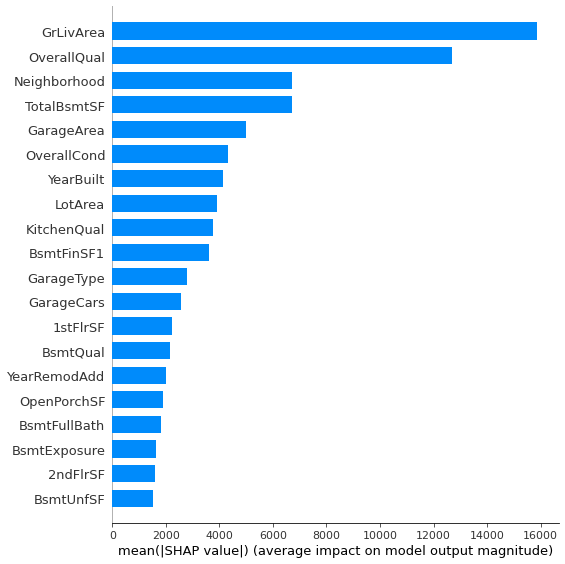

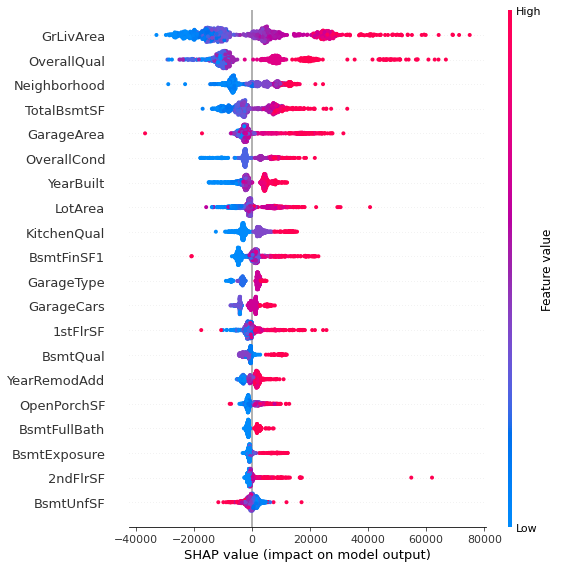

In [196]:
import shap # Use this package for visualization
explainer = shap.TreeExplainer(cb_regressor)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values,X_train, plot_type="bar")
shap.summary_plot(shap_values,X_train)

In [197]:
y_pred_test_cb= cb_regressor.predict(X_test)
print('CB Test R^2',r2_score(y_test, y_pred_test_cb),'CB Test RMSE', mean_squared_error(y_test, y_pred_test_cb, squared=False))

CB Test R^2 0.9183916015089022 CB Test RMSE 22348.180892875964


## Hybrid Approach

Consider the best two models, CatBoost and Gradient Boosting. Catboost is used to predict the sale price, Gradient Boosting is used to predict the residuals.

In [198]:
y_pred_train_cb = cb_regressor.predict(X_train)
train_resid = y_train - y_pred_train_cb

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


In [199]:
gbr_optimization_parameters_resid = {'learning_rate':  uniform(0.01,1), 
                               'n_estimators': range(10,100,10), 
                               'max_leaf_nodes':range(3,9,1), 
                               'max_depth':range(1,16,2),
                               'subsample': uniform(0.01,1),
                               'min_samples_split': range(30,81,10)} 

gbr_searcher_resid = RandomizedSearchCV(GradientBoostingRegressor(random_state = 1915743), 
                                  gbr_optimization_parameters_resid, random_state=1915743,n_iter=20) 

gbr_search_resid = gbr_searcher_resid.fit(X_train,train_resid)

gradboost_regressor_resid = gbr_search_resid.best_estimator_ 

gbr_search_resid.best_params_ 

{'learning_rate': 0.01461194535719034,
 'max_depth': 5,
 'max_leaf_nodes': 4,
 'min_samples_split': 60,
 'n_estimators': 40,
 'subsample': 0.5493361515998356}

In [200]:
y_pred_valid_cb =cb_regressor.predict(X_validation)
resid_pred_valid_gbm=gradboost_regressor_resid .predict(X_validation)
y_valid_final = y_pred_valid_cb+resid_pred_valid_gbm
print('Hybrid Val R^2',r2_score(y_validation,y_valid_final),' Hybrid Val RMSE', mean_squared_error(y_validation,y_valid_final, squared=False))

Hybrid Val R^2 0.871655114425751  Hybrid Val RMSE 30115.09779922388


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


In [201]:
y_pred_test_cb =cb_regressor.predict(X_test)
resid_pred_test_gbm=gradboost_regressor_resid .predict(X_test)
y_test_final = y_pred_test_cb+resid_pred_test_gbm
print('Hybrid Test R^2',r2_score(y_test,y_test_final),' Hybrid Test RMSE', mean_squared_error(y_test,y_test_final, squared=False))

Hybrid Val R^2 0.9183850385345838  Hybrid Val RMSE 22349.07949884832


`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


<span style="color:darkred"> **Note:** There is a typo here. We calculated the test $R^2$ and RMSE rather than validation. </span>

No significant effect of the hybrid model on the response. 

#### Baseline 

Here, we will calculate the average sale price with respect to neigborhoods.

In [203]:
# Build a naive baseline
import numpy as np
y_train_baseline = {'y_train': y_train, 'Neighborhood':X_train['Neighborhood']}
nb_mean = y_train_baseline['y_train'].groupby(y_train_baseline['Neighborhood']).mean()
nb_mean_value = np.array(nb_mean)
nb_mean_nb = np.unique(X_train["Neighborhood"].values)
nb_test  = np.array(X_test['Neighborhood'])
nb_test  = np.array(X_test['Neighborhood'])
naive_predictions = []
for i in range(X_test.shape[0]):
    for j in range(len(nb_mean_nb)):
        if nb_test[i] == nb_mean_nb[j]:
            naive_predictions.append(nb_mean_value[j])

print("Baseline R²:", r2_score(y_test, naive_predictions),"Baseline RMSE",mean_squared_error(y_test,naive_predictions, squared=False)) 

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.


Baseline R²: 0.6482693684819402 Baseline RMSE 46395.92591806724


**Note:**```should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.``` error does not affect the any analysis. It is just a warning caused by data quality check tool. 